## Bidirectional LSTM model na predikciu hodnot DST o 4 hodiny dopredu na zaklade 6-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+4_6H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 10:23:14.689907: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 4
y_col = f"DST+{shift}"

n_input = 6
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  6


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 6, 1)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 6, 256)              │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 128)              │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 6, 1)                │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,376 (1.26 MB)

 Trainable params: 330,376 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29:38 10s/step - loss: 0.9079 - mae: 0.6968

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 0.7555 - mae: 0.6266  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.7196 - mae: 0.6143

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.7654 - mae: 0.6208

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.7895 - mae: 0.6239

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.7889 - mae: 0.6189

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.7787 - mae: 0.6116

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7620 - mae: 0.6017

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7490 - mae: 0.5939

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.7368 - mae: 0.5872

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7254 - mae: 0.5814

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.7225 - mae: 0.5786

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7174 - mae: 0.5751

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.7106 - mae: 0.5710

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.7048 - mae: 0.5677

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.6981 - mae: 0.5640

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.6910 - mae: 0.5604

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.6836 - mae: 0.5567

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.6758 - mae: 0.5528

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.6685 - mae: 0.5491

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.6612 - mae: 0.5454

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.6538 - mae: 0.5418

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6496 - mae: 0.5389

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6449 - mae: 0.5357

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6399 - mae: 0.5325

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6347 - mae: 0.5291

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6297 - mae: 0.5260

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6247 - mae: 0.5229

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6195 - mae: 0.5198

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.6143 - mae: 0.5168

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.6093 - mae: 0.5139

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.6042 - mae: 0.5110

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5991 - mae: 0.5081

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5940 - mae: 0.5052

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5889 - mae: 0.5023

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5840 - mae: 0.4995

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5791 - mae: 0.4969

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5746 - mae: 0.4944

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.5701 - mae: 0.4920

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5658 - mae: 0.4896

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5616 - mae: 0.4873

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5575 - mae: 0.4851

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5534 - mae: 0.4829

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5496 - mae: 0.4807

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5458 - mae: 0.4787

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5423 - mae: 0.4768

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5389 - mae: 0.4750

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5357 - mae: 0.4733

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5337 - mae: 0.4719

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5317 - mae: 0.4705

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.5298 - mae: 0.4693

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5279 - mae: 0.4681 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5259 - mae: 0.4669

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5240 - mae: 0.4657

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5221 - mae: 0.4646

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5203 - mae: 0.4636

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5185 - mae: 0.4625

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5175 - mae: 0.4616

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5164 - mae: 0.4608

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5152 - mae: 0.4598

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5143 - mae: 0.4590

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5133 - mae: 0.4582

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5124 - mae: 0.4574

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5114 - mae: 0.4566

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5104 - mae: 0.4558

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.5094 - mae: 0.4551

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5083 - mae: 0.4543

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5072 - mae: 0.4535

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5061 - mae: 0.4528

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5051 - mae: 0.4520

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5040 - mae: 0.4513

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5029 - mae: 0.4506

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5018 - mae: 0.4498

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5007 - mae: 0.4491

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.4996 - mae: 0.4484

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.4984 - mae: 0.4477

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.4977 - mae: 0.4471

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4969 - mae: 0.4465

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4961 - mae: 0.4459

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4953 - mae: 0.4453

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4945 - mae: 0.4447

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4938 - mae: 0.4441

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.4930 - mae: 0.4436

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.4924 - mae: 0.4431

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.4917 - mae: 0.4426

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4910 - mae: 0.4421

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4902 - mae: 0.4416

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.4895 - mae: 0.4411

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4888 - mae: 0.4406

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4880 - mae: 0.4401

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4872 - mae: 0.4396

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4864 - mae: 0.4391

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4856 - mae: 0.4386

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4848 - mae: 0.4381

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.4839 - mae: 0.4376

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.4831 - mae: 0.4371

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.4822 - mae: 0.4366

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.4814 - mae: 0.4361

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.4805 - mae: 0.4355

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4796 - mae: 0.4350

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4787 - mae: 0.4345

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4779 - mae: 0.4340

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4770 - mae: 0.4335

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4761 - mae: 0.4330

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4752 - mae: 0.4326

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4744 - mae: 0.4321

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4735 - mae: 0.4316

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4726 - mae: 0.4312

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.4718 - mae: 0.4307

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4710 - mae: 0.4302

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4701 - mae: 0.4298

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4693 - mae: 0.4293

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4684 - mae: 0.4289

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4676 - mae: 0.4285

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4668 - mae: 0.4280

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4660 - mae: 0.4276

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4652 - mae: 0.4272

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4643 - mae: 0.4267

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4635 - mae: 0.4263

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4627 - mae: 0.4259

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4619 - mae: 0.4255

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4611 - mae: 0.4251

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.4604 - mae: 0.4247

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4596 - mae: 0.4243

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4589 - mae: 0.4239

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4581 - mae: 0.4235

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4574 - mae: 0.4231

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4566 - mae: 0.4228

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4559 - mae: 0.4224

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4551 - mae: 0.4220

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4544 - mae: 0.4217

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4537 - mae: 0.4213

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4530 - mae: 0.4210

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4523 - mae: 0.4206

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4516 - mae: 0.4203

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4509 - mae: 0.4199

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4502 - mae: 0.4196

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.4496 - mae: 0.4193

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4489 - mae: 0.4189

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4482 - mae: 0.4186

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4476 - mae: 0.4183

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4469 - mae: 0.4180

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4462 - mae: 0.4177

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4456 - mae: 0.4174

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4450 - mae: 0.4171

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4443 - mae: 0.4168

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4437 - mae: 0.4165

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4431 - mae: 0.4162

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4425 - mae: 0.4159

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4420 - mae: 0.4156

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4414 - mae: 0.4153

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.4408 - mae: 0.4151

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4403 - mae: 0.4148

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4397 - mae: 0.4145

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4391 - mae: 0.4142

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4386 - mae: 0.4140

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4381 - mae: 0.4137

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4376 - mae: 0.4135

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4371 - mae: 0.4132

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4366 - mae: 0.4130

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4361 - mae: 0.4127

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4356 - mae: 0.4125

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4351 - mae: 0.4122

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4346 - mae: 0.4120

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4341 - mae: 0.4118

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.4337 - mae: 0.4115

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4332 - mae: 0.4113

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4328 - mae: 0.4111

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4324 - mae: 0.4109

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4319 - mae: 0.4107

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4315 - mae: 0.4104

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4310 - mae: 0.4102

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4306 - mae: 0.4100

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4302 - mae: 0.4098

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.4298 - mae: 0.4096

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.4294 - mae: 0.4094

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4290 - mae: 0.4092

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4286 - mae: 0.4090

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4282 - mae: 0.4088

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4277 - mae: 0.4087

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4273 - mae: 0.4085

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4269 - mae: 0.4083

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4265 - mae: 0.4081

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4261 - mae: 0.4079

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4257 - mae: 0.4077

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4253 - mae: 0.4075

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.4249 - mae: 0.4073

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4245 - mae: 0.4071

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4241 - mae: 0.4070

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4237 - mae: 0.4068

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4233 - mae: 0.4066

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4230 - mae: 0.4064

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4226 - mae: 0.4063

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4222 - mae: 0.4061

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4219 - mae: 0.4059

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4215 - mae: 0.4058

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4211 - mae: 0.4056

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4208 - mae: 0.4054

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.4204 - mae: 0.4053

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4201 - mae: 0.4051

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4198 - mae: 0.4050

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4194 - mae: 0.4048

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4191 - mae: 0.4047

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4188 - mae: 0.4045

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4185 - mae: 0.4044

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4181 - mae: 0.4043

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4178 - mae: 0.4041

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4175 - mae: 0.4040

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4171 - mae: 0.4038

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.4168 - mae: 0.4037

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.4165 - mae: 0.4035

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.4162 - mae: 0.4034

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.4159 - mae: 0.4033

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.4157 - mae: 0.4031

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.4154 - mae: 0.4030

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.4152 - mae: 0.4029

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4149 - mae: 0.4027

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4147 - mae: 0.4026

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4145 - mae: 0.4025

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4142 - mae: 0.4024

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4140 - mae: 0.4023

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4138 - mae: 0.4022

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.4136 - mae: 0.4020

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4133 - mae: 0.4019

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4131 - mae: 0.4018

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4129 - mae: 0.4017

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4126 - mae: 0.4016

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4124 - mae: 0.4015

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4122 - mae: 0.4014

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4119 - mae: 0.4012

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4117 - mae: 0.4011

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4115 - mae: 0.4010

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4113 - mae: 0.4009

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4110 - mae: 0.4008

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4108 - mae: 0.4007

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.4106 - mae: 0.4006

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4104 - mae: 0.4005

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4101 - mae: 0.4004

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4099 - mae: 0.4003

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4097 - mae: 0.4001

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4094 - mae: 0.4000

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4092 - mae: 0.3999

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4090 - mae: 0.3998

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4087 - mae: 0.3997

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4085 - mae: 0.3996

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4083 - mae: 0.3995

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4081 - mae: 0.3994

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4078 - mae: 0.3993

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.4076 - mae: 0.3992

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4074 - mae: 0.3991

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4071 - mae: 0.3990

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4069 - mae: 0.3988

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4067 - mae: 0.3987

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4065 - mae: 0.3986

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4062 - mae: 0.3985

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4060 - mae: 0.3984

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4058 - mae: 0.3983

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4056 - mae: 0.3982

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4053 - mae: 0.3981

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4052 - mae: 0.3980

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4050 - mae: 0.3979

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.4049 - mae: 0.3978

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4047 - mae: 0.3978

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4046 - mae: 0.3977

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4044 - mae: 0.3976

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4043 - mae: 0.3975

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4042 - mae: 0.3974

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4040 - mae: 0.3973

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4039 - mae: 0.3973

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4038 - mae: 0.3972

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4037 - mae: 0.3971

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4035 - mae: 0.3970

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4034 - mae: 0.3969

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4033 - mae: 0.3969

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4031 - mae: 0.3968

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.4030 - mae: 0.3967

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4028 - mae: 0.3966

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4027 - mae: 0.3966

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4026 - mae: 0.3965

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4025 - mae: 0.3964

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4023 - mae: 0.3963

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4022 - mae: 0.3963

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4021 - mae: 0.3962

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4020 - mae: 0.3961

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4019 - mae: 0.3961

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4018 - mae: 0.3960

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4017 - mae: 0.3959

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4016 - mae: 0.3959

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4015 - mae: 0.3958

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.4014 - mae: 0.3958

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4013 - mae: 0.3957

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4012 - mae: 0.3956

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4011 - mae: 0.3956

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4010 - mae: 0.3955

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4009 - mae: 0.3954

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4008 - mae: 0.3954

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4006 - mae: 0.3953

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4005 - mae: 0.3953

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4004 - mae: 0.3952

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4003 - mae: 0.3951

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4002 - mae: 0.3951

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4001 - mae: 0.3950

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.4000 - mae: 0.3950

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3999 - mae: 0.3949

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3998 - mae: 0.3949

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3997 - mae: 0.3948

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3996 - mae: 0.3947

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3995 - mae: 0.3947

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3994 - mae: 0.3946

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3994 - mae: 0.3946

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3993 - mae: 0.3945

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3992 - mae: 0.3945

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3991 - mae: 0.3944

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3990 - mae: 0.3944

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3989 - mae: 0.3943

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3988 - mae: 0.3942

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3987 - mae: 0.3942

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3986 - mae: 0.3941

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3985 - mae: 0.3941

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3984 - mae: 0.3940

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3983 - mae: 0.3940

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3982 - mae: 0.3939

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3981 - mae: 0.3939

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3979 - mae: 0.3938

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3978 - mae: 0.3938

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3977 - mae: 0.3937

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3976 - mae: 0.3936

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3975 - mae: 0.3936

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3974 - mae: 0.3935

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3973 - mae: 0.3935

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3972 - mae: 0.3934

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3971 - mae: 0.3934

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3970 - mae: 0.3933

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3969 - mae: 0.3933

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3968 - mae: 0.3932

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3967 - mae: 0.3932

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3966 - mae: 0.3931

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3965 - mae: 0.3930

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3963 - mae: 0.3930

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3962 - mae: 0.3929

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3961 - mae: 0.3929

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3960 - mae: 0.3928

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3959 - mae: 0.3928

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3958 - mae: 0.3927

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3957 - mae: 0.3926

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3955 - mae: 0.3926

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3954 - mae: 0.3925

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3953 - mae: 0.3925

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3952 - mae: 0.3924

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3951 - mae: 0.3924

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3950 - mae: 0.3923

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3948 - mae: 0.3922

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3947 - mae: 0.3922

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3946 - mae: 0.3921

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3945 - mae: 0.3921

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3944 - mae: 0.3920

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3942 - mae: 0.3920

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3941 - mae: 0.3919

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3940 - mae: 0.3918

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3939 - mae: 0.3918

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3937 - mae: 0.3917

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3936 - mae: 0.3917

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3935 - mae: 0.3916

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3934 - mae: 0.3915

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3932 - mae: 0.3915

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3931 - mae: 0.3914

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3930 - mae: 0.3914

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3929 - mae: 0.3913

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3928 - mae: 0.3913

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3927 - mae: 0.3912

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3926 - mae: 0.3912

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3924 - mae: 0.3911

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3923 - mae: 0.3911

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3922 - mae: 0.3910

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3921 - mae: 0.3910

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3920 - mae: 0.3909

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3919 - mae: 0.3909

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3918 - mae: 0.3908

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3917 - mae: 0.3907

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3915 - mae: 0.3907

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3914 - mae: 0.3906

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3913 - mae: 0.3906

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3912 - mae: 0.3905

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3911 - mae: 0.3905

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3910 - mae: 0.3904

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3909 - mae: 0.3904

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3907 - mae: 0.3903

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3906 - mae: 0.3903

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3905 - mae: 0.3902

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3904 - mae: 0.3902

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3903 - mae: 0.3901

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3902 - mae: 0.3901

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3901 - mae: 0.3900

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3900 - mae: 0.3900

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3899 - mae: 0.3899

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3898 - mae: 0.3899

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3897 - mae: 0.3898

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3895 - mae: 0.3898

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3894 - mae: 0.3897

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3893 - mae: 0.3897

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3892 - mae: 0.3896

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3891 - mae: 0.3896

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3890 - mae: 0.3896

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3889 - mae: 0.3895

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3888 - mae: 0.3895

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3887 - mae: 0.3894

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3886 - mae: 0.3894

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3884 - mae: 0.3893

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3883 - mae: 0.3893

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3882 - mae: 0.3892

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3881 - mae: 0.3892

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3880 - mae: 0.3891

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3879 - mae: 0.3891

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3878 - mae: 0.3890

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3877 - mae: 0.3890

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3876 - mae: 0.3889

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3875 - mae: 0.3889

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3874 - mae: 0.3888

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3873 - mae: 0.3888

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3871 - mae: 0.3888

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3870 - mae: 0.3887

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3869 - mae: 0.3887

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3868 - mae: 0.3886

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3867 - mae: 0.3886

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3866 - mae: 0.3885

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3865 - mae: 0.3885

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3864 - mae: 0.3884

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3863 - mae: 0.3884

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3862 - mae: 0.3883

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3861 - mae: 0.3883

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3860 - mae: 0.3883

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3859 - mae: 0.3882

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3858 - mae: 0.3882

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3857 - mae: 0.3881

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3856 - mae: 0.3881

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3854 - mae: 0.3880

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3853 - mae: 0.3880

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3852 - mae: 0.3879

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3851 - mae: 0.3879

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3850 - mae: 0.3879

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3849 - mae: 0.3878

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3848 - mae: 0.3878

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3847 - mae: 0.3877

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3846 - mae: 0.3877

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3845 - mae: 0.3876

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3844 - mae: 0.3876

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3843 - mae: 0.3875

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3842 - mae: 0.3875

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3841 - mae: 0.3875

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3840 - mae: 0.3874

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3838 - mae: 0.3874

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3837 - mae: 0.3873

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3836 - mae: 0.3873

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3835 - mae: 0.3872

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3834 - mae: 0.3872

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3833 - mae: 0.3871

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3832 - mae: 0.3871

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3831 - mae: 0.3870

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3830 - mae: 0.3870

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3829 - mae: 0.3870

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3828 - mae: 0.3869

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3826 - mae: 0.3869

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3825 - mae: 0.3868

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3824 - mae: 0.3868

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3823 - mae: 0.3867

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3822 - mae: 0.3867

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3821 - mae: 0.3866

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3820 - mae: 0.3866

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3819 - mae: 0.3866

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3818 - mae: 0.3865

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3817 - mae: 0.3865

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3816 - mae: 0.3864

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3815 - mae: 0.3864

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3813 - mae: 0.3863

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3812 - mae: 0.3863

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3811 - mae: 0.3862

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3810 - mae: 0.3862

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3809 - mae: 0.3862

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3808 - mae: 0.3861

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3807 - mae: 0.3861

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3806 - mae: 0.3860

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3805 - mae: 0.3860

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3804 - mae: 0.3859

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3802 - mae: 0.3859

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3801 - mae: 0.3858

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3800 - mae: 0.3858

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3799 - mae: 0.3857

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3798 - mae: 0.3857

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3797 - mae: 0.3856

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3796 - mae: 0.3856

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3795 - mae: 0.3856

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3794 - mae: 0.3855

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3792 - mae: 0.3855

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3791 - mae: 0.3854

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3790 - mae: 0.3854

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3789 - mae: 0.3853

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3788 - mae: 0.3853

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3787 - mae: 0.3852

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3786 - mae: 0.3852

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3785 - mae: 0.3851

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3784 - mae: 0.3851

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3783 - mae: 0.3851

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3781 - mae: 0.3850

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3780 - mae: 0.3850

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3779 - mae: 0.3849

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3778 - mae: 0.3849

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3777 - mae: 0.3848

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3776 - mae: 0.3848

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3775 - mae: 0.3847

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3774 - mae: 0.3847

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3773 - mae: 0.3846

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3772 - mae: 0.3846

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3770 - mae: 0.3846

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3769 - mae: 0.3845

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3768 - mae: 0.3845

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3767 - mae: 0.3844

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3766 - mae: 0.3844

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3765 - mae: 0.3843

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3764 - mae: 0.3843

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3763 - mae: 0.3842

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3762 - mae: 0.3842

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3761 - mae: 0.3842

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3760 - mae: 0.3841

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3759 - mae: 0.3841

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3758 - mae: 0.3840

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3757 - mae: 0.3840

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3756 - mae: 0.3840

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3755 - mae: 0.3839

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3754 - mae: 0.3839

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3753 - mae: 0.3838

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3752 - mae: 0.3838

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3751 - mae: 0.3838

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3751 - mae: 0.3837

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3750 - mae: 0.3837

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3749 - mae: 0.3836

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3748 - mae: 0.3836

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3747 - mae: 0.3836

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.3746 - mae: 0.3835

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3745 - mae: 0.3835

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3744 - mae: 0.3834

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3743 - mae: 0.3834

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3742 - mae: 0.3834

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3741 - mae: 0.3833

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3740 - mae: 0.3833

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3739 - mae: 0.3832

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3739 - mae: 0.3832

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3738 - mae: 0.3832

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3737 - mae: 0.3831

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3736 - mae: 0.3831

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3735 - mae: 0.3831

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3734 - mae: 0.3830

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3733 - mae: 0.3830

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.3732 - mae: 0.3829

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3732 - mae: 0.3829

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3731 - mae: 0.3829

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3730 - mae: 0.3828

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3729 - mae: 0.3828

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3728 - mae: 0.3828

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3727 - mae: 0.3827

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3726 - mae: 0.3827

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3725 - mae: 0.3826

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3724 - mae: 0.3826

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3724 - mae: 0.3826

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3723 - mae: 0.3825

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3722 - mae: 0.3825

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3721 - mae: 0.3825

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.3720 - mae: 0.3824

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3719 - mae: 0.3824

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3718 - mae: 0.3824

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3718 - mae: 0.3823

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3717 - mae: 0.3823

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3716 - mae: 0.3822

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3715 - mae: 0.3822

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3714 - mae: 0.3822

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3714 - mae: 0.3821

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3713 - mae: 0.3821

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3712 - mae: 0.3821

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3711 - mae: 0.3820

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3710 - mae: 0.3820

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3710 - mae: 0.3820

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3709 - mae: 0.3819

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.3708 - mae: 0.3819

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3707 - mae: 0.3819

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3707 - mae: 0.3818

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3706 - mae: 0.3818

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3705 - mae: 0.3818

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3704 - mae: 0.3817

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3703 - mae: 0.3817

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3703 - mae: 0.3817

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3702 - mae: 0.3816

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3701 - mae: 0.3816

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3700 - mae: 0.3816

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3700 - mae: 0.3816

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3699 - mae: 0.3815

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3698 - mae: 0.3815

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3697 - mae: 0.3815

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.3696 - mae: 0.3814

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3696 - mae: 0.3814

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3695 - mae: 0.3814

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3694 - mae: 0.3813

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3693 - mae: 0.3813

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3693 - mae: 0.3813

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3692 - mae: 0.3812

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3691 - mae: 0.3812

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3690 - mae: 0.3812

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3690 - mae: 0.3811

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3689 - mae: 0.3811

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3688 - mae: 0.3811

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3687 - mae: 0.3810

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3687 - mae: 0.3810

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3686 - mae: 0.3810

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3685 - mae: 0.3810

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.3685 - mae: 0.3809

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3684 - mae: 0.3809

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3683 - mae: 0.3809

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3683 - mae: 0.3808

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3682 - mae: 0.3808

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3681 - mae: 0.3808

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3681 - mae: 0.3807

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3680 - mae: 0.3807

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3680 - mae: 0.3807

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3679 - mae: 0.3807

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3678 - mae: 0.3806

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3678 - mae: 0.3806

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3677 - mae: 0.3806

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3676 - mae: 0.3806

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3676 - mae: 0.3805

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.3675 - mae: 0.3805

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3674 - mae: 0.3805

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3674 - mae: 0.3804

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3673 - mae: 0.3804

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3673 - mae: 0.3804

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3672 - mae: 0.3804

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3671 - mae: 0.3803

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3671 - mae: 0.3803

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3670 - mae: 0.3803

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3669 - mae: 0.3802

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3669 - mae: 0.3802

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3668 - mae: 0.3802

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3667 - mae: 0.3802

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3667 - mae: 0.3801

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3666 - mae: 0.3801

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.3666 - mae: 0.3801

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3665 - mae: 0.3800

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3664 - mae: 0.3800

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3664 - mae: 0.3800

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3663 - mae: 0.3800

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3662 - mae: 0.3799

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3662 - mae: 0.3799

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3661 - mae: 0.3799

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3660 - mae: 0.3798

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3660 - mae: 0.3798

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3659 - mae: 0.3798

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3659 - mae: 0.3798

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3658 - mae: 0.3797

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3657 - mae: 0.3797

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3657 - mae: 0.3797

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.3656 - mae: 0.3797

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3655 - mae: 0.3796

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3655 - mae: 0.3796

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3654 - mae: 0.3796

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3653 - mae: 0.3795

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3653 - mae: 0.3795

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3652 - mae: 0.3795

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3652 - mae: 0.3795

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3651 - mae: 0.3794

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3650 - mae: 0.3794

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3650 - mae: 0.3794

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3649 - mae: 0.3793

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3648 - mae: 0.3793

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3648 - mae: 0.3793

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3647 - mae: 0.3793

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.3646 - mae: 0.3792

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3646 - mae: 0.3792

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3645 - mae: 0.3792

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3645 - mae: 0.3792

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3644 - mae: 0.3791

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3643 - mae: 0.3791

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3643 - mae: 0.3791

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3642 - mae: 0.3790

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3641 - mae: 0.3790

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3641 - mae: 0.3790

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3640 - mae: 0.3790

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3640 - mae: 0.3789

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3639 - mae: 0.3789

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3638 - mae: 0.3789

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3638 - mae: 0.3788

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.3637 - mae: 0.3788

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3636 - mae: 0.3788

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3636 - mae: 0.3788

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3635 - mae: 0.3787

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3635 - mae: 0.3787

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3634 - mae: 0.3787

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3633 - mae: 0.3787

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3633 - mae: 0.3786

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3632 - mae: 0.3786

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3632 - mae: 0.3786

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3631 - mae: 0.3786

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3630 - mae: 0.3785

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3630 - mae: 0.3785

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3629 - mae: 0.3785

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3628 - mae: 0.3784

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.3628 - mae: 0.3784

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3627 - mae: 0.3784

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3627 - mae: 0.3784

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3626 - mae: 0.3783

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3625 - mae: 0.3783

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3625 - mae: 0.3783

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3624 - mae: 0.3783

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3624 - mae: 0.3782

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3623 - mae: 0.3782

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3622 - mae: 0.3782

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3622 - mae: 0.3781

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3621 - mae: 0.3781

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3620 - mae: 0.3781

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3620 - mae: 0.3781

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3619 - mae: 0.3780

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.3619 - mae: 0.3780

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3618 - mae: 0.3780

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3617 - mae: 0.3780

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3617 - mae: 0.3779

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3616 - mae: 0.3779

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3615 - mae: 0.3779

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3615 - mae: 0.3778

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3614 - mae: 0.3778

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3614 - mae: 0.3778

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3613 - mae: 0.3778

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3612 - mae: 0.3777

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3612 - mae: 0.3777

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3611 - mae: 0.3777

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3610 - mae: 0.3777

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.3610 - mae: 0.3776

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3609 - mae: 0.3776

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3609 - mae: 0.3776

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3608 - mae: 0.3775

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3607 - mae: 0.3775

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3607 - mae: 0.3775

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3606 - mae: 0.3775

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3606 - mae: 0.3774

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3605 - mae: 0.3774

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3604 - mae: 0.3774

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3604 - mae: 0.3774

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3603 - mae: 0.3773

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3602 - mae: 0.3773

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3602 - mae: 0.3773

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3601 - mae: 0.3773

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.3601 - mae: 0.3772

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3600 - mae: 0.3772 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3599 - mae: 0.3772

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3599 - mae: 0.3771

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3598 - mae: 0.3771

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3598 - mae: 0.3771

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3597 - mae: 0.3771

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3596 - mae: 0.3770

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3596 - mae: 0.3770

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3595 - mae: 0.3770

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3594 - mae: 0.3770

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3594 - mae: 0.3769

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3593 - mae: 0.3769

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3593 - mae: 0.3769

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3592 - mae: 0.3768

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.3591 - mae: 0.3768

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3591 - mae: 0.3768

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3590 - mae: 0.3768

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3589 - mae: 0.3767

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3589 - mae: 0.3767

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3588 - mae: 0.3767

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3588 - mae: 0.3767

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3587 - mae: 0.3766

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3586 - mae: 0.3766

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3586 - mae: 0.3766

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3585 - mae: 0.3766

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3585 - mae: 0.3765

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3584 - mae: 0.3765

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3583 - mae: 0.3765

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.3583 - mae: 0.3764

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3582 - mae: 0.3764

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3582 - mae: 0.3764

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3581 - mae: 0.3764

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3580 - mae: 0.3763

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3580 - mae: 0.3763

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3579 - mae: 0.3763

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3579 - mae: 0.3763

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3578 - mae: 0.3762

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3577 - mae: 0.3762

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3577 - mae: 0.3762

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3576 - mae: 0.3762

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3576 - mae: 0.3761

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3575 - mae: 0.3761

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3575 - mae: 0.3761

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3574 - mae: 0.3761

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3573 - mae: 0.3761

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3573 - mae: 0.3760

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3572 - mae: 0.3760

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3572 - mae: 0.3760

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3571 - mae: 0.3760

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3571 - mae: 0.3759

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3570 - mae: 0.3759

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3570 - mae: 0.3759

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3569 - mae: 0.3759

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3569 - mae: 0.3758

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3568 - mae: 0.3758

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3567 - mae: 0.3758

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3567 - mae: 0.3758

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3566 - mae: 0.3757

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3566 - mae: 0.3757

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3565 - mae: 0.3757

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3565 - mae: 0.3757

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3564 - mae: 0.3757

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3564 - mae: 0.3756

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3563 - mae: 0.3756

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3562 - mae: 0.3756

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3562 - mae: 0.3756

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3561 - mae: 0.3755

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3561 - mae: 0.3755

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3560 - mae: 0.3755

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3560 - mae: 0.3755

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3559 - mae: 0.3754

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3559 - mae: 0.3754

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3558 - mae: 0.3754

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3557 - mae: 0.3754

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3557 - mae: 0.3754

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3556 - mae: 0.3753

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3556 - mae: 0.3753

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3555 - mae: 0.3753

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3555 - mae: 0.3753

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3554 - mae: 0.3752

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3554 - mae: 0.3752

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3553 - mae: 0.3752

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3553 - mae: 0.3752

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3552 - mae: 0.3752

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3551 - mae: 0.3751

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3551 - mae: 0.3751

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3550 - mae: 0.3751

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3550 - mae: 0.3751

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3549 - mae: 0.3750

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3549 - mae: 0.3750

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3548 - mae: 0.3750

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3548 - mae: 0.3750

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3547 - mae: 0.3750

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3547 - mae: 0.3749

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3546 - mae: 0.3749

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3546 - mae: 0.3749

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3545 - mae: 0.3749

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3544 - mae: 0.3748

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3544 - mae: 0.3748

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3543 - mae: 0.3748

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3543 - mae: 0.3748

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3542 - mae: 0.3747

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3542 - mae: 0.3747

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3541 - mae: 0.3747

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3541 - mae: 0.3747

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3540 - mae: 0.3747

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3540 - mae: 0.3746

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3539 - mae: 0.3746

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3539 - mae: 0.3746

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3538 - mae: 0.3746

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3538 - mae: 0.3745

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3537 - mae: 0.3745

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3537 - mae: 0.3745

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3536 - mae: 0.3745

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3536 - mae: 0.3745

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3535 - mae: 0.3744

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3534 - mae: 0.3744

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3534 - mae: 0.3744

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3534 - mae: 0.3744

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3533 - mae: 0.3744

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3533 - mae: 0.3743

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3532 - mae: 0.3743

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3532 - mae: 0.3743

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3531 - mae: 0.3743

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3531 - mae: 0.3743

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3530 - mae: 0.3742

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3530 - mae: 0.3742

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3529 - mae: 0.3742

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3529 - mae: 0.3742

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3528 - mae: 0.3741

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3528 - mae: 0.3741

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3527 - mae: 0.3741

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3527 - mae: 0.3741

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3526 - mae: 0.3741

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3526 - mae: 0.3740

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3525 - mae: 0.3740

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3525 - mae: 0.3740

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3524 - mae: 0.3740

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3524 - mae: 0.3740

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3524 - mae: 0.3739

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3523 - mae: 0.3739

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3523 - mae: 0.3739

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3522 - mae: 0.3739

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3522 - mae: 0.3739

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3521 - mae: 0.3739

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3521 - mae: 0.3738

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3520 - mae: 0.3738

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3520 - mae: 0.3738

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3519 - mae: 0.3738


Epoch 1: val_mae improved from inf to 0.41668, saving model to models/DST+4_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 78s 75ms/step - loss: 0.3519 - mae: 0.3738 - val_loss: 0.4354 - val_mae: 0.4167


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1842 - mae: 0.3109

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2165 - mae: 0.3312 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2329 - mae: 0.3416

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2394 - mae: 0.3465

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2405 - mae: 0.3486

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2477 - mae: 0.3538

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2489 - mae: 0.3544

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2496 - mae: 0.3552

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2529 - mae: 0.3567

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2547 - mae: 0.3575

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2552 - mae: 0.3576

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2547 - mae: 0.3571

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2548 - mae: 0.3570

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2623 - mae: 0.3585

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2681 - mae: 0.3597

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2721 - mae: 0.3600

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2749 - mae: 0.3599

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2770 - mae: 0.3598

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2793 - mae: 0.3598

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2809 - mae: 0.3597

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2841 - mae: 0.3600

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2901 - mae: 0.3614

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2951 - mae: 0.3625

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2992 - mae: 0.3634

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3025 - mae: 0.3639

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3052 - mae: 0.3642

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3077 - mae: 0.3646

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3098 - mae: 0.3651

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3116 - mae: 0.3655

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3130 - mae: 0.3658

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3142 - mae: 0.3661

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3151 - mae: 0.3663

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3159 - mae: 0.3664

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3168 - mae: 0.3667

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3175 - mae: 0.3670 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3183 - mae: 0.3673

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3189 - mae: 0.3675

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3194 - mae: 0.3677

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3198 - mae: 0.3679

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.3218 - mae: 0.3683

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3236 - mae: 0.3688 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3252 - mae: 0.3691

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3270 - mae: 0.3696

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3289 - mae: 0.3702

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3306 - mae: 0.3707

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3322 - mae: 0.3712

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3336 - mae: 0.3717

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3350 - mae: 0.3722

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3363 - mae: 0.3727

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3377 - mae: 0.3732

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3389 - mae: 0.3737

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3400 - mae: 0.3741

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3411 - mae: 0.3745

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3420 - mae: 0.3749

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.3429 - mae: 0.3753

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3438 - mae: 0.3756

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3445 - mae: 0.3760

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3451 - mae: 0.3763

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3457 - mae: 0.3765

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3461 - mae: 0.3767

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3465 - mae: 0.3769

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3468 - mae: 0.3771

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3472 - mae: 0.3772

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3475 - mae: 0.3774

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3477 - mae: 0.3775

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3479 - mae: 0.3775

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3480 - mae: 0.3776

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3481 - mae: 0.3777

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3482 - mae: 0.3777

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3483 - mae: 0.3778

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3483 - mae: 0.3778

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3483 - mae: 0.3778

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3483 - mae: 0.3778

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3483 - mae: 0.3778

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3482 - mae: 0.3779

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3482 - mae: 0.3778

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3481 - mae: 0.3778

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3479 - mae: 0.3778

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3478 - mae: 0.3777

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3476 - mae: 0.3777

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3475 - mae: 0.3776

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3475 - mae: 0.3776

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3476 - mae: 0.3776

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3477 - mae: 0.3776

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3480 - mae: 0.3777

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3483 - mae: 0.3777

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3486 - mae: 0.3778

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3488 - mae: 0.3778

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.3491 - mae: 0.3779

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3495 - mae: 0.3779

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3497 - mae: 0.3780

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3500 - mae: 0.3780

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3502 - mae: 0.3781

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3504 - mae: 0.3781

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3506 - mae: 0.3781

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3510 - mae: 0.3782

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3514 - mae: 0.3782

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3517 - mae: 0.3783

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3521 - mae: 0.3784

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3524 - mae: 0.3784

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3526 - mae: 0.3784

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.3529 - mae: 0.3785

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3531 - mae: 0.3785

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3533 - mae: 0.3785

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3536 - mae: 0.3786

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3538 - mae: 0.3786

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3539 - mae: 0.3786

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3541 - mae: 0.3786

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3543 - mae: 0.3787

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3545 - mae: 0.3787

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3546 - mae: 0.3787

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3548 - mae: 0.3787

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3549 - mae: 0.3787

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3550 - mae: 0.3787

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3551 - mae: 0.3787

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3551 - mae: 0.3787

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3552 - mae: 0.3787

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3553 - mae: 0.3787

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3553 - mae: 0.3786

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3553 - mae: 0.3786

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3553 - mae: 0.3785

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3553 - mae: 0.3785

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3553 - mae: 0.3784

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3552 - mae: 0.3784

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3552 - mae: 0.3783

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3551 - mae: 0.3783

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3551 - mae: 0.3782

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3550 - mae: 0.3781

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3549 - mae: 0.3781

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3548 - mae: 0.3780

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3547 - mae: 0.3779

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3547 - mae: 0.3778

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3546 - mae: 0.3778

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3545 - mae: 0.3777

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3544 - mae: 0.3777

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3544 - mae: 0.3776

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3543 - mae: 0.3776

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3542 - mae: 0.3775

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3541 - mae: 0.3774

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3541 - mae: 0.3774

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3540 - mae: 0.3774

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3540 - mae: 0.3773

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3540 - mae: 0.3773

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3542 - mae: 0.3772

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3544 - mae: 0.3772

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3546 - mae: 0.3772

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3548 - mae: 0.3772

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3550 - mae: 0.3772

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3552 - mae: 0.3772

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3554 - mae: 0.3772

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3556 - mae: 0.3772

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3558 - mae: 0.3772

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3560 - mae: 0.3772

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3561 - mae: 0.3771

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3563 - mae: 0.3771

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3564 - mae: 0.3771

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3565 - mae: 0.3771

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3567 - mae: 0.3771

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3568 - mae: 0.3770

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3569 - mae: 0.3770

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3570 - mae: 0.3770

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3571 - mae: 0.3770

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3572 - mae: 0.3769

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3573 - mae: 0.3769

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3574 - mae: 0.3769

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3575 - mae: 0.3768

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3576 - mae: 0.3768

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3577 - mae: 0.3768

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3578 - mae: 0.3768

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3578 - mae: 0.3767

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3579 - mae: 0.3767

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3580 - mae: 0.3767

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3581 - mae: 0.3767

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3581 - mae: 0.3766

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3582 - mae: 0.3766

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3583 - mae: 0.3766

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3583 - mae: 0.3765

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3584 - mae: 0.3765

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3584 - mae: 0.3765

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3584 - mae: 0.3764

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3585 - mae: 0.3764

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3585 - mae: 0.3764

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3585 - mae: 0.3763

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3586 - mae: 0.3763

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3586 - mae: 0.3763

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3587 - mae: 0.3763

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3587 - mae: 0.3762

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3587 - mae: 0.3762

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3587 - mae: 0.3762

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3587 - mae: 0.3761

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3587 - mae: 0.3761

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3588 - mae: 0.3761

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3588 - mae: 0.3760

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3588 - mae: 0.3760

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3588 - mae: 0.3760

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3588 - mae: 0.3760

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3759

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3759

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3759

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3758

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3758

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3758

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3757

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.3588 - mae: 0.3757

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3588 - mae: 0.3757

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3587 - mae: 0.3756

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3587 - mae: 0.3756

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3587 - mae: 0.3756

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3587 - mae: 0.3755

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3755

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3755

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3754

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3754

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3754

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3753

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3753

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3753

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3752

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3587 - mae: 0.3752

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3586 - mae: 0.3752

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3586 - mae: 0.3751

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3586 - mae: 0.3751

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3586 - mae: 0.3750

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3586 - mae: 0.3750

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3585 - mae: 0.3750

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3585 - mae: 0.3749

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3585 - mae: 0.3749

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3584 - mae: 0.3748

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3584 - mae: 0.3748

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3584 - mae: 0.3748

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3584 - mae: 0.3747

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3583 - mae: 0.3747

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3583 - mae: 0.3747

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3583 - mae: 0.3746

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3583 - mae: 0.3746

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3583 - mae: 0.3746

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3583 - mae: 0.3745

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3583 - mae: 0.3745

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3583 - mae: 0.3745

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3582 - mae: 0.3744

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3582 - mae: 0.3744

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3582 - mae: 0.3744

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3582 - mae: 0.3743

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3581 - mae: 0.3743

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3581 - mae: 0.3743

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3581 - mae: 0.3742

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3581 - mae: 0.3742

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3580 - mae: 0.3741

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3580 - mae: 0.3741

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3579 - mae: 0.3741

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3579 - mae: 0.3740

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3579 - mae: 0.3740

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3578 - mae: 0.3739

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3578 - mae: 0.3739

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3577 - mae: 0.3739

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3576 - mae: 0.3738

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3576 - mae: 0.3738

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3575 - mae: 0.3737

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3575 - mae: 0.3737

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3574 - mae: 0.3736

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3573 - mae: 0.3736

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3573 - mae: 0.3735

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3572 - mae: 0.3735

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3571 - mae: 0.3734

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3571 - mae: 0.3734

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3570 - mae: 0.3733

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3569 - mae: 0.3733

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3568 - mae: 0.3732

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3568 - mae: 0.3732

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3567 - mae: 0.3731

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3566 - mae: 0.3731

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3565 - mae: 0.3730

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3565 - mae: 0.3730

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3564 - mae: 0.3729

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3563 - mae: 0.3729

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3562 - mae: 0.3728

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3562 - mae: 0.3728

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3561 - mae: 0.3727

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3560 - mae: 0.3727

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3559 - mae: 0.3726

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3558 - mae: 0.3726

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3558 - mae: 0.3725

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3557 - mae: 0.3725

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3556 - mae: 0.3724

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3555 - mae: 0.3724

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3554 - mae: 0.3723

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3554 - mae: 0.3723

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.3553 - mae: 0.3722

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3552 - mae: 0.3722

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3552 - mae: 0.3721

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3551 - mae: 0.3721

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3550 - mae: 0.3720

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3550 - mae: 0.3720

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3549 - mae: 0.3719

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3548 - mae: 0.3719

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3547 - mae: 0.3718

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3547 - mae: 0.3718

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3546 - mae: 0.3717

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3545 - mae: 0.3717

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3544 - mae: 0.3716

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3544 - mae: 0.3716

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.3543 - mae: 0.3715

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3542 - mae: 0.3715

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3541 - mae: 0.3714

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3541 - mae: 0.3714

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3540 - mae: 0.3713

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3539 - mae: 0.3713

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3538 - mae: 0.3712

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3537 - mae: 0.3712

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3537 - mae: 0.3711

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3536 - mae: 0.3711

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3535 - mae: 0.3710

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3534 - mae: 0.3710

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3533 - mae: 0.3709

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3532 - mae: 0.3709

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.3531 - mae: 0.3708

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3530 - mae: 0.3708

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3529 - mae: 0.3707

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3529 - mae: 0.3707

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3528 - mae: 0.3706

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3527 - mae: 0.3706

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3526 - mae: 0.3705

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3525 - mae: 0.3705

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3524 - mae: 0.3704

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3523 - mae: 0.3704

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3522 - mae: 0.3703

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3521 - mae: 0.3702

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3520 - mae: 0.3702

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3519 - mae: 0.3701

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.3518 - mae: 0.3701

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3517 - mae: 0.3700

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3516 - mae: 0.3700

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3515 - mae: 0.3699

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3514 - mae: 0.3699

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3513 - mae: 0.3698

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3512 - mae: 0.3698

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3511 - mae: 0.3697

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3510 - mae: 0.3697

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3509 - mae: 0.3696

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3508 - mae: 0.3696

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3507 - mae: 0.3695

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3506 - mae: 0.3695

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3505 - mae: 0.3694

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.3504 - mae: 0.3693

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3503 - mae: 0.3693

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3502 - mae: 0.3692

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3501 - mae: 0.3692

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3500 - mae: 0.3691

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3499 - mae: 0.3691

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3498 - mae: 0.3690

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3497 - mae: 0.3690

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3496 - mae: 0.3689

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3495 - mae: 0.3689

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3494 - mae: 0.3689

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3493 - mae: 0.3688

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3492 - mae: 0.3688

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3492 - mae: 0.3687

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3491 - mae: 0.3687

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.3490 - mae: 0.3686

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3489 - mae: 0.3686

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3488 - mae: 0.3685

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3487 - mae: 0.3685

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3486 - mae: 0.3684

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3485 - mae: 0.3684

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3485 - mae: 0.3684

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3484 - mae: 0.3683

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3483 - mae: 0.3683

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3482 - mae: 0.3682

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3481 - mae: 0.3682

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3480 - mae: 0.3681

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3479 - mae: 0.3681

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3478 - mae: 0.3680

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.3477 - mae: 0.3680

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3476 - mae: 0.3679

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3475 - mae: 0.3679

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3474 - mae: 0.3678

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3473 - mae: 0.3678

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3472 - mae: 0.3678

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3471 - mae: 0.3677

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3470 - mae: 0.3677

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3469 - mae: 0.3676

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3468 - mae: 0.3676

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3467 - mae: 0.3675

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3467 - mae: 0.3675

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3466 - mae: 0.3674

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3465 - mae: 0.3674

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3464 - mae: 0.3673

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.3463 - mae: 0.3673

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3462 - mae: 0.3673

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3461 - mae: 0.3672

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3460 - mae: 0.3672

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3459 - mae: 0.3671

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3458 - mae: 0.3671

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3458 - mae: 0.3670

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3457 - mae: 0.3670

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3456 - mae: 0.3670

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3455 - mae: 0.3669

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3454 - mae: 0.3669

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3453 - mae: 0.3668

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3452 - mae: 0.3668

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3451 - mae: 0.3667

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3450 - mae: 0.3667

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.3449 - mae: 0.3666

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3448 - mae: 0.3666

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3447 - mae: 0.3666

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3446 - mae: 0.3665

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3446 - mae: 0.3665

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3445 - mae: 0.3664

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3444 - mae: 0.3664

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3443 - mae: 0.3663

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3442 - mae: 0.3663

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3441 - mae: 0.3663

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3440 - mae: 0.3662

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3439 - mae: 0.3662

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3438 - mae: 0.3661

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3437 - mae: 0.3661

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3437 - mae: 0.3661

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.3436 - mae: 0.3660

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3435 - mae: 0.3660

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3434 - mae: 0.3659

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3433 - mae: 0.3659

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3432 - mae: 0.3658

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3432 - mae: 0.3658

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3431 - mae: 0.3658

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3430 - mae: 0.3657

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3429 - mae: 0.3657

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3429 - mae: 0.3657

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3428 - mae: 0.3656

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3427 - mae: 0.3656

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3426 - mae: 0.3656

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3426 - mae: 0.3655

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3425 - mae: 0.3655

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3424 - mae: 0.3654

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.3424 - mae: 0.3654

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3423 - mae: 0.3654

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3422 - mae: 0.3653

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3421 - mae: 0.3653

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3421 - mae: 0.3653

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3420 - mae: 0.3652

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3419 - mae: 0.3652

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3419 - mae: 0.3652

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3418 - mae: 0.3651

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3417 - mae: 0.3651

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3416 - mae: 0.3651

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3416 - mae: 0.3650

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3415 - mae: 0.3650

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3414 - mae: 0.3650

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3414 - mae: 0.3649

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.3413 - mae: 0.3649

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3412 - mae: 0.3649

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3411 - mae: 0.3648

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3411 - mae: 0.3648

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3410 - mae: 0.3648

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3409 - mae: 0.3647

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3408 - mae: 0.3647

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3408 - mae: 0.3647

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3407 - mae: 0.3646

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3406 - mae: 0.3646

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3405 - mae: 0.3646

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3405 - mae: 0.3645

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3404 - mae: 0.3645

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3403 - mae: 0.3645

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3402 - mae: 0.3644

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.3402 - mae: 0.3644

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3401 - mae: 0.3644

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3400 - mae: 0.3643

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3399 - mae: 0.3643

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3399 - mae: 0.3643

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3398 - mae: 0.3642

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3397 - mae: 0.3642

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3397 - mae: 0.3642

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3396 - mae: 0.3641

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3395 - mae: 0.3641

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3394 - mae: 0.3641

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3394 - mae: 0.3640

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3393 - mae: 0.3640

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3392 - mae: 0.3640

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3392 - mae: 0.3639

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3391 - mae: 0.3639

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.3390 - mae: 0.3639

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3389 - mae: 0.3638

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3389 - mae: 0.3638

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3388 - mae: 0.3638

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3387 - mae: 0.3637

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3387 - mae: 0.3637

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3386 - mae: 0.3637

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3385 - mae: 0.3636

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3385 - mae: 0.3636

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3384 - mae: 0.3636

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3383 - mae: 0.3635

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3383 - mae: 0.3635

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3382 - mae: 0.3635

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3381 - mae: 0.3634

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3381 - mae: 0.3634

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.3380 - mae: 0.3634

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3379 - mae: 0.3634

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3379 - mae: 0.3633

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3378 - mae: 0.3633

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3377 - mae: 0.3633

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3377 - mae: 0.3632

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3376 - mae: 0.3632

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3375 - mae: 0.3632

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3375 - mae: 0.3631

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3374 - mae: 0.3631

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3373 - mae: 0.3631

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3373 - mae: 0.3630

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3372 - mae: 0.3630

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3371 - mae: 0.3630

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3370 - mae: 0.3629

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.3370 - mae: 0.3629

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3369 - mae: 0.3629

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3368 - mae: 0.3628

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3368 - mae: 0.3628

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.3367 - mae: 0.3628

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3366 - mae: 0.3627

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3366 - mae: 0.3627

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3365 - mae: 0.3627

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3364 - mae: 0.3626

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3364 - mae: 0.3626

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3363 - mae: 0.3626

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3362 - mae: 0.3625

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3361 - mae: 0.3625

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3361 - mae: 0.3625

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3360 - mae: 0.3624

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.3359 - mae: 0.3624

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3359 - mae: 0.3624

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3358 - mae: 0.3623

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3357 - mae: 0.3623

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3356 - mae: 0.3623

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3356 - mae: 0.3622

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3355 - mae: 0.3622

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3354 - mae: 0.3622

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3354 - mae: 0.3621

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3353 - mae: 0.3621

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3352 - mae: 0.3621

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3351 - mae: 0.3620

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3351 - mae: 0.3620

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3350 - mae: 0.3620

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3349 - mae: 0.3619

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3348 - mae: 0.3619

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.3348 - mae: 0.3619

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3347 - mae: 0.3618

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3346 - mae: 0.3618

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3346 - mae: 0.3618

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3345 - mae: 0.3617

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3344 - mae: 0.3617

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3343 - mae: 0.3617

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3343 - mae: 0.3616

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3342 - mae: 0.3616

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3341 - mae: 0.3616

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3341 - mae: 0.3615

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3340 - mae: 0.3615

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3339 - mae: 0.3615

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3338 - mae: 0.3614

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3338 - mae: 0.3614

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.3337 - mae: 0.3614

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3336 - mae: 0.3613

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3336 - mae: 0.3613

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3335 - mae: 0.3613

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3334 - mae: 0.3613

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3333 - mae: 0.3612

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3333 - mae: 0.3612

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3332 - mae: 0.3612

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3331 - mae: 0.3611

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3331 - mae: 0.3611

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3330 - mae: 0.3611

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3329 - mae: 0.3610

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3328 - mae: 0.3610

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3328 - mae: 0.3610

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3327 - mae: 0.3609

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3326 - mae: 0.3609

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3325 - mae: 0.3609

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3325 - mae: 0.3608

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3324 - mae: 0.3608

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3323 - mae: 0.3608

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3323 - mae: 0.3607

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3322 - mae: 0.3607

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3321 - mae: 0.3607

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3320 - mae: 0.3606

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3320 - mae: 0.3606

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3319 - mae: 0.3606

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3318 - mae: 0.3605

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3318 - mae: 0.3605

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3317 - mae: 0.3605

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3316 - mae: 0.3604

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3315 - mae: 0.3604

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3315 - mae: 0.3604

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3314 - mae: 0.3603

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3313 - mae: 0.3603

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3313 - mae: 0.3603

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3312 - mae: 0.3602

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3311 - mae: 0.3602

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3310 - mae: 0.3602

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3310 - mae: 0.3601

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3309 - mae: 0.3601

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3308 - mae: 0.3601

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3307 - mae: 0.3600

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3307 - mae: 0.3600

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3306 - mae: 0.3600

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3305 - mae: 0.3599

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3305 - mae: 0.3599

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3304 - mae: 0.3599

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3303 - mae: 0.3598

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3302 - mae: 0.3598

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3302 - mae: 0.3598

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3301 - mae: 0.3598

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3300 - mae: 0.3597

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3300 - mae: 0.3597

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3299 - mae: 0.3597

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3298 - mae: 0.3596

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3297 - mae: 0.3596

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3297 - mae: 0.3596

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3296 - mae: 0.3595

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3295 - mae: 0.3595

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3295 - mae: 0.3595

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3294 - mae: 0.3594

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3293 - mae: 0.3594

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3293 - mae: 0.3594

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3292 - mae: 0.3593

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3291 - mae: 0.3593

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3291 - mae: 0.3593

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3290 - mae: 0.3592

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3289 - mae: 0.3592

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3288 - mae: 0.3592

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3288 - mae: 0.3591

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3287 - mae: 0.3591

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3286 - mae: 0.3591

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3286 - mae: 0.3590

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3285 - mae: 0.3590

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3284 - mae: 0.3590

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3284 - mae: 0.3590

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3283 - mae: 0.3589

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3282 - mae: 0.3589

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3281 - mae: 0.3589

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3281 - mae: 0.3588

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3280 - mae: 0.3588

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3279 - mae: 0.3588

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3279 - mae: 0.3587

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3278 - mae: 0.3587

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3277 - mae: 0.3587

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3277 - mae: 0.3586

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3276 - mae: 0.3586

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3275 - mae: 0.3586

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3274 - mae: 0.3585

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3274 - mae: 0.3585

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3273 - mae: 0.3585

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3272 - mae: 0.3584

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3272 - mae: 0.3584

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3271 - mae: 0.3584

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3270 - mae: 0.3583

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3270 - mae: 0.3583

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3269 - mae: 0.3583

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3268 - mae: 0.3582

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3267 - mae: 0.3582

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3267 - mae: 0.3582

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3266 - mae: 0.3582

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3265 - mae: 0.3581

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3265 - mae: 0.3581

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3264 - mae: 0.3581

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3263 - mae: 0.3580

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3263 - mae: 0.3580

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3262 - mae: 0.3580

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3261 - mae: 0.3579

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3260 - mae: 0.3579

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3260 - mae: 0.3579

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3259 - mae: 0.3578

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3258 - mae: 0.3578

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3258 - mae: 0.3578

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3257 - mae: 0.3577

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3256 - mae: 0.3577

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3256 - mae: 0.3577

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3255 - mae: 0.3577

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3254 - mae: 0.3576

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3254 - mae: 0.3576

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3253 - mae: 0.3576

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3252 - mae: 0.3575

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3252 - mae: 0.3575

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3251 - mae: 0.3575

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3250 - mae: 0.3574

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3249 - mae: 0.3574

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3249 - mae: 0.3574

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3248 - mae: 0.3573

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3247 - mae: 0.3573

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3247 - mae: 0.3573

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3246 - mae: 0.3573

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3245 - mae: 0.3572

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3245 - mae: 0.3572

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3244 - mae: 0.3572

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3243 - mae: 0.3571

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3243 - mae: 0.3571

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3242 - mae: 0.3571

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3241 - mae: 0.3570

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3241 - mae: 0.3570

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3240 - mae: 0.3570

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3239 - mae: 0.3570

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3238 - mae: 0.3569

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3238 - mae: 0.3569

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3237 - mae: 0.3569

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3236 - mae: 0.3568

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3236 - mae: 0.3568

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3235 - mae: 0.3568

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3234 - mae: 0.3567

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3234 - mae: 0.3567

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3233 - mae: 0.3567

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3232 - mae: 0.3567

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3232 - mae: 0.3566

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3231 - mae: 0.3566

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3230 - mae: 0.3566

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3230 - mae: 0.3565

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3229 - mae: 0.3565

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3228 - mae: 0.3565

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3228 - mae: 0.3564

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3227 - mae: 0.3564

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3226 - mae: 0.3564

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3226 - mae: 0.3564

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3225 - mae: 0.3563

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3224 - mae: 0.3563

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3224 - mae: 0.3563

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3223 - mae: 0.3562

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3222 - mae: 0.3562

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3222 - mae: 0.3562

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3221 - mae: 0.3561

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3220 - mae: 0.3561

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3220 - mae: 0.3561

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3219 - mae: 0.3561

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3218 - mae: 0.3560

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3218 - mae: 0.3560

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3217 - mae: 0.3560

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3216 - mae: 0.3559

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3216 - mae: 0.3559

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3215 - mae: 0.3559

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3214 - mae: 0.3559

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3214 - mae: 0.3558

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3213 - mae: 0.3558

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3212 - mae: 0.3558

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3212 - mae: 0.3557

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3211 - mae: 0.3557

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3211 - mae: 0.3557

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3210 - mae: 0.3557

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3209 - mae: 0.3556

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3209 - mae: 0.3556

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3208 - mae: 0.3556

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3207 - mae: 0.3556

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3207 - mae: 0.3555

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3206 - mae: 0.3555

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3205 - mae: 0.3555

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3205 - mae: 0.3554

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3204 - mae: 0.3554

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3204 - mae: 0.3554

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3203 - mae: 0.3554 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3202 - mae: 0.3553

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3202 - mae: 0.3553

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3201 - mae: 0.3553

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3200 - mae: 0.3552

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3200 - mae: 0.3552

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3199 - mae: 0.3552

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3199 - mae: 0.3552

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3198 - mae: 0.3551

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3197 - mae: 0.3551

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3197 - mae: 0.3551

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3196 - mae: 0.3551

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3195 - mae: 0.3550

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3195 - mae: 0.3550

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3194 - mae: 0.3550

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3194 - mae: 0.3549

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3193 - mae: 0.3549

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3192 - mae: 0.3549

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3192 - mae: 0.3549

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3191 - mae: 0.3548

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3190 - mae: 0.3548

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3190 - mae: 0.3548

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3189 - mae: 0.3548

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3189 - mae: 0.3547

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3188 - mae: 0.3547

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3187 - mae: 0.3547

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3187 - mae: 0.3547

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3186 - mae: 0.3546

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3186 - mae: 0.3546

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3185 - mae: 0.3546

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3184 - mae: 0.3545

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3184 - mae: 0.3545

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3183 - mae: 0.3545

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3183 - mae: 0.3545

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3182 - mae: 0.3544

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3181 - mae: 0.3544

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3181 - mae: 0.3544

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3180 - mae: 0.3544

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3180 - mae: 0.3543

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3179 - mae: 0.3543

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3178 - mae: 0.3543

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3178 - mae: 0.3543

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3177 - mae: 0.3542

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3177 - mae: 0.3542

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3176 - mae: 0.3542

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3175 - mae: 0.3542

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3175 - mae: 0.3541

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3174 - mae: 0.3541

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3174 - mae: 0.3541

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3173 - mae: 0.3541

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3172 - mae: 0.3540

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3172 - mae: 0.3540

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3171 - mae: 0.3540

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3171 - mae: 0.3540

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3170 - mae: 0.3539

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3170 - mae: 0.3539

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3169 - mae: 0.3539

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3168 - mae: 0.3539

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3168 - mae: 0.3538

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3167 - mae: 0.3538

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3167 - mae: 0.3538

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3166 - mae: 0.3537

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3165 - mae: 0.3537

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3165 - mae: 0.3537

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3164 - mae: 0.3537

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3164 - mae: 0.3536

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3163 - mae: 0.3536

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3163 - mae: 0.3536

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3162 - mae: 0.3536

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3161 - mae: 0.3535

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3161 - mae: 0.3535

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3160 - mae: 0.3535

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3160 - mae: 0.3535

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3159 - mae: 0.3535

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3159 - mae: 0.3534

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3158 - mae: 0.3534

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3157 - mae: 0.3534

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3157 - mae: 0.3534

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3156 - mae: 0.3533

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3156 - mae: 0.3533

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3155 - mae: 0.3533

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3155 - mae: 0.3533

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3154 - mae: 0.3532

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3153 - mae: 0.3532

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3153 - mae: 0.3532

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3152 - mae: 0.3532

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3152 - mae: 0.3531

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3151 - mae: 0.3531

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3151 - mae: 0.3531

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3150 - mae: 0.3531

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3150 - mae: 0.3530

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3149 - mae: 0.3530

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3148 - mae: 0.3530

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3148 - mae: 0.3530

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3147 - mae: 0.3529

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3147 - mae: 0.3529

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3146 - mae: 0.3529

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3146 - mae: 0.3529

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3145 - mae: 0.3529

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3145 - mae: 0.3528

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3144 - mae: 0.3528

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3144 - mae: 0.3528

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3143 - mae: 0.3528

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3142 - mae: 0.3527

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3142 - mae: 0.3527

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3141 - mae: 0.3527

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3141 - mae: 0.3527

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3140 - mae: 0.3526

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3140 - mae: 0.3526

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3139 - mae: 0.3526

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3139 - mae: 0.3526

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3138 - mae: 0.3526

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3138 - mae: 0.3525

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3137 - mae: 0.3525

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3137 - mae: 0.3525

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3136 - mae: 0.3525

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3135 - mae: 0.3524

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3135 - mae: 0.3524

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3134 - mae: 0.3524

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3134 - mae: 0.3524

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3133 - mae: 0.3524

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3133 - mae: 0.3523

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3132 - mae: 0.3523

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3132 - mae: 0.3523

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3131 - mae: 0.3523

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3131 - mae: 0.3522

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3130 - mae: 0.3522

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3130 - mae: 0.3522

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3129 - mae: 0.3522

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3129 - mae: 0.3522

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3128 - mae: 0.3521

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3128 - mae: 0.3521

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3127 - mae: 0.3521

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3127 - mae: 0.3521

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3126 - mae: 0.3521

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3126 - mae: 0.3520

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3125 - mae: 0.3520

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3125 - mae: 0.3520

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3125 - mae: 0.3520

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3124 - mae: 0.3520

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3124 - mae: 0.3519

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3123 - mae: 0.3519

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3123 - mae: 0.3519

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3122 - mae: 0.3519

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3122 - mae: 0.3518

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3121 - mae: 0.3518

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3121 - mae: 0.3518


Epoch 2: val_mae improved from 0.41668 to 0.36564, saving model to models/DST+4_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.3120 - mae: 0.3518 - val_loss: 0.3531 - val_mae: 0.3656


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.5971 - mae: 0.4626

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4950 - mae: 0.4244  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4298 - mae: 0.3965

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3866 - mae: 0.3775

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3656 - mae: 0.3696

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3469 - mae: 0.3623 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3377 - mae: 0.3599

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3288 - mae: 0.3574

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3201 - mae: 0.3545

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3137 - mae: 0.3523 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3071 - mae: 0.3496

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3024 - mae: 0.3479

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2974 - mae: 0.3458

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2924 - mae: 0.3436

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2878 - mae: 0.3416

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2833 - mae: 0.3395

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2787 - mae: 0.3373

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2753 - mae: 0.3356

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2718 - mae: 0.3338

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2685 - mae: 0.3322

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2653 - mae: 0.3307

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2624 - mae: 0.3294

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2598 - mae: 0.3282

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2573 - mae: 0.3271

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2549 - mae: 0.3261

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2534 - mae: 0.3255

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2517 - mae: 0.3248

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2501 - mae: 0.3242

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2486 - mae: 0.3236

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2471 - mae: 0.3230

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2458 - mae: 0.3225

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2444 - mae: 0.3220

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2432 - mae: 0.3215

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2419 - mae: 0.3210

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2408 - mae: 0.3207 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2398 - mae: 0.3203

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2388 - mae: 0.3200

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2385 - mae: 0.3200 

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2381 - mae: 0.3199

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2377 - mae: 0.3198

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2372 - mae: 0.3196 

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2367 - mae: 0.3195

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2361 - mae: 0.3193

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2356 - mae: 0.3191

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2351 - mae: 0.3189 

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2345 - mae: 0.3186

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2340 - mae: 0.3184

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2334 - mae: 0.3182

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2329 - mae: 0.3180

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2326 - mae: 0.3179

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2323 - mae: 0.3178

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2320 - mae: 0.3177

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2317 - mae: 0.3176

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2314 - mae: 0.3175

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2312 - mae: 0.3174

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2309 - mae: 0.3173

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2306 - mae: 0.3173

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2303 - mae: 0.3172

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2299 - mae: 0.3171

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2296 - mae: 0.3169

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2292 - mae: 0.3168

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2289 - mae: 0.3167

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2285 - mae: 0.3165

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2289 - mae: 0.3165

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2293 - mae: 0.3165

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2297 - mae: 0.3165

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2301 - mae: 0.3165

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2305 - mae: 0.3166

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2310 - mae: 0.3167

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2315 - mae: 0.3167

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2320 - mae: 0.3168

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2324 - mae: 0.3168

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2328 - mae: 0.3169

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2333 - mae: 0.3169

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2337 - mae: 0.3170

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2342 - mae: 0.3171

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2346 - mae: 0.3172

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2350 - mae: 0.3172

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2354 - mae: 0.3173

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2357 - mae: 0.3173

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2360 - mae: 0.3174

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2363 - mae: 0.3174

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2366 - mae: 0.3174

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2368 - mae: 0.3175

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2371 - mae: 0.3175

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2374 - mae: 0.3175

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2377 - mae: 0.3175

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2379 - mae: 0.3175

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2382 - mae: 0.3175

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2386 - mae: 0.3176

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2391 - mae: 0.3176

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2395 - mae: 0.3177

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2400 - mae: 0.3177

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2405 - mae: 0.3178

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2410 - mae: 0.3179

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2415 - mae: 0.3180

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2420 - mae: 0.3181

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2425 - mae: 0.3182

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2429 - mae: 0.3183

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2433 - mae: 0.3184

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2438 - mae: 0.3185

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2441 - mae: 0.3185

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2445 - mae: 0.3186

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2448 - mae: 0.3187

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2452 - mae: 0.3187

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2455 - mae: 0.3188

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2457 - mae: 0.3188

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2460 - mae: 0.3189

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2463 - mae: 0.3189

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2465 - mae: 0.3189

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2467 - mae: 0.3190

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2470 - mae: 0.3190

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2472 - mae: 0.3190

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2474 - mae: 0.3190

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2475 - mae: 0.3191

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2477 - mae: 0.3191

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2479 - mae: 0.3191

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2480 - mae: 0.3191

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2481 - mae: 0.3191

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2483 - mae: 0.3191

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2484 - mae: 0.3191

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2485 - mae: 0.3191

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2486 - mae: 0.3191

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2487 - mae: 0.3191

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2488 - mae: 0.3191

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2490 - mae: 0.3191

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2491 - mae: 0.3191

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2492 - mae: 0.3191

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2494 - mae: 0.3191

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2495 - mae: 0.3191

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2496 - mae: 0.3191

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2496 - mae: 0.3191

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2497 - mae: 0.3191

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2498 - mae: 0.3191

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2499 - mae: 0.3191

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2501 - mae: 0.3192

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2502 - mae: 0.3192

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2503 - mae: 0.3192

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2504 - mae: 0.3192

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2506 - mae: 0.3192

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2507 - mae: 0.3192

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2507 - mae: 0.3192

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2508 - mae: 0.3192

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2509 - mae: 0.3192

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2510 - mae: 0.3192

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2510 - mae: 0.3192

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2511 - mae: 0.3192

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2511 - mae: 0.3192

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2512 - mae: 0.3192

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2512 - mae: 0.3192

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2513 - mae: 0.3192

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2513 - mae: 0.3192

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2513 - mae: 0.3191

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2513 - mae: 0.3191

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2514 - mae: 0.3191

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2514 - mae: 0.3191

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2515 - mae: 0.3191

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2516 - mae: 0.3191

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2516 - mae: 0.3191

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2517 - mae: 0.3191

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2517 - mae: 0.3191

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2517 - mae: 0.3191

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2518 - mae: 0.3191

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2518 - mae: 0.3191

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2519 - mae: 0.3191

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2519 - mae: 0.3191

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2520 - mae: 0.3191

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2520 - mae: 0.3191

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2521 - mae: 0.3191

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2521 - mae: 0.3192

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2522 - mae: 0.3192

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2522 - mae: 0.3192

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2523 - mae: 0.3192

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2523 - mae: 0.3192

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2523 - mae: 0.3192

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2524 - mae: 0.3192

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2524 - mae: 0.3192

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2524 - mae: 0.3192

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2524 - mae: 0.3192

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2524 - mae: 0.3192

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2525 - mae: 0.3192

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2525 - mae: 0.3192

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2525 - mae: 0.3192

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2525 - mae: 0.3192

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2526 - mae: 0.3192

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2526 - mae: 0.3192

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2526 - mae: 0.3191

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2524 - mae: 0.3191

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2524 - mae: 0.3191

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2524 - mae: 0.3191

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2524 - mae: 0.3191

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2525 - mae: 0.3191

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2525 - mae: 0.3191

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2526 - mae: 0.3191

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2526 - mae: 0.3191

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2526 - mae: 0.3191

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2527 - mae: 0.3191

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2527 - mae: 0.3191

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2527 - mae: 0.3191

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2527 - mae: 0.3191

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2528 - mae: 0.3191

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2528 - mae: 0.3191

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2528 - mae: 0.3191

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2528 - mae: 0.3191

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2529 - mae: 0.3191

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2529 - mae: 0.3191

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2529 - mae: 0.3191

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2529 - mae: 0.3191

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2529 - mae: 0.3191

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2530 - mae: 0.3191

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2531 - mae: 0.3191

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2531 - mae: 0.3191

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2531 - mae: 0.3191

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2531 - mae: 0.3191

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2532 - mae: 0.3191

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2532 - mae: 0.3191

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2533 - mae: 0.3191

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2533 - mae: 0.3191

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2533 - mae: 0.3191

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2534 - mae: 0.3191

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2534 - mae: 0.3191

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2534 - mae: 0.3191

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2535 - mae: 0.3191

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2535 - mae: 0.3191

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2535 - mae: 0.3191

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2536 - mae: 0.3191

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2536 - mae: 0.3191

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2536 - mae: 0.3191

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2536 - mae: 0.3191

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2536 - mae: 0.3191

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2537 - mae: 0.3191

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2538 - mae: 0.3191

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2538 - mae: 0.3191

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2538 - mae: 0.3191

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2538 - mae: 0.3191

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2538 - mae: 0.3191

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2538 - mae: 0.3191

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2537 - mae: 0.3191

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2537 - mae: 0.3191

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2538 - mae: 0.3191

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2538 - mae: 0.3191

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2538 - mae: 0.3191

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2538 - mae: 0.3191

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2538 - mae: 0.3191

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2538 - mae: 0.3191

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2538 - mae: 0.3191

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3191

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3190

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2537 - mae: 0.3190

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2537 - mae: 0.3190

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2536 - mae: 0.3190

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2536 - mae: 0.3190

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2536 - mae: 0.3190

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2536 - mae: 0.3190

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3190

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3190

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3190

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3190

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3190

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2535 - mae: 0.3190

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2535 - mae: 0.3190

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2535 - mae: 0.3190

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2535 - mae: 0.3190

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2535 - mae: 0.3190

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2535 - mae: 0.3190

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2535 - mae: 0.3190

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2534 - mae: 0.3190

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2534 - mae: 0.3190

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2534 - mae: 0.3190

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2534 - mae: 0.3190

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2534 - mae: 0.3190

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2534 - mae: 0.3190

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2534 - mae: 0.3190

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2534 - mae: 0.3190

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2533 - mae: 0.3190

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2533 - mae: 0.3189

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2533 - mae: 0.3189

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2532 - mae: 0.3189

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2531 - mae: 0.3189

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2531 - mae: 0.3189

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2531 - mae: 0.3189

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2531 - mae: 0.3189

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2531 - mae: 0.3189

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2531 - mae: 0.3189

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2530 - mae: 0.3189

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2530 - mae: 0.3189

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2530 - mae: 0.3188

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2530 - mae: 0.3188

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2530 - mae: 0.3188

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2529 - mae: 0.3188

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2528 - mae: 0.3188

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2528 - mae: 0.3188

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2528 - mae: 0.3188

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2528 - mae: 0.3188

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2528 - mae: 0.3188

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2528 - mae: 0.3188

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2527 - mae: 0.3188

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2527 - mae: 0.3187

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2527 - mae: 0.3187

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2527 - mae: 0.3187

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2527 - mae: 0.3187

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2527 - mae: 0.3187

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2526 - mae: 0.3187

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2526 - mae: 0.3187

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2526 - mae: 0.3187

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2526 - mae: 0.3187

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2526 - mae: 0.3187

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2526 - mae: 0.3187

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2525 - mae: 0.3187

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2525 - mae: 0.3187

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2525 - mae: 0.3187

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2525 - mae: 0.3187

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2525 - mae: 0.3187

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2524 - mae: 0.3187

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2524 - mae: 0.3187

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2524 - mae: 0.3186

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2524 - mae: 0.3186

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2524 - mae: 0.3186

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2524 - mae: 0.3186

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2523 - mae: 0.3186

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2523 - mae: 0.3186

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2523 - mae: 0.3186

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2523 - mae: 0.3186

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2523 - mae: 0.3186

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2522 - mae: 0.3186

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2522 - mae: 0.3186

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2522 - mae: 0.3186

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2522 - mae: 0.3186

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2522 - mae: 0.3186

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2522 - mae: 0.3186

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2521 - mae: 0.3186

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2521 - mae: 0.3186

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2521 - mae: 0.3186

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2521 - mae: 0.3185

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2521 - mae: 0.3185

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2520 - mae: 0.3185

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2520 - mae: 0.3185

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2520 - mae: 0.3185

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2520 - mae: 0.3185

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2519 - mae: 0.3185

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2519 - mae: 0.3185

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2519 - mae: 0.3185

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2519 - mae: 0.3185

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2519 - mae: 0.3185

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2518 - mae: 0.3185

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2518 - mae: 0.3185

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2518 - mae: 0.3185

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2518 - mae: 0.3185

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2518 - mae: 0.3185

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2517 - mae: 0.3184

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2517 - mae: 0.3184

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2517 - mae: 0.3184

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2517 - mae: 0.3184

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2517 - mae: 0.3184

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2516 - mae: 0.3184

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2516 - mae: 0.3184

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2516 - mae: 0.3184

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2516 - mae: 0.3184

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2516 - mae: 0.3184

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2515 - mae: 0.3184

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2515 - mae: 0.3184

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2515 - mae: 0.3184

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2515 - mae: 0.3184

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2515 - mae: 0.3184

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2514 - mae: 0.3184

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2514 - mae: 0.3183

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2514 - mae: 0.3183

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2514 - mae: 0.3183

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2513 - mae: 0.3183

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2513 - mae: 0.3183

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2513 - mae: 0.3183

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2513 - mae: 0.3183

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2513 - mae: 0.3183

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2512 - mae: 0.3183

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2512 - mae: 0.3183

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2512 - mae: 0.3183

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2512 - mae: 0.3183

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2512 - mae: 0.3183

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2511 - mae: 0.3183

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2511 - mae: 0.3183

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2511 - mae: 0.3182

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2511 - mae: 0.3182

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3182

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3182

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3182

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3182

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2510 - mae: 0.3182

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3182

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3182

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2509 - mae: 0.3182

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2509 - mae: 0.3182

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3182

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3182

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3182

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3182

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2508 - mae: 0.3182

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3181

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3181

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3181

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3181

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2507 - mae: 0.3181

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2506 - mae: 0.3181

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2506 - mae: 0.3181

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2506 - mae: 0.3181

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3181

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2506 - mae: 0.3181

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2505 - mae: 0.3181

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2505 - mae: 0.3181

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2505 - mae: 0.3181

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2505 - mae: 0.3181

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2505 - mae: 0.3181

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2505 - mae: 0.3181

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2504 - mae: 0.3181

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2504 - mae: 0.3181

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2504 - mae: 0.3181

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2504 - mae: 0.3180

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2504 - mae: 0.3180

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2503 - mae: 0.3180

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2503 - mae: 0.3180

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2503 - mae: 0.3180

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2503 - mae: 0.3180

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2503 - mae: 0.3180

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2502 - mae: 0.3180

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2502 - mae: 0.3180

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2502 - mae: 0.3180

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2502 - mae: 0.3180

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2502 - mae: 0.3180

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2501 - mae: 0.3180

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2501 - mae: 0.3180

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2501 - mae: 0.3180

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2501 - mae: 0.3180

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2500 - mae: 0.3179

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2500 - mae: 0.3179

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2500 - mae: 0.3179

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2500 - mae: 0.3179

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2500 - mae: 0.3179

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2499 - mae: 0.3179

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2499 - mae: 0.3179

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2499 - mae: 0.3179

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2499 - mae: 0.3179

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2498 - mae: 0.3179

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2498 - mae: 0.3179

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2498 - mae: 0.3179

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2498 - mae: 0.3179

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2498 - mae: 0.3179

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2497 - mae: 0.3178

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2497 - mae: 0.3178

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2497 - mae: 0.3178

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2497 - mae: 0.3178

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2496 - mae: 0.3178

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2496 - mae: 0.3178

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2496 - mae: 0.3178

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2496 - mae: 0.3178

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2496 - mae: 0.3178

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2495 - mae: 0.3178

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2495 - mae: 0.3178

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2495 - mae: 0.3178

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2495 - mae: 0.3178

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2494 - mae: 0.3178

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2494 - mae: 0.3178

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2494 - mae: 0.3178

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2494 - mae: 0.3178

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2494 - mae: 0.3178

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2493 - mae: 0.3177

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2493 - mae: 0.3177

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2493 - mae: 0.3177

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2493 - mae: 0.3177

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2493 - mae: 0.3177

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2493 - mae: 0.3177

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2492 - mae: 0.3177

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2492 - mae: 0.3177

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2492 - mae: 0.3177

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2492 - mae: 0.3177

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2492 - mae: 0.3177

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2491 - mae: 0.3177

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2491 - mae: 0.3177

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2491 - mae: 0.3177

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2491 - mae: 0.3177

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2491 - mae: 0.3177

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2491 - mae: 0.3177

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2490 - mae: 0.3177

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2489 - mae: 0.3176

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2489 - mae: 0.3176

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2489 - mae: 0.3176

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2489 - mae: 0.3176

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2489 - mae: 0.3176

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2489 - mae: 0.3176

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2488 - mae: 0.3176

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2488 - mae: 0.3176

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2488 - mae: 0.3176

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2488 - mae: 0.3176

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2488 - mae: 0.3176

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2488 - mae: 0.3176

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3176

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3176

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3176

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2487 - mae: 0.3176

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3176

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2487 - mae: 0.3176

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2486 - mae: 0.3176

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2485 - mae: 0.3176

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2485 - mae: 0.3176

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2485 - mae: 0.3176

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2485 - mae: 0.3176

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2485 - mae: 0.3176

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2485 - mae: 0.3176

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2484 - mae: 0.3175

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2484 - mae: 0.3175

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2484 - mae: 0.3175

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2484 - mae: 0.3175

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2484 - mae: 0.3175

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2484 - mae: 0.3175

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2483 - mae: 0.3175

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2482 - mae: 0.3175

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2482 - mae: 0.3175

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2482 - mae: 0.3175

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2482 - mae: 0.3175

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2482 - mae: 0.3175

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2481 - mae: 0.3175

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2480 - mae: 0.3175

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2480 - mae: 0.3175

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2480 - mae: 0.3175

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2480 - mae: 0.3174

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2480 - mae: 0.3174

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2480 - mae: 0.3174

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2480 - mae: 0.3174

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2479 - mae: 0.3174

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2478 - mae: 0.3174

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2478 - mae: 0.3174

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2478 - mae: 0.3174

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2478 - mae: 0.3174

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2478 - mae: 0.3174

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2478 - mae: 0.3174

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2478 - mae: 0.3174

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2478 - mae: 0.3174

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2477 - mae: 0.3174

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2476 - mae: 0.3174

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2476 - mae: 0.3174

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2476 - mae: 0.3174

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2476 - mae: 0.3174

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2476 - mae: 0.3174

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2476 - mae: 0.3174

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2476 - mae: 0.3174

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3174

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3174

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3174

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3174

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3174

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3174

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3173

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2475 - mae: 0.3173

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2474 - mae: 0.3173

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2474 - mae: 0.3173

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2474 - mae: 0.3173

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2474 - mae: 0.3173

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2474 - mae: 0.3173

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2474 - mae: 0.3173

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2474 - mae: 0.3173

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2474 - mae: 0.3173

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2473 - mae: 0.3173

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2472 - mae: 0.3173

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2472 - mae: 0.3173

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2471 - mae: 0.3173

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3173 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3173

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3173

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3173

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3172

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3172

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2470 - mae: 0.3172

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2469 - mae: 0.3172

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2468 - mae: 0.3172

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2467 - mae: 0.3172

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2467 - mae: 0.3172

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2467 - mae: 0.3172

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2466 - mae: 0.3172

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2465 - mae: 0.3172

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3172

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2465 - mae: 0.3171

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2464 - mae: 0.3171

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2464 - mae: 0.3171

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2464 - mae: 0.3171

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2464 - mae: 0.3171

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2464 - mae: 0.3171

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2464 - mae: 0.3171

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2464 - mae: 0.3171

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2464 - mae: 0.3171

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2464 - mae: 0.3171

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2464 - mae: 0.3171

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2463 - mae: 0.3171

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2463 - mae: 0.3171

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2463 - mae: 0.3171

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2462 - mae: 0.3171

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2461 - mae: 0.3171

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2461 - mae: 0.3171

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2461 - mae: 0.3171

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2461 - mae: 0.3171

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2461 - mae: 0.3171

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2461 - mae: 0.3171

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2461 - mae: 0.3171

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2461 - mae: 0.3171

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2461 - mae: 0.3171

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3171

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3171

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3171

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3171

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3171

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3171

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3170

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2460 - mae: 0.3170

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2460 - mae: 0.3170

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2460 - mae: 0.3170

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2459 - mae: 0.3170

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2458 - mae: 0.3170

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2458 - mae: 0.3170

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2458 - mae: 0.3170

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2457 - mae: 0.3170

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2457 - mae: 0.3170

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2457 - mae: 0.3170

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2456 - mae: 0.3170

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2456 - mae: 0.3170

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2456 - mae: 0.3170

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2456 - mae: 0.3170


Epoch 3: val_mae did not improve from 0.36564


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2456 - mae: 0.3170 - val_loss: 0.4218 - val_mae: 0.3836


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1683 - mae: 0.2872

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3954 - mae: 0.3470  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4228 - mae: 0.3566

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4143 - mae: 0.3554

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.4301 - mae: 0.3640 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.4324 - mae: 0.3674

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4279 - mae: 0.3681

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4218 - mae: 0.3685 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4156 - mae: 0.3692

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4088 - mae: 0.3692 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4022 - mae: 0.3689

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3951 - mae: 0.3678

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3878 - mae: 0.3661

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3812 - mae: 0.3646 

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3772 - mae: 0.3636

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3731 - mae: 0.3625

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3687 - mae: 0.3611

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3642 - mae: 0.3595 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3600 - mae: 0.3582

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3558 - mae: 0.3567

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3517 - mae: 0.3553 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3477 - mae: 0.3539

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3439 - mae: 0.3526

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3403 - mae: 0.3514

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3367 - mae: 0.3500

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3332 - mae: 0.3487

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3298 - mae: 0.3475

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3264 - mae: 0.3462

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3231 - mae: 0.3450

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3198 - mae: 0.3437

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3169 - mae: 0.3426

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3141 - mae: 0.3416

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3116 - mae: 0.3407

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3091 - mae: 0.3397

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3066 - mae: 0.3388

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3042 - mae: 0.3379

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3020 - mae: 0.3371

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2998 - mae: 0.3363

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2977 - mae: 0.3355

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2956 - mae: 0.3347

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2935 - mae: 0.3338

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2915 - mae: 0.3330

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2896 - mae: 0.3323

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2878 - mae: 0.3316

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2862 - mae: 0.3310

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2847 - mae: 0.3305

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2831 - mae: 0.3299

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2816 - mae: 0.3293

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2802 - mae: 0.3288

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2788 - mae: 0.3282

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2774 - mae: 0.3277

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2761 - mae: 0.3272

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2748 - mae: 0.3267

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2736 - mae: 0.3263

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2726 - mae: 0.3259

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2715 - mae: 0.3255

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2705 - mae: 0.3251

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2695 - mae: 0.3248

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2685 - mae: 0.3244

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2676 - mae: 0.3241

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2667 - mae: 0.3237

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2658 - mae: 0.3234

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2651 - mae: 0.3231

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2644 - mae: 0.3229

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2638 - mae: 0.3227

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2632 - mae: 0.3224

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2626 - mae: 0.3223

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2621 - mae: 0.3221

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2616 - mae: 0.3219

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2610 - mae: 0.3217

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2605 - mae: 0.3215

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2600 - mae: 0.3214

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2595 - mae: 0.3212

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2591 - mae: 0.3211

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2587 - mae: 0.3210

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2583 - mae: 0.3208

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2579 - mae: 0.3207

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2575 - mae: 0.3206

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2572 - mae: 0.3205

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2568 - mae: 0.3204

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2565 - mae: 0.3203

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2561 - mae: 0.3202

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2557 - mae: 0.3201

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2554 - mae: 0.3200

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2550 - mae: 0.3199

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2547 - mae: 0.3198

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2543 - mae: 0.3197

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2539 - mae: 0.3196

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2536 - mae: 0.3195

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2532 - mae: 0.3194

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2528 - mae: 0.3192

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2524 - mae: 0.3191

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2520 - mae: 0.3190

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2516 - mae: 0.3188

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2512 - mae: 0.3187

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2509 - mae: 0.3186

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2505 - mae: 0.3184

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2501 - mae: 0.3183

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2498 - mae: 0.3182

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2494 - mae: 0.3180

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2490 - mae: 0.3179

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2487 - mae: 0.3178

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2483 - mae: 0.3176

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2479 - mae: 0.3175

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2476 - mae: 0.3174

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2473 - mae: 0.3173

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2470 - mae: 0.3171

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2467 - mae: 0.3170

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2464 - mae: 0.3169

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2461 - mae: 0.3168

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2458 - mae: 0.3167

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2456 - mae: 0.3166

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2453 - mae: 0.3165

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2450 - mae: 0.3164

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2448 - mae: 0.3163

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2446 - mae: 0.3162

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2444 - mae: 0.3161

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2442 - mae: 0.3160

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2439 - mae: 0.3160

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2437 - mae: 0.3159

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2435 - mae: 0.3158

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2433 - mae: 0.3157

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2431 - mae: 0.3156

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2429 - mae: 0.3155

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2427 - mae: 0.3155

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2425 - mae: 0.3154

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2423 - mae: 0.3153

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2421 - mae: 0.3153

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2420 - mae: 0.3152

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2419 - mae: 0.3152

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2417 - mae: 0.3151

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2416 - mae: 0.3150

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2414 - mae: 0.3150

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2413 - mae: 0.3149

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2411 - mae: 0.3149

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2410 - mae: 0.3148

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2408 - mae: 0.3148

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2407 - mae: 0.3147

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2405 - mae: 0.3147

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2404 - mae: 0.3146

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2402 - mae: 0.3146

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2401 - mae: 0.3145

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2399 - mae: 0.3145

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2398 - mae: 0.3144

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2396 - mae: 0.3143

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2395 - mae: 0.3143

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2393 - mae: 0.3142

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2392 - mae: 0.3142

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2390 - mae: 0.3141

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2389 - mae: 0.3141

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2388 - mae: 0.3140

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2386 - mae: 0.3140

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2385 - mae: 0.3139

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2384 - mae: 0.3139

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2383 - mae: 0.3138

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2382 - mae: 0.3138

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2381 - mae: 0.3138

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2379 - mae: 0.3137

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2378 - mae: 0.3137

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2377 - mae: 0.3136

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2376 - mae: 0.3136

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2375 - mae: 0.3135

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2374 - mae: 0.3135

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2372 - mae: 0.3135

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2371 - mae: 0.3134

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2370 - mae: 0.3134

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2369 - mae: 0.3133

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2368 - mae: 0.3133

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2367 - mae: 0.3132

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2365 - mae: 0.3132

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2364 - mae: 0.3132

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2363 - mae: 0.3131

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2362 - mae: 0.3131

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2361 - mae: 0.3131

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2360 - mae: 0.3130

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2359 - mae: 0.3130

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2358 - mae: 0.3130

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2357 - mae: 0.3129

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2356 - mae: 0.3129

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2355 - mae: 0.3129

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2354 - mae: 0.3128

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2352 - mae: 0.3128

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2352 - mae: 0.3128

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2351 - mae: 0.3128

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2350 - mae: 0.3127

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2349 - mae: 0.3127

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2348 - mae: 0.3127

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2348 - mae: 0.3127

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2347 - mae: 0.3126

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2346 - mae: 0.3126

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2345 - mae: 0.3126

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2344 - mae: 0.3126

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2343 - mae: 0.3125

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2342 - mae: 0.3125

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2341 - mae: 0.3125

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2341 - mae: 0.3124

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2340 - mae: 0.3124

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2339 - mae: 0.3124

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2338 - mae: 0.3124

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2337 - mae: 0.3123

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2337 - mae: 0.3123

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2336 - mae: 0.3123

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2336 - mae: 0.3123

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2335 - mae: 0.3123

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2335 - mae: 0.3123

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2334 - mae: 0.3122

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2334 - mae: 0.3122

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2333 - mae: 0.3122

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2333 - mae: 0.3122

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2332 - mae: 0.3122

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2332 - mae: 0.3122

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2331 - mae: 0.3122

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2331 - mae: 0.3122

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2330 - mae: 0.3122

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2330 - mae: 0.3121

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2329 - mae: 0.3121

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2329 - mae: 0.3121

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2328 - mae: 0.3121

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2328 - mae: 0.3121

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2327 - mae: 0.3121

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2327 - mae: 0.3121

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2326 - mae: 0.3121

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2326 - mae: 0.3121

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2325 - mae: 0.3120

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2325 - mae: 0.3120

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2324 - mae: 0.3120

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2324 - mae: 0.3120

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2324 - mae: 0.3120

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2323 - mae: 0.3120

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3120

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3120

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3120

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3120

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3120

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2322 - mae: 0.3120

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2323 - mae: 0.3120

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3120

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3120

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2323 - mae: 0.3121

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2323 - mae: 0.3121

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2323 - mae: 0.3121

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2323 - mae: 0.3121

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2322 - mae: 0.3121

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2321 - mae: 0.3121

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2321 - mae: 0.3121

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2321 - mae: 0.3121

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2321 - mae: 0.3120

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2321 - mae: 0.3120

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2320 - mae: 0.3120

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2320 - mae: 0.3120

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2320 - mae: 0.3120

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2320 - mae: 0.3120

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2320 - mae: 0.3120

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2319 - mae: 0.3120

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2319 - mae: 0.3120

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2319 - mae: 0.3120

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2319 - mae: 0.3120

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2319 - mae: 0.3120

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2319 - mae: 0.3120

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3120

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3120

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3120

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2318 - mae: 0.3119

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2317 - mae: 0.3119

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2316 - mae: 0.3119

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2316 - mae: 0.3119

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2316 - mae: 0.3119

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2317 - mae: 0.3119

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2317 - mae: 0.3119

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2317 - mae: 0.3119

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2317 - mae: 0.3119

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2318 - mae: 0.3119

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2317 - mae: 0.3119

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2317 - mae: 0.3119

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2317 - mae: 0.3119

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2316 - mae: 0.3119

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2316 - mae: 0.3119

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2316 - mae: 0.3119

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2316 - mae: 0.3119

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2316 - mae: 0.3119

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2316 - mae: 0.3119

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2316 - mae: 0.3119

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2316 - mae: 0.3119

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2316 - mae: 0.3118

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2316 - mae: 0.3118

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2316 - mae: 0.3118

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2315 - mae: 0.3118

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2315 - mae: 0.3118

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2315 - mae: 0.3118

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2315 - mae: 0.3118

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2315 - mae: 0.3118

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2314 - mae: 0.3118

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2313 - mae: 0.3118

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2313 - mae: 0.3118

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2313 - mae: 0.3118

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2313 - mae: 0.3118

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2313 - mae: 0.3117

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2313 - mae: 0.3117

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2313 - mae: 0.3117

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2312 - mae: 0.3117

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2311 - mae: 0.3117

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3117

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2311 - mae: 0.3116

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2310 - mae: 0.3116

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2310 - mae: 0.3116

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2310 - mae: 0.3116

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2310 - mae: 0.3116

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2310 - mae: 0.3116

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2310 - mae: 0.3116

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2310 - mae: 0.3116

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2310 - mae: 0.3116

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2310 - mae: 0.3116

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2309 - mae: 0.3115

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2309 - mae: 0.3115

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2309 - mae: 0.3115

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2309 - mae: 0.3115

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2309 - mae: 0.3115

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2309 - mae: 0.3115

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3115

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3114

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2308 - mae: 0.3114

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2308 - mae: 0.3114

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2308 - mae: 0.3114

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2308 - mae: 0.3114

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2307 - mae: 0.3114

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2307 - mae: 0.3114

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2306 - mae: 0.3114

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2306 - mae: 0.3114

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2306 - mae: 0.3114

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2306 - mae: 0.3114

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3114

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3114

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3114

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3114

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2306 - mae: 0.3113

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2306 - mae: 0.3113

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2306 - mae: 0.3113

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2306 - mae: 0.3113

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2305 - mae: 0.3113

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3113

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3113

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2305 - mae: 0.3113

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3113

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2304 - mae: 0.3112

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2303 - mae: 0.3112

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2302 - mae: 0.3111

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2302 - mae: 0.3111

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2302 - mae: 0.3111

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2302 - mae: 0.3111

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2302 - mae: 0.3111

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2302 - mae: 0.3111

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2302 - mae: 0.3111

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2302 - mae: 0.3111

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2302 - mae: 0.3111

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2302 - mae: 0.3111

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2302 - mae: 0.3111

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2301 - mae: 0.3111

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2301 - mae: 0.3111

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3111

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2300 - mae: 0.3110

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2299 - mae: 0.3110

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2299 - mae: 0.3110

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2299 - mae: 0.3110

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2299 - mae: 0.3110

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2299 - mae: 0.3110

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2299 - mae: 0.3110

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2299 - mae: 0.3110

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2299 - mae: 0.3110

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2299 - mae: 0.3110

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2299 - mae: 0.3110

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3110

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3110

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3110

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3110

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3109

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3109

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3109

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3109

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3109

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2298 - mae: 0.3109

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2297 - mae: 0.3109

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2296 - mae: 0.3109

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2296 - mae: 0.3109

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2296 - mae: 0.3109

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2296 - mae: 0.3109

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3109

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3109

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3109

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3109

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3109

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3109

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3108

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3108

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2296 - mae: 0.3108

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2295 - mae: 0.3108

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2295 - mae: 0.3108

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2295 - mae: 0.3108

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2295 - mae: 0.3108

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2295 - mae: 0.3108

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2295 - mae: 0.3108

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2295 - mae: 0.3108

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2294 - mae: 0.3108

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2294 - mae: 0.3108

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2294 - mae: 0.3108

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2294 - mae: 0.3108

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2294 - mae: 0.3108

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2294 - mae: 0.3108

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2293 - mae: 0.3108

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2293 - mae: 0.3108

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2293 - mae: 0.3108

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2293 - mae: 0.3108

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2293 - mae: 0.3108

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2293 - mae: 0.3108

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2293 - mae: 0.3108

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3108

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3107

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3107

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3107

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3107

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3107

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2292 - mae: 0.3107

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2292 - mae: 0.3107

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2292 - mae: 0.3107

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2292 - mae: 0.3107

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2292 - mae: 0.3107

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2292 - mae: 0.3107

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2291 - mae: 0.3107

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2291 - mae: 0.3107

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2291 - mae: 0.3107

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2290 - mae: 0.3107

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3107

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3107

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3107

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3107

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3107

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2290 - mae: 0.3106

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2290 - mae: 0.3106

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2289 - mae: 0.3106

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2289 - mae: 0.3106

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2289 - mae: 0.3106

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2289 - mae: 0.3106

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2289 - mae: 0.3106

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2289 - mae: 0.3106

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2289 - mae: 0.3106 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2289 - mae: 0.3106

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2289 - mae: 0.3106

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2289 - mae: 0.3106

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2289 - mae: 0.3106

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3106

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2288 - mae: 0.3105

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2288 - mae: 0.3105

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2287 - mae: 0.3105

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2287 - mae: 0.3105

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2287 - mae: 0.3105

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2287 - mae: 0.3105

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2287 - mae: 0.3105

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2287 - mae: 0.3105

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2287 - mae: 0.3105

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3105

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2286 - mae: 0.3104

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2286 - mae: 0.3104

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2286 - mae: 0.3104

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2285 - mae: 0.3104

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2285 - mae: 0.3104

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2285 - mae: 0.3104

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2285 - mae: 0.3104

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2285 - mae: 0.3104

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2285 - mae: 0.3104

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2285 - mae: 0.3104

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2285 - mae: 0.3104


Epoch 4: val_mae improved from 0.36564 to 0.35425, saving model to models/DST+4_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.2285 - mae: 0.3104 - val_loss: 0.3331 - val_mae: 0.3542


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0919 - mae: 0.2411

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.3769 - mae: 0.3395 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.4059 - mae: 0.3458

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3982 - mae: 0.3412

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3905 - mae: 0.3393

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3802 - mae: 0.3370

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3712 - mae: 0.3362

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3612 - mae: 0.3343

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3517 - mae: 0.3328

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3422 - mae: 0.3306

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3355 - mae: 0.3289

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3298 - mae: 0.3276

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3240 - mae: 0.3260

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.3195 - mae: 0.3252

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3151 - mae: 0.3243

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3107 - mae: 0.3233

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3064 - mae: 0.3222

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.3025 - mae: 0.3213

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2986 - mae: 0.3202

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2950 - mae: 0.3193

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2913 - mae: 0.3182

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2880 - mae: 0.3172

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2848 - mae: 0.3162 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2818 - mae: 0.3154

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2789 - mae: 0.3146

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2761 - mae: 0.3138

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2735 - mae: 0.3132

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2711 - mae: 0.3126

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2690 - mae: 0.3120

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2670 - mae: 0.3115

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2651 - mae: 0.3110

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2635 - mae: 0.3106

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2620 - mae: 0.3103

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2605 - mae: 0.3101

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2593 - mae: 0.3100

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2582 - mae: 0.3099

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2570 - mae: 0.3097

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2559 - mae: 0.3096

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2549 - mae: 0.3095

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2540 - mae: 0.3094

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2530 - mae: 0.3093

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2521 - mae: 0.3092

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2513 - mae: 0.3092

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2506 - mae: 0.3092

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2503 - mae: 0.3093

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2500 - mae: 0.3095

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2499 - mae: 0.3097

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2496 - mae: 0.3098

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2494 - mae: 0.3099

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2491 - mae: 0.3100

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2489 - mae: 0.3101

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2486 - mae: 0.3102

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2483 - mae: 0.3103

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2480 - mae: 0.3104

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2477 - mae: 0.3105

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2474 - mae: 0.3105

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2470 - mae: 0.3106

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2469 - mae: 0.3106

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2468 - mae: 0.3108

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2467 - mae: 0.3108

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2465 - mae: 0.3109

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2464 - mae: 0.3109

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2462 - mae: 0.3110

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2460 - mae: 0.3111

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2459 - mae: 0.3111

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2457 - mae: 0.3112

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2455 - mae: 0.3112

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2453 - mae: 0.3113

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2451 - mae: 0.3113

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2449 - mae: 0.3113

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2446 - mae: 0.3113

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2444 - mae: 0.3114

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2441 - mae: 0.3114

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2438 - mae: 0.3113

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2436 - mae: 0.3113

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2433 - mae: 0.3113

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2430 - mae: 0.3113

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2428 - mae: 0.3113

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2426 - mae: 0.3113

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2424 - mae: 0.3113

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2422 - mae: 0.3113

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2421 - mae: 0.3113

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2421 - mae: 0.3113

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2422 - mae: 0.3114

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2422 - mae: 0.3114

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2421 - mae: 0.3114

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2421 - mae: 0.3114

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2421 - mae: 0.3114

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2421 - mae: 0.3114

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2420 - mae: 0.3114

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2420 - mae: 0.3114

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2420 - mae: 0.3114

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2419 - mae: 0.3114

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2419 - mae: 0.3114

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2418 - mae: 0.3114

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2418 - mae: 0.3114

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2417 - mae: 0.3114

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2416 - mae: 0.3114

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2415 - mae: 0.3114

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2414 - mae: 0.3113

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2414 - mae: 0.3113

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2413 - mae: 0.3113

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2412 - mae: 0.3113

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2411 - mae: 0.3113

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2411 - mae: 0.3113

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2410 - mae: 0.3113

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2410 - mae: 0.3113

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2409 - mae: 0.3112

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2409 - mae: 0.3112

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2408 - mae: 0.3112

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2407 - mae: 0.3112

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2407 - mae: 0.3112

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2406 - mae: 0.3112

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2405 - mae: 0.3112

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2404 - mae: 0.3111

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2403 - mae: 0.3111

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2402 - mae: 0.3111

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2401 - mae: 0.3111

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2400 - mae: 0.3110

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2400 - mae: 0.3110

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2399 - mae: 0.3110

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2398 - mae: 0.3110

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2397 - mae: 0.3109

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2396 - mae: 0.3109

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2395 - mae: 0.3109

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2395 - mae: 0.3109

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2394 - mae: 0.3109

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2393 - mae: 0.3109

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2393 - mae: 0.3109

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2392 - mae: 0.3109

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2391 - mae: 0.3109

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2391 - mae: 0.3109

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2390 - mae: 0.3109

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2389 - mae: 0.3108

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2388 - mae: 0.3108

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2387 - mae: 0.3108

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2387 - mae: 0.3108

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2386 - mae: 0.3108

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2385 - mae: 0.3108

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2384 - mae: 0.3108

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2383 - mae: 0.3107

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2382 - mae: 0.3107

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2381 - mae: 0.3107

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2380 - mae: 0.3107

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2379 - mae: 0.3107

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2378 - mae: 0.3107

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2377 - mae: 0.3106

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2376 - mae: 0.3106

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2375 - mae: 0.3106

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2374 - mae: 0.3106

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2373 - mae: 0.3105

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2372 - mae: 0.3105

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2371 - mae: 0.3105

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2370 - mae: 0.3105

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2369 - mae: 0.3104

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2367 - mae: 0.3104

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2367 - mae: 0.3104

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2366 - mae: 0.3103

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2365 - mae: 0.3103

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2364 - mae: 0.3103

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2363 - mae: 0.3102

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2362 - mae: 0.3102

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2361 - mae: 0.3102

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2361 - mae: 0.3102

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2360 - mae: 0.3101

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2359 - mae: 0.3101

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2359 - mae: 0.3101

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2358 - mae: 0.3101

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2358 - mae: 0.3101

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2357 - mae: 0.3100

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2356 - mae: 0.3100

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2356 - mae: 0.3100

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2355 - mae: 0.3100

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2354 - mae: 0.3099

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2354 - mae: 0.3099

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2353 - mae: 0.3099

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2352 - mae: 0.3099

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2352 - mae: 0.3099

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2351 - mae: 0.3098

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2351 - mae: 0.3098

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2350 - mae: 0.3098

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2350 - mae: 0.3098

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2349 - mae: 0.3098

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2349 - mae: 0.3098

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2348 - mae: 0.3097

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2348 - mae: 0.3097

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2348 - mae: 0.3097

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2347 - mae: 0.3097

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2347 - mae: 0.3097

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2346 - mae: 0.3097

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2346 - mae: 0.3097

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2346 - mae: 0.3097

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2345 - mae: 0.3097

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2345 - mae: 0.3097

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2344 - mae: 0.3096

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2344 - mae: 0.3096

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2344 - mae: 0.3096

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2343 - mae: 0.3096

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2343 - mae: 0.3096

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2342 - mae: 0.3096

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2342 - mae: 0.3096

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2341 - mae: 0.3096

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2341 - mae: 0.3096

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2340 - mae: 0.3096

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2340 - mae: 0.3096

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2339 - mae: 0.3095

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2339 - mae: 0.3095

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2339 - mae: 0.3095

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2339 - mae: 0.3095

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2339 - mae: 0.3095

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2340 - mae: 0.3096

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2340 - mae: 0.3096

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2341 - mae: 0.3096

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2342 - mae: 0.3096

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2342 - mae: 0.3096

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2343 - mae: 0.3097

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2344 - mae: 0.3097

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2345 - mae: 0.3097

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2346 - mae: 0.3098

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2347 - mae: 0.3098

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2348 - mae: 0.3098

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2349 - mae: 0.3099

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2350 - mae: 0.3099

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2350 - mae: 0.3099

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2351 - mae: 0.3099

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2352 - mae: 0.3100

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2353 - mae: 0.3100

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2354 - mae: 0.3100

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2355 - mae: 0.3101

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2356 - mae: 0.3101

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2357 - mae: 0.3101

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2357 - mae: 0.3102

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2358 - mae: 0.3102

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2359 - mae: 0.3102

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2360 - mae: 0.3103

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2361 - mae: 0.3103

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2362 - mae: 0.3104

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2363 - mae: 0.3104

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2364 - mae: 0.3104

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2365 - mae: 0.3105

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2366 - mae: 0.3105

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2367 - mae: 0.3105

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2368 - mae: 0.3105

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2368 - mae: 0.3106

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2369 - mae: 0.3106

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2370 - mae: 0.3106

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2371 - mae: 0.3107

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2371 - mae: 0.3107

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2372 - mae: 0.3107

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2373 - mae: 0.3107

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2373 - mae: 0.3108

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2374 - mae: 0.3108

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2374 - mae: 0.3108

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2375 - mae: 0.3108

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2376 - mae: 0.3108

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2376 - mae: 0.3109

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2377 - mae: 0.3109

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2377 - mae: 0.3109

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2378 - mae: 0.3109

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2378 - mae: 0.3110

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2379 - mae: 0.3110

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2380 - mae: 0.3110

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2380 - mae: 0.3110

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2381 - mae: 0.3110

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2381 - mae: 0.3111

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2382 - mae: 0.3111

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2382 - mae: 0.3111

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2383 - mae: 0.3111

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2383 - mae: 0.3111

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2383 - mae: 0.3111

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2384 - mae: 0.3112

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2384 - mae: 0.3112

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2385 - mae: 0.3112

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2385 - mae: 0.3112

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2386 - mae: 0.3112

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2386 - mae: 0.3113

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2387 - mae: 0.3113

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2387 - mae: 0.3113

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2388 - mae: 0.3113

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2388 - mae: 0.3113

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2389 - mae: 0.3114

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2389 - mae: 0.3114

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2390 - mae: 0.3114

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2390 - mae: 0.3114

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2391 - mae: 0.3114

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2391 - mae: 0.3115

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2391 - mae: 0.3115

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2392 - mae: 0.3115

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2392 - mae: 0.3115

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2393 - mae: 0.3115

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2393 - mae: 0.3115

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2393 - mae: 0.3116

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2394 - mae: 0.3116

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2394 - mae: 0.3116

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2395 - mae: 0.3116

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2395 - mae: 0.3116

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2395 - mae: 0.3116

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3117

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2396 - mae: 0.3117

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2396 - mae: 0.3117

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2396 - mae: 0.3117

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2397 - mae: 0.3117

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2397 - mae: 0.3117

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2397 - mae: 0.3117

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2398 - mae: 0.3117

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2398 - mae: 0.3118

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2398 - mae: 0.3118

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2398 - mae: 0.3118

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2398 - mae: 0.3118

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2398 - mae: 0.3118

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2399 - mae: 0.3118

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2399 - mae: 0.3118

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2399 - mae: 0.3118

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2399 - mae: 0.3118

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2399 - mae: 0.3118

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2400 - mae: 0.3118

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2400 - mae: 0.3118

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2400 - mae: 0.3119

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2400 - mae: 0.3119

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2400 - mae: 0.3119

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2400 - mae: 0.3119

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2400 - mae: 0.3119

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2401 - mae: 0.3119

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2402 - mae: 0.3119

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2402 - mae: 0.3119

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2402 - mae: 0.3119

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2402 - mae: 0.3119

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2402 - mae: 0.3119

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2402 - mae: 0.3119

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2402 - mae: 0.3119

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2402 - mae: 0.3119

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2402 - mae: 0.3120

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2403 - mae: 0.3120

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2403 - mae: 0.3120

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2403 - mae: 0.3119

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2402 - mae: 0.3119

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2402 - mae: 0.3119

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2402 - mae: 0.3119

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3119

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3118

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2402 - mae: 0.3118

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2401 - mae: 0.3118

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2401 - mae: 0.3118

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2401 - mae: 0.3118

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2401 - mae: 0.3118

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2401 - mae: 0.3118

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2400 - mae: 0.3118

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2400 - mae: 0.3118

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2400 - mae: 0.3118

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2400 - mae: 0.3118

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2400 - mae: 0.3118

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2400 - mae: 0.3118

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2400 - mae: 0.3118

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2400 - mae: 0.3118

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2400 - mae: 0.3118

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2399 - mae: 0.3117

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2398 - mae: 0.3117

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2398 - mae: 0.3117

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2398 - mae: 0.3117

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2398 - mae: 0.3117

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2398 - mae: 0.3117

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2398 - mae: 0.3117

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2397 - mae: 0.3117

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2397 - mae: 0.3117

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2397 - mae: 0.3117

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2397 - mae: 0.3117

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2397 - mae: 0.3117

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2397 - mae: 0.3116

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2396 - mae: 0.3116

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2396 - mae: 0.3116

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2396 - mae: 0.3116

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2396 - mae: 0.3116

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2396 - mae: 0.3116

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2396 - mae: 0.3116

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2395 - mae: 0.3116

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2395 - mae: 0.3116

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2395 - mae: 0.3116

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2395 - mae: 0.3116

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2395 - mae: 0.3116

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2394 - mae: 0.3116

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2394 - mae: 0.3116

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2394 - mae: 0.3116

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2394 - mae: 0.3116

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2394 - mae: 0.3115

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2393 - mae: 0.3115

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2393 - mae: 0.3115

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2393 - mae: 0.3115

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2393 - mae: 0.3115

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2393 - mae: 0.3115

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2393 - mae: 0.3115

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2392 - mae: 0.3115

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2392 - mae: 0.3115

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2392 - mae: 0.3115

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2392 - mae: 0.3115

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2392 - mae: 0.3115

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2391 - mae: 0.3115

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2391 - mae: 0.3115

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2391 - mae: 0.3115

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2391 - mae: 0.3115

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2391 - mae: 0.3115

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2391 - mae: 0.3115

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3115

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2390 - mae: 0.3114

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2389 - mae: 0.3114

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2389 - mae: 0.3114

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2389 - mae: 0.3114

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2389 - mae: 0.3114

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2389 - mae: 0.3114

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2389 - mae: 0.3114

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2389 - mae: 0.3114

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2389 - mae: 0.3114

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2388 - mae: 0.3114

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2387 - mae: 0.3114

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2387 - mae: 0.3114

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3114

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3114

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3114

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3113

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3113

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3113

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3113

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2387 - mae: 0.3113

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2386 - mae: 0.3113

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2386 - mae: 0.3113

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2385 - mae: 0.3113

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2384 - mae: 0.3113

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3113

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3113

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3113

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3112

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3112

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3112

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2383 - mae: 0.3112

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2382 - mae: 0.3112

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3112

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3112

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3112

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3112

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3112

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2381 - mae: 0.3112

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2380 - mae: 0.3112

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2380 - mae: 0.3112

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2380 - mae: 0.3112

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2380 - mae: 0.3112

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2380 - mae: 0.3112

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2380 - mae: 0.3112

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2379 - mae: 0.3112

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2379 - mae: 0.3112

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2379 - mae: 0.3112

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2379 - mae: 0.3112

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2379 - mae: 0.3111

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2379 - mae: 0.3111

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2378 - mae: 0.3111

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2378 - mae: 0.3111

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2378 - mae: 0.3111

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2378 - mae: 0.3111

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2378 - mae: 0.3111

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2377 - mae: 0.3111

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2377 - mae: 0.3111

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2377 - mae: 0.3111

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2377 - mae: 0.3111

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2377 - mae: 0.3111

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2376 - mae: 0.3111

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2376 - mae: 0.3111

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2376 - mae: 0.3111

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2376 - mae: 0.3111

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2376 - mae: 0.3111

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2375 - mae: 0.3111

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2375 - mae: 0.3111

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2375 - mae: 0.3110

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2375 - mae: 0.3110

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2375 - mae: 0.3110

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2374 - mae: 0.3110

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2374 - mae: 0.3110

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2374 - mae: 0.3110

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2374 - mae: 0.3110

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2373 - mae: 0.3110

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2373 - mae: 0.3110

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2373 - mae: 0.3110

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2373 - mae: 0.3110

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2373 - mae: 0.3110

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2372 - mae: 0.3110

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2372 - mae: 0.3110

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2372 - mae: 0.3110

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2372 - mae: 0.3110

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2372 - mae: 0.3109

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2372 - mae: 0.3109

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2371 - mae: 0.3109

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2371 - mae: 0.3109

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2371 - mae: 0.3109

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2371 - mae: 0.3109

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2371 - mae: 0.3109

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2370 - mae: 0.3109

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2370 - mae: 0.3109

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2370 - mae: 0.3109

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2370 - mae: 0.3109

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2370 - mae: 0.3109

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2369 - mae: 0.3109

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2369 - mae: 0.3109

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2369 - mae: 0.3109

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2369 - mae: 0.3109

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2369 - mae: 0.3109

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2368 - mae: 0.3108

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2368 - mae: 0.3108

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2368 - mae: 0.3108

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2368 - mae: 0.3108

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2368 - mae: 0.3108

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2368 - mae: 0.3108

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2367 - mae: 0.3108

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2367 - mae: 0.3108

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2367 - mae: 0.3108

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2367 - mae: 0.3108

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2367 - mae: 0.3108

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2366 - mae: 0.3108

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2366 - mae: 0.3108

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2366 - mae: 0.3108

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2366 - mae: 0.3108

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2366 - mae: 0.3108

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2366 - mae: 0.3108

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2365 - mae: 0.3108

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2365 - mae: 0.3107

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2365 - mae: 0.3107

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2365 - mae: 0.3107

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2365 - mae: 0.3107

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2364 - mae: 0.3107

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2364 - mae: 0.3107

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2364 - mae: 0.3107

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2364 - mae: 0.3107

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2364 - mae: 0.3107

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2364 - mae: 0.3107

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2363 - mae: 0.3107

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2363 - mae: 0.3107

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2363 - mae: 0.3107

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2363 - mae: 0.3107

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2363 - mae: 0.3107

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3107

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2362 - mae: 0.3107

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3107

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3107

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3107

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2362 - mae: 0.3106

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3106

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3106

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3106

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3106

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3106

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2361 - mae: 0.3106

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3106

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3106

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3106

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2360 - mae: 0.3106

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3106

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3106

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3106

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2360 - mae: 0.3106

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2359 - mae: 0.3106

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2358 - mae: 0.3106

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2358 - mae: 0.3106

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3106

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3106

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3106

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3106

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3106

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2358 - mae: 0.3106

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3106

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3106

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3106

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3106

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3106

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3106

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3105

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2357 - mae: 0.3105

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2356 - mae: 0.3105

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2355 - mae: 0.3105

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2354 - mae: 0.3105

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2354 - mae: 0.3105

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2353 - mae: 0.3105

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2353 - mae: 0.3105

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2353 - mae: 0.3105

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2353 - mae: 0.3105

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2353 - mae: 0.3105

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2353 - mae: 0.3105

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2353 - mae: 0.3105

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2353 - mae: 0.3105

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2353 - mae: 0.3105

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2353 - mae: 0.3105

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2352 - mae: 0.3105

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2352 - mae: 0.3105

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3105

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3105

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2351 - mae: 0.3104

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2350 - mae: 0.3104

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2350 - mae: 0.3104 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2350 - mae: 0.3104

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2350 - mae: 0.3104

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2350 - mae: 0.3104

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2349 - mae: 0.3104

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2349 - mae: 0.3104

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2349 - mae: 0.3104

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2349 - mae: 0.3104

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2349 - mae: 0.3104

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2349 - mae: 0.3104

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2349 - mae: 0.3104

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2348 - mae: 0.3104

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3104

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3104

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3104

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2348 - mae: 0.3104

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2347 - mae: 0.3104

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2347 - mae: 0.3104

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2347 - mae: 0.3104

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2346 - mae: 0.3104

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2345 - mae: 0.3104

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2345 - mae: 0.3104

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2345 - mae: 0.3104

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3104

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2345 - mae: 0.3103

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2344 - mae: 0.3103

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2344 - mae: 0.3103

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2344 - mae: 0.3103

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2344 - mae: 0.3103

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2344 - mae: 0.3103

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2344 - mae: 0.3103

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2344 - mae: 0.3103

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2344 - mae: 0.3103

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2344 - mae: 0.3103

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2344 - mae: 0.3103

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2344 - mae: 0.3103

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2343 - mae: 0.3103

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2343 - mae: 0.3103

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2343 - mae: 0.3103

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2343 - mae: 0.3103

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2343 - mae: 0.3103

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2342 - mae: 0.3103

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2342 - mae: 0.3103

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2341 - mae: 0.3103

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2340 - mae: 0.3103

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2340 - mae: 0.3103

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2340 - mae: 0.3102

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2340 - mae: 0.3102

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3102

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3102

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3102

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3102

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3102

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2339 - mae: 0.3102

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2339 - mae: 0.3102

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2339 - mae: 0.3102

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2339 - mae: 0.3102

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2339 - mae: 0.3102

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2338 - mae: 0.3102

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2337 - mae: 0.3102

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2337 - mae: 0.3102


Epoch 5: val_mae improved from 0.35425 to 0.35292, saving model to models/DST+4_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2337 - mae: 0.3102 - val_loss: 0.3399 - val_mae: 0.3529


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 136ms/step - loss: 0.1360 - mae: 0.2683

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1440 - mae: 0.2729  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1538 - mae: 0.2800

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1719 - mae: 0.2896

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1827 - mae: 0.2963

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1861 - mae: 0.2985

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1868 - mae: 0.2993

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1857 - mae: 0.2987

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1851 - mae: 0.2988

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1838 - mae: 0.2980

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1824 - mae: 0.2974

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1812 - mae: 0.2971

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1822 - mae: 0.2981

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1829 - mae: 0.2988

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1833 - mae: 0.2994

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1876 - mae: 0.3011

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1911 - mae: 0.3025

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1945 - mae: 0.3038

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1972 - mae: 0.3049

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2003 - mae: 0.3061

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2029 - mae: 0.3072

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2052 - mae: 0.3082

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2069 - mae: 0.3089

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2129 - mae: 0.3103

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2180 - mae: 0.3113

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2228 - mae: 0.3123

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2270 - mae: 0.3131

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2308 - mae: 0.3139

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2342 - mae: 0.3146

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2378 - mae: 0.3155

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2410 - mae: 0.3163

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2437 - mae: 0.3169

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2461 - mae: 0.3173

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2481 - mae: 0.3177

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2502 - mae: 0.3182

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2522 - mae: 0.3186

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2538 - mae: 0.3189

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2552 - mae: 0.3191

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2564 - mae: 0.3192

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2574 - mae: 0.3193

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2587 - mae: 0.3196

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2598 - mae: 0.3198

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2608 - mae: 0.3199

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2616 - mae: 0.3200

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2623 - mae: 0.3200

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2629 - mae: 0.3200 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2634 - mae: 0.3200

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2638 - mae: 0.3200

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2643 - mae: 0.3200

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2647 - mae: 0.3201

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2651 - mae: 0.3201

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2654 - mae: 0.3201

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2657 - mae: 0.3201

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2659 - mae: 0.3201

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2662 - mae: 0.3201

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2663 - mae: 0.3201

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2665 - mae: 0.3201

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2667 - mae: 0.3201

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2667 - mae: 0.3201

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2668 - mae: 0.3200

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2668 - mae: 0.3200

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2668 - mae: 0.3199

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2668 - mae: 0.3199

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2667 - mae: 0.3199

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2667 - mae: 0.3198

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2666 - mae: 0.3197

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2665 - mae: 0.3197

 68/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2664 - mae: 0.3196

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2663 - mae: 0.3195

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2661 - mae: 0.3195

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2660 - mae: 0.3194

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2659 - mae: 0.3194

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2658 - mae: 0.3193

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2659 - mae: 0.3193

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2658 - mae: 0.3193

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2658 - mae: 0.3192

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2657 - mae: 0.3192

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2658 - mae: 0.3191

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2658 - mae: 0.3191

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2658 - mae: 0.3190

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2658 - mae: 0.3190

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2658 - mae: 0.3189

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2658 - mae: 0.3189

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2657 - mae: 0.3189

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2657 - mae: 0.3188

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2657 - mae: 0.3188

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2657 - mae: 0.3188

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2656 - mae: 0.3187

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2656 - mae: 0.3187

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2655 - mae: 0.3186

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2654 - mae: 0.3186

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2654 - mae: 0.3185

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2652 - mae: 0.3185

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2651 - mae: 0.3184

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2650 - mae: 0.3183

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2649 - mae: 0.3183

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2648 - mae: 0.3182

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2648 - mae: 0.3182

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2648 - mae: 0.3181

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2648 - mae: 0.3181

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3181

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3181

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3181

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2649 - mae: 0.3181

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2649 - mae: 0.3180

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2649 - mae: 0.3180

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3180

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3180

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3179

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2648 - mae: 0.3179

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2647 - mae: 0.3179

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2647 - mae: 0.3179

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2646 - mae: 0.3178

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2646 - mae: 0.3178

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2645 - mae: 0.3177

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2644 - mae: 0.3177

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2644 - mae: 0.3177

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2643 - mae: 0.3177

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2643 - mae: 0.3176

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2642 - mae: 0.3176

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2641 - mae: 0.3176

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2640 - mae: 0.3175

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2640 - mae: 0.3175

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2639 - mae: 0.3175

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2638 - mae: 0.3174

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2637 - mae: 0.3174

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2636 - mae: 0.3174

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2636 - mae: 0.3174

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2635 - mae: 0.3173

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2634 - mae: 0.3173

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2633 - mae: 0.3173

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2632 - mae: 0.3172

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2631 - mae: 0.3172

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2630 - mae: 0.3172

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2629 - mae: 0.3172

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2628 - mae: 0.3171

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2627 - mae: 0.3171

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2626 - mae: 0.3171

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2626 - mae: 0.3171

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2625 - mae: 0.3171

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2625 - mae: 0.3171

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2625 - mae: 0.3170

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2624 - mae: 0.3170

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2624 - mae: 0.3170

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2624 - mae: 0.3170

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3170

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3170

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3170

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2623 - mae: 0.3171

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2623 - mae: 0.3171

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2622 - mae: 0.3171

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2622 - mae: 0.3172

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2622 - mae: 0.3172

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2622 - mae: 0.3172

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2622 - mae: 0.3172

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2622 - mae: 0.3172

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3172

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3172

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3172

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3172

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3173

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2621 - mae: 0.3173

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2621 - mae: 0.3173

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2621 - mae: 0.3173

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2621 - mae: 0.3173

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3173

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3173

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3173

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3173

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3174

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3174

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2620 - mae: 0.3174

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2619 - mae: 0.3174

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2619 - mae: 0.3174

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2619 - mae: 0.3174

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2619 - mae: 0.3174

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2618 - mae: 0.3174

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2618 - mae: 0.3174

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2618 - mae: 0.3174

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2618 - mae: 0.3174

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2617 - mae: 0.3174

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2617 - mae: 0.3174

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2616 - mae: 0.3174

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2616 - mae: 0.3174

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2616 - mae: 0.3174

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2615 - mae: 0.3174

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2615 - mae: 0.3174

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2614 - mae: 0.3174

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2614 - mae: 0.3174

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2613 - mae: 0.3174

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2613 - mae: 0.3174

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2612 - mae: 0.3174

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2612 - mae: 0.3173

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2611 - mae: 0.3173

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2610 - mae: 0.3173

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2610 - mae: 0.3173

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2609 - mae: 0.3173

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2608 - mae: 0.3173

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2608 - mae: 0.3173

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2607 - mae: 0.3173

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2607 - mae: 0.3172

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2606 - mae: 0.3172

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2605 - mae: 0.3172

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2605 - mae: 0.3172

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2604 - mae: 0.3172

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2603 - mae: 0.3172

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2603 - mae: 0.3172

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2602 - mae: 0.3172

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2601 - mae: 0.3171

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2600 - mae: 0.3171

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2600 - mae: 0.3171

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2599 - mae: 0.3171

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2598 - mae: 0.3171

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2597 - mae: 0.3170

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2596 - mae: 0.3170

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2596 - mae: 0.3170

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2595 - mae: 0.3170

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2594 - mae: 0.3170

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2593 - mae: 0.3170

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2592 - mae: 0.3169

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2592 - mae: 0.3169

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2591 - mae: 0.3169

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2590 - mae: 0.3169

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2589 - mae: 0.3169

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2588 - mae: 0.3169

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2588 - mae: 0.3169

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2587 - mae: 0.3168

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2586 - mae: 0.3168

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2585 - mae: 0.3168

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2585 - mae: 0.3168

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2584 - mae: 0.3168

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2583 - mae: 0.3168

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2582 - mae: 0.3168

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2582 - mae: 0.3167

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2581 - mae: 0.3167

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2580 - mae: 0.3167

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2579 - mae: 0.3167

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2579 - mae: 0.3167

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2578 - mae: 0.3167

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2577 - mae: 0.3167

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2577 - mae: 0.3167

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2576 - mae: 0.3166

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2575 - mae: 0.3166

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2575 - mae: 0.3166

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2574 - mae: 0.3166

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2574 - mae: 0.3166

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2573 - mae: 0.3166

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2572 - mae: 0.3166

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2572 - mae: 0.3166

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2571 - mae: 0.3166

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2571 - mae: 0.3166

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2570 - mae: 0.3166

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2570 - mae: 0.3166

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2569 - mae: 0.3165

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2569 - mae: 0.3165

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2568 - mae: 0.3165

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2567 - mae: 0.3165

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2567 - mae: 0.3165

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2566 - mae: 0.3165

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2566 - mae: 0.3165

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2565 - mae: 0.3165

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2565 - mae: 0.3165

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2564 - mae: 0.3165

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2564 - mae: 0.3165

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2563 - mae: 0.3165

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2563 - mae: 0.3165

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2562 - mae: 0.3164

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2561 - mae: 0.3164

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2561 - mae: 0.3164

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2560 - mae: 0.3164

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2560 - mae: 0.3164

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2559 - mae: 0.3164

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2559 - mae: 0.3164

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3164

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2558 - mae: 0.3164

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2557 - mae: 0.3164

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2556 - mae: 0.3164

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2556 - mae: 0.3164

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2555 - mae: 0.3164

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2555 - mae: 0.3164

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2554 - mae: 0.3163

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2553 - mae: 0.3163

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2553 - mae: 0.3163

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2552 - mae: 0.3163

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2552 - mae: 0.3163

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2551 - mae: 0.3163

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2551 - mae: 0.3163

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2550 - mae: 0.3163

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2550 - mae: 0.3163

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2549 - mae: 0.3163

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2549 - mae: 0.3162

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2548 - mae: 0.3162

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2548 - mae: 0.3162

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2547 - mae: 0.3162

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2547 - mae: 0.3162

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2546 - mae: 0.3162

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2546 - mae: 0.3162

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2545 - mae: 0.3162

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2545 - mae: 0.3162

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2545 - mae: 0.3162

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2544 - mae: 0.3161

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2544 - mae: 0.3161

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2543 - mae: 0.3161

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2542 - mae: 0.3161

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2542 - mae: 0.3161

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2542 - mae: 0.3161

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2541 - mae: 0.3161

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2541 - mae: 0.3161

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2540 - mae: 0.3161

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2540 - mae: 0.3160

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2539 - mae: 0.3160

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2539 - mae: 0.3160

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2538 - mae: 0.3160

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2538 - mae: 0.3160

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2537 - mae: 0.3160

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2537 - mae: 0.3160

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2536 - mae: 0.3160

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2535 - mae: 0.3159

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2535 - mae: 0.3159

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2534 - mae: 0.3159

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2534 - mae: 0.3159

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2533 - mae: 0.3159

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2533 - mae: 0.3159

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2532 - mae: 0.3159

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2532 - mae: 0.3158

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2531 - mae: 0.3158

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2531 - mae: 0.3158

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2530 - mae: 0.3158

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2530 - mae: 0.3158

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2529 - mae: 0.3158

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2528 - mae: 0.3158

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2528 - mae: 0.3157

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2527 - mae: 0.3157

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2527 - mae: 0.3157

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2526 - mae: 0.3157

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2526 - mae: 0.3157

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2525 - mae: 0.3157

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2524 - mae: 0.3156

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2524 - mae: 0.3156

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2523 - mae: 0.3156

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2523 - mae: 0.3156

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2522 - mae: 0.3156

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2521 - mae: 0.3155

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2521 - mae: 0.3155

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2520 - mae: 0.3155

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2519 - mae: 0.3155

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2519 - mae: 0.3154

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2518 - mae: 0.3154

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2517 - mae: 0.3154

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2517 - mae: 0.3154

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2516 - mae: 0.3154

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2515 - mae: 0.3153

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2515 - mae: 0.3153

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2514 - mae: 0.3153

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2513 - mae: 0.3153

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2513 - mae: 0.3152

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2512 - mae: 0.3152

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2512 - mae: 0.3152

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2511 - mae: 0.3152

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2511 - mae: 0.3152

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2510 - mae: 0.3151

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2509 - mae: 0.3151

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2509 - mae: 0.3151

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2508 - mae: 0.3151

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2508 - mae: 0.3151

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2507 - mae: 0.3150

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2507 - mae: 0.3150

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2507 - mae: 0.3150

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2506 - mae: 0.3150

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2506 - mae: 0.3150

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2505 - mae: 0.3150

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2505 - mae: 0.3149

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2504 - mae: 0.3149

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2504 - mae: 0.3149

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2503 - mae: 0.3149

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2503 - mae: 0.3149

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2502 - mae: 0.3148

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2502 - mae: 0.3148

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2501 - mae: 0.3148

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2501 - mae: 0.3148

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2500 - mae: 0.3148

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2500 - mae: 0.3148

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2499 - mae: 0.3147

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2499 - mae: 0.3147

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2498 - mae: 0.3147

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2498 - mae: 0.3147

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2497 - mae: 0.3147

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2497 - mae: 0.3146

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2496 - mae: 0.3146

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2496 - mae: 0.3146

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2495 - mae: 0.3146

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2495 - mae: 0.3146

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2494 - mae: 0.3145

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2494 - mae: 0.3145

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2493 - mae: 0.3145

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2493 - mae: 0.3145

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2492 - mae: 0.3145

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2492 - mae: 0.3145

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2491 - mae: 0.3144

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2491 - mae: 0.3144

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2490 - mae: 0.3144

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2490 - mae: 0.3144

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2489 - mae: 0.3144

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2489 - mae: 0.3143

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2488 - mae: 0.3143

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2488 - mae: 0.3143

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2488 - mae: 0.3143

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2487 - mae: 0.3143

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2487 - mae: 0.3142

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2486 - mae: 0.3142

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2486 - mae: 0.3142

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2485 - mae: 0.3142

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2485 - mae: 0.3142

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2484 - mae: 0.3142

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2484 - mae: 0.3141

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2484 - mae: 0.3141

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2483 - mae: 0.3141

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2483 - mae: 0.3141

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2482 - mae: 0.3141

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2482 - mae: 0.3141

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2482 - mae: 0.3141

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2481 - mae: 0.3140

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2481 - mae: 0.3140

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2480 - mae: 0.3140

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2480 - mae: 0.3140

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2479 - mae: 0.3140

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2479 - mae: 0.3140

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2479 - mae: 0.3139

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2478 - mae: 0.3139

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2478 - mae: 0.3139

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2477 - mae: 0.3139

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2477 - mae: 0.3139

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2477 - mae: 0.3139

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2476 - mae: 0.3139

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2476 - mae: 0.3138

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2475 - mae: 0.3138

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2475 - mae: 0.3138

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2475 - mae: 0.3138

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2474 - mae: 0.3138

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2474 - mae: 0.3138

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2474 - mae: 0.3138

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2473 - mae: 0.3138

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2473 - mae: 0.3137

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2473 - mae: 0.3137

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2472 - mae: 0.3137

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2472 - mae: 0.3137

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2472 - mae: 0.3137

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2472 - mae: 0.3137

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2471 - mae: 0.3137

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2471 - mae: 0.3137

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2471 - mae: 0.3137

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2470 - mae: 0.3136

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2470 - mae: 0.3136

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2470 - mae: 0.3136

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2470 - mae: 0.3136

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2469 - mae: 0.3136

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2469 - mae: 0.3136

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2469 - mae: 0.3136

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2468 - mae: 0.3136

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2468 - mae: 0.3136

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2468 - mae: 0.3135

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2467 - mae: 0.3135

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2467 - mae: 0.3135

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2467 - mae: 0.3135

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2466 - mae: 0.3135

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2466 - mae: 0.3135

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2466 - mae: 0.3135

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2466 - mae: 0.3135

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2465 - mae: 0.3135

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2465 - mae: 0.3134

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2465 - mae: 0.3134

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2464 - mae: 0.3134

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2464 - mae: 0.3134

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2464 - mae: 0.3134

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2463 - mae: 0.3134

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2463 - mae: 0.3134

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2463 - mae: 0.3134

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2462 - mae: 0.3134

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2462 - mae: 0.3133

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2462 - mae: 0.3133

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2461 - mae: 0.3133

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2461 - mae: 0.3133

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2461 - mae: 0.3133

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2460 - mae: 0.3133

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2460 - mae: 0.3133

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2460 - mae: 0.3133

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2459 - mae: 0.3133

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2459 - mae: 0.3133

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2459 - mae: 0.3132

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2458 - mae: 0.3132

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2458 - mae: 0.3132

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2458 - mae: 0.3132

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2458 - mae: 0.3132

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2457 - mae: 0.3132

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2457 - mae: 0.3132

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2457 - mae: 0.3132

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2456 - mae: 0.3132

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2456 - mae: 0.3132

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2456 - mae: 0.3131

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2455 - mae: 0.3131

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2455 - mae: 0.3131

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2455 - mae: 0.3131

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2455 - mae: 0.3131

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2454 - mae: 0.3131

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2454 - mae: 0.3131

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2454 - mae: 0.3131

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2453 - mae: 0.3131

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2453 - mae: 0.3130

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2453 - mae: 0.3130

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3130

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3130

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3130

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3130

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3130

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3130

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2450 - mae: 0.3130

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3130

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3129

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2449 - mae: 0.3129

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2449 - mae: 0.3129

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2449 - mae: 0.3129

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2449 - mae: 0.3129

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2448 - mae: 0.3129

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2448 - mae: 0.3129

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2448 - mae: 0.3129

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2447 - mae: 0.3129

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2447 - mae: 0.3129

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2447 - mae: 0.3128

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2447 - mae: 0.3128

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2446 - mae: 0.3128

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2446 - mae: 0.3128

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2446 - mae: 0.3128

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2445 - mae: 0.3128

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2445 - mae: 0.3128

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2445 - mae: 0.3128

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2445 - mae: 0.3128

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2444 - mae: 0.3128

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2444 - mae: 0.3128

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2444 - mae: 0.3127

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2443 - mae: 0.3127

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2443 - mae: 0.3127

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2443 - mae: 0.3127

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2443 - mae: 0.3127

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2442 - mae: 0.3127

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2442 - mae: 0.3127

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2442 - mae: 0.3127

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2441 - mae: 0.3127

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2441 - mae: 0.3127

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2441 - mae: 0.3127

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2441 - mae: 0.3127

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2440 - mae: 0.3126

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2440 - mae: 0.3126

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2440 - mae: 0.3126

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2439 - mae: 0.3126

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2439 - mae: 0.3126

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2439 - mae: 0.3126

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2439 - mae: 0.3126

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2438 - mae: 0.3126

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2438 - mae: 0.3126

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2438 - mae: 0.3126

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2437 - mae: 0.3126

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2437 - mae: 0.3125

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2437 - mae: 0.3125

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2436 - mae: 0.3125

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2436 - mae: 0.3125

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2436 - mae: 0.3125

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2435 - mae: 0.3125

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2435 - mae: 0.3125

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2435 - mae: 0.3125

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2435 - mae: 0.3125

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2434 - mae: 0.3125

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2434 - mae: 0.3125

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2434 - mae: 0.3124

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2433 - mae: 0.3124

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2433 - mae: 0.3124

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2433 - mae: 0.3124

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2432 - mae: 0.3124

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2432 - mae: 0.3124

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2432 - mae: 0.3124

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2432 - mae: 0.3124

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2431 - mae: 0.3124

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2431 - mae: 0.3124

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2431 - mae: 0.3124

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2430 - mae: 0.3124

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2430 - mae: 0.3123

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2430 - mae: 0.3123

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2430 - mae: 0.3123

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2429 - mae: 0.3123

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2429 - mae: 0.3123

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2429 - mae: 0.3123

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2428 - mae: 0.3123

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2428 - mae: 0.3123

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2428 - mae: 0.3123

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2427 - mae: 0.3123

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2427 - mae: 0.3123

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2427 - mae: 0.3122

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3122

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3122

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3122

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3122

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2425 - mae: 0.3122

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2425 - mae: 0.3122

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2425 - mae: 0.3122

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2424 - mae: 0.3122

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2424 - mae: 0.3122

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2424 - mae: 0.3122

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2423 - mae: 0.3121

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2423 - mae: 0.3121

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2423 - mae: 0.3121

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2422 - mae: 0.3121

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2422 - mae: 0.3121

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2422 - mae: 0.3121

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2422 - mae: 0.3121

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2421 - mae: 0.3121

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2421 - mae: 0.3121

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2421 - mae: 0.3121

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2420 - mae: 0.3121

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2420 - mae: 0.3120

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2420 - mae: 0.3120

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2419 - mae: 0.3120

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2419 - mae: 0.3120

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2419 - mae: 0.3120

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2418 - mae: 0.3120

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2418 - mae: 0.3120

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2418 - mae: 0.3120

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2418 - mae: 0.3120

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2417 - mae: 0.3120

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2417 - mae: 0.3120

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2417 - mae: 0.3120

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2416 - mae: 0.3119

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2416 - mae: 0.3119

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2416 - mae: 0.3119

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2416 - mae: 0.3119

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2415 - mae: 0.3119

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2415 - mae: 0.3119

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2415 - mae: 0.3119

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2415 - mae: 0.3119

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2414 - mae: 0.3119

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2414 - mae: 0.3119

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2414 - mae: 0.3119

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2413 - mae: 0.3119

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2413 - mae: 0.3119

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2413 - mae: 0.3119

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2413 - mae: 0.3118

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2412 - mae: 0.3118

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2412 - mae: 0.3118

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2412 - mae: 0.3118

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2412 - mae: 0.3118

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2411 - mae: 0.3118

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2411 - mae: 0.3118

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2411 - mae: 0.3118

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2410 - mae: 0.3118

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2410 - mae: 0.3118

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2410 - mae: 0.3118

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2409 - mae: 0.3118

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2409 - mae: 0.3117

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2409 - mae: 0.3117

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2409 - mae: 0.3117

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2408 - mae: 0.3117

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2408 - mae: 0.3117

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2408 - mae: 0.3117

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2407 - mae: 0.3117

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2407 - mae: 0.3117

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2407 - mae: 0.3117

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2407 - mae: 0.3117

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2406 - mae: 0.3117

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2406 - mae: 0.3117

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2406 - mae: 0.3116

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2405 - mae: 0.3116

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2405 - mae: 0.3116

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2405 - mae: 0.3116

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2405 - mae: 0.3116

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2404 - mae: 0.3116

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2404 - mae: 0.3116

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2404 - mae: 0.3116

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2403 - mae: 0.3116

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2403 - mae: 0.3116

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2403 - mae: 0.3116

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2403 - mae: 0.3116

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2402 - mae: 0.3115

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2402 - mae: 0.3115

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2402 - mae: 0.3115

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2402 - mae: 0.3115

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2401 - mae: 0.3115

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2401 - mae: 0.3115

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2401 - mae: 0.3115

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2401 - mae: 0.3115

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2400 - mae: 0.3115

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2400 - mae: 0.3115

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2400 - mae: 0.3115

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2400 - mae: 0.3115

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2399 - mae: 0.3114

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2399 - mae: 0.3114

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2399 - mae: 0.3114

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2399 - mae: 0.3114

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2398 - mae: 0.3114

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2398 - mae: 0.3114

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2398 - mae: 0.3114

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2398 - mae: 0.3114

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2397 - mae: 0.3114

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2397 - mae: 0.3114

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2397 - mae: 0.3114

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2397 - mae: 0.3114

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2397 - mae: 0.3114

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2396 - mae: 0.3114

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2396 - mae: 0.3113

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2396 - mae: 0.3113

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2396 - mae: 0.3113

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2395 - mae: 0.3113

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2395 - mae: 0.3113

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2395 - mae: 0.3113

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2395 - mae: 0.3113

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2394 - mae: 0.3113

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2394 - mae: 0.3113

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2394 - mae: 0.3113

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2394 - mae: 0.3113

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2394 - mae: 0.3113

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2393 - mae: 0.3113

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2393 - mae: 0.3113

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2393 - mae: 0.3112

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2393 - mae: 0.3112

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2392 - mae: 0.3112

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2392 - mae: 0.3112

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2392 - mae: 0.3112

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2392 - mae: 0.3112

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2391 - mae: 0.3112

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2391 - mae: 0.3112

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2391 - mae: 0.3112

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2391 - mae: 0.3112

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2391 - mae: 0.3112

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2390 - mae: 0.3112

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2390 - mae: 0.3112

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2390 - mae: 0.3111

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2390 - mae: 0.3111

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2390 - mae: 0.3111

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2389 - mae: 0.3111

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2389 - mae: 0.3111

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2389 - mae: 0.3111

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2389 - mae: 0.3111

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2389 - mae: 0.3111

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2388 - mae: 0.3111

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2388 - mae: 0.3111

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2388 - mae: 0.3111

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2388 - mae: 0.3111

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2388 - mae: 0.3111

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2388 - mae: 0.3111

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2388 - mae: 0.3111 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3111

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3111

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3111

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3111

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3111

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3110

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2387 - mae: 0.3110

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2386 - mae: 0.3110

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2385 - mae: 0.3110

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2385 - mae: 0.3110

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2385 - mae: 0.3110

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2385 - mae: 0.3110

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2385 - mae: 0.3110

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2385 - mae: 0.3110

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2384 - mae: 0.3110

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2383 - mae: 0.3110

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2383 - mae: 0.3110

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2383 - mae: 0.3109

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2383 - mae: 0.3109

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2383 - mae: 0.3109

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2383 - mae: 0.3109

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2382 - mae: 0.3109

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2381 - mae: 0.3109

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2381 - mae: 0.3109

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2381 - mae: 0.3109

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2381 - mae: 0.3109

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2381 - mae: 0.3109

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2381 - mae: 0.3109

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2381 - mae: 0.3109

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2380 - mae: 0.3109

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2380 - mae: 0.3109

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2380 - mae: 0.3109

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2380 - mae: 0.3109

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2380 - mae: 0.3109

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2380 - mae: 0.3109

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2379 - mae: 0.3108

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2379 - mae: 0.3108

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2379 - mae: 0.3108

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2379 - mae: 0.3108

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2379 - mae: 0.3108

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2379 - mae: 0.3108

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2379 - mae: 0.3108

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2378 - mae: 0.3108

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2378 - mae: 0.3108

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2378 - mae: 0.3108

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2378 - mae: 0.3108

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2378 - mae: 0.3108

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2378 - mae: 0.3108

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2377 - mae: 0.3108

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2377 - mae: 0.3108

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2377 - mae: 0.3108

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2377 - mae: 0.3108

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2377 - mae: 0.3108

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2377 - mae: 0.3108

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3108

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3108

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3107

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3107

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3107

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3107

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2376 - mae: 0.3107

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2375 - mae: 0.3107

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2375 - mae: 0.3107

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2375 - mae: 0.3107

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2375 - mae: 0.3107

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2375 - mae: 0.3107

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2375 - mae: 0.3107

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2374 - mae: 0.3107

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2374 - mae: 0.3107

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2374 - mae: 0.3107

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2374 - mae: 0.3107

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2374 - mae: 0.3107

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2374 - mae: 0.3107

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3107

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3107

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3107

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3107

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3106

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3106

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2373 - mae: 0.3106

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3106

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2372 - mae: 0.3106

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3106

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3106

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3106

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2372 - mae: 0.3106

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2371 - mae: 0.3106

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2371 - mae: 0.3106

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2371 - mae: 0.3106

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2371 - mae: 0.3106

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2371 - mae: 0.3106

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2371 - mae: 0.3106

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2370 - mae: 0.3106

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2370 - mae: 0.3106

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2370 - mae: 0.3106

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2370 - mae: 0.3106

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2370 - mae: 0.3106

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2370 - mae: 0.3106

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2370 - mae: 0.3106

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2369 - mae: 0.3105

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2369 - mae: 0.3105

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2369 - mae: 0.3105

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2369 - mae: 0.3105

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2369 - mae: 0.3105

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2369 - mae: 0.3105

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2368 - mae: 0.3105

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2368 - mae: 0.3105

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2368 - mae: 0.3105

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2368 - mae: 0.3105

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2368 - mae: 0.3105

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2368 - mae: 0.3105

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2367 - mae: 0.3105

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2367 - mae: 0.3105

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2367 - mae: 0.3105

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2367 - mae: 0.3105

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2367 - mae: 0.3105

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2367 - mae: 0.3105

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2366 - mae: 0.3105

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2366 - mae: 0.3105

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2366 - mae: 0.3105

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2366 - mae: 0.3104

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2366 - mae: 0.3104

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2366 - mae: 0.3104

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2365 - mae: 0.3104

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2365 - mae: 0.3104


Epoch 6: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 76ms/step - loss: 0.2365 - mae: 0.3104 - val_loss: 0.3534 - val_mae: 0.3650


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1188 - mae: 0.2590

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1230 - mae: 0.2665 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1270 - mae: 0.2709

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1620 - mae: 0.2822

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1868 - mae: 0.2934

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1977 - mae: 0.2978

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2129 - mae: 0.3044

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2211 - mae: 0.3077

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2254 - mae: 0.3092

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2291 - mae: 0.3105

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2322 - mae: 0.3121

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2339 - mae: 0.3131

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2344 - mae: 0.3132

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2341 - mae: 0.3128

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2333 - mae: 0.3122

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2328 - mae: 0.3118

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2320 - mae: 0.3114

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2310 - mae: 0.3107

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2300 - mae: 0.3102

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2290 - mae: 0.3097

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2278 - mae: 0.3091

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2265 - mae: 0.3085

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2251 - mae: 0.3077

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2236 - mae: 0.3069

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2240 - mae: 0.3065

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2250 - mae: 0.3063

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2256 - mae: 0.3060

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2261 - mae: 0.3058

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2265 - mae: 0.3055

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2267 - mae: 0.3052

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2275 - mae: 0.3052

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2283 - mae: 0.3053

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2291 - mae: 0.3054

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2298 - mae: 0.3055 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2304 - mae: 0.3056

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2310 - mae: 0.3057

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2314 - mae: 0.3058

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2317 - mae: 0.3058

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2320 - mae: 0.3059

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2323 - mae: 0.3060

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2325 - mae: 0.3060

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2330 - mae: 0.3062

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2333 - mae: 0.3063

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2336 - mae: 0.3063

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2338 - mae: 0.3063

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2340 - mae: 0.3063

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2341 - mae: 0.3063

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2341 - mae: 0.3063

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2343 - mae: 0.3064

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2344 - mae: 0.3064

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2345 - mae: 0.3065

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2346 - mae: 0.3065

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2349 - mae: 0.3067

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2351 - mae: 0.3068

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2353 - mae: 0.3069

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2356 - mae: 0.3071

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2358 - mae: 0.3073

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2359 - mae: 0.3074

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2361 - mae: 0.3075

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2362 - mae: 0.3076

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2363 - mae: 0.3077

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3078

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2364 - mae: 0.3079

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2365 - mae: 0.3080

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2365 - mae: 0.3081

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3082

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3083

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2366 - mae: 0.3083

 69/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2365 - mae: 0.3084

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2365 - mae: 0.3085

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2365 - mae: 0.3086

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2365 - mae: 0.3086

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2365 - mae: 0.3087

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2364 - mae: 0.3088

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2364 - mae: 0.3088

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2363 - mae: 0.3089

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2362 - mae: 0.3089

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2361 - mae: 0.3090

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2360 - mae: 0.3090

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2359 - mae: 0.3090

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2358 - mae: 0.3091

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2356 - mae: 0.3091

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2355 - mae: 0.3090

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2353 - mae: 0.3090

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2352 - mae: 0.3090

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2350 - mae: 0.3090

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2349 - mae: 0.3090

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2347 - mae: 0.3090

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2345 - mae: 0.3089

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2344 - mae: 0.3089

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2342 - mae: 0.3088

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2340 - mae: 0.3088

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2339 - mae: 0.3088

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2337 - mae: 0.3087

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2335 - mae: 0.3087

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2334 - mae: 0.3087

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2333 - mae: 0.3086

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2331 - mae: 0.3086

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3086

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3086

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3086

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3086

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3086

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3086

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2332 - mae: 0.3087

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2333 - mae: 0.3087

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2333 - mae: 0.3087

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2334 - mae: 0.3088

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2336 - mae: 0.3088

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2337 - mae: 0.3089

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2338 - mae: 0.3089

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2339 - mae: 0.3089

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2340 - mae: 0.3090

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2342 - mae: 0.3090

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2343 - mae: 0.3090

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2344 - mae: 0.3090

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2344 - mae: 0.3091

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2345 - mae: 0.3091

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2346 - mae: 0.3091

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2347 - mae: 0.3091

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2348 - mae: 0.3091

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2348 - mae: 0.3092

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2349 - mae: 0.3092

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2350 - mae: 0.3092

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2350 - mae: 0.3092

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2351 - mae: 0.3093

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2351 - mae: 0.3093

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2352 - mae: 0.3093

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2353 - mae: 0.3093

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2353 - mae: 0.3094

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2353 - mae: 0.3094

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2354 - mae: 0.3094

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2354 - mae: 0.3094

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2354 - mae: 0.3094

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2354 - mae: 0.3094

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2354 - mae: 0.3094

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2355 - mae: 0.3094

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2355 - mae: 0.3094

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2355 - mae: 0.3094

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2356 - mae: 0.3094

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2356 - mae: 0.3094

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2355 - mae: 0.3094

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2355 - mae: 0.3094

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2355 - mae: 0.3094

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2355 - mae: 0.3094

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2355 - mae: 0.3093

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2355 - mae: 0.3093

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2354 - mae: 0.3093

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2354 - mae: 0.3093

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2353 - mae: 0.3093

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2354 - mae: 0.3093

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2354 - mae: 0.3093

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2355 - mae: 0.3093

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2355 - mae: 0.3092

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2355 - mae: 0.3092

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2356 - mae: 0.3092

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2356 - mae: 0.3092

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2356 - mae: 0.3092

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2356 - mae: 0.3092

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2356 - mae: 0.3092

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2357 - mae: 0.3091

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2357 - mae: 0.3091

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2358 - mae: 0.3091

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2359 - mae: 0.3092

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2359 - mae: 0.3092

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2360 - mae: 0.3092

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2361 - mae: 0.3092

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2362 - mae: 0.3092

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2363 - mae: 0.3092

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2364 - mae: 0.3092

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2364 - mae: 0.3092

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2365 - mae: 0.3092

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2366 - mae: 0.3092

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2367 - mae: 0.3093

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2368 - mae: 0.3093

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2369 - mae: 0.3093

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2369 - mae: 0.3093

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2370 - mae: 0.3093

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2371 - mae: 0.3093

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2372 - mae: 0.3094

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2373 - mae: 0.3094

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2373 - mae: 0.3094

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2374 - mae: 0.3094

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2375 - mae: 0.3094

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2375 - mae: 0.3094

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2376 - mae: 0.3095

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2377 - mae: 0.3095

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2378 - mae: 0.3095

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2378 - mae: 0.3095

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2379 - mae: 0.3095

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2379 - mae: 0.3095

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2380 - mae: 0.3095

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2380 - mae: 0.3096

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2381 - mae: 0.3096

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2381 - mae: 0.3096

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2382 - mae: 0.3096

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2382 - mae: 0.3096

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2383 - mae: 0.3096

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2383 - mae: 0.3096

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2384 - mae: 0.3096

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2384 - mae: 0.3096

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2385 - mae: 0.3096

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2386 - mae: 0.3097

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2386 - mae: 0.3097

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2387 - mae: 0.3097

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2387 - mae: 0.3097

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2388 - mae: 0.3097

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2388 - mae: 0.3097

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2389 - mae: 0.3097

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2389 - mae: 0.3097

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2390 - mae: 0.3098

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2390 - mae: 0.3098

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.2391 - mae: 0.3098

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2392 - mae: 0.3098

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2392 - mae: 0.3098

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2393 - mae: 0.3098

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2393 - mae: 0.3098

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2393 - mae: 0.3099

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2394 - mae: 0.3099

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2394 - mae: 0.3099

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2395 - mae: 0.3099

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2395 - mae: 0.3099

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2396 - mae: 0.3099

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2396 - mae: 0.3099

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2397 - mae: 0.3100

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2397 - mae: 0.3100

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2398 - mae: 0.3100

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.2398 - mae: 0.3100

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2398 - mae: 0.3100

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2399 - mae: 0.3100

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2399 - mae: 0.3100

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2399 - mae: 0.3101

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2400 - mae: 0.3101

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2400 - mae: 0.3101

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2400 - mae: 0.3101

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2401 - mae: 0.3101

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2401 - mae: 0.3101

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2401 - mae: 0.3101

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2401 - mae: 0.3101

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2402 - mae: 0.3101

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2402 - mae: 0.3101

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2402 - mae: 0.3102

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.2402 - mae: 0.3102

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2402 - mae: 0.3102

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2402 - mae: 0.3102

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2402 - mae: 0.3102

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2403 - mae: 0.3102

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2404 - mae: 0.3102

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2404 - mae: 0.3102

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2404 - mae: 0.3102

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.2404 - mae: 0.3102

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2404 - mae: 0.3102

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2404 - mae: 0.3102

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2404 - mae: 0.3103

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2404 - mae: 0.3103

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2404 - mae: 0.3103

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.2405 - mae: 0.3103

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2405 - mae: 0.3103

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2405 - mae: 0.3103

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2405 - mae: 0.3103

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2405 - mae: 0.3103

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2405 - mae: 0.3103

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2404 - mae: 0.3103

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2403 - mae: 0.3103

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.2403 - mae: 0.3103

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2403 - mae: 0.3103

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2403 - mae: 0.3103

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2403 - mae: 0.3102

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2403 - mae: 0.3102

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2402 - mae: 0.3102

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2402 - mae: 0.3102

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2402 - mae: 0.3102

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2402 - mae: 0.3102

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2402 - mae: 0.3102

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2401 - mae: 0.3102

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2401 - mae: 0.3102

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2401 - mae: 0.3102

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2401 - mae: 0.3102

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2401 - mae: 0.3102

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2400 - mae: 0.3102

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2400 - mae: 0.3102

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2400 - mae: 0.3102

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2400 - mae: 0.3102

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2400 - mae: 0.3102

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2399 - mae: 0.3101

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2399 - mae: 0.3101

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2399 - mae: 0.3101

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2399 - mae: 0.3101

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2399 - mae: 0.3101

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2398 - mae: 0.3101

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2398 - mae: 0.3101

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2398 - mae: 0.3101

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2398 - mae: 0.3101

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2397 - mae: 0.3101

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2397 - mae: 0.3101

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2397 - mae: 0.3101

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2397 - mae: 0.3101

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2397 - mae: 0.3101

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2396 - mae: 0.3101

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2396 - mae: 0.3101

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2396 - mae: 0.3101

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2396 - mae: 0.3101

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2395 - mae: 0.3100

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2395 - mae: 0.3100

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2395 - mae: 0.3100

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2394 - mae: 0.3100

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2394 - mae: 0.3100

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2394 - mae: 0.3100

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2394 - mae: 0.3100

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2393 - mae: 0.3100

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2393 - mae: 0.3100

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2393 - mae: 0.3100

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2393 - mae: 0.3100

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2392 - mae: 0.3100

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2392 - mae: 0.3100

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2392 - mae: 0.3100

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2392 - mae: 0.3100

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2391 - mae: 0.3100

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2391 - mae: 0.3099

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2391 - mae: 0.3099

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2391 - mae: 0.3099

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2390 - mae: 0.3099

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2390 - mae: 0.3099

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2390 - mae: 0.3099

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2389 - mae: 0.3099

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2389 - mae: 0.3099

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2389 - mae: 0.3099

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2388 - mae: 0.3099

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2388 - mae: 0.3099

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2388 - mae: 0.3099

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2388 - mae: 0.3098

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2387 - mae: 0.3098

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2387 - mae: 0.3098

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2387 - mae: 0.3098

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2386 - mae: 0.3098

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2386 - mae: 0.3098

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2386 - mae: 0.3098

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2386 - mae: 0.3098

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2386 - mae: 0.3098

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2386 - mae: 0.3098

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2385 - mae: 0.3098

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2384 - mae: 0.3098

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2384 - mae: 0.3098

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2384 - mae: 0.3098

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2384 - mae: 0.3098

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2384 - mae: 0.3098

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2384 - mae: 0.3097

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2383 - mae: 0.3097

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2383 - mae: 0.3097

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2383 - mae: 0.3097

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2383 - mae: 0.3097

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2383 - mae: 0.3097

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2383 - mae: 0.3097

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2383 - mae: 0.3097

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2382 - mae: 0.3097

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2381 - mae: 0.3097

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2381 - mae: 0.3097

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.2381 - mae: 0.3097

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2381 - mae: 0.3097

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.2380 - mae: 0.3097

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2380 - mae: 0.3097

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.2379 - mae: 0.3097

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2379 - mae: 0.3097

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2378 - mae: 0.3097

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2378 - mae: 0.3097

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2378 - mae: 0.3097

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2378 - mae: 0.3097

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.2378 - mae: 0.3097

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2378 - mae: 0.3097

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2378 - mae: 0.3097

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2378 - mae: 0.3097

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2378 - mae: 0.3097

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2378 - mae: 0.3097

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2378 - mae: 0.3097

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2377 - mae: 0.3097

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.2376 - mae: 0.3097

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2376 - mae: 0.3097

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2375 - mae: 0.3097

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.2374 - mae: 0.3097

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2374 - mae: 0.3097

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2374 - mae: 0.3097

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2374 - mae: 0.3097

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2374 - mae: 0.3097

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2374 - mae: 0.3097

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2374 - mae: 0.3097

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.2373 - mae: 0.3097

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2372 - mae: 0.3097

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2371 - mae: 0.3097

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2371 - mae: 0.3097

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2371 - mae: 0.3097

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2371 - mae: 0.3097

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2371 - mae: 0.3097

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.2371 - mae: 0.3097

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2371 - mae: 0.3097

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2371 - mae: 0.3097

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2371 - mae: 0.3097

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2371 - mae: 0.3097

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2370 - mae: 0.3097

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2369 - mae: 0.3097

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.2369 - mae: 0.3097

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3097

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3097

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3097

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3097

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3097

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3097

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3096

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2369 - mae: 0.3096

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2368 - mae: 0.3096

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2368 - mae: 0.3096

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2368 - mae: 0.3096

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2368 - mae: 0.3096

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2367 - mae: 0.3096

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2366 - mae: 0.3096

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2366 - mae: 0.3096

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2366 - mae: 0.3096

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2366 - mae: 0.3096

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2366 - mae: 0.3096

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2366 - mae: 0.3096

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2366 - mae: 0.3096

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2366 - mae: 0.3096

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2365 - mae: 0.3096

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2364 - mae: 0.3096

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2364 - mae: 0.3096

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2364 - mae: 0.3096

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2364 - mae: 0.3096

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2364 - mae: 0.3096

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2364 - mae: 0.3096

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2364 - mae: 0.3096

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2363 - mae: 0.3096

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2362 - mae: 0.3096

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2362 - mae: 0.3096

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2362 - mae: 0.3096

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2362 - mae: 0.3096

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2362 - mae: 0.3096

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2362 - mae: 0.3096

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2362 - mae: 0.3096

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2362 - mae: 0.3096

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2362 - mae: 0.3096

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2361 - mae: 0.3096

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2360 - mae: 0.3096

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2359 - mae: 0.3096

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2359 - mae: 0.3096

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2359 - mae: 0.3096

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2359 - mae: 0.3096

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2359 - mae: 0.3096

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2359 - mae: 0.3096

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2359 - mae: 0.3096

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2359 - mae: 0.3096

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2359 - mae: 0.3096

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2358 - mae: 0.3096

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2357 - mae: 0.3095

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2357 - mae: 0.3095

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2357 - mae: 0.3095

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2357 - mae: 0.3095

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2357 - mae: 0.3095

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2357 - mae: 0.3095

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2357 - mae: 0.3095

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2357 - mae: 0.3095

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2356 - mae: 0.3095

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2355 - mae: 0.3095

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2355 - mae: 0.3095

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2355 - mae: 0.3095

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2355 - mae: 0.3095

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2355 - mae: 0.3095

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2355 - mae: 0.3095

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2355 - mae: 0.3095

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2354 - mae: 0.3095

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2353 - mae: 0.3095

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2352 - mae: 0.3095

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2352 - mae: 0.3095

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2351 - mae: 0.3095

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3095

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3095

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3095

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3095

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3094

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3094

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3094

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2350 - mae: 0.3094

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2349 - mae: 0.3094

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2348 - mae: 0.3094

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2347 - mae: 0.3094

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2347 - mae: 0.3094

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2347 - mae: 0.3094

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2347 - mae: 0.3094

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2347 - mae: 0.3094

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2347 - mae: 0.3094

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2347 - mae: 0.3094

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2346 - mae: 0.3094

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2345 - mae: 0.3094

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2345 - mae: 0.3094

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2345 - mae: 0.3094

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2345 - mae: 0.3094

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2345 - mae: 0.3094

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2345 - mae: 0.3094

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2345 - mae: 0.3094

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2344 - mae: 0.3093

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2343 - mae: 0.3093

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2343 - mae: 0.3093

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2343 - mae: 0.3093

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2343 - mae: 0.3093 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2343 - mae: 0.3093

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2343 - mae: 0.3093

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2343 - mae: 0.3093

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2343 - mae: 0.3093

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2342 - mae: 0.3093

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2341 - mae: 0.3093

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2341 - mae: 0.3093

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2341 - mae: 0.3093

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2341 - mae: 0.3093

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2341 - mae: 0.3093

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2341 - mae: 0.3093

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2341 - mae: 0.3093

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2340 - mae: 0.3093

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2340 - mae: 0.3093

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2340 - mae: 0.3093

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2340 - mae: 0.3093

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2340 - mae: 0.3093

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2340 - mae: 0.3093

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2339 - mae: 0.3093

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2339 - mae: 0.3093

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2339 - mae: 0.3093

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2339 - mae: 0.3093

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2339 - mae: 0.3093

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2339 - mae: 0.3093

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2339 - mae: 0.3093

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2339 - mae: 0.3093

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3093

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3093

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3093

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3092

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3092

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3092

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3092

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3092

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2338 - mae: 0.3092

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2337 - mae: 0.3092

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2337 - mae: 0.3092

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2337 - mae: 0.3092

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2337 - mae: 0.3092

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2337 - mae: 0.3092

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2337 - mae: 0.3092

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2337 - mae: 0.3092

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2337 - mae: 0.3092

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2337 - mae: 0.3092

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2337 - mae: 0.3092

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2336 - mae: 0.3092

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2336 - mae: 0.3092

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2335 - mae: 0.3092

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2334 - mae: 0.3092

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2334 - mae: 0.3092

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2334 - mae: 0.3092

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2334 - mae: 0.3092

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2334 - mae: 0.3092

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2334 - mae: 0.3092

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2334 - mae: 0.3092

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2334 - mae: 0.3092

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2334 - mae: 0.3092

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2333 - mae: 0.3092

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2332 - mae: 0.3092

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2332 - mae: 0.3092

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2332 - mae: 0.3092

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2332 - mae: 0.3091

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2331 - mae: 0.3091

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2331 - mae: 0.3091

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2330 - mae: 0.3091

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2329 - mae: 0.3091

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2329 - mae: 0.3091

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2329 - mae: 0.3091

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2329 - mae: 0.3091

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2329 - mae: 0.3091

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2329 - mae: 0.3091

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2329 - mae: 0.3091

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2329 - mae: 0.3091

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2328 - mae: 0.3091

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2327 - mae: 0.3091

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2327 - mae: 0.3091

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2327 - mae: 0.3091

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2327 - mae: 0.3090

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2327 - mae: 0.3090

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2327 - mae: 0.3090

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2327 - mae: 0.3090

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2327 - mae: 0.3090

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2326 - mae: 0.3090


Epoch 7: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2325 - mae: 0.3090 - val_loss: 0.3725 - val_mae: 0.3800


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0835 - mae: 0.2252

  2/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1976 - mae: 0.2822  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2294 - mae: 0.3033

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2537 - mae: 0.3219

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2587 - mae: 0.3270

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2576 - mae: 0.3276

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2549 - mae: 0.3270

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2564 - mae: 0.3288

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2556 - mae: 0.3289

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2532 - mae: 0.3280

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2511 - mae: 0.3272

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2522 - mae: 0.3271

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2553 - mae: 0.3275

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2573 - mae: 0.3277

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2582 - mae: 0.3273

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2586 - mae: 0.3271

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2584 - mae: 0.3267

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2578 - mae: 0.3261

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2573 - mae: 0.3258

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2569 - mae: 0.3256

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2569 - mae: 0.3256

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2565 - mae: 0.3254

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2562 - mae: 0.3252

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2561 - mae: 0.3250

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2559 - mae: 0.3248

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2555 - mae: 0.3245

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2550 - mae: 0.3241

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2544 - mae: 0.3238

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2539 - mae: 0.3236

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2533 - mae: 0.3234

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2526 - mae: 0.3230

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2519 - mae: 0.3227

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2512 - mae: 0.3224

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2504 - mae: 0.3221

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2498 - mae: 0.3219

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2492 - mae: 0.3217

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2486 - mae: 0.3215

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2481 - mae: 0.3214

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2476 - mae: 0.3213

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2471 - mae: 0.3212

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2466 - mae: 0.3210

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2461 - mae: 0.3209

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2457 - mae: 0.3209

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2453 - mae: 0.3208

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2448 - mae: 0.3207

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2447 - mae: 0.3207 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2445 - mae: 0.3207

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2442 - mae: 0.3207

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2440 - mae: 0.3207

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2437 - mae: 0.3207

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2433 - mae: 0.3206

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2431 - mae: 0.3206

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2430 - mae: 0.3206

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2427 - mae: 0.3207

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2426 - mae: 0.3207

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2424 - mae: 0.3207

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2422 - mae: 0.3207

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2420 - mae: 0.3207

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2417 - mae: 0.3207

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2415 - mae: 0.3207

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2412 - mae: 0.3206

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2409 - mae: 0.3205

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2406 - mae: 0.3204

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2403 - mae: 0.3204

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2400 - mae: 0.3203

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2398 - mae: 0.3202

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2396 - mae: 0.3202

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2393 - mae: 0.3201

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2391 - mae: 0.3200

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2388 - mae: 0.3199

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2386 - mae: 0.3199

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2383 - mae: 0.3198

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2381 - mae: 0.3197

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2378 - mae: 0.3196

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2375 - mae: 0.3195

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2372 - mae: 0.3195

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2369 - mae: 0.3194

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2367 - mae: 0.3193

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2364 - mae: 0.3192

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2361 - mae: 0.3191

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2358 - mae: 0.3190

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2355 - mae: 0.3189

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2353 - mae: 0.3188

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2350 - mae: 0.3187

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2347 - mae: 0.3186

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2345 - mae: 0.3186

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2342 - mae: 0.3185

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2339 - mae: 0.3184

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2337 - mae: 0.3183

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2334 - mae: 0.3182

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2333 - mae: 0.3181

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2331 - mae: 0.3180

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2329 - mae: 0.3179

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2327 - mae: 0.3178

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2324 - mae: 0.3177

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2322 - mae: 0.3176

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2320 - mae: 0.3175

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2318 - mae: 0.3173

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2316 - mae: 0.3172

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2314 - mae: 0.3171

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2312 - mae: 0.3170

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2310 - mae: 0.3169

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2308 - mae: 0.3168

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2306 - mae: 0.3167

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2304 - mae: 0.3166

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2302 - mae: 0.3165

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2300 - mae: 0.3164

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2298 - mae: 0.3163

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2297 - mae: 0.3162

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2295 - mae: 0.3162

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2294 - mae: 0.3161

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2292 - mae: 0.3160

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2291 - mae: 0.3159

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2289 - mae: 0.3158

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2288 - mae: 0.3157

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2286 - mae: 0.3157

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3156

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2283 - mae: 0.3155

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2282 - mae: 0.3154

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2280 - mae: 0.3153

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2279 - mae: 0.3153

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2277 - mae: 0.3152

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2276 - mae: 0.3151

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2274 - mae: 0.3150

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2272 - mae: 0.3149

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2271 - mae: 0.3148

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2269 - mae: 0.3147

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2267 - mae: 0.3146

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2266 - mae: 0.3145

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2264 - mae: 0.3144

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2262 - mae: 0.3144

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2261 - mae: 0.3143

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2260 - mae: 0.3142

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2258 - mae: 0.3141

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2257 - mae: 0.3141

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2256 - mae: 0.3140

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2254 - mae: 0.3139

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2253 - mae: 0.3138

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2252 - mae: 0.3138

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2250 - mae: 0.3137

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2249 - mae: 0.3136

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2248 - mae: 0.3135

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2246 - mae: 0.3135

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2245 - mae: 0.3134

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2244 - mae: 0.3133

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2242 - mae: 0.3132

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2241 - mae: 0.3132

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2240 - mae: 0.3131

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2239 - mae: 0.3130

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2237 - mae: 0.3129

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2236 - mae: 0.3129

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2235 - mae: 0.3128

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2234 - mae: 0.3127

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2233 - mae: 0.3127

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2232 - mae: 0.3126

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2230 - mae: 0.3125

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2229 - mae: 0.3124

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2228 - mae: 0.3124

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2226 - mae: 0.3123

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2226 - mae: 0.3122

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2225 - mae: 0.3122

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2224 - mae: 0.3121

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2223 - mae: 0.3120

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2222 - mae: 0.3120

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2221 - mae: 0.3119

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2220 - mae: 0.3118

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2219 - mae: 0.3118

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2218 - mae: 0.3117

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2218 - mae: 0.3117

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2217 - mae: 0.3116

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2217 - mae: 0.3116

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2216 - mae: 0.3115

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2215 - mae: 0.3115

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2215 - mae: 0.3114

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2214 - mae: 0.3114

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2214 - mae: 0.3113

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2213 - mae: 0.3113

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2212 - mae: 0.3112

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2211 - mae: 0.3112

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2211 - mae: 0.3111

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2210 - mae: 0.3111

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2210 - mae: 0.3110

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2209 - mae: 0.3110

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2209 - mae: 0.3110

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2208 - mae: 0.3109

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2207 - mae: 0.3109

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2207 - mae: 0.3108

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2206 - mae: 0.3108

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2206 - mae: 0.3107

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2205 - mae: 0.3107

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2205 - mae: 0.3107

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2204 - mae: 0.3106

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2203 - mae: 0.3106

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2203 - mae: 0.3105

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2202 - mae: 0.3105

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2202 - mae: 0.3105

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2201 - mae: 0.3104

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2200 - mae: 0.3104

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2200 - mae: 0.3103

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2199 - mae: 0.3103

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2198 - mae: 0.3102

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2197 - mae: 0.3102

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2197 - mae: 0.3101

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2196 - mae: 0.3101

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2195 - mae: 0.3100

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2195 - mae: 0.3100

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2194 - mae: 0.3100

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2193 - mae: 0.3099

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2192 - mae: 0.3099

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2192 - mae: 0.3098

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2191 - mae: 0.3098

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2190 - mae: 0.3097

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2190 - mae: 0.3097

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2189 - mae: 0.3096

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2188 - mae: 0.3096

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2187 - mae: 0.3096

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2187 - mae: 0.3095

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2186 - mae: 0.3095

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2185 - mae: 0.3094

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2185 - mae: 0.3094

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2184 - mae: 0.3094

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2183 - mae: 0.3093

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2182 - mae: 0.3093

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2182 - mae: 0.3092

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2181 - mae: 0.3092

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2180 - mae: 0.3091

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2179 - mae: 0.3091

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2179 - mae: 0.3091

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2178 - mae: 0.3090

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2177 - mae: 0.3090

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2176 - mae: 0.3089

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2176 - mae: 0.3089

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2175 - mae: 0.3088

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2174 - mae: 0.3088

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2173 - mae: 0.3088

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2173 - mae: 0.3087

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2172 - mae: 0.3087

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2171 - mae: 0.3086

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2170 - mae: 0.3086

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2170 - mae: 0.3086

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2169 - mae: 0.3085

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2168 - mae: 0.3085

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2168 - mae: 0.3085

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2167 - mae: 0.3084

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2166 - mae: 0.3084

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2166 - mae: 0.3084

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2165 - mae: 0.3083

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2165 - mae: 0.3083

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2164 - mae: 0.3083

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2164 - mae: 0.3082

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2163 - mae: 0.3082

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2162 - mae: 0.3082

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2162 - mae: 0.3082

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2162 - mae: 0.3081

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2161 - mae: 0.3081

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2161 - mae: 0.3081

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2160 - mae: 0.3081

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2160 - mae: 0.3080

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2160 - mae: 0.3080

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2159 - mae: 0.3080

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2159 - mae: 0.3080

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2159 - mae: 0.3079

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2158 - mae: 0.3079

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2158 - mae: 0.3079

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2158 - mae: 0.3079

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2158 - mae: 0.3079

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2158 - mae: 0.3078

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2157 - mae: 0.3078

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2157 - mae: 0.3078

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2157 - mae: 0.3078

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2157 - mae: 0.3078

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2157 - mae: 0.3078

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2157 - mae: 0.3078

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2156 - mae: 0.3077

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2156 - mae: 0.3077

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2156 - mae: 0.3077

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2156 - mae: 0.3077

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2156 - mae: 0.3077

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2155 - mae: 0.3077

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2155 - mae: 0.3076

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2155 - mae: 0.3076

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2155 - mae: 0.3076

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2154 - mae: 0.3076

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2154 - mae: 0.3076

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2154 - mae: 0.3076

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2154 - mae: 0.3075

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2154 - mae: 0.3075

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2153 - mae: 0.3075

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2153 - mae: 0.3075

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2153 - mae: 0.3075

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2153 - mae: 0.3075

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2152 - mae: 0.3074

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2152 - mae: 0.3074

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2152 - mae: 0.3074

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2152 - mae: 0.3074

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2152 - mae: 0.3074

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2151 - mae: 0.3074

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2151 - mae: 0.3074

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2151 - mae: 0.3073

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2151 - mae: 0.3073

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2150 - mae: 0.3073

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2150 - mae: 0.3073

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2150 - mae: 0.3073

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2150 - mae: 0.3073

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2150 - mae: 0.3073

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2150 - mae: 0.3073

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2149 - mae: 0.3072

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2149 - mae: 0.3072

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2149 - mae: 0.3072

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2149 - mae: 0.3072

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2149 - mae: 0.3072

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2149 - mae: 0.3072

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2148 - mae: 0.3072

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2148 - mae: 0.3072

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2148 - mae: 0.3071

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2148 - mae: 0.3071

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2148 - mae: 0.3071

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2147 - mae: 0.3071

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2147 - mae: 0.3071

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2147 - mae: 0.3071

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2147 - mae: 0.3071

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2147 - mae: 0.3071

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2147 - mae: 0.3070

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2146 - mae: 0.3070

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2145 - mae: 0.3070

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2145 - mae: 0.3070

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2145 - mae: 0.3069

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2145 - mae: 0.3069

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2145 - mae: 0.3069

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2145 - mae: 0.3069

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2144 - mae: 0.3069

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2143 - mae: 0.3069

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2143 - mae: 0.3068

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2143 - mae: 0.3068

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2143 - mae: 0.3068

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2143 - mae: 0.3068

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2143 - mae: 0.3068

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2142 - mae: 0.3068

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2142 - mae: 0.3068

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2142 - mae: 0.3068

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2142 - mae: 0.3068

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2142 - mae: 0.3068

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2142 - mae: 0.3067

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2141 - mae: 0.3067

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2141 - mae: 0.3067

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2141 - mae: 0.3067

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2141 - mae: 0.3067

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2140 - mae: 0.3067

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2140 - mae: 0.3067

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2140 - mae: 0.3067

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2140 - mae: 0.3066

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2140 - mae: 0.3066

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2139 - mae: 0.3066

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2139 - mae: 0.3066

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2139 - mae: 0.3066

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2139 - mae: 0.3066

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2138 - mae: 0.3066

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2138 - mae: 0.3065

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2138 - mae: 0.3065

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2138 - mae: 0.3065

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2138 - mae: 0.3065

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2137 - mae: 0.3065

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2137 - mae: 0.3065

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2137 - mae: 0.3065

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2137 - mae: 0.3064

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2136 - mae: 0.3064

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2136 - mae: 0.3064

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2136 - mae: 0.3064

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2136 - mae: 0.3064

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2135 - mae: 0.3064

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2135 - mae: 0.3064

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2135 - mae: 0.3063

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2135 - mae: 0.3063

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2134 - mae: 0.3063

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2134 - mae: 0.3063

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2134 - mae: 0.3063

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2134 - mae: 0.3063

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2133 - mae: 0.3062

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2133 - mae: 0.3062

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2133 - mae: 0.3062

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2132 - mae: 0.3062

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2132 - mae: 0.3062

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2132 - mae: 0.3062

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2132 - mae: 0.3061

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2131 - mae: 0.3061

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2131 - mae: 0.3061

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2131 - mae: 0.3061

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2131 - mae: 0.3061

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2130 - mae: 0.3061

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2130 - mae: 0.3060

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2130 - mae: 0.3060

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2129 - mae: 0.3060

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2129 - mae: 0.3060

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2129 - mae: 0.3060

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2129 - mae: 0.3060

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2128 - mae: 0.3060

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2128 - mae: 0.3059

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2128 - mae: 0.3059

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2128 - mae: 0.3059

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3059

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3059

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3059

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2127 - mae: 0.3058

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3058

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3058

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2126 - mae: 0.3058

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2125 - mae: 0.3058

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2125 - mae: 0.3058

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2125 - mae: 0.3057

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2125 - mae: 0.3057

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2124 - mae: 0.3057

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2124 - mae: 0.3057

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2124 - mae: 0.3057

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2123 - mae: 0.3057

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2123 - mae: 0.3056

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2123 - mae: 0.3056

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2123 - mae: 0.3056

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2122 - mae: 0.3056

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2122 - mae: 0.3056

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2122 - mae: 0.3056

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2121 - mae: 0.3055

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2121 - mae: 0.3055

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2121 - mae: 0.3055

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2121 - mae: 0.3055

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2120 - mae: 0.3055

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2120 - mae: 0.3055

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2120 - mae: 0.3054

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2119 - mae: 0.3054

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2119 - mae: 0.3054

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2119 - mae: 0.3054

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2119 - mae: 0.3054

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2118 - mae: 0.3054

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2118 - mae: 0.3054

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2118 - mae: 0.3053

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2117 - mae: 0.3053

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2117 - mae: 0.3053

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2117 - mae: 0.3053

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2117 - mae: 0.3053

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2116 - mae: 0.3053

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2116 - mae: 0.3052

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2116 - mae: 0.3052

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3052

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3052

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3052

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2114 - mae: 0.3052

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2114 - mae: 0.3051

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2114 - mae: 0.3051

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2114 - mae: 0.3051

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2113 - mae: 0.3051

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2113 - mae: 0.3051

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2113 - mae: 0.3051

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2112 - mae: 0.3050

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2112 - mae: 0.3050

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2112 - mae: 0.3050

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2112 - mae: 0.3050

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2111 - mae: 0.3050

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2111 - mae: 0.3050

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2111 - mae: 0.3050

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2111 - mae: 0.3049

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2110 - mae: 0.3049

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2110 - mae: 0.3049

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2110 - mae: 0.3049

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2109 - mae: 0.3049

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2109 - mae: 0.3049

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2109 - mae: 0.3049

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2109 - mae: 0.3048

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2108 - mae: 0.3048

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2108 - mae: 0.3048

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2108 - mae: 0.3048

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2108 - mae: 0.3048

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2107 - mae: 0.3048

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2107 - mae: 0.3047

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2107 - mae: 0.3047

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2107 - mae: 0.3047

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2106 - mae: 0.3047

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2106 - mae: 0.3047

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2106 - mae: 0.3047

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2106 - mae: 0.3047

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2105 - mae: 0.3046

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2105 - mae: 0.3046

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2105 - mae: 0.3046

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2105 - mae: 0.3046

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2104 - mae: 0.3046

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2104 - mae: 0.3046

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2104 - mae: 0.3046

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2104 - mae: 0.3046

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2104 - mae: 0.3045

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2103 - mae: 0.3045

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2103 - mae: 0.3045

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2103 - mae: 0.3045

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2103 - mae: 0.3045

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2103 - mae: 0.3045

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2102 - mae: 0.3045

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2102 - mae: 0.3045

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2102 - mae: 0.3044

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2102 - mae: 0.3044

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2102 - mae: 0.3044

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2101 - mae: 0.3044

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2101 - mae: 0.3044

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2101 - mae: 0.3044

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2101 - mae: 0.3044

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2101 - mae: 0.3044

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2100 - mae: 0.3043

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2100 - mae: 0.3043

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2100 - mae: 0.3043

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2100 - mae: 0.3043

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2100 - mae: 0.3043

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2099 - mae: 0.3043

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2099 - mae: 0.3043

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2099 - mae: 0.3043

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2099 - mae: 0.3043

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2099 - mae: 0.3043

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2099 - mae: 0.3042

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2098 - mae: 0.3042

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2097 - mae: 0.3042

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2097 - mae: 0.3042

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2097 - mae: 0.3042

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2097 - mae: 0.3042

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2097 - mae: 0.3041

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2097 - mae: 0.3041

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2097 - mae: 0.3041

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2096 - mae: 0.3041

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2095 - mae: 0.3041

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2095 - mae: 0.3041

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2095 - mae: 0.3041

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2095 - mae: 0.3041

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2095 - mae: 0.3040

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2095 - mae: 0.3040

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2095 - mae: 0.3040

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2095 - mae: 0.3040

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2095 - mae: 0.3040

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2094 - mae: 0.3040

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2093 - mae: 0.3040

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2093 - mae: 0.3040

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2093 - mae: 0.3039

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2092 - mae: 0.3039

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2092 - mae: 0.3039

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2092 - mae: 0.3039

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2092 - mae: 0.3039

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2092 - mae: 0.3039

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3039

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3039

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3039

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3039

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3039

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3038

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2092 - mae: 0.3038

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2091 - mae: 0.3038

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2091 - mae: 0.3038

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2091 - mae: 0.3038

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2091 - mae: 0.3038

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2091 - mae: 0.3038

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2091 - mae: 0.3038

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2091 - mae: 0.3038

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3038

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3038

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3038

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3037

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3037

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3037

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3037

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3037

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2090 - mae: 0.3037

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2090 - mae: 0.3037

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2089 - mae: 0.3037

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3037

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3037

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3037

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2089 - mae: 0.3036

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2089 - mae: 0.3036

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2088 - mae: 0.3036

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2088 - mae: 0.3036

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3036

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3035

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2088 - mae: 0.3035

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2088 - mae: 0.3035

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2088 - mae: 0.3035

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3035

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3034

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3034

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3034

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2088 - mae: 0.3034

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2088 - mae: 0.3034

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2088 - mae: 0.3034

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2088 - mae: 0.3034

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2089 - mae: 0.3034

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2089 - mae: 0.3034

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2089 - mae: 0.3034

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2089 - mae: 0.3034

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2090 - mae: 0.3035

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2090 - mae: 0.3035

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2091 - mae: 0.3035

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2091 - mae: 0.3035

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2091 - mae: 0.3035

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2091 - mae: 0.3035

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2091 - mae: 0.3035

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2091 - mae: 0.3035

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2091 - mae: 0.3035

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2092 - mae: 0.3035

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2092 - mae: 0.3035

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2093 - mae: 0.3035

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2093 - mae: 0.3035

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2093 - mae: 0.3035

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2093 - mae: 0.3035

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2093 - mae: 0.3035

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2093 - mae: 0.3035

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2093 - mae: 0.3035

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2094 - mae: 0.3035

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2094 - mae: 0.3035

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2094 - mae: 0.3035

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2094 - mae: 0.3035

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2094 - mae: 0.3035

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2094 - mae: 0.3035

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2094 - mae: 0.3035

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2094 - mae: 0.3035

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2094 - mae: 0.3035

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2094 - mae: 0.3035

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2095 - mae: 0.3035

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2095 - mae: 0.3035

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2095 - mae: 0.3035

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2095 - mae: 0.3035

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2096 - mae: 0.3035


Epoch 8: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2096 - mae: 0.3035 - val_loss: 0.3943 - val_mae: 0.3777


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1734 - mae: 0.2792

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.1964 - mae: 0.2978 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2031 - mae: 0.2994

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2178 - mae: 0.3069

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2196 - mae: 0.3066

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2213 - mae: 0.3080

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2205 - mae: 0.3082

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2250 - mae: 0.3092

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2301 - mae: 0.3109

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2326 - mae: 0.3116

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2351 - mae: 0.3128

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2356 - mae: 0.3128

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2356 - mae: 0.3127

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2364 - mae: 0.3131

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2365 - mae: 0.3130

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2361 - mae: 0.3130

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2366 - mae: 0.3134

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2365 - mae: 0.3136

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2363 - mae: 0.3138

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2363 - mae: 0.3139

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2359 - mae: 0.3138

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2353 - mae: 0.3135

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2346 - mae: 0.3133

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2341 - mae: 0.3132

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2338 - mae: 0.3131

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2333 - mae: 0.3129

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2331 - mae: 0.3129

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2329 - mae: 0.3128

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2326 - mae: 0.3128

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2321 - mae: 0.3126

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2316 - mae: 0.3124

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2311 - mae: 0.3123

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2305 - mae: 0.3121

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2300 - mae: 0.3119

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2294 - mae: 0.3117

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2288 - mae: 0.3115

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2281 - mae: 0.3112

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2276 - mae: 0.3111

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2275 - mae: 0.3110

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2272 - mae: 0.3108

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2270 - mae: 0.3107

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2269 - mae: 0.3107 

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2268 - mae: 0.3106

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2267 - mae: 0.3106

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2265 - mae: 0.3105

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2263 - mae: 0.3104

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2262 - mae: 0.3103

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2260 - mae: 0.3102

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2259 - mae: 0.3101

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2257 - mae: 0.3101

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2256 - mae: 0.3100

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2254 - mae: 0.3099

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2252 - mae: 0.3098

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2249 - mae: 0.3097

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2248 - mae: 0.3096

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2246 - mae: 0.3096

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2250 - mae: 0.3096

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2253 - mae: 0.3096

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2256 - mae: 0.3097

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2258 - mae: 0.3096

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2260 - mae: 0.3096

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2262 - mae: 0.3096

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2265 - mae: 0.3097

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2268 - mae: 0.3097

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2270 - mae: 0.3097

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2272 - mae: 0.3097

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2274 - mae: 0.3097

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2276 - mae: 0.3097

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2278 - mae: 0.3097

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2279 - mae: 0.3097

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2279 - mae: 0.3096

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2280 - mae: 0.3096

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3095

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3095

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2282 - mae: 0.3094

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2282 - mae: 0.3094

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2282 - mae: 0.3093

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3093

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3092

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3092

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3091

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2281 - mae: 0.3091

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2281 - mae: 0.3090

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2280 - mae: 0.3090

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2280 - mae: 0.3089

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2279 - mae: 0.3089

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2279 - mae: 0.3088

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2280 - mae: 0.3088

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2280 - mae: 0.3088

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2280 - mae: 0.3088

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2280 - mae: 0.3088

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2281 - mae: 0.3088

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2281 - mae: 0.3088

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2282 - mae: 0.3088

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2282 - mae: 0.3088

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2283 - mae: 0.3088

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2283 - mae: 0.3088

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2283 - mae: 0.3087

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3087

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3087

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3087

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3087

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2285 - mae: 0.3087

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2285 - mae: 0.3087

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2285 - mae: 0.3087

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2285 - mae: 0.3086

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3086

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3086

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3086

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3086

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3086

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2284 - mae: 0.3086

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2285 - mae: 0.3086

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2285 - mae: 0.3086

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3086

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3086

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3086

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3086

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3086

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3086

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3085

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3085

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3085

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3085

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2285 - mae: 0.3085

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2286 - mae: 0.3086

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2287 - mae: 0.3086

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2288 - mae: 0.3086

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2289 - mae: 0.3086

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2289 - mae: 0.3086

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2290 - mae: 0.3086

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2291 - mae: 0.3086

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2292 - mae: 0.3086

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2292 - mae: 0.3086

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2293 - mae: 0.3086

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2293 - mae: 0.3086

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2294 - mae: 0.3087

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2294 - mae: 0.3087

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2295 - mae: 0.3087

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2296 - mae: 0.3087

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2296 - mae: 0.3087

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2297 - mae: 0.3087

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2297 - mae: 0.3087

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2298 - mae: 0.3088

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2299 - mae: 0.3088

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2299 - mae: 0.3088

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2300 - mae: 0.3088

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2301 - mae: 0.3088

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2301 - mae: 0.3088

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2302 - mae: 0.3089

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2303 - mae: 0.3089

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2303 - mae: 0.3089

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2304 - mae: 0.3089

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2304 - mae: 0.3089

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2305 - mae: 0.3089

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2306 - mae: 0.3090

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2306 - mae: 0.3090

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2307 - mae: 0.3090

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2307 - mae: 0.3090

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2308 - mae: 0.3090

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2308 - mae: 0.3090

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2308 - mae: 0.3090

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2309 - mae: 0.3090

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2309 - mae: 0.3090

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2309 - mae: 0.3090

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2309 - mae: 0.3090

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2310 - mae: 0.3090

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2310 - mae: 0.3090

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2310 - mae: 0.3090

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2310 - mae: 0.3090

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2310 - mae: 0.3090

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2311 - mae: 0.3090

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2311 - mae: 0.3090

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2312 - mae: 0.3090

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2312 - mae: 0.3090

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2313 - mae: 0.3090

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2313 - mae: 0.3090

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2314 - mae: 0.3090

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2314 - mae: 0.3090

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2314 - mae: 0.3090

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2315 - mae: 0.3090

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2315 - mae: 0.3090

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2315 - mae: 0.3091

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2316 - mae: 0.3091

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2316 - mae: 0.3091

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2316 - mae: 0.3091

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2316 - mae: 0.3091

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2317 - mae: 0.3090

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3090

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3089

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3089

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3089

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3089

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3089

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2317 - mae: 0.3089

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2318 - mae: 0.3089

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3089

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3088

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2318 - mae: 0.3088

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2317 - mae: 0.3088

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2317 - mae: 0.3088

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2317 - mae: 0.3088

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2317 - mae: 0.3088

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2317 - mae: 0.3088

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2317 - mae: 0.3088

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2317 - mae: 0.3088

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2317 - mae: 0.3087

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2316 - mae: 0.3087

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2316 - mae: 0.3087

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2316 - mae: 0.3087

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2316 - mae: 0.3087

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2316 - mae: 0.3087

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2315 - mae: 0.3087

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2315 - mae: 0.3086

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2315 - mae: 0.3086

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2315 - mae: 0.3086

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2315 - mae: 0.3086

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3086

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3085

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2315 - mae: 0.3085

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2315 - mae: 0.3085

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3085

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3085

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3085

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3085

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3085

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2314 - mae: 0.3085

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3085

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3085

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3085

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3084

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3084

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3084

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2313 - mae: 0.3084

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2313 - mae: 0.3084

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2312 - mae: 0.3084

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2311 - mae: 0.3084

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2311 - mae: 0.3084

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2311 - mae: 0.3084

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2311 - mae: 0.3084

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2311 - mae: 0.3084

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2311 - mae: 0.3084

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2311 - mae: 0.3084

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2311 - mae: 0.3084

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3084

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3084

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3084

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3084

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3084

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3084

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3083

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2310 - mae: 0.3083

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2310 - mae: 0.3083

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2310 - mae: 0.3083

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2309 - mae: 0.3083

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2309 - mae: 0.3083

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2309 - mae: 0.3083

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2308 - mae: 0.3084

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2308 - mae: 0.3084

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2307 - mae: 0.3084

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3084

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3084

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3084

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2306 - mae: 0.3084

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2306 - mae: 0.3084

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2306 - mae: 0.3084

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2306 - mae: 0.3084

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2305 - mae: 0.3084

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3084

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3084

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2304 - mae: 0.3084

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3084

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3084

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2304 - mae: 0.3084

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2303 - mae: 0.3084

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2303 - mae: 0.3083

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2303 - mae: 0.3083

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2303 - mae: 0.3083

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2303 - mae: 0.3083

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2303 - mae: 0.3083

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2302 - mae: 0.3083

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2302 - mae: 0.3083

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2302 - mae: 0.3083

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2302 - mae: 0.3083

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2302 - mae: 0.3083

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2302 - mae: 0.3083

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2302 - mae: 0.3083

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2301 - mae: 0.3083

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2300 - mae: 0.3083

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2300 - mae: 0.3083

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2300 - mae: 0.3083

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2300 - mae: 0.3083

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2300 - mae: 0.3083

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2300 - mae: 0.3083

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2300 - mae: 0.3083

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2299 - mae: 0.3083

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2299 - mae: 0.3083

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2299 - mae: 0.3083

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2299 - mae: 0.3083

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2299 - mae: 0.3082

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2299 - mae: 0.3082

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2298 - mae: 0.3082

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2298 - mae: 0.3082

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2298 - mae: 0.3082

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2298 - mae: 0.3082

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2298 - mae: 0.3082

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2297 - mae: 0.3082

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3082

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3082

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3082

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3082

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2297 - mae: 0.3082

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2296 - mae: 0.3082

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2296 - mae: 0.3082

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2296 - mae: 0.3082

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2296 - mae: 0.3082

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2296 - mae: 0.3082

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2295 - mae: 0.3082

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2295 - mae: 0.3081

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2295 - mae: 0.3081

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2295 - mae: 0.3081

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2295 - mae: 0.3081

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2294 - mae: 0.3081

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2294 - mae: 0.3081

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2294 - mae: 0.3081

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2294 - mae: 0.3081

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2293 - mae: 0.3081

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2293 - mae: 0.3081

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2293 - mae: 0.3081

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2293 - mae: 0.3081

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2293 - mae: 0.3081

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2292 - mae: 0.3080

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2292 - mae: 0.3080

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2292 - mae: 0.3080

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2292 - mae: 0.3080

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2291 - mae: 0.3080

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2291 - mae: 0.3080

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2291 - mae: 0.3080

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2291 - mae: 0.3080

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2290 - mae: 0.3080

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2290 - mae: 0.3080

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2290 - mae: 0.3080

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2290 - mae: 0.3079

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2289 - mae: 0.3079

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2289 - mae: 0.3079

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2289 - mae: 0.3079

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2288 - mae: 0.3079

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2288 - mae: 0.3079

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2288 - mae: 0.3079

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2288 - mae: 0.3079

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2287 - mae: 0.3079

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2287 - mae: 0.3078

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2287 - mae: 0.3078

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2287 - mae: 0.3078

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2286 - mae: 0.3078

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2286 - mae: 0.3078

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2286 - mae: 0.3078

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2286 - mae: 0.3078

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2285 - mae: 0.3078

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2285 - mae: 0.3078

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2285 - mae: 0.3078

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2285 - mae: 0.3077

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2284 - mae: 0.3077

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2284 - mae: 0.3077

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2284 - mae: 0.3077

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2284 - mae: 0.3077

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2283 - mae: 0.3077

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2283 - mae: 0.3077

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2283 - mae: 0.3077

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2283 - mae: 0.3077

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2282 - mae: 0.3077

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2282 - mae: 0.3077

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2282 - mae: 0.3076

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2282 - mae: 0.3076

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2282 - mae: 0.3076

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2281 - mae: 0.3076

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2281 - mae: 0.3076

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2281 - mae: 0.3076

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2281 - mae: 0.3076

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2280 - mae: 0.3076

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2280 - mae: 0.3076

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2280 - mae: 0.3076

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2280 - mae: 0.3075

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2279 - mae: 0.3075

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2279 - mae: 0.3075

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2279 - mae: 0.3075

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2278 - mae: 0.3075

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2278 - mae: 0.3075

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2278 - mae: 0.3075

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2278 - mae: 0.3075

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2278 - mae: 0.3075

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2277 - mae: 0.3075

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2277 - mae: 0.3075

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2277 - mae: 0.3074

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2277 - mae: 0.3074

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2277 - mae: 0.3074

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2276 - mae: 0.3074

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2275 - mae: 0.3074

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2275 - mae: 0.3074

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2275 - mae: 0.3074

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2275 - mae: 0.3074

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2275 - mae: 0.3074

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2275 - mae: 0.3074

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2275 - mae: 0.3074

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2275 - mae: 0.3074

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2275 - mae: 0.3073

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2274 - mae: 0.3073

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2274 - mae: 0.3073

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2273 - mae: 0.3073

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2272 - mae: 0.3073

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3073

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2272 - mae: 0.3072

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2271 - mae: 0.3072

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2271 - mae: 0.3072

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2271 - mae: 0.3072

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2271 - mae: 0.3072

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2271 - mae: 0.3072

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2271 - mae: 0.3072

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2271 - mae: 0.3072

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2271 - mae: 0.3072

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2271 - mae: 0.3072

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2270 - mae: 0.3072

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2269 - mae: 0.3072

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2269 - mae: 0.3072

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2269 - mae: 0.3072

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2269 - mae: 0.3071

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2269 - mae: 0.3071

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2269 - mae: 0.3071

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2269 - mae: 0.3071

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2268 - mae: 0.3071

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2267 - mae: 0.3071

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2267 - mae: 0.3071

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2266 - mae: 0.3070

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2265 - mae: 0.3070

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2265 - mae: 0.3070

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2265 - mae: 0.3070

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2265 - mae: 0.3070

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2265 - mae: 0.3070

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2265 - mae: 0.3070

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3070

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3070

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3070

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3070

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3070

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3069

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3069

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2264 - mae: 0.3069

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2264 - mae: 0.3069

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2264 - mae: 0.3069

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2264 - mae: 0.3069

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2264 - mae: 0.3069

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2263 - mae: 0.3069

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2263 - mae: 0.3069

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2263 - mae: 0.3069

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2263 - mae: 0.3069

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2263 - mae: 0.3069

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3069

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3069

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3069

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3069

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3069

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3068

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3068

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3068

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3068

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2262 - mae: 0.3068

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2262 - mae: 0.3068

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2262 - mae: 0.3068

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2262 - mae: 0.3068

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2262 - mae: 0.3068

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2262 - mae: 0.3068

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2262 - mae: 0.3068

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2261 - mae: 0.3068

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2261 - mae: 0.3068

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2260 - mae: 0.3068

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2260 - mae: 0.3068

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2260 - mae: 0.3068

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2260 - mae: 0.3068

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2260 - mae: 0.3068

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2260 - mae: 0.3068

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3068

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3068

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3068

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3068

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3068

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3068

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2260 - mae: 0.3067

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2259 - mae: 0.3067

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2259 - mae: 0.3067

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2258 - mae: 0.3067

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2258 - mae: 0.3067

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3067

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3066

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2258 - mae: 0.3066

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2257 - mae: 0.3066

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2257 - mae: 0.3066

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2257 - mae: 0.3066

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2256 - mae: 0.3066

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2256 - mae: 0.3066

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2256 - mae: 0.3066

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2256 - mae: 0.3066

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2256 - mae: 0.3066

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2255 - mae: 0.3065

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2255 - mae: 0.3065

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2255 - mae: 0.3065

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2255 - mae: 0.3065

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2255 - mae: 0.3065

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2254 - mae: 0.3065

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2253 - mae: 0.3065

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3065

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3065

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3064

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3064

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3064

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3064

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3064

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2253 - mae: 0.3064

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2252 - mae: 0.3064

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2252 - mae: 0.3064 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2252 - mae: 0.3064

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2251 - mae: 0.3064

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2251 - mae: 0.3064

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2251 - mae: 0.3064

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2251 - mae: 0.3064

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2251 - mae: 0.3064

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2251 - mae: 0.3064

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2251 - mae: 0.3063

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2251 - mae: 0.3063

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2251 - mae: 0.3063

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2251 - mae: 0.3063

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2250 - mae: 0.3063

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2250 - mae: 0.3063

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2250 - mae: 0.3063

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2249 - mae: 0.3063

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2249 - mae: 0.3063

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2249 - mae: 0.3063

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2249 - mae: 0.3063

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2249 - mae: 0.3063

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2249 - mae: 0.3063

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2249 - mae: 0.3062

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2249 - mae: 0.3062

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2249 - mae: 0.3062

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2248 - mae: 0.3062

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2247 - mae: 0.3062

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3062

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3061

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2247 - mae: 0.3061

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3061

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3061

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3061

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2246 - mae: 0.3061

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2246 - mae: 0.3061

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3061

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3061

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3061

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3061

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3061

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2245 - mae: 0.3061

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3061

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3061

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3061

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3061

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3061

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3060

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2245 - mae: 0.3060

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2244 - mae: 0.3060

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2244 - mae: 0.3060

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2244 - mae: 0.3060

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2244 - mae: 0.3060

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2244 - mae: 0.3060

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2243 - mae: 0.3060

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2243 - mae: 0.3060

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2243 - mae: 0.3060

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3060

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3060

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2242 - mae: 0.3059

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2241 - mae: 0.3059

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2241 - mae: 0.3059

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2240 - mae: 0.3059

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3059

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3059

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3059

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3059

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3059

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3059

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3058

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3058

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3058

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3058

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3058

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2240 - mae: 0.3058

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3058

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3058

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2239 - mae: 0.3058


Epoch 9: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2239 - mae: 0.3058 - val_loss: 0.3272 - val_mae: 0.3541


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0723 - mae: 0.2099

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1090 - mae: 0.2375  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1235 - mae: 0.2510

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1310 - mae: 0.2594

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1324 - mae: 0.2618

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1390 - mae: 0.2649

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1427 - mae: 0.2669

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1447 - mae: 0.2678

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1463 - mae: 0.2690

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1499 - mae: 0.2705

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1529 - mae: 0.2721

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1546 - mae: 0.2726

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1562 - mae: 0.2731

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1579 - mae: 0.2737

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1595 - mae: 0.2745

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1614 - mae: 0.2755

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1628 - mae: 0.2763

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1637 - mae: 0.2769

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1658 - mae: 0.2782

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1673 - mae: 0.2793

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1689 - mae: 0.2804

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1708 - mae: 0.2816

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1724 - mae: 0.2827

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1737 - mae: 0.2835

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1747 - mae: 0.2842

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1756 - mae: 0.2848

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1764 - mae: 0.2853

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1772 - mae: 0.2858

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1777 - mae: 0.2862

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1782 - mae: 0.2865

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1785 - mae: 0.2867

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1787 - mae: 0.2869

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1788 - mae: 0.2870

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1789 - mae: 0.2871

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1789 - mae: 0.2871

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1789 - mae: 0.2872

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1789 - mae: 0.2873

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1789 - mae: 0.2873

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1788 - mae: 0.2873

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1788 - mae: 0.2874

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1788 - mae: 0.2875

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1788 - mae: 0.2875

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1788 - mae: 0.2876

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1788 - mae: 0.2877

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1788 - mae: 0.2878

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1789 - mae: 0.2879

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1790 - mae: 0.2881

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1796 - mae: 0.2884

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1801 - mae: 0.2887

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1807 - mae: 0.2891

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1812 - mae: 0.2894

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1817 - mae: 0.2896 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1821 - mae: 0.2899

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1826 - mae: 0.2903

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1830 - mae: 0.2906

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1834 - mae: 0.2908

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1838 - mae: 0.2911

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1842 - mae: 0.2914

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1845 - mae: 0.2916

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1849 - mae: 0.2918

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1852 - mae: 0.2921

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1854 - mae: 0.2922

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1857 - mae: 0.2924

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1860 - mae: 0.2926

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1862 - mae: 0.2928

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1864 - mae: 0.2929

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1866 - mae: 0.2931

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1868 - mae: 0.2932

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1869 - mae: 0.2934

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1871 - mae: 0.2935

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1872 - mae: 0.2936

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1873 - mae: 0.2937

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1874 - mae: 0.2938

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1875 - mae: 0.2938

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1876 - mae: 0.2939

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1877 - mae: 0.2940

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1878 - mae: 0.2941

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1880 - mae: 0.2942

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1882 - mae: 0.2943

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1883 - mae: 0.2944

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1885 - mae: 0.2945

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1887 - mae: 0.2946

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1888 - mae: 0.2947

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1889 - mae: 0.2947

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1890 - mae: 0.2948

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1891 - mae: 0.2949

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1892 - mae: 0.2949

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1893 - mae: 0.2950

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1893 - mae: 0.2950

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1894 - mae: 0.2951

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1895 - mae: 0.2952

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1895 - mae: 0.2952

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1896 - mae: 0.2953

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1896 - mae: 0.2953

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1897 - mae: 0.2953

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1897 - mae: 0.2954

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1897 - mae: 0.2954

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1898 - mae: 0.2955

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1898 - mae: 0.2955

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1898 - mae: 0.2955

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1898 - mae: 0.2956

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1899 - mae: 0.2956

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1899 - mae: 0.2956

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1900 - mae: 0.2957

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1902 - mae: 0.2958

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1904 - mae: 0.2958

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1905 - mae: 0.2959

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1906 - mae: 0.2960

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1908 - mae: 0.2960

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1909 - mae: 0.2961

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1910 - mae: 0.2961

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1911 - mae: 0.2962

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1912 - mae: 0.2962

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1914 - mae: 0.2963

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1915 - mae: 0.2964

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1916 - mae: 0.2964

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1917 - mae: 0.2965

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1918 - mae: 0.2965

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1919 - mae: 0.2966

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1920 - mae: 0.2967

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1921 - mae: 0.2967

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1922 - mae: 0.2967

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1923 - mae: 0.2968

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1924 - mae: 0.2968

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1925 - mae: 0.2969

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1926 - mae: 0.2970

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1928 - mae: 0.2970

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1929 - mae: 0.2971

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1930 - mae: 0.2971

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1931 - mae: 0.2972

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1932 - mae: 0.2972

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1933 - mae: 0.2973

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1934 - mae: 0.2974

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1935 - mae: 0.2974

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1937 - mae: 0.2975

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1938 - mae: 0.2975

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1940 - mae: 0.2976

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1941 - mae: 0.2977

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1943 - mae: 0.2978

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1945 - mae: 0.2979

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1947 - mae: 0.2979

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1948 - mae: 0.2980

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1950 - mae: 0.2981

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1952 - mae: 0.2982

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1953 - mae: 0.2982

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1955 - mae: 0.2983

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1956 - mae: 0.2984

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1957 - mae: 0.2984

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1959 - mae: 0.2985

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1960 - mae: 0.2986

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1961 - mae: 0.2986

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1962 - mae: 0.2987

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1963 - mae: 0.2987

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1964 - mae: 0.2988

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1966 - mae: 0.2988

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1967 - mae: 0.2989

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1968 - mae: 0.2989

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1969 - mae: 0.2990

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1970 - mae: 0.2990

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1970 - mae: 0.2991

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1971 - mae: 0.2991

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1972 - mae: 0.2992

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1973 - mae: 0.2992

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1974 - mae: 0.2993

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1975 - mae: 0.2993

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1976 - mae: 0.2994

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1977 - mae: 0.2994

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1978 - mae: 0.2995

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1979 - mae: 0.2995

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1980 - mae: 0.2996

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1981 - mae: 0.2996

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1981 - mae: 0.2996

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1982 - mae: 0.2997

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1983 - mae: 0.2997

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1983 - mae: 0.2997

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1984 - mae: 0.2998

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1985 - mae: 0.2998

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1985 - mae: 0.2998

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1986 - mae: 0.2999

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1987 - mae: 0.2999

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1987 - mae: 0.2999

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1988 - mae: 0.2999

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1988 - mae: 0.2999

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1988 - mae: 0.3000

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1989 - mae: 0.3000

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1989 - mae: 0.3000

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1990 - mae: 0.3000

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1990 - mae: 0.3000

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1991 - mae: 0.3001

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1991 - mae: 0.3001

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1992 - mae: 0.3001

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1992 - mae: 0.3001

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1992 - mae: 0.3001

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1993 - mae: 0.3001

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1993 - mae: 0.3001

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1993 - mae: 0.3001

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1993 - mae: 0.3001

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1994 - mae: 0.3002

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1994 - mae: 0.3002

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1994 - mae: 0.3002

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1994 - mae: 0.3002

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1994 - mae: 0.3002

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1994 - mae: 0.3002

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1995 - mae: 0.3002

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1995 - mae: 0.3002

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1995 - mae: 0.3002

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1995 - mae: 0.3002

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1995 - mae: 0.3002

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3002

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3002

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3002

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3002

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3002

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1996 - mae: 0.3002

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1997 - mae: 0.3002

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3002

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3001

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3001

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3001

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3001

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3001

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.3001

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1997 - mae: 0.3001

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1996 - mae: 0.3001

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3001

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3001

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3001

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3001

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3001

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3001

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1996 - mae: 0.3000

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1995 - mae: 0.3000

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1995 - mae: 0.3000

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1995 - mae: 0.3000

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1995 - mae: 0.3000

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1995 - mae: 0.3000

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1995 - mae: 0.3000

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1995 - mae: 0.3000

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.3000

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.3000

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.3000

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.3000

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.3000

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.2999

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.2999

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1994 - mae: 0.2999

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1994 - mae: 0.2999

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1994 - mae: 0.2999

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1995 - mae: 0.2999

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1995 - mae: 0.2999

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1996 - mae: 0.2999

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2999

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2999

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2999

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2999

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2999

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1996 - mae: 0.2999

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2999

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2999

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2999

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2999

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2999

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2998

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1997 - mae: 0.2998

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1997 - mae: 0.2998

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1997 - mae: 0.2998

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1997 - mae: 0.2998

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1997 - mae: 0.2998

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1998 - mae: 0.2998

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1998 - mae: 0.2998

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1998 - mae: 0.2998

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1998 - mae: 0.2998

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1999 - mae: 0.2998

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2000 - mae: 0.2998

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2001 - mae: 0.2998

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2002 - mae: 0.2998

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2002 - mae: 0.2998

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2002 - mae: 0.2998

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2002 - mae: 0.2998

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2002 - mae: 0.2998

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2002 - mae: 0.2998

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2002 - mae: 0.2998

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2002 - mae: 0.2998

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2003 - mae: 0.2998

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2003 - mae: 0.2998

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2003 - mae: 0.2998

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2003 - mae: 0.2998

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2003 - mae: 0.2999

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2003 - mae: 0.2999

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2004 - mae: 0.2999

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2005 - mae: 0.2999

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2005 - mae: 0.2999

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2005 - mae: 0.2999

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2005 - mae: 0.2999

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2005 - mae: 0.2999

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2005 - mae: 0.2999

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2005 - mae: 0.2999

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2006 - mae: 0.2999

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2007 - mae: 0.2999

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2007 - mae: 0.2999

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2007 - mae: 0.2999

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2007 - mae: 0.2999

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2007 - mae: 0.2999

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2007 - mae: 0.2999

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2007 - mae: 0.2999

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2007 - mae: 0.2999

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2008 - mae: 0.2999

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2009 - mae: 0.2999

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2009 - mae: 0.2999

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2009 - mae: 0.2999

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2009 - mae: 0.2999

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2009 - mae: 0.2999

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2009 - mae: 0.2999

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2009 - mae: 0.3000

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2009 - mae: 0.3000

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2010 - mae: 0.3000

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2011 - mae: 0.3000

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2011 - mae: 0.3000

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2011 - mae: 0.3000

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2012 - mae: 0.3000

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2012 - mae: 0.3000

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2012 - mae: 0.3000

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2012 - mae: 0.3000

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2012 - mae: 0.3000

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2013 - mae: 0.3000

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2013 - mae: 0.3000

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2013 - mae: 0.3000

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2013 - mae: 0.3000

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2013 - mae: 0.3000

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2013 - mae: 0.3000

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2013 - mae: 0.3000

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2014 - mae: 0.3000

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2014 - mae: 0.3000

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2014 - mae: 0.3000

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2014 - mae: 0.2999

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2014 - mae: 0.2999

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2014 - mae: 0.2999

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2015 - mae: 0.2999

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2015 - mae: 0.2999

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2015 - mae: 0.2999

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2015 - mae: 0.2999

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2015 - mae: 0.2999

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2015 - mae: 0.2999

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2015 - mae: 0.3000

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2015 - mae: 0.3000

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2015 - mae: 0.3000

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2016 - mae: 0.3000

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2017 - mae: 0.3000

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2018 - mae: 0.3000

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2018 - mae: 0.3000

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2018 - mae: 0.3000

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2018 - mae: 0.3000

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2018 - mae: 0.3000

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2019 - mae: 0.3000

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2019 - mae: 0.3000

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2019 - mae: 0.3000

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2019 - mae: 0.3000

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2019 - mae: 0.3000

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2019 - mae: 0.3000

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2020 - mae: 0.3000

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2020 - mae: 0.3000

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2020 - mae: 0.3000

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2020 - mae: 0.3000

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2020 - mae: 0.3000

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2021 - mae: 0.3000

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2021 - mae: 0.3000

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2021 - mae: 0.3000

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2021 - mae: 0.3000

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2021 - mae: 0.3000

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2022 - mae: 0.3000

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2022 - mae: 0.3000

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2022 - mae: 0.3000

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2022 - mae: 0.3000

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2022 - mae: 0.3000

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2023 - mae: 0.3000

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2023 - mae: 0.3000

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2023 - mae: 0.3000

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2023 - mae: 0.3000

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2023 - mae: 0.3001

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2024 - mae: 0.3001

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2024 - mae: 0.3001

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2024 - mae: 0.3001

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2024 - mae: 0.3001

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2024 - mae: 0.3001

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2024 - mae: 0.3001

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2025 - mae: 0.3001

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2025 - mae: 0.3001

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2025 - mae: 0.3001

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2025 - mae: 0.3001

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2025 - mae: 0.3001

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2026 - mae: 0.3001

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2026 - mae: 0.3001

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2026 - mae: 0.3001

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2026 - mae: 0.3001

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2026 - mae: 0.3001

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2026 - mae: 0.3001

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2027 - mae: 0.3001

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2027 - mae: 0.3001

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2027 - mae: 0.3001

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2027 - mae: 0.3001

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2027 - mae: 0.3001

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2028 - mae: 0.3001

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2028 - mae: 0.3001

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2028 - mae: 0.3001

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2028 - mae: 0.3002

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2029 - mae: 0.3002

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2029 - mae: 0.3002

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2029 - mae: 0.3002

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2029 - mae: 0.3002

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2029 - mae: 0.3002

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2029 - mae: 0.3002

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.3002

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.3002

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.3002

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.3002

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.3002

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.3002

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.3002

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.3002

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.3002

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2031 - mae: 0.3002

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.3002

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.3002

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.3002

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.3002

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.3002

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.3003

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.3003

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.3003

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.3003

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.3003

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2034 - mae: 0.3003

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2034 - mae: 0.3003

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2034 - mae: 0.3003

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2034 - mae: 0.3003

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2034 - mae: 0.3003

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.3003

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.3003

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.3003

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.3003

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.3003

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.3003

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.3003

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.3003

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.3003

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.3004

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2037 - mae: 0.3004

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2037 - mae: 0.3004

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.3004

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.3004

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.3004

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.3004

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.3004

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.3004

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.3004

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.3004

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.3004

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2039 - mae: 0.3004

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2039 - mae: 0.3004

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2039 - mae: 0.3004

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2039 - mae: 0.3004

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2039 - mae: 0.3004

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2039 - mae: 0.3004

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2040 - mae: 0.3005

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2041 - mae: 0.3005

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2041 - mae: 0.3005

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2041 - mae: 0.3005

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2041 - mae: 0.3005

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2041 - mae: 0.3005

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2041 - mae: 0.3005

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2041 - mae: 0.3005

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2042 - mae: 0.3005

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2043 - mae: 0.3005

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2043 - mae: 0.3005

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2043 - mae: 0.3005

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2043 - mae: 0.3005

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2043 - mae: 0.3005

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2043 - mae: 0.3005

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2043 - mae: 0.3006

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2043 - mae: 0.3006

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2043 - mae: 0.3006

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2044 - mae: 0.3006

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2045 - mae: 0.3006

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.3006

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.3006

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.3006

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.3006

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.3006

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.3006

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.3006

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.3006

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.3006

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.3006

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.3006

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.3006

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2047 - mae: 0.3006

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2047 - mae: 0.3006

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2047 - mae: 0.3006

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2047 - mae: 0.3006

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.3006

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2048 - mae: 0.3006

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2048 - mae: 0.3006

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2048 - mae: 0.3006

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2048 - mae: 0.3006

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2048 - mae: 0.3006

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.3006

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2049 - mae: 0.3006

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.3006

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2050 - mae: 0.3006

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.3006

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2051 - mae: 0.3006

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2051 - mae: 0.3006

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2051 - mae: 0.3006

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2051 - mae: 0.3006

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2051 - mae: 0.3006

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.3006

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.3006

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.3006

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.3006

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.3006

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3006

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.3007

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.3007

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.3007

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2055 - mae: 0.3007

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2055 - mae: 0.3007

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2055 - mae: 0.3007

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2055 - mae: 0.3007

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2056 - mae: 0.3007

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2056 - mae: 0.3007

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2056 - mae: 0.3007

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2056 - mae: 0.3007

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2056 - mae: 0.3007

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2056 - mae: 0.3007

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2057 - mae: 0.3007

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2057 - mae: 0.3007

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2058 - mae: 0.3007

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2058 - mae: 0.3007

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2058 - mae: 0.3007

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2058 - mae: 0.3007

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2058 - mae: 0.3007

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2058 - mae: 0.3007

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2058 - mae: 0.3007

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2058 - mae: 0.3007

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2058 - mae: 0.3007

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2058 - mae: 0.3007

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2058 - mae: 0.3007

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2058 - mae: 0.3007

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2058 - mae: 0.3007

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2058 - mae: 0.3007

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2058 - mae: 0.3007

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2058 - mae: 0.3007

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2059 - mae: 0.3007

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2059 - mae: 0.3007

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2059 - mae: 0.3007

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2059 - mae: 0.3007

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2059 - mae: 0.3007

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2060 - mae: 0.3007

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2060 - mae: 0.3007

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2060 - mae: 0.3007

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2060 - mae: 0.3007

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2060 - mae: 0.3007

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2060 - mae: 0.3007

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2060 - mae: 0.3007

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2060 - mae: 0.3007

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2060 - mae: 0.3007

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2060 - mae: 0.3008

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2060 - mae: 0.3008

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2061 - mae: 0.3008


Epoch 10: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 75ms/step - loss: 0.2062 - mae: 0.3008 - val_loss: 0.3302 - val_mae: 0.3644


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 118ms/step - loss: 0.1056 - mae: 0.2483

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1094 - mae: 0.2569  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1147 - mae: 0.2612

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1252 - mae: 0.2693

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1303 - mae: 0.2727

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1370 - mae: 0.2764

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1410 - mae: 0.2788

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1428 - mae: 0.2794

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1449 - mae: 0.2802

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1458 - mae: 0.2803

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1470 - mae: 0.2809

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1483 - mae: 0.2818

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1489 - mae: 0.2822

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1494 - mae: 0.2825

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1494 - mae: 0.2824

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1493 - mae: 0.2822

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1495 - mae: 0.2821

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1495 - mae: 0.2818

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1494 - mae: 0.2816

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1492 - mae: 0.2813

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1491 - mae: 0.2810

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1508 - mae: 0.2814

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1529 - mae: 0.2819

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1548 - mae: 0.2824

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1569 - mae: 0.2831

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1587 - mae: 0.2837

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1603 - mae: 0.2843

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1618 - mae: 0.2848

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1637 - mae: 0.2854

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1654 - mae: 0.2860

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1670 - mae: 0.2866

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1686 - mae: 0.2871

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1699 - mae: 0.2875

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1711 - mae: 0.2879

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1721 - mae: 0.2882

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1729 - mae: 0.2884

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1736 - mae: 0.2886

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1744 - mae: 0.2887

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1750 - mae: 0.2889

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1756 - mae: 0.2890

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1761 - mae: 0.2891

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1769 - mae: 0.2893

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1776 - mae: 0.2895

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1783 - mae: 0.2898

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1792 - mae: 0.2900

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1800 - mae: 0.2903

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1807 - mae: 0.2905

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1813 - mae: 0.2907

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1821 - mae: 0.2908

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1828 - mae: 0.2910

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1835 - mae: 0.2913

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1842 - mae: 0.2915

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1849 - mae: 0.2917

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1855 - mae: 0.2919

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1861 - mae: 0.2922

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1870 - mae: 0.2925

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1880 - mae: 0.2929

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1889 - mae: 0.2932

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1898 - mae: 0.2936

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1907 - mae: 0.2939

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1915 - mae: 0.2942

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1922 - mae: 0.2945 

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1930 - mae: 0.2948

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1938 - mae: 0.2951

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1944 - mae: 0.2954

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1951 - mae: 0.2957

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1957 - mae: 0.2959

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1963 - mae: 0.2961

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1969 - mae: 0.2964

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1975 - mae: 0.2966

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1981 - mae: 0.2968

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1986 - mae: 0.2970

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1991 - mae: 0.2972

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1995 - mae: 0.2974

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2000 - mae: 0.2976

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2004 - mae: 0.2977

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2008 - mae: 0.2979

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2012 - mae: 0.2980

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2015 - mae: 0.2982

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2018 - mae: 0.2983

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2022 - mae: 0.2984

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2025 - mae: 0.2985

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2027 - mae: 0.2986

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2030 - mae: 0.2987

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2032 - mae: 0.2988

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2034 - mae: 0.2989

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2036 - mae: 0.2989

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2038 - mae: 0.2990

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2039 - mae: 0.2990

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2041 - mae: 0.2991

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2042 - mae: 0.2991

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2043 - mae: 0.2992

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2992

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2046 - mae: 0.2993

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2048 - mae: 0.2993

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2049 - mae: 0.2994

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2050 - mae: 0.2994

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2052 - mae: 0.2995

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2053 - mae: 0.2995

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2054 - mae: 0.2995

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2055 - mae: 0.2996

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2056 - mae: 0.2996

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2057 - mae: 0.2997

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2058 - mae: 0.2997

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2059 - mae: 0.2997

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2059 - mae: 0.2998

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2060 - mae: 0.2998

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2060 - mae: 0.2998

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2061 - mae: 0.2998

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2062 - mae: 0.2999

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2062 - mae: 0.2999

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2063 - mae: 0.2999

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2063 - mae: 0.3000

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2064 - mae: 0.3000

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2064 - mae: 0.3000

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2064 - mae: 0.3000

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2064 - mae: 0.3000

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2065 - mae: 0.3001

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2065 - mae: 0.3001

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2066 - mae: 0.3001

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2067 - mae: 0.3002

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2068 - mae: 0.3002

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2069 - mae: 0.3003

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2069 - mae: 0.3003

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2070 - mae: 0.3003

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2070 - mae: 0.3004

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2071 - mae: 0.3004

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2071 - mae: 0.3004

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2072 - mae: 0.3005

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2073 - mae: 0.3005

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2073 - mae: 0.3005

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2074 - mae: 0.3006

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2075 - mae: 0.3006

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2076 - mae: 0.3007

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2077 - mae: 0.3007

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2077 - mae: 0.3008

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2078 - mae: 0.3008

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2079 - mae: 0.3009

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2079 - mae: 0.3009

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2080 - mae: 0.3010

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2080 - mae: 0.3010

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2081 - mae: 0.3010

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2081 - mae: 0.3011

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2081 - mae: 0.3011

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2082 - mae: 0.3011

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2082 - mae: 0.3011

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2083 - mae: 0.3012

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2083 - mae: 0.3012

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2084 - mae: 0.3013

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2084 - mae: 0.3013

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2085 - mae: 0.3013

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2085 - mae: 0.3013

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2086 - mae: 0.3014

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2086 - mae: 0.3014

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2086 - mae: 0.3014

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2087 - mae: 0.3015

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2087 - mae: 0.3015

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2088 - mae: 0.3016

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2088 - mae: 0.3016

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2088 - mae: 0.3016

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2089 - mae: 0.3017

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2089 - mae: 0.3017

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2090 - mae: 0.3017

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2090 - mae: 0.3018

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2091 - mae: 0.3018

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2091 - mae: 0.3019

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2091 - mae: 0.3019

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2092 - mae: 0.3019

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2092 - mae: 0.3020

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2092 - mae: 0.3020

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2092 - mae: 0.3020

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2093 - mae: 0.3020

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2093 - mae: 0.3021

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2093 - mae: 0.3021

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2093 - mae: 0.3021

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2093 - mae: 0.3021

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2093 - mae: 0.3021

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2094 - mae: 0.3022

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2094 - mae: 0.3022

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2094 - mae: 0.3022

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2094 - mae: 0.3022

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2094 - mae: 0.3022

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2094 - mae: 0.3023

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2095 - mae: 0.3023

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2095 - mae: 0.3023

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2095 - mae: 0.3023

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2095 - mae: 0.3024

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2095 - mae: 0.3024

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2095 - mae: 0.3024

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3024

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3024

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3024

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3025

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3025

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3025

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3025

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2096 - mae: 0.3025

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2096 - mae: 0.3026

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2096 - mae: 0.3026

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2096 - mae: 0.3026

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2096 - mae: 0.3026

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2096 - mae: 0.3026

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2096 - mae: 0.3026

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3026

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3027

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3027

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3027

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3027

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3027

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2097 - mae: 0.3027

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2098 - mae: 0.3027

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2098 - mae: 0.3027

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2098 - mae: 0.3028

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2098 - mae: 0.3028

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2099 - mae: 0.3028

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2099 - mae: 0.3028

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2099 - mae: 0.3028

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2099 - mae: 0.3029

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2099 - mae: 0.3029

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2100 - mae: 0.3029

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2100 - mae: 0.3029

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2100 - mae: 0.3029

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2100 - mae: 0.3029

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2100 - mae: 0.3029

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2101 - mae: 0.3030

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2101 - mae: 0.3030

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2101 - mae: 0.3030

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2101 - mae: 0.3030

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2101 - mae: 0.3030

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2101 - mae: 0.3030

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2102 - mae: 0.3030

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2102 - mae: 0.3031

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2102 - mae: 0.3031

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2102 - mae: 0.3031

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2102 - mae: 0.3031

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2102 - mae: 0.3031

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2102 - mae: 0.3031

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2102 - mae: 0.3031

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2102 - mae: 0.3031

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2102 - mae: 0.3031

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2102 - mae: 0.3031

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2102 - mae: 0.3031

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2102 - mae: 0.3031

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2102 - mae: 0.3031

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3031

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3031

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3031

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3031

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3032

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3032

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3031

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2103 - mae: 0.3031

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2103 - mae: 0.3031

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2103 - mae: 0.3031

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2103 - mae: 0.3031

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2102 - mae: 0.3031

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2102 - mae: 0.3031

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2101 - mae: 0.3031

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2101 - mae: 0.3031

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2101 - mae: 0.3031

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2101 - mae: 0.3031

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2101 - mae: 0.3031

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2101 - mae: 0.3031

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2101 - mae: 0.3031

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2101 - mae: 0.3031

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2101 - mae: 0.3031

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2100 - mae: 0.3031

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2100 - mae: 0.3031

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2100 - mae: 0.3031

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2100 - mae: 0.3030

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2100 - mae: 0.3030

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2100 - mae: 0.3030

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2099 - mae: 0.3030

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2099 - mae: 0.3030

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2099 - mae: 0.3030

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2099 - mae: 0.3030

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2099 - mae: 0.3030

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2099 - mae: 0.3030

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2099 - mae: 0.3030

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3030

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3029

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3029

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3029

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2098 - mae: 0.3029

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2098 - mae: 0.3029

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2098 - mae: 0.3029

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2097 - mae: 0.3029

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2096 - mae: 0.3029

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2096 - mae: 0.3029

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2096 - mae: 0.3029

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2096 - mae: 0.3029

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2096 - mae: 0.3029

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2096 - mae: 0.3029

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2096 - mae: 0.3029

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2097 - mae: 0.3029

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2097 - mae: 0.3029

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2096 - mae: 0.3029

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2096 - mae: 0.3029

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2095 - mae: 0.3029

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2095 - mae: 0.3029

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2095 - mae: 0.3029

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2095 - mae: 0.3029

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2095 - mae: 0.3029

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2095 - mae: 0.3028

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2095 - mae: 0.3028

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2095 - mae: 0.3028

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2094 - mae: 0.3028

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2093 - mae: 0.3028

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2093 - mae: 0.3028

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2093 - mae: 0.3027

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2092 - mae: 0.3027

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2092 - mae: 0.3027

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2092 - mae: 0.3027

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2092 - mae: 0.3027

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2092 - mae: 0.3027

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2092 - mae: 0.3027

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3027

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3026

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3026

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3026

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3026

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3026

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2092 - mae: 0.3026

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2091 - mae: 0.3026

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3026

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3026

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3026

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3026

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3026

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3025

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3025

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3025

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2091 - mae: 0.3025

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2090 - mae: 0.3025

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2090 - mae: 0.3025

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2090 - mae: 0.3025

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2090 - mae: 0.3025

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3025

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3024

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3024

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2090 - mae: 0.3024

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2090 - mae: 0.3024

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2091 - mae: 0.3024

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2091 - mae: 0.3024

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2091 - mae: 0.3024

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2091 - mae: 0.3024

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3024

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3024

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3024

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3024

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3024

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2092 - mae: 0.3023

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2092 - mae: 0.3023

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2092 - mae: 0.3023

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2092 - mae: 0.3023

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2092 - mae: 0.3023

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2093 - mae: 0.3023

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2094 - mae: 0.3023

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2094 - mae: 0.3023

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2094 - mae: 0.3023

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2094 - mae: 0.3023

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2094 - mae: 0.3023

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2094 - mae: 0.3023

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2094 - mae: 0.3023

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2094 - mae: 0.3023

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2095 - mae: 0.3023

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2096 - mae: 0.3023

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2097 - mae: 0.3023

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2097 - mae: 0.3023

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2097 - mae: 0.3023

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2097 - mae: 0.3023

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2097 - mae: 0.3023

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2097 - mae: 0.3023

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2097 - mae: 0.3023

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2098 - mae: 0.3023

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2099 - mae: 0.3023

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2099 - mae: 0.3023

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2099 - mae: 0.3023

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2099 - mae: 0.3023

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2100 - mae: 0.3023

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2100 - mae: 0.3023

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2100 - mae: 0.3023

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2100 - mae: 0.3023

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2100 - mae: 0.3023

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2100 - mae: 0.3023

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2100 - mae: 0.3023

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2100 - mae: 0.3023

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2100 - mae: 0.3023

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2101 - mae: 0.3023

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2101 - mae: 0.3024

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2101 - mae: 0.3024

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2101 - mae: 0.3024

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2101 - mae: 0.3024

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2101 - mae: 0.3024

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2102 - mae: 0.3024

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2102 - mae: 0.3024

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2102 - mae: 0.3024

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2102 - mae: 0.3024

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2102 - mae: 0.3024

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2102 - mae: 0.3024

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2102 - mae: 0.3024

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2103 - mae: 0.3024

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2104 - mae: 0.3024

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2104 - mae: 0.3024

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2104 - mae: 0.3024

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2104 - mae: 0.3024

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2104 - mae: 0.3024

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2104 - mae: 0.3024

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2104 - mae: 0.3024

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2104 - mae: 0.3024

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2105 - mae: 0.3024

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2106 - mae: 0.3024

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2106 - mae: 0.3024

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2106 - mae: 0.3024

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2106 - mae: 0.3024

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2106 - mae: 0.3024

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2106 - mae: 0.3024

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2106 - mae: 0.3024

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2106 - mae: 0.3024

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2107 - mae: 0.3024

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2107 - mae: 0.3024

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2108 - mae: 0.3024

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2108 - mae: 0.3024

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2108 - mae: 0.3024

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2109 - mae: 0.3024

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2109 - mae: 0.3024

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2109 - mae: 0.3024

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2109 - mae: 0.3024

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2109 - mae: 0.3024

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2109 - mae: 0.3024

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2109 - mae: 0.3023

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2110 - mae: 0.3023

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2110 - mae: 0.3023

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2110 - mae: 0.3023

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2110 - mae: 0.3023

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2110 - mae: 0.3023

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2110 - mae: 0.3023

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2110 - mae: 0.3023

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2111 - mae: 0.3023

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2111 - mae: 0.3023

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2112 - mae: 0.3023

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2112 - mae: 0.3023

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3023

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3023

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3023

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2113 - mae: 0.3023

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2113 - mae: 0.3023

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2114 - mae: 0.3023

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2114 - mae: 0.3023

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2114 - mae: 0.3023

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2114 - mae: 0.3023

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2114 - mae: 0.3023

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2114 - mae: 0.3023

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2115 - mae: 0.3023

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2115 - mae: 0.3023

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2116 - mae: 0.3023

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.3023

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.3023

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.3023

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.3023

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.3023

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.3023

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.3023

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.3023

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.3023

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2118 - mae: 0.3023

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2118 - mae: 0.3023

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2118 - mae: 0.3023

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3023

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2119 - mae: 0.3024

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2120 - mae: 0.3024

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2120 - mae: 0.3024

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2120 - mae: 0.3024

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2121 - mae: 0.3024

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2121 - mae: 0.3024

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2121 - mae: 0.3024

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2121 - mae: 0.3024

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2121 - mae: 0.3024

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2121 - mae: 0.3024

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2121 - mae: 0.3024

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2122 - mae: 0.3024

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2122 - mae: 0.3024

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2122 - mae: 0.3024

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2122 - mae: 0.3024

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2122 - mae: 0.3024

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2122 - mae: 0.3024

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2123 - mae: 0.3024

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2123 - mae: 0.3024

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2123 - mae: 0.3024

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2123 - mae: 0.3024

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2123 - mae: 0.3024

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2123 - mae: 0.3024

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2124 - mae: 0.3024

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2124 - mae: 0.3024

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2125 - mae: 0.3024

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2125 - mae: 0.3024

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2125 - mae: 0.3024

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2125 - mae: 0.3024

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2125 - mae: 0.3024

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2125 - mae: 0.3024

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2125 - mae: 0.3024

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2126 - mae: 0.3024

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2126 - mae: 0.3024

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2127 - mae: 0.3024

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2127 - mae: 0.3024


Epoch 11: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 74s 82ms/step - loss: 0.2127 - mae: 0.3024 - val_loss: 0.3560 - val_mae: 0.3655


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1066 - mae: 0.2463

  2/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 0.1086 - mae: 0.2465  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1131 - mae: 0.2485

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1145 - mae: 0.2493

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1184 - mae: 0.2521

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1210 - mae: 0.2532

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1239 - mae: 0.2546

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1277 - mae: 0.2567

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1300 - mae: 0.2579

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1312 - mae: 0.2585

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1319 - mae: 0.2588

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1392 - mae: 0.2605

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1471 - mae: 0.2632

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1529 - mae: 0.2649

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1575 - mae: 0.2663

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1633 - mae: 0.2681

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1685 - mae: 0.2699

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1729 - mae: 0.2715

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1764 - mae: 0.2726

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1791 - mae: 0.2736

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1813 - mae: 0.2742

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1832 - mae: 0.2749

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1847 - mae: 0.2755

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1861 - mae: 0.2761

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1875 - mae: 0.2768

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1885 - mae: 0.2773

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1894 - mae: 0.2777

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1899 - mae: 0.2780

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1905 - mae: 0.2784

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1912 - mae: 0.2788

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1917 - mae: 0.2792

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1922 - mae: 0.2795

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1925 - mae: 0.2797

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1927 - mae: 0.2799

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1928 - mae: 0.2801

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1928 - mae: 0.2802

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1928 - mae: 0.2802

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1928 - mae: 0.2804

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1928 - mae: 0.2805

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1928 - mae: 0.2806

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1927 - mae: 0.2806

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1930 - mae: 0.2808

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1932 - mae: 0.2809

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1935 - mae: 0.2810

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1939 - mae: 0.2811

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1944 - mae: 0.2813

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1948 - mae: 0.2814

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1952 - mae: 0.2815

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1956 - mae: 0.2816

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1958 - mae: 0.2817 

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1961 - mae: 0.2818

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1963 - mae: 0.2818

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1965 - mae: 0.2819

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1968 - mae: 0.2820

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1970 - mae: 0.2821

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1971 - mae: 0.2821

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1973 - mae: 0.2822

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1974 - mae: 0.2822

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1975 - mae: 0.2823

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1976 - mae: 0.2823

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1977 - mae: 0.2824

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1982 - mae: 0.2826

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1986 - mae: 0.2827

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1989 - mae: 0.2829

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1993 - mae: 0.2830

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1996 - mae: 0.2831

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1998 - mae: 0.2832

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2001 - mae: 0.2833

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2003 - mae: 0.2835

 70/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2005 - mae: 0.2836

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2008 - mae: 0.2837

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2010 - mae: 0.2839

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2012 - mae: 0.2840

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2014 - mae: 0.2841

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2016 - mae: 0.2843

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2019 - mae: 0.2844

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2021 - mae: 0.2846

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2024 - mae: 0.2847

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2026 - mae: 0.2848

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2028 - mae: 0.2850

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2033 - mae: 0.2852

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2038 - mae: 0.2853

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2043 - mae: 0.2855

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2047 - mae: 0.2857

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2052 - mae: 0.2858

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2055 - mae: 0.2859

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2059 - mae: 0.2861

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2063 - mae: 0.2862

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2067 - mae: 0.2864

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2070 - mae: 0.2865

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2074 - mae: 0.2867

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2078 - mae: 0.2868

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2081 - mae: 0.2870

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2085 - mae: 0.2871

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2088 - mae: 0.2873

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2091 - mae: 0.2874

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2094 - mae: 0.2876

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2097 - mae: 0.2877

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2100 - mae: 0.2878

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2103 - mae: 0.2880

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2105 - mae: 0.2881

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2108 - mae: 0.2882

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2110 - mae: 0.2883

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2113 - mae: 0.2885

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2115 - mae: 0.2886

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2117 - mae: 0.2887

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2119 - mae: 0.2888

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2121 - mae: 0.2889

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2123 - mae: 0.2890

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2125 - mae: 0.2891

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2127 - mae: 0.2892

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2129 - mae: 0.2893

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2130 - mae: 0.2894

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2132 - mae: 0.2895

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2134 - mae: 0.2896

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2135 - mae: 0.2897

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2136 - mae: 0.2897

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2138 - mae: 0.2898

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2139 - mae: 0.2899

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2140 - mae: 0.2899

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2141 - mae: 0.2900

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2142 - mae: 0.2901

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2143 - mae: 0.2901

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2144 - mae: 0.2902

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2145 - mae: 0.2902

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2146 - mae: 0.2903

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2146 - mae: 0.2904

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2147 - mae: 0.2904

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2148 - mae: 0.2905

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2148 - mae: 0.2905

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2149 - mae: 0.2906

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2150 - mae: 0.2906

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2151 - mae: 0.2907

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2151 - mae: 0.2907

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2152 - mae: 0.2908

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2153 - mae: 0.2908

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2153 - mae: 0.2908

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2154 - mae: 0.2909

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2154 - mae: 0.2909

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2155 - mae: 0.2910

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2156 - mae: 0.2911

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2157 - mae: 0.2911

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2158 - mae: 0.2912

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2159 - mae: 0.2912

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2160 - mae: 0.2913

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2161 - mae: 0.2913

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2162 - mae: 0.2914

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2163 - mae: 0.2914

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2164 - mae: 0.2915

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2164 - mae: 0.2916

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2165 - mae: 0.2916

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2166 - mae: 0.2917

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2167 - mae: 0.2917

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2167 - mae: 0.2918

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2168 - mae: 0.2918

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2168 - mae: 0.2918

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2169 - mae: 0.2919

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2169 - mae: 0.2919

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2170 - mae: 0.2920

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2170 - mae: 0.2920

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2171 - mae: 0.2920

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2171 - mae: 0.2921

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2172 - mae: 0.2921

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2172 - mae: 0.2921

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2172 - mae: 0.2922

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2173 - mae: 0.2922

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2173 - mae: 0.2922

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2173 - mae: 0.2923

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2173 - mae: 0.2923

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2173 - mae: 0.2923

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2173 - mae: 0.2923

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.2924

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.2924

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.2924

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.2924

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.2925

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2925

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2925

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2925

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2925

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2926

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2926

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2926

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2926

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2927

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2927

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2927

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2927

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2174 - mae: 0.2927

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2928

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2928

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2928

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2929

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2175 - mae: 0.2929

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2175 - mae: 0.2929

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2175 - mae: 0.2929

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2175 - mae: 0.2929

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2175 - mae: 0.2930

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2930

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2930

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2930

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2930

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2174 - mae: 0.2931

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2174 - mae: 0.2931

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2174 - mae: 0.2931

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2174 - mae: 0.2931

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2173 - mae: 0.2931

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2173 - mae: 0.2932

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2173 - mae: 0.2932

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2173 - mae: 0.2932

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2173 - mae: 0.2932

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2172 - mae: 0.2932

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2172 - mae: 0.2932

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2172 - mae: 0.2933

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2172 - mae: 0.2933

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2172 - mae: 0.2933

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2172 - mae: 0.2933

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2172 - mae: 0.2933

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2172 - mae: 0.2933

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2934

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2934

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2934

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2934

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2934

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2935

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2935

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2171 - mae: 0.2935

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2170 - mae: 0.2935

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2170 - mae: 0.2935

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2170 - mae: 0.2935

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2170 - mae: 0.2935

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2169 - mae: 0.2936

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2936

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2936

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2936

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2936

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2936

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2936

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2937

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2937

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2937

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2937

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2937

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2938

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2938

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.2938

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.2938

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.2938

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.2939

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.2939

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2939

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2939

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2939

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2939

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2939

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2940

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2940

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2940

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2168 - mae: 0.2940

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2167 - mae: 0.2940

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.2940

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.2940

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.2941

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.2941

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.2941

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.2941

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2166 - mae: 0.2941

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2166 - mae: 0.2941

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2166 - mae: 0.2941

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2166 - mae: 0.2941

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2166 - mae: 0.2941

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2165 - mae: 0.2941

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2165 - mae: 0.2941

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2165 - mae: 0.2941

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2165 - mae: 0.2942

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2165 - mae: 0.2942

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2164 - mae: 0.2942

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2164 - mae: 0.2942

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2164 - mae: 0.2942

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2164 - mae: 0.2942

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2163 - mae: 0.2942

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2163 - mae: 0.2942

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2163 - mae: 0.2942

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2162 - mae: 0.2942

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2162 - mae: 0.2942

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2162 - mae: 0.2942

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2162 - mae: 0.2942

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2162 - mae: 0.2942

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2161 - mae: 0.2942

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2161 - mae: 0.2942

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2161 - mae: 0.2942

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2161 - mae: 0.2943

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2161 - mae: 0.2943

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2160 - mae: 0.2943

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2160 - mae: 0.2943

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2160 - mae: 0.2943

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2160 - mae: 0.2943

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2160 - mae: 0.2943

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2159 - mae: 0.2943

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2159 - mae: 0.2943

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2159 - mae: 0.2943

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2159 - mae: 0.2943

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2159 - mae: 0.2943

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2159 - mae: 0.2943

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2158 - mae: 0.2943

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.2944

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.2944

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2158 - mae: 0.2944

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2158 - mae: 0.2944

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2158 - mae: 0.2944

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2158 - mae: 0.2944

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2157 - mae: 0.2944

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2157 - mae: 0.2944

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2157 - mae: 0.2944

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2157 - mae: 0.2944

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2157 - mae: 0.2944

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2157 - mae: 0.2945

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2945

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2946

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2947

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2157 - mae: 0.2947

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2157 - mae: 0.2947

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2158 - mae: 0.2947

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2158 - mae: 0.2947

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2158 - mae: 0.2948

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2158 - mae: 0.2948

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2158 - mae: 0.2948

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2948

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2948

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2948

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2949

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2949

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2949

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2159 - mae: 0.2949

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2159 - mae: 0.2949

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2159 - mae: 0.2949

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2160 - mae: 0.2950

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2160 - mae: 0.2950

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2160 - mae: 0.2950

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2160 - mae: 0.2950

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2160 - mae: 0.2950

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2160 - mae: 0.2950

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2160 - mae: 0.2951

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2161 - mae: 0.2951

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2161 - mae: 0.2951

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2161 - mae: 0.2951

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2161 - mae: 0.2951

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2161 - mae: 0.2951

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2162 - mae: 0.2952

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2162 - mae: 0.2952

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2162 - mae: 0.2952

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2162 - mae: 0.2952

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2162 - mae: 0.2952

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2162 - mae: 0.2952

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2163 - mae: 0.2953

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2163 - mae: 0.2953

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2163 - mae: 0.2953

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2163 - mae: 0.2953

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2163 - mae: 0.2953

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2163 - mae: 0.2953

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2164 - mae: 0.2954

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2164 - mae: 0.2954

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2164 - mae: 0.2954

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2164 - mae: 0.2954

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2164 - mae: 0.2954

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2164 - mae: 0.2954

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2164 - mae: 0.2955

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2164 - mae: 0.2955

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2955

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2955

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2955

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2955

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2955

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2956

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2956

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2956

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2956

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2165 - mae: 0.2956

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2165 - mae: 0.2956

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2165 - mae: 0.2956

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2957

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2958

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2958

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2166 - mae: 0.2958

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2167 - mae: 0.2958

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2167 - mae: 0.2958

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2958

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2958

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2959

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2960

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2960

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2960

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2960

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2960

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2960

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2960

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2960

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2960

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2961

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2962

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2167 - mae: 0.2962

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2962

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2167 - mae: 0.2963

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2167 - mae: 0.2963

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2963

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2963

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2964

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2965

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2965

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2965

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2168 - mae: 0.2965

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2965

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2965

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2965

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2965

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2966

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2966

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2966

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2966

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2966

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2168 - mae: 0.2966

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2169 - mae: 0.2966

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2169 - mae: 0.2966

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2169 - mae: 0.2967

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2169 - mae: 0.2967

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2169 - mae: 0.2967

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2967

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2967

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2967

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2967

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2967

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2967

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2169 - mae: 0.2968

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2169 - mae: 0.2969

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2169 - mae: 0.2969

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2169 - mae: 0.2969

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2170 - mae: 0.2969

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2170 - mae: 0.2969

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2170 - mae: 0.2969

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2170 - mae: 0.2969

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2969

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2170 - mae: 0.2970

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2971

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2972

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2972

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2972

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2972

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2171 - mae: 0.2972

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2171 - mae: 0.2972

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2171 - mae: 0.2972

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2171 - mae: 0.2972

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2171 - mae: 0.2972

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2171 - mae: 0.2972

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2973

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2172 - mae: 0.2974

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2974

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2172 - mae: 0.2975

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2975

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2975

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2975

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2975

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2975

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2975

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2172 - mae: 0.2976

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2976

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2976

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2976

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2976

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2172 - mae: 0.2977

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2977

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2977

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2172 - mae: 0.2978

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2978

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2978

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2978

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2172 - mae: 0.2979

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.2979

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.2979

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.2979

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2171 - mae: 0.2979

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2979

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2979

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2979

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2979

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2979

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2171 - mae: 0.2980

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2980

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2981

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2981

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2981

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2981

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2981

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2171 - mae: 0.2981

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2171 - mae: 0.2981

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2171 - mae: 0.2981

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2171 - mae: 0.2981

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2171 - mae: 0.2981

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2981

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2982

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2170 - mae: 0.2982

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2170 - mae: 0.2982

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2170 - mae: 0.2982

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2170 - mae: 0.2982

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2171 - mae: 0.2982

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2171 - mae: 0.2982

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2171 - mae: 0.2982

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2171 - mae: 0.2982

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2171 - mae: 0.2982

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2171 - mae: 0.2982

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2171 - mae: 0.2982

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2171 - mae: 0.2982

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2171 - mae: 0.2982

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2171 - mae: 0.2982

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2170 - mae: 0.2982

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2170 - mae: 0.2982

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2170 - mae: 0.2983

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2983

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2170 - mae: 0.2984

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2170 - mae: 0.2984

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2169 - mae: 0.2984

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2169 - mae: 0.2985

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2169 - mae: 0.2985

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2985

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2985

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2985

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2985

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2986

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2986

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2168 - mae: 0.2986

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2168 - mae: 0.2986

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2168 - mae: 0.2986

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2168 - mae: 0.2986

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2168 - mae: 0.2986

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2986

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2167 - mae: 0.2987

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2167 - mae: 0.2987

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2166 - mae: 0.2987

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2166 - mae: 0.2987

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2166 - mae: 0.2987

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2166 - mae: 0.2987

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2166 - mae: 0.2987

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2165 - mae: 0.2987

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2165 - mae: 0.2987

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2987

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2988

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2988

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2988

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2164 - mae: 0.2988

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2164 - mae: 0.2988

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2163 - mae: 0.2988

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2163 - mae: 0.2988

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2163 - mae: 0.2988

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2162 - mae: 0.2988

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.2988

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.2988

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.2988

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.2988

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2162 - mae: 0.2988

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2161 - mae: 0.2988

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2161 - mae: 0.2988

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2160 - mae: 0.2988

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2160 - mae: 0.2988

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2160 - mae: 0.2988

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2160 - mae: 0.2988


Epoch 12: val_mae did not improve from 0.35292


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2160 - mae: 0.2988 - val_loss: 0.3515 - val_mae: 0.3621


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.3859 - mae: 0.3491

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3065 - mae: 0.3125 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2752 - mae: 0.3048

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2509 - mae: 0.2957

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2387 - mae: 0.2935

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2355 - mae: 0.2955

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2309 - mae: 0.2960

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2256 - mae: 0.2953

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2205 - mae: 0.2942

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2163 - mae: 0.2935

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2124 - mae: 0.2928

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2086 - mae: 0.2919

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2057 - mae: 0.2915

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2030 - mae: 0.2910

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2047 - mae: 0.2914

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2083 - mae: 0.2922

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2137 - mae: 0.2937

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2182 - mae: 0.2950

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2217 - mae: 0.2960

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2245 - mae: 0.2967

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2266 - mae: 0.2972

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2288 - mae: 0.2979

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2306 - mae: 0.2984

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2320 - mae: 0.2988

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2330 - mae: 0.2991

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2341 - mae: 0.2995

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2348 - mae: 0.2997

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2358 - mae: 0.3002

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2367 - mae: 0.3007

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2375 - mae: 0.3011

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2380 - mae: 0.3015

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2385 - mae: 0.3019

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2388 - mae: 0.3021

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2390 - mae: 0.3024

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2393 - mae: 0.3027

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2394 - mae: 0.3030

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2394 - mae: 0.3032

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2395 - mae: 0.3034

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2395 - mae: 0.3036

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2395 - mae: 0.3038

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2394 - mae: 0.3039

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2393 - mae: 0.3041

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2393 - mae: 0.3042

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2391 - mae: 0.3044

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2390 - mae: 0.3045

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2388 - mae: 0.3046

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2386 - mae: 0.3046

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2384 - mae: 0.3047

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2381 - mae: 0.3047

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2380 - mae: 0.3048

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2378 - mae: 0.3048

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2375 - mae: 0.3049

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2373 - mae: 0.3049

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2371 - mae: 0.3049

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2369 - mae: 0.3050

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2368 - mae: 0.3051

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2366 - mae: 0.3052 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2364 - mae: 0.3052

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2361 - mae: 0.3052

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2358 - mae: 0.3052

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2355 - mae: 0.3052

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2352 - mae: 0.3051

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2349 - mae: 0.3051

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2346 - mae: 0.3051

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2343 - mae: 0.3050

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2340 - mae: 0.3050

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2336 - mae: 0.3049

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2333 - mae: 0.3049

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2330 - mae: 0.3049

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2327 - mae: 0.3048

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2324 - mae: 0.3048

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2321 - mae: 0.3047

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2318 - mae: 0.3047

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2315 - mae: 0.3046

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2315 - mae: 0.3047

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2314 - mae: 0.3047

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2314 - mae: 0.3047

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2314 - mae: 0.3047

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2313 - mae: 0.3047

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2312 - mae: 0.3047

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2312 - mae: 0.3047

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2311 - mae: 0.3047

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2310 - mae: 0.3047

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2309 - mae: 0.3047

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2309 - mae: 0.3047

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2308 - mae: 0.3047

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2306 - mae: 0.3047

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2305 - mae: 0.3046

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2304 - mae: 0.3046

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2302 - mae: 0.3045

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2301 - mae: 0.3045

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2300 - mae: 0.3045

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2298 - mae: 0.3044

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2297 - mae: 0.3044

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2296 - mae: 0.3044

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2294 - mae: 0.3043

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2293 - mae: 0.3043

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2291 - mae: 0.3043

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2289 - mae: 0.3042

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2287 - mae: 0.3042

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2286 - mae: 0.3041

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2284 - mae: 0.3041

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2282 - mae: 0.3040

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2281 - mae: 0.3040

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2279 - mae: 0.3039

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2278 - mae: 0.3039

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2277 - mae: 0.3038

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2275 - mae: 0.3038

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2274 - mae: 0.3037

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2272 - mae: 0.3037

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2271 - mae: 0.3036

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2269 - mae: 0.3036

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2267 - mae: 0.3035

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2266 - mae: 0.3035

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2264 - mae: 0.3034

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2262 - mae: 0.3033

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2260 - mae: 0.3033

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2259 - mae: 0.3032

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2257 - mae: 0.3032

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2256 - mae: 0.3031

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2255 - mae: 0.3031

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2254 - mae: 0.3030

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2253 - mae: 0.3030

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2252 - mae: 0.3029

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2251 - mae: 0.3029

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2250 - mae: 0.3029

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2249 - mae: 0.3028

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2248 - mae: 0.3028

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2247 - mae: 0.3028

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2246 - mae: 0.3027

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2246 - mae: 0.3027

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2245 - mae: 0.3027

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2245 - mae: 0.3027

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2244 - mae: 0.3027

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2243 - mae: 0.3026

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2242 - mae: 0.3026

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2242 - mae: 0.3026

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2241 - mae: 0.3025

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2240 - mae: 0.3025

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2239 - mae: 0.3025

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2238 - mae: 0.3025

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2237 - mae: 0.3024

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2237 - mae: 0.3024

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2236 - mae: 0.3024

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2236 - mae: 0.3024

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2235 - mae: 0.3023

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2235 - mae: 0.3023

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2234 - mae: 0.3023

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2234 - mae: 0.3023

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2233 - mae: 0.3022

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2232 - mae: 0.3022

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2232 - mae: 0.3022

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2231 - mae: 0.3022

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2231 - mae: 0.3022

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2231 - mae: 0.3022

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2231 - mae: 0.3022

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2231 - mae: 0.3022

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2230 - mae: 0.3022

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2230 - mae: 0.3022

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2230 - mae: 0.3021

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2230 - mae: 0.3021

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2230 - mae: 0.3021

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2229 - mae: 0.3021

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2229 - mae: 0.3021

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2229 - mae: 0.3021

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2229 - mae: 0.3021

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2229 - mae: 0.3021

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2229 - mae: 0.3021

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2229 - mae: 0.3021

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2229 - mae: 0.3021

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2229 - mae: 0.3021

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2228 - mae: 0.3021

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2228 - mae: 0.3021

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2228 - mae: 0.3021

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2228 - mae: 0.3021

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2227 - mae: 0.3021

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2227 - mae: 0.3021

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2227 - mae: 0.3021

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2227 - mae: 0.3021

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2226 - mae: 0.3020

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2226 - mae: 0.3020

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2226 - mae: 0.3020

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2225 - mae: 0.3020

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2225 - mae: 0.3020

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2225 - mae: 0.3020

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2224 - mae: 0.3020

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2224 - mae: 0.3019

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2224 - mae: 0.3019

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2223 - mae: 0.3019

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2223 - mae: 0.3019

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2223 - mae: 0.3019

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2222 - mae: 0.3019

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2222 - mae: 0.3019

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2221 - mae: 0.3018

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2221 - mae: 0.3018

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2221 - mae: 0.3018

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2221 - mae: 0.3018

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2220 - mae: 0.3018

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2220 - mae: 0.3018

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2220 - mae: 0.3018

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2219 - mae: 0.3018

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2219 - mae: 0.3018

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2219 - mae: 0.3018

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2219 - mae: 0.3018

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2219 - mae: 0.3018

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2218 - mae: 0.3018

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2218 - mae: 0.3018

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2218 - mae: 0.3018

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2218 - mae: 0.3018

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2217 - mae: 0.3018

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3019

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2217 - mae: 0.3020

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2217 - mae: 0.3020

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2216 - mae: 0.3020

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2216 - mae: 0.3020

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2216 - mae: 0.3020

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2216 - mae: 0.3020

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2216 - mae: 0.3020

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2216 - mae: 0.3020

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2216 - mae: 0.3020

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2216 - mae: 0.3020

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2215 - mae: 0.3020

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2215 - mae: 0.3020

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2215 - mae: 0.3020

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2215 - mae: 0.3020

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2215 - mae: 0.3021

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2216 - mae: 0.3021

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2216 - mae: 0.3021

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2216 - mae: 0.3021

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2216 - mae: 0.3021

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2217 - mae: 0.3021

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2217 - mae: 0.3022

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2217 - mae: 0.3022

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2217 - mae: 0.3022

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2218 - mae: 0.3022

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2218 - mae: 0.3022

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2218 - mae: 0.3023

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2219 - mae: 0.3023

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2219 - mae: 0.3023

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2219 - mae: 0.3023

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2219 - mae: 0.3023

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2219 - mae: 0.3023

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2220 - mae: 0.3024

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2220 - mae: 0.3024

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2220 - mae: 0.3024

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2220 - mae: 0.3024

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2221 - mae: 0.3024

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2221 - mae: 0.3024

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2221 - mae: 0.3025

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2221 - mae: 0.3025

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2222 - mae: 0.3025

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2222 - mae: 0.3025

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2222 - mae: 0.3025

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2222 - mae: 0.3025

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2223 - mae: 0.3026

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2223 - mae: 0.3026

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2223 - mae: 0.3026

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2223 - mae: 0.3026

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2223 - mae: 0.3026

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2223 - mae: 0.3026

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2224 - mae: 0.3026

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2224 - mae: 0.3027

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2224 - mae: 0.3027

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2224 - mae: 0.3027

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2224 - mae: 0.3027

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2224 - mae: 0.3027

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2224 - mae: 0.3027

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2224 - mae: 0.3027

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2225 - mae: 0.3027

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2225 - mae: 0.3027

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2225 - mae: 0.3027

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2225 - mae: 0.3028

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2225 - mae: 0.3028

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2225 - mae: 0.3028

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2226 - mae: 0.3028

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2226 - mae: 0.3028

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2226 - mae: 0.3028

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2226 - mae: 0.3028

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2226 - mae: 0.3028

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2226 - mae: 0.3029

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2226 - mae: 0.3029

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2226 - mae: 0.3029

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3029

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3030

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3030

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2227 - mae: 0.3030

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2227 - mae: 0.3030

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2227 - mae: 0.3030

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2227 - mae: 0.3030

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2227 - mae: 0.3030

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2227 - mae: 0.3030

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3030

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3030

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3030

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3030

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3030

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3031

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3031

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3031

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2228 - mae: 0.3031

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2228 - mae: 0.3031

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2227 - mae: 0.3031

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2227 - mae: 0.3032

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2227 - mae: 0.3032

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3033

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2227 - mae: 0.3034

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2228 - mae: 0.3034

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3034

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3035

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3035

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3035

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3035

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3035

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2228 - mae: 0.3035

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3035

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3036

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3036

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2228 - mae: 0.3036

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2229 - mae: 0.3036

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2229 - mae: 0.3036

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2229 - mae: 0.3036

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3036

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3036

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3036

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3036

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3036

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3036

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2229 - mae: 0.3037

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3037

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3037

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3037

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3037

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3037

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3037

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2229 - mae: 0.3038

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3038

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3039

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3039

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3039

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3039

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2229 - mae: 0.3039

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2229 - mae: 0.3039

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2229 - mae: 0.3039

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3039

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3040

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3040

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2228 - mae: 0.3040

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2228 - mae: 0.3040

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2228 - mae: 0.3040

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2228 - mae: 0.3040

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2228 - mae: 0.3040

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2228 - mae: 0.3040

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3040

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3040

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2227 - mae: 0.3041

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2227 - mae: 0.3041

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2226 - mae: 0.3041

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2226 - mae: 0.3041

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2226 - mae: 0.3041

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2226 - mae: 0.3041

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2226 - mae: 0.3041

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2225 - mae: 0.3041

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2225 - mae: 0.3041

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2225 - mae: 0.3041

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2225 - mae: 0.3041

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2225 - mae: 0.3041

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2225 - mae: 0.3041

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2225 - mae: 0.3041

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2224 - mae: 0.3041

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2224 - mae: 0.3041

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2224 - mae: 0.3041

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2224 - mae: 0.3041

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2224 - mae: 0.3041

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2224 - mae: 0.3041

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2224 - mae: 0.3041

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2224 - mae: 0.3041

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2224 - mae: 0.3041

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2224 - mae: 0.3041

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2223 - mae: 0.3041

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2223 - mae: 0.3041

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2223 - mae: 0.3041

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2222 - mae: 0.3041

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2221 - mae: 0.3041

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2221 - mae: 0.3041

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2221 - mae: 0.3041

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2221 - mae: 0.3041

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2220 - mae: 0.3041

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2220 - mae: 0.3041

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2220 - mae: 0.3041

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2219 - mae: 0.3041

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2219 - mae: 0.3041

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2219 - mae: 0.3041

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2218 - mae: 0.3041

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2218 - mae: 0.3041

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2217 - mae: 0.3041

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2217 - mae: 0.3041

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2216 - mae: 0.3041

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2216 - mae: 0.3041

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2216 - mae: 0.3041

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2216 - mae: 0.3041

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2216 - mae: 0.3041

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2216 - mae: 0.3041

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2215 - mae: 0.3041

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2215 - mae: 0.3041

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2215 - mae: 0.3041

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2215 - mae: 0.3041

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2214 - mae: 0.3041

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2214 - mae: 0.3041

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2214 - mae: 0.3041

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2214 - mae: 0.3041

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2214 - mae: 0.3041

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2214 - mae: 0.3041

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2215 - mae: 0.3041

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2215 - mae: 0.3041

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3041

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2215 - mae: 0.3042

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2215 - mae: 0.3042

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2215 - mae: 0.3042

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2215 - mae: 0.3042

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2215 - mae: 0.3042

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2215 - mae: 0.3042

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2214 - mae: 0.3042

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2214 - mae: 0.3042

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2214 - mae: 0.3042

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2214 - mae: 0.3042

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2213 - mae: 0.3042

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2213 - mae: 0.3042

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3042

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3042

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3041

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3041

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3041

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3041

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3041

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2212 - mae: 0.3041

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2212 - mae: 0.3041

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2211 - mae: 0.3041

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2211 - mae: 0.3041

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2211 - mae: 0.3041

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2211 - mae: 0.3041

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2211 - mae: 0.3041

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2211 - mae: 0.3041

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2210 - mae: 0.3041

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2210 - mae: 0.3041

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3041

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3041

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3041

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3041

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3041

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3041

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3040

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2209 - mae: 0.3040

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2209 - mae: 0.3040

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2209 - mae: 0.3040

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2209 - mae: 0.3040

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2209 - mae: 0.3040

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2209 - mae: 0.3040

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2209 - mae: 0.3040

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2208 - mae: 0.3040

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2208 - mae: 0.3040

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2207 - mae: 0.3040


Epoch 13: val_mae improved from 0.35292 to 0.35188, saving model to models/DST+4_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 73s 81ms/step - loss: 0.2207 - mae: 0.3040 - val_loss: 0.3294 - val_mae: 0.3519


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1349 - mae: 0.2703

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1587 - mae: 0.2737 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1544 - mae: 0.2662

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1571 - mae: 0.2692

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1549 - mae: 0.2679

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1526 - mae: 0.2666

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1646 - mae: 0.2717

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1733 - mae: 0.2761

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1789 - mae: 0.2792

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1851 - mae: 0.2827

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1889 - mae: 0.2848

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1913 - mae: 0.2864

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1926 - mae: 0.2873

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1934 - mae: 0.2880

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1938 - mae: 0.2884

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1992 - mae: 0.2900

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.2038 - mae: 0.2916

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2077 - mae: 0.2932 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2109 - mae: 0.2944

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2136 - mae: 0.2956

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2161 - mae: 0.2967

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2183 - mae: 0.2977

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2201 - mae: 0.2985

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2214 - mae: 0.2991

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2225 - mae: 0.2997

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2234 - mae: 0.3001

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2242 - mae: 0.3006

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2250 - mae: 0.3011

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.2261 - mae: 0.3019

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2269 - mae: 0.3025

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2275 - mae: 0.3030

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2281 - mae: 0.3034

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2285 - mae: 0.3038

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2289 - mae: 0.3041

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2293 - mae: 0.3045

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2296 - mae: 0.3048

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2300 - mae: 0.3051

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2302 - mae: 0.3054

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2303 - mae: 0.3056

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2306 - mae: 0.3059

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2307 - mae: 0.3062

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2309 - mae: 0.3064

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2313 - mae: 0.3067

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2317 - mae: 0.3069

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2321 - mae: 0.3071

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2324 - mae: 0.3073

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2327 - mae: 0.3075

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2329 - mae: 0.3077

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2331 - mae: 0.3078

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2332 - mae: 0.3080

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2335 - mae: 0.3081

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2337 - mae: 0.3083

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2339 - mae: 0.3085

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2340 - mae: 0.3086

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2342 - mae: 0.3087

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2343 - mae: 0.3088

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2344 - mae: 0.3089

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2344 - mae: 0.3089

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2344 - mae: 0.3090

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2344 - mae: 0.3090

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2344 - mae: 0.3090

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2343 - mae: 0.3090

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2343 - mae: 0.3091

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2343 - mae: 0.3091

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2343 - mae: 0.3092

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2342 - mae: 0.3092

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2341 - mae: 0.3091

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2339 - mae: 0.3091

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2338 - mae: 0.3091

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2337 - mae: 0.3091

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2336 - mae: 0.3090

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2334 - mae: 0.3090

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2333 - mae: 0.3090

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2331 - mae: 0.3089

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2329 - mae: 0.3088

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2327 - mae: 0.3088

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2326 - mae: 0.3087

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2325 - mae: 0.3087

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2323 - mae: 0.3087

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2322 - mae: 0.3086

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2320 - mae: 0.3086

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2319 - mae: 0.3085

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2317 - mae: 0.3085

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2316 - mae: 0.3085

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2314 - mae: 0.3085

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2313 - mae: 0.3084

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2311 - mae: 0.3084

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2309 - mae: 0.3083

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2307 - mae: 0.3082

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2305 - mae: 0.3082

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2303 - mae: 0.3081

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2301 - mae: 0.3080

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2299 - mae: 0.3080

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2297 - mae: 0.3079

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2295 - mae: 0.3078

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2293 - mae: 0.3078

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2291 - mae: 0.3077

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2289 - mae: 0.3076

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2287 - mae: 0.3076

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2285 - mae: 0.3075

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2283 - mae: 0.3074

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2281 - mae: 0.3074

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2279 - mae: 0.3073

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2278 - mae: 0.3073

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2277 - mae: 0.3072

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2275 - mae: 0.3072

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2274 - mae: 0.3072

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2273 - mae: 0.3071

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2271 - mae: 0.3071

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2270 - mae: 0.3070

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2269 - mae: 0.3070

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2268 - mae: 0.3069

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2267 - mae: 0.3069

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2265 - mae: 0.3069

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2264 - mae: 0.3068

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2263 - mae: 0.3067

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2261 - mae: 0.3067

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2260 - mae: 0.3066

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2258 - mae: 0.3065

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2257 - mae: 0.3065

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2255 - mae: 0.3064

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2254 - mae: 0.3064

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2252 - mae: 0.3063

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2251 - mae: 0.3063

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2250 - mae: 0.3062

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2249 - mae: 0.3062

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2247 - mae: 0.3061

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2246 - mae: 0.3061

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2245 - mae: 0.3060

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2243 - mae: 0.3060

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2242 - mae: 0.3059

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2241 - mae: 0.3059

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2239 - mae: 0.3058

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2238 - mae: 0.3058

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2237 - mae: 0.3058

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2236 - mae: 0.3057

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2234 - mae: 0.3057

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2233 - mae: 0.3056

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2232 - mae: 0.3055

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2230 - mae: 0.3055

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2229 - mae: 0.3054

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2228 - mae: 0.3054

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2228 - mae: 0.3054

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2227 - mae: 0.3053

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2226 - mae: 0.3053

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2226 - mae: 0.3053

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2225 - mae: 0.3052

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2224 - mae: 0.3052

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2223 - mae: 0.3052

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2223 - mae: 0.3051

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2222 - mae: 0.3051

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2221 - mae: 0.3051

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2221 - mae: 0.3050

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2220 - mae: 0.3050

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2220 - mae: 0.3050

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2219 - mae: 0.3050

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2219 - mae: 0.3050

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2219 - mae: 0.3049

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2218 - mae: 0.3049

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2218 - mae: 0.3049

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2217 - mae: 0.3049

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2217 - mae: 0.3049

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3049

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3048

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3048

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3048

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2214 - mae: 0.3048

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2214 - mae: 0.3048

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2213 - mae: 0.3048

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2213 - mae: 0.3047

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2212 - mae: 0.3047

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2212 - mae: 0.3047

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2211 - mae: 0.3047

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2210 - mae: 0.3047

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2210 - mae: 0.3046

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2209 - mae: 0.3046

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2209 - mae: 0.3046

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2208 - mae: 0.3046

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2208 - mae: 0.3045

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2207 - mae: 0.3045

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2206 - mae: 0.3045

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2206 - mae: 0.3045

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2205 - mae: 0.3045

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2205 - mae: 0.3044

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2204 - mae: 0.3044

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2204 - mae: 0.3044

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2203 - mae: 0.3044

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2203 - mae: 0.3044

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2203 - mae: 0.3043

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2202 - mae: 0.3043

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2202 - mae: 0.3043

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2201 - mae: 0.3043

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2201 - mae: 0.3043

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2201 - mae: 0.3043

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2200 - mae: 0.3042

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2200 - mae: 0.3042

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2199 - mae: 0.3042

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2199 - mae: 0.3042

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2198 - mae: 0.3041

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2198 - mae: 0.3041

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2197 - mae: 0.3041

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2197 - mae: 0.3041

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2196 - mae: 0.3041

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2196 - mae: 0.3040

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2195 - mae: 0.3040

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2195 - mae: 0.3040

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2194 - mae: 0.3040

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2194 - mae: 0.3040

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2193 - mae: 0.3039

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2193 - mae: 0.3039

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2192 - mae: 0.3039

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2192 - mae: 0.3039

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2191 - mae: 0.3038

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2191 - mae: 0.3038

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2190 - mae: 0.3038

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2190 - mae: 0.3038

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2189 - mae: 0.3038

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2189 - mae: 0.3037

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2188 - mae: 0.3037

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2188 - mae: 0.3037

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2187 - mae: 0.3037

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2186 - mae: 0.3036

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2186 - mae: 0.3036

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2185 - mae: 0.3036

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2185 - mae: 0.3036

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2184 - mae: 0.3035

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2184 - mae: 0.3035

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2183 - mae: 0.3035

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2183 - mae: 0.3035

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2182 - mae: 0.3034

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2182 - mae: 0.3034

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2181 - mae: 0.3034

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2181 - mae: 0.3034

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2180 - mae: 0.3033

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2180 - mae: 0.3033

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2179 - mae: 0.3033

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2179 - mae: 0.3033

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2179 - mae: 0.3033

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2178 - mae: 0.3032

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2178 - mae: 0.3032

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2178 - mae: 0.3032

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2178 - mae: 0.3032

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2177 - mae: 0.3032

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2177 - mae: 0.3032

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2177 - mae: 0.3032

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2177 - mae: 0.3032

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2177 - mae: 0.3032

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2177 - mae: 0.3032

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2176 - mae: 0.3032

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2176 - mae: 0.3031

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2176 - mae: 0.3031

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2176 - mae: 0.3031

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2176 - mae: 0.3031

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2175 - mae: 0.3031

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2175 - mae: 0.3031

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2175 - mae: 0.3031

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2175 - mae: 0.3031

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2175 - mae: 0.3031

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2174 - mae: 0.3030

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2174 - mae: 0.3030

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2174 - mae: 0.3030

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2174 - mae: 0.3030

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2174 - mae: 0.3030

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2173 - mae: 0.3030

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2173 - mae: 0.3030

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2173 - mae: 0.3030

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2173 - mae: 0.3030

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2173 - mae: 0.3029

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2172 - mae: 0.3029

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2172 - mae: 0.3029

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2172 - mae: 0.3029

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2172 - mae: 0.3029

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2172 - mae: 0.3029

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2171 - mae: 0.3029

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2171 - mae: 0.3029

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2171 - mae: 0.3029

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2171 - mae: 0.3029

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2171 - mae: 0.3029

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2170 - mae: 0.3029

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2170 - mae: 0.3029

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2170 - mae: 0.3029

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2170 - mae: 0.3029

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169 - mae: 0.3028

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169 - mae: 0.3028

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169 - mae: 0.3028

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169 - mae: 0.3028

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2169 - mae: 0.3028

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2168 - mae: 0.3028

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2168 - mae: 0.3028

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2168 - mae: 0.3028

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2168 - mae: 0.3028

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2168 - mae: 0.3028

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2167 - mae: 0.3028

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2167 - mae: 0.3028

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2167 - mae: 0.3028

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2167 - mae: 0.3028

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2167 - mae: 0.3028

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2166 - mae: 0.3028

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2166 - mae: 0.3028

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2166 - mae: 0.3028

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2166 - mae: 0.3027

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2165 - mae: 0.3027

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2165 - mae: 0.3027

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2165 - mae: 0.3027

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2165 - mae: 0.3027

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2165 - mae: 0.3027

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2164 - mae: 0.3027

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2164 - mae: 0.3027

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2164 - mae: 0.3027

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2164 - mae: 0.3027

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2164 - mae: 0.3027

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2164 - mae: 0.3027

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2164 - mae: 0.3027

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2163 - mae: 0.3027

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2163 - mae: 0.3027

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2163 - mae: 0.3027

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2163 - mae: 0.3027

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2163 - mae: 0.3027

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2163 - mae: 0.3027

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2162 - mae: 0.3027

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2162 - mae: 0.3027

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2162 - mae: 0.3027

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2162 - mae: 0.3027

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2162 - mae: 0.3026

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2161 - mae: 0.3026

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2161 - mae: 0.3026

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2161 - mae: 0.3026

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2161 - mae: 0.3026

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2161 - mae: 0.3026

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2160 - mae: 0.3026

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2160 - mae: 0.3026

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2160 - mae: 0.3026

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2160 - mae: 0.3026

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2160 - mae: 0.3026

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2159 - mae: 0.3026

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2159 - mae: 0.3026

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2159 - mae: 0.3026

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2159 - mae: 0.3026

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2159 - mae: 0.3026

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2158 - mae: 0.3025

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2158 - mae: 0.3025

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2158 - mae: 0.3025

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2158 - mae: 0.3025

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2158 - mae: 0.3025

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2157 - mae: 0.3025

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2157 - mae: 0.3025

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2157 - mae: 0.3025

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2157 - mae: 0.3025

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2156 - mae: 0.3025

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2156 - mae: 0.3025

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2156 - mae: 0.3025

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2156 - mae: 0.3025

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2155 - mae: 0.3025

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2155 - mae: 0.3024

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2155 - mae: 0.3024

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2155 - mae: 0.3024

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2154 - mae: 0.3024

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2154 - mae: 0.3024

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2154 - mae: 0.3024

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2154 - mae: 0.3024

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2153 - mae: 0.3024

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2153 - mae: 0.3024

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2153 - mae: 0.3024

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2153 - mae: 0.3024

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2152 - mae: 0.3024

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2152 - mae: 0.3023

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2152 - mae: 0.3023

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2151 - mae: 0.3023

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2151 - mae: 0.3023

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2151 - mae: 0.3023

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2151 - mae: 0.3023

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2150 - mae: 0.3023

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2150 - mae: 0.3023

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2150 - mae: 0.3023

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2150 - mae: 0.3023

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2149 - mae: 0.3023

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2149 - mae: 0.3023

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2149 - mae: 0.3023

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2148 - mae: 0.3022

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2148 - mae: 0.3022

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2148 - mae: 0.3022

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2148 - mae: 0.3022

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2147 - mae: 0.3022

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2147 - mae: 0.3022

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2147 - mae: 0.3022

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2147 - mae: 0.3022

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2146 - mae: 0.3022

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2146 - mae: 0.3022

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2146 - mae: 0.3022

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2146 - mae: 0.3021

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2145 - mae: 0.3021

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2145 - mae: 0.3021

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2145 - mae: 0.3021

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2145 - mae: 0.3021

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2144 - mae: 0.3021

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2144 - mae: 0.3021

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2144 - mae: 0.3021

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2144 - mae: 0.3021

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2144 - mae: 0.3021

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2143 - mae: 0.3021

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2143 - mae: 0.3021

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2143 - mae: 0.3021

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2143 - mae: 0.3020

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2142 - mae: 0.3020

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2142 - mae: 0.3020

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2142 - mae: 0.3020

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2142 - mae: 0.3020

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2142 - mae: 0.3020

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2142 - mae: 0.3020

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2141 - mae: 0.3020

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2141 - mae: 0.3020

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2141 - mae: 0.3020

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2141 - mae: 0.3020

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2141 - mae: 0.3020

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2141 - mae: 0.3020

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2141 - mae: 0.3020

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2141 - mae: 0.3020

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3020

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3020

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3019

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3019

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3019

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3019

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3019

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2140 - mae: 0.3019

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2139 - mae: 0.3019

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2138 - mae: 0.3019

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2138 - mae: 0.3019

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2138 - mae: 0.3019

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2138 - mae: 0.3019

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2138 - mae: 0.3019

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2138 - mae: 0.3019

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2137 - mae: 0.3019

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2137 - mae: 0.3018

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2137 - mae: 0.3018

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2137 - mae: 0.3018

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2137 - mae: 0.3018

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2137 - mae: 0.3018

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2136 - mae: 0.3018

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2135 - mae: 0.3018

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2135 - mae: 0.3018

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3018

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3018

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3018

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3018

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3018

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2135 - mae: 0.3017

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2135 - mae: 0.3017

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2135 - mae: 0.3017

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2135 - mae: 0.3017

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2135 - mae: 0.3017

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2135 - mae: 0.3017

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2135 - mae: 0.3017

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2135 - mae: 0.3017

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2135 - mae: 0.3017

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2134 - mae: 0.3017

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3017

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2134 - mae: 0.3017

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2134 - mae: 0.3017

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2134 - mae: 0.3017

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2135 - mae: 0.3017

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2135 - mae: 0.3017

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2135 - mae: 0.3017

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2135 - mae: 0.3017

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2135 - mae: 0.3017

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2135 - mae: 0.3018

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2135 - mae: 0.3018

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2135 - mae: 0.3018

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2135 - mae: 0.3018

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2135 - mae: 0.3018

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2136 - mae: 0.3018

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2137 - mae: 0.3018

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2137 - mae: 0.3018

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2137 - mae: 0.3018

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2138 - mae: 0.3018

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2138 - mae: 0.3018

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2138 - mae: 0.3018

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2138 - mae: 0.3019

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2138 - mae: 0.3019

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2138 - mae: 0.3019

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2138 - mae: 0.3019

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2138 - mae: 0.3019

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2138 - mae: 0.3019

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2138 - mae: 0.3019

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2139 - mae: 0.3019

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2139 - mae: 0.3019

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2139 - mae: 0.3019

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3019

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3020

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3020

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3020

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3020

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3020

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2140 - mae: 0.3020

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2140 - mae: 0.3020

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2141 - mae: 0.3020

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2141 - mae: 0.3020

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2141 - mae: 0.3020

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2141 - mae: 0.3020

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2141 - mae: 0.3020

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2141 - mae: 0.3020

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2141 - mae: 0.3020

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2142 - mae: 0.3020

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2142 - mae: 0.3020

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2142 - mae: 0.3020

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2142 - mae: 0.3020

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2142 - mae: 0.3020

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2142 - mae: 0.3020

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3020

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3020

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3020

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2141 - mae: 0.3020

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2141 - mae: 0.3020

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2141 - mae: 0.3020

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2141 - mae: 0.3020

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3020

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3019

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3019

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3019

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3019

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3019

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2141 - mae: 0.3019

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2141 - mae: 0.3019

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2141 - mae: 0.3019

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2140 - mae: 0.3019

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2140 - mae: 0.3019

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2140 - mae: 0.3019

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2140 - mae: 0.3019

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2140 - mae: 0.3019

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3019

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3018

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3018

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3018

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3018

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3018

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2140 - mae: 0.3018

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2140 - mae: 0.3018

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2140 - mae: 0.3018

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2139 - mae: 0.3018

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2139 - mae: 0.3018

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2139 - mae: 0.3018

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2139 - mae: 0.3018

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2139 - mae: 0.3018

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3018

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2138 - mae: 0.3018

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2138 - mae: 0.3018

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2138 - mae: 0.3018


Epoch 14: val_mae did not improve from 0.35188


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2138 - mae: 0.3018 - val_loss: 0.3450 - val_mae: 0.3585


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1632 - mae: 0.2925

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2938 - mae: 0.3418  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3270 - mae: 0.3547

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3268 - mae: 0.3530

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3164 - mae: 0.3461

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3049 - mae: 0.3387

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2935 - mae: 0.3322

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2832 - mae: 0.3267

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2762 - mae: 0.3237

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2711 - mae: 0.3210

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2668 - mae: 0.3191

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2627 - mae: 0.3175

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2583 - mae: 0.3154

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2549 - mae: 0.3142

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2521 - mae: 0.3132

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2496 - mae: 0.3123

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2474 - mae: 0.3116

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2452 - mae: 0.3108

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2429 - mae: 0.3098

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2405 - mae: 0.3088

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2384 - mae: 0.3080

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2365 - mae: 0.3073

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2348 - mae: 0.3067

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2335 - mae: 0.3063

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2321 - mae: 0.3057

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2307 - mae: 0.3052

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2295 - mae: 0.3048

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2285 - mae: 0.3045

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2273 - mae: 0.3040

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2262 - mae: 0.3036

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2251 - mae: 0.3032

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2241 - mae: 0.3029

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2232 - mae: 0.3026

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2222 - mae: 0.3023

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2213 - mae: 0.3020

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2205 - mae: 0.3018

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2205 - mae: 0.3018

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2206 - mae: 0.3018

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2205 - mae: 0.3018

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2206 - mae: 0.3018

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2207 - mae: 0.3019

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2207 - mae: 0.3018

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2206 - mae: 0.3018

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2205 - mae: 0.3018

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2205 - mae: 0.3018

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2204 - mae: 0.3019

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2204 - mae: 0.3019

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2203 - mae: 0.3019

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2201 - mae: 0.3019

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2199 - mae: 0.3018

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2198 - mae: 0.3018

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2197 - mae: 0.3018 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2196 - mae: 0.3018

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2195 - mae: 0.3018 

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2194 - mae: 0.3018

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2194 - mae: 0.3019

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2195 - mae: 0.3019

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2195 - mae: 0.3019

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2196 - mae: 0.3020

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2196 - mae: 0.3020

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2196 - mae: 0.3020

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2195 - mae: 0.3019

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2194 - mae: 0.3019

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2193 - mae: 0.3018

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2192 - mae: 0.3018

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2191 - mae: 0.3017

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2190 - mae: 0.3017

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2188 - mae: 0.3016

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2187 - mae: 0.3015

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2186 - mae: 0.3015

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2185 - mae: 0.3014

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2184 - mae: 0.3014

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2182 - mae: 0.3013

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2181 - mae: 0.3012

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2180 - mae: 0.3012

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2179 - mae: 0.3011

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2178 - mae: 0.3011

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2177 - mae: 0.3011

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2176 - mae: 0.3011

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2174 - mae: 0.3010

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2173 - mae: 0.3010

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2171 - mae: 0.3009

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2170 - mae: 0.3009

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2168 - mae: 0.3009

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2167 - mae: 0.3008

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2165 - mae: 0.3008

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2165 - mae: 0.3007

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2164 - mae: 0.3007

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2163 - mae: 0.3006

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2162 - mae: 0.3006

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2161 - mae: 0.3006

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2161 - mae: 0.3005

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2160 - mae: 0.3005

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2159 - mae: 0.3005

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2158 - mae: 0.3005

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2157 - mae: 0.3004

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2156 - mae: 0.3004

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2155 - mae: 0.3004

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2154 - mae: 0.3003

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2153 - mae: 0.3003

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2152 - mae: 0.3003

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2151 - mae: 0.3002

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2150 - mae: 0.3001

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2148 - mae: 0.3001

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2147 - mae: 0.3001

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2145 - mae: 0.3000

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2144 - mae: 0.3000

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2143 - mae: 0.2999

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2141 - mae: 0.2999

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2140 - mae: 0.2998

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2138 - mae: 0.2997

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2137 - mae: 0.2997

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2136 - mae: 0.2997

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2135 - mae: 0.2996

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2134 - mae: 0.2996

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2133 - mae: 0.2995

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2132 - mae: 0.2995

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2131 - mae: 0.2994

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2131 - mae: 0.2994

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2130 - mae: 0.2994

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2130 - mae: 0.2993

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2129 - mae: 0.2993

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2129 - mae: 0.2993

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2128 - mae: 0.2993

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2128 - mae: 0.2992

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2128 - mae: 0.2992

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2992

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2128 - mae: 0.2992

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2128 - mae: 0.2993

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2128 - mae: 0.2993

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2128 - mae: 0.2993

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2128 - mae: 0.2993

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2128 - mae: 0.2993

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2129 - mae: 0.2993

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2129 - mae: 0.2993

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2129 - mae: 0.2993

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2130 - mae: 0.2993

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2130 - mae: 0.2993

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2130 - mae: 0.2993

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2131 - mae: 0.2994

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2131 - mae: 0.2994

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2131 - mae: 0.2994

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2131 - mae: 0.2994

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2131 - mae: 0.2994

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2994

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2994

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2132 - mae: 0.2995

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2132 - mae: 0.2995

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2132 - mae: 0.2995

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2995

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2130 - mae: 0.2996

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2130 - mae: 0.2996

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2130 - mae: 0.2996

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2130 - mae: 0.2996

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2130 - mae: 0.2996

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2131 - mae: 0.2996

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2131 - mae: 0.2996

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2131 - mae: 0.2997

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2132 - mae: 0.2997

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2997

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2997

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2997

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2997

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2997

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2132 - mae: 0.2996

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2997

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2997

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2997

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2997

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2997

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2997

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2132 - mae: 0.2996

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2131 - mae: 0.2996

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.2996

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.2996

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.2996

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.2996

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.2996

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2131 - mae: 0.2996

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2130 - mae: 0.2996

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2996

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2130 - mae: 0.2997

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2131 - mae: 0.2997

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2131 - mae: 0.2997

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2131 - mae: 0.2997

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2131 - mae: 0.2998

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2131 - mae: 0.2998

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2131 - mae: 0.2998

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2998

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2999

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2999

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2999

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2999

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2999

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2132 - mae: 0.2999

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2132 - mae: 0.2999

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.2999

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.2999

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.2999

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.2999

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.2999

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.2999

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.2999

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.2999

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.2999

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.2999

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.2999

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2131 - mae: 0.2999

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.3000

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2132 - mae: 0.3000

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2132 - mae: 0.3000

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2133 - mae: 0.3000

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2133 - mae: 0.3000

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2133 - mae: 0.3000

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2133 - mae: 0.3000

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2134 - mae: 0.3000

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2134 - mae: 0.3000

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2134 - mae: 0.3000

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2134 - mae: 0.3000

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2135 - mae: 0.3000

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2135 - mae: 0.3000

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2135 - mae: 0.3000

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2135 - mae: 0.3000

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2136 - mae: 0.3001

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2136 - mae: 0.3001

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2136 - mae: 0.3001

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2136 - mae: 0.3001

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2137 - mae: 0.3001

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2137 - mae: 0.3001

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2137 - mae: 0.3001

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2137 - mae: 0.3001

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2137 - mae: 0.3001

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2138 - mae: 0.3001

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2138 - mae: 0.3001

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2138 - mae: 0.3001

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2138 - mae: 0.3001

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2138 - mae: 0.3001

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2138 - mae: 0.3001

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2139 - mae: 0.3001

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2139 - mae: 0.3001

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2139 - mae: 0.3001

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2139 - mae: 0.3002

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2139 - mae: 0.3002

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2140 - mae: 0.3002

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2140 - mae: 0.3002

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2140 - mae: 0.3002

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2140 - mae: 0.3002

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2140 - mae: 0.3002

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2140 - mae: 0.3002

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2141 - mae: 0.3002

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2141 - mae: 0.3002

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2141 - mae: 0.3002

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2141 - mae: 0.3002

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2141 - mae: 0.3002

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2142 - mae: 0.3002

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2142 - mae: 0.3002

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2142 - mae: 0.3002

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2142 - mae: 0.3002

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2142 - mae: 0.3003

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2142 - mae: 0.3003

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2143 - mae: 0.3003

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2143 - mae: 0.3003

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2143 - mae: 0.3003

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2143 - mae: 0.3003

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2143 - mae: 0.3003

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2143 - mae: 0.3003

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2144 - mae: 0.3003

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2144 - mae: 0.3003

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3003

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3003

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3003

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3003

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3003

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3004

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2144 - mae: 0.3004

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2145 - mae: 0.3004

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2145 - mae: 0.3004

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2146 - mae: 0.3004

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2147 - mae: 0.3004

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2147 - mae: 0.3005

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2147 - mae: 0.3005

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2147 - mae: 0.3005

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2147 - mae: 0.3005

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2147 - mae: 0.3005

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2147 - mae: 0.3005

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2147 - mae: 0.3005

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2147 - mae: 0.3005

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2147 - mae: 0.3005

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2147 - mae: 0.3004

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2146 - mae: 0.3004

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2146 - mae: 0.3004

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2146 - mae: 0.3004

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2146 - mae: 0.3004

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2145 - mae: 0.3004

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2144 - mae: 0.3004

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2144 - mae: 0.3003

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2143 - mae: 0.3003

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2142 - mae: 0.3003

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2142 - mae: 0.3003

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2142 - mae: 0.3003

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2142 - mae: 0.3002

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2142 - mae: 0.3002

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2142 - mae: 0.3002

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2141 - mae: 0.3002

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2141 - mae: 0.3002

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2141 - mae: 0.3002

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2141 - mae: 0.3002

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2141 - mae: 0.3002

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2141 - mae: 0.3002

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2140 - mae: 0.3002

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2140 - mae: 0.3002

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2140 - mae: 0.3002

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2140 - mae: 0.3002

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2140 - mae: 0.3002

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2140 - mae: 0.3001

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2139 - mae: 0.3001

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2139 - mae: 0.3001

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2139 - mae: 0.3001

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2139 - mae: 0.3001

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2139 - mae: 0.3001

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2139 - mae: 0.3001

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2139 - mae: 0.3001

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2138 - mae: 0.3001

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2138 - mae: 0.3001

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2138 - mae: 0.3001

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2138 - mae: 0.3001

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3001

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3001

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3001

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3000

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3000

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3000

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2137 - mae: 0.3000

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2137 - mae: 0.3000

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2137 - mae: 0.3000

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3000

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3000

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3000

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3000

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.3000

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.3000

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.3000

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.3000

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.3000

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.2999

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.2999

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2135 - mae: 0.2999

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2134 - mae: 0.2999

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2134 - mae: 0.2999

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2134 - mae: 0.2999

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2134 - mae: 0.2999

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2134 - mae: 0.2999

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2134 - mae: 0.2999

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2134 - mae: 0.2999

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2134 - mae: 0.2999

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2134 - mae: 0.2999

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2134 - mae: 0.2999

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2134 - mae: 0.2999

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.2999

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2133 - mae: 0.2999

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2999

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2998

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2998

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2132 - mae: 0.2998

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2131 - mae: 0.2998

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2131 - mae: 0.2998

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2131 - mae: 0.2998

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2131 - mae: 0.2998

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2131 - mae: 0.2998

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2131 - mae: 0.2998

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2131 - mae: 0.2998

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2131 - mae: 0.2998

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2131 - mae: 0.2998

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2130 - mae: 0.2998

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2130 - mae: 0.2998

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2998

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2998

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2998

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2998

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2998

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2998

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2997

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2997

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2129 - mae: 0.2997

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2128 - mae: 0.2997

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2128 - mae: 0.2997

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2128 - mae: 0.2997

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2128 - mae: 0.2997

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2128 - mae: 0.2997

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2128 - mae: 0.2997

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2128 - mae: 0.2997

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2128 - mae: 0.2997

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2127 - mae: 0.2997

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2126 - mae: 0.2997

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2126 - mae: 0.2997

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2126 - mae: 0.2996

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2126 - mae: 0.2996

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2126 - mae: 0.2996

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2126 - mae: 0.2996

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2126 - mae: 0.2996

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2126 - mae: 0.2996

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2125 - mae: 0.2996

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2124 - mae: 0.2996

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2124 - mae: 0.2996

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2123 - mae: 0.2995

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2123 - mae: 0.2995

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2122 - mae: 0.2995

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2121 - mae: 0.2995

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2121 - mae: 0.2995

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2121 - mae: 0.2995

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2121 - mae: 0.2995

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2121 - mae: 0.2994

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2121 - mae: 0.2994

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2121 - mae: 0.2994

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2121 - mae: 0.2994

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2120 - mae: 0.2994

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2120 - mae: 0.2994

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2120 - mae: 0.2994

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2120 - mae: 0.2994

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2120 - mae: 0.2994

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2120 - mae: 0.2994

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2119 - mae: 0.2994

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2994

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2993

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2993

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2119 - mae: 0.2993

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2118 - mae: 0.2993

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2118 - mae: 0.2993

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2118 - mae: 0.2993

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2118 - mae: 0.2993

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2118 - mae: 0.2993

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2117 - mae: 0.2993

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2117 - mae: 0.2993

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2117 - mae: 0.2993

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2117 - mae: 0.2993

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2117 - mae: 0.2993

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2117 - mae: 0.2993

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2117 - mae: 0.2993

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2993

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2117 - mae: 0.2994

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2117 - mae: 0.2994

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2117 - mae: 0.2994

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2118 - mae: 0.2994

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2118 - mae: 0.2994

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2118 - mae: 0.2994

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2118 - mae: 0.2994

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2118 - mae: 0.2994

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2118 - mae: 0.2994

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2118 - mae: 0.2994

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2994

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2995

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2995

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2995

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2995

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2118 - mae: 0.2995

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2118 - mae: 0.2995

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2118 - mae: 0.2995

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2118 - mae: 0.2995

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2118 - mae: 0.2995

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2118 - mae: 0.2995

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2118 - mae: 0.2995


Epoch 15: val_mae improved from 0.35188 to 0.35062, saving model to models/DST+4_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2118 - mae: 0.2995 - val_loss: 0.3234 - val_mae: 0.3506


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1248 - mae: 0.2806

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1610 - mae: 0.3053 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1702 - mae: 0.3087

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1767 - mae: 0.3108

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1771 - mae: 0.3095

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1773 - mae: 0.3082

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1927 - mae: 0.3122

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2015 - mae: 0.3139

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2197 - mae: 0.3183

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2323 - mae: 0.3214

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2413 - mae: 0.3234

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2471 - mae: 0.3245

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2515 - mae: 0.3254

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2544 - mae: 0.3258

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2563 - mae: 0.3261

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2578 - mae: 0.3265

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2590 - mae: 0.3268

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2594 - mae: 0.3268

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2597 - mae: 0.3268

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2604 - mae: 0.3269

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2606 - mae: 0.3269

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2606 - mae: 0.3267

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2603 - mae: 0.3264

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2598 - mae: 0.3259

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2593 - mae: 0.3255

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2588 - mae: 0.3251

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2581 - mae: 0.3248

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2576 - mae: 0.3245

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2573 - mae: 0.3245

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2575 - mae: 0.3245

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2575 - mae: 0.3245

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2576 - mae: 0.3245

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2578 - mae: 0.3245

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2578 - mae: 0.3244

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2577 - mae: 0.3243

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2575 - mae: 0.3242

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2573 - mae: 0.3240

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2570 - mae: 0.3238

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2567 - mae: 0.3236

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2564 - mae: 0.3234

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2561 - mae: 0.3233

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2557 - mae: 0.3231

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2554 - mae: 0.3229

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2551 - mae: 0.3229

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2547 - mae: 0.3228

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2543 - mae: 0.3227

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2539 - mae: 0.3225

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2535 - mae: 0.3224

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2531 - mae: 0.3222

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2526 - mae: 0.3220

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2521 - mae: 0.3219 

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2517 - mae: 0.3218

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2513 - mae: 0.3216

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2510 - mae: 0.3215

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2506 - mae: 0.3215

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2503 - mae: 0.3214

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2500 - mae: 0.3213

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2496 - mae: 0.3213

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2493 - mae: 0.3212

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2490 - mae: 0.3211

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2487 - mae: 0.3211

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2484 - mae: 0.3210

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2481 - mae: 0.3210

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2477 - mae: 0.3209

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2474 - mae: 0.3208

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2471 - mae: 0.3207

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2467 - mae: 0.3206

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2464 - mae: 0.3205

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2462 - mae: 0.3204

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2460 - mae: 0.3204

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2458 - mae: 0.3203

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2456 - mae: 0.3203

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2455 - mae: 0.3202

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2453 - mae: 0.3202

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2451 - mae: 0.3201

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2450 - mae: 0.3201

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2448 - mae: 0.3200

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2446 - mae: 0.3200

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3200

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3199

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3199

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3200

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3200

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3199

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3199

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3199

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2444 - mae: 0.3199

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2443 - mae: 0.3199

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2443 - mae: 0.3199

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2443 - mae: 0.3198

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2442 - mae: 0.3198

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2442 - mae: 0.3198

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2441 - mae: 0.3198

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2441 - mae: 0.3197

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2440 - mae: 0.3197

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2439 - mae: 0.3196

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2439 - mae: 0.3196

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2438 - mae: 0.3195

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2436 - mae: 0.3195

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2435 - mae: 0.3194

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2434 - mae: 0.3193

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2432 - mae: 0.3192

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2431 - mae: 0.3191

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2429 - mae: 0.3190

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2427 - mae: 0.3189

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2426 - mae: 0.3188

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2424 - mae: 0.3187

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2422 - mae: 0.3186

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2420 - mae: 0.3185

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2418 - mae: 0.3184

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2416 - mae: 0.3183

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2414 - mae: 0.3182

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2413 - mae: 0.3180

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2411 - mae: 0.3179

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2410 - mae: 0.3179

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2409 - mae: 0.3178

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2409 - mae: 0.3177

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2408 - mae: 0.3177

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2407 - mae: 0.3176

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2406 - mae: 0.3175

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2405 - mae: 0.3175

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2404 - mae: 0.3174

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2404 - mae: 0.3173

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2403 - mae: 0.3172

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2402 - mae: 0.3172

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2401 - mae: 0.3171

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2400 - mae: 0.3170

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2398 - mae: 0.3169

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2397 - mae: 0.3169

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2396 - mae: 0.3168

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2395 - mae: 0.3167

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2394 - mae: 0.3166

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2392 - mae: 0.3165

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2391 - mae: 0.3164

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2390 - mae: 0.3164

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2389 - mae: 0.3163

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2388 - mae: 0.3162

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2387 - mae: 0.3162

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2387 - mae: 0.3161

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2386 - mae: 0.3160

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2385 - mae: 0.3160

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2384 - mae: 0.3159

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2383 - mae: 0.3158

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2382 - mae: 0.3158

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2382 - mae: 0.3157

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2381 - mae: 0.3156

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2380 - mae: 0.3156

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2379 - mae: 0.3155

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2378 - mae: 0.3154

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2377 - mae: 0.3154

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2376 - mae: 0.3153

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2375 - mae: 0.3153

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2374 - mae: 0.3152

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2373 - mae: 0.3151

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2373 - mae: 0.3151

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2372 - mae: 0.3150

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2371 - mae: 0.3150

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2370 - mae: 0.3149

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2369 - mae: 0.3149

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2368 - mae: 0.3148

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2367 - mae: 0.3148

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2366 - mae: 0.3147

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2365 - mae: 0.3146

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2364 - mae: 0.3146

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2363 - mae: 0.3145

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2362 - mae: 0.3145

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2361 - mae: 0.3144

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2360 - mae: 0.3144

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2359 - mae: 0.3143

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2358 - mae: 0.3143

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2358 - mae: 0.3142

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2358 - mae: 0.3142

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2357 - mae: 0.3141

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2357 - mae: 0.3141

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2356 - mae: 0.3141

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2356 - mae: 0.3140

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2355 - mae: 0.3140

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2355 - mae: 0.3139

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2354 - mae: 0.3139

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2354 - mae: 0.3138

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2353 - mae: 0.3138

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2353 - mae: 0.3138

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2352 - mae: 0.3137

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2351 - mae: 0.3137

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2351 - mae: 0.3136

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2350 - mae: 0.3136

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2350 - mae: 0.3135

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2349 - mae: 0.3135

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2349 - mae: 0.3135

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2348 - mae: 0.3134

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2347 - mae: 0.3134

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2347 - mae: 0.3133

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2346 - mae: 0.3133

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2346 - mae: 0.3133

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2345 - mae: 0.3132

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2344 - mae: 0.3132

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2344 - mae: 0.3131

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2343 - mae: 0.3131

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2342 - mae: 0.3131

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2342 - mae: 0.3130

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2341 - mae: 0.3130

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2341 - mae: 0.3130

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2340 - mae: 0.3129

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2339 - mae: 0.3129

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2338 - mae: 0.3128

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2338 - mae: 0.3128

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2337 - mae: 0.3128

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2337 - mae: 0.3127

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2336 - mae: 0.3127

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2335 - mae: 0.3127

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2335 - mae: 0.3126

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2334 - mae: 0.3126

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2334 - mae: 0.3126

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2333 - mae: 0.3125

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2332 - mae: 0.3125

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2332 - mae: 0.3125

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2331 - mae: 0.3125

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2331 - mae: 0.3124

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2330 - mae: 0.3124

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2330 - mae: 0.3124

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2329 - mae: 0.3123

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2329 - mae: 0.3123

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2328 - mae: 0.3123

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2328 - mae: 0.3123

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2327 - mae: 0.3123

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2327 - mae: 0.3122

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2326 - mae: 0.3122

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2326 - mae: 0.3122

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2325 - mae: 0.3122

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2325 - mae: 0.3121

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2324 - mae: 0.3121

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2324 - mae: 0.3121

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2323 - mae: 0.3121

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2323 - mae: 0.3120

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2322 - mae: 0.3120

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2322 - mae: 0.3120

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2321 - mae: 0.3120

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2320 - mae: 0.3119

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2320 - mae: 0.3119

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2319 - mae: 0.3119

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2319 - mae: 0.3119

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2318 - mae: 0.3118

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2318 - mae: 0.3118

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2317 - mae: 0.3118

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2316 - mae: 0.3118

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2316 - mae: 0.3117

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2315 - mae: 0.3117

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2314 - mae: 0.3117

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2314 - mae: 0.3117

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2313 - mae: 0.3116

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2313 - mae: 0.3116

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2312 - mae: 0.3116

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2311 - mae: 0.3116

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2311 - mae: 0.3115

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2310 - mae: 0.3115

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2309 - mae: 0.3115

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2309 - mae: 0.3115

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2308 - mae: 0.3114

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2308 - mae: 0.3114

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2307 - mae: 0.3114

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2306 - mae: 0.3114

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2306 - mae: 0.3113

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2305 - mae: 0.3113

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2304 - mae: 0.3113

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2304 - mae: 0.3113

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2303 - mae: 0.3112

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2303 - mae: 0.3112

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2302 - mae: 0.3112

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2302 - mae: 0.3112

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2301 - mae: 0.3112

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2301 - mae: 0.3111

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2300 - mae: 0.3111

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2300 - mae: 0.3111

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2299 - mae: 0.3111

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2299 - mae: 0.3111

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2298 - mae: 0.3110

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2297 - mae: 0.3110

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2297 - mae: 0.3110

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3110

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3109

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3109

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2295 - mae: 0.3109

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3109

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3109

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2293 - mae: 0.3108

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2293 - mae: 0.3108

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2292 - mae: 0.3108

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2292 - mae: 0.3108

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2291 - mae: 0.3108

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2290 - mae: 0.3107

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2290 - mae: 0.3107

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2289 - mae: 0.3107

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2289 - mae: 0.3107

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2289 - mae: 0.3107

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2288 - mae: 0.3107

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2288 - mae: 0.3106

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2288 - mae: 0.3106

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2287 - mae: 0.3106

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2287 - mae: 0.3106

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2287 - mae: 0.3106

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2286 - mae: 0.3106

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2286 - mae: 0.3105

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2286 - mae: 0.3105

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2285 - mae: 0.3105

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2285 - mae: 0.3105

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2284 - mae: 0.3105

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2284 - mae: 0.3104

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2283 - mae: 0.3104

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2283 - mae: 0.3104

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2283 - mae: 0.3104

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2282 - mae: 0.3104

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2282 - mae: 0.3103

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2281 - mae: 0.3103

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2281 - mae: 0.3103

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2281 - mae: 0.3103

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2280 - mae: 0.3103

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2280 - mae: 0.3103

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2280 - mae: 0.3102

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2279 - mae: 0.3102

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2279 - mae: 0.3102

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2279 - mae: 0.3102

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2278 - mae: 0.3102

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2278 - mae: 0.3102

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2278 - mae: 0.3101

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2277 - mae: 0.3101

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2277 - mae: 0.3101

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2277 - mae: 0.3101

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2276 - mae: 0.3101

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2276 - mae: 0.3101

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2276 - mae: 0.3101

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2275 - mae: 0.3100

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2275 - mae: 0.3100

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2275 - mae: 0.3100

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2274 - mae: 0.3100

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2274 - mae: 0.3100

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2274 - mae: 0.3100

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2273 - mae: 0.3099

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2273 - mae: 0.3099

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2273 - mae: 0.3099

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2272 - mae: 0.3099

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2272 - mae: 0.3099

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2271 - mae: 0.3098

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2271 - mae: 0.3098

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2271 - mae: 0.3098

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2271 - mae: 0.3098

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2270 - mae: 0.3098

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2270 - mae: 0.3098

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2270 - mae: 0.3097

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2269 - mae: 0.3097

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2269 - mae: 0.3097

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2269 - mae: 0.3097

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2268 - mae: 0.3097

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2268 - mae: 0.3097

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2268 - mae: 0.3096

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2267 - mae: 0.3096

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2267 - mae: 0.3096

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2267 - mae: 0.3096

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2267 - mae: 0.3096

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2266 - mae: 0.3095

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2266 - mae: 0.3095

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2266 - mae: 0.3095

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2265 - mae: 0.3095

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2265 - mae: 0.3095

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2265 - mae: 0.3095

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2265 - mae: 0.3094

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2264 - mae: 0.3094

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2264 - mae: 0.3094

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2264 - mae: 0.3094

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2263 - mae: 0.3094

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2263 - mae: 0.3094

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2263 - mae: 0.3093

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2262 - mae: 0.3093

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2262 - mae: 0.3093

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2262 - mae: 0.3093

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2261 - mae: 0.3093

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2261 - mae: 0.3093

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2261 - mae: 0.3092

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2260 - mae: 0.3092

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2260 - mae: 0.3092

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2260 - mae: 0.3092

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2259 - mae: 0.3092

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2259 - mae: 0.3091

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2259 - mae: 0.3091

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2258 - mae: 0.3091

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2258 - mae: 0.3091

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2258 - mae: 0.3091

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2258 - mae: 0.3091

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2257 - mae: 0.3090

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2257 - mae: 0.3090

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2257 - mae: 0.3090

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2256 - mae: 0.3090

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2256 - mae: 0.3090

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2256 - mae: 0.3090

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2255 - mae: 0.3089

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2255 - mae: 0.3089

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2255 - mae: 0.3089

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2254 - mae: 0.3089

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2254 - mae: 0.3089

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2254 - mae: 0.3089

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2253 - mae: 0.3089

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2253 - mae: 0.3088

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2253 - mae: 0.3088

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2252 - mae: 0.3088

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2252 - mae: 0.3088

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2252 - mae: 0.3088

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2251 - mae: 0.3088

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2251 - mae: 0.3087

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2251 - mae: 0.3087

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2250 - mae: 0.3087

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2250 - mae: 0.3087

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2250 - mae: 0.3087

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2249 - mae: 0.3087

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2249 - mae: 0.3086

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2249 - mae: 0.3086

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2248 - mae: 0.3086

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2248 - mae: 0.3086

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2248 - mae: 0.3086

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2247 - mae: 0.3086

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2247 - mae: 0.3085

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2247 - mae: 0.3085

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2246 - mae: 0.3085

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2246 - mae: 0.3085

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2246 - mae: 0.3085

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2245 - mae: 0.3085

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2245 - mae: 0.3084

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2245 - mae: 0.3084

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2244 - mae: 0.3084

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2244 - mae: 0.3084

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2244 - mae: 0.3084

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2243 - mae: 0.3084

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2243 - mae: 0.3083

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2243 - mae: 0.3083

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2242 - mae: 0.3083

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2242 - mae: 0.3083

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2242 - mae: 0.3083

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2241 - mae: 0.3083

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2241 - mae: 0.3083

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2241 - mae: 0.3082

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2241 - mae: 0.3082

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2240 - mae: 0.3082

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2240 - mae: 0.3082

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2240 - mae: 0.3082

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2240 - mae: 0.3082

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2239 - mae: 0.3082

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2239 - mae: 0.3081

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2239 - mae: 0.3081

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2238 - mae: 0.3081

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2238 - mae: 0.3081

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2238 - mae: 0.3081

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2238 - mae: 0.3081

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2237 - mae: 0.3081

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2237 - mae: 0.3080

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2237 - mae: 0.3080

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2237 - mae: 0.3080

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2236 - mae: 0.3080

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2236 - mae: 0.3080

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2236 - mae: 0.3080

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2235 - mae: 0.3080

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2235 - mae: 0.3079

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2235 - mae: 0.3079

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2235 - mae: 0.3079

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2234 - mae: 0.3079

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2234 - mae: 0.3079

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2234 - mae: 0.3079

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2234 - mae: 0.3079

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2233 - mae: 0.3078

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2233 - mae: 0.3078

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2233 - mae: 0.3078

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2233 - mae: 0.3078

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2232 - mae: 0.3078

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2232 - mae: 0.3078

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2232 - mae: 0.3078

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2232 - mae: 0.3077

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2231 - mae: 0.3077

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2231 - mae: 0.3077

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2231 - mae: 0.3077

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2231 - mae: 0.3077

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2230 - mae: 0.3077

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2230 - mae: 0.3077

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2230 - mae: 0.3076

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2230 - mae: 0.3076

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2229 - mae: 0.3076

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2229 - mae: 0.3076

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2229 - mae: 0.3076

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2229 - mae: 0.3076

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2229 - mae: 0.3076

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2228 - mae: 0.3075

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2228 - mae: 0.3075

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2228 - mae: 0.3075

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2228 - mae: 0.3075

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2227 - mae: 0.3075

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2227 - mae: 0.3075

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2227 - mae: 0.3075

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2227 - mae: 0.3074

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2226 - mae: 0.3074

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2226 - mae: 0.3074

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2226 - mae: 0.3074

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2226 - mae: 0.3074

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2225 - mae: 0.3074

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2225 - mae: 0.3074

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2225 - mae: 0.3073

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2224 - mae: 0.3073

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2224 - mae: 0.3073

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2224 - mae: 0.3073

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2224 - mae: 0.3073

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2223 - mae: 0.3073

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2223 - mae: 0.3072

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2223 - mae: 0.3072

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2223 - mae: 0.3072

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2222 - mae: 0.3072

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2222 - mae: 0.3072

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2222 - mae: 0.3072

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2221 - mae: 0.3071

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2221 - mae: 0.3071

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2221 - mae: 0.3071

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2221 - mae: 0.3071

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2220 - mae: 0.3071

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2220 - mae: 0.3071

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2220 - mae: 0.3071

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2220 - mae: 0.3070

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2219 - mae: 0.3070

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2219 - mae: 0.3070

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2219 - mae: 0.3070

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2218 - mae: 0.3070

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2218 - mae: 0.3070

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2218 - mae: 0.3069

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2218 - mae: 0.3069

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2217 - mae: 0.3069

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2217 - mae: 0.3069

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2217 - mae: 0.3069

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2216 - mae: 0.3069

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2216 - mae: 0.3068

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2216 - mae: 0.3068

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2216 - mae: 0.3068

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2215 - mae: 0.3068

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2215 - mae: 0.3068

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2215 - mae: 0.3068

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2214 - mae: 0.3068

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2214 - mae: 0.3067

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2214 - mae: 0.3067

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2214 - mae: 0.3067

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2213 - mae: 0.3067

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2213 - mae: 0.3067

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2213 - mae: 0.3067

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2213 - mae: 0.3067

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2212 - mae: 0.3067

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2212 - mae: 0.3066

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2212 - mae: 0.3066

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2212 - mae: 0.3066

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2212 - mae: 0.3066

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2211 - mae: 0.3066

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2211 - mae: 0.3066

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2211 - mae: 0.3066

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2211 - mae: 0.3065

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2210 - mae: 0.3065

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2210 - mae: 0.3065

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2210 - mae: 0.3065

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2210 - mae: 0.3065

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2210 - mae: 0.3065

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2209 - mae: 0.3065

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2209 - mae: 0.3065

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2209 - mae: 0.3064

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2209 - mae: 0.3064

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2208 - mae: 0.3064

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2208 - mae: 0.3064

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2208 - mae: 0.3064

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2208 - mae: 0.3064

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2208 - mae: 0.3064

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2207 - mae: 0.3064

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2207 - mae: 0.3063

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2207 - mae: 0.3063

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2207 - mae: 0.3063

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2206 - mae: 0.3063

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2206 - mae: 0.3063

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2206 - mae: 0.3063

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2206 - mae: 0.3063

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2206 - mae: 0.3063

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2205 - mae: 0.3062

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2205 - mae: 0.3062

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2205 - mae: 0.3062

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2205 - mae: 0.3062

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2205 - mae: 0.3062

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2204 - mae: 0.3062

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2204 - mae: 0.3062

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2204 - mae: 0.3062

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2204 - mae: 0.3062

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2204 - mae: 0.3061

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2204 - mae: 0.3061

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2203 - mae: 0.3061

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2203 - mae: 0.3061

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2203 - mae: 0.3061

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2203 - mae: 0.3061

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2203 - mae: 0.3061

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2203 - mae: 0.3061

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2202 - mae: 0.3061

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2202 - mae: 0.3061

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2202 - mae: 0.3060

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2202 - mae: 0.3060

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2202 - mae: 0.3060

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2202 - mae: 0.3060

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2201 - mae: 0.3060

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2200 - mae: 0.3059

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2200 - mae: 0.3059

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2200 - mae: 0.3059

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2200 - mae: 0.3059

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2200 - mae: 0.3059

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2200 - mae: 0.3059

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2200 - mae: 0.3059

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3059

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3059

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3059

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3059

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3058

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3058

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2199 - mae: 0.3058

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2198 - mae: 0.3058

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2198 - mae: 0.3058

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2198 - mae: 0.3058

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2198 - mae: 0.3058

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2198 - mae: 0.3058

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2198 - mae: 0.3058

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3058

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3058

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3057

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3057

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3057

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3057

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2197 - mae: 0.3057

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2196 - mae: 0.3057

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2196 - mae: 0.3057

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2196 - mae: 0.3057

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2196 - mae: 0.3057

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2196 - mae: 0.3057

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2196 - mae: 0.3057

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2195 - mae: 0.3056

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2195 - mae: 0.3056

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2195 - mae: 0.3056

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2195 - mae: 0.3056

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2195 - mae: 0.3056

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2195 - mae: 0.3056

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2195 - mae: 0.3056

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3056

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3056

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3056

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3056

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3056

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3056

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2194 - mae: 0.3055

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2193 - mae: 0.3055

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3055

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3055

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3055

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3055

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3055

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3054

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2192 - mae: 0.3054

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2192 - mae: 0.3054

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2191 - mae: 0.3054

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2190 - mae: 0.3054

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2190 - mae: 0.3054

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2190 - mae: 0.3054

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2190 - mae: 0.3054

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2190 - mae: 0.3054

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2190 - mae: 0.3053

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2190 - mae: 0.3053

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2190 - mae: 0.3053

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2189 - mae: 0.3053

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2188 - mae: 0.3053

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2188 - mae: 0.3053

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2188 - mae: 0.3053

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3053

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3053

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3052

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3052

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3052

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3052

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2187 - mae: 0.3052

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3052

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3052

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3052

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3052

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3052

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2186 - mae: 0.3051

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2186 - mae: 0.3051

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2185 - mae: 0.3051

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2185 - mae: 0.3051

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2185 - mae: 0.3050

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2185 - mae: 0.3050

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2185 - mae: 0.3050

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2185 - mae: 0.3050

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2184 - mae: 0.3050

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2184 - mae: 0.3050

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3050

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3050

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3050

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3050

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3049

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3049

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2183 - mae: 0.3049

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2183 - mae: 0.3049

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3049

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3048

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3048

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3048

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2182 - mae: 0.3048

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2182 - mae: 0.3048

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2182 - mae: 0.3048

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2182 - mae: 0.3048

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2182 - mae: 0.3048

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2182 - mae: 0.3048

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2181 - mae: 0.3048

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2181 - mae: 0.3048

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2181 - mae: 0.3048

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2181 - mae: 0.3048

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2181 - mae: 0.3048

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2181 - mae: 0.3047

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2180 - mae: 0.3047

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2180 - mae: 0.3047

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2180 - mae: 0.3047

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2180 - mae: 0.3047

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2180 - mae: 0.3047

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2180 - mae: 0.3047

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2180 - mae: 0.3047

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3047

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3047

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3047

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3047

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3047

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3047

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3046

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2179 - mae: 0.3046

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2179 - mae: 0.3046

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2179 - mae: 0.3046

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2179 - mae: 0.3046

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2179 - mae: 0.3046

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2179 - mae: 0.3046

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2179 - mae: 0.3046

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2178 - mae: 0.3046

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2178 - mae: 0.3046

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2178 - mae: 0.3046

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2178 - mae: 0.3046

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2178 - mae: 0.3046

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2178 - mae: 0.3045

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2177 - mae: 0.3045

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2177 - mae: 0.3045

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2177 - mae: 0.3045

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2177 - mae: 0.3045

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2177 - mae: 0.3045

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2177 - mae: 0.3045

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3045

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3045

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3045

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3045

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3045

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3044

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3044

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3044

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2176 - mae: 0.3044

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2176 - mae: 0.3044

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2176 - mae: 0.3044

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2176 - mae: 0.3044

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2175 - mae: 0.3044


Epoch 16: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2175 - mae: 0.3043 - val_loss: 0.3497 - val_mae: 0.3685


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0816 - mae: 0.2105

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0798 - mae: 0.2098 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0892 - mae: 0.2181

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0977 - mae: 0.2253

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1028 - mae: 0.2305

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1049 - mae: 0.2332

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1114 - mae: 0.2368

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1162 - mae: 0.2399

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1192 - mae: 0.2419

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1447 - mae: 0.2481

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1652 - mae: 0.2539

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1810 - mae: 0.2587

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1930 - mae: 0.2626

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2030 - mae: 0.2661

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2109 - mae: 0.2690

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2170 - mae: 0.2714

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2218 - mae: 0.2734

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2255 - mae: 0.2749

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2289 - mae: 0.2764

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2314 - mae: 0.2775

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2334 - mae: 0.2784

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2350 - mae: 0.2792

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2368 - mae: 0.2803

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2383 - mae: 0.2812

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2394 - mae: 0.2820

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2403 - mae: 0.2827

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2411 - mae: 0.2834

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2426 - mae: 0.2842

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2437 - mae: 0.2850

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2447 - mae: 0.2856

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2455 - mae: 0.2862

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2461 - mae: 0.2866

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2465 - mae: 0.2870

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2468 - mae: 0.2874

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2469 - mae: 0.2877

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2471 - mae: 0.2881

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2473 - mae: 0.2885

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2473 - mae: 0.2888

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2474 - mae: 0.2891

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2473 - mae: 0.2894

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2475 - mae: 0.2898

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2476 - mae: 0.2902

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2478 - mae: 0.2905

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2479 - mae: 0.2909

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2480 - mae: 0.2912

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2479 - mae: 0.2914

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2478 - mae: 0.2916

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2481 - mae: 0.2919

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2482 - mae: 0.2921

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2484 - mae: 0.2924

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2485 - mae: 0.2926

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2485 - mae: 0.2928

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2486 - mae: 0.2930

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2487 - mae: 0.2931

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2488 - mae: 0.2933

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2488 - mae: 0.2935

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2489 - mae: 0.2936 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2490 - mae: 0.2938

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2490 - mae: 0.2940

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2491 - mae: 0.2941

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2490 - mae: 0.2942

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2490 - mae: 0.2944

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2490 - mae: 0.2945

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2489 - mae: 0.2946

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2489 - mae: 0.2947

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2488 - mae: 0.2948

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2487 - mae: 0.2949

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2487 - mae: 0.2951

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2486 - mae: 0.2952

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2486 - mae: 0.2954

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2486 - mae: 0.2955

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2485 - mae: 0.2956

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2484 - mae: 0.2958

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2484 - mae: 0.2959

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2483 - mae: 0.2960

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2481 - mae: 0.2961

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2480 - mae: 0.2962

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2479 - mae: 0.2963

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2477 - mae: 0.2963

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2476 - mae: 0.2964

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2474 - mae: 0.2965

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2472 - mae: 0.2966

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2471 - mae: 0.2966

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2469 - mae: 0.2967

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2468 - mae: 0.2968

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2466 - mae: 0.2968

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2464 - mae: 0.2969

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2462 - mae: 0.2969

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2459 - mae: 0.2970

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2457 - mae: 0.2970

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2455 - mae: 0.2970

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2453 - mae: 0.2971

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2450 - mae: 0.2971

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2448 - mae: 0.2971

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2446 - mae: 0.2972

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2443 - mae: 0.2972

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2441 - mae: 0.2972

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2439 - mae: 0.2973

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2437 - mae: 0.2973

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2434 - mae: 0.2973

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2432 - mae: 0.2973

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2430 - mae: 0.2973

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2427 - mae: 0.2973

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2425 - mae: 0.2974

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2423 - mae: 0.2974

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2421 - mae: 0.2974

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2418 - mae: 0.2974

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2416 - mae: 0.2975

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2414 - mae: 0.2975

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2412 - mae: 0.2975

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2409 - mae: 0.2975

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2407 - mae: 0.2975

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2405 - mae: 0.2976

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2403 - mae: 0.2976

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2401 - mae: 0.2976

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2399 - mae: 0.2976

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2397 - mae: 0.2976

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2395 - mae: 0.2977

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2393 - mae: 0.2977

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2391 - mae: 0.2977

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2390 - mae: 0.2977

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2388 - mae: 0.2977

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2386 - mae: 0.2977

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2385 - mae: 0.2977

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2383 - mae: 0.2978

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2381 - mae: 0.2978

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2379 - mae: 0.2978

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2377 - mae: 0.2978

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2375 - mae: 0.2978

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2373 - mae: 0.2978

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2372 - mae: 0.2978

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2370 - mae: 0.2978

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2368 - mae: 0.2978

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2366 - mae: 0.2978

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2364 - mae: 0.2978

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2362 - mae: 0.2977

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2360 - mae: 0.2977

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2358 - mae: 0.2977

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2356 - mae: 0.2977

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2354 - mae: 0.2977

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2353 - mae: 0.2977

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2351 - mae: 0.2977

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2349 - mae: 0.2977

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2347 - mae: 0.2977

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2345 - mae: 0.2976

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2343 - mae: 0.2976

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2341 - mae: 0.2976

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2339 - mae: 0.2976

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2338 - mae: 0.2976

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2336 - mae: 0.2976

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2335 - mae: 0.2976

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2334 - mae: 0.2976

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2332 - mae: 0.2976

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2331 - mae: 0.2976

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2330 - mae: 0.2976

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2328 - mae: 0.2976

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2327 - mae: 0.2976

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2325 - mae: 0.2976

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2324 - mae: 0.2976

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2323 - mae: 0.2976

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2323 - mae: 0.2976

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2322 - mae: 0.2976

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2321 - mae: 0.2976

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2320 - mae: 0.2976

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2319 - mae: 0.2976

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2318 - mae: 0.2976

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2317 - mae: 0.2977

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2317 - mae: 0.2977

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2316 - mae: 0.2977

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2316 - mae: 0.2977

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2316 - mae: 0.2978

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2315 - mae: 0.2978

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2315 - mae: 0.2978

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2315 - mae: 0.2979

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2314 - mae: 0.2979

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2314 - mae: 0.2979

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2314 - mae: 0.2980

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2313 - mae: 0.2980

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2313 - mae: 0.2980

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2313 - mae: 0.2981

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2312 - mae: 0.2981

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2312 - mae: 0.2981

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2311 - mae: 0.2981

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2311 - mae: 0.2982

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2310 - mae: 0.2982

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2310 - mae: 0.2982

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2309 - mae: 0.2982

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2309 - mae: 0.2983

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2308 - mae: 0.2983

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2308 - mae: 0.2983

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2307 - mae: 0.2983

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2307 - mae: 0.2983

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2306 - mae: 0.2983

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2305 - mae: 0.2983

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2305 - mae: 0.2984

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2304 - mae: 0.2984

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2303 - mae: 0.2984

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2302 - mae: 0.2984

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2302 - mae: 0.2984

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2301 - mae: 0.2984

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2300 - mae: 0.2984

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2300 - mae: 0.2984

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2299 - mae: 0.2984

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2298 - mae: 0.2984

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2298 - mae: 0.2984

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2297 - mae: 0.2984

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2296 - mae: 0.2985

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2296 - mae: 0.2985

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2295 - mae: 0.2985

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2295 - mae: 0.2985

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2295 - mae: 0.2985

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2294 - mae: 0.2985

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2294 - mae: 0.2986

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2293 - mae: 0.2986

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2293 - mae: 0.2986

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2292 - mae: 0.2986

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2292 - mae: 0.2986

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2292 - mae: 0.2987

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2291 - mae: 0.2987

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2291 - mae: 0.2987

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2290 - mae: 0.2987

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2290 - mae: 0.2987

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2289 - mae: 0.2987

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2289 - mae: 0.2987

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2288 - mae: 0.2988

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2288 - mae: 0.2988

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2287 - mae: 0.2988

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2287 - mae: 0.2988

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2286 - mae: 0.2988

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2286 - mae: 0.2988

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2286 - mae: 0.2988

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2285 - mae: 0.2989

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2285 - mae: 0.2989

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2284 - mae: 0.2989

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2284 - mae: 0.2989

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2284 - mae: 0.2989

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2284 - mae: 0.2989

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2284 - mae: 0.2990

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2283 - mae: 0.2990

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2283 - mae: 0.2990

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2283 - mae: 0.2990

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2283 - mae: 0.2990

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2282 - mae: 0.2990

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2282 - mae: 0.2991

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2282 - mae: 0.2991

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2281 - mae: 0.2991

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2281 - mae: 0.2991

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2281 - mae: 0.2991

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2281 - mae: 0.2991

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2281 - mae: 0.2991

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2280 - mae: 0.2992

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2280 - mae: 0.2992

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2280 - mae: 0.2992

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2280 - mae: 0.2992

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2279 - mae: 0.2992

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2279 - mae: 0.2992

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2279 - mae: 0.2992

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2279 - mae: 0.2992

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2278 - mae: 0.2993

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2278 - mae: 0.2993

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2278 - mae: 0.2993

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2278 - mae: 0.2993

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2277 - mae: 0.2993

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2277 - mae: 0.2993

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2277 - mae: 0.2993

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2277 - mae: 0.2993

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2276 - mae: 0.2993

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2276 - mae: 0.2994

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2276 - mae: 0.2994

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2275 - mae: 0.2994

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2275 - mae: 0.2994

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2275 - mae: 0.2994

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2275 - mae: 0.2994

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2274 - mae: 0.2994

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2274 - mae: 0.2994

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2274 - mae: 0.2994

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2274 - mae: 0.2994

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2273 - mae: 0.2994

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2273 - mae: 0.2994

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2273 - mae: 0.2995

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2272 - mae: 0.2995

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2272 - mae: 0.2995

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2272 - mae: 0.2995

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2271 - mae: 0.2995

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2271 - mae: 0.2995

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2271 - mae: 0.2995

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2271 - mae: 0.2995

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2270 - mae: 0.2995

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2270 - mae: 0.2995

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2270 - mae: 0.2995

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2269 - mae: 0.2995

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2269 - mae: 0.2995

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2269 - mae: 0.2996

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2269 - mae: 0.2996

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2268 - mae: 0.2996

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2268 - mae: 0.2996

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2268 - mae: 0.2996

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2267 - mae: 0.2996

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2267 - mae: 0.2996

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2267 - mae: 0.2996

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2267 - mae: 0.2996

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2266 - mae: 0.2996

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2266 - mae: 0.2996

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2266 - mae: 0.2996

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2266 - mae: 0.2997

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2266 - mae: 0.2997

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2265 - mae: 0.2997

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2265 - mae: 0.2997

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2265 - mae: 0.2997

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2265 - mae: 0.2997

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2264 - mae: 0.2997

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2264 - mae: 0.2997

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2264 - mae: 0.2997

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2264 - mae: 0.2997

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2264 - mae: 0.2997

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2263 - mae: 0.2998

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2263 - mae: 0.2998

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2263 - mae: 0.2998

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2263 - mae: 0.2998

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2262 - mae: 0.2998

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2262 - mae: 0.2998

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2262 - mae: 0.2998

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2262 - mae: 0.2998

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2261 - mae: 0.2998

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2261 - mae: 0.2998

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2261 - mae: 0.2998

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2261 - mae: 0.2998

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2260 - mae: 0.2998

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2260 - mae: 0.2998

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2260 - mae: 0.2998

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2260 - mae: 0.2998

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2260 - mae: 0.2998

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2259 - mae: 0.2999

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2259 - mae: 0.2999

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2259 - mae: 0.2999

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2259 - mae: 0.2999

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2259 - mae: 0.2999

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2258 - mae: 0.2999

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2258 - mae: 0.2999

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2258 - mae: 0.2999

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2258 - mae: 0.2999

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2258 - mae: 0.2999

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2258 - mae: 0.2999

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2258 - mae: 0.2999

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2258 - mae: 0.3000

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2258 - mae: 0.3000

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2257 - mae: 0.3000

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2257 - mae: 0.3000

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2257 - mae: 0.3000

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2256 - mae: 0.3000

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2256 - mae: 0.3001

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2256 - mae: 0.3001

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2256 - mae: 0.3001

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2256 - mae: 0.3001

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2256 - mae: 0.3001

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2255 - mae: 0.3001

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2255 - mae: 0.3001

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2255 - mae: 0.3001

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2255 - mae: 0.3001

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2255 - mae: 0.3001

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2255 - mae: 0.3001

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2254 - mae: 0.3001

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2254 - mae: 0.3001

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2254 - mae: 0.3001

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2254 - mae: 0.3001

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2254 - mae: 0.3001

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2254 - mae: 0.3002

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2253 - mae: 0.3002

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2253 - mae: 0.3002

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2253 - mae: 0.3002

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2253 - mae: 0.3002

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2253 - mae: 0.3002

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2253 - mae: 0.3002

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2252 - mae: 0.3002

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2252 - mae: 0.3002

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2252 - mae: 0.3002

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2252 - mae: 0.3002

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2252 - mae: 0.3002

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2251 - mae: 0.3002

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.2251 - mae: 0.3002

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2251 - mae: 0.3002

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2251 - mae: 0.3002

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2250 - mae: 0.3002

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2250 - mae: 0.3002

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2250 - mae: 0.3002

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2250 - mae: 0.3002

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2250 - mae: 0.3002

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2249 - mae: 0.3002

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2249 - mae: 0.3002

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2249 - mae: 0.3002

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2249 - mae: 0.3002

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2248 - mae: 0.3002

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2248 - mae: 0.3002

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2248 - mae: 0.3002

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2248 - mae: 0.3003

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2248 - mae: 0.3003

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2247 - mae: 0.3003

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2247 - mae: 0.3003

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2247 - mae: 0.3003

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2247 - mae: 0.3003

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2247 - mae: 0.3003

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2246 - mae: 0.3003

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2246 - mae: 0.3003

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2246 - mae: 0.3003

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2246 - mae: 0.3003

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2246 - mae: 0.3003

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2245 - mae: 0.3003

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2245 - mae: 0.3003

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2245 - mae: 0.3003

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2245 - mae: 0.3003

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2245 - mae: 0.3003

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2245 - mae: 0.3003

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2244 - mae: 0.3003

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2244 - mae: 0.3003

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2244 - mae: 0.3003

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2244 - mae: 0.3003

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2244 - mae: 0.3003

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2243 - mae: 0.3003

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2243 - mae: 0.3003

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2243 - mae: 0.3003

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2243 - mae: 0.3003

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2243 - mae: 0.3003

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2242 - mae: 0.3003

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2242 - mae: 0.3003

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2242 - mae: 0.3003

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2242 - mae: 0.3003

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2242 - mae: 0.3003

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2241 - mae: 0.3004

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2241 - mae: 0.3004

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2241 - mae: 0.3004

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2241 - mae: 0.3004

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2241 - mae: 0.3004

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2241 - mae: 0.3004

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2240 - mae: 0.3004

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2240 - mae: 0.3004

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2240 - mae: 0.3004

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2240 - mae: 0.3004

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2240 - mae: 0.3004

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2240 - mae: 0.3004

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2239 - mae: 0.3004

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2239 - mae: 0.3004

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2239 - mae: 0.3004

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2239 - mae: 0.3004

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2239 - mae: 0.3004

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2239 - mae: 0.3004

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2238 - mae: 0.3004

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2238 - mae: 0.3004

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2238 - mae: 0.3004

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2238 - mae: 0.3004

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2238 - mae: 0.3004

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2237 - mae: 0.3004

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2237 - mae: 0.3004

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2237 - mae: 0.3004

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2237 - mae: 0.3004

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2237 - mae: 0.3004

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2237 - mae: 0.3005

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2236 - mae: 0.3005

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2236 - mae: 0.3005

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2236 - mae: 0.3005

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2236 - mae: 0.3005

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2236 - mae: 0.3005

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2236 - mae: 0.3005

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2235 - mae: 0.3005

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2235 - mae: 0.3005

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2235 - mae: 0.3005

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2235 - mae: 0.3005

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2235 - mae: 0.3005

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2234 - mae: 0.3005

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2234 - mae: 0.3005

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2234 - mae: 0.3005

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2234 - mae: 0.3005

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2234 - mae: 0.3005

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2234 - mae: 0.3005

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2233 - mae: 0.3005

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2233 - mae: 0.3005

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2233 - mae: 0.3005

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2233 - mae: 0.3005

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2233 - mae: 0.3005

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2232 - mae: 0.3005

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2232 - mae: 0.3005

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2232 - mae: 0.3005

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2232 - mae: 0.3005

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2232 - mae: 0.3005

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2231 - mae: 0.3005

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2231 - mae: 0.3005

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2231 - mae: 0.3005

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2231 - mae: 0.3005

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2231 - mae: 0.3005

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2230 - mae: 0.3005

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2230 - mae: 0.3005

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2230 - mae: 0.3005

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2230 - mae: 0.3005

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2230 - mae: 0.3005

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2229 - mae: 0.3005

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2229 - mae: 0.3005

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2229 - mae: 0.3005

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2229 - mae: 0.3006

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2228 - mae: 0.3006

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2228 - mae: 0.3006

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2228 - mae: 0.3006

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2228 - mae: 0.3006

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2228 - mae: 0.3006

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2228 - mae: 0.3006

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2227 - mae: 0.3006

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2227 - mae: 0.3006

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2227 - mae: 0.3006

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2227 - mae: 0.3006

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2227 - mae: 0.3006

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2226 - mae: 0.3006

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2226 - mae: 0.3006

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2226 - mae: 0.3006

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2226 - mae: 0.3006

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2226 - mae: 0.3006

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2225 - mae: 0.3006

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2225 - mae: 0.3006

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2225 - mae: 0.3006

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2225 - mae: 0.3006

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2225 - mae: 0.3006

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2224 - mae: 0.3006

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2224 - mae: 0.3006

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2224 - mae: 0.3006

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2224 - mae: 0.3006

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2224 - mae: 0.3006

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2223 - mae: 0.3006

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2223 - mae: 0.3006

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2223 - mae: 0.3006

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2223 - mae: 0.3006

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2223 - mae: 0.3006

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2222 - mae: 0.3006

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2222 - mae: 0.3006

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2222 - mae: 0.3006

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2222 - mae: 0.3006

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2222 - mae: 0.3006

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2221 - mae: 0.3006

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2221 - mae: 0.3006

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2221 - mae: 0.3006

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2221 - mae: 0.3006

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2220 - mae: 0.3006

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2220 - mae: 0.3006

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2220 - mae: 0.3006

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2220 - mae: 0.3006

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2220 - mae: 0.3006

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2219 - mae: 0.3006

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2219 - mae: 0.3006

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2219 - mae: 0.3006

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2219 - mae: 0.3006

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2219 - mae: 0.3006

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2218 - mae: 0.3006

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2218 - mae: 0.3006

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2218 - mae: 0.3006

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2218 - mae: 0.3006

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2218 - mae: 0.3006

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3006

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3006

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3006

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3006

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2217 - mae: 0.3006

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2216 - mae: 0.3006

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2215 - mae: 0.3006

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2215 - mae: 0.3006

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2215 - mae: 0.3006

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2215 - mae: 0.3006

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2215 - mae: 0.3006

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2215 - mae: 0.3006

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2214 - mae: 0.3006

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2214 - mae: 0.3006

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2214 - mae: 0.3006

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2214 - mae: 0.3006

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2214 - mae: 0.3006

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2214 - mae: 0.3006

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2213 - mae: 0.3006

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2213 - mae: 0.3006

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2213 - mae: 0.3006

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2213 - mae: 0.3006

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2213 - mae: 0.3006

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2213 - mae: 0.3006

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2212 - mae: 0.3006

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2212 - mae: 0.3006

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2212 - mae: 0.3006

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2212 - mae: 0.3006

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2212 - mae: 0.3006

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2212 - mae: 0.3006

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2211 - mae: 0.3006

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2211 - mae: 0.3006

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2211 - mae: 0.3006

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2211 - mae: 0.3006

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2211 - mae: 0.3006

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2211 - mae: 0.3006

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2210 - mae: 0.3006

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2210 - mae: 0.3006

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2210 - mae: 0.3006

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2210 - mae: 0.3006

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2210 - mae: 0.3006

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2209 - mae: 0.3006

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2209 - mae: 0.3006

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2209 - mae: 0.3006

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2209 - mae: 0.3006

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2209 - mae: 0.3006

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2209 - mae: 0.3006

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2208 - mae: 0.3006

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2208 - mae: 0.3006

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2208 - mae: 0.3006

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2208 - mae: 0.3006

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2208 - mae: 0.3006

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2207 - mae: 0.3006

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2207 - mae: 0.3006

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2207 - mae: 0.3006

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2207 - mae: 0.3006

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2207 - mae: 0.3006

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2206 - mae: 0.3006

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2206 - mae: 0.3006

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2206 - mae: 0.3006

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2206 - mae: 0.3006

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2206 - mae: 0.3006

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2206 - mae: 0.3006

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2205 - mae: 0.3006

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2205 - mae: 0.3006

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2205 - mae: 0.3006

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2205 - mae: 0.3006

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2205 - mae: 0.3006

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2204 - mae: 0.3006

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2204 - mae: 0.3006

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2204 - mae: 0.3006

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2204 - mae: 0.3006

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2204 - mae: 0.3006

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2203 - mae: 0.3006

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2203 - mae: 0.3006

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2203 - mae: 0.3006

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2203 - mae: 0.3006

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2203 - mae: 0.3006

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2203 - mae: 0.3006

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2202 - mae: 0.3006

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2202 - mae: 0.3006

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2202 - mae: 0.3006

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2202 - mae: 0.3006

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2202 - mae: 0.3006

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2201 - mae: 0.3005

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2201 - mae: 0.3005

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2201 - mae: 0.3005

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2201 - mae: 0.3005

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2201 - mae: 0.3005

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2200 - mae: 0.3005

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2200 - mae: 0.3005

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2200 - mae: 0.3005

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2200 - mae: 0.3005

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2200 - mae: 0.3005

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2199 - mae: 0.3005

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2199 - mae: 0.3005

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2199 - mae: 0.3005

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2199 - mae: 0.3005

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2199 - mae: 0.3005

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2199 - mae: 0.3005

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2198 - mae: 0.3005

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2198 - mae: 0.3005

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2198 - mae: 0.3005

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2198 - mae: 0.3005

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2198 - mae: 0.3005

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2198 - mae: 0.3005

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2197 - mae: 0.3005

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2197 - mae: 0.3005

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2197 - mae: 0.3005

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2197 - mae: 0.3005

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2197 - mae: 0.3005

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2197 - mae: 0.3005

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2197 - mae: 0.3005

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2197 - mae: 0.3005

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2196 - mae: 0.3005

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2195 - mae: 0.3005

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2195 - mae: 0.3005

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2195 - mae: 0.3005

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2194 - mae: 0.3005

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2194 - mae: 0.3005

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2193 - mae: 0.3005

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2192 - mae: 0.3005

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2192 - mae: 0.3005

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2192 - mae: 0.3005

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2192 - mae: 0.3005

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2192 - mae: 0.3005

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2192 - mae: 0.3005

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2192 - mae: 0.3005

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2192 - mae: 0.3005

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2192 - mae: 0.3005

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2191 - mae: 0.3005

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2190 - mae: 0.3005

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2190 - mae: 0.3005

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2190 - mae: 0.3005

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2189 - mae: 0.3005

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2189 - mae: 0.3005 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2189 - mae: 0.3005

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2189 - mae: 0.3005

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2188 - mae: 0.3005

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2188 - mae: 0.3005

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2187 - mae: 0.3005

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2186 - mae: 0.3005

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2186 - mae: 0.3005

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2185 - mae: 0.3005

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2185 - mae: 0.3005

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2185 - mae: 0.3005

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2185 - mae: 0.3005

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2185 - mae: 0.3005

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2185 - mae: 0.3005

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2185 - mae: 0.3005

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2185 - mae: 0.3005

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2185 - mae: 0.3005

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2185 - mae: 0.3005

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2184 - mae: 0.3005

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2184 - mae: 0.3005

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2183 - mae: 0.3005

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2182 - mae: 0.3005

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2182 - mae: 0.3005

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2182 - mae: 0.3005

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2182 - mae: 0.3005

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2182 - mae: 0.3005

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2182 - mae: 0.3005

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2182 - mae: 0.3005

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2182 - mae: 0.3005

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2182 - mae: 0.3005

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2181 - mae: 0.3005

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2180 - mae: 0.3005

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2180 - mae: 0.3005

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2180 - mae: 0.3005

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2180 - mae: 0.3005

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2180 - mae: 0.3005

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2180 - mae: 0.3004

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2180 - mae: 0.3004

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2180 - mae: 0.3004

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2179 - mae: 0.3004

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2178 - mae: 0.3004

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2178 - mae: 0.3004

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2177 - mae: 0.3004

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2177 - mae: 0.3004

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2177 - mae: 0.3004

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2177 - mae: 0.3004

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2177 - mae: 0.3004

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2176 - mae: 0.3004

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2176 - mae: 0.3004

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2176 - mae: 0.3004

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2176 - mae: 0.3004

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2175 - mae: 0.3004


Epoch 17: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 72s 80ms/step - loss: 0.2174 - mae: 0.3004 - val_loss: 0.3365 - val_mae: 0.3592


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1428 - mae: 0.2624

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2560 - mae: 0.2834 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3125 - mae: 0.3131

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3328 - mae: 0.3282

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3377 - mae: 0.3358

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3343 - mae: 0.3379

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3269 - mae: 0.3366

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3190 - mae: 0.3347

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3109 - mae: 0.3320

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3030 - mae: 0.3293

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2957 - mae: 0.3268

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2888 - mae: 0.3243

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2827 - mae: 0.3224

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2775 - mae: 0.3208

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2735 - mae: 0.3199

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2698 - mae: 0.3189

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2664 - mae: 0.3179

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2633 - mae: 0.3170

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2607 - mae: 0.3163

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2580 - mae: 0.3155

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2555 - mae: 0.3147

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2536 - mae: 0.3140

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2516 - mae: 0.3134

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2538 - mae: 0.3135

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2553 - mae: 0.3134

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2564 - mae: 0.3130

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2583 - mae: 0.3132

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2600 - mae: 0.3133

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2613 - mae: 0.3134

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2636 - mae: 0.3137

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2655 - mae: 0.3140

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2671 - mae: 0.3141

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2684 - mae: 0.3142

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2696 - mae: 0.3143

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2706 - mae: 0.3145

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2714 - mae: 0.3145

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2720 - mae: 0.3145

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2725 - mae: 0.3144

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2733 - mae: 0.3145

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2738 - mae: 0.3145

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2743 - mae: 0.3145

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2746 - mae: 0.3144

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2748 - mae: 0.3143

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2750 - mae: 0.3142

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2752 - mae: 0.3141

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2753 - mae: 0.3140

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2754 - mae: 0.3139

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2754 - mae: 0.3138

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2753 - mae: 0.3137

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2753 - mae: 0.3136

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2753 - mae: 0.3135

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2751 - mae: 0.3133

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2750 - mae: 0.3131

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2747 - mae: 0.3130

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2745 - mae: 0.3128

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2742 - mae: 0.3126

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2738 - mae: 0.3123

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2734 - mae: 0.3121

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2730 - mae: 0.3119

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2727 - mae: 0.3117

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2722 - mae: 0.3115

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2718 - mae: 0.3113

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2713 - mae: 0.3110

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2709 - mae: 0.3108

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2704 - mae: 0.3106

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2700 - mae: 0.3104

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2695 - mae: 0.3102

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2691 - mae: 0.3100 

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2686 - mae: 0.3098

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2681 - mae: 0.3096

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2676 - mae: 0.3094

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2671 - mae: 0.3092

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2667 - mae: 0.3090

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2662 - mae: 0.3088

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2657 - mae: 0.3086

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2651 - mae: 0.3084

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2647 - mae: 0.3082

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2642 - mae: 0.3080

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2637 - mae: 0.3079

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2632 - mae: 0.3077

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2628 - mae: 0.3075

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2623 - mae: 0.3074

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2618 - mae: 0.3072

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2614 - mae: 0.3071

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2610 - mae: 0.3069

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2606 - mae: 0.3068

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2601 - mae: 0.3066

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2597 - mae: 0.3065

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2593 - mae: 0.3063

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2589 - mae: 0.3061

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2585 - mae: 0.3060

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2581 - mae: 0.3058

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2577 - mae: 0.3057

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2573 - mae: 0.3055

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2569 - mae: 0.3054

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2565 - mae: 0.3052

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2561 - mae: 0.3051

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2557 - mae: 0.3050

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2554 - mae: 0.3049

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2550 - mae: 0.3047

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2546 - mae: 0.3046

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2542 - mae: 0.3044

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2539 - mae: 0.3043

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2535 - mae: 0.3042

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2531 - mae: 0.3041

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2528 - mae: 0.3039

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2524 - mae: 0.3038

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2520 - mae: 0.3037

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2517 - mae: 0.3036

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2513 - mae: 0.3035

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2510 - mae: 0.3034

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2507 - mae: 0.3033

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2504 - mae: 0.3032

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2501 - mae: 0.3031

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2498 - mae: 0.3030

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2495 - mae: 0.3030

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2492 - mae: 0.3029

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2490 - mae: 0.3028

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2488 - mae: 0.3028

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2486 - mae: 0.3027

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2484 - mae: 0.3026

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2482 - mae: 0.3026

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2479 - mae: 0.3025

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2477 - mae: 0.3024

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2475 - mae: 0.3023

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2472 - mae: 0.3023

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2470 - mae: 0.3022

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2468 - mae: 0.3021

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2465 - mae: 0.3020

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2463 - mae: 0.3020

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2461 - mae: 0.3019

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2459 - mae: 0.3018

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2457 - mae: 0.3018

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2455 - mae: 0.3017

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2453 - mae: 0.3016

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2451 - mae: 0.3016

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2449 - mae: 0.3015

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2447 - mae: 0.3014

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2445 - mae: 0.3014

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2442 - mae: 0.3013

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2440 - mae: 0.3012

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2438 - mae: 0.3012

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2436 - mae: 0.3011

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2434 - mae: 0.3011

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2432 - mae: 0.3010

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2430 - mae: 0.3009

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2428 - mae: 0.3009

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2426 - mae: 0.3008

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2424 - mae: 0.3007

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2422 - mae: 0.3007

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2420 - mae: 0.3006

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2418 - mae: 0.3005

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2416 - mae: 0.3005

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2414 - mae: 0.3004

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2412 - mae: 0.3003

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2410 - mae: 0.3003

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2408 - mae: 0.3002

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2406 - mae: 0.3002

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2404 - mae: 0.3001

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2403 - mae: 0.3001

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2401 - mae: 0.3000

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2399 - mae: 0.3000

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2398 - mae: 0.2999

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2396 - mae: 0.2999

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2394 - mae: 0.2998

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2393 - mae: 0.2998

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2391 - mae: 0.2998

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2389 - mae: 0.2997

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2388 - mae: 0.2997

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2386 - mae: 0.2996

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2385 - mae: 0.2996

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2383 - mae: 0.2996

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2381 - mae: 0.2995

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.2995

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2378 - mae: 0.2995

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2377 - mae: 0.2994

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2375 - mae: 0.2994

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2374 - mae: 0.2994

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2372 - mae: 0.2993

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2371 - mae: 0.2993

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2370 - mae: 0.2993

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2369 - mae: 0.2993

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2367 - mae: 0.2992

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2366 - mae: 0.2992

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2365 - mae: 0.2992

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2363 - mae: 0.2992

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2362 - mae: 0.2991

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2361 - mae: 0.2991

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2360 - mae: 0.2991

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2359 - mae: 0.2991

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2357 - mae: 0.2991

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2356 - mae: 0.2991

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2355 - mae: 0.2991

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2354 - mae: 0.2990

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2353 - mae: 0.2990

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2351 - mae: 0.2990

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2350 - mae: 0.2990

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2349 - mae: 0.2989

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2348 - mae: 0.2989

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2346 - mae: 0.2989

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2345 - mae: 0.2989

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2344 - mae: 0.2989

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2343 - mae: 0.2988

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2341 - mae: 0.2988

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.2988

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2339 - mae: 0.2988

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2338 - mae: 0.2988

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2337 - mae: 0.2987

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2336 - mae: 0.2987

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2335 - mae: 0.2987

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2334 - mae: 0.2987

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2333 - mae: 0.2987

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2332 - mae: 0.2987

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2331 - mae: 0.2987

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2330 - mae: 0.2986

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2329 - mae: 0.2986

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2328 - mae: 0.2986

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2327 - mae: 0.2986

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2326 - mae: 0.2986

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2325 - mae: 0.2986

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2324 - mae: 0.2985

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2324 - mae: 0.2985

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2323 - mae: 0.2985

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2322 - mae: 0.2985

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2321 - mae: 0.2985

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2320 - mae: 0.2985

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2319 - mae: 0.2985

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2318 - mae: 0.2984

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2317 - mae: 0.2984

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2316 - mae: 0.2984

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2315 - mae: 0.2984

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2314 - mae: 0.2984

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2314 - mae: 0.2984

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2313 - mae: 0.2984

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2312 - mae: 0.2983

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2311 - mae: 0.2983

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2310 - mae: 0.2983

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2309 - mae: 0.2983

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2308 - mae: 0.2983

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2307 - mae: 0.2983

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2307 - mae: 0.2983

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2306 - mae: 0.2982

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2305 - mae: 0.2982

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2304 - mae: 0.2982

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2303 - mae: 0.2982

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2302 - mae: 0.2982

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2301 - mae: 0.2981

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.2981

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.2981

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2299 - mae: 0.2981

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2298 - mae: 0.2981

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2297 - mae: 0.2980

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2296 - mae: 0.2980

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2295 - mae: 0.2980

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2294 - mae: 0.2980

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2294 - mae: 0.2980

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2293 - mae: 0.2980

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2292 - mae: 0.2979

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2291 - mae: 0.2979

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2290 - mae: 0.2979

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2290 - mae: 0.2979

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2289 - mae: 0.2979

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2288 - mae: 0.2979

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2287 - mae: 0.2978

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2286 - mae: 0.2978

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2286 - mae: 0.2978

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2285 - mae: 0.2978

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2284 - mae: 0.2978

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2284 - mae: 0.2978

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2283 - mae: 0.2978

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2282 - mae: 0.2977

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2281 - mae: 0.2977

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2281 - mae: 0.2977

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2280 - mae: 0.2977

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2279 - mae: 0.2977

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2279 - mae: 0.2977

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2278 - mae: 0.2977

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2278 - mae: 0.2977

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2277 - mae: 0.2977

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2276 - mae: 0.2977

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2276 - mae: 0.2976

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2275 - mae: 0.2976

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2275 - mae: 0.2976

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2274 - mae: 0.2976

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2273 - mae: 0.2976

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2273 - mae: 0.2976

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2272 - mae: 0.2976

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2271 - mae: 0.2976

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2271 - mae: 0.2976

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2270 - mae: 0.2976

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2270 - mae: 0.2975

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2269 - mae: 0.2975

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2268 - mae: 0.2975

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2268 - mae: 0.2975

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2267 - mae: 0.2975

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2266 - mae: 0.2975

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2266 - mae: 0.2975

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2265 - mae: 0.2975

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2265 - mae: 0.2974

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2264 - mae: 0.2974

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2263 - mae: 0.2974

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2263 - mae: 0.2974

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2262 - mae: 0.2974

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2261 - mae: 0.2974

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2261 - mae: 0.2974

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2260 - mae: 0.2974

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2260 - mae: 0.2973

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2259 - mae: 0.2973

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2259 - mae: 0.2973

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2258 - mae: 0.2973

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2257 - mae: 0.2973

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2257 - mae: 0.2973

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2256 - mae: 0.2973

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2256 - mae: 0.2973

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2255 - mae: 0.2972

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2255 - mae: 0.2972

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2254 - mae: 0.2972

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2254 - mae: 0.2972

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2253 - mae: 0.2972

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2253 - mae: 0.2972

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2252 - mae: 0.2972

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2252 - mae: 0.2972

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2251 - mae: 0.2972

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2251 - mae: 0.2972

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2250 - mae: 0.2971

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2250 - mae: 0.2971

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2250 - mae: 0.2971

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2249 - mae: 0.2971

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2249 - mae: 0.2971

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2248 - mae: 0.2971

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2248 - mae: 0.2971

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2247 - mae: 0.2971

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2247 - mae: 0.2971

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2246 - mae: 0.2971

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2246 - mae: 0.2971

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2245 - mae: 0.2970

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2245 - mae: 0.2970

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2245 - mae: 0.2970

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2244 - mae: 0.2970

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2244 - mae: 0.2970

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2243 - mae: 0.2970

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2243 - mae: 0.2970

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2242 - mae: 0.2970

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2242 - mae: 0.2970

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2241 - mae: 0.2970

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2241 - mae: 0.2970

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2240 - mae: 0.2969

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2240 - mae: 0.2969

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2240 - mae: 0.2969

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2239 - mae: 0.2969

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2239 - mae: 0.2969

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2238 - mae: 0.2969

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2238 - mae: 0.2969

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2237 - mae: 0.2969

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2237 - mae: 0.2969

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2237 - mae: 0.2969

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2236 - mae: 0.2969

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2236 - mae: 0.2969

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2235 - mae: 0.2969

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2235 - mae: 0.2969

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2235 - mae: 0.2968

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2234 - mae: 0.2968

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2234 - mae: 0.2968

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2233 - mae: 0.2968

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2233 - mae: 0.2968

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2233 - mae: 0.2968

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2232 - mae: 0.2968

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2232 - mae: 0.2968

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2231 - mae: 0.2968

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2231 - mae: 0.2968

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2231 - mae: 0.2968

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2230 - mae: 0.2968

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2230 - mae: 0.2968

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2229 - mae: 0.2968

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2229 - mae: 0.2968

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2229 - mae: 0.2968

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2228 - mae: 0.2968

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2228 - mae: 0.2968

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2227 - mae: 0.2968

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2227 - mae: 0.2967

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2226 - mae: 0.2967

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2226 - mae: 0.2967

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2226 - mae: 0.2967

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2225 - mae: 0.2967

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2225 - mae: 0.2967

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2224 - mae: 0.2967

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2224 - mae: 0.2967

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2224 - mae: 0.2967

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2223 - mae: 0.2967

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2223 - mae: 0.2967

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2223 - mae: 0.2967

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2222 - mae: 0.2967

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2222 - mae: 0.2967

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2222 - mae: 0.2967

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2221 - mae: 0.2967

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2221 - mae: 0.2967

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2221 - mae: 0.2967

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2220 - mae: 0.2967

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2220 - mae: 0.2967

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2220 - mae: 0.2966

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2219 - mae: 0.2966

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2219 - mae: 0.2966

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2219 - mae: 0.2966

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2218 - mae: 0.2966

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2218 - mae: 0.2966

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2218 - mae: 0.2966

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2217 - mae: 0.2966

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2217 - mae: 0.2966

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2216 - mae: 0.2966

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2216 - mae: 0.2966

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2216 - mae: 0.2966

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2215 - mae: 0.2966

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2215 - mae: 0.2966

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2215 - mae: 0.2966

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2214 - mae: 0.2966

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2214 - mae: 0.2966

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2214 - mae: 0.2966

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2213 - mae: 0.2966

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2213 - mae: 0.2966

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2213 - mae: 0.2966

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2212 - mae: 0.2966

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2212 - mae: 0.2965

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2211 - mae: 0.2965

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2211 - mae: 0.2965

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2211 - mae: 0.2965

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2210 - mae: 0.2965

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2210 - mae: 0.2965

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2210 - mae: 0.2965

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2209 - mae: 0.2965

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2209 - mae: 0.2965

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2208 - mae: 0.2965

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2208 - mae: 0.2965

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2208 - mae: 0.2965

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2207 - mae: 0.2965

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2207 - mae: 0.2965

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2207 - mae: 0.2965

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2206 - mae: 0.2965

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2206 - mae: 0.2965

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2206 - mae: 0.2965

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2205 - mae: 0.2965

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2205 - mae: 0.2965

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2205 - mae: 0.2965

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2204 - mae: 0.2964

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2204 - mae: 0.2964

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2204 - mae: 0.2964

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2203 - mae: 0.2964

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2203 - mae: 0.2964

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2203 - mae: 0.2964

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2202 - mae: 0.2964

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2202 - mae: 0.2964

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2202 - mae: 0.2964

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2201 - mae: 0.2964

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2201 - mae: 0.2964

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2201 - mae: 0.2964

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2200 - mae: 0.2964

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2200 - mae: 0.2964

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2200 - mae: 0.2964

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2199 - mae: 0.2964

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2199 - mae: 0.2964

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2199 - mae: 0.2964

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2199 - mae: 0.2964

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2198 - mae: 0.2964

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2198 - mae: 0.2964

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2198 - mae: 0.2964

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2198 - mae: 0.2964

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2197 - mae: 0.2964

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2197 - mae: 0.2964

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2197 - mae: 0.2964

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2197 - mae: 0.2964

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2196 - mae: 0.2964

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2196 - mae: 0.2964

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2196 - mae: 0.2964

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2196 - mae: 0.2964

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2195 - mae: 0.2964

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2195 - mae: 0.2964

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2195 - mae: 0.2964

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2195 - mae: 0.2964

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2194 - mae: 0.2964

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2194 - mae: 0.2964

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2194 - mae: 0.2964

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2194 - mae: 0.2964

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2193 - mae: 0.2964

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2193 - mae: 0.2964

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2193 - mae: 0.2964

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2193 - mae: 0.2964

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2192 - mae: 0.2964

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2192 - mae: 0.2964

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2192 - mae: 0.2964

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2192 - mae: 0.2964

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2191 - mae: 0.2964

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2191 - mae: 0.2964

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2191 - mae: 0.2964

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2191 - mae: 0.2964

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2191 - mae: 0.2964

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2190 - mae: 0.2964

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2190 - mae: 0.2964

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2190 - mae: 0.2964

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2190 - mae: 0.2964

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2190 - mae: 0.2964

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2189 - mae: 0.2964

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2189 - mae: 0.2964

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2189 - mae: 0.2964

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2189 - mae: 0.2964

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2189 - mae: 0.2964

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2188 - mae: 0.2964

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2188 - mae: 0.2964

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2188 - mae: 0.2964

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2188 - mae: 0.2964

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2187 - mae: 0.2964

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2187 - mae: 0.2964

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2187 - mae: 0.2964

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2187 - mae: 0.2964

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2187 - mae: 0.2964

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2186 - mae: 0.2964

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2186 - mae: 0.2964

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2186 - mae: 0.2964

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2186 - mae: 0.2964

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2185 - mae: 0.2964

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2185 - mae: 0.2964

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2185 - mae: 0.2964

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2185 - mae: 0.2964

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2185 - mae: 0.2964

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2184 - mae: 0.2964

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2184 - mae: 0.2964

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2184 - mae: 0.2964

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2184 - mae: 0.2964

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2183 - mae: 0.2964

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2183 - mae: 0.2964

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2183 - mae: 0.2964

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2183 - mae: 0.2964

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2183 - mae: 0.2964

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2182 - mae: 0.2964

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2182 - mae: 0.2964

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2182 - mae: 0.2964

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2182 - mae: 0.2964

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2182 - mae: 0.2964

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2181 - mae: 0.2964

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2181 - mae: 0.2964

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2181 - mae: 0.2964

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2181 - mae: 0.2964

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2181 - mae: 0.2964

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2180 - mae: 0.2964

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2180 - mae: 0.2964

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2180 - mae: 0.2964

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2180 - mae: 0.2964

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2180 - mae: 0.2964

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2179 - mae: 0.2964

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2179 - mae: 0.2964

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2179 - mae: 0.2964

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2179 - mae: 0.2964

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2179 - mae: 0.2964

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2178 - mae: 0.2964

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2178 - mae: 0.2964

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2178 - mae: 0.2964

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2178 - mae: 0.2964

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2177 - mae: 0.2964

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2177 - mae: 0.2964

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2177 - mae: 0.2964

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2177 - mae: 0.2964

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2177 - mae: 0.2964

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2176 - mae: 0.2964

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2176 - mae: 0.2964

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2176 - mae: 0.2964

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2176 - mae: 0.2964

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2176 - mae: 0.2963

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2175 - mae: 0.2963

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2175 - mae: 0.2963

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2175 - mae: 0.2963

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2175 - mae: 0.2963

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2174 - mae: 0.2963

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2174 - mae: 0.2963

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2174 - mae: 0.2963

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2174 - mae: 0.2963

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2174 - mae: 0.2963

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2173 - mae: 0.2963

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2173 - mae: 0.2963

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2173 - mae: 0.2963

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2173 - mae: 0.2963

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2173 - mae: 0.2963

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2172 - mae: 0.2963

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2172 - mae: 0.2963

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2172 - mae: 0.2963

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2172 - mae: 0.2963

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2171 - mae: 0.2963

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2171 - mae: 0.2963

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2171 - mae: 0.2963

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2171 - mae: 0.2963

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2171 - mae: 0.2963

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2170 - mae: 0.2963

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2170 - mae: 0.2963

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2170 - mae: 0.2963

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2170 - mae: 0.2963

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2169 - mae: 0.2963

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2169 - mae: 0.2963

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2169 - mae: 0.2963

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2169 - mae: 0.2963

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2169 - mae: 0.2963

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2168 - mae: 0.2963

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2168 - mae: 0.2963

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2168 - mae: 0.2963

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2168 - mae: 0.2963

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2167 - mae: 0.2963

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2167 - mae: 0.2963

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2167 - mae: 0.2963

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2167 - mae: 0.2963

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2167 - mae: 0.2963

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2166 - mae: 0.2963

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2166 - mae: 0.2963

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2166 - mae: 0.2962

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2166 - mae: 0.2962

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2165 - mae: 0.2962

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2165 - mae: 0.2962

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2165 - mae: 0.2962

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2165 - mae: 0.2962

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2165 - mae: 0.2962

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2164 - mae: 0.2962

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2164 - mae: 0.2962

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2164 - mae: 0.2962

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2164 - mae: 0.2962

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2164 - mae: 0.2962

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2163 - mae: 0.2962

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2163 - mae: 0.2962

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2163 - mae: 0.2962

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2163 - mae: 0.2962

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2163 - mae: 0.2962

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2162 - mae: 0.2962

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2162 - mae: 0.2962

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2162 - mae: 0.2962

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2162 - mae: 0.2962

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2162 - mae: 0.2962

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2161 - mae: 0.2962

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2161 - mae: 0.2962

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2161 - mae: 0.2962

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2161 - mae: 0.2962

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2161 - mae: 0.2962

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2161 - mae: 0.2962

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2160 - mae: 0.2962

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2160 - mae: 0.2962

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2160 - mae: 0.2962

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2160 - mae: 0.2962

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2160 - mae: 0.2962

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2159 - mae: 0.2962

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2159 - mae: 0.2962

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2159 - mae: 0.2962

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2159 - mae: 0.2962

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2158 - mae: 0.2962

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2158 - mae: 0.2962

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2158 - mae: 0.2962

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2158 - mae: 0.2962

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2158 - mae: 0.2962

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2158 - mae: 0.2962

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2157 - mae: 0.2962

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2157 - mae: 0.2962

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2157 - mae: 0.2962

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2157 - mae: 0.2962

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2157 - mae: 0.2962

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2156 - mae: 0.2962

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2156 - mae: 0.2962

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2156 - mae: 0.2961

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2156 - mae: 0.2961

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2156 - mae: 0.2961

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2155 - mae: 0.2961

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2155 - mae: 0.2961

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2155 - mae: 0.2961

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2155 - mae: 0.2961

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2155 - mae: 0.2961

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2155 - mae: 0.2961

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2154 - mae: 0.2961

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2154 - mae: 0.2961

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2154 - mae: 0.2961

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2154 - mae: 0.2961

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2154 - mae: 0.2961

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2153 - mae: 0.2961

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2153 - mae: 0.2961

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2153 - mae: 0.2961

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2153 - mae: 0.2961

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2153 - mae: 0.2961

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2152 - mae: 0.2961

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2152 - mae: 0.2961

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2152 - mae: 0.2961

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2152 - mae: 0.2961

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2152 - mae: 0.2961

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2152 - mae: 0.2961

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2151 - mae: 0.2961

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2151 - mae: 0.2961

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2151 - mae: 0.2961

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2151 - mae: 0.2961

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2151 - mae: 0.2961

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2151 - mae: 0.2961

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2150 - mae: 0.2961

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2150 - mae: 0.2961

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2150 - mae: 0.2961

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2150 - mae: 0.2961

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2150 - mae: 0.2961

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2150 - mae: 0.2961

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2149 - mae: 0.2961

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2149 - mae: 0.2961

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2149 - mae: 0.2961

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2149 - mae: 0.2961

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2149 - mae: 0.2961

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2149 - mae: 0.2961

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2148 - mae: 0.2961

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2148 - mae: 0.2961

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2148 - mae: 0.2961

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2148 - mae: 0.2961

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2148 - mae: 0.2961

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2148 - mae: 0.2961

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2147 - mae: 0.2961

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2146 - mae: 0.2961

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2145 - mae: 0.2961

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2144 - mae: 0.2961

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2143 - mae: 0.2961

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2143 - mae: 0.2961

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2142 - mae: 0.2961

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2141 - mae: 0.2961

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2141 - mae: 0.2961

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2141 - mae: 0.2961

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2141 - mae: 0.2961

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2141 - mae: 0.2961

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2141 - mae: 0.2961 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2141 - mae: 0.2961

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2141 - mae: 0.2961

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2141 - mae: 0.2961

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2140 - mae: 0.2961

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2139 - mae: 0.2961

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2139 - mae: 0.2961

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2138 - mae: 0.2961

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2138 - mae: 0.2961

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2138 - mae: 0.2961

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2138 - mae: 0.2961

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2138 - mae: 0.2961

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2138 - mae: 0.2961

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2138 - mae: 0.2961

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2138 - mae: 0.2961

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2138 - mae: 0.2961

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2137 - mae: 0.2961

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2136 - mae: 0.2961

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2136 - mae: 0.2961

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2136 - mae: 0.2961

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2136 - mae: 0.2961

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2136 - mae: 0.2961

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2136 - mae: 0.2961

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2136 - mae: 0.2961

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2136 - mae: 0.2961

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2136 - mae: 0.2961

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2135 - mae: 0.2961

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2135 - mae: 0.2961

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2135 - mae: 0.2961

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2135 - mae: 0.2961

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2134 - mae: 0.2961

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2134 - mae: 0.2961

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2133 - mae: 0.2961

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2133 - mae: 0.2961

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2133 - mae: 0.2961

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2133 - mae: 0.2961

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2133 - mae: 0.2961

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2961

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2962

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2962

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2132 - mae: 0.2962

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2132 - mae: 0.2962

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2132 - mae: 0.2962

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2132 - mae: 0.2962

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2132 - mae: 0.2962

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2962

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2963

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2963

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2131 - mae: 0.2963

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2131 - mae: 0.2963


Epoch 18: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2130 - mae: 0.2963 - val_loss: 0.3242 - val_mae: 0.3512


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.0928 - mae: 0.2235

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 79ms/step - loss: 0.1165 - mae: 0.2359 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1354 - mae: 0.2430

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1375 - mae: 0.2422

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1370 - mae: 0.2418

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1354 - mae: 0.2408

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1460 - mae: 0.2441

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1528 - mae: 0.2464

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1567 - mae: 0.2475

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1592 - mae: 0.2486

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1604 - mae: 0.2491

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1626 - mae: 0.2508

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1642 - mae: 0.2523

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1655 - mae: 0.2536

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1664 - mae: 0.2548

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1705 - mae: 0.2571

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1742 - mae: 0.2593

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1770 - mae: 0.2609

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1791 - mae: 0.2621

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1809 - mae: 0.2634

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1826 - mae: 0.2645

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1840 - mae: 0.2656

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1858 - mae: 0.2669

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1875 - mae: 0.2682

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1888 - mae: 0.2693

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1899 - mae: 0.2701

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1908 - mae: 0.2709

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1914 - mae: 0.2715

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1919 - mae: 0.2720

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1924 - mae: 0.2726

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1927 - mae: 0.2730

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1933 - mae: 0.2735

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1940 - mae: 0.2741

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1946 - mae: 0.2747

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1952 - mae: 0.2752

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1958 - mae: 0.2758

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1962 - mae: 0.2762

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1965 - mae: 0.2767

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1968 - mae: 0.2771

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1971 - mae: 0.2775

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1972 - mae: 0.2778

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1973 - mae: 0.2781

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1974 - mae: 0.2783

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1975 - mae: 0.2786

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1977 - mae: 0.2789

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1977 - mae: 0.2791

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1977 - mae: 0.2793

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1978 - mae: 0.2796

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1978 - mae: 0.2798

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1981 - mae: 0.2801

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1983 - mae: 0.2804

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1985 - mae: 0.2806

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1987 - mae: 0.2809

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1989 - mae: 0.2811

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1990 - mae: 0.2814

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1994 - mae: 0.2817

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1996 - mae: 0.2819

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1999 - mae: 0.2822

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2001 - mae: 0.2825

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2004 - mae: 0.2828

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2006 - mae: 0.2830

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2008 - mae: 0.2833

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2010 - mae: 0.2835 

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2012 - mae: 0.2837

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2014 - mae: 0.2839

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2016 - mae: 0.2841

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2017 - mae: 0.2843

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2018 - mae: 0.2845

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2019 - mae: 0.2846

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2021 - mae: 0.2848

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2023 - mae: 0.2850

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2024 - mae: 0.2851

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2026 - mae: 0.2853

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2027 - mae: 0.2854

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2028 - mae: 0.2855

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2029 - mae: 0.2857

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2029 - mae: 0.2858

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2030 - mae: 0.2858

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2031 - mae: 0.2859

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2031 - mae: 0.2860

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2032 - mae: 0.2861

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2032 - mae: 0.2862

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2033 - mae: 0.2863

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2034 - mae: 0.2864

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2034 - mae: 0.2865

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2034 - mae: 0.2866

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2035 - mae: 0.2867

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2036 - mae: 0.2868

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2037 - mae: 0.2870

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2039 - mae: 0.2871

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2039 - mae: 0.2872

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2040 - mae: 0.2874

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2041 - mae: 0.2875

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2042 - mae: 0.2876

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2043 - mae: 0.2877

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2043 - mae: 0.2878

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2044 - mae: 0.2879

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2044 - mae: 0.2880

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2881

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2882

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2883

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2046 - mae: 0.2884

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2046 - mae: 0.2884

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2046 - mae: 0.2885

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2046 - mae: 0.2886

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2046 - mae: 0.2887

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2046 - mae: 0.2887

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2046 - mae: 0.2888

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2046 - mae: 0.2888

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2045 - mae: 0.2889

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2045 - mae: 0.2889

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2045 - mae: 0.2890

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2045 - mae: 0.2890

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2044 - mae: 0.2891

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2044 - mae: 0.2892

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2044 - mae: 0.2892

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2044 - mae: 0.2893

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2044 - mae: 0.2893

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2043 - mae: 0.2894

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2044 - mae: 0.2895

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2044 - mae: 0.2895

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2044 - mae: 0.2896

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2045 - mae: 0.2897

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2045 - mae: 0.2897

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2045 - mae: 0.2898

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2046 - mae: 0.2899

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2047 - mae: 0.2900

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2047 - mae: 0.2901

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2048 - mae: 0.2901

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2049 - mae: 0.2902

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2049 - mae: 0.2903

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2050 - mae: 0.2904

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2051 - mae: 0.2905

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2053 - mae: 0.2906

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2054 - mae: 0.2907

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2055 - mae: 0.2908

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2056 - mae: 0.2908

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2056 - mae: 0.2909

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2057 - mae: 0.2910

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2058 - mae: 0.2911

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2059 - mae: 0.2912

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2060 - mae: 0.2913

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2060 - mae: 0.2913

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2061 - mae: 0.2914

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2062 - mae: 0.2915

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2062 - mae: 0.2915

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2063 - mae: 0.2916

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2063 - mae: 0.2916

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2064 - mae: 0.2917

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2064 - mae: 0.2917

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2064 - mae: 0.2918

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2065 - mae: 0.2919

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2065 - mae: 0.2919

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2065 - mae: 0.2920

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2066 - mae: 0.2920

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2066 - mae: 0.2921

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2067 - mae: 0.2921

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2067 - mae: 0.2922

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2068 - mae: 0.2923

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2068 - mae: 0.2923

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2069 - mae: 0.2924

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2069 - mae: 0.2924

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2069 - mae: 0.2925

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2070 - mae: 0.2925

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2070 - mae: 0.2926

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2070 - mae: 0.2926

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2070 - mae: 0.2926

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2070 - mae: 0.2927

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2070 - mae: 0.2927

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2070 - mae: 0.2927

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2071 - mae: 0.2928

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2071 - mae: 0.2928

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2071 - mae: 0.2928

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2071 - mae: 0.2929

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2071 - mae: 0.2929

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2071 - mae: 0.2929

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2070 - mae: 0.2929

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2070 - mae: 0.2930

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2070 - mae: 0.2930

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2070 - mae: 0.2930

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2070 - mae: 0.2931

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2070 - mae: 0.2931

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2931

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2931

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2932

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2932

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2932

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2932

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2933

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2933

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2933

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2934

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2934

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2934

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2070 - mae: 0.2934

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2070 - mae: 0.2935

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2070 - mae: 0.2935

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2070 - mae: 0.2935

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2070 - mae: 0.2935

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2070 - mae: 0.2936

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2936

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2936

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2936

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2936

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2936

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2937

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2069 - mae: 0.2937

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2068 - mae: 0.2937

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2068 - mae: 0.2937

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2068 - mae: 0.2937

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2068 - mae: 0.2937

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2068 - mae: 0.2937

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2068 - mae: 0.2938

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2067 - mae: 0.2938

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2067 - mae: 0.2938

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2067 - mae: 0.2938

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2067 - mae: 0.2938

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2067 - mae: 0.2938

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2066 - mae: 0.2938

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2066 - mae: 0.2938

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2066 - mae: 0.2938

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2066 - mae: 0.2939

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2065 - mae: 0.2939

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2065 - mae: 0.2939

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2065 - mae: 0.2939

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2065 - mae: 0.2939

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2064 - mae: 0.2939

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2064 - mae: 0.2939

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2063 - mae: 0.2939

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2063 - mae: 0.2939

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2063 - mae: 0.2939

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2062 - mae: 0.2939

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2062 - mae: 0.2939

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2062 - mae: 0.2939

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2062 - mae: 0.2939

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2061 - mae: 0.2939

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2061 - mae: 0.2939

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2060 - mae: 0.2939

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2060 - mae: 0.2939

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2060 - mae: 0.2939

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2060 - mae: 0.2939

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2059 - mae: 0.2939

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2059 - mae: 0.2939

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2059 - mae: 0.2939

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2059 - mae: 0.2939

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2058 - mae: 0.2939

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2058 - mae: 0.2939

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2058 - mae: 0.2940

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2057 - mae: 0.2940

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2057 - mae: 0.2940

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2057 - mae: 0.2940

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2057 - mae: 0.2940

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2056 - mae: 0.2940

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2056 - mae: 0.2940

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2056 - mae: 0.2940

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2055 - mae: 0.2940

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2055 - mae: 0.2940

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2055 - mae: 0.2940

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2054 - mae: 0.2940

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2054 - mae: 0.2940

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2054 - mae: 0.2940

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2053 - mae: 0.2940

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2053 - mae: 0.2940

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2053 - mae: 0.2940

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2052 - mae: 0.2940

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2052 - mae: 0.2940

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2052 - mae: 0.2940

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2052 - mae: 0.2940

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2051 - mae: 0.2940

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2051 - mae: 0.2940

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2051 - mae: 0.2940

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2050 - mae: 0.2940

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2050 - mae: 0.2940

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2050 - mae: 0.2940

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2049 - mae: 0.2939

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2049 - mae: 0.2939

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2049 - mae: 0.2939

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2048 - mae: 0.2939

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2048 - mae: 0.2939

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2048 - mae: 0.2939

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2047 - mae: 0.2939

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2047 - mae: 0.2939

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2047 - mae: 0.2939

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2046 - mae: 0.2939

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2046 - mae: 0.2939

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2045 - mae: 0.2939

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2045 - mae: 0.2939

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2045 - mae: 0.2939

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2044 - mae: 0.2939

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2044 - mae: 0.2939

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2044 - mae: 0.2939

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2043 - mae: 0.2939

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2043 - mae: 0.2939

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2043 - mae: 0.2939

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2042 - mae: 0.2939

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2042 - mae: 0.2938

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2042 - mae: 0.2938

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2041 - mae: 0.2938

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2041 - mae: 0.2938

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2040 - mae: 0.2938

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2040 - mae: 0.2938

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2040 - mae: 0.2938

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2039 - mae: 0.2938

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2039 - mae: 0.2938

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2038 - mae: 0.2938

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2038 - mae: 0.2938

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2038 - mae: 0.2938

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2037 - mae: 0.2938

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2037 - mae: 0.2937

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2036 - mae: 0.2937

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2036 - mae: 0.2937

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2036 - mae: 0.2937

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2035 - mae: 0.2937

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2035 - mae: 0.2937

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2034 - mae: 0.2937

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2034 - mae: 0.2937

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2034 - mae: 0.2937

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2033 - mae: 0.2937

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2033 - mae: 0.2937

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2033 - mae: 0.2937

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.2937

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.2937

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.2937

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.2937

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.2936

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.2936

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.2936

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2030 - mae: 0.2936

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2030 - mae: 0.2936

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2030 - mae: 0.2936

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2030 - mae: 0.2936

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2029 - mae: 0.2936

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2029 - mae: 0.2936

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2029 - mae: 0.2936

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2028 - mae: 0.2936

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2028 - mae: 0.2936

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2028 - mae: 0.2936

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2028 - mae: 0.2936

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2027 - mae: 0.2936

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2027 - mae: 0.2936

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2027 - mae: 0.2936

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2027 - mae: 0.2936

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2026 - mae: 0.2936

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2026 - mae: 0.2936

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2026 - mae: 0.2936

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2026 - mae: 0.2936

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2936

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2935

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2935

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2935

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2935

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2935

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2935

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2936

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2936

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2936

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2936

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2025 - mae: 0.2936

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2024 - mae: 0.2936

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2024 - mae: 0.2936

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2025 - mae: 0.2936

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2025 - mae: 0.2936

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2025 - mae: 0.2936

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2025 - mae: 0.2936

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2025 - mae: 0.2936

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2025 - mae: 0.2936

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2026 - mae: 0.2936

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2026 - mae: 0.2937

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2026 - mae: 0.2937

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2026 - mae: 0.2937

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2026 - mae: 0.2937

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2027 - mae: 0.2937

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2027 - mae: 0.2937

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2027 - mae: 0.2937

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2027 - mae: 0.2937

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2027 - mae: 0.2937

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2027 - mae: 0.2937

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2937

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2937

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2937

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2938

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2938

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2938

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2028 - mae: 0.2938

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2029 - mae: 0.2938

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2029 - mae: 0.2938

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2029 - mae: 0.2938

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2029 - mae: 0.2938

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2029 - mae: 0.2938

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2029 - mae: 0.2938

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2030 - mae: 0.2938

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2030 - mae: 0.2938

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2030 - mae: 0.2938

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2030 - mae: 0.2938

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2030 - mae: 0.2939

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2030 - mae: 0.2939

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2031 - mae: 0.2939

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2032 - mae: 0.2939

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2939

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2939

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2939

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2939

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2940

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2940

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2032 - mae: 0.2940

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2033 - mae: 0.2940

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2033 - mae: 0.2940

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2033 - mae: 0.2940

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2033 - mae: 0.2940

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2940

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2941

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2034 - mae: 0.2941

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2034 - mae: 0.2941

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2035 - mae: 0.2941

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2035 - mae: 0.2941

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2035 - mae: 0.2941

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2035 - mae: 0.2941

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2035 - mae: 0.2941

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2035 - mae: 0.2941

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2035 - mae: 0.2941

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2036 - mae: 0.2941

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2036 - mae: 0.2941

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2036 - mae: 0.2941

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2036 - mae: 0.2941

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2941

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2941

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2942

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2942

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2942

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2942

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2036 - mae: 0.2942

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2037 - mae: 0.2942

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2037 - mae: 0.2942

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2037 - mae: 0.2942

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2037 - mae: 0.2942

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2942

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2942

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2942

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2942

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2942

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2942

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2943

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2943

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2943

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2943

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2038 - mae: 0.2943

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2038 - mae: 0.2943

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2039 - mae: 0.2943

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2040 - mae: 0.2943

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2040 - mae: 0.2943

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2040 - mae: 0.2943

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2040 - mae: 0.2944

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2040 - mae: 0.2944

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2041 - mae: 0.2944

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2041 - mae: 0.2944

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2041 - mae: 0.2945

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2041 - mae: 0.2945

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2042 - mae: 0.2945

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2043 - mae: 0.2945

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2945

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2945

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2043 - mae: 0.2946

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2044 - mae: 0.2946

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2044 - mae: 0.2946

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2044 - mae: 0.2946

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2044 - mae: 0.2946

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2044 - mae: 0.2946

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2044 - mae: 0.2946

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2044 - mae: 0.2947

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2044 - mae: 0.2947

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2045 - mae: 0.2947

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2947

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2947

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2947

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2046 - mae: 0.2948

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.2948

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2047 - mae: 0.2948

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2948

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2948

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2948

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2948

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2948

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2949

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2949

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2047 - mae: 0.2949

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2048 - mae: 0.2949

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2048 - mae: 0.2949

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2048 - mae: 0.2949

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2048 - mae: 0.2949

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2048 - mae: 0.2949

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2048 - mae: 0.2949

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2048 - mae: 0.2949

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2048 - mae: 0.2949

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2949

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2949

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2949

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2949

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2950

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2950

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2950

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2950

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2049 - mae: 0.2950

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2050 - mae: 0.2950

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2050 - mae: 0.2950

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2050 - mae: 0.2950

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2051 - mae: 0.2951

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2051 - mae: 0.2951

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2051 - mae: 0.2951

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2051 - mae: 0.2951

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2051 - mae: 0.2951

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2051 - mae: 0.2951

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2051 - mae: 0.2951

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2051 - mae: 0.2951

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2951

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2951

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2951

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2951

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2951

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2951

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2052 - mae: 0.2952

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2053 - mae: 0.2952

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2053 - mae: 0.2952

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2053 - mae: 0.2952

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2053 - mae: 0.2952

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2053 - mae: 0.2952

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2053 - mae: 0.2952

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2053 - mae: 0.2952

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2053 - mae: 0.2952

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2952

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2952

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2952

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2952

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2952

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2953

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2953

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2953

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2054 - mae: 0.2953

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2055 - mae: 0.2953

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2055 - mae: 0.2953

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2056 - mae: 0.2953

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2056 - mae: 0.2953

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2056 - mae: 0.2953

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2056 - mae: 0.2954

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2056 - mae: 0.2954

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2056 - mae: 0.2954

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2056 - mae: 0.2954

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2056 - mae: 0.2954

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2056 - mae: 0.2954

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2057 - mae: 0.2954

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2058 - mae: 0.2954

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2058 - mae: 0.2954

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2058 - mae: 0.2955

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2059 - mae: 0.2955

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2059 - mae: 0.2955

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2059 - mae: 0.2955

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2059 - mae: 0.2955

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2059 - mae: 0.2955

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2059 - mae: 0.2955

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2059 - mae: 0.2955

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2059 - mae: 0.2955

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2059 - mae: 0.2956

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2059 - mae: 0.2956

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2059 - mae: 0.2956

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2060 - mae: 0.2956

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2060 - mae: 0.2956

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2060 - mae: 0.2956

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2060 - mae: 0.2956

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2060 - mae: 0.2956

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2060 - mae: 0.2956

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2956

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2956

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2061 - mae: 0.2957

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2061 - mae: 0.2957

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2061 - mae: 0.2957

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2061 - mae: 0.2957

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2061 - mae: 0.2957

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2061 - mae: 0.2957

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2061 - mae: 0.2957

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2062 - mae: 0.2957

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2957

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2062 - mae: 0.2958

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2063 - mae: 0.2958

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2063 - mae: 0.2959

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2064 - mae: 0.2959

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2064 - mae: 0.2959

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2064 - mae: 0.2959

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2064 - mae: 0.2959

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2064 - mae: 0.2959

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2959

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2959

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2959

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2959

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2959

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2064 - mae: 0.2960

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2064 - mae: 0.2960

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2065 - mae: 0.2960

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2065 - mae: 0.2960

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2960

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2960

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2065 - mae: 0.2961

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2065 - mae: 0.2961

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2065 - mae: 0.2961

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2065 - mae: 0.2961

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2961

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2961

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2961

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2066 - mae: 0.2962

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2066 - mae: 0.2962


Epoch 19: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2066 - mae: 0.2962 - val_loss: 0.3235 - val_mae: 0.3530


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2535 - mae: 0.3108

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 77ms/step - loss: 0.2519 - mae: 0.3218 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2440 - mae: 0.3217

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2414 - mae: 0.3238

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2393 - mae: 0.3228

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2344 - mae: 0.3201

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2289 - mae: 0.3174

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2232 - mae: 0.3143

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2175 - mae: 0.3109

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2121 - mae: 0.3075

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2086 - mae: 0.3054

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2053 - mae: 0.3035

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2029 - mae: 0.3023

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2012 - mae: 0.3014

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1995 - mae: 0.3006

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1981 - mae: 0.2998

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1967 - mae: 0.2992

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1957 - mae: 0.2990

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1952 - mae: 0.2989

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1951 - mae: 0.2991

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1950 - mae: 0.2992

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1951 - mae: 0.2993

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1952 - mae: 0.2993

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1993 - mae: 0.3001

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2033 - mae: 0.3010

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2072 - mae: 0.3019

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2106 - mae: 0.3028

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2137 - mae: 0.3036

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2164 - mae: 0.3042

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2192 - mae: 0.3050

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2218 - mae: 0.3058

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2242 - mae: 0.3067

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2264 - mae: 0.3074

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2285 - mae: 0.3082

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2303 - mae: 0.3089

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2319 - mae: 0.3095

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2335 - mae: 0.3102

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2352 - mae: 0.3108

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2374 - mae: 0.3116

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2393 - mae: 0.3123

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2411 - mae: 0.3130

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2429 - mae: 0.3137

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2446 - mae: 0.3144

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2460 - mae: 0.3149

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2475 - mae: 0.3155

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2487 - mae: 0.3160

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2500 - mae: 0.3165

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2512 - mae: 0.3170

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2523 - mae: 0.3174

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2533 - mae: 0.3178

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2542 - mae: 0.3181

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2550 - mae: 0.3185

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2557 - mae: 0.3188

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2564 - mae: 0.3191

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2570 - mae: 0.3193

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2576 - mae: 0.3196

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2581 - mae: 0.3198

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2586 - mae: 0.3201

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2591 - mae: 0.3203

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2595 - mae: 0.3205

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2600 - mae: 0.3207

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2604 - mae: 0.3210

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2608 - mae: 0.3211

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2611 - mae: 0.3213

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2614 - mae: 0.3215 

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2617 - mae: 0.3216

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2619 - mae: 0.3218

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2621 - mae: 0.3219

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2623 - mae: 0.3220

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2625 - mae: 0.3221

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2626 - mae: 0.3222

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2628 - mae: 0.3223

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2629 - mae: 0.3224

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2630 - mae: 0.3225

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2630 - mae: 0.3225

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2630 - mae: 0.3225

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2630 - mae: 0.3226

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2630 - mae: 0.3226

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2630 - mae: 0.3226

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2630 - mae: 0.3226

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2629 - mae: 0.3226

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2629 - mae: 0.3226

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2628 - mae: 0.3227

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2628 - mae: 0.3227

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2627 - mae: 0.3226

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2627 - mae: 0.3226

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2626 - mae: 0.3226

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2626 - mae: 0.3226

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2625 - mae: 0.3226

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2625 - mae: 0.3226

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2624 - mae: 0.3226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2624 - mae: 0.3226

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2623 - mae: 0.3226

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2623 - mae: 0.3226

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2622 - mae: 0.3226

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2621 - mae: 0.3226

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2620 - mae: 0.3225

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2619 - mae: 0.3225

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2618 - mae: 0.3225

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2617 - mae: 0.3224

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2615 - mae: 0.3224

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2614 - mae: 0.3223

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2612 - mae: 0.3222

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2610 - mae: 0.3222

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2609 - mae: 0.3221

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2607 - mae: 0.3220

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2605 - mae: 0.3220

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2604 - mae: 0.3219

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2602 - mae: 0.3218

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3217

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2598 - mae: 0.3217

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2596 - mae: 0.3216

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2594 - mae: 0.3216

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2593 - mae: 0.3215

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2591 - mae: 0.3214

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2589 - mae: 0.3214

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2587 - mae: 0.3213

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2585 - mae: 0.3212

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2583 - mae: 0.3211

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2582 - mae: 0.3211

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2580 - mae: 0.3210

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2577 - mae: 0.3209

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2575 - mae: 0.3208

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2573 - mae: 0.3207

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2571 - mae: 0.3207

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2569 - mae: 0.3206

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2567 - mae: 0.3205

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2565 - mae: 0.3204

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2563 - mae: 0.3203

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2560 - mae: 0.3202

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2558 - mae: 0.3201

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2556 - mae: 0.3200

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2554 - mae: 0.3199

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2551 - mae: 0.3199

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2549 - mae: 0.3198

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2547 - mae: 0.3197

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2545 - mae: 0.3196

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2542 - mae: 0.3195

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2540 - mae: 0.3194

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2538 - mae: 0.3193

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2536 - mae: 0.3192

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2533 - mae: 0.3191

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2531 - mae: 0.3190

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2529 - mae: 0.3189

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2526 - mae: 0.3188

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2524 - mae: 0.3187

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2522 - mae: 0.3186

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2519 - mae: 0.3185

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2517 - mae: 0.3184

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2515 - mae: 0.3183

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2512 - mae: 0.3182

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2510 - mae: 0.3181

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2508 - mae: 0.3180

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2505 - mae: 0.3179

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2503 - mae: 0.3178

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2501 - mae: 0.3177

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2499 - mae: 0.3176

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2497 - mae: 0.3175

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2495 - mae: 0.3174

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2493 - mae: 0.3174

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2491 - mae: 0.3173

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2489 - mae: 0.3172

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2487 - mae: 0.3171

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2485 - mae: 0.3170

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2483 - mae: 0.3169

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2481 - mae: 0.3168

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2479 - mae: 0.3167

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2477 - mae: 0.3166

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2475 - mae: 0.3165

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2473 - mae: 0.3164

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2471 - mae: 0.3164

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2469 - mae: 0.3163

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2467 - mae: 0.3162

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2465 - mae: 0.3161

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2463 - mae: 0.3160

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2461 - mae: 0.3159

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2459 - mae: 0.3158

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2457 - mae: 0.3157

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2455 - mae: 0.3156

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2453 - mae: 0.3155

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2451 - mae: 0.3154

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2449 - mae: 0.3153

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2447 - mae: 0.3152

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2445 - mae: 0.3151

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2443 - mae: 0.3150

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2441 - mae: 0.3149

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2439 - mae: 0.3148

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2437 - mae: 0.3147

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2435 - mae: 0.3146

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2434 - mae: 0.3145

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2432 - mae: 0.3144

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2430 - mae: 0.3143

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2428 - mae: 0.3143

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2426 - mae: 0.3142

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2424 - mae: 0.3141

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2423 - mae: 0.3140

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2421 - mae: 0.3139

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2419 - mae: 0.3138

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2417 - mae: 0.3137

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2415 - mae: 0.3136

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2414 - mae: 0.3136

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2412 - mae: 0.3135

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2410 - mae: 0.3134

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2409 - mae: 0.3133

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2407 - mae: 0.3133

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2406 - mae: 0.3132

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2404 - mae: 0.3131

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2402 - mae: 0.3130

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2401 - mae: 0.3130

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2399 - mae: 0.3129

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2398 - mae: 0.3128

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2396 - mae: 0.3127

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2395 - mae: 0.3127

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2393 - mae: 0.3126

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2392 - mae: 0.3126

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2390 - mae: 0.3125

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2389 - mae: 0.3124

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2387 - mae: 0.3124

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2386 - mae: 0.3123

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2385 - mae: 0.3123

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2383 - mae: 0.3122

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2382 - mae: 0.3121

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2381 - mae: 0.3121

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2379 - mae: 0.3120

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2378 - mae: 0.3120

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3119

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2375 - mae: 0.3119

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2374 - mae: 0.3118

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2373 - mae: 0.3118

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2371 - mae: 0.3117

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2370 - mae: 0.3117

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2369 - mae: 0.3116

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2368 - mae: 0.3116

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2366 - mae: 0.3115

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2365 - mae: 0.3115

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2364 - mae: 0.3114

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2363 - mae: 0.3114

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2362 - mae: 0.3113

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2361 - mae: 0.3113

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2359 - mae: 0.3113

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2358 - mae: 0.3112

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2357 - mae: 0.3112

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2356 - mae: 0.3111

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2355 - mae: 0.3111

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2354 - mae: 0.3110

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2353 - mae: 0.3110

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2352 - mae: 0.3110

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2351 - mae: 0.3109

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2350 - mae: 0.3109

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2349 - mae: 0.3109

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2348 - mae: 0.3108

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2347 - mae: 0.3108

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2346 - mae: 0.3108

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2346 - mae: 0.3107

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2345 - mae: 0.3107

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2344 - mae: 0.3106

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2343 - mae: 0.3106

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2342 - mae: 0.3106

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2341 - mae: 0.3105

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2340 - mae: 0.3105

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2339 - mae: 0.3105

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2339 - mae: 0.3104

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2338 - mae: 0.3104

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2337 - mae: 0.3103

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2336 - mae: 0.3103

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2335 - mae: 0.3103

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3102

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3102

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2333 - mae: 0.3102

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2332 - mae: 0.3101

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2331 - mae: 0.3101

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2331 - mae: 0.3101

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2330 - mae: 0.3100

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2329 - mae: 0.3100

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2329 - mae: 0.3100

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2328 - mae: 0.3099

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2327 - mae: 0.3099

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2326 - mae: 0.3099

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2326 - mae: 0.3099

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2325 - mae: 0.3098

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2324 - mae: 0.3098

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2323 - mae: 0.3098

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2323 - mae: 0.3097

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2322 - mae: 0.3097

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3096

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2320 - mae: 0.3096

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2320 - mae: 0.3096

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2319 - mae: 0.3095

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2318 - mae: 0.3095

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2317 - mae: 0.3095

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2317 - mae: 0.3094

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2316 - mae: 0.3094

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2315 - mae: 0.3094

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2315 - mae: 0.3094

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2314 - mae: 0.3093

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2313 - mae: 0.3093

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2313 - mae: 0.3093

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2312 - mae: 0.3092

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2311 - mae: 0.3092

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2311 - mae: 0.3092

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2310 - mae: 0.3092

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2310 - mae: 0.3091

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2309 - mae: 0.3091

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2308 - mae: 0.3091

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2308 - mae: 0.3090

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2307 - mae: 0.3090

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2306 - mae: 0.3090

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2306 - mae: 0.3089

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2305 - mae: 0.3089

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2304 - mae: 0.3089

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2304 - mae: 0.3088

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2303 - mae: 0.3088

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2302 - mae: 0.3088

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2301 - mae: 0.3087

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2301 - mae: 0.3087

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2300 - mae: 0.3087

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2299 - mae: 0.3086

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2299 - mae: 0.3086

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2298 - mae: 0.3085

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2297 - mae: 0.3085

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2296 - mae: 0.3085

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2296 - mae: 0.3084

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2295 - mae: 0.3084

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2294 - mae: 0.3084

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2294 - mae: 0.3083

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2293 - mae: 0.3083

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2292 - mae: 0.3083

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2291 - mae: 0.3082

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2291 - mae: 0.3082

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2290 - mae: 0.3082

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2289 - mae: 0.3081

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2289 - mae: 0.3081

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2288 - mae: 0.3081

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2287 - mae: 0.3080

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2287 - mae: 0.3080

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2286 - mae: 0.3080

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2285 - mae: 0.3079

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2284 - mae: 0.3079

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2284 - mae: 0.3079

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2283 - mae: 0.3078

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2282 - mae: 0.3078

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2281 - mae: 0.3078

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2281 - mae: 0.3077

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2280 - mae: 0.3077

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2279 - mae: 0.3077

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2279 - mae: 0.3076

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2278 - mae: 0.3076

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2277 - mae: 0.3076

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2277 - mae: 0.3075

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2276 - mae: 0.3075

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2275 - mae: 0.3075

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2275 - mae: 0.3074

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2274 - mae: 0.3074

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2273 - mae: 0.3074

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2273 - mae: 0.3074

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2272 - mae: 0.3073

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2272 - mae: 0.3073

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2271 - mae: 0.3073

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2270 - mae: 0.3072

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2270 - mae: 0.3072

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2269 - mae: 0.3072

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2268 - mae: 0.3071

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2268 - mae: 0.3071

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2267 - mae: 0.3071

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2266 - mae: 0.3071

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2266 - mae: 0.3070

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2265 - mae: 0.3070

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2264 - mae: 0.3070

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2264 - mae: 0.3069

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2263 - mae: 0.3069

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2262 - mae: 0.3069

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2262 - mae: 0.3069

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2261 - mae: 0.3068

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2261 - mae: 0.3068

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2260 - mae: 0.3068

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2259 - mae: 0.3067

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2259 - mae: 0.3067

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2258 - mae: 0.3067

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2257 - mae: 0.3066

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2257 - mae: 0.3066

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2256 - mae: 0.3066

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2255 - mae: 0.3066

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2255 - mae: 0.3065

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2254 - mae: 0.3065

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2253 - mae: 0.3065

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2253 - mae: 0.3064

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2252 - mae: 0.3064

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2251 - mae: 0.3064

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2251 - mae: 0.3063

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2250 - mae: 0.3063

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2250 - mae: 0.3063

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2249 - mae: 0.3063

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2249 - mae: 0.3062

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2248 - mae: 0.3062

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2248 - mae: 0.3062

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2247 - mae: 0.3062

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2246 - mae: 0.3061

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2246 - mae: 0.3061

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2246 - mae: 0.3061

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2245 - mae: 0.3061

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2245 - mae: 0.3060

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2244 - mae: 0.3060

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2244 - mae: 0.3060

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2243 - mae: 0.3060

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2243 - mae: 0.3060

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2242 - mae: 0.3059

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2242 - mae: 0.3059

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2241 - mae: 0.3059

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2241 - mae: 0.3059

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2240 - mae: 0.3058

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2240 - mae: 0.3058

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2239 - mae: 0.3058

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2239 - mae: 0.3058

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2238 - mae: 0.3057

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2238 - mae: 0.3057

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2238 - mae: 0.3057

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2237 - mae: 0.3057

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2237 - mae: 0.3057

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2236 - mae: 0.3056

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2236 - mae: 0.3056

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2236 - mae: 0.3056

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2235 - mae: 0.3056

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2235 - mae: 0.3056

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2234 - mae: 0.3056

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2234 - mae: 0.3055

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2234 - mae: 0.3055

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2233 - mae: 0.3055

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2233 - mae: 0.3055

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2233 - mae: 0.3055

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2232 - mae: 0.3055

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2232 - mae: 0.3054

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2231 - mae: 0.3054

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2231 - mae: 0.3054

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2231 - mae: 0.3054

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2230 - mae: 0.3054

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2230 - mae: 0.3053

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2230 - mae: 0.3053

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2229 - mae: 0.3053

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2229 - mae: 0.3053

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2228 - mae: 0.3053

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2228 - mae: 0.3053

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2228 - mae: 0.3052

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2227 - mae: 0.3052

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2227 - mae: 0.3052

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2227 - mae: 0.3052

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2226 - mae: 0.3052

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2226 - mae: 0.3052

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2225 - mae: 0.3051

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2225 - mae: 0.3051

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2225 - mae: 0.3051

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2224 - mae: 0.3051

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2224 - mae: 0.3051

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2224 - mae: 0.3051

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2223 - mae: 0.3050

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2223 - mae: 0.3050

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2223 - mae: 0.3050

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2222 - mae: 0.3050

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2222 - mae: 0.3050

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2222 - mae: 0.3050

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2222 - mae: 0.3050

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2221 - mae: 0.3049

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2221 - mae: 0.3049

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2221 - mae: 0.3049

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2220 - mae: 0.3049

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2220 - mae: 0.3049

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2220 - mae: 0.3049

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2219 - mae: 0.3049

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2219 - mae: 0.3048

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2219 - mae: 0.3048

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2218 - mae: 0.3048

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2218 - mae: 0.3048

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2218 - mae: 0.3048

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2217 - mae: 0.3048

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2217 - mae: 0.3048

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2217 - mae: 0.3048

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2216 - mae: 0.3047

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2216 - mae: 0.3047

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2216 - mae: 0.3047

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2216 - mae: 0.3047

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2215 - mae: 0.3047

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2215 - mae: 0.3047

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2215 - mae: 0.3047

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2214 - mae: 0.3047

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2214 - mae: 0.3046

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2214 - mae: 0.3046

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2214 - mae: 0.3046

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2213 - mae: 0.3046

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2213 - mae: 0.3046

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2213 - mae: 0.3046

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2213 - mae: 0.3046

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2212 - mae: 0.3046

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2212 - mae: 0.3045

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2212 - mae: 0.3045

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2211 - mae: 0.3045

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2211 - mae: 0.3045

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2211 - mae: 0.3045

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2211 - mae: 0.3045

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2210 - mae: 0.3045

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2210 - mae: 0.3045

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2210 - mae: 0.3044

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2210 - mae: 0.3044

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2209 - mae: 0.3044

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2209 - mae: 0.3044

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2209 - mae: 0.3044

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2209 - mae: 0.3044

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2208 - mae: 0.3044

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2208 - mae: 0.3044

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2208 - mae: 0.3043

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2208 - mae: 0.3043

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2207 - mae: 0.3043

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2207 - mae: 0.3043

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2207 - mae: 0.3043

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2207 - mae: 0.3043

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2206 - mae: 0.3043

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2206 - mae: 0.3043

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2206 - mae: 0.3043

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2206 - mae: 0.3042

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2205 - mae: 0.3042

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2205 - mae: 0.3042

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2205 - mae: 0.3042

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2205 - mae: 0.3042

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2205 - mae: 0.3042

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2204 - mae: 0.3042

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2204 - mae: 0.3042

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2204 - mae: 0.3042

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2204 - mae: 0.3041

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2204 - mae: 0.3041

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2203 - mae: 0.3041

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2203 - mae: 0.3041

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2203 - mae: 0.3041

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2203 - mae: 0.3041

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2203 - mae: 0.3041

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2202 - mae: 0.3041

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2202 - mae: 0.3041

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2202 - mae: 0.3041

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2202 - mae: 0.3041

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2202 - mae: 0.3040

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2202 - mae: 0.3040

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2201 - mae: 0.3040

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2201 - mae: 0.3040

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2201 - mae: 0.3040

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2201 - mae: 0.3040

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2201 - mae: 0.3040

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2201 - mae: 0.3040

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2200 - mae: 0.3040

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2200 - mae: 0.3040

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2200 - mae: 0.3040

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2200 - mae: 0.3040

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2200 - mae: 0.3039

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2200 - mae: 0.3039

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2199 - mae: 0.3039

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2199 - mae: 0.3039

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2199 - mae: 0.3039

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2199 - mae: 0.3039

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2199 - mae: 0.3039

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2199 - mae: 0.3039

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2198 - mae: 0.3039

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2198 - mae: 0.3039

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2198 - mae: 0.3039

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2198 - mae: 0.3039

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2198 - mae: 0.3038

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2197 - mae: 0.3038

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2197 - mae: 0.3038

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2197 - mae: 0.3038

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2197 - mae: 0.3038

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2197 - mae: 0.3038

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2197 - mae: 0.3038

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2196 - mae: 0.3038

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2196 - mae: 0.3038

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2196 - mae: 0.3038

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2196 - mae: 0.3038

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2196 - mae: 0.3037

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2195 - mae: 0.3037

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2195 - mae: 0.3037

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2195 - mae: 0.3037

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2195 - mae: 0.3037

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2195 - mae: 0.3037

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2194 - mae: 0.3037

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2194 - mae: 0.3037

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2194 - mae: 0.3037

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2194 - mae: 0.3037

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2194 - mae: 0.3036

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2193 - mae: 0.3036

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2193 - mae: 0.3036

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2193 - mae: 0.3036

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2193 - mae: 0.3036

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2193 - mae: 0.3036

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2192 - mae: 0.3036

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2192 - mae: 0.3036

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2192 - mae: 0.3036

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2192 - mae: 0.3036

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2192 - mae: 0.3035

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2191 - mae: 0.3035

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2191 - mae: 0.3035

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2191 - mae: 0.3035

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2191 - mae: 0.3035

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2191 - mae: 0.3035

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2190 - mae: 0.3035

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2190 - mae: 0.3035

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2190 - mae: 0.3035

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2190 - mae: 0.3035

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2190 - mae: 0.3035

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2189 - mae: 0.3034

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2189 - mae: 0.3034

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2189 - mae: 0.3034

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2189 - mae: 0.3034

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2189 - mae: 0.3034

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2189 - mae: 0.3034

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2188 - mae: 0.3034

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2188 - mae: 0.3034

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2188 - mae: 0.3034

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2188 - mae: 0.3034

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2188 - mae: 0.3034

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2188 - mae: 0.3034

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2187 - mae: 0.3034

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2187 - mae: 0.3034

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2187 - mae: 0.3033

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2187 - mae: 0.3033

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2187 - mae: 0.3033

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2187 - mae: 0.3033

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2186 - mae: 0.3033

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2186 - mae: 0.3033

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2186 - mae: 0.3033

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2186 - mae: 0.3033

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2186 - mae: 0.3033

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2186 - mae: 0.3033

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2185 - mae: 0.3033

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2185 - mae: 0.3033

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2185 - mae: 0.3033

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2185 - mae: 0.3032

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2185 - mae: 0.3032

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2184 - mae: 0.3032

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2184 - mae: 0.3032

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2184 - mae: 0.3032

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2184 - mae: 0.3032

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2184 - mae: 0.3032

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2183 - mae: 0.3032

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2183 - mae: 0.3032

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2183 - mae: 0.3032

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2183 - mae: 0.3032

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2183 - mae: 0.3032

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2183 - mae: 0.3032

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2182 - mae: 0.3031

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2182 - mae: 0.3031

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2182 - mae: 0.3031

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2182 - mae: 0.3031

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2182 - mae: 0.3031

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2181 - mae: 0.3031

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2181 - mae: 0.3031

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2181 - mae: 0.3031

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2181 - mae: 0.3031

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2181 - mae: 0.3031

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2180 - mae: 0.3031

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2180 - mae: 0.3031

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2180 - mae: 0.3030

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2180 - mae: 0.3030

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2180 - mae: 0.3030

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2179 - mae: 0.3030

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2179 - mae: 0.3030

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2179 - mae: 0.3030

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2179 - mae: 0.3030

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2179 - mae: 0.3030

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2179 - mae: 0.3030

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2178 - mae: 0.3030

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2178 - mae: 0.3030

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2178 - mae: 0.3030

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2178 - mae: 0.3029

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2178 - mae: 0.3029

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2178 - mae: 0.3029

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2177 - mae: 0.3029

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2177 - mae: 0.3029

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2177 - mae: 0.3029

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2177 - mae: 0.3029

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2177 - mae: 0.3029

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2177 - mae: 0.3029

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2177 - mae: 0.3029

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2177 - mae: 0.3029

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3029

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3029

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3029

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3029

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3029

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3029

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3028

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2176 - mae: 0.3028

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2176 - mae: 0.3028

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2175 - mae: 0.3028

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2174 - mae: 0.3028

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2174 - mae: 0.3028

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2174 - mae: 0.3028

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2174 - mae: 0.3028

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2174 - mae: 0.3028

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2174 - mae: 0.3028

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2174 - mae: 0.3028

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2174 - mae: 0.3027

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2173 - mae: 0.3027

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2172 - mae: 0.3027

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2172 - mae: 0.3027

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2172 - mae: 0.3027

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2172 - mae: 0.3027

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2172 - mae: 0.3027

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2172 - mae: 0.3027

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2172 - mae: 0.3027

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2172 - mae: 0.3027

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2171 - mae: 0.3026

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2171 - mae: 0.3026

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2170 - mae: 0.3026

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2169 - mae: 0.3026

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2169 - mae: 0.3025

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2169 - mae: 0.3025

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2168 - mae: 0.3025

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2168 - mae: 0.3025

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2168 - mae: 0.3025

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2168 - mae: 0.3025

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2168 - mae: 0.3025

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2168 - mae: 0.3025 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2168 - mae: 0.3025

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2168 - mae: 0.3025

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2168 - mae: 0.3025

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2168 - mae: 0.3025

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3025

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2167 - mae: 0.3024

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2166 - mae: 0.3024

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2165 - mae: 0.3024

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2165 - mae: 0.3024

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2165 - mae: 0.3023

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2165 - mae: 0.3023

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2165 - mae: 0.3023

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2165 - mae: 0.3023

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2165 - mae: 0.3023

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2165 - mae: 0.3023

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2165 - mae: 0.3023

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2165 - mae: 0.3023

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2164 - mae: 0.3023

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2164 - mae: 0.3023

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2164 - mae: 0.3023

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3023

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3023

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3023

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2163 - mae: 0.3022

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2162 - mae: 0.3022

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2162 - mae: 0.3022

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2162 - mae: 0.3022

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2161 - mae: 0.3022

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2161 - mae: 0.3022

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2161 - mae: 0.3022

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2161 - mae: 0.3022

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2161 - mae: 0.3022

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2161 - mae: 0.3021

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2161 - mae: 0.3021

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2161 - mae: 0.3021

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2161 - mae: 0.3021

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2161 - mae: 0.3021

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2161 - mae: 0.3021

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2160 - mae: 0.3021

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2160 - mae: 0.3021

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2160 - mae: 0.3021

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3021

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3020

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3020

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3020

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2159 - mae: 0.3020

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2158 - mae: 0.3020

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2157 - mae: 0.3020

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3020

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3019

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3019

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3019

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2157 - mae: 0.3019

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2156 - mae: 0.3019

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2156 - mae: 0.3019

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2156 - mae: 0.3019

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2156 - mae: 0.3019

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2155 - mae: 0.3019


Epoch 20: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2155 - mae: 0.3019 - val_loss: 0.3302 - val_mae: 0.3532


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1918 - mae: 0.3385

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1838 - mae: 0.3244 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1743 - mae: 0.3125

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1675 - mae: 0.3046

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1650 - mae: 0.3005

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1614 - mae: 0.2961

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1672 - mae: 0.2974

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1702 - mae: 0.2974

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1717 - mae: 0.2968

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1721 - mae: 0.2959

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1719 - mae: 0.2950

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1714 - mae: 0.2939

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1711 - mae: 0.2933

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1706 - mae: 0.2924

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1706 - mae: 0.2920

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1704 - mae: 0.2915

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1700 - mae: 0.2909

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1702 - mae: 0.2907 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1703 - mae: 0.2905

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1711 - mae: 0.2906

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1716 - mae: 0.2905 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1721 - mae: 0.2905

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1726 - mae: 0.2905

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1730 - mae: 0.2905 

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1746 - mae: 0.2908

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1760 - mae: 0.2911

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1774 - mae: 0.2914

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1789 - mae: 0.2917

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1802 - mae: 0.2920

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1812 - mae: 0.2921

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1822 - mae: 0.2923

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1830 - mae: 0.2924

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1838 - mae: 0.2926

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1844 - mae: 0.2927

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1850 - mae: 0.2928

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1857 - mae: 0.2929

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1873 - mae: 0.2933

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1887 - mae: 0.2937

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1900 - mae: 0.2940

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1911 - mae: 0.2942

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1920 - mae: 0.2944

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1929 - mae: 0.2945

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1939 - mae: 0.2947

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1949 - mae: 0.2948

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1958 - mae: 0.2950

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1965 - mae: 0.2951

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1972 - mae: 0.2952

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1980 - mae: 0.2953

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1987 - mae: 0.2954

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1994 - mae: 0.2955

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2001 - mae: 0.2957

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2007 - mae: 0.2958

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2012 - mae: 0.2959

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2018 - mae: 0.2961

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2023 - mae: 0.2962

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2027 - mae: 0.2963

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2032 - mae: 0.2964

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2035 - mae: 0.2965

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2039 - mae: 0.2967

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2043 - mae: 0.2968

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2047 - mae: 0.2969

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2051 - mae: 0.2971

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2055 - mae: 0.2972

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2058 - mae: 0.2973

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2061 - mae: 0.2974

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2064 - mae: 0.2975

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2066 - mae: 0.2976

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2069 - mae: 0.2977

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2071 - mae: 0.2978

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2073 - mae: 0.2978

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2075 - mae: 0.2979

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2076 - mae: 0.2979

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2077 - mae: 0.2980

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2078 - mae: 0.2980

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2079 - mae: 0.2980

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2079 - mae: 0.2980

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 81/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2081 - mae: 0.2980

 82/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2980

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2080 - mae: 0.2979

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2079 - mae: 0.2979

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2079 - mae: 0.2979

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.2079 - mae: 0.2979

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2979

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2979

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2979

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2979

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2979

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2980

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2980

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2079 - mae: 0.2980

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2079 - mae: 0.2980

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2079 - mae: 0.2980

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2079 - mae: 0.2980

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2079 - mae: 0.2980

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2079 - mae: 0.2981

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2079 - mae: 0.2981

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2078 - mae: 0.2981

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2078 - mae: 0.2981

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2078 - mae: 0.2981

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2078 - mae: 0.2981

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2078 - mae: 0.2982

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2079 - mae: 0.2982

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2079 - mae: 0.2982

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2080 - mae: 0.2983

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2081 - mae: 0.2983

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2081 - mae: 0.2983

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2082 - mae: 0.2984

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2082 - mae: 0.2984

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2984

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2984

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2984

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2083 - mae: 0.2985

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2083 - mae: 0.2985

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2082 - mae: 0.2985

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2082 - mae: 0.2985

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2082 - mae: 0.2985

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2082 - mae: 0.2985

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2081 - mae: 0.2985

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2081 - mae: 0.2985

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2080 - mae: 0.2985

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2080 - mae: 0.2985

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2079 - mae: 0.2985

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2079 - mae: 0.2985

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2079 - mae: 0.2984

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2078 - mae: 0.2984

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2078 - mae: 0.2984

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2077 - mae: 0.2984

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2077 - mae: 0.2984

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2076 - mae: 0.2984

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2076 - mae: 0.2984

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2075 - mae: 0.2984

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2075 - mae: 0.2984

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2075 - mae: 0.2984

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2074 - mae: 0.2984

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2074 - mae: 0.2984

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2074 - mae: 0.2984

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2073 - mae: 0.2984

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2073 - mae: 0.2984

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2074 - mae: 0.2984

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2074 - mae: 0.2984

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2074 - mae: 0.2984

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2074 - mae: 0.2985

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2075 - mae: 0.2985

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2075 - mae: 0.2985

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2075 - mae: 0.2985

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2075 - mae: 0.2986

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2075 - mae: 0.2986

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2076 - mae: 0.2986

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2076 - mae: 0.2986

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2076 - mae: 0.2987

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2076 - mae: 0.2987

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2077 - mae: 0.2987

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2077 - mae: 0.2987

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2077 - mae: 0.2988

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2077 - mae: 0.2988

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2077 - mae: 0.2988

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2078 - mae: 0.2988

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2078 - mae: 0.2989

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2078 - mae: 0.2989

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2078 - mae: 0.2989

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2078 - mae: 0.2989

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2079 - mae: 0.2989

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2079 - mae: 0.2990

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2079 - mae: 0.2990

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2990

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2990

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2990

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2991

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2991

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2991

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2991

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2991

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2079 - mae: 0.2991

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2080 - mae: 0.2992

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2080 - mae: 0.2992

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2080 - mae: 0.2992

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2080 - mae: 0.2992

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2080 - mae: 0.2992

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2081 - mae: 0.2992

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2081 - mae: 0.2993

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2082 - mae: 0.2993

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2082 - mae: 0.2993

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2083 - mae: 0.2994

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2083 - mae: 0.2994

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2083 - mae: 0.2994

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2084 - mae: 0.2994

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2084 - mae: 0.2995

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2085 - mae: 0.2995

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2085 - mae: 0.2995

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2085 - mae: 0.2995

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2086 - mae: 0.2995

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2086 - mae: 0.2995

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2086 - mae: 0.2996

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2086 - mae: 0.2996

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2087 - mae: 0.2996

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2087 - mae: 0.2996

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2087 - mae: 0.2996

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2087 - mae: 0.2996

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2088 - mae: 0.2997

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2088 - mae: 0.2997

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2088 - mae: 0.2997

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2089 - mae: 0.2997

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2089 - mae: 0.2997

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2089 - mae: 0.2997

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2089 - mae: 0.2997

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2090 - mae: 0.2998

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2090 - mae: 0.2998

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2091 - mae: 0.2998

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2091 - mae: 0.2998

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2091 - mae: 0.2998

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2092 - mae: 0.2999

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2092 - mae: 0.2999

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2092 - mae: 0.2999

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2093 - mae: 0.2999

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2093 - mae: 0.2999

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2093 - mae: 0.2999

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2093 - mae: 0.2999

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2093 - mae: 0.2999

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2094 - mae: 0.2999

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2094 - mae: 0.3000

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2094 - mae: 0.3000

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2095 - mae: 0.3000

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2095 - mae: 0.3000

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2095 - mae: 0.3000

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2095 - mae: 0.3000

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2096 - mae: 0.3000

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2096 - mae: 0.3001

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2096 - mae: 0.3001

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2096 - mae: 0.3001

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2096 - mae: 0.3001

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2096 - mae: 0.3001

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2097 - mae: 0.3001

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2097 - mae: 0.3001

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2097 - mae: 0.3001

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2097 - mae: 0.3001

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2097 - mae: 0.3002

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2098 - mae: 0.3002

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2098 - mae: 0.3002

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2098 - mae: 0.3002

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2098 - mae: 0.3002

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2098 - mae: 0.3002

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2099 - mae: 0.3002

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2099 - mae: 0.3002

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2099 - mae: 0.3003

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2099 - mae: 0.3003

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2100 - mae: 0.3003

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2100 - mae: 0.3003

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2100 - mae: 0.3003

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2100 - mae: 0.3003

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2100 - mae: 0.3003

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2101 - mae: 0.3004

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2101 - mae: 0.3004

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2101 - mae: 0.3004

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2102 - mae: 0.3004

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2102 - mae: 0.3004

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2102 - mae: 0.3004

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2103 - mae: 0.3005

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2103 - mae: 0.3005

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2103 - mae: 0.3005

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2104 - mae: 0.3005

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2104 - mae: 0.3005

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2104 - mae: 0.3005

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2105 - mae: 0.3006

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2105 - mae: 0.3006

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2105 - mae: 0.3006

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2106 - mae: 0.3006

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2106 - mae: 0.3006

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2106 - mae: 0.3006

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2106 - mae: 0.3007

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2107 - mae: 0.3007

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2107 - mae: 0.3007

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2107 - mae: 0.3007

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2108 - mae: 0.3007

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2108 - mae: 0.3007

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2108 - mae: 0.3008

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2108 - mae: 0.3008

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2109 - mae: 0.3008

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2109 - mae: 0.3008

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2109 - mae: 0.3008

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2109 - mae: 0.3008

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2110 - mae: 0.3008

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2110 - mae: 0.3009

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2110 - mae: 0.3009

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2110 - mae: 0.3009

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2110 - mae: 0.3009

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2111 - mae: 0.3009

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2111 - mae: 0.3009

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2111 - mae: 0.3009

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2111 - mae: 0.3010

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2112 - mae: 0.3010

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2112 - mae: 0.3010

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2112 - mae: 0.3010

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2112 - mae: 0.3010

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2112 - mae: 0.3010

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2113 - mae: 0.3010

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2113 - mae: 0.3011

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2113 - mae: 0.3011

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2113 - mae: 0.3011

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2113 - mae: 0.3011

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2114 - mae: 0.3011

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2114 - mae: 0.3011

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2114 - mae: 0.3011

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2114 - mae: 0.3011

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2114 - mae: 0.3012

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2114 - mae: 0.3012

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2115 - mae: 0.3012

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2115 - mae: 0.3012

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2115 - mae: 0.3012

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2115 - mae: 0.3012

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2115 - mae: 0.3012

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2116 - mae: 0.3013

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2116 - mae: 0.3013

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2116 - mae: 0.3013

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2116 - mae: 0.3013

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2116 - mae: 0.3013

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2117 - mae: 0.3013

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2117 - mae: 0.3013

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2117 - mae: 0.3013

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2117 - mae: 0.3014

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2117 - mae: 0.3014

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2118 - mae: 0.3014

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2118 - mae: 0.3014

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2118 - mae: 0.3014

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2118 - mae: 0.3014

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2118 - mae: 0.3014

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2118 - mae: 0.3014

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2119 - mae: 0.3015

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2120 - mae: 0.3015

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2120 - mae: 0.3015

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2120 - mae: 0.3016

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2120 - mae: 0.3016

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2120 - mae: 0.3016

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2120 - mae: 0.3016

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2120 - mae: 0.3016

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2120 - mae: 0.3016

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2120 - mae: 0.3016

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2120 - mae: 0.3016

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3016

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3016

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3016

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3016

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3017

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3017

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3017

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2121 - mae: 0.3017

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2121 - mae: 0.3017

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2121 - mae: 0.3017

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2121 - mae: 0.3017

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2121 - mae: 0.3017

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3017

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3017

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2122 - mae: 0.3018

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2122 - mae: 0.3018

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2122 - mae: 0.3018

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3018

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2123 - mae: 0.3019

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2123 - mae: 0.3019

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3019

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3019

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3019

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2124 - mae: 0.3020

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2124 - mae: 0.3020

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2125 - mae: 0.3020

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2125 - mae: 0.3020

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2125 - mae: 0.3021

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2125 - mae: 0.3021

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2125 - mae: 0.3021

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2125 - mae: 0.3021

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2126 - mae: 0.3021

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2126 - mae: 0.3021

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2126 - mae: 0.3021

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2126 - mae: 0.3021

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2126 - mae: 0.3021

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2127 - mae: 0.3021

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2127 - mae: 0.3022

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3022

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2127 - mae: 0.3022

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3022

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3022

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3022

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3022

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2128 - mae: 0.3022

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3022

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3022

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3023

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3023

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3023

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2129 - mae: 0.3023

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2130 - mae: 0.3023

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2130 - mae: 0.3023

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2130 - mae: 0.3023

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2130 - mae: 0.3023

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2130 - mae: 0.3023

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2130 - mae: 0.3023

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2131 - mae: 0.3023

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2131 - mae: 0.3024

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2131 - mae: 0.3024

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2131 - mae: 0.3024

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2131 - mae: 0.3024

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2132 - mae: 0.3024

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2132 - mae: 0.3024

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2132 - mae: 0.3024

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2132 - mae: 0.3024

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2132 - mae: 0.3024

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2132 - mae: 0.3024

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3024

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3025

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3025

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3025

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3025

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3025

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2133 - mae: 0.3025

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2134 - mae: 0.3025

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2134 - mae: 0.3025

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2134 - mae: 0.3025

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2134 - mae: 0.3025

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2134 - mae: 0.3025

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2134 - mae: 0.3025

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3025

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2135 - mae: 0.3026

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3026

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3026

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3026

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3026

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3026

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2136 - mae: 0.3026

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2136 - mae: 0.3026

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2136 - mae: 0.3027

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2136 - mae: 0.3027

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2137 - mae: 0.3027

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3027

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3028

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3028

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3028

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3028

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3028

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2138 - mae: 0.3028

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2138 - mae: 0.3028

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2138 - mae: 0.3028

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3028

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3028

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3028

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3028

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3028

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3028

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3028

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3029

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3029

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3029

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3029

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3029

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2141 - mae: 0.3029

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2141 - mae: 0.3029

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2141 - mae: 0.3029

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2141 - mae: 0.3029

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2141 - mae: 0.3029

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2141 - mae: 0.3029

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2141 - mae: 0.3029

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2141 - mae: 0.3029

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2141 - mae: 0.3029

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3029

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3029

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3029

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3029

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3029

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3030

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3030

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2142 - mae: 0.3030

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2142 - mae: 0.3030

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2142 - mae: 0.3030

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2142 - mae: 0.3030

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2142 - mae: 0.3030

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2143 - mae: 0.3030

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2143 - mae: 0.3030

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2143 - mae: 0.3030

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2143 - mae: 0.3030

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2143 - mae: 0.3030

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2143 - mae: 0.3030

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2144 - mae: 0.3030

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2144 - mae: 0.3030

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2144 - mae: 0.3030

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2144 - mae: 0.3030

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2144 - mae: 0.3030

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2144 - mae: 0.3030

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2144 - mae: 0.3030

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2144 - mae: 0.3030

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2143 - mae: 0.3030

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2143 - mae: 0.3030

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3030

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3030

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3030

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3030

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3030

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3030

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3029

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3029

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2143 - mae: 0.3029

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2142 - mae: 0.3029

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2142 - mae: 0.3029

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2142 - mae: 0.3029

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2142 - mae: 0.3029

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2142 - mae: 0.3029

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2142 - mae: 0.3029

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2142 - mae: 0.3029

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2141 - mae: 0.3029

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2141 - mae: 0.3029

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2141 - mae: 0.3028

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2141 - mae: 0.3028

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2141 - mae: 0.3028

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2141 - mae: 0.3028

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2141 - mae: 0.3028

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2140 - mae: 0.3028

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2140 - mae: 0.3028

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2140 - mae: 0.3028

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2140 - mae: 0.3028

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2140 - mae: 0.3028

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3028

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3028

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2140 - mae: 0.3027

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2139 - mae: 0.3027

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2139 - mae: 0.3027

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2139 - mae: 0.3027

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3027

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3026

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3026

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2139 - mae: 0.3026

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2138 - mae: 0.3026

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2138 - mae: 0.3026

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2138 - mae: 0.3026

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2138 - mae: 0.3026

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3026

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3025

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3025

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3025

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2138 - mae: 0.3025

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2138 - mae: 0.3025

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2138 - mae: 0.3025

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2138 - mae: 0.3025

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2138 - mae: 0.3025

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2138 - mae: 0.3025

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2138 - mae: 0.3025

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2137 - mae: 0.3025

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2137 - mae: 0.3024

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2137 - mae: 0.3024

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2136 - mae: 0.3024

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2136 - mae: 0.3024

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2136 - mae: 0.3024

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2136 - mae: 0.3024

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2136 - mae: 0.3024

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2136 - mae: 0.3024

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3024

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3024

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2136 - mae: 0.3023

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2136 - mae: 0.3023

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2136 - mae: 0.3023

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2135 - mae: 0.3023

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3023

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3023

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3022

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3022

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3022

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3022

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2135 - mae: 0.3022

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2134 - mae: 0.3022

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2134 - mae: 0.3022

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2133 - mae: 0.3022

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2133 - mae: 0.3022

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2133 - mae: 0.3022

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2133 - mae: 0.3022

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2133 - mae: 0.3022

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2133 - mae: 0.3022

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2133 - mae: 0.3021

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2133 - mae: 0.3021

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2132 - mae: 0.3021


Epoch 21: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2132 - mae: 0.3020 - val_loss: 0.3914 - val_mae: 0.3847


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1282 - mae: 0.2496

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1149 - mae: 0.2415  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1139 - mae: 0.2425

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1211 - mae: 0.2508

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1298 - mae: 0.2583

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1335 - mae: 0.2621

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1378 - mae: 0.2653

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1422 - mae: 0.2689

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1455 - mae: 0.2718

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1485 - mae: 0.2742

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1504 - mae: 0.2759

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1538 - mae: 0.2783

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1564 - mae: 0.2803

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1581 - mae: 0.2817

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1645 - mae: 0.2845

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1695 - mae: 0.2867

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1743 - mae: 0.2888

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1780 - mae: 0.2905

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1811 - mae: 0.2919

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1840 - mae: 0.2934

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1863 - mae: 0.2945

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1886 - mae: 0.2958

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1908 - mae: 0.2971

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1925 - mae: 0.2980

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1941 - mae: 0.2990

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1953 - mae: 0.2997

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1964 - mae: 0.3004

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1973 - mae: 0.3010

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1984 - mae: 0.3017

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1993 - mae: 0.3023

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2000 - mae: 0.3027

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2008 - mae: 0.3033

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2016 - mae: 0.3038

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2023 - mae: 0.3042

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2029 - mae: 0.3047

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2035 - mae: 0.3050

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2039 - mae: 0.3054

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2043 - mae: 0.3057

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2046 - mae: 0.3059

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2048 - mae: 0.3060

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2050 - mae: 0.3062

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2052 - mae: 0.3063

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2054 - mae: 0.3064

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2055 - mae: 0.3065

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2057 - mae: 0.3066

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2059 - mae: 0.3068

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2060 - mae: 0.3069

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2062 - mae: 0.3070

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2063 - mae: 0.3071

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2064 - mae: 0.3072

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2066 - mae: 0.3072

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2066 - mae: 0.3073

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2066 - mae: 0.3073

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2067 - mae: 0.3073

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2066 - mae: 0.3073

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2066 - mae: 0.3073

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2066 - mae: 0.3073

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2065 - mae: 0.3073

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2065 - mae: 0.3073

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2065 - mae: 0.3073

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2065 - mae: 0.3073

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2064 - mae: 0.3073

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2063 - mae: 0.3073

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2063 - mae: 0.3073

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2062 - mae: 0.3072

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2062 - mae: 0.3072

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2063 - mae: 0.3072

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2065 - mae: 0.3072

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2068 - mae: 0.3073

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2072 - mae: 0.3074

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2075 - mae: 0.3075

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2078 - mae: 0.3076

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2082 - mae: 0.3077

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2084 - mae: 0.3078

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2088 - mae: 0.3079

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2091 - mae: 0.3079

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2095 - mae: 0.3080

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2098 - mae: 0.3081

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2100 - mae: 0.3081

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2103 - mae: 0.3082

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2106 - mae: 0.3083

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2108 - mae: 0.3083

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2111 - mae: 0.3084

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2113 - mae: 0.3085

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2115 - mae: 0.3085

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2117 - mae: 0.3085

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2118 - mae: 0.3086

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2120 - mae: 0.3086

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2121 - mae: 0.3086

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2122 - mae: 0.3086

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2123 - mae: 0.3086

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2124 - mae: 0.3086

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2125 - mae: 0.3086

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2126 - mae: 0.3086

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2127 - mae: 0.3085

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2127 - mae: 0.3085

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2128 - mae: 0.3085

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2129 - mae: 0.3085

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2129 - mae: 0.3085

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2129 - mae: 0.3085

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2130 - mae: 0.3084

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2130 - mae: 0.3084

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2130 - mae: 0.3084

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3084

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3083

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3083

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3083

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3082

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3082

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3081

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2130 - mae: 0.3081

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2129 - mae: 0.3081

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2129 - mae: 0.3080

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2129 - mae: 0.3080

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2129 - mae: 0.3079

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2129 - mae: 0.3079

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2129 - mae: 0.3079

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2128 - mae: 0.3078

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2128 - mae: 0.3078

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2128 - mae: 0.3078

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2128 - mae: 0.3077

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2128 - mae: 0.3077

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3077

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3076

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3076

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3076

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3076

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3076

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3075

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3075

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2127 - mae: 0.3075

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2127 - mae: 0.3075

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2128 - mae: 0.3075

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2128 - mae: 0.3075

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2129 - mae: 0.3075

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2129 - mae: 0.3075

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2129 - mae: 0.3075

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2130 - mae: 0.3075

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2131 - mae: 0.3076

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2133 - mae: 0.3076

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2134 - mae: 0.3076

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2135 - mae: 0.3076

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2137 - mae: 0.3077

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2138 - mae: 0.3077

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2140 - mae: 0.3077

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2141 - mae: 0.3078

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2142 - mae: 0.3078

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2144 - mae: 0.3078

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2145 - mae: 0.3078

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2146 - mae: 0.3078

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2147 - mae: 0.3078

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2148 - mae: 0.3079

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2149 - mae: 0.3079

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2150 - mae: 0.3079

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2151 - mae: 0.3079

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2153 - mae: 0.3079

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2154 - mae: 0.3079

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2154 - mae: 0.3080

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2155 - mae: 0.3080

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2156 - mae: 0.3080

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2157 - mae: 0.3080

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2158 - mae: 0.3080

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2159 - mae: 0.3080

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2160 - mae: 0.3080

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2161 - mae: 0.3081

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2161 - mae: 0.3081

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2162 - mae: 0.3081

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2163 - mae: 0.3081

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2163 - mae: 0.3081

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2164 - mae: 0.3081

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2164 - mae: 0.3081

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2165 - mae: 0.3081

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2165 - mae: 0.3081

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2165 - mae: 0.3081

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2166 - mae: 0.3080

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2166 - mae: 0.3080

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2166 - mae: 0.3080

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2167 - mae: 0.3080

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2167 - mae: 0.3080

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2167 - mae: 0.3080

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2168 - mae: 0.3080

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2168 - mae: 0.3080

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2168 - mae: 0.3080

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2168 - mae: 0.3080

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3080

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3080

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3079

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3079

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3079

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3079

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3079

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3079

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3078

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.3078

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3078

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3078

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3078

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3077

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3077

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3077

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3077

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3077

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3076

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3076

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3076

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3076

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3076

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3076

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3075

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3075

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3075

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.3075

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2170 - mae: 0.3075

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2170 - mae: 0.3074

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2170 - mae: 0.3074

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2170 - mae: 0.3074

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2170 - mae: 0.3074

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2170 - mae: 0.3074

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3073

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3073

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3073

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3073

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3072

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3072

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3072

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3072

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3071

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2169 - mae: 0.3071

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2169 - mae: 0.3071

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2169 - mae: 0.3071

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2169 - mae: 0.3071

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2169 - mae: 0.3071

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3071

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3070

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3070

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3070

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3070

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3070

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2169 - mae: 0.3069

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.3068

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.3068

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.3068

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.3068

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.3068

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2169 - mae: 0.3068

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2170 - mae: 0.3068

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3067

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3067

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3067

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3067

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3066

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3066

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2171 - mae: 0.3066

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3066

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3065

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3064

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2171 - mae: 0.3064

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3064

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3064

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3064

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3064

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3064

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3064

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2170 - mae: 0.3063

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2170 - mae: 0.3062

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2169 - mae: 0.3062

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2170 - mae: 0.3062

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2170 - mae: 0.3062

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2170 - mae: 0.3062

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2170 - mae: 0.3062

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2170 - mae: 0.3061

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2169 - mae: 0.3061

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2169 - mae: 0.3061

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2169 - mae: 0.3061

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2169 - mae: 0.3061

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2169 - mae: 0.3061

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2169 - mae: 0.3060

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2169 - mae: 0.3060

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2169 - mae: 0.3060

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2168 - mae: 0.3059

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2168 - mae: 0.3059

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2168 - mae: 0.3059

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2168 - mae: 0.3059

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2168 - mae: 0.3059

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3059

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3059

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2168 - mae: 0.3058

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3058

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3057

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3057

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2168 - mae: 0.3057

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2167 - mae: 0.3057

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2167 - mae: 0.3057

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3057

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3057

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3057

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3057

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2166 - mae: 0.3056

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2165 - mae: 0.3056

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2165 - mae: 0.3056

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3056

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2165 - mae: 0.3055

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2164 - mae: 0.3055

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3055

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3055

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3055

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3055

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3054

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3054

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2163 - mae: 0.3054

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2162 - mae: 0.3054

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2162 - mae: 0.3054

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2162 - mae: 0.3054

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2162 - mae: 0.3054

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2162 - mae: 0.3054

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2161 - mae: 0.3054

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2161 - mae: 0.3053

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2161 - mae: 0.3053

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2161 - mae: 0.3053

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2161 - mae: 0.3053

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2161 - mae: 0.3053

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2160 - mae: 0.3053

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2160 - mae: 0.3053

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2160 - mae: 0.3053

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2160 - mae: 0.3053

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2160 - mae: 0.3052

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2159 - mae: 0.3052

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2159 - mae: 0.3052

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2159 - mae: 0.3052

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2159 - mae: 0.3052

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2159 - mae: 0.3052

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2158 - mae: 0.3052

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2158 - mae: 0.3052

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2158 - mae: 0.3051

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2158 - mae: 0.3051

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2158 - mae: 0.3051

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2158 - mae: 0.3051

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2157 - mae: 0.3051

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2157 - mae: 0.3051

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2157 - mae: 0.3051

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2157 - mae: 0.3051

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2157 - mae: 0.3051

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2156 - mae: 0.3050

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2156 - mae: 0.3050

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2156 - mae: 0.3050

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2156 - mae: 0.3050

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2156 - mae: 0.3050

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2156 - mae: 0.3050

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2156 - mae: 0.3050

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3050

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3050

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3049

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3049

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3049

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3049

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2155 - mae: 0.3049

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2154 - mae: 0.3049

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2154 - mae: 0.3049

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2154 - mae: 0.3049

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2154 - mae: 0.3049

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2154 - mae: 0.3049

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2154 - mae: 0.3048

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2154 - mae: 0.3048

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2154 - mae: 0.3048

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2153 - mae: 0.3048

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2153 - mae: 0.3048

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2153 - mae: 0.3048

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2153 - mae: 0.3048

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2153 - mae: 0.3048

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2153 - mae: 0.3048

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3048

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3047

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3047

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3047

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3047

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3047

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2152 - mae: 0.3047

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3047

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3047

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3047

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3047

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3047

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3046

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3046

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2151 - mae: 0.3046

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2150 - mae: 0.3046

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2150 - mae: 0.3046

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2150 - mae: 0.3046

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2150 - mae: 0.3046

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2150 - mae: 0.3046

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2149 - mae: 0.3045

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2149 - mae: 0.3045

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2149 - mae: 0.3045

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3045

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3045

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3045

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3045

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3045

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3045

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3044

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3044

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2148 - mae: 0.3043

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2147 - mae: 0.3043

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2147 - mae: 0.3043

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2147 - mae: 0.3043

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2147 - mae: 0.3043

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2147 - mae: 0.3042

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2147 - mae: 0.3042

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2147 - mae: 0.3042

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2146 - mae: 0.3042

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3042

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3042

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3042

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3042

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3042

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2146 - mae: 0.3042

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3042

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2145 - mae: 0.3041

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2145 - mae: 0.3041

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2144 - mae: 0.3041

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.2144 - mae: 0.3041

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3041

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3041

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3041

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3041

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.2144 - mae: 0.3040

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.2144 - mae: 0.3040

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3040

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3040

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3040

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3040

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3040

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3040

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3039

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3039

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3039

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2144 - mae: 0.3039

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2143 - mae: 0.3039

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2143 - mae: 0.3039

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2143 - mae: 0.3039

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2143 - mae: 0.3039

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2143 - mae: 0.3039

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3039

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3039

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3039

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3039

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2143 - mae: 0.3038

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2142 - mae: 0.3038

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2142 - mae: 0.3038

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2142 - mae: 0.3038

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2142 - mae: 0.3038

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2142 - mae: 0.3038

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2142 - mae: 0.3038

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3038

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3037

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3037

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3037

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3037

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3037

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2142 - mae: 0.3037

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2142 - mae: 0.3037

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2142 - mae: 0.3037

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2143 - mae: 0.3037

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2143 - mae: 0.3037

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3037

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2143 - mae: 0.3036

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2143 - mae: 0.3036

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2143 - mae: 0.3036

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2142 - mae: 0.3036

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2142 - mae: 0.3036

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2142 - mae: 0.3036

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2142 - mae: 0.3036

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2142 - mae: 0.3036

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2142 - mae: 0.3035

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3035

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2142 - mae: 0.3034

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2142 - mae: 0.3034

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2141 - mae: 0.3034

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3034

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3034

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3034

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3034

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3034

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3033

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3033

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3033

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3033

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3033

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2141 - mae: 0.3033

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2140 - mae: 0.3033

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2140 - mae: 0.3033

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2140 - mae: 0.3033

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2140 - mae: 0.3033

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3033

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3032

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3032

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2140 - mae: 0.3032

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3032

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2139 - mae: 0.3032


Epoch 22: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2139 - mae: 0.3032 - val_loss: 0.3272 - val_mae: 0.3521


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.1671 - mae: 0.3119

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.1441 - mae: 0.2866 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.1448 - mae: 0.2859

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1477 - mae: 0.2886

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1555 - mae: 0.2929

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.1604 - mae: 0.2954

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1619 - mae: 0.2952

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1627 - mae: 0.2949

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.1640 - mae: 0.2949

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1649 - mae: 0.2949

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1654 - mae: 0.2948

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.1658 - mae: 0.2948

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1658 - mae: 0.2944

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1660 - mae: 0.2940

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1658 - mae: 0.2934

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.1654 - mae: 0.2926

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1649 - mae: 0.2917

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1644 - mae: 0.2909

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1638 - mae: 0.2901

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1635 - mae: 0.2896

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1632 - mae: 0.2891

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1631 - mae: 0.2889

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1640 - mae: 0.2888

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1646 - mae: 0.2888

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1654 - mae: 0.2889

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1661 - mae: 0.2890

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1667 - mae: 0.2890

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1683 - mae: 0.2893

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1698 - mae: 0.2896

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1713 - mae: 0.2899

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1731 - mae: 0.2903

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1746 - mae: 0.2907

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1759 - mae: 0.2909

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1770 - mae: 0.2911

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1782 - mae: 0.2914

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1794 - mae: 0.2916

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1805 - mae: 0.2919

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1815 - mae: 0.2922

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1829 - mae: 0.2927

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1841 - mae: 0.2931

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1851 - mae: 0.2935

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1861 - mae: 0.2938

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1870 - mae: 0.2941

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1880 - mae: 0.2944

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1889 - mae: 0.2948

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1897 - mae: 0.2951

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1904 - mae: 0.2953

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1911 - mae: 0.2956

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1917 - mae: 0.2958

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1922 - mae: 0.2959

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1927 - mae: 0.2961

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1932 - mae: 0.2962

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1936 - mae: 0.2963

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1940 - mae: 0.2964

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1944 - mae: 0.2965

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1948 - mae: 0.2966

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1952 - mae: 0.2967

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1957 - mae: 0.2969

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1962 - mae: 0.2971

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1966 - mae: 0.2972

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1971 - mae: 0.2974

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1975 - mae: 0.2976

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1979 - mae: 0.2977

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1982 - mae: 0.2979

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1986 - mae: 0.2980

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1989 - mae: 0.2981

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1992 - mae: 0.2982

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1996 - mae: 0.2983

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.1999 - mae: 0.2984 

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2002 - mae: 0.2985

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2005 - mae: 0.2986

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2008 - mae: 0.2987

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2011 - mae: 0.2988

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2013 - mae: 0.2989

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2016 - mae: 0.2990

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2018 - mae: 0.2991

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2021 - mae: 0.2992

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2023 - mae: 0.2993

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2025 - mae: 0.2994

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2027 - mae: 0.2995

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2029 - mae: 0.2995

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2031 - mae: 0.2996

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2033 - mae: 0.2997

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2034 - mae: 0.2997

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2036 - mae: 0.2997

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2037 - mae: 0.2997

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2038 - mae: 0.2998

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2039 - mae: 0.2998

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2040 - mae: 0.2998

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2041 - mae: 0.2998

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2041 - mae: 0.2998

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2042 - mae: 0.2998

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2042 - mae: 0.2998

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2043 - mae: 0.2998

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2043 - mae: 0.2998

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2044 - mae: 0.2998

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2044 - mae: 0.2998

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2044 - mae: 0.2998

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2998

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2998

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2998

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2998

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2045 - mae: 0.2999

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2046 - mae: 0.2999

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2046 - mae: 0.2999

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2047 - mae: 0.2999

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2047 - mae: 0.2999

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2048 - mae: 0.3000

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2049 - mae: 0.3000

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2050 - mae: 0.3000

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2051 - mae: 0.3001

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2052 - mae: 0.3001

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2054 - mae: 0.3002

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2055 - mae: 0.3002

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2056 - mae: 0.3003

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2057 - mae: 0.3003

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2058 - mae: 0.3004

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2059 - mae: 0.3004

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2060 - mae: 0.3005

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2061 - mae: 0.3005

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2061 - mae: 0.3006

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2062 - mae: 0.3006

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2063 - mae: 0.3006

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2063 - mae: 0.3007

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2064 - mae: 0.3007

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2064 - mae: 0.3007

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2065 - mae: 0.3008

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2065 - mae: 0.3008

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2065 - mae: 0.3008

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2066 - mae: 0.3008

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2066 - mae: 0.3008

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2066 - mae: 0.3008

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2066 - mae: 0.3009

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2066 - mae: 0.3009

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2066 - mae: 0.3009

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2067 - mae: 0.3009

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2067 - mae: 0.3009

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2068 - mae: 0.3009

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2068 - mae: 0.3010

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2069 - mae: 0.3010

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2069 - mae: 0.3010

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2070 - mae: 0.3010

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2070 - mae: 0.3010

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2071 - mae: 0.3011

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2071 - mae: 0.3011

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2071 - mae: 0.3011

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2072 - mae: 0.3011

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2072 - mae: 0.3011

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2072 - mae: 0.3011

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2073 - mae: 0.3012

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2073 - mae: 0.3012

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2073 - mae: 0.3012

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2074 - mae: 0.3012

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2074 - mae: 0.3012

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2074 - mae: 0.3012

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2074 - mae: 0.3012

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2075 - mae: 0.3013

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2075 - mae: 0.3013

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2075 - mae: 0.3013

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2075 - mae: 0.3013

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2076 - mae: 0.3013

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2076 - mae: 0.3013

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2076 - mae: 0.3013

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2076 - mae: 0.3013

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2076 - mae: 0.3013

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2076 - mae: 0.3013

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3013

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3013

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3014

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3014

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3014

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3014

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2077 - mae: 0.3014

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2077 - mae: 0.3014

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2078 - mae: 0.3014

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2078 - mae: 0.3014

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2078 - mae: 0.3014

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2078 - mae: 0.3014

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2078 - mae: 0.3014

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2079 - mae: 0.3014

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2079 - mae: 0.3014

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2079 - mae: 0.3014

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2079 - mae: 0.3014

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2079 - mae: 0.3014

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2079 - mae: 0.3014

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2079 - mae: 0.3014

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2078 - mae: 0.3014

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2078 - mae: 0.3014

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2078 - mae: 0.3014

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2078 - mae: 0.3014

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2078 - mae: 0.3013

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2078 - mae: 0.3013

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2078 - mae: 0.3013

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2078 - mae: 0.3013

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2078 - mae: 0.3013

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2077 - mae: 0.3013

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2077 - mae: 0.3013

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2077 - mae: 0.3013

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2077 - mae: 0.3013

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2077 - mae: 0.3013

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2077 - mae: 0.3013

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2076 - mae: 0.3013

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2076 - mae: 0.3012

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2076 - mae: 0.3012

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2076 - mae: 0.3012

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2076 - mae: 0.3012

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2075 - mae: 0.3012

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2075 - mae: 0.3012

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2075 - mae: 0.3012

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2075 - mae: 0.3011

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2074 - mae: 0.3011

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2074 - mae: 0.3011

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2074 - mae: 0.3011

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2074 - mae: 0.3011

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2073 - mae: 0.3011

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2073 - mae: 0.3011

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2073 - mae: 0.3011

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2073 - mae: 0.3010

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2072 - mae: 0.3010

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2072 - mae: 0.3010

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2072 - mae: 0.3010

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2072 - mae: 0.3010

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2071 - mae: 0.3010

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2071 - mae: 0.3009

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2071 - mae: 0.3009

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2070 - mae: 0.3009

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2070 - mae: 0.3009

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2070 - mae: 0.3009

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2069 - mae: 0.3009

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2069 - mae: 0.3008

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2069 - mae: 0.3008

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2069 - mae: 0.3008

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2068 - mae: 0.3008

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2068 - mae: 0.3008

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2068 - mae: 0.3008

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2068 - mae: 0.3008

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2067 - mae: 0.3007

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2067 - mae: 0.3007

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2067 - mae: 0.3007

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2066 - mae: 0.3007

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2066 - mae: 0.3007

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2066 - mae: 0.3007

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2066 - mae: 0.3006

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2065 - mae: 0.3006

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2065 - mae: 0.3006

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2065 - mae: 0.3006

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2064 - mae: 0.3006

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2064 - mae: 0.3006

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2064 - mae: 0.3005

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2063 - mae: 0.3005

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2063 - mae: 0.3005

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2063 - mae: 0.3005

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2062 - mae: 0.3005

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2062 - mae: 0.3004

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2062 - mae: 0.3004

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2061 - mae: 0.3004

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2061 - mae: 0.3004

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2060 - mae: 0.3004

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2060 - mae: 0.3003

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2060 - mae: 0.3003

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2059 - mae: 0.3003

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2059 - mae: 0.3003

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2058 - mae: 0.3002

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2058 - mae: 0.3002

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2058 - mae: 0.3002

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2057 - mae: 0.3002

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2057 - mae: 0.3002

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2056 - mae: 0.3001

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2056 - mae: 0.3001

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2056 - mae: 0.3001

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2055 - mae: 0.3001

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2055 - mae: 0.3000

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2054 - mae: 0.3000

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2054 - mae: 0.3000

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.3000

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2053 - mae: 0.2999

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2052 - mae: 0.2999

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2052 - mae: 0.2999

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.2999

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2051 - mae: 0.2998

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.2998

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.2998

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2050 - mae: 0.2997

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2049 - mae: 0.2997

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2049 - mae: 0.2997

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.2997

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2048 - mae: 0.2996

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2047 - mae: 0.2996

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2047 - mae: 0.2996

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2047 - mae: 0.2996

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2046 - mae: 0.2995

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2046 - mae: 0.2995

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2046 - mae: 0.2995

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2046 - mae: 0.2995

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2045 - mae: 0.2995

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2045 - mae: 0.2995

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2045 - mae: 0.2994

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2045 - mae: 0.2994

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2045 - mae: 0.2994

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2044 - mae: 0.2994

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2044 - mae: 0.2994

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2044 - mae: 0.2994

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2044 - mae: 0.2993

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2044 - mae: 0.2993

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2043 - mae: 0.2993

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2043 - mae: 0.2993

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2043 - mae: 0.2993

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2043 - mae: 0.2993

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.2993

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.2992

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.2992

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.2992

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.2992

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.2992

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.2991

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.2991

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2040 - mae: 0.2991

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.2991

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.2991

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.2991

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.2990

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.2990

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2040 - mae: 0.2990

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2990

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2990

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2990

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2989

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2989

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2989

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2989

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2039 - mae: 0.2989

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2989

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2989

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2989

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2989

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2989

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2039 - mae: 0.2988

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2988

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2988

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2988

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2988

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2039 - mae: 0.2987

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2987

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2987

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2987

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2987

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2039 - mae: 0.2986

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2986

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2986

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2985

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2039 - mae: 0.2984

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2039 - mae: 0.2984

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2040 - mae: 0.2984

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2040 - mae: 0.2984

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2040 - mae: 0.2984

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2040 - mae: 0.2984

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2040 - mae: 0.2984

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2040 - mae: 0.2984

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2040 - mae: 0.2984

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2040 - mae: 0.2984

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2041 - mae: 0.2984

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2041 - mae: 0.2984

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2041 - mae: 0.2984

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2041 - mae: 0.2984

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2041 - mae: 0.2984

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2041 - mae: 0.2984

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2042 - mae: 0.2984

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2042 - mae: 0.2984

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2042 - mae: 0.2984

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2042 - mae: 0.2984

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2042 - mae: 0.2984

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2042 - mae: 0.2984

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2043 - mae: 0.2984

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2044 - mae: 0.2984

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2044 - mae: 0.2984

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2044 - mae: 0.2984

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2044 - mae: 0.2984

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2044 - mae: 0.2984

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2044 - mae: 0.2984

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2045 - mae: 0.2984

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2045 - mae: 0.2984

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2045 - mae: 0.2984

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2045 - mae: 0.2984

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2045 - mae: 0.2984

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2046 - mae: 0.2984

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2046 - mae: 0.2984

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2046 - mae: 0.2984

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2046 - mae: 0.2984

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2047 - mae: 0.2984

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2047 - mae: 0.2984

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2047 - mae: 0.2984

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2047 - mae: 0.2984

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2047 - mae: 0.2984

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2048 - mae: 0.2984

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2048 - mae: 0.2984

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2048 - mae: 0.2984

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2048 - mae: 0.2984

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2049 - mae: 0.2984

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2049 - mae: 0.2984

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2049 - mae: 0.2984

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2049 - mae: 0.2984

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2049 - mae: 0.2984

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2050 - mae: 0.2984

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2050 - mae: 0.2984

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2050 - mae: 0.2984

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2050 - mae: 0.2984

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2050 - mae: 0.2984

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2051 - mae: 0.2984

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2051 - mae: 0.2984

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2051 - mae: 0.2984

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2052 - mae: 0.2984

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2052 - mae: 0.2984

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2052 - mae: 0.2985

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2052 - mae: 0.2985

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2053 - mae: 0.2985

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2053 - mae: 0.2985

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2053 - mae: 0.2985

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2053 - mae: 0.2985

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2054 - mae: 0.2985

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2054 - mae: 0.2985

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2054 - mae: 0.2985

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2054 - mae: 0.2985

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2055 - mae: 0.2985

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2055 - mae: 0.2985

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2055 - mae: 0.2985

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2055 - mae: 0.2985

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2056 - mae: 0.2985

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2056 - mae: 0.2985

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2056 - mae: 0.2985

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2056 - mae: 0.2985

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2057 - mae: 0.2985

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2057 - mae: 0.2985

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2057 - mae: 0.2985

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2057 - mae: 0.2985

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2058 - mae: 0.2985

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2058 - mae: 0.2985

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2058 - mae: 0.2985

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2058 - mae: 0.2985

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2058 - mae: 0.2985

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2059 - mae: 0.2985

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2059 - mae: 0.2985

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2059 - mae: 0.2985

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2059 - mae: 0.2985

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2059 - mae: 0.2986

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2060 - mae: 0.2986

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2060 - mae: 0.2986

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2060 - mae: 0.2986

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2060 - mae: 0.2986

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2061 - mae: 0.2986

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2061 - mae: 0.2986

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2061 - mae: 0.2986

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2061 - mae: 0.2986

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2062 - mae: 0.2986

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2062 - mae: 0.2986

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2062 - mae: 0.2986

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2062 - mae: 0.2986

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2062 - mae: 0.2986

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2063 - mae: 0.2986

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2063 - mae: 0.2986

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2063 - mae: 0.2986

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2063 - mae: 0.2986

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2064 - mae: 0.2986

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2064 - mae: 0.2986

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2064 - mae: 0.2986

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2064 - mae: 0.2986

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2064 - mae: 0.2986

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2065 - mae: 0.2986

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2065 - mae: 0.2986

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2065 - mae: 0.2986

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2065 - mae: 0.2987

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2066 - mae: 0.2987

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2066 - mae: 0.2987

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2066 - mae: 0.2987

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2066 - mae: 0.2987

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2066 - mae: 0.2987

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2067 - mae: 0.2987

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2067 - mae: 0.2987

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2067 - mae: 0.2987

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2067 - mae: 0.2987

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2067 - mae: 0.2987

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2068 - mae: 0.2987

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2068 - mae: 0.2987

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2068 - mae: 0.2987

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2068 - mae: 0.2987

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2068 - mae: 0.2987

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2068 - mae: 0.2987

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2069 - mae: 0.2987

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2069 - mae: 0.2987

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2069 - mae: 0.2987

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2069 - mae: 0.2987

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2069 - mae: 0.2987

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2069 - mae: 0.2987

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2070 - mae: 0.2987

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2070 - mae: 0.2987

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2070 - mae: 0.2988

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2070 - mae: 0.2988

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2070 - mae: 0.2988

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2071 - mae: 0.2988

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2071 - mae: 0.2988

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2071 - mae: 0.2988

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2071 - mae: 0.2988

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2071 - mae: 0.2988

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2072 - mae: 0.2988

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2072 - mae: 0.2988

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2072 - mae: 0.2988

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2072 - mae: 0.2988

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2072 - mae: 0.2988

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2072 - mae: 0.2988

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2073 - mae: 0.2988

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2073 - mae: 0.2988

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2073 - mae: 0.2988

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2073 - mae: 0.2988

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2073 - mae: 0.2988

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2074 - mae: 0.2989

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2075 - mae: 0.2989

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2076 - mae: 0.2989

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2989

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2989

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2989

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2989

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2990

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2990

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2990

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2077 - mae: 0.2990

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2078 - mae: 0.2990

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2078 - mae: 0.2990

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2078 - mae: 0.2990

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2078 - mae: 0.2990

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2078 - mae: 0.2990

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2078 - mae: 0.2990

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2078 - mae: 0.2990

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2078 - mae: 0.2990

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2079 - mae: 0.2990

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2080 - mae: 0.2990

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2080 - mae: 0.2990

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2080 - mae: 0.2990

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2080 - mae: 0.2990

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2080 - mae: 0.2990

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2080 - mae: 0.2990

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2080 - mae: 0.2990

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2080 - mae: 0.2990

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2080 - mae: 0.2991

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2081 - mae: 0.2991

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2081 - mae: 0.2991

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2082 - mae: 0.2991

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2083 - mae: 0.2991

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2083 - mae: 0.2991

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2083 - mae: 0.2991

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2083 - mae: 0.2991

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2083 - mae: 0.2991

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2083 - mae: 0.2991

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2083 - mae: 0.2991

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2083 - mae: 0.2991

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2083 - mae: 0.2991

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2083 - mae: 0.2991

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2991

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2991

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2991

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2991

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2991

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2992

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2992

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2992

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2084 - mae: 0.2992

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2084 - mae: 0.2992

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2084 - mae: 0.2992

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2084 - mae: 0.2992

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2084 - mae: 0.2992

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2085 - mae: 0.2992

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2085 - mae: 0.2992

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2085 - mae: 0.2992

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2085 - mae: 0.2992

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2085 - mae: 0.2992

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2085 - mae: 0.2992

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2086 - mae: 0.2992

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2086 - mae: 0.2992

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2086 - mae: 0.2992

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2086 - mae: 0.2992

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2086 - mae: 0.2992

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2086 - mae: 0.2992

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2086 - mae: 0.2992

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2087 - mae: 0.2992

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2087 - mae: 0.2992

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2088 - mae: 0.2992

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2088 - mae: 0.2992

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2088 - mae: 0.2992

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2088 - mae: 0.2992

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2088 - mae: 0.2992

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2089 - mae: 0.2992

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2089 - mae: 0.2992

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2089 - mae: 0.2992

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2089 - mae: 0.2992

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2089 - mae: 0.2992

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2089 - mae: 0.2992

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2089 - mae: 0.2992

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2089 - mae: 0.2992

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2089 - mae: 0.2992

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2992

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2089 - mae: 0.2991

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2089 - mae: 0.2991


Epoch 23: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2089 - mae: 0.2991 - val_loss: 0.3300 - val_mae: 0.3544


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.1438 - mae: 0.2795

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.1478 - mae: 0.2872 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1474 - mae: 0.2885

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1425 - mae: 0.2837

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1368 - mae: 0.2774

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1350 - mae: 0.2749

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1343 - mae: 0.2740

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1330 - mae: 0.2724

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1323 - mae: 0.2716

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1314 - mae: 0.2706

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1307 - mae: 0.2697

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1322 - mae: 0.2700

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1389 - mae: 0.2720

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1475 - mae: 0.2747

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1544 - mae: 0.2769

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1598 - mae: 0.2785

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1647 - mae: 0.2803

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1686 - mae: 0.2818

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1723 - mae: 0.2832

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1753 - mae: 0.2844

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1779 - mae: 0.2854

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1801 - mae: 0.2864

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1825 - mae: 0.2873

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1849 - mae: 0.2883

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1869 - mae: 0.2891

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1885 - mae: 0.2897

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1907 - mae: 0.2905

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1928 - mae: 0.2912

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1946 - mae: 0.2919

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1963 - mae: 0.2925

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1977 - mae: 0.2930

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1990 - mae: 0.2934

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2001 - mae: 0.2938

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2011 - mae: 0.2941

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2019 - mae: 0.2943

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2026 - mae: 0.2945

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2031 - mae: 0.2947

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2040 - mae: 0.2951

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2047 - mae: 0.2953

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2053 - mae: 0.2956

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2058 - mae: 0.2958

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2068 - mae: 0.2962

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2078 - mae: 0.2966

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2087 - mae: 0.2969

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2096 - mae: 0.2973

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2103 - mae: 0.2976

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2111 - mae: 0.2979

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2120 - mae: 0.2982

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2128 - mae: 0.2984

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2137 - mae: 0.2987

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2146 - mae: 0.2990

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2154 - mae: 0.2994

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2162 - mae: 0.2996

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2169 - mae: 0.2999

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2179 - mae: 0.3002

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2188 - mae: 0.3006

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2197 - mae: 0.3009

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2205 - mae: 0.3012

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2213 - mae: 0.3014

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2219 - mae: 0.3016

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2225 - mae: 0.3018

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2231 - mae: 0.3020

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2236 - mae: 0.3022

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2242 - mae: 0.3023 

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2247 - mae: 0.3024

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2252 - mae: 0.3026

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2256 - mae: 0.3027

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2260 - mae: 0.3028

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2264 - mae: 0.3029

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2268 - mae: 0.3031

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2273 - mae: 0.3032

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2277 - mae: 0.3034

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2282 - mae: 0.3036

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2286 - mae: 0.3038

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2291 - mae: 0.3039

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2294 - mae: 0.3041

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2298 - mae: 0.3042

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2301 - mae: 0.3044

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2304 - mae: 0.3045

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2307 - mae: 0.3046

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2311 - mae: 0.3047

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2314 - mae: 0.3048

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2318 - mae: 0.3050

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2321 - mae: 0.3051

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2325 - mae: 0.3052

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2328 - mae: 0.3053

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2330 - mae: 0.3054

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2333 - mae: 0.3055

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2335 - mae: 0.3056

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2338 - mae: 0.3057

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2340 - mae: 0.3058

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2343 - mae: 0.3059

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2345 - mae: 0.3060

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2347 - mae: 0.3061

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2349 - mae: 0.3061

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2350 - mae: 0.3062

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2352 - mae: 0.3063

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2353 - mae: 0.3064

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2354 - mae: 0.3064

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2356 - mae: 0.3065

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2357 - mae: 0.3065

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2358 - mae: 0.3066

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2359 - mae: 0.3067

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2359 - mae: 0.3067

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2360 - mae: 0.3067

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2360 - mae: 0.3068

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2361 - mae: 0.3068

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2361 - mae: 0.3068

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2361 - mae: 0.3069

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3069

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2362 - mae: 0.3069

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2362 - mae: 0.3069

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2362 - mae: 0.3069

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2362 - mae: 0.3069

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2361 - mae: 0.3069

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2361 - mae: 0.3069

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2361 - mae: 0.3069

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2361 - mae: 0.3069

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2360 - mae: 0.3069

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2360 - mae: 0.3069

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2359 - mae: 0.3069

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2359 - mae: 0.3068

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2358 - mae: 0.3068

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2358 - mae: 0.3068

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3068

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3068

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3068

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3067

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3067

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3067

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3067

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3067

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3067

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2355 - mae: 0.3066

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2355 - mae: 0.3066

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2354 - mae: 0.3066

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2354 - mae: 0.3065

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3065

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3065

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2352 - mae: 0.3064

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2351 - mae: 0.3064

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2351 - mae: 0.3064

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2350 - mae: 0.3063

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2349 - mae: 0.3063

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2349 - mae: 0.3063

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2348 - mae: 0.3062

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2348 - mae: 0.3062

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2347 - mae: 0.3062

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2346 - mae: 0.3061

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2346 - mae: 0.3061

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2345 - mae: 0.3061

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2344 - mae: 0.3060

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2344 - mae: 0.3060

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2343 - mae: 0.3060

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2342 - mae: 0.3060

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2342 - mae: 0.3059

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2341 - mae: 0.3059

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2340 - mae: 0.3059

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2340 - mae: 0.3058

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2339 - mae: 0.3058

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2338 - mae: 0.3058

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2338 - mae: 0.3057

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2337 - mae: 0.3057

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2337 - mae: 0.3057

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2336 - mae: 0.3057

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2336 - mae: 0.3057

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2335 - mae: 0.3056

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2335 - mae: 0.3056

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2334 - mae: 0.3056

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2334 - mae: 0.3056

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2333 - mae: 0.3055

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2333 - mae: 0.3055

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2332 - mae: 0.3055

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2332 - mae: 0.3055

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2332 - mae: 0.3055

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2331 - mae: 0.3054

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2331 - mae: 0.3054

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2330 - mae: 0.3054

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2330 - mae: 0.3054

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2329 - mae: 0.3054

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2329 - mae: 0.3054

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2328 - mae: 0.3053

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2328 - mae: 0.3053

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2327 - mae: 0.3053

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2326 - mae: 0.3053

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2326 - mae: 0.3052

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2325 - mae: 0.3052

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2325 - mae: 0.3052

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2324 - mae: 0.3052

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2324 - mae: 0.3052

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2323 - mae: 0.3051

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2323 - mae: 0.3051

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2322 - mae: 0.3051

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2321 - mae: 0.3051

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2321 - mae: 0.3050

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2320 - mae: 0.3050

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2320 - mae: 0.3050

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2319 - mae: 0.3050

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2318 - mae: 0.3049

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2318 - mae: 0.3049

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2317 - mae: 0.3049

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2317 - mae: 0.3049

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2316 - mae: 0.3048

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2315 - mae: 0.3048

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2315 - mae: 0.3048

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2314 - mae: 0.3048

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2313 - mae: 0.3048

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2313 - mae: 0.3048

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2312 - mae: 0.3047

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2312 - mae: 0.3047

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2311 - mae: 0.3047

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2310 - mae: 0.3047

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2310 - mae: 0.3047

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2309 - mae: 0.3046

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2308 - mae: 0.3046

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2308 - mae: 0.3046

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2307 - mae: 0.3046

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2306 - mae: 0.3046

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2306 - mae: 0.3045

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2305 - mae: 0.3045

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2304 - mae: 0.3045

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2304 - mae: 0.3045

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2303 - mae: 0.3045

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2303 - mae: 0.3045

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2302 - mae: 0.3044

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2302 - mae: 0.3044

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2301 - mae: 0.3044

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2301 - mae: 0.3044

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2300 - mae: 0.3044

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2300 - mae: 0.3044

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2299 - mae: 0.3044

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2299 - mae: 0.3044

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2299 - mae: 0.3044

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3044

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3044

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3044

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3044

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3044

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3043

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2299 - mae: 0.3043

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2298 - mae: 0.3043

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2298 - mae: 0.3043

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2298 - mae: 0.3043

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2298 - mae: 0.3043

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2298 - mae: 0.3043

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2297 - mae: 0.3043

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2297 - mae: 0.3043

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2297 - mae: 0.3043

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2297 - mae: 0.3043

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3043

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3042

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3042

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3042

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3042

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2296 - mae: 0.3042

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3042

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3042

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3042

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3042

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3042

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2295 - mae: 0.3042

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2295 - mae: 0.3042

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2295 - mae: 0.3042

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2295 - mae: 0.3042

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2294 - mae: 0.3042

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2293 - mae: 0.3042

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2293 - mae: 0.3042

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2293 - mae: 0.3042

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2293 - mae: 0.3042

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2293 - mae: 0.3042

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2293 - mae: 0.3042

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2292 - mae: 0.3042

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2292 - mae: 0.3042

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2292 - mae: 0.3042

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2292 - mae: 0.3042

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2292 - mae: 0.3042

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2292 - mae: 0.3042

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2291 - mae: 0.3042

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2291 - mae: 0.3042

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2291 - mae: 0.3042

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2291 - mae: 0.3042

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2290 - mae: 0.3042

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2290 - mae: 0.3042

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2290 - mae: 0.3042

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2290 - mae: 0.3042

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2290 - mae: 0.3042

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2289 - mae: 0.3042

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2289 - mae: 0.3042

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2289 - mae: 0.3042

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2289 - mae: 0.3042

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2289 - mae: 0.3041

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2288 - mae: 0.3041

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2288 - mae: 0.3041

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2288 - mae: 0.3041

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2288 - mae: 0.3041

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2287 - mae: 0.3041

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2287 - mae: 0.3041

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2287 - mae: 0.3041

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2286 - mae: 0.3041

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2286 - mae: 0.3041

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2286 - mae: 0.3041

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2286 - mae: 0.3041

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2285 - mae: 0.3040

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2285 - mae: 0.3040

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2285 - mae: 0.3040

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2285 - mae: 0.3040

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2284 - mae: 0.3040

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2284 - mae: 0.3040

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2284 - mae: 0.3040

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2283 - mae: 0.3040

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2283 - mae: 0.3040

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2283 - mae: 0.3040

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2282 - mae: 0.3040

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2282 - mae: 0.3040

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2282 - mae: 0.3039

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2281 - mae: 0.3039

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2281 - mae: 0.3039

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2281 - mae: 0.3039

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2281 - mae: 0.3039

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2280 - mae: 0.3039

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2280 - mae: 0.3039

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2280 - mae: 0.3039

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2279 - mae: 0.3039

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2279 - mae: 0.3039

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2279 - mae: 0.3038

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2279 - mae: 0.3038

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2278 - mae: 0.3038

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2278 - mae: 0.3038

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2278 - mae: 0.3038

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2277 - mae: 0.3038

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2277 - mae: 0.3038

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2277 - mae: 0.3038

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2277 - mae: 0.3038

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2276 - mae: 0.3038

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2276 - mae: 0.3038

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2276 - mae: 0.3038

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2275 - mae: 0.3038

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2275 - mae: 0.3037

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2275 - mae: 0.3037

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2275 - mae: 0.3037

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2274 - mae: 0.3037

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2274 - mae: 0.3037

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2274 - mae: 0.3037

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2274 - mae: 0.3037

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2273 - mae: 0.3037

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2273 - mae: 0.3037

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2273 - mae: 0.3037

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2273 - mae: 0.3037

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2272 - mae: 0.3037

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2272 - mae: 0.3037

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2272 - mae: 0.3037

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2272 - mae: 0.3037

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2271 - mae: 0.3037

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2271 - mae: 0.3037

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2271 - mae: 0.3036

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2271 - mae: 0.3036

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2270 - mae: 0.3036

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2270 - mae: 0.3036

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2270 - mae: 0.3036

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2270 - mae: 0.3036

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3036

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3036

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3036

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3036

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2268 - mae: 0.3036

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2268 - mae: 0.3036

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2268 - mae: 0.3036

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2267 - mae: 0.3036

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2267 - mae: 0.3036

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2267 - mae: 0.3035

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2267 - mae: 0.3035

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2266 - mae: 0.3035

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2266 - mae: 0.3035

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2266 - mae: 0.3035

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2265 - mae: 0.3035

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2265 - mae: 0.3035

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2265 - mae: 0.3035

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2264 - mae: 0.3035

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2264 - mae: 0.3035

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2264 - mae: 0.3035

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2264 - mae: 0.3035

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2263 - mae: 0.3035

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2263 - mae: 0.3034

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2263 - mae: 0.3034

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2262 - mae: 0.3034

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2262 - mae: 0.3034

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2262 - mae: 0.3034

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2262 - mae: 0.3034

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2261 - mae: 0.3034

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2261 - mae: 0.3034

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2261 - mae: 0.3034

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2260 - mae: 0.3034

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2260 - mae: 0.3034

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2260 - mae: 0.3034

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2260 - mae: 0.3034

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2259 - mae: 0.3034

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2259 - mae: 0.3034

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2259 - mae: 0.3034

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2258 - mae: 0.3033

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2258 - mae: 0.3033

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2258 - mae: 0.3033

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2258 - mae: 0.3033

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2257 - mae: 0.3033

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2257 - mae: 0.3033

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2257 - mae: 0.3033

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2257 - mae: 0.3033

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2256 - mae: 0.3033

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2256 - mae: 0.3033

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2256 - mae: 0.3033

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2255 - mae: 0.3033

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2255 - mae: 0.3033

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2255 - mae: 0.3033

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2255 - mae: 0.3033

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2254 - mae: 0.3032

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2254 - mae: 0.3032

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2254 - mae: 0.3032

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2253 - mae: 0.3032

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2253 - mae: 0.3032

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2253 - mae: 0.3032

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2252 - mae: 0.3032

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2252 - mae: 0.3032

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2252 - mae: 0.3032

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2252 - mae: 0.3032

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2251 - mae: 0.3032

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2251 - mae: 0.3032

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2251 - mae: 0.3032

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2251 - mae: 0.3032

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2251 - mae: 0.3032

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2250 - mae: 0.3032

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2250 - mae: 0.3031

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2250 - mae: 0.3031

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2250 - mae: 0.3031

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2250 - mae: 0.3031

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2249 - mae: 0.3031

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2249 - mae: 0.3031

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2249 - mae: 0.3031

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2249 - mae: 0.3031

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2248 - mae: 0.3031

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2248 - mae: 0.3031

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2248 - mae: 0.3031

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2248 - mae: 0.3031

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2248 - mae: 0.3031

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2247 - mae: 0.3031

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2247 - mae: 0.3031

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2247 - mae: 0.3031

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2247 - mae: 0.3031

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2247 - mae: 0.3031

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2246 - mae: 0.3031

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2246 - mae: 0.3031

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2246 - mae: 0.3031

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2246 - mae: 0.3030

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2245 - mae: 0.3030

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2245 - mae: 0.3030

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2245 - mae: 0.3030

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2245 - mae: 0.3030

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2245 - mae: 0.3030

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2244 - mae: 0.3030

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2244 - mae: 0.3030

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2244 - mae: 0.3030

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2244 - mae: 0.3030

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2243 - mae: 0.3030

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2243 - mae: 0.3030

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2243 - mae: 0.3030

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2243 - mae: 0.3030

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2243 - mae: 0.3030

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2242 - mae: 0.3030

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2242 - mae: 0.3030

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2242 - mae: 0.3029

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2242 - mae: 0.3029

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2242 - mae: 0.3029

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2241 - mae: 0.3029

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2241 - mae: 0.3029

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2241 - mae: 0.3029

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2241 - mae: 0.3029

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2241 - mae: 0.3029

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2240 - mae: 0.3029

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2240 - mae: 0.3029

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2240 - mae: 0.3029

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2240 - mae: 0.3029

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2239 - mae: 0.3029

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2239 - mae: 0.3029

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2239 - mae: 0.3029

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2239 - mae: 0.3028

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2239 - mae: 0.3028

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3028

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3028

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2238 - mae: 0.3028

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2238 - mae: 0.3028

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2237 - mae: 0.3028

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2237 - mae: 0.3028

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2237 - mae: 0.3028

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2237 - mae: 0.3028

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2237 - mae: 0.3028

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2236 - mae: 0.3028

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2236 - mae: 0.3028

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2236 - mae: 0.3028

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2236 - mae: 0.3028

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2236 - mae: 0.3027

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2236 - mae: 0.3027

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2235 - mae: 0.3027

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.2235 - mae: 0.3027

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2235 - mae: 0.3027

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2235 - mae: 0.3027

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2235 - mae: 0.3027

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2234 - mae: 0.3027

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2234 - mae: 0.3027

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2234 - mae: 0.3027

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2234 - mae: 0.3027

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2234 - mae: 0.3027

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2233 - mae: 0.3027

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2233 - mae: 0.3027

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2233 - mae: 0.3027

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2233 - mae: 0.3026

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2233 - mae: 0.3026

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.2233 - mae: 0.3026

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2232 - mae: 0.3026

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2232 - mae: 0.3026

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.2232 - mae: 0.3026

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2232 - mae: 0.3026

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2232 - mae: 0.3026

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2231 - mae: 0.3026

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2231 - mae: 0.3026

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2231 - mae: 0.3026

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2231 - mae: 0.3026

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2231 - mae: 0.3026

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2230 - mae: 0.3026

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2230 - mae: 0.3026

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2230 - mae: 0.3025

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2230 - mae: 0.3025

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2230 - mae: 0.3025

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2230 - mae: 0.3025

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2229 - mae: 0.3025

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2229 - mae: 0.3025

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2229 - mae: 0.3025

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2229 - mae: 0.3025

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2229 - mae: 0.3025

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2229 - mae: 0.3025

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2228 - mae: 0.3025

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2228 - mae: 0.3025

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2228 - mae: 0.3025

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2228 - mae: 0.3025

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2228 - mae: 0.3025

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2228 - mae: 0.3025

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2227 - mae: 0.3025

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2227 - mae: 0.3025

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2227 - mae: 0.3024

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2227 - mae: 0.3024

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2227 - mae: 0.3024

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2227 - mae: 0.3024

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2227 - mae: 0.3024

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2226 - mae: 0.3024

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2225 - mae: 0.3024

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3024

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3024

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3024

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3024

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3024

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2225 - mae: 0.3024

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2224 - mae: 0.3024

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2223 - mae: 0.3024

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2223 - mae: 0.3023

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2222 - mae: 0.3023

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2221 - mae: 0.3023

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2221 - mae: 0.3023

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2221 - mae: 0.3023

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2221 - mae: 0.3023

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2221 - mae: 0.3023

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2221 - mae: 0.3023

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3023

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3023

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3023

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3023

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3023

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3022

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2220 - mae: 0.3022

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2219 - mae: 0.3022

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2219 - mae: 0.3022

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2219 - mae: 0.3022

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2219 - mae: 0.3022

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2219 - mae: 0.3022

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2219 - mae: 0.3022

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2218 - mae: 0.3022

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2218 - mae: 0.3022

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2218 - mae: 0.3022

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2218 - mae: 0.3022

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2218 - mae: 0.3022

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2218 - mae: 0.3022

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2217 - mae: 0.3022

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2217 - mae: 0.3022

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2217 - mae: 0.3022

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2217 - mae: 0.3022

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2217 - mae: 0.3022

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2217 - mae: 0.3022

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2216 - mae: 0.3022

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2216 - mae: 0.3022

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2216 - mae: 0.3021

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2216 - mae: 0.3021

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2216 - mae: 0.3021

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2216 - mae: 0.3021

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2215 - mae: 0.3021

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2215 - mae: 0.3021

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2215 - mae: 0.3021

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2215 - mae: 0.3021

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2215 - mae: 0.3021

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2215 - mae: 0.3021

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2214 - mae: 0.3021

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2214 - mae: 0.3021

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2214 - mae: 0.3021

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2214 - mae: 0.3021

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2214 - mae: 0.3021

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2214 - mae: 0.3021

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2213 - mae: 0.3021

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2213 - mae: 0.3021

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2213 - mae: 0.3021

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2213 - mae: 0.3021

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2213 - mae: 0.3021

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2212 - mae: 0.3020

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2212 - mae: 0.3020

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2212 - mae: 0.3020

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2212 - mae: 0.3020

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2212 - mae: 0.3020

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2212 - mae: 0.3020

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2211 - mae: 0.3020

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2211 - mae: 0.3020

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2211 - mae: 0.3020

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2211 - mae: 0.3020

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2211 - mae: 0.3020

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2211 - mae: 0.3020

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2210 - mae: 0.3020

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2210 - mae: 0.3020

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2210 - mae: 0.3020

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2210 - mae: 0.3020

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2210 - mae: 0.3020

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2209 - mae: 0.3020

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2209 - mae: 0.3020

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.2209 - mae: 0.3020

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2209 - mae: 0.3019

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2209 - mae: 0.3019

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2208 - mae: 0.3019

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2208 - mae: 0.3019

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2208 - mae: 0.3019

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2208 - mae: 0.3019

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2208 - mae: 0.3019

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2208 - mae: 0.3019

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2207 - mae: 0.3019

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2207 - mae: 0.3019

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2207 - mae: 0.3019

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2207 - mae: 0.3019

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2207 - mae: 0.3019

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2207 - mae: 0.3019

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.2206 - mae: 0.3019

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2206 - mae: 0.3019

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2206 - mae: 0.3019

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2206 - mae: 0.3019

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2206 - mae: 0.3018

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2206 - mae: 0.3018

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2205 - mae: 0.3018

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.2204 - mae: 0.3018

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2204 - mae: 0.3018

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2204 - mae: 0.3018

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2204 - mae: 0.3018

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2204 - mae: 0.3018

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2204 - mae: 0.3018

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3018

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3018

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3018

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3018

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3018

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3018

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2203 - mae: 0.3017

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2202 - mae: 0.3017

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2202 - mae: 0.3017

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.2202 - mae: 0.3017

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2202 - mae: 0.3017

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2202 - mae: 0.3017

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2202 - mae: 0.3017

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2202 - mae: 0.3017

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2201 - mae: 0.3017

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2200 - mae: 0.3017

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2200 - mae: 0.3017

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2200 - mae: 0.3017

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.2200 - mae: 0.3017

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3017 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3016

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2200 - mae: 0.3016

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2199 - mae: 0.3016

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2198 - mae: 0.3016

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2198 - mae: 0.3016

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.2198 - mae: 0.3016

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2198 - mae: 0.3016

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2198 - mae: 0.3016

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2198 - mae: 0.3016

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2198 - mae: 0.3016

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3016

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3016

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3016

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3016

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3015

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3015

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2197 - mae: 0.3015

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2196 - mae: 0.3015

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2196 - mae: 0.3015

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2196 - mae: 0.3015

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.2196 - mae: 0.3015

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2196 - mae: 0.3015

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2196 - mae: 0.3015

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2196 - mae: 0.3015

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2195 - mae: 0.3015

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2195 - mae: 0.3015

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2195 - mae: 0.3015

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2195 - mae: 0.3015

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2195 - mae: 0.3015

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2195 - mae: 0.3015

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2194 - mae: 0.3015

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2194 - mae: 0.3015

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2194 - mae: 0.3015

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2194 - mae: 0.3015

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2194 - mae: 0.3014

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.2194 - mae: 0.3014

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2194 - mae: 0.3014

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2193 - mae: 0.3014

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2193 - mae: 0.3014

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2193 - mae: 0.3014

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2193 - mae: 0.3014

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2193 - mae: 0.3014

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2193 - mae: 0.3014

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.2192 - mae: 0.3014

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2191 - mae: 0.3014

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2191 - mae: 0.3014

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2191 - mae: 0.3014

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2191 - mae: 0.3013

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2191 - mae: 0.3013

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2191 - mae: 0.3013

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2190 - mae: 0.3013

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2189 - mae: 0.3013

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.2189 - mae: 0.3013

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2189 - mae: 0.3013

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2189 - mae: 0.3013

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2189 - mae: 0.3013

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2189 - mae: 0.3013

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2189 - mae: 0.3013

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2188 - mae: 0.3013

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2188 - mae: 0.3013

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2188 - mae: 0.3013

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2188 - mae: 0.3012

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2188 - mae: 0.3012

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2188 - mae: 0.3012

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2187 - mae: 0.3012

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2187 - mae: 0.3012

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.2187 - mae: 0.3012

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2187 - mae: 0.3012

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2187 - mae: 0.3012

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2187 - mae: 0.3012

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2187 - mae: 0.3012

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2186 - mae: 0.3012

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2185 - mae: 0.3012

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2185 - mae: 0.3012

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2185 - mae: 0.3012

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2185 - mae: 0.3012

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2185 - mae: 0.3012

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2185 - mae: 0.3012

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2185 - mae: 0.3012

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2185 - mae: 0.3011

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2184 - mae: 0.3011

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2183 - mae: 0.3011

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2183 - mae: 0.3011

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2183 - mae: 0.3011

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2182 - mae: 0.3011

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2182 - mae: 0.3011

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2182 - mae: 0.3011

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3011

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3011

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2181 - mae: 0.3010

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2180 - mae: 0.3010

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2180 - mae: 0.3010

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2180 - mae: 0.3010

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2180 - mae: 0.3010


Epoch 24: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2180 - mae: 0.3010 - val_loss: 0.3245 - val_mae: 0.3546


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1300 - mae: 0.2456

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1204 - mae: 0.2359 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1360 - mae: 0.2456 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1391 - mae: 0.2485

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1457 - mae: 0.2544

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1484 - mae: 0.2574

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1511 - mae: 0.2605

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1519 - mae: 0.2620

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1540 - mae: 0.2645

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1654 - mae: 0.2699

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1740 - mae: 0.2741

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1803 - mae: 0.2773

 13/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1850 - mae: 0.2799

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1891 - mae: 0.2826

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1923 - mae: 0.2848

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1953 - mae: 0.2868

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1974 - mae: 0.2883

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1989 - mae: 0.2893

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2001 - mae: 0.2903

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2008 - mae: 0.2909

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2011 - mae: 0.2912

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2015 - mae: 0.2917

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2019 - mae: 0.2923

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2023 - mae: 0.2928

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2026 - mae: 0.2933

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2029 - mae: 0.2938

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2030 - mae: 0.2943

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2033 - mae: 0.2948

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2038 - mae: 0.2953

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2041 - mae: 0.2958

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2044 - mae: 0.2962

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2046 - mae: 0.2967

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2048 - mae: 0.2971

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2050 - mae: 0.2974

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2051 - mae: 0.2978

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2051 - mae: 0.2980

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2052 - mae: 0.2983

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2052 - mae: 0.2985

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2051 - mae: 0.2987

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2050 - mae: 0.2989

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2050 - mae: 0.2991

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2050 - mae: 0.2993

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2050 - mae: 0.2995

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2050 - mae: 0.2997

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2053 - mae: 0.2999

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2055 - mae: 0.3001

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2057 - mae: 0.3003

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2061 - mae: 0.3005

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2065 - mae: 0.3008

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2068 - mae: 0.3009

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2072 - mae: 0.3011

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2074 - mae: 0.3012

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2077 - mae: 0.3014

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2080 - mae: 0.3015

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2083 - mae: 0.3017

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2088 - mae: 0.3018

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2093 - mae: 0.3020

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2098 - mae: 0.3022

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2102 - mae: 0.3025

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2106 - mae: 0.3026

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2110 - mae: 0.3028

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2113 - mae: 0.3029

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2116 - mae: 0.3030

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2118 - mae: 0.3031

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2121 - mae: 0.3032

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2123 - mae: 0.3033

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2125 - mae: 0.3033

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2126 - mae: 0.3034

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2127 - mae: 0.3034

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2128 - mae: 0.3034

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2129 - mae: 0.3035

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2130 - mae: 0.3035

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2130 - mae: 0.3034

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2130 - mae: 0.3034

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2130 - mae: 0.3034

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2129 - mae: 0.3033

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2129 - mae: 0.3032

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2129 - mae: 0.3032

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2128 - mae: 0.3031

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2127 - mae: 0.3030

 81/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2126 - mae: 0.3030

 82/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2125 - mae: 0.3029

 83/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2124 - mae: 0.3028

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2123 - mae: 0.3027

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2122 - mae: 0.3026

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2120 - mae: 0.3025

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2119 - mae: 0.3024

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2118 - mae: 0.3023

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2116 - mae: 0.3022

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2115 - mae: 0.3021

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2113 - mae: 0.3019

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2111 - mae: 0.3018

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2110 - mae: 0.3017

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2108 - mae: 0.3016

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2107 - mae: 0.3015

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2106 - mae: 0.3014

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2105 - mae: 0.3013

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2104 - mae: 0.3012

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2103 - mae: 0.3011

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2101 - mae: 0.3010

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2100 - mae: 0.3009

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2099 - mae: 0.3009

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2098 - mae: 0.3008

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2097 - mae: 0.3007

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2096 - mae: 0.3006

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2095 - mae: 0.3005

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2094 - mae: 0.3005

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2093 - mae: 0.3004

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2092 - mae: 0.3003

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2091 - mae: 0.3003

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2090 - mae: 0.3002

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2089 - mae: 0.3001

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2088 - mae: 0.3000

114/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2087 - mae: 0.3000

115/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2086 - mae: 0.2999

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2085 - mae: 0.2999

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2084 - mae: 0.2998

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2083 - mae: 0.2998

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2082 - mae: 0.2997

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2081 - mae: 0.2997

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2080 - mae: 0.2996

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2079 - mae: 0.2995

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2078 - mae: 0.2995

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2077 - mae: 0.2994

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2076 - mae: 0.2994

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2075 - mae: 0.2993

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2074 - mae: 0.2993

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2072 - mae: 0.2992

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2071 - mae: 0.2991

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2070 - mae: 0.2991

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2070 - mae: 0.2991

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2069 - mae: 0.2990

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.2068 - mae: 0.2990

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.2067 - mae: 0.2989

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.2067 - mae: 0.2989

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.2066 - mae: 0.2989

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.2065 - mae: 0.2988

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.2065 - mae: 0.2988

139/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2064 - mae: 0.2988

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2064 - mae: 0.2987

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2063 - mae: 0.2987

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2062 - mae: 0.2987

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2061 - mae: 0.2986

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2061 - mae: 0.2986

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2060 - mae: 0.2986

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2059 - mae: 0.2985

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2058 - mae: 0.2985

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2057 - mae: 0.2984

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2057 - mae: 0.2984

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2056 - mae: 0.2984

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2055 - mae: 0.2984

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2055 - mae: 0.2983

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2054 - mae: 0.2983

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2053 - mae: 0.2983

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2053 - mae: 0.2983

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2052 - mae: 0.2982

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2052 - mae: 0.2982

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2051 - mae: 0.2982

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2051 - mae: 0.2982

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2050 - mae: 0.2982

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2050 - mae: 0.2982

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2050 - mae: 0.2981

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2050 - mae: 0.2981

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2049 - mae: 0.2981

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2049 - mae: 0.2981

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2049 - mae: 0.2981

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2048 - mae: 0.2981

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2048 - mae: 0.2981

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2048 - mae: 0.2981

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2047 - mae: 0.2980

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2047 - mae: 0.2980

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2047 - mae: 0.2980

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2046 - mae: 0.2980

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2046 - mae: 0.2980

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2045 - mae: 0.2980

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2045 - mae: 0.2980

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2044 - mae: 0.2979

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2044 - mae: 0.2979

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2044 - mae: 0.2979

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2043 - mae: 0.2979

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2043 - mae: 0.2979

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2043 - mae: 0.2978

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2042 - mae: 0.2978

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2042 - mae: 0.2978

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2042 - mae: 0.2978

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2042 - mae: 0.2978

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2042 - mae: 0.2978

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2041 - mae: 0.2978

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2041 - mae: 0.2977

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2041 - mae: 0.2977

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2040 - mae: 0.2977

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2040 - mae: 0.2977

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2040 - mae: 0.2977

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2040 - mae: 0.2977

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2039 - mae: 0.2977

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2039 - mae: 0.2976

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2039 - mae: 0.2976

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2039 - mae: 0.2976

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2038 - mae: 0.2976

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2038 - mae: 0.2976

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2038 - mae: 0.2976

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2037 - mae: 0.2976

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2037 - mae: 0.2975

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2036 - mae: 0.2975

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2036 - mae: 0.2975

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2036 - mae: 0.2975

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2035 - mae: 0.2975

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2035 - mae: 0.2975

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2035 - mae: 0.2974

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2034 - mae: 0.2974

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.2034 - mae: 0.2974

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2034 - mae: 0.2974

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2034 - mae: 0.2974

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2034 - mae: 0.2974

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2033 - mae: 0.2974

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2033 - mae: 0.2974

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2033 - mae: 0.2974

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2033 - mae: 0.2974

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2033 - mae: 0.2974

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2032 - mae: 0.2974

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2032 - mae: 0.2974

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2032 - mae: 0.2974

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2032 - mae: 0.2974

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2031 - mae: 0.2973

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2031 - mae: 0.2973

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2031 - mae: 0.2973

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2031 - mae: 0.2973

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2030 - mae: 0.2973

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2030 - mae: 0.2973

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2030 - mae: 0.2973

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2029 - mae: 0.2973

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2029 - mae: 0.2972

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2028 - mae: 0.2972

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2028 - mae: 0.2972

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2028 - mae: 0.2972

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2027 - mae: 0.2972

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2027 - mae: 0.2972

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2027 - mae: 0.2971

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2026 - mae: 0.2971

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2026 - mae: 0.2971

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2025 - mae: 0.2971

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2025 - mae: 0.2971

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2025 - mae: 0.2971

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2024 - mae: 0.2970

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2024 - mae: 0.2970

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2023 - mae: 0.2970

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2023 - mae: 0.2970

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2023 - mae: 0.2970

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2022 - mae: 0.2970

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2022 - mae: 0.2970

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2022 - mae: 0.2970

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2022 - mae: 0.2969

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2021 - mae: 0.2969

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2021 - mae: 0.2969

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2021 - mae: 0.2969

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2020 - mae: 0.2969

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2020 - mae: 0.2969

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2020 - mae: 0.2969

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2019 - mae: 0.2969

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2019 - mae: 0.2969

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2019 - mae: 0.2968

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2018 - mae: 0.2968

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2018 - mae: 0.2968

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2018 - mae: 0.2968

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2017 - mae: 0.2968

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2017 - mae: 0.2968

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2017 - mae: 0.2968

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2016 - mae: 0.2968

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2016 - mae: 0.2968

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2015 - mae: 0.2967

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2015 - mae: 0.2967

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2015 - mae: 0.2967

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2014 - mae: 0.2967

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2014 - mae: 0.2967

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2014 - mae: 0.2967

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2013 - mae: 0.2967

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2013 - mae: 0.2967

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2013 - mae: 0.2967

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2012 - mae: 0.2966

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2012 - mae: 0.2966

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2012 - mae: 0.2966

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2011 - mae: 0.2966

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2011 - mae: 0.2966

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2010 - mae: 0.2966

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2010 - mae: 0.2965

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2009 - mae: 0.2965

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2009 - mae: 0.2965

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2009 - mae: 0.2965

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2008 - mae: 0.2965

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2008 - mae: 0.2965

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2007 - mae: 0.2964

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2007 - mae: 0.2964

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2007 - mae: 0.2964

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2006 - mae: 0.2964

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2006 - mae: 0.2964

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2005 - mae: 0.2964

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2005 - mae: 0.2963

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2005 - mae: 0.2963

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2004 - mae: 0.2963

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2004 - mae: 0.2963

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2004 - mae: 0.2963

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2003 - mae: 0.2963

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2003 - mae: 0.2963

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2003 - mae: 0.2962

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2003 - mae: 0.2962

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2002 - mae: 0.2962

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2002 - mae: 0.2962

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2002 - mae: 0.2962

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2001 - mae: 0.2962

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2001 - mae: 0.2962

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2001 - mae: 0.2962

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2001 - mae: 0.2962

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2000 - mae: 0.2962

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2000 - mae: 0.2962

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2000 - mae: 0.2961

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2000 - mae: 0.2961

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1999 - mae: 0.2961

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1999 - mae: 0.2961

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1999 - mae: 0.2961

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1999 - mae: 0.2961

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1998 - mae: 0.2961

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1998 - mae: 0.2961

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1998 - mae: 0.2961

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1998 - mae: 0.2961

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1997 - mae: 0.2961

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1997 - mae: 0.2961

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1997 - mae: 0.2961

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1997 - mae: 0.2960

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1997 - mae: 0.2960

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1996 - mae: 0.2960

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1996 - mae: 0.2960

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1996 - mae: 0.2960

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1996 - mae: 0.2960

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1996 - mae: 0.2960

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1996 - mae: 0.2960

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1994 - mae: 0.2960

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1994 - mae: 0.2960

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1994 - mae: 0.2960

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1995 - mae: 0.2960

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1995 - mae: 0.2960

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1996 - mae: 0.2960

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1996 - mae: 0.2960

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1996 - mae: 0.2960

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1996 - mae: 0.2960

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1996 - mae: 0.2960

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1996 - mae: 0.2960

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1996 - mae: 0.2960

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1996 - mae: 0.2960

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1996 - mae: 0.2961

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1997 - mae: 0.2961

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1998 - mae: 0.2961

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1998 - mae: 0.2961

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1998 - mae: 0.2961

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1998 - mae: 0.2961

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1998 - mae: 0.2961

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1998 - mae: 0.2961

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1999 - mae: 0.2961

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1999 - mae: 0.2961

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1999 - mae: 0.2962

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1999 - mae: 0.2962

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1999 - mae: 0.2962

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2000 - mae: 0.2962

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2000 - mae: 0.2962

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2000 - mae: 0.2962

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2000 - mae: 0.2962

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2000 - mae: 0.2962

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2001 - mae: 0.2962

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2001 - mae: 0.2962

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2001 - mae: 0.2962

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2001 - mae: 0.2962

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2001 - mae: 0.2962

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2001 - mae: 0.2962

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2001 - mae: 0.2962

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2962

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2962

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2962

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2962

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2963

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2963

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2002 - mae: 0.2963

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2003 - mae: 0.2963

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2003 - mae: 0.2963

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2003 - mae: 0.2963

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2003 - mae: 0.2963

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2003 - mae: 0.2963

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2003 - mae: 0.2963

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2003 - mae: 0.2963

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2003 - mae: 0.2963

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2004 - mae: 0.2963

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2005 - mae: 0.2963

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2005 - mae: 0.2963

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2005 - mae: 0.2963

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2005 - mae: 0.2963

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2005 - mae: 0.2964

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2005 - mae: 0.2964

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2005 - mae: 0.2964

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2006 - mae: 0.2964

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2007 - mae: 0.2964

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2007 - mae: 0.2964

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2007 - mae: 0.2964

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2007 - mae: 0.2964

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2007 - mae: 0.2964

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2007 - mae: 0.2964

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2007 - mae: 0.2964

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2964

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2964

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2964

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2964

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2965

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2965

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2008 - mae: 0.2965

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2009 - mae: 0.2965

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2009 - mae: 0.2965

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2009 - mae: 0.2965

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2009 - mae: 0.2965

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2009 - mae: 0.2965

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2009 - mae: 0.2965

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2010 - mae: 0.2965

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2010 - mae: 0.2965

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2965

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2965

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2965

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2966

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2966

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2966

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2966

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2011 - mae: 0.2966

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2012 - mae: 0.2966

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2012 - mae: 0.2966

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2012 - mae: 0.2966

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2012 - mae: 0.2966

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2012 - mae: 0.2966

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2012 - mae: 0.2966

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2013 - mae: 0.2966

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2014 - mae: 0.2966

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2014 - mae: 0.2966

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2014 - mae: 0.2967

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2014 - mae: 0.2967

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2014 - mae: 0.2967

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2014 - mae: 0.2967

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2015 - mae: 0.2967

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2015 - mae: 0.2967

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2015 - mae: 0.2967

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2015 - mae: 0.2967

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2015 - mae: 0.2967

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2015 - mae: 0.2967

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2016 - mae: 0.2967

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2016 - mae: 0.2967

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2016 - mae: 0.2967

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2016 - mae: 0.2967

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2016 - mae: 0.2968

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2017 - mae: 0.2968

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2017 - mae: 0.2968

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2017 - mae: 0.2968

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2017 - mae: 0.2968

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2017 - mae: 0.2968

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2018 - mae: 0.2968

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2019 - mae: 0.2969

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2019 - mae: 0.2969

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2019 - mae: 0.2969

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2019 - mae: 0.2969

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2019 - mae: 0.2969

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2019 - mae: 0.2969

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2019 - mae: 0.2969

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2020 - mae: 0.2969

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2021 - mae: 0.2969

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2021 - mae: 0.2970

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2021 - mae: 0.2970

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2021 - mae: 0.2970

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2021 - mae: 0.2970

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2021 - mae: 0.2970

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2022 - mae: 0.2970

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2023 - mae: 0.2970

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2023 - mae: 0.2970

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2023 - mae: 0.2970

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2023 - mae: 0.2971

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2023 - mae: 0.2971

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2023 - mae: 0.2971

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2024 - mae: 0.2971

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2025 - mae: 0.2971

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2025 - mae: 0.2971

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2025 - mae: 0.2971

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2025 - mae: 0.2971

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2025 - mae: 0.2971

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2025 - mae: 0.2972

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2025 - mae: 0.2972

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2026 - mae: 0.2972

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2026 - mae: 0.2972

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2026 - mae: 0.2972

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2026 - mae: 0.2972

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2026 - mae: 0.2972

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2027 - mae: 0.2972

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2027 - mae: 0.2972

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2027 - mae: 0.2972

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2027 - mae: 0.2972

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2027 - mae: 0.2972

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2028 - mae: 0.2972

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2028 - mae: 0.2973

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.2028 - mae: 0.2973

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2028 - mae: 0.2973

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2028 - mae: 0.2973

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2029 - mae: 0.2973

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2029 - mae: 0.2973

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2029 - mae: 0.2973

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2029 - mae: 0.2973

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.2973

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.2973

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.2973

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.2974

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2030 - mae: 0.2974

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.2974

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.2974

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.2974

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.2031 - mae: 0.2974

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2031 - mae: 0.2974

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.2974

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.2974

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.2974

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.2974

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.2974

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2032 - mae: 0.2974

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.2974

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.2975

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.2975

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.2975

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2033 - mae: 0.2975

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2034 - mae: 0.2975

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2034 - mae: 0.2975

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.2034 - mae: 0.2975

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2034 - mae: 0.2975

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2034 - mae: 0.2975

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.2975

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.2975

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.2975

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.2975

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2035 - mae: 0.2976

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.2976

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.2976

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.2976

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.2976

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.2976

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2036 - mae: 0.2976

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.2037 - mae: 0.2976

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.2976

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.2976

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.2976

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.2976

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2037 - mae: 0.2976

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.2976

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.2976

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.2976

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.2976

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.2977

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.2038 - mae: 0.2977

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2039 - mae: 0.2977

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2039 - mae: 0.2977

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2039 - mae: 0.2977

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2039 - mae: 0.2977

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2039 - mae: 0.2977

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2039 - mae: 0.2977

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2039 - mae: 0.2977

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2039 - mae: 0.2977

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2040 - mae: 0.2977

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2041 - mae: 0.2977

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2041 - mae: 0.2977

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2041 - mae: 0.2977

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2041 - mae: 0.2977

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2041 - mae: 0.2977

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2041 - mae: 0.2978

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2041 - mae: 0.2978

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2041 - mae: 0.2978

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2041 - mae: 0.2978

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2042 - mae: 0.2978

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2043 - mae: 0.2978

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2978

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2978

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2978

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2978

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2978

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2979

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2044 - mae: 0.2979

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2044 - mae: 0.2979

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2044 - mae: 0.2979

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2045 - mae: 0.2979

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.2979

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2046 - mae: 0.2979

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2046 - mae: 0.2979

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2979

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2979

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2979

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2979

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2979

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2980

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2980

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2047 - mae: 0.2980

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2047 - mae: 0.2980

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2048 - mae: 0.2980

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2049 - mae: 0.2980

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2049 - mae: 0.2980

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2980

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2980

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2980

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2980

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2980

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2980

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2980

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2980

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2980

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2980

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2980

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2980

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2981

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2050 - mae: 0.2981

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2051 - mae: 0.2981

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2051 - mae: 0.2981

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2051 - mae: 0.2981

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2051 - mae: 0.2981

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2051 - mae: 0.2981

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2051 - mae: 0.2981

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2051 - mae: 0.2981

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2052 - mae: 0.2981

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2052 - mae: 0.2981

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2052 - mae: 0.2981

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2052 - mae: 0.2981

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2052 - mae: 0.2981

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.2981

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.2981

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2052 - mae: 0.2981

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2053 - mae: 0.2981

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2053 - mae: 0.2981

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.2981

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.2981

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2054 - mae: 0.2981

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2981

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2982

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2982

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2982

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2982

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2054 - mae: 0.2982

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2054 - mae: 0.2982

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2054 - mae: 0.2982

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2054 - mae: 0.2982

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2054 - mae: 0.2982

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2055 - mae: 0.2982

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2055 - mae: 0.2982

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2055 - mae: 0.2982

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2055 - mae: 0.2982

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2055 - mae: 0.2982

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2055 - mae: 0.2982

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2055 - mae: 0.2982

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2056 - mae: 0.2982

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2056 - mae: 0.2982

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2057 - mae: 0.2982

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2057 - mae: 0.2982

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2057 - mae: 0.2982

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2057 - mae: 0.2982

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2057 - mae: 0.2982

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2057 - mae: 0.2982

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2057 - mae: 0.2982

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2057 - mae: 0.2982

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2057 - mae: 0.2982

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2057 - mae: 0.2982

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2057 - mae: 0.2982

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2057 - mae: 0.2982

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2058 - mae: 0.2982


Epoch 25: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2058 - mae: 0.2982 - val_loss: 0.3616 - val_mae: 0.3634


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.2779 - mae: 0.3289

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - loss: 0.2552 - mae: 0.3248 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2608 - mae: 0.3316

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2948 - mae: 0.3425

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3068 - mae: 0.3465

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3074 - mae: 0.3457

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3038 - mae: 0.3433

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2978 - mae: 0.3394

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2927 - mae: 0.3360

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2873 - mae: 0.3328

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2819 - mae: 0.3299

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2762 - mae: 0.3266

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2706 - mae: 0.3233

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2659 - mae: 0.3209

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2614 - mae: 0.3185

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2573 - mae: 0.3163

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2532 - mae: 0.3141

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2492 - mae: 0.3118

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2453 - mae: 0.3097

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2418 - mae: 0.3078

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2385 - mae: 0.3061

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2358 - mae: 0.3049

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2332 - mae: 0.3037

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2309 - mae: 0.3028

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2289 - mae: 0.3020

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2270 - mae: 0.3013

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.2250 - mae: 0.3005

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2232 - mae: 0.2997

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2214 - mae: 0.2990

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2198 - mae: 0.2984

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2183 - mae: 0.2978

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2169 - mae: 0.2973

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2155 - mae: 0.2968

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2142 - mae: 0.2964

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2130 - mae: 0.2959

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2120 - mae: 0.2956

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2110 - mae: 0.2952

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2100 - mae: 0.2948

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2090 - mae: 0.2945

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2081 - mae: 0.2941

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2074 - mae: 0.2939

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2072 - mae: 0.2939

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2071 - mae: 0.2938

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2068 - mae: 0.2938 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2066 - mae: 0.2937

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2063 - mae: 0.2936 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2061 - mae: 0.2935

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2059 - mae: 0.2935

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2057 - mae: 0.2934

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2055 - mae: 0.2934

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2053 - mae: 0.2934

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2051 - mae: 0.2933

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2049 - mae: 0.2933

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2047 - mae: 0.2933

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2046 - mae: 0.2933

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2044 - mae: 0.2934

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.2043 - mae: 0.2934

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2041 - mae: 0.2934

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2040 - mae: 0.2935

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2039 - mae: 0.2935

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2038 - mae: 0.2936

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2036 - mae: 0.2936

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2035 - mae: 0.2936

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2033 - mae: 0.2936

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2032 - mae: 0.2937

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2030 - mae: 0.2937

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2029 - mae: 0.2937

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2027 - mae: 0.2937

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2026 - mae: 0.2937

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2024 - mae: 0.2937

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2022 - mae: 0.2937

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2020 - mae: 0.2937

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2018 - mae: 0.2936

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2016 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2013 - mae: 0.2935

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2011 - mae: 0.2935

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2009 - mae: 0.2934

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2007 - mae: 0.2933

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2004 - mae: 0.2933

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2002 - mae: 0.2932

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2000 - mae: 0.2931

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1998 - mae: 0.2931

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1996 - mae: 0.2930

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1993 - mae: 0.2929

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1991 - mae: 0.2928

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1989 - mae: 0.2927

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1987 - mae: 0.2926

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1986 - mae: 0.2926

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1986 - mae: 0.2926

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.2926

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1985 - mae: 0.2926

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1984 - mae: 0.2926

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1984 - mae: 0.2926

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1986 - mae: 0.2926

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1987 - mae: 0.2927

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1988 - mae: 0.2927

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1989 - mae: 0.2927

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1989 - mae: 0.2928

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1990 - mae: 0.2928

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1991 - mae: 0.2928

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1991 - mae: 0.2929

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1992 - mae: 0.2929

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1993 - mae: 0.2929

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1993 - mae: 0.2930

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1994 - mae: 0.2930

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1994 - mae: 0.2931

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1994 - mae: 0.2931

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1995 - mae: 0.2931

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1996 - mae: 0.2932

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1996 - mae: 0.2932

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1997 - mae: 0.2932

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1997 - mae: 0.2933

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1998 - mae: 0.2933

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1999 - mae: 0.2934

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1999 - mae: 0.2934

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2000 - mae: 0.2934

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2000 - mae: 0.2935

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2000 - mae: 0.2935

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2001 - mae: 0.2935

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2001 - mae: 0.2936

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2001 - mae: 0.2936

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2002 - mae: 0.2936

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2002 - mae: 0.2937

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2002 - mae: 0.2937

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2002 - mae: 0.2937

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2003 - mae: 0.2938

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2003 - mae: 0.2938

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2004 - mae: 0.2938

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2004 - mae: 0.2939

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2005 - mae: 0.2939

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2005 - mae: 0.2939

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2005 - mae: 0.2939

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2006 - mae: 0.2940

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2006 - mae: 0.2940

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2006 - mae: 0.2940

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2007 - mae: 0.2940

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2007 - mae: 0.2941

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2007 - mae: 0.2941

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2008 - mae: 0.2941

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2008 - mae: 0.2942

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2009 - mae: 0.2942

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2009 - mae: 0.2942

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2010 - mae: 0.2943

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2011 - mae: 0.2943

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2011 - mae: 0.2943

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2012 - mae: 0.2944

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2013 - mae: 0.2944

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2014 - mae: 0.2945

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2015 - mae: 0.2945

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2016 - mae: 0.2946

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2017 - mae: 0.2946

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2018 - mae: 0.2947

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2019 - mae: 0.2947

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2020 - mae: 0.2948

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2020 - mae: 0.2948

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2021 - mae: 0.2948

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2022 - mae: 0.2949

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2023 - mae: 0.2949

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2023 - mae: 0.2949

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2024 - mae: 0.2950

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2024 - mae: 0.2950

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2025 - mae: 0.2950

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2026 - mae: 0.2951

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2026 - mae: 0.2951

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2027 - mae: 0.2951

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2027 - mae: 0.2952

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2028 - mae: 0.2952

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2028 - mae: 0.2952

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2029 - mae: 0.2953

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2029 - mae: 0.2953

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2030 - mae: 0.2953

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2030 - mae: 0.2953

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2031 - mae: 0.2954

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2031 - mae: 0.2954

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2032 - mae: 0.2954

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2032 - mae: 0.2954

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2033 - mae: 0.2955

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2033 - mae: 0.2955

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2033 - mae: 0.2955

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2034 - mae: 0.2955

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2034 - mae: 0.2955

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2034 - mae: 0.2956

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2034 - mae: 0.2956

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2035 - mae: 0.2956

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2035 - mae: 0.2956

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2035 - mae: 0.2956

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2035 - mae: 0.2956

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2036 - mae: 0.2957

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2036 - mae: 0.2957

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2036 - mae: 0.2957

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2036 - mae: 0.2957

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2037 - mae: 0.2957

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2037 - mae: 0.2957

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2037 - mae: 0.2958

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2037 - mae: 0.2958

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2037 - mae: 0.2958

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2037 - mae: 0.2958

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2038 - mae: 0.2958

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2038 - mae: 0.2958

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2038 - mae: 0.2958

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2038 - mae: 0.2958

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2038 - mae: 0.2958

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2038 - mae: 0.2958

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2038 - mae: 0.2959

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2038 - mae: 0.2959

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2038 - mae: 0.2959

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.2039 - mae: 0.2959

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.2959

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.2959

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.2959

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2959

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2959

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2960

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2960

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2960

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2960

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2960

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2040 - mae: 0.2960

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.2959

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.2959

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.2039 - mae: 0.2959

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2039 - mae: 0.2959

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2039 - mae: 0.2959

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2039 - mae: 0.2959

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2039 - mae: 0.2959

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2039 - mae: 0.2959

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2039 - mae: 0.2959

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2038 - mae: 0.2959

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2038 - mae: 0.2959

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2038 - mae: 0.2959

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2038 - mae: 0.2959

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2038 - mae: 0.2959

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2038 - mae: 0.2959

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2037 - mae: 0.2958

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2037 - mae: 0.2958

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2037 - mae: 0.2958

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2037 - mae: 0.2958

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2037 - mae: 0.2958

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2036 - mae: 0.2958

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2036 - mae: 0.2958

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2036 - mae: 0.2958

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2036 - mae: 0.2957

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2036 - mae: 0.2957

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2035 - mae: 0.2957

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2035 - mae: 0.2957

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2035 - mae: 0.2957

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2035 - mae: 0.2957

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2035 - mae: 0.2957

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2034 - mae: 0.2957

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2034 - mae: 0.2957

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2956

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2956

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2956

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2956

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2956

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2956

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2956

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2956

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2956

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2955

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2955

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2033 - mae: 0.2955

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2955

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2955

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2955

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2034 - mae: 0.2955

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2034 - mae: 0.2955

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2034 - mae: 0.2955

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2035 - mae: 0.2955

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2036 - mae: 0.2955

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2036 - mae: 0.2955

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2036 - mae: 0.2955

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2036 - mae: 0.2955

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2036 - mae: 0.2955

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2037 - mae: 0.2955

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2038 - mae: 0.2955

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2038 - mae: 0.2955

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2038 - mae: 0.2955

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2038 - mae: 0.2954

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2038 - mae: 0.2954

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2038 - mae: 0.2954

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2039 - mae: 0.2954

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2039 - mae: 0.2954

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2039 - mae: 0.2954

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2039 - mae: 0.2954

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2039 - mae: 0.2954

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2039 - mae: 0.2954

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2040 - mae: 0.2954

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2040 - mae: 0.2954

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2040 - mae: 0.2954

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2040 - mae: 0.2954

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2040 - mae: 0.2954

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2040 - mae: 0.2954

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2041 - mae: 0.2954

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2041 - mae: 0.2954

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2041 - mae: 0.2954

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2041 - mae: 0.2954

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2041 - mae: 0.2954

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2042 - mae: 0.2954

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2042 - mae: 0.2954

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2042 - mae: 0.2954

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2042 - mae: 0.2954

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2043 - mae: 0.2954

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2043 - mae: 0.2954

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2043 - mae: 0.2954

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2043 - mae: 0.2954

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2044 - mae: 0.2954

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2044 - mae: 0.2954

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2044 - mae: 0.2954

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2044 - mae: 0.2954

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2044 - mae: 0.2954

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2045 - mae: 0.2954

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2045 - mae: 0.2954

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2045 - mae: 0.2954

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2045 - mae: 0.2954

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2045 - mae: 0.2954

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2046 - mae: 0.2955

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2046 - mae: 0.2955

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2046 - mae: 0.2955

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2046 - mae: 0.2955

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2046 - mae: 0.2955

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2047 - mae: 0.2955

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2047 - mae: 0.2955

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2047 - mae: 0.2955

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2047 - mae: 0.2955

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2047 - mae: 0.2955

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2048 - mae: 0.2955

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2048 - mae: 0.2955

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2048 - mae: 0.2955

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2048 - mae: 0.2955

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2048 - mae: 0.2955

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2048 - mae: 0.2955

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2049 - mae: 0.2955

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2049 - mae: 0.2955

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2049 - mae: 0.2955

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2049 - mae: 0.2955

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2049 - mae: 0.2955

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2049 - mae: 0.2955

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2050 - mae: 0.2955

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2050 - mae: 0.2955

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2050 - mae: 0.2955

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2050 - mae: 0.2955

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2050 - mae: 0.2955

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2050 - mae: 0.2955

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2051 - mae: 0.2956

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2051 - mae: 0.2956

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2051 - mae: 0.2956

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2051 - mae: 0.2956

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2051 - mae: 0.2956

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2051 - mae: 0.2956

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2052 - mae: 0.2956

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2052 - mae: 0.2956

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2052 - mae: 0.2956

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2052 - mae: 0.2956

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2052 - mae: 0.2956

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2052 - mae: 0.2956

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2052 - mae: 0.2956

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2053 - mae: 0.2956

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2053 - mae: 0.2956

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2053 - mae: 0.2956

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2053 - mae: 0.2956

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2053 - mae: 0.2956

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2054 - mae: 0.2956

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2054 - mae: 0.2956

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2054 - mae: 0.2957

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2054 - mae: 0.2957

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2054 - mae: 0.2957

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2055 - mae: 0.2957

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2055 - mae: 0.2957

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2055 - mae: 0.2957

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2055 - mae: 0.2957

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2056 - mae: 0.2957

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2056 - mae: 0.2957

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2056 - mae: 0.2957

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2056 - mae: 0.2957

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2056 - mae: 0.2957

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2057 - mae: 0.2957

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2057 - mae: 0.2957

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2057 - mae: 0.2957

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2057 - mae: 0.2957

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2057 - mae: 0.2957

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2058 - mae: 0.2957

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2058 - mae: 0.2958

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2058 - mae: 0.2958

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2058 - mae: 0.2958

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2058 - mae: 0.2958

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2058 - mae: 0.2958

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2058 - mae: 0.2958

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2059 - mae: 0.2958

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2060 - mae: 0.2958

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2060 - mae: 0.2958

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2060 - mae: 0.2958

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2060 - mae: 0.2958

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2060 - mae: 0.2958

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2060 - mae: 0.2958

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2060 - mae: 0.2958

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2060 - mae: 0.2958

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2958

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2959

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2061 - mae: 0.2959

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2062 - mae: 0.2959

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2062 - mae: 0.2959

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2062 - mae: 0.2959

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2062 - mae: 0.2959

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2062 - mae: 0.2959

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2062 - mae: 0.2959

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2062 - mae: 0.2959

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2062 - mae: 0.2959

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2063 - mae: 0.2959

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2064 - mae: 0.2959

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2064 - mae: 0.2960

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2064 - mae: 0.2960

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2064 - mae: 0.2960

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2064 - mae: 0.2960

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2064 - mae: 0.2960

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2064 - mae: 0.2960

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2065 - mae: 0.2960

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2066 - mae: 0.2961

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2066 - mae: 0.2961

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.2961

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.2961

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.2961

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.2961

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.2961

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2066 - mae: 0.2961

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2961

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2961

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2961

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2961

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2961

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2962

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2067 - mae: 0.2962

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2067 - mae: 0.2962

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2068 - mae: 0.2962

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2068 - mae: 0.2962

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2068 - mae: 0.2962

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2068 - mae: 0.2962

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2068 - mae: 0.2962

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2068 - mae: 0.2962

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2068 - mae: 0.2962

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2068 - mae: 0.2962

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2962

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2962

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2963

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2963

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2963

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2963

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2069 - mae: 0.2963

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2069 - mae: 0.2963

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2069 - mae: 0.2963

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2069 - mae: 0.2963

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2963

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2963

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2963

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2963

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2963

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2963

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2964

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2964

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2964

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2070 - mae: 0.2964

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2071 - mae: 0.2964

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2071 - mae: 0.2964

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2072 - mae: 0.2965

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2072 - mae: 0.2965

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2072 - mae: 0.2965

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2072 - mae: 0.2965

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2072 - mae: 0.2965

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2072 - mae: 0.2965

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2073 - mae: 0.2965

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2073 - mae: 0.2965

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2073 - mae: 0.2965

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2073 - mae: 0.2965

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2073 - mae: 0.2966

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2073 - mae: 0.2966

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2073 - mae: 0.2966

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2073 - mae: 0.2966

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2966

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2966

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2966

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2966

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2966

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2074 - mae: 0.2967

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2074 - mae: 0.2967

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2074 - mae: 0.2967

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2074 - mae: 0.2967

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2074 - mae: 0.2967

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2074 - mae: 0.2967

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2967

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2968

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2075 - mae: 0.2968

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2075 - mae: 0.2968

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2968

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2969

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2969

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2076 - mae: 0.2969

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2076 - mae: 0.2969

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2076 - mae: 0.2969

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2077 - mae: 0.2969

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2077 - mae: 0.2969

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2077 - mae: 0.2969

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2969

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2969

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2969

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2969

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2969

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2077 - mae: 0.2970

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2077 - mae: 0.2970

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2077 - mae: 0.2970

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2077 - mae: 0.2970

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2970

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2970

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2970

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2970

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2970

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2077 - mae: 0.2971

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2077 - mae: 0.2971

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2077 - mae: 0.2971

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2078 - mae: 0.2971

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2971

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2972

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2972

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2972

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2972

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2972

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2078 - mae: 0.2972

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2078 - mae: 0.2972

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2078 - mae: 0.2972 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2078 - mae: 0.2972

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2078 - mae: 0.2972

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2078 - mae: 0.2972

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2078 - mae: 0.2972

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2078 - mae: 0.2972

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2972

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2972

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2972

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2078 - mae: 0.2973

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2078 - mae: 0.2973

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2078 - mae: 0.2973

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2077 - mae: 0.2973

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2077 - mae: 0.2973

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2077 - mae: 0.2973

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2077 - mae: 0.2973

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2077 - mae: 0.2973

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2076 - mae: 0.2973

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2076 - mae: 0.2973

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2076 - mae: 0.2973

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2076 - mae: 0.2973

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2076 - mae: 0.2973

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2076 - mae: 0.2973

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2075 - mae: 0.2973

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2075 - mae: 0.2973

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2075 - mae: 0.2973

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2075 - mae: 0.2973


Epoch 26: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2075 - mae: 0.2973 - val_loss: 0.3236 - val_mae: 0.3525


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1665 - mae: 0.3078

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1542 - mae: 0.2963  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1480 - mae: 0.2911

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1471 - mae: 0.2908

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1474 - mae: 0.2898

  6/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1469 - mae: 0.2881

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1456 - mae: 0.2858

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1447 - mae: 0.2843

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1440 - mae: 0.2830

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.1433 - mae: 0.2818

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1424 - mae: 0.2805

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1424 - mae: 0.2800

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1430 - mae: 0.2801

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1436 - mae: 0.2803

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1439 - mae: 0.2801

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1439 - mae: 0.2798

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1438 - mae: 0.2795

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1438 - mae: 0.2792

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1439 - mae: 0.2791

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1442 - mae: 0.2792

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1451 - mae: 0.2795

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1459 - mae: 0.2798

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.1470 - mae: 0.2803

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1479 - mae: 0.2806

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1488 - mae: 0.2810

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1497 - mae: 0.2813

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1504 - mae: 0.2816

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1510 - mae: 0.2817

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1515 - mae: 0.2818

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1518 - mae: 0.2819

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1522 - mae: 0.2819

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1524 - mae: 0.2819 

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1528 - mae: 0.2821

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1532 - mae: 0.2822

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1535 - mae: 0.2823

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1538 - mae: 0.2823

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1540 - mae: 0.2823

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1541 - mae: 0.2823

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1550 - mae: 0.2825

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1559 - mae: 0.2827

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.1566 - mae: 0.2829

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1572 - mae: 0.2830

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1578 - mae: 0.2830

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.1584 - mae: 0.2832

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.1592 - mae: 0.2834

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.1599 - mae: 0.2835

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.1606 - mae: 0.2836

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.1612 - mae: 0.2837

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1617 - mae: 0.2838

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1622 - mae: 0.2839

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1627 - mae: 0.2840

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1632 - mae: 0.2841

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1640 - mae: 0.2843

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1647 - mae: 0.2845

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.1655 - mae: 0.2847

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.1661 - mae: 0.2849

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1668 - mae: 0.2850

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1674 - mae: 0.2851

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1680 - mae: 0.2853

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1685 - mae: 0.2854

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1690 - mae: 0.2855

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1695 - mae: 0.2856

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1700 - mae: 0.2857

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1704 - mae: 0.2858

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1708 - mae: 0.2859

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1712 - mae: 0.2860

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1715 - mae: 0.2860

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1718 - mae: 0.2861

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1721 - mae: 0.2861

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1726 - mae: 0.2862

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1730 - mae: 0.2863

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1734 - mae: 0.2864

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1737 - mae: 0.2865

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1741 - mae: 0.2866

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1745 - mae: 0.2867

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1748 - mae: 0.2868

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1753 - mae: 0.2870

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1758 - mae: 0.2871

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1763 - mae: 0.2873

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1768 - mae: 0.2875

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1773 - mae: 0.2876

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1777 - mae: 0.2878

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1781 - mae: 0.2880

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1786 - mae: 0.2881

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1790 - mae: 0.2883

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1795 - mae: 0.2885

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1799 - mae: 0.2886

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1803 - mae: 0.2888

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1806 - mae: 0.2889

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1810 - mae: 0.2891

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1813 - mae: 0.2892

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1817 - mae: 0.2893

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1820 - mae: 0.2894

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1824 - mae: 0.2896

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1827 - mae: 0.2897

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1831 - mae: 0.2898

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1834 - mae: 0.2899

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1837 - mae: 0.2900

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1840 - mae: 0.2901

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1843 - mae: 0.2902

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1846 - mae: 0.2903

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1849 - mae: 0.2904

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1851 - mae: 0.2905

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1854 - mae: 0.2906

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1856 - mae: 0.2907

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1859 - mae: 0.2908

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1861 - mae: 0.2909

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1864 - mae: 0.2909

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1866 - mae: 0.2910

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1868 - mae: 0.2911

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1870 - mae: 0.2912

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1872 - mae: 0.2913

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1874 - mae: 0.2914

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1876 - mae: 0.2914

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1878 - mae: 0.2915

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1880 - mae: 0.2916

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1881 - mae: 0.2917

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1883 - mae: 0.2917

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1885 - mae: 0.2918

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1886 - mae: 0.2919

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1888 - mae: 0.2920

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1889 - mae: 0.2920

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1891 - mae: 0.2921

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1892 - mae: 0.2921

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1893 - mae: 0.2922

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1895 - mae: 0.2923

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1896 - mae: 0.2923

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1897 - mae: 0.2924

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1898 - mae: 0.2924

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1899 - mae: 0.2925

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1900 - mae: 0.2925

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1901 - mae: 0.2925

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1902 - mae: 0.2926

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1903 - mae: 0.2926

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1904 - mae: 0.2927

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1905 - mae: 0.2927

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1906 - mae: 0.2927

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1906 - mae: 0.2928

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1907 - mae: 0.2928

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1908 - mae: 0.2928

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1909 - mae: 0.2929

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1909 - mae: 0.2929

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1910 - mae: 0.2930

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1911 - mae: 0.2930

145/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1912 - mae: 0.2931 

146/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1913 - mae: 0.2931

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1914 - mae: 0.2932

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1914 - mae: 0.2932

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1915 - mae: 0.2932

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1916 - mae: 0.2933

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1917 - mae: 0.2933

152/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1917 - mae: 0.2934

153/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1918 - mae: 0.2934

154/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1919 - mae: 0.2934

155/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1919 - mae: 0.2935

156/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1920 - mae: 0.2935

157/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1921 - mae: 0.2935

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1921 - mae: 0.2936

159/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1922 - mae: 0.2936

160/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1923 - mae: 0.2937

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1924 - mae: 0.2937

162/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1925 - mae: 0.2937

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1926 - mae: 0.2938

164/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1926 - mae: 0.2938

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1927 - mae: 0.2939

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1928 - mae: 0.2939

167/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1929 - mae: 0.2940

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1931 - mae: 0.2940

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1932 - mae: 0.2941

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1933 - mae: 0.2941

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1934 - mae: 0.2942

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1935 - mae: 0.2942

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1936 - mae: 0.2943

174/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1937 - mae: 0.2943

175/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1938 - mae: 0.2943

176/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1939 - mae: 0.2944

177/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1940 - mae: 0.2944

178/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1941 - mae: 0.2945

179/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1942 - mae: 0.2945

180/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1943 - mae: 0.2946

181/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1944 - mae: 0.2946

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1945 - mae: 0.2947

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1946 - mae: 0.2947

184/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1947 - mae: 0.2947

185/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1948 - mae: 0.2948

186/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1949 - mae: 0.2948

187/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1950 - mae: 0.2949

188/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1951 - mae: 0.2949

189/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1952 - mae: 0.2950

190/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1953 - mae: 0.2950

191/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1954 - mae: 0.2950

192/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1954 - mae: 0.2951

193/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1955 - mae: 0.2951

194/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1956 - mae: 0.2952

195/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1957 - mae: 0.2952

196/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1958 - mae: 0.2952

197/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1958 - mae: 0.2953

198/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1959 - mae: 0.2953

199/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1960 - mae: 0.2953

200/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1961 - mae: 0.2954

201/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1961 - mae: 0.2954

202/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1962 - mae: 0.2954

203/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1963 - mae: 0.2955

204/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1964 - mae: 0.2955

205/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1964 - mae: 0.2955

206/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1965 - mae: 0.2956

207/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1966 - mae: 0.2956

208/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1966 - mae: 0.2956

209/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1967 - mae: 0.2956

210/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1968 - mae: 0.2957

211/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1968 - mae: 0.2957

212/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1969 - mae: 0.2957

213/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1970 - mae: 0.2958

214/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1970 - mae: 0.2958

215/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1971 - mae: 0.2958

216/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1972 - mae: 0.2959

217/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1972 - mae: 0.2959

218/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1973 - mae: 0.2959

219/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1974 - mae: 0.2960

220/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1974 - mae: 0.2960

221/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1975 - mae: 0.2960

222/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1975 - mae: 0.2961

223/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1976 - mae: 0.2961

224/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1976 - mae: 0.2961

225/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1977 - mae: 0.2962

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1977 - mae: 0.2962

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1978 - mae: 0.2962

228/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1978 - mae: 0.2962

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1979 - mae: 0.2962

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1979 - mae: 0.2963

231/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1980 - mae: 0.2963

232/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1980 - mae: 0.2963

233/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1981 - mae: 0.2963

234/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1981 - mae: 0.2964

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1982 - mae: 0.2964

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1983 - mae: 0.2964

237/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1983 - mae: 0.2964

238/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1984 - mae: 0.2965

239/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1984 - mae: 0.2965

240/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1985 - mae: 0.2965

241/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1985 - mae: 0.2965

242/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1986 - mae: 0.2966

243/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1986 - mae: 0.2966

244/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1987 - mae: 0.2966

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1987 - mae: 0.2966

246/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1988 - mae: 0.2966

247/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1988 - mae: 0.2967

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1989 - mae: 0.2967

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1989 - mae: 0.2967

250/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1990 - mae: 0.2967

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1990 - mae: 0.2968

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1991 - mae: 0.2968

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1991 - mae: 0.2968

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.1992 - mae: 0.2968

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1992 - mae: 0.2969

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1993 - mae: 0.2969

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1993 - mae: 0.2969

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1994 - mae: 0.2969

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1994 - mae: 0.2969

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1995 - mae: 0.2970

261/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1995 - mae: 0.2970

262/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1996 - mae: 0.2970

263/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1996 - mae: 0.2970

264/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1997 - mae: 0.2970

265/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1997 - mae: 0.2971

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1998 - mae: 0.2971

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1998 - mae: 0.2971

268/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1998 - mae: 0.2971

269/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1999 - mae: 0.2971

270/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1999 - mae: 0.2971

271/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.2000 - mae: 0.2972

272/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.2000 - mae: 0.2972

273/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.2000 - mae: 0.2972

274/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.2001 - mae: 0.2972

275/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2001 - mae: 0.2972

276/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2002 - mae: 0.2972

277/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2002 - mae: 0.2972

278/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2002 - mae: 0.2973

279/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2003 - mae: 0.2973

280/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2003 - mae: 0.2973

281/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2004 - mae: 0.2973

282/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2004 - mae: 0.2973

283/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.2004 - mae: 0.2973

284/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2005 - mae: 0.2973

285/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2005 - mae: 0.2974

286/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2006 - mae: 0.2974

287/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2006 - mae: 0.2974

288/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2006 - mae: 0.2974

289/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2007 - mae: 0.2974

290/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2007 - mae: 0.2974

291/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2008 - mae: 0.2975

292/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.2008 - mae: 0.2975

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2008 - mae: 0.2975

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2009 - mae: 0.2975

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2009 - mae: 0.2975

296/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2010 - mae: 0.2975

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2010 - mae: 0.2975

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2010 - mae: 0.2975

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2011 - mae: 0.2976

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2011 - mae: 0.2976

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.2011 - mae: 0.2976

302/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2012 - mae: 0.2976

303/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2012 - mae: 0.2976

304/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2013 - mae: 0.2976

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2013 - mae: 0.2976

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2013 - mae: 0.2977

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2014 - mae: 0.2977

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2014 - mae: 0.2977

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2015 - mae: 0.2977

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2015 - mae: 0.2977

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.2016 - mae: 0.2977

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2016 - mae: 0.2978

313/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2017 - mae: 0.2978

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2017 - mae: 0.2978

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.2018 - mae: 0.2978

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2018 - mae: 0.2978

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2019 - mae: 0.2978

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2019 - mae: 0.2979

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2020 - mae: 0.2979

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2020 - mae: 0.2979

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2020 - mae: 0.2979

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2021 - mae: 0.2979

323/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2021 - mae: 0.2979

324/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2022 - mae: 0.2979

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2022 - mae: 0.2979

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2022 - mae: 0.2979

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2023 - mae: 0.2980

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2023 - mae: 0.2980

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2023 - mae: 0.2980

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2023 - mae: 0.2980

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.2024 - mae: 0.2980

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2024 - mae: 0.2980

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2024 - mae: 0.2980

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2025 - mae: 0.2980

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2025 - mae: 0.2980

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2025 - mae: 0.2980

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2025 - mae: 0.2980

338/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2026 - mae: 0.2980

339/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2026 - mae: 0.2981

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2026 - mae: 0.2981

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2026 - mae: 0.2981

342/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2027 - mae: 0.2981

343/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2027 - mae: 0.2981

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2027 - mae: 0.2981

345/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2027 - mae: 0.2981

346/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2027 - mae: 0.2981

347/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2028 - mae: 0.2981

348/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2028 - mae: 0.2981

349/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2028 - mae: 0.2981

350/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.2028 - mae: 0.2981

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2028 - mae: 0.2981

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2029 - mae: 0.2981

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2029 - mae: 0.2981

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2029 - mae: 0.2981

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2029 - mae: 0.2981

356/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.2029 - mae: 0.2981

357/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.2029 - mae: 0.2981

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.2029 - mae: 0.2981

359/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.2030 - mae: 0.2981

360/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.2030 - mae: 0.2981

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.2030 - mae: 0.2981

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.2030 - mae: 0.2981

363/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2030 - mae: 0.2982

364/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2031 - mae: 0.2982

365/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2031 - mae: 0.2982

366/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.2031 - mae: 0.2982

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2031 - mae: 0.2982

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2031 - mae: 0.2982

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2032 - mae: 0.2982

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2032 - mae: 0.2982

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2032 - mae: 0.2982

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2032 - mae: 0.2982

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2032 - mae: 0.2982

374/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2032 - mae: 0.2982

375/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2033 - mae: 0.2982

376/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.2033 - mae: 0.2982

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2033 - mae: 0.2982

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2034 - mae: 0.2982

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2034 - mae: 0.2982

380/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2034 - mae: 0.2983

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2035 - mae: 0.2983

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2035 - mae: 0.2983

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2035 - mae: 0.2983

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2036 - mae: 0.2983

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2036 - mae: 0.2983

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2036 - mae: 0.2983

387/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.2037 - mae: 0.2983

388/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2037 - mae: 0.2983

389/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.2037 - mae: 0.2983

390/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2037 - mae: 0.2983

391/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2038 - mae: 0.2983

392/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2038 - mae: 0.2983

393/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2038 - mae: 0.2983

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2038 - mae: 0.2983

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2039 - mae: 0.2983

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2039 - mae: 0.2983

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - loss: 0.2039 - mae: 0.2984

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2039 - mae: 0.2984

399/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2039 - mae: 0.2984

400/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2040 - mae: 0.2984

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2040 - mae: 0.2984

402/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2040 - mae: 0.2984

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2040 - mae: 0.2984

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2040 - mae: 0.2984

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2041 - mae: 0.2984

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2041 - mae: 0.2984

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2041 - mae: 0.2984

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - loss: 0.2041 - mae: 0.2984

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2041 - mae: 0.2984

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2041 - mae: 0.2984

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2042 - mae: 0.2984

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2042 - mae: 0.2984

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2042 - mae: 0.2984

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2042 - mae: 0.2984

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2042 - mae: 0.2984

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2042 - mae: 0.2984

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2043 - mae: 0.2984

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2043 - mae: 0.2984

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2043 - mae: 0.2984

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2043 - mae: 0.2984

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2043 - mae: 0.2984

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.2043 - mae: 0.2984

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2043 - mae: 0.2984

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2043 - mae: 0.2984

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2044 - mae: 0.2984

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2045 - mae: 0.2984

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2045 - mae: 0.2984

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2045 - mae: 0.2984

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2045 - mae: 0.2985

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.2045 - mae: 0.2985

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2045 - mae: 0.2985

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2045 - mae: 0.2985

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2046 - mae: 0.2985

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2047 - mae: 0.2985

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2047 - mae: 0.2985

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2047 - mae: 0.2985

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.2047 - mae: 0.2985

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2047 - mae: 0.2985

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2047 - mae: 0.2985

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2047 - mae: 0.2985

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2048 - mae: 0.2985

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.2048 - mae: 0.2985

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2048 - mae: 0.2985

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2048 - mae: 0.2985

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2048 - mae: 0.2985

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2048 - mae: 0.2985

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2048 - mae: 0.2985

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2048 - mae: 0.2985

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2049 - mae: 0.2986

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2050 - mae: 0.2986

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

479/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - loss: 0.2050 - mae: 0.2986

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2050 - mae: 0.2986

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2050 - mae: 0.2986

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2050 - mae: 0.2986

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.2051 - mae: 0.2986

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2051 - mae: 0.2986

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2051 - mae: 0.2986

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.2051 - mae: 0.2986

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - loss: 0.2051 - mae: 0.2986

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2051 - mae: 0.2986

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2051 - mae: 0.2986

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.2051 - mae: 0.2986

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2051 - mae: 0.2985

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2051 - mae: 0.2985

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2051 - mae: 0.2985

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2050 - mae: 0.2985

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2050 - mae: 0.2985

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2985

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2050 - mae: 0.2984

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2050 - mae: 0.2984

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2049 - mae: 0.2984

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2049 - mae: 0.2984

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2049 - mae: 0.2984

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2049 - mae: 0.2984

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2049 - mae: 0.2984

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2984

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2984

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.2048 - mae: 0.2983

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2048 - mae: 0.2983

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.2048 - mae: 0.2983

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2047 - mae: 0.2983

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2047 - mae: 0.2983

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2047 - mae: 0.2983

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2047 - mae: 0.2983

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2047 - mae: 0.2983

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2047 - mae: 0.2983

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2047 - mae: 0.2982

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2046 - mae: 0.2982

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2046 - mae: 0.2982

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2046 - mae: 0.2982

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2046 - mae: 0.2982

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2046 - mae: 0.2982

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2046 - mae: 0.2982

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2046 - mae: 0.2982

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2046 - mae: 0.2982

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2046 - mae: 0.2982

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2046 - mae: 0.2982

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2046 - mae: 0.2982

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2046 - mae: 0.2982

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2046 - mae: 0.2982

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2982

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2982

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2982

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2982

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2982

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2982

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2981

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.2045 - mae: 0.2981

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2045 - mae: 0.2981

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2045 - mae: 0.2981

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2045 - mae: 0.2981

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2045 - mae: 0.2981

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2045 - mae: 0.2981

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2045 - mae: 0.2981

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2044 - mae: 0.2981

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2981

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2044 - mae: 0.2980

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2044 - mae: 0.2980

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2043 - mae: 0.2980

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2043 - mae: 0.2980

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2980

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2980

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2980

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2980

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2980

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2980

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2043 - mae: 0.2979

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2043 - mae: 0.2979

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2043 - mae: 0.2979

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2043 - mae: 0.2979

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2043 - mae: 0.2979

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2043 - mae: 0.2979

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2043 - mae: 0.2979

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979 

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2043 - mae: 0.2979

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2043 - mae: 0.2979

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2043 - mae: 0.2979

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2043 - mae: 0.2979

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2042 - mae: 0.2978

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2042 - mae: 0.2978

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2042 - mae: 0.2978

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2042 - mae: 0.2978

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2042 - mae: 0.2978

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2042 - mae: 0.2978

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2042 - mae: 0.2978

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2042 - mae: 0.2978

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2042 - mae: 0.2978

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2042 - mae: 0.2978

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2043 - mae: 0.2978

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2043 - mae: 0.2978

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2043 - mae: 0.2977

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2043 - mae: 0.2977

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2043 - mae: 0.2977

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2043 - mae: 0.2977

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2043 - mae: 0.2977

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2043 - mae: 0.2977

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2043 - mae: 0.2977

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2043 - mae: 0.2977

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2043 - mae: 0.2977

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2044 - mae: 0.2977


Epoch 27: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 84ms/step - loss: 0.2044 - mae: 0.2977 - val_loss: 0.3544 - val_mae: 0.3628


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.2328 - mae: 0.3680

  2/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.2160 - mae: 0.3493  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2032 - mae: 0.3335

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1933 - mae: 0.3234

  5/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.1866 - mae: 0.3161

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1809 - mae: 0.3104

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1763 - mae: 0.3062

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.1785 - mae: 0.3065

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1791 - mae: 0.3058

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1803 - mae: 0.3061

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1809 - mae: 0.3062

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1807 - mae: 0.3058

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1805 - mae: 0.3052

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1803 - mae: 0.3047

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1802 - mae: 0.3042

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1797 - mae: 0.3036

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1791 - mae: 0.3029

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1786 - mae: 0.3024

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1782 - mae: 0.3019

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1778 - mae: 0.3014

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1773 - mae: 0.3009 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1769 - mae: 0.3005

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1766 - mae: 0.3001

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1763 - mae: 0.2999

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1763 - mae: 0.2997

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1762 - mae: 0.2994

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1760 - mae: 0.2991

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1759 - mae: 0.2988

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1759 - mae: 0.2986

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1758 - mae: 0.2983

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1757 - mae: 0.2981

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1755 - mae: 0.2978

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1754 - mae: 0.2975

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1752 - mae: 0.2973

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1750 - mae: 0.2970 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1748 - mae: 0.2967

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1746 - mae: 0.2964

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1744 - mae: 0.2961

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1741 - mae: 0.2959

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1739 - mae: 0.2956

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1736 - mae: 0.2953

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1733 - mae: 0.2950

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1730 - mae: 0.2948

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.1728 - mae: 0.2946

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.1726 - mae: 0.2944

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1723 - mae: 0.2942

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1721 - mae: 0.2940

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.1720 - mae: 0.2938

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.1718 - mae: 0.2936

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.1716 - mae: 0.2934

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.1714 - mae: 0.2932

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.1712 - mae: 0.2931

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.1710 - mae: 0.2929

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.1709 - mae: 0.2927

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1707 - mae: 0.2926

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.1705 - mae: 0.2924

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1704 - mae: 0.2922

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1702 - mae: 0.2920

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.1700 - mae: 0.2918

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.1699 - mae: 0.2916

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.1697 - mae: 0.2915

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.1695 - mae: 0.2913

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1694 - mae: 0.2911

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1692 - mae: 0.2910

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.1691 - mae: 0.2908

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1689 - mae: 0.2907

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1687 - mae: 0.2906

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1686 - mae: 0.2904

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1684 - mae: 0.2903

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1683 - mae: 0.2902

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1681 - mae: 0.2900

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1680 - mae: 0.2899

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1678 - mae: 0.2898

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1677 - mae: 0.2896

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1676 - mae: 0.2895

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1674 - mae: 0.2894

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1673 - mae: 0.2893

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1673 - mae: 0.2892

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1672 - mae: 0.2891

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1672 - mae: 0.2890

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1671 - mae: 0.2889

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1670 - mae: 0.2888

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1670 - mae: 0.2886

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1669 - mae: 0.2885

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1669 - mae: 0.2884

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1668 - mae: 0.2883

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1668 - mae: 0.2882

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1667 - mae: 0.2881

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1667 - mae: 0.2881

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1666 - mae: 0.2880

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1666 - mae: 0.2879

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1666 - mae: 0.2878

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1665 - mae: 0.2878

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1665 - mae: 0.2877

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1665 - mae: 0.2877

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1665 - mae: 0.2876

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1665 - mae: 0.2876

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1665 - mae: 0.2876

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1665 - mae: 0.2875

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1665 - mae: 0.2875

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1665 - mae: 0.2875

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1665 - mae: 0.2874

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1665 - mae: 0.2874

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1666 - mae: 0.2874

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1665 - mae: 0.2874

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1666 - mae: 0.2873

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1666 - mae: 0.2873

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1666 - mae: 0.2873

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1666 - mae: 0.2873

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1666 - mae: 0.2873

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1666 - mae: 0.2872

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1667 - mae: 0.2872

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1667 - mae: 0.2872

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1668 - mae: 0.2872

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.1668 - mae: 0.2872

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1669 - mae: 0.2873

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1670 - mae: 0.2873

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1671 - mae: 0.2873

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1672 - mae: 0.2874

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.1673 - mae: 0.2874

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1673 - mae: 0.2874

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1674 - mae: 0.2874

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 84ms/step - loss: 0.1675 - mae: 0.2874

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1676 - mae: 0.2874

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1677 - mae: 0.2875

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1678 - mae: 0.2875

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1680 - mae: 0.2876

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1681 - mae: 0.2876

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 83ms/step - loss: 0.1683 - mae: 0.2877

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1684 - mae: 0.2877

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1686 - mae: 0.2878

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1688 - mae: 0.2878

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1690 - mae: 0.2879

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1692 - mae: 0.2879

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1694 - mae: 0.2880

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1695 - mae: 0.2881

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.1697 - mae: 0.2881

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1698 - mae: 0.2882

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.1701 - mae: 0.2882

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1703 - mae: 0.2883

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1705 - mae: 0.2884

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1708 - mae: 0.2885

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1710 - mae: 0.2885

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1712 - mae: 0.2886

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1714 - mae: 0.2887

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1716 - mae: 0.2887

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1718 - mae: 0.2888

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1720 - mae: 0.2889

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1722 - mae: 0.2889

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1724 - mae: 0.2890 

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1726 - mae: 0.2891

152/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1728 - mae: 0.2891

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1729 - mae: 0.2892

154/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1731 - mae: 0.2892

155/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1733 - mae: 0.2893

156/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1735 - mae: 0.2893

157/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1736 - mae: 0.2894

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1738 - mae: 0.2895

159/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1740 - mae: 0.2895

160/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1741 - mae: 0.2896

161/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1743 - mae: 0.2896

162/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1744 - mae: 0.2896

163/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1746 - mae: 0.2897

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1747 - mae: 0.2897

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1749 - mae: 0.2898

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1750 - mae: 0.2898

167/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1752 - mae: 0.2899

168/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1753 - mae: 0.2899

169/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1754 - mae: 0.2900

170/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1756 - mae: 0.2900

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1757 - mae: 0.2901

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1759 - mae: 0.2901

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1760 - mae: 0.2901

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1761 - mae: 0.2902

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1763 - mae: 0.2902

176/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1764 - mae: 0.2903

177/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1765 - mae: 0.2903

178/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1766 - mae: 0.2904

179/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1768 - mae: 0.2904

180/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1769 - mae: 0.2904

181/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1770 - mae: 0.2905

182/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1771 - mae: 0.2905

183/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1772 - mae: 0.2905

184/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1773 - mae: 0.2906

185/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1774 - mae: 0.2906

186/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1775 - mae: 0.2906

187/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1776 - mae: 0.2907

188/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1777 - mae: 0.2907

189/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1778 - mae: 0.2907

190/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1779 - mae: 0.2908

191/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1780 - mae: 0.2908

192/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1781 - mae: 0.2908

193/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1783 - mae: 0.2909

194/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1784 - mae: 0.2909

195/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1785 - mae: 0.2909

196/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1786 - mae: 0.2910

197/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1786 - mae: 0.2910

198/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1787 - mae: 0.2910

199/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1788 - mae: 0.2910

200/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1789 - mae: 0.2911

201/896 ━━━━━━━━━━━━━━━━━━━━ 57s 82ms/step - loss: 0.1790 - mae: 0.2911

202/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1791 - mae: 0.2911

203/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1792 - mae: 0.2911

204/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1793 - mae: 0.2912

205/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1794 - mae: 0.2912

206/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1795 - mae: 0.2912

207/896 ━━━━━━━━━━━━━━━━━━━━ 56s 82ms/step - loss: 0.1796 - mae: 0.2912

208/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1797 - mae: 0.2913

209/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1798 - mae: 0.2913

210/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1799 - mae: 0.2913

211/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1799 - mae: 0.2914

212/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1800 - mae: 0.2914

213/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1801 - mae: 0.2914

214/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1802 - mae: 0.2914

215/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1803 - mae: 0.2915

216/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1803 - mae: 0.2915

217/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1804 - mae: 0.2915

218/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1805 - mae: 0.2915

219/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1806 - mae: 0.2916

220/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1807 - mae: 0.2916

221/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1808 - mae: 0.2916

222/896 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - loss: 0.1808 - mae: 0.2916

223/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1809 - mae: 0.2917

224/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1810 - mae: 0.2917

225/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1811 - mae: 0.2917

226/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1812 - mae: 0.2917

227/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1812 - mae: 0.2917

228/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1813 - mae: 0.2918

229/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1814 - mae: 0.2918

230/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1815 - mae: 0.2918

231/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1816 - mae: 0.2919

232/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1817 - mae: 0.2919

233/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1818 - mae: 0.2919

234/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1819 - mae: 0.2919

235/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1820 - mae: 0.2920

236/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1820 - mae: 0.2920

237/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1821 - mae: 0.2920

238/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1822 - mae: 0.2920

239/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1823 - mae: 0.2921

240/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1824 - mae: 0.2921

241/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1825 - mae: 0.2921

242/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1825 - mae: 0.2921

243/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1826 - mae: 0.2922

244/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1827 - mae: 0.2922

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1828 - mae: 0.2922

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1828 - mae: 0.2922

247/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1829 - mae: 0.2923

248/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1830 - mae: 0.2923

249/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1830 - mae: 0.2923

250/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1831 - mae: 0.2923

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1832 - mae: 0.2923

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1833 - mae: 0.2924

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1834 - mae: 0.2924

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1835 - mae: 0.2924

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1835 - mae: 0.2925

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1836 - mae: 0.2925

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1837 - mae: 0.2925

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1838 - mae: 0.2925

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1839 - mae: 0.2926

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1840 - mae: 0.2926

261/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1840 - mae: 0.2926

262/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1841 - mae: 0.2927

263/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1842 - mae: 0.2927

264/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1843 - mae: 0.2927

265/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1844 - mae: 0.2927

266/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1844 - mae: 0.2928

267/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2928

268/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1846 - mae: 0.2928

269/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1847 - mae: 0.2928

270/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1848 - mae: 0.2929

271/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1849 - mae: 0.2929

272/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1849 - mae: 0.2929

273/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1850 - mae: 0.2930

274/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1851 - mae: 0.2930

275/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1852 - mae: 0.2930

276/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1852 - mae: 0.2931

277/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1853 - mae: 0.2931

278/896 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - loss: 0.1854 - mae: 0.2931

279/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1855 - mae: 0.2931

280/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1856 - mae: 0.2932

281/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1856 - mae: 0.2932

282/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1857 - mae: 0.2932

283/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1858 - mae: 0.2933

284/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1858 - mae: 0.2933

285/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1859 - mae: 0.2933

286/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1860 - mae: 0.2933

287/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1861 - mae: 0.2934

288/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1861 - mae: 0.2934

289/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1862 - mae: 0.2934

290/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1863 - mae: 0.2934

291/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1863 - mae: 0.2935

292/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1864 - mae: 0.2935

293/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1865 - mae: 0.2935

294/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1866 - mae: 0.2936

295/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1866 - mae: 0.2936

296/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1867 - mae: 0.2936

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1868 - mae: 0.2936

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1869 - mae: 0.2937

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1869 - mae: 0.2937

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1870 - mae: 0.2937

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1871 - mae: 0.2937

302/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1872 - mae: 0.2938

303/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1873 - mae: 0.2938

304/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1873 - mae: 0.2938

305/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1874 - mae: 0.2939

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.1875 - mae: 0.2939

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.1876 - mae: 0.2939

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.1876 - mae: 0.2939

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - loss: 0.1877 - mae: 0.2940

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1878 - mae: 0.2940

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1879 - mae: 0.2940

312/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1879 - mae: 0.2940

313/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1880 - mae: 0.2941

314/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1881 - mae: 0.2941

315/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1881 - mae: 0.2941

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1882 - mae: 0.2941

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1882 - mae: 0.2941

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1883 - mae: 0.2942

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1884 - mae: 0.2942

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1884 - mae: 0.2942

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1885 - mae: 0.2942

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1886 - mae: 0.2943

323/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1886 - mae: 0.2943

324/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1887 - mae: 0.2943

325/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1888 - mae: 0.2943

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1888 - mae: 0.2943

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1889 - mae: 0.2944

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1889 - mae: 0.2944

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1890 - mae: 0.2944

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1891 - mae: 0.2944

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1891 - mae: 0.2945

332/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1892 - mae: 0.2945

333/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1892 - mae: 0.2945

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1893 - mae: 0.2945

335/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1894 - mae: 0.2946

336/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1894 - mae: 0.2946

337/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1895 - mae: 0.2946

338/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1896 - mae: 0.2946

339/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1896 - mae: 0.2946

340/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1897 - mae: 0.2947

341/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1897 - mae: 0.2947

342/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1898 - mae: 0.2947

343/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1899 - mae: 0.2947

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1899 - mae: 0.2947

345/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1900 - mae: 0.2948

346/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1901 - mae: 0.2948

347/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1901 - mae: 0.2948

348/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1902 - mae: 0.2948

349/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1902 - mae: 0.2948

350/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1903 - mae: 0.2949

351/896 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - loss: 0.1904 - mae: 0.2949

352/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1904 - mae: 0.2949

353/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1905 - mae: 0.2949

354/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1905 - mae: 0.2949

355/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1906 - mae: 0.2950

356/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1906 - mae: 0.2950

357/896 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - loss: 0.1907 - mae: 0.2950

358/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1907 - mae: 0.2950

359/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1908 - mae: 0.2950

360/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1908 - mae: 0.2951

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1909 - mae: 0.2951

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1910 - mae: 0.2951

363/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1910 - mae: 0.2951

364/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1911 - mae: 0.2951

365/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1911 - mae: 0.2952

366/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1912 - mae: 0.2952

367/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1912 - mae: 0.2952

368/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1913 - mae: 0.2952

369/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1913 - mae: 0.2952

370/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1914 - mae: 0.2952

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1914 - mae: 0.2953

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1915 - mae: 0.2953

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1915 - mae: 0.2953

374/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1916 - mae: 0.2953

375/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1916 - mae: 0.2953

376/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1916 - mae: 0.2953

377/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1917 - mae: 0.2954

378/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1917 - mae: 0.2954

379/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1918 - mae: 0.2954

380/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1918 - mae: 0.2954

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1919 - mae: 0.2954

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1919 - mae: 0.2954

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1920 - mae: 0.2955

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1920 - mae: 0.2955

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1920 - mae: 0.2955

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1921 - mae: 0.2955

387/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1921 - mae: 0.2955

388/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1922 - mae: 0.2955

389/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1922 - mae: 0.2955

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1922 - mae: 0.2956

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1923 - mae: 0.2956

392/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1923 - mae: 0.2956

393/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1924 - mae: 0.2956

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1924 - mae: 0.2956

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1924 - mae: 0.2956

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1925 - mae: 0.2956

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1925 - mae: 0.2956

398/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1925 - mae: 0.2957

399/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1926 - mae: 0.2957

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1926 - mae: 0.2957

401/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1927 - mae: 0.2957

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1927 - mae: 0.2957

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1927 - mae: 0.2957

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1928 - mae: 0.2957

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1928 - mae: 0.2957

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1928 - mae: 0.2957

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1929 - mae: 0.2958

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1929 - mae: 0.2958

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1929 - mae: 0.2958

410/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1930 - mae: 0.2958

411/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1930 - mae: 0.2958

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1930 - mae: 0.2958

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1931 - mae: 0.2958

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1931 - mae: 0.2958

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1931 - mae: 0.2958

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1931 - mae: 0.2958

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1932 - mae: 0.2959

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1932 - mae: 0.2959

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1932 - mae: 0.2959

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1933 - mae: 0.2959

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1933 - mae: 0.2959

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1933 - mae: 0.2959

423/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1934 - mae: 0.2959

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1934 - mae: 0.2959

425/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1934 - mae: 0.2959

426/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1934 - mae: 0.2959

427/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1935 - mae: 0.2959

428/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1935 - mae: 0.2960

429/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1935 - mae: 0.2960

430/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1935 - mae: 0.2960

431/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1936 - mae: 0.2960

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1936 - mae: 0.2960

433/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1936 - mae: 0.2960

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1936 - mae: 0.2960

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1937 - mae: 0.2960

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1937 - mae: 0.2960

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1937 - mae: 0.2960

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1937 - mae: 0.2960

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1937 - mae: 0.2960

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1938 - mae: 0.2960

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1938 - mae: 0.2961

442/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1938 - mae: 0.2961

443/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1938 - mae: 0.2961

444/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1939 - mae: 0.2961

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1939 - mae: 0.2961

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1939 - mae: 0.2961

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1939 - mae: 0.2961

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 80ms/step - loss: 0.1939 - mae: 0.2961

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1940 - mae: 0.2961

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1940 - mae: 0.2961

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1940 - mae: 0.2961

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1940 - mae: 0.2961

453/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1940 - mae: 0.2961

454/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1941 - mae: 0.2961

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1941 - mae: 0.2961

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1941 - mae: 0.2961

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1941 - mae: 0.2961

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1941 - mae: 0.2962

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1942 - mae: 0.2962

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1942 - mae: 0.2962

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1942 - mae: 0.2962

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1942 - mae: 0.2962

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1942 - mae: 0.2962

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1942 - mae: 0.2962

465/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1943 - mae: 0.2962

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1943 - mae: 0.2962

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1943 - mae: 0.2962

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1943 - mae: 0.2962

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1943 - mae: 0.2962

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1944 - mae: 0.2962

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1944 - mae: 0.2962

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1944 - mae: 0.2962

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1944 - mae: 0.2962

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1944 - mae: 0.2962

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1945 - mae: 0.2962

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1945 - mae: 0.2962

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1945 - mae: 0.2963

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1945 - mae: 0.2963

479/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1945 - mae: 0.2963

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1945 - mae: 0.2963

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1945 - mae: 0.2963

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1946 - mae: 0.2963

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1947 - mae: 0.2963

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - loss: 0.1947 - mae: 0.2963

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1948 - mae: 0.2963

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1948 - mae: 0.2963

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2963

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2963

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2963

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2964

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2964

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2964

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2964

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2964

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1949 - mae: 0.2964

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1950 - mae: 0.2964

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1950 - mae: 0.2964

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1950 - mae: 0.2964

517/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1950 - mae: 0.2964

518/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1950 - mae: 0.2964

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1950 - mae: 0.2964

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1951 - mae: 0.2964

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1951 - mae: 0.2964

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1951 - mae: 0.2964

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1951 - mae: 0.2964

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1951 - mae: 0.2964

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1952 - mae: 0.2964

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1952 - mae: 0.2964

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1952 - mae: 0.2964

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1952 - mae: 0.2964

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1952 - mae: 0.2964

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1952 - mae: 0.2964

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1952 - mae: 0.2964

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1952 - mae: 0.2964

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1952 - mae: 0.2964

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1952 - mae: 0.2964

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1953 - mae: 0.2964

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1953 - mae: 0.2964

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1953 - mae: 0.2964

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1953 - mae: 0.2964

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1953 - mae: 0.2964

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1953 - mae: 0.2964

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1953 - mae: 0.2964

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1953 - mae: 0.2964

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1953 - mae: 0.2964

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1953 - mae: 0.2964

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - loss: 0.1954 - mae: 0.2964

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1954 - mae: 0.2964

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1954 - mae: 0.2964

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1954 - mae: 0.2964

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1954 - mae: 0.2964

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1954 - mae: 0.2964

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1954 - mae: 0.2964

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1955 - mae: 0.2964

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1955 - mae: 0.2964

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1955 - mae: 0.2964

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1955 - mae: 0.2964

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - loss: 0.1955 - mae: 0.2964

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.1955 - mae: 0.2964

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1955 - mae: 0.2964

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1955 - mae: 0.2964

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1956 - mae: 0.2964

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1956 - mae: 0.2964

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1956 - mae: 0.2964

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1956 - mae: 0.2964

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1956 - mae: 0.2964

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1956 - mae: 0.2964

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1956 - mae: 0.2964

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1956 - mae: 0.2964

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1956 - mae: 0.2964

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1957 - mae: 0.2964

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1958 - mae: 0.2964

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1959 - mae: 0.2964

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1959 - mae: 0.2964

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1959 - mae: 0.2964

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1959 - mae: 0.2964

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1959 - mae: 0.2964

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1959 - mae: 0.2964

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.1959 - mae: 0.2964

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.1959 - mae: 0.2964

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.1959 - mae: 0.2964

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.1960 - mae: 0.2964

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.1960 - mae: 0.2964

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.1960 - mae: 0.2964

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1960 - mae: 0.2964

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1960 - mae: 0.2964

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1960 - mae: 0.2964

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1960 - mae: 0.2964

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1960 - mae: 0.2964

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1960 - mae: 0.2964

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1961 - mae: 0.2964

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1961 - mae: 0.2964

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1961 - mae: 0.2964

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1961 - mae: 0.2964

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1961 - mae: 0.2964

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - loss: 0.1961 - mae: 0.2964

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1961 - mae: 0.2964

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1961 - mae: 0.2964

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1961 - mae: 0.2964

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1961 - mae: 0.2964

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 78ms/step - loss: 0.1962 - mae: 0.2964

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.1962 - mae: 0.2964

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.1962 - mae: 0.2964

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.1963 - mae: 0.2964

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.1963 - mae: 0.2964

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.1963 - mae: 0.2964

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - loss: 0.1963 - mae: 0.2964

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1963 - mae: 0.2964

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1963 - mae: 0.2964

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1963 - mae: 0.2964

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1963 - mae: 0.2964

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1963 - mae: 0.2964

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.1963 - mae: 0.2964

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.1964 - mae: 0.2964

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.1964 - mae: 0.2964

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.1964 - mae: 0.2964

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.1964 - mae: 0.2964

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.1964 - mae: 0.2964

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.1964 - mae: 0.2964

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1964 - mae: 0.2964

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1964 - mae: 0.2964

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1964 - mae: 0.2964

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1965 - mae: 0.2964

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1965 - mae: 0.2964

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1965 - mae: 0.2964

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1965 - mae: 0.2964

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.1965 - mae: 0.2964

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1965 - mae: 0.2964

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1965 - mae: 0.2964

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1965 - mae: 0.2964

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1965 - mae: 0.2964

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1965 - mae: 0.2964

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1965 - mae: 0.2964

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - loss: 0.1966 - mae: 0.2964

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1967 - mae: 0.2964

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1967 - mae: 0.2964

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1967 - mae: 0.2964

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1967 - mae: 0.2965

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1967 - mae: 0.2965

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1967 - mae: 0.2965

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1968 - mae: 0.2965

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1968 - mae: 0.2965

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1968 - mae: 0.2965

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1968 - mae: 0.2965

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1968 - mae: 0.2965

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.1968 - mae: 0.2965

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1969 - mae: 0.2965

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1969 - mae: 0.2965

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1969 - mae: 0.2965

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1969 - mae: 0.2965

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1969 - mae: 0.2965

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1969 - mae: 0.2965

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1970 - mae: 0.2965

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1970 - mae: 0.2965

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1970 - mae: 0.2965

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1970 - mae: 0.2965

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.1970 - mae: 0.2965

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1970 - mae: 0.2965

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1971 - mae: 0.2965

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1971 - mae: 0.2965

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1971 - mae: 0.2965

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1971 - mae: 0.2965

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1971 - mae: 0.2965

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1971 - mae: 0.2965

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1972 - mae: 0.2965

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1972 - mae: 0.2965

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1972 - mae: 0.2965

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1972 - mae: 0.2965

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1972 - mae: 0.2965

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.1972 - mae: 0.2965

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1973 - mae: 0.2966

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1973 - mae: 0.2966

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1973 - mae: 0.2966

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1973 - mae: 0.2966

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1973 - mae: 0.2966

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1973 - mae: 0.2966

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1974 - mae: 0.2966

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1974 - mae: 0.2966

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1974 - mae: 0.2966

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1974 - mae: 0.2966

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1974 - mae: 0.2966

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1974 - mae: 0.2966

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1975 - mae: 0.2966

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1975 - mae: 0.2966

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1975 - mae: 0.2966

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1975 - mae: 0.2966

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1975 - mae: 0.2966

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1975 - mae: 0.2966

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1975 - mae: 0.2966

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.1976 - mae: 0.2966

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1976 - mae: 0.2966

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.1977 - mae: 0.2966

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.1977 - mae: 0.2966

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.1978 - mae: 0.2966

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.1978 - mae: 0.2966

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.1978 - mae: 0.2966

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.1978 - mae: 0.2966

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.1978 - mae: 0.2967

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1978 - mae: 0.2967 

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1978 - mae: 0.2967

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1978 - mae: 0.2967

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1979 - mae: 0.2967

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1979 - mae: 0.2967

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1979 - mae: 0.2967

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1979 - mae: 0.2967

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.1979 - mae: 0.2967

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.1979 - mae: 0.2967

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.1979 - mae: 0.2967

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.1979 - mae: 0.2967

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.1980 - mae: 0.2967

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1980 - mae: 0.2967

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1981 - mae: 0.2967

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1981 - mae: 0.2967

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1981 - mae: 0.2967

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1981 - mae: 0.2967

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1981 - mae: 0.2967

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.1981 - mae: 0.2967

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1981 - mae: 0.2967

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1981 - mae: 0.2967

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1981 - mae: 0.2967

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1982 - mae: 0.2967

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1983 - mae: 0.2967

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.1983 - mae: 0.2967

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1983 - mae: 0.2967

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1984 - mae: 0.2967

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1984 - mae: 0.2967

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1984 - mae: 0.2967

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.1984 - mae: 0.2967

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1984 - mae: 0.2968

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1984 - mae: 0.2968

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1984 - mae: 0.2968

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1984 - mae: 0.2968

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1984 - mae: 0.2968

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1984 - mae: 0.2968

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.1985 - mae: 0.2968

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1985 - mae: 0.2968

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1985 - mae: 0.2968

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1985 - mae: 0.2968

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.1986 - mae: 0.2968

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1986 - mae: 0.2968

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1986 - mae: 0.2968

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1986 - mae: 0.2968

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1987 - mae: 0.2968

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1987 - mae: 0.2968

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1987 - mae: 0.2968

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1987 - mae: 0.2968

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1987 - mae: 0.2968

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.1988 - mae: 0.2968

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1988 - mae: 0.2968

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1988 - mae: 0.2968

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1988 - mae: 0.2968

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1988 - mae: 0.2968

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.1989 - mae: 0.2968

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1989 - mae: 0.2968

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1989 - mae: 0.2968

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1989 - mae: 0.2968

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.1990 - mae: 0.2968


Epoch 28: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 84ms/step - loss: 0.1990 - mae: 0.2968 - val_loss: 0.3601 - val_mae: 0.3717


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 205ms/step - loss: 0.0693 - mae: 0.1946

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0867 - mae: 0.2110

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0918 - mae: 0.2190

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0966 - mae: 0.2242

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0996 - mae: 0.2278

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1089 - mae: 0.2337

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1152 - mae: 0.2383

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1199 - mae: 0.2419

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1235 - mae: 0.2451

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1309 - mae: 0.2488 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1369 - mae: 0.2520

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1410 - mae: 0.2541

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1441 - mae: 0.2558

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1465 - mae: 0.2571

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1494 - mae: 0.2588

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.1518 - mae: 0.2603

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1539 - mae: 0.2616

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.1554 - mae: 0.2625

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1567 - mae: 0.2634

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1575 - mae: 0.2639

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1580 - mae: 0.2643

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1587 - mae: 0.2647

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1592 - mae: 0.2650 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1600 - mae: 0.2655

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1606 - mae: 0.2658

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1610 - mae: 0.2662

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1615 - mae: 0.2665

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1618 - mae: 0.2668

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1619 - mae: 0.2669

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1621 - mae: 0.2671

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1621 - mae: 0.2672

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.1622 - mae: 0.2673

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.1622 - mae: 0.2674

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.1621 - mae: 0.2674

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.1622 - mae: 0.2676

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.1624 - mae: 0.2678

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1627 - mae: 0.2681

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1629 - mae: 0.2684

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 85ms/step - loss: 0.1631 - mae: 0.2687

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1633 - mae: 0.2689

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.1634 - mae: 0.2691

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1635 - mae: 0.2693

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 83ms/step - loss: 0.1636 - mae: 0.2695

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1636 - mae: 0.2696

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1638 - mae: 0.2699

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.1640 - mae: 0.2701

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1641 - mae: 0.2703

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1643 - mae: 0.2706

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1645 - mae: 0.2708

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1646 - mae: 0.2710

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1648 - mae: 0.2713

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1652 - mae: 0.2716

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1655 - mae: 0.2718

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1658 - mae: 0.2721

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1661 - mae: 0.2723

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1665 - mae: 0.2726

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1669 - mae: 0.2728

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1673 - mae: 0.2730

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1676 - mae: 0.2733

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1680 - mae: 0.2735

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1682 - mae: 0.2737

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1685 - mae: 0.2739

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1687 - mae: 0.2740

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1689 - mae: 0.2742

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1691 - mae: 0.2743

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1693 - mae: 0.2745

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1695 - mae: 0.2746

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1696 - mae: 0.2748

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1698 - mae: 0.2750

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1700 - mae: 0.2751

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1701 - mae: 0.2752

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1703 - mae: 0.2754

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1705 - mae: 0.2755

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1707 - mae: 0.2757

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1709 - mae: 0.2758

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1710 - mae: 0.2760

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1712 - mae: 0.2761

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1713 - mae: 0.2762

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1714 - mae: 0.2763

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1716 - mae: 0.2765

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1718 - mae: 0.2766

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1719 - mae: 0.2767

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1721 - mae: 0.2768

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1722 - mae: 0.2769

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1723 - mae: 0.2770

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1724 - mae: 0.2771

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1725 - mae: 0.2772

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1726 - mae: 0.2773

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1727 - mae: 0.2773

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1727 - mae: 0.2774

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1728 - mae: 0.2775

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1729 - mae: 0.2775

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1730 - mae: 0.2776

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - loss: 0.1731 - mae: 0.2777

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1732 - mae: 0.2778

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1732 - mae: 0.2779

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.1733 - mae: 0.2780

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.1734 - mae: 0.2780

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.1734 - mae: 0.2781

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.1735 - mae: 0.2781

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1735 - mae: 0.2782

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1736 - mae: 0.2783

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1737 - mae: 0.2783

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.1737 - mae: 0.2784

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1737 - mae: 0.2784

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1738 - mae: 0.2785

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1738 - mae: 0.2785

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1738 - mae: 0.2785

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1738 - mae: 0.2786

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.1739 - mae: 0.2786

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.1739 - mae: 0.2787

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1739 - mae: 0.2787

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1740 - mae: 0.2788

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1740 - mae: 0.2788

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1740 - mae: 0.2789

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1740 - mae: 0.2789

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1741 - mae: 0.2790

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.1741 - mae: 0.2790

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1742 - mae: 0.2791

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1742 - mae: 0.2791

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1743 - mae: 0.2792

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1743 - mae: 0.2792

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1744 - mae: 0.2793

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1744 - mae: 0.2793

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1745 - mae: 0.2794

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.1745 - mae: 0.2794

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1745 - mae: 0.2795

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1745 - mae: 0.2795

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1746 - mae: 0.2796

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1746 - mae: 0.2796

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1746 - mae: 0.2797

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1746 - mae: 0.2797

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1747 - mae: 0.2798

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1747 - mae: 0.2798

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1747 - mae: 0.2798

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1747 - mae: 0.2799

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1747 - mae: 0.2799

138/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1748 - mae: 0.2800 

139/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1748 - mae: 0.2800

140/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1748 - mae: 0.2801

141/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1748 - mae: 0.2801

142/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1748 - mae: 0.2801

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1748 - mae: 0.2801

144/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1748 - mae: 0.2802

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1748 - mae: 0.2802

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1748 - mae: 0.2802

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1748 - mae: 0.2803

148/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1748 - mae: 0.2803

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1748 - mae: 0.2803

150/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1748 - mae: 0.2804

151/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1748 - mae: 0.2804

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1748 - mae: 0.2804

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1748 - mae: 0.2805

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1748 - mae: 0.2805

155/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1748 - mae: 0.2805

156/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1749 - mae: 0.2806

157/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1749 - mae: 0.2806

158/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1749 - mae: 0.2806

159/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1749 - mae: 0.2807

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1750 - mae: 0.2807

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1750 - mae: 0.2808

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1750 - mae: 0.2808

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1750 - mae: 0.2808

164/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1751 - mae: 0.2809

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1751 - mae: 0.2809

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1751 - mae: 0.2810

167/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1751 - mae: 0.2810

168/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1751 - mae: 0.2810

169/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1752 - mae: 0.2811

170/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1752 - mae: 0.2811

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1752 - mae: 0.2812

172/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1752 - mae: 0.2812

173/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1752 - mae: 0.2812

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1752 - mae: 0.2813

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1753 - mae: 0.2813

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1753 - mae: 0.2813

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1753 - mae: 0.2814

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1753 - mae: 0.2814

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1753 - mae: 0.2814

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1753 - mae: 0.2815

181/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1753 - mae: 0.2815

182/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1753 - mae: 0.2815

183/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1754 - mae: 0.2816

184/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1754 - mae: 0.2816

185/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1754 - mae: 0.2816

186/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1754 - mae: 0.2817

187/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1755 - mae: 0.2817

188/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1755 - mae: 0.2817

189/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1755 - mae: 0.2818

190/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1756 - mae: 0.2818

191/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1756 - mae: 0.2819

192/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1757 - mae: 0.2819

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1757 - mae: 0.2820

194/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1758 - mae: 0.2820

195/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1758 - mae: 0.2821

196/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1759 - mae: 0.2821

197/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1759 - mae: 0.2821

198/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1760 - mae: 0.2822

199/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1760 - mae: 0.2822

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1760 - mae: 0.2823

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1761 - mae: 0.2823

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1761 - mae: 0.2823

203/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1762 - mae: 0.2824

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1762 - mae: 0.2824

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1763 - mae: 0.2824

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.1763 - mae: 0.2825

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1763 - mae: 0.2825

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1764 - mae: 0.2825

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1765 - mae: 0.2826

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1766 - mae: 0.2826

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1767 - mae: 0.2827

212/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1768 - mae: 0.2827

213/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1768 - mae: 0.2827

214/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1769 - mae: 0.2828

215/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1770 - mae: 0.2828

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1771 - mae: 0.2829

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.1772 - mae: 0.2829

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.1773 - mae: 0.2830

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.1773 - mae: 0.2830

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.1774 - mae: 0.2831

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.1775 - mae: 0.2831

223/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1776 - mae: 0.2831

224/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1776 - mae: 0.2832

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1777 - mae: 0.2832

226/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1778 - mae: 0.2833

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1779 - mae: 0.2833

228/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1779 - mae: 0.2834

229/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1780 - mae: 0.2834

230/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.1781 - mae: 0.2835

231/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.1782 - mae: 0.2835

232/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.1783 - mae: 0.2835

233/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.1783 - mae: 0.2836

234/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1784 - mae: 0.2836

235/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1785 - mae: 0.2837

236/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1786 - mae: 0.2837

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1786 - mae: 0.2838

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1787 - mae: 0.2838

239/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1788 - mae: 0.2839

240/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1789 - mae: 0.2839

241/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1790 - mae: 0.2840

242/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1791 - mae: 0.2840

243/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1791 - mae: 0.2841

244/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1792 - mae: 0.2841

245/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1793 - mae: 0.2842

246/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1794 - mae: 0.2842

247/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1795 - mae: 0.2843

248/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1796 - mae: 0.2843

249/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1797 - mae: 0.2844

250/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1798 - mae: 0.2844

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1799 - mae: 0.2845

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1800 - mae: 0.2845

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1801 - mae: 0.2846

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1802 - mae: 0.2846

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1803 - mae: 0.2847

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1804 - mae: 0.2847

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1805 - mae: 0.2848

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1806 - mae: 0.2848

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1806 - mae: 0.2849

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1807 - mae: 0.2849

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1808 - mae: 0.2849

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1809 - mae: 0.2850

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1810 - mae: 0.2850

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1811 - mae: 0.2851

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1811 - mae: 0.2851

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1812 - mae: 0.2852

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1813 - mae: 0.2852

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1814 - mae: 0.2852

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1815 - mae: 0.2853

270/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1816 - mae: 0.2853

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1816 - mae: 0.2854

272/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1817 - mae: 0.2854

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1818 - mae: 0.2855

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1819 - mae: 0.2855

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1820 - mae: 0.2855

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1821 - mae: 0.2856

277/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1822 - mae: 0.2856

278/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1823 - mae: 0.2857

279/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1824 - mae: 0.2857

280/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1825 - mae: 0.2858

281/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1826 - mae: 0.2858

282/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1827 - mae: 0.2859

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1828 - mae: 0.2859

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1830 - mae: 0.2860

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1831 - mae: 0.2860

286/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1832 - mae: 0.2861

287/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1833 - mae: 0.2861

288/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1834 - mae: 0.2862

289/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1835 - mae: 0.2862

290/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1836 - mae: 0.2863

291/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1837 - mae: 0.2863

292/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1838 - mae: 0.2864

293/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1839 - mae: 0.2864

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1840 - mae: 0.2865

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1841 - mae: 0.2865

296/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1842 - mae: 0.2865

297/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1843 - mae: 0.2866

298/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1844 - mae: 0.2866

299/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1845 - mae: 0.2867

300/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1846 - mae: 0.2867

301/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1847 - mae: 0.2867

302/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1848 - mae: 0.2868

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1848 - mae: 0.2868

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1849 - mae: 0.2868

305/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1850 - mae: 0.2869

306/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1851 - mae: 0.2869

307/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1852 - mae: 0.2869

308/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1853 - mae: 0.2870

309/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1853 - mae: 0.2870

310/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1854 - mae: 0.2870

311/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1855 - mae: 0.2871

312/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1855 - mae: 0.2871

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1856 - mae: 0.2871

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1857 - mae: 0.2872

315/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1858 - mae: 0.2872

316/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1858 - mae: 0.2872

317/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1859 - mae: 0.2872

318/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1859 - mae: 0.2873

319/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1860 - mae: 0.2873

320/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1861 - mae: 0.2873

321/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1861 - mae: 0.2873

322/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1862 - mae: 0.2874

323/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1863 - mae: 0.2874

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1863 - mae: 0.2874

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1864 - mae: 0.2875

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1864 - mae: 0.2875

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1865 - mae: 0.2875

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1866 - mae: 0.2875

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1866 - mae: 0.2876

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1867 - mae: 0.2876

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1867 - mae: 0.2876

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1868 - mae: 0.2876

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1868 - mae: 0.2877

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1869 - mae: 0.2877

335/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1869 - mae: 0.2877

336/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1870 - mae: 0.2877

337/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.1870 - mae: 0.2877

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1871 - mae: 0.2878

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1871 - mae: 0.2878

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1872 - mae: 0.2878

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1872 - mae: 0.2878

342/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1873 - mae: 0.2879

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1873 - mae: 0.2879

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1874 - mae: 0.2879

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1874 - mae: 0.2879

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1875 - mae: 0.2880

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1875 - mae: 0.2880

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1876 - mae: 0.2880

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1876 - mae: 0.2880

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1877 - mae: 0.2880

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1877 - mae: 0.2881

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1878 - mae: 0.2881

353/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1878 - mae: 0.2881

354/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1879 - mae: 0.2881

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1879 - mae: 0.2881

356/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1880 - mae: 0.2882

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1880 - mae: 0.2882

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1881 - mae: 0.2882

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1881 - mae: 0.2882

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1882 - mae: 0.2883

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1882 - mae: 0.2883

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1883 - mae: 0.2883

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1883 - mae: 0.2883

364/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1884 - mae: 0.2883

365/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1884 - mae: 0.2884

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1885 - mae: 0.2884

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1885 - mae: 0.2884

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1885 - mae: 0.2884

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1886 - mae: 0.2885

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1886 - mae: 0.2885

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1887 - mae: 0.2885

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1887 - mae: 0.2885

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1888 - mae: 0.2885

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1888 - mae: 0.2886

375/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1889 - mae: 0.2886

376/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1889 - mae: 0.2886

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1889 - mae: 0.2886

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1890 - mae: 0.2886

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1890 - mae: 0.2887

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.1891 - mae: 0.2887

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.1891 - mae: 0.2887

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.1891 - mae: 0.2887

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.1892 - mae: 0.2887

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.1892 - mae: 0.2887

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.1892 - mae: 0.2888

386/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1893 - mae: 0.2888

387/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1893 - mae: 0.2888

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1894 - mae: 0.2888

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1894 - mae: 0.2888

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1894 - mae: 0.2888

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1895 - mae: 0.2889

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1895 - mae: 0.2889

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1895 - mae: 0.2889

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1896 - mae: 0.2889

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1896 - mae: 0.2889

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1896 - mae: 0.2889

397/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1897 - mae: 0.2889

398/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1897 - mae: 0.2890

399/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1897 - mae: 0.2890

400/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1898 - mae: 0.2890

401/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1898 - mae: 0.2890

402/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1899 - mae: 0.2890

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1899 - mae: 0.2890

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1899 - mae: 0.2890

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1899 - mae: 0.2891

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1900 - mae: 0.2891

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1900 - mae: 0.2891

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1900 - mae: 0.2891

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1901 - mae: 0.2891

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1901 - mae: 0.2891

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1901 - mae: 0.2891

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1902 - mae: 0.2892

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1902 - mae: 0.2892

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1902 - mae: 0.2892

415/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1903 - mae: 0.2892

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1903 - mae: 0.2892

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1903 - mae: 0.2892

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1904 - mae: 0.2892

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.1904 - mae: 0.2892

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - loss: 0.1904 - mae: 0.2893

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1905 - mae: 0.2893

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1905 - mae: 0.2893

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1905 - mae: 0.2893

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1906 - mae: 0.2893

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1906 - mae: 0.2894

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1907 - mae: 0.2894

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1907 - mae: 0.2894

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1908 - mae: 0.2894

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1908 - mae: 0.2894

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1909 - mae: 0.2894

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1909 - mae: 0.2895

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1910 - mae: 0.2895

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1910 - mae: 0.2895

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1910 - mae: 0.2895

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1911 - mae: 0.2895

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1911 - mae: 0.2896

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1912 - mae: 0.2896

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1912 - mae: 0.2896

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1913 - mae: 0.2896

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1913 - mae: 0.2897

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1914 - mae: 0.2897

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1914 - mae: 0.2897

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1915 - mae: 0.2897

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1915 - mae: 0.2897

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1915 - mae: 0.2898

446/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1916 - mae: 0.2898

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1916 - mae: 0.2898

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1917 - mae: 0.2898

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1917 - mae: 0.2898

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1918 - mae: 0.2898

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1918 - mae: 0.2899

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1918 - mae: 0.2899

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1919 - mae: 0.2899

454/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1919 - mae: 0.2899

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1920 - mae: 0.2899

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1920 - mae: 0.2900

457/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1920 - mae: 0.2900

458/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1921 - mae: 0.2900

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1921 - mae: 0.2900

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1922 - mae: 0.2900

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1922 - mae: 0.2901

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1922 - mae: 0.2901

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1923 - mae: 0.2901

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1923 - mae: 0.2901

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1924 - mae: 0.2901

466/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1924 - mae: 0.2902

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1924 - mae: 0.2902

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1925 - mae: 0.2902

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1926 - mae: 0.2902

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1926 - mae: 0.2902

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1926 - mae: 0.2903

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1927 - mae: 0.2903

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1927 - mae: 0.2903

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1928 - mae: 0.2903

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1928 - mae: 0.2903

477/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1928 - mae: 0.2904

478/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1929 - mae: 0.2904

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1929 - mae: 0.2904

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1929 - mae: 0.2904

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1930 - mae: 0.2904

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1930 - mae: 0.2904

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1931 - mae: 0.2905

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1931 - mae: 0.2905

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1931 - mae: 0.2905

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1932 - mae: 0.2905

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1932 - mae: 0.2905

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1932 - mae: 0.2905

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1933 - mae: 0.2906

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1933 - mae: 0.2906

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1934 - mae: 0.2906

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1934 - mae: 0.2906

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.1934 - mae: 0.2906

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1935 - mae: 0.2906

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1935 - mae: 0.2907

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1936 - mae: 0.2907

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1936 - mae: 0.2907

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1937 - mae: 0.2907

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1937 - mae: 0.2907

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1937 - mae: 0.2908

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.1938 - mae: 0.2908

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.1938 - mae: 0.2908

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.1939 - mae: 0.2908

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.1939 - mae: 0.2908

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.1939 - mae: 0.2909

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1940 - mae: 0.2909

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1940 - mae: 0.2909

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1941 - mae: 0.2909

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1941 - mae: 0.2909

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1941 - mae: 0.2909

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1942 - mae: 0.2910

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1942 - mae: 0.2910

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1942 - mae: 0.2910

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1943 - mae: 0.2910

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1943 - mae: 0.2910

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1943 - mae: 0.2910

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1944 - mae: 0.2911

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1944 - mae: 0.2911

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1945 - mae: 0.2911

520/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1945 - mae: 0.2911

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1945 - mae: 0.2911

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1946 - mae: 0.2911

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1946 - mae: 0.2912

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1946 - mae: 0.2912

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1947 - mae: 0.2912

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1947 - mae: 0.2912

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1947 - mae: 0.2912

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1947 - mae: 0.2912

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1948 - mae: 0.2912

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1948 - mae: 0.2913

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1948 - mae: 0.2913

532/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1949 - mae: 0.2913

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1949 - mae: 0.2913

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1949 - mae: 0.2913

535/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1950 - mae: 0.2913

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1950 - mae: 0.2913

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1950 - mae: 0.2914

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1950 - mae: 0.2914

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1951 - mae: 0.2914

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1951 - mae: 0.2914

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.1951 - mae: 0.2914

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.1952 - mae: 0.2914

543/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1952 - mae: 0.2914

544/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1952 - mae: 0.2914

545/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1952 - mae: 0.2915

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1953 - mae: 0.2915

547/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1953 - mae: 0.2915

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1953 - mae: 0.2915

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1953 - mae: 0.2915

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1954 - mae: 0.2915

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1954 - mae: 0.2915

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1954 - mae: 0.2915

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.1954 - mae: 0.2916

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1955 - mae: 0.2916

556/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1955 - mae: 0.2916

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1955 - mae: 0.2916

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1955 - mae: 0.2916

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1956 - mae: 0.2916

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1956 - mae: 0.2916

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1956 - mae: 0.2916

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1956 - mae: 0.2916

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1957 - mae: 0.2917

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1957 - mae: 0.2917

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1957 - mae: 0.2917

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1957 - mae: 0.2917

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1957 - mae: 0.2917

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.1958 - mae: 0.2917

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.1958 - mae: 0.2917

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.1958 - mae: 0.2917

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.1958 - mae: 0.2917

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1958 - mae: 0.2918

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1959 - mae: 0.2918

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1959 - mae: 0.2918

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1959 - mae: 0.2918

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1959 - mae: 0.2918

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1960 - mae: 0.2918

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.1960 - mae: 0.2918

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.1960 - mae: 0.2918

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1960 - mae: 0.2918

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1960 - mae: 0.2918

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1960 - mae: 0.2918

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1961 - mae: 0.2919

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.1961 - mae: 0.2919

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1961 - mae: 0.2919

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1961 - mae: 0.2919

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1961 - mae: 0.2919

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1962 - mae: 0.2919

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1962 - mae: 0.2919

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1962 - mae: 0.2919

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1962 - mae: 0.2919

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1962 - mae: 0.2919

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1962 - mae: 0.2919

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1963 - mae: 0.2920

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1963 - mae: 0.2920

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.1963 - mae: 0.2920

597/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1963 - mae: 0.2920

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1963 - mae: 0.2920

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1963 - mae: 0.2920

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1964 - mae: 0.2920

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.1964 - mae: 0.2920

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.1964 - mae: 0.2920

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.1964 - mae: 0.2920

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.1965 - mae: 0.2921

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.1965 - mae: 0.2921

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.1965 - mae: 0.2921

608/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1965 - mae: 0.2921

609/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1965 - mae: 0.2921

610/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1966 - mae: 0.2921

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1966 - mae: 0.2921

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1966 - mae: 0.2921

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1966 - mae: 0.2921

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1966 - mae: 0.2921

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1967 - mae: 0.2921

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1967 - mae: 0.2922

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.1967 - mae: 0.2922

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1967 - mae: 0.2922

622/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1968 - mae: 0.2922

623/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1968 - mae: 0.2922

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1968 - mae: 0.2922

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1968 - mae: 0.2922

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1968 - mae: 0.2922

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1968 - mae: 0.2922

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1969 - mae: 0.2923

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1969 - mae: 0.2923

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1969 - mae: 0.2923

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.1969 - mae: 0.2923

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.1969 - mae: 0.2923

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1969 - mae: 0.2923

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1970 - mae: 0.2923

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1970 - mae: 0.2923

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1970 - mae: 0.2923

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1970 - mae: 0.2923

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1970 - mae: 0.2923

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1970 - mae: 0.2923

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1971 - mae: 0.2924

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1971 - mae: 0.2924

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1971 - mae: 0.2924

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.1971 - mae: 0.2924

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1971 - mae: 0.2924

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1971 - mae: 0.2924

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1972 - mae: 0.2924

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1973 - mae: 0.2925

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1973 - mae: 0.2925

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1973 - mae: 0.2925

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1973 - mae: 0.2925

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.1973 - mae: 0.2925

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.1973 - mae: 0.2925

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.1974 - mae: 0.2925

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.1974 - mae: 0.2925

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.1974 - mae: 0.2925

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.1974 - mae: 0.2925

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - loss: 0.1974 - mae: 0.2925

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1974 - mae: 0.2925

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1974 - mae: 0.2925

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1975 - mae: 0.2925

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1975 - mae: 0.2926

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1975 - mae: 0.2926

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.1975 - mae: 0.2926

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1975 - mae: 0.2926

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1975 - mae: 0.2926

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1976 - mae: 0.2926

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1976 - mae: 0.2926

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1976 - mae: 0.2926

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1976 - mae: 0.2926

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1976 - mae: 0.2926

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1976 - mae: 0.2926

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1977 - mae: 0.2927

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1977 - mae: 0.2927

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1977 - mae: 0.2927

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1977 - mae: 0.2927

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1977 - mae: 0.2927

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1977 - mae: 0.2927

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1978 - mae: 0.2927

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1978 - mae: 0.2927

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1978 - mae: 0.2927

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1978 - mae: 0.2927

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1978 - mae: 0.2927

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.1978 - mae: 0.2927

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2927

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1979 - mae: 0.2928

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1980 - mae: 0.2928

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1980 - mae: 0.2928

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1980 - mae: 0.2928

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.1980 - mae: 0.2928

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.1980 - mae: 0.2928

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1980 - mae: 0.2928

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1980 - mae: 0.2929

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.1981 - mae: 0.2929

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1981 - mae: 0.2929

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2929

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2930

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1982 - mae: 0.2930

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1983 - mae: 0.2930

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1983 - mae: 0.2930

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1983 - mae: 0.2930

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.1983 - mae: 0.2930

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1983 - mae: 0.2930

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1984 - mae: 0.2930

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1984 - mae: 0.2930

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.1984 - mae: 0.2930

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1984 - mae: 0.2930

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1984 - mae: 0.2931

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - loss: 0.1984 - mae: 0.2931

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1984 - mae: 0.2931

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1984 - mae: 0.2931

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1984 - mae: 0.2931

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1985 - mae: 0.2931

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1986 - mae: 0.2931

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.1986 - mae: 0.2931

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1986 - mae: 0.2932 

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1986 - mae: 0.2932

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1986 - mae: 0.2932

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1986 - mae: 0.2932

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1986 - mae: 0.2932

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1987 - mae: 0.2932

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1987 - mae: 0.2932

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1987 - mae: 0.2932

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - loss: 0.1987 - mae: 0.2932

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1987 - mae: 0.2932

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1987 - mae: 0.2932

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1987 - mae: 0.2932

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1987 - mae: 0.2932

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.1988 - mae: 0.2932

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1988 - mae: 0.2933

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1989 - mae: 0.2933

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1989 - mae: 0.2933

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1989 - mae: 0.2933

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1989 - mae: 0.2933

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1989 - mae: 0.2933

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.1989 - mae: 0.2933

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1989 - mae: 0.2933

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1990 - mae: 0.2934

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1991 - mae: 0.2934

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1991 - mae: 0.2934

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1991 - mae: 0.2934

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1991 - mae: 0.2934

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.1991 - mae: 0.2934

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1991 - mae: 0.2934

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1991 - mae: 0.2934

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1991 - mae: 0.2934

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1992 - mae: 0.2935

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1992 - mae: 0.2935

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1992 - mae: 0.2935

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1992 - mae: 0.2935

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1992 - mae: 0.2935

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.1992 - mae: 0.2935

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1992 - mae: 0.2935

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1992 - mae: 0.2935

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1993 - mae: 0.2935

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1993 - mae: 0.2935

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1993 - mae: 0.2935

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1993 - mae: 0.2935

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1993 - mae: 0.2935

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1993 - mae: 0.2935

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1993 - mae: 0.2935

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1993 - mae: 0.2936

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1994 - mae: 0.2936

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1995 - mae: 0.2936

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2936

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2936

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2936

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2936

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2936

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2937

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2937

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1995 - mae: 0.2937

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1996 - mae: 0.2937

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1996 - mae: 0.2937

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1996 - mae: 0.2937

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1996 - mae: 0.2937

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1996 - mae: 0.2937

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1996 - mae: 0.2937

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1996 - mae: 0.2937

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1996 - mae: 0.2937

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1996 - mae: 0.2937

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2937

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2937

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2937

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2937

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2937

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2938

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2938

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2938

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1997 - mae: 0.2938

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1998 - mae: 0.2938

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1999 - mae: 0.2938

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1999 - mae: 0.2938

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1999 - mae: 0.2938

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1999 - mae: 0.2938

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.1999 - mae: 0.2939

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2000 - mae: 0.2939

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2000 - mae: 0.2939

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2000 - mae: 0.2939

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2000 - mae: 0.2939

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2000 - mae: 0.2939

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.2000 - mae: 0.2939

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2000 - mae: 0.2939

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2000 - mae: 0.2939

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2000 - mae: 0.2939

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2000 - mae: 0.2939

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2000 - mae: 0.2939

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2000 - mae: 0.2939

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2939

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2939

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2940

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2940

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2940

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2940

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2940

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.2001 - mae: 0.2940


Epoch 29: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 73s 82ms/step - loss: 0.2001 - mae: 0.2940 - val_loss: 0.3346 - val_mae: 0.3595


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 241ms/step - loss: 0.0844 - mae: 0.2332

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0966 - mae: 0.2407

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 189ms/step - loss: 0.1007 - mae: 0.2421

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1013 - mae: 0.2418

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1019 - mae: 0.2422

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1047 - mae: 0.2449

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1072 - mae: 0.2475

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.1089 - mae: 0.2493

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1107 - mae: 0.2510

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1122 - mae: 0.2524 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1136 - mae: 0.2538

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1150 - mae: 0.2552

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1163 - mae: 0.2565

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.1173 - mae: 0.2576

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1181 - mae: 0.2585

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.1191 - mae: 0.2594

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1200 - mae: 0.2602

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.1207 - mae: 0.2609

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.1216 - mae: 0.2615

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.1228 - mae: 0.2623

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.1238 - mae: 0.2630

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 79ms/step - loss: 0.1245 - mae: 0.2634

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 78ms/step - loss: 0.1251 - mae: 0.2638

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1258 - mae: 0.2642

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.1272 - mae: 0.2647

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1289 - mae: 0.2652

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.1306 - mae: 0.2658

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1320 - mae: 0.2662

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1333 - mae: 0.2666

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.1346 - mae: 0.2671

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1358 - mae: 0.2675

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1369 - mae: 0.2679

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1383 - mae: 0.2684

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1397 - mae: 0.2689

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1409 - mae: 0.2694

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1422 - mae: 0.2699

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1433 - mae: 0.2703

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1444 - mae: 0.2707

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1454 - mae: 0.2712

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1463 - mae: 0.2716

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1472 - mae: 0.2720

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1481 - mae: 0.2724

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1489 - mae: 0.2728

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1497 - mae: 0.2732

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1505 - mae: 0.2736

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1512 - mae: 0.2739

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1519 - mae: 0.2743

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1525 - mae: 0.2745

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1530 - mae: 0.2748

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1535 - mae: 0.2751 

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1540 - mae: 0.2753

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1545 - mae: 0.2755

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1550 - mae: 0.2757

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1554 - mae: 0.2759

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.1557 - mae: 0.2761

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1561 - mae: 0.2763

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1565 - mae: 0.2764

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1568 - mae: 0.2766

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1572 - mae: 0.2767

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1575 - mae: 0.2769

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1579 - mae: 0.2771

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1582 - mae: 0.2773

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1585 - mae: 0.2774

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1590 - mae: 0.2776

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1594 - mae: 0.2779

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1598 - mae: 0.2781

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1602 - mae: 0.2783

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1606 - mae: 0.2785

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1609 - mae: 0.2786

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1612 - mae: 0.2788

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1615 - mae: 0.2790

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1618 - mae: 0.2791

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.1621 - mae: 0.2793

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1624 - mae: 0.2794

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1627 - mae: 0.2796

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1629 - mae: 0.2797

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1632 - mae: 0.2799

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1634 - mae: 0.2800

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1637 - mae: 0.2802

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1639 - mae: 0.2803

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1641 - mae: 0.2804

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1643 - mae: 0.2805

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1645 - mae: 0.2807

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1647 - mae: 0.2808

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1649 - mae: 0.2809

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1651 - mae: 0.2810

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1652 - mae: 0.2811

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1654 - mae: 0.2811

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1655 - mae: 0.2812

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1657 - mae: 0.2813

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1658 - mae: 0.2814

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1659 - mae: 0.2815

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1660 - mae: 0.2815

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1661 - mae: 0.2816

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1662 - mae: 0.2816

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1664 - mae: 0.2817

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1666 - mae: 0.2818

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1668 - mae: 0.2819

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1670 - mae: 0.2820

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1672 - mae: 0.2821

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1674 - mae: 0.2822

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1675 - mae: 0.2823

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1678 - mae: 0.2824

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1681 - mae: 0.2825

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1683 - mae: 0.2826

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.1686 - mae: 0.2827

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.1689 - mae: 0.2829

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.1692 - mae: 0.2830

109/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1694 - mae: 0.2832 

110/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1697 - mae: 0.2833

111/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1700 - mae: 0.2834

112/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1702 - mae: 0.2835

113/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1705 - mae: 0.2837

114/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1707 - mae: 0.2838

115/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1710 - mae: 0.2839

116/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.1713 - mae: 0.2841

117/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.1716 - mae: 0.2842

118/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.1719 - mae: 0.2844

119/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.1722 - mae: 0.2845

120/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.1725 - mae: 0.2846

121/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.1728 - mae: 0.2848

122/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.1730 - mae: 0.2849

123/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.1733 - mae: 0.2850

124/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.1736 - mae: 0.2851

125/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.1738 - mae: 0.2853

126/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.1741 - mae: 0.2854

127/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.1743 - mae: 0.2855

128/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.1745 - mae: 0.2856

129/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.1748 - mae: 0.2858

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1750 - mae: 0.2859

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1752 - mae: 0.2860

132/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1754 - mae: 0.2861

133/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1756 - mae: 0.2862

134/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1759 - mae: 0.2863

135/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1761 - mae: 0.2865

136/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1763 - mae: 0.2866

137/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1765 - mae: 0.2867

138/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1767 - mae: 0.2868

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1769 - mae: 0.2869

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1771 - mae: 0.2870

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1773 - mae: 0.2871

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1775 - mae: 0.2872

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1777 - mae: 0.2872

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1779 - mae: 0.2873

145/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1781 - mae: 0.2874

146/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1783 - mae: 0.2875

147/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1784 - mae: 0.2876

148/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1786 - mae: 0.2877

149/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1788 - mae: 0.2878

150/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.1790 - mae: 0.2879

151/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.1792 - mae: 0.2880

152/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.1794 - mae: 0.2881

153/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.1796 - mae: 0.2881

154/896 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - loss: 0.1798 - mae: 0.2882

155/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1799 - mae: 0.2883

156/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1801 - mae: 0.2884

157/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1803 - mae: 0.2885

158/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1804 - mae: 0.2886

159/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1806 - mae: 0.2886

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1808 - mae: 0.2887

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1809 - mae: 0.2888

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1811 - mae: 0.2889

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1812 - mae: 0.2889

164/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.1813 - mae: 0.2890

165/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.1815 - mae: 0.2891

166/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.1816 - mae: 0.2891

167/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.1817 - mae: 0.2892

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1819 - mae: 0.2892

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1820 - mae: 0.2893

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1821 - mae: 0.2894

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1822 - mae: 0.2894

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1824 - mae: 0.2895

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1825 - mae: 0.2896

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1826 - mae: 0.2896

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1827 - mae: 0.2897

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1828 - mae: 0.2897

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1829 - mae: 0.2898

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1830 - mae: 0.2899

179/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1831 - mae: 0.2899

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1832 - mae: 0.2900

181/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1833 - mae: 0.2900

182/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1834 - mae: 0.2901

183/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1836 - mae: 0.2901

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1837 - mae: 0.2902

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.1838 - mae: 0.2903

186/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1839 - mae: 0.2903

187/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1840 - mae: 0.2904

188/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1841 - mae: 0.2904

189/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1842 - mae: 0.2905

190/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1843 - mae: 0.2905

191/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1844 - mae: 0.2906

192/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1845 - mae: 0.2906

193/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1846 - mae: 0.2907

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - loss: 0.1847 - mae: 0.2908

195/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1848 - mae: 0.2908

196/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1849 - mae: 0.2909

197/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1850 - mae: 0.2909

198/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1851 - mae: 0.2910

199/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1852 - mae: 0.2910

200/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1854 - mae: 0.2910

201/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.1854 - mae: 0.2911

202/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.1855 - mae: 0.2911

203/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1857 - mae: 0.2912

204/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1858 - mae: 0.2912

205/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1859 - mae: 0.2913

206/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1860 - mae: 0.2914

207/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1862 - mae: 0.2914

208/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1863 - mae: 0.2915

209/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1864 - mae: 0.2915

210/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1865 - mae: 0.2916

211/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1866 - mae: 0.2916

212/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.1867 - mae: 0.2917

213/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1868 - mae: 0.2917

214/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1869 - mae: 0.2917

215/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1870 - mae: 0.2918

216/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1871 - mae: 0.2918

217/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1872 - mae: 0.2919

218/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1873 - mae: 0.2919

219/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1874 - mae: 0.2920

220/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.1875 - mae: 0.2920

221/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1876 - mae: 0.2920

222/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1877 - mae: 0.2921

223/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1878 - mae: 0.2921

224/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1879 - mae: 0.2922

225/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1880 - mae: 0.2922

226/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1881 - mae: 0.2923

227/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1882 - mae: 0.2923

228/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1883 - mae: 0.2923

229/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1884 - mae: 0.2924

230/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.1885 - mae: 0.2924

231/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.1885 - mae: 0.2924

232/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.1886 - mae: 0.2925

233/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.1887 - mae: 0.2925

234/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.1888 - mae: 0.2926

235/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1889 - mae: 0.2926

236/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1890 - mae: 0.2926

237/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1891 - mae: 0.2927

238/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1891 - mae: 0.2927

239/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1892 - mae: 0.2927

240/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1893 - mae: 0.2928

241/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.1894 - mae: 0.2928

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.1895 - mae: 0.2929

243/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1896 - mae: 0.2929

244/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1897 - mae: 0.2929

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.1898 - mae: 0.2930

246/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.1898 - mae: 0.2930

247/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1899 - mae: 0.2931

248/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1900 - mae: 0.2931

249/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1901 - mae: 0.2931

250/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1902 - mae: 0.2932

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1903 - mae: 0.2932

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1904 - mae: 0.2933

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1905 - mae: 0.2933

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1906 - mae: 0.2933

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1906 - mae: 0.2934

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.1907 - mae: 0.2934

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1908 - mae: 0.2934

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1909 - mae: 0.2935

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1909 - mae: 0.2935

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1910 - mae: 0.2935

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1911 - mae: 0.2936

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1912 - mae: 0.2936

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1912 - mae: 0.2936

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1913 - mae: 0.2937

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1914 - mae: 0.2937

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1914 - mae: 0.2937

267/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1915 - mae: 0.2938

268/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1916 - mae: 0.2938

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1916 - mae: 0.2938

270/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1917 - mae: 0.2938

271/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1918 - mae: 0.2939

272/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1918 - mae: 0.2939

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1919 - mae: 0.2939

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.1920 - mae: 0.2940

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.1920 - mae: 0.2940

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.1921 - mae: 0.2940

277/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1921 - mae: 0.2940

278/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1922 - mae: 0.2941

279/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1923 - mae: 0.2941

280/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1923 - mae: 0.2941

281/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1924 - mae: 0.2941

282/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1924 - mae: 0.2942

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1925 - mae: 0.2942

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1925 - mae: 0.2942

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.1926 - mae: 0.2942

286/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1926 - mae: 0.2943

287/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1927 - mae: 0.2943

288/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1928 - mae: 0.2943

289/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1928 - mae: 0.2943

290/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1929 - mae: 0.2944

291/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1929 - mae: 0.2944

292/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1930 - mae: 0.2944

293/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1930 - mae: 0.2944

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.1931 - mae: 0.2945

295/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.1931 - mae: 0.2945

296/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1932 - mae: 0.2945

297/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1932 - mae: 0.2945

298/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1933 - mae: 0.2946

299/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1933 - mae: 0.2946

300/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1934 - mae: 0.2946

301/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1934 - mae: 0.2946

302/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1935 - mae: 0.2946

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1935 - mae: 0.2947

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.1936 - mae: 0.2947

305/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1936 - mae: 0.2947

306/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1937 - mae: 0.2947

307/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1937 - mae: 0.2948

308/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1938 - mae: 0.2948

309/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1938 - mae: 0.2948

310/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1939 - mae: 0.2949

311/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1939 - mae: 0.2949

312/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1940 - mae: 0.2949

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1941 - mae: 0.2949

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - loss: 0.1941 - mae: 0.2950

315/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1942 - mae: 0.2950

316/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1942 - mae: 0.2950

317/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1943 - mae: 0.2950

318/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1943 - mae: 0.2951

319/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1944 - mae: 0.2951

320/896 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.1945 - mae: 0.2951

321/896 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.1945 - mae: 0.2951

322/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1946 - mae: 0.2951

323/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1946 - mae: 0.2952

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1947 - mae: 0.2952

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1947 - mae: 0.2952

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1948 - mae: 0.2952

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1948 - mae: 0.2953

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1949 - mae: 0.2953

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.1949 - mae: 0.2953

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1950 - mae: 0.2953

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1950 - mae: 0.2954

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1951 - mae: 0.2954

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1951 - mae: 0.2954

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1952 - mae: 0.2954

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1952 - mae: 0.2954

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.1952 - mae: 0.2955

337/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1953 - mae: 0.2955

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1953 - mae: 0.2955

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1954 - mae: 0.2955

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1954 - mae: 0.2955

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1955 - mae: 0.2956

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.1955 - mae: 0.2956

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1956 - mae: 0.2956

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1956 - mae: 0.2956

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1957 - mae: 0.2956

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1957 - mae: 0.2957

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1957 - mae: 0.2957

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1958 - mae: 0.2957

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1958 - mae: 0.2957

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1959 - mae: 0.2958

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1959 - mae: 0.2958

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1959 - mae: 0.2958

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1960 - mae: 0.2958

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1960 - mae: 0.2958

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1961 - mae: 0.2958

356/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1961 - mae: 0.2959

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1961 - mae: 0.2959

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1962 - mae: 0.2959

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1962 - mae: 0.2959

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1962 - mae: 0.2959

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1963 - mae: 0.2960

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1963 - mae: 0.2960

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1964 - mae: 0.2960

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1964 - mae: 0.2960

365/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1964 - mae: 0.2960

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1965 - mae: 0.2960

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1965 - mae: 0.2961

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1965 - mae: 0.2961

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1966 - mae: 0.2961

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1966 - mae: 0.2961

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1966 - mae: 0.2961

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1967 - mae: 0.2961

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1967 - mae: 0.2962

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1967 - mae: 0.2962

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1968 - mae: 0.2962

376/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1968 - mae: 0.2962

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1968 - mae: 0.2962

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1968 - mae: 0.2962

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1969 - mae: 0.2962

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1969 - mae: 0.2963

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1969 - mae: 0.2963

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1970 - mae: 0.2963

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1970 - mae: 0.2963

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1970 - mae: 0.2963

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1970 - mae: 0.2963

386/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1971 - mae: 0.2963

387/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1971 - mae: 0.2964

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1971 - mae: 0.2964

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1972 - mae: 0.2964

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1972 - mae: 0.2964

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1972 - mae: 0.2964

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1972 - mae: 0.2964

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1973 - mae: 0.2964

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1973 - mae: 0.2964

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1973 - mae: 0.2965

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1973 - mae: 0.2965

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1973 - mae: 0.2965

398/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1974 - mae: 0.2965

399/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1974 - mae: 0.2965

400/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1974 - mae: 0.2965

401/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1974 - mae: 0.2965

402/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1975 - mae: 0.2965

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1975 - mae: 0.2966

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1975 - mae: 0.2966

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1975 - mae: 0.2966

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1975 - mae: 0.2966

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1976 - mae: 0.2966

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1976 - mae: 0.2966

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1976 - mae: 0.2966

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1976 - mae: 0.2966

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1977 - mae: 0.2966

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1977 - mae: 0.2967

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1977 - mae: 0.2967

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1977 - mae: 0.2967

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.1977 - mae: 0.2967

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1978 - mae: 0.2967

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1978 - mae: 0.2967

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1978 - mae: 0.2967

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1978 - mae: 0.2967

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1978 - mae: 0.2967

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1979 - mae: 0.2968

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1979 - mae: 0.2968

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1979 - mae: 0.2968

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1979 - mae: 0.2968

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1980 - mae: 0.2968

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.1980 - mae: 0.2968

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1980 - mae: 0.2968

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1980 - mae: 0.2968

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1981 - mae: 0.2969

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1981 - mae: 0.2969

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1981 - mae: 0.2969

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.1981 - mae: 0.2969

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.1982 - mae: 0.2969

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.1982 - mae: 0.2969

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.1982 - mae: 0.2969

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.1982 - mae: 0.2969

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.1982 - mae: 0.2969

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.1983 - mae: 0.2970

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1983 - mae: 0.2970

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1983 - mae: 0.2970

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1983 - mae: 0.2970

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1984 - mae: 0.2970

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.1984 - mae: 0.2970

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1984 - mae: 0.2970

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1984 - mae: 0.2970

446/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1984 - mae: 0.2970

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1985 - mae: 0.2971

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1985 - mae: 0.2971

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1985 - mae: 0.2971

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1985 - mae: 0.2971

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1985 - mae: 0.2971

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1986 - mae: 0.2971

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1986 - mae: 0.2971

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.1986 - mae: 0.2971

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1986 - mae: 0.2971

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1986 - mae: 0.2971

457/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1986 - mae: 0.2971

458/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1987 - mae: 0.2972

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1987 - mae: 0.2972

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1987 - mae: 0.2972

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1987 - mae: 0.2972

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1987 - mae: 0.2972

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1988 - mae: 0.2972

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1988 - mae: 0.2972

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.1988 - mae: 0.2972

466/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1988 - mae: 0.2972

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1988 - mae: 0.2972

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1989 - mae: 0.2973

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1989 - mae: 0.2973

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1989 - mae: 0.2973

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1989 - mae: 0.2973

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1989 - mae: 0.2973

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1989 - mae: 0.2973

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1990 - mae: 0.2973

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.1990 - mae: 0.2973

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1990 - mae: 0.2973

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.1990 - mae: 0.2973

478/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1990 - mae: 0.2974

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1991 - mae: 0.2974

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1991 - mae: 0.2974

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1991 - mae: 0.2974

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1991 - mae: 0.2974

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1991 - mae: 0.2974

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1992 - mae: 0.2974

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1992 - mae: 0.2974

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1992 - mae: 0.2974

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1992 - mae: 0.2974

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1992 - mae: 0.2975

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.1993 - mae: 0.2975

490/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.1993 - mae: 0.2975

491/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.1993 - mae: 0.2975

492/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.1993 - mae: 0.2975

493/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.1993 - mae: 0.2975

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.1994 - mae: 0.2975

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.1994 - mae: 0.2975

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1994 - mae: 0.2975

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1994 - mae: 0.2975

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1994 - mae: 0.2975

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1995 - mae: 0.2976

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1995 - mae: 0.2976

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1995 - mae: 0.2976

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1995 - mae: 0.2976

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1995 - mae: 0.2976

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1996 - mae: 0.2976

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1996 - mae: 0.2976

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.1996 - mae: 0.2976

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1996 - mae: 0.2976

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1997 - mae: 0.2976

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1997 - mae: 0.2977

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1997 - mae: 0.2977

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1997 - mae: 0.2977

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1998 - mae: 0.2977

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1998 - mae: 0.2977

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1998 - mae: 0.2977

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1998 - mae: 0.2977

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1998 - mae: 0.2977

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1999 - mae: 0.2977

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1999 - mae: 0.2977

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1999 - mae: 0.2977

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.1999 - mae: 0.2978

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.1999 - mae: 0.2978

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2000 - mae: 0.2978

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2000 - mae: 0.2978

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2000 - mae: 0.2978

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2000 - mae: 0.2978

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2001 - mae: 0.2978

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2001 - mae: 0.2978

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2001 - mae: 0.2978

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2001 - mae: 0.2978

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2001 - mae: 0.2978

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2002 - mae: 0.2978

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2002 - mae: 0.2979

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2002 - mae: 0.2979

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2002 - mae: 0.2979

535/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2002 - mae: 0.2979

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2003 - mae: 0.2979

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2003 - mae: 0.2979

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2003 - mae: 0.2979

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2003 - mae: 0.2979

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2003 - mae: 0.2979

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2003 - mae: 0.2979

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2004 - mae: 0.2979

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2004 - mae: 0.2979

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2004 - mae: 0.2979

545/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2004 - mae: 0.2980

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2004 - mae: 0.2980

547/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2005 - mae: 0.2980

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2006 - mae: 0.2980

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2006 - mae: 0.2980

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2006 - mae: 0.2980

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2006 - mae: 0.2980

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2006 - mae: 0.2980

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2006 - mae: 0.2980

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2007 - mae: 0.2981

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2008 - mae: 0.2981

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2008 - mae: 0.2981

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2008 - mae: 0.2981

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2008 - mae: 0.2981

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2008 - mae: 0.2981

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2008 - mae: 0.2981

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2008 - mae: 0.2981

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2981

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2981

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2981

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2981

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2981

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2981

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2982

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2009 - mae: 0.2982

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2010 - mae: 0.2982

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2010 - mae: 0.2982

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2010 - mae: 0.2982

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2010 - mae: 0.2982

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2010 - mae: 0.2982

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2010 - mae: 0.2982

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2010 - mae: 0.2982

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2010 - mae: 0.2982

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2011 - mae: 0.2982

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - loss: 0.2011 - mae: 0.2982

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2012 - mae: 0.2982

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2982

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2012 - mae: 0.2983

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2013 - mae: 0.2983

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2013 - mae: 0.2983

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2013 - mae: 0.2983

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2013 - mae: 0.2983

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2013 - mae: 0.2983

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2013 - mae: 0.2983

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2013 - mae: 0.2983

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2013 - mae: 0.2983

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2013 - mae: 0.2983

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2014 - mae: 0.2983

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2014 - mae: 0.2983

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2014 - mae: 0.2983

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2014 - mae: 0.2983

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2014 - mae: 0.2983

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2014 - mae: 0.2983

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2015 - mae: 0.2983

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2015 - mae: 0.2983

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2015 - mae: 0.2983

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2015 - mae: 0.2983

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2015 - mae: 0.2983

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2016 - mae: 0.2983

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2016 - mae: 0.2983

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2983

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2983

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2017 - mae: 0.2984

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2018 - mae: 0.2984

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2018 - mae: 0.2984

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2018 - mae: 0.2984

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2018 - mae: 0.2984

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2018 - mae: 0.2984

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2018 - mae: 0.2984

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2019 - mae: 0.2984

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.2019 - mae: 0.2984

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.2020 - mae: 0.2984

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 78ms/step - loss: 0.2020 - mae: 0.2984

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2020 - mae: 0.2984

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2020 - mae: 0.2984

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2020 - mae: 0.2984

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2020 - mae: 0.2984

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2020 - mae: 0.2984

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2020 - mae: 0.2984

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2984

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2022 - mae: 0.2984

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2023 - mae: 0.2984

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2023 - mae: 0.2984

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2984

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2984

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2984

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2985

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2985

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2985

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2985

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2023 - mae: 0.2985

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2024 - mae: 0.2985

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2024 - mae: 0.2985

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2024 - mae: 0.2985

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2024 - mae: 0.2985

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2024 - mae: 0.2985

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2024 - mae: 0.2985

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2024 - mae: 0.2985

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2024 - mae: 0.2985

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2024 - mae: 0.2985

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2025 - mae: 0.2985

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2026 - mae: 0.2985

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2027 - mae: 0.2985

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2027 - mae: 0.2985

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2027 - mae: 0.2985

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2027 - mae: 0.2985

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2027 - mae: 0.2985

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2028 - mae: 0.2985

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2028 - mae: 0.2985

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2028 - mae: 0.2985

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2028 - mae: 0.2985

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2028 - mae: 0.2985

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2028 - mae: 0.2985

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2028 - mae: 0.2985

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2028 - mae: 0.2985

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2028 - mae: 0.2985

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2028 - mae: 0.2985

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2028 - mae: 0.2985

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2029 - mae: 0.2985

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2029 - mae: 0.2985 

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2029 - mae: 0.2985

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2029 - mae: 0.2985

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2985

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2985

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2985

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2985

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2985

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2986

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2986

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2986

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2986

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2030 - mae: 0.2986

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2030 - mae: 0.2986

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2030 - mae: 0.2986

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2031 - mae: 0.2986

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2031 - mae: 0.2986

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2031 - mae: 0.2986

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2031 - mae: 0.2986

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2031 - mae: 0.2986

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2031 - mae: 0.2986

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2032 - mae: 0.2986

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2032 - mae: 0.2986

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2033 - mae: 0.2986

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2033 - mae: 0.2986

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2033 - mae: 0.2986

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2033 - mae: 0.2986

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2033 - mae: 0.2986

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2034 - mae: 0.2986

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2034 - mae: 0.2986

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2986

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2985

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2034 - mae: 0.2985

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2035 - mae: 0.2985

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2035 - mae: 0.2985

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2035 - mae: 0.2985

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2035 - mae: 0.2985

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2035 - mae: 0.2985

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2036 - mae: 0.2985

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2036 - mae: 0.2985

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2036 - mae: 0.2985


Epoch 30: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 84ms/step - loss: 0.2036 - mae: 0.2985 - val_loss: 0.3317 - val_mae: 0.3541


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.1425 - mae: 0.2830

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1591 - mae: 0.2963

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1584 - mae: 0.2938

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1601 - mae: 0.2940

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.1594 - mae: 0.2932

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1600 - mae: 0.2940

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.1596 - mae: 0.2938

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1601 - mae: 0.2940

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1600 - mae: 0.2936 

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1604 - mae: 0.2931

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1604 - mae: 0.2924

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 88ms/step - loss: 0.1602 - mae: 0.2918

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.1597 - mae: 0.2911

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1589 - mae: 0.2901

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1579 - mae: 0.2889

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.1568 - mae: 0.2878

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.1561 - mae: 0.2871

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.1555 - mae: 0.2864

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1548 - mae: 0.2857

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1542 - mae: 0.2851

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1542 - mae: 0.2848

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1541 - mae: 0.2844

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1541 - mae: 0.2843 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1541 - mae: 0.2841

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1540 - mae: 0.2839

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1542 - mae: 0.2838

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1543 - mae: 0.2838

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1544 - mae: 0.2837

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.1544 - mae: 0.2835

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1544 - mae: 0.2834

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1543 - mae: 0.2832

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.1549 - mae: 0.2833

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.1554 - mae: 0.2834

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.1559 - mae: 0.2835

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.1563 - mae: 0.2835

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.1567 - mae: 0.2836

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.1570 - mae: 0.2836

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.1581 - mae: 0.2839

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1592 - mae: 0.2842

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.1603 - mae: 0.2846

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1615 - mae: 0.2850

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.1627 - mae: 0.2855

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1639 - mae: 0.2859

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.1651 - mae: 0.2863

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.1662 - mae: 0.2867

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1672 - mae: 0.2870

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1681 - mae: 0.2873

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1690 - mae: 0.2876

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1699 - mae: 0.2879

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1707 - mae: 0.2882

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1714 - mae: 0.2884

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1722 - mae: 0.2887

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1728 - mae: 0.2889

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1735 - mae: 0.2891

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1741 - mae: 0.2894

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.1746 - mae: 0.2896

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1752 - mae: 0.2898

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1757 - mae: 0.2900

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1762 - mae: 0.2902

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1767 - mae: 0.2904

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1771 - mae: 0.2905

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1775 - mae: 0.2907

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1779 - mae: 0.2908

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1782 - mae: 0.2909

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1785 - mae: 0.2911

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1788 - mae: 0.2912

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1792 - mae: 0.2913

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1795 - mae: 0.2915

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1799 - mae: 0.2916

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1803 - mae: 0.2918

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1806 - mae: 0.2919

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1809 - mae: 0.2921

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1812 - mae: 0.2922

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1816 - mae: 0.2924

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1819 - mae: 0.2925

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1822 - mae: 0.2927

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1825 - mae: 0.2928

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1828 - mae: 0.2929

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1832 - mae: 0.2930

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1835 - mae: 0.2932

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1838 - mae: 0.2933

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1841 - mae: 0.2934

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1844 - mae: 0.2935

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1847 - mae: 0.2937

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1850 - mae: 0.2938

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1853 - mae: 0.2939

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1856 - mae: 0.2940

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1859 - mae: 0.2942

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1862 - mae: 0.2943

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1865 - mae: 0.2945

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1868 - mae: 0.2946

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1871 - mae: 0.2947

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1873 - mae: 0.2949

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1876 - mae: 0.2950

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1878 - mae: 0.2951

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1881 - mae: 0.2952

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1884 - mae: 0.2954

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1888 - mae: 0.2955

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1891 - mae: 0.2957

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.1894 - mae: 0.2958

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1897 - mae: 0.2959

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1900 - mae: 0.2961

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1903 - mae: 0.2962

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1905 - mae: 0.2963

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1908 - mae: 0.2964

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1910 - mae: 0.2965

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1913 - mae: 0.2966

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1916 - mae: 0.2967

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1918 - mae: 0.2968

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1920 - mae: 0.2969

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1922 - mae: 0.2970

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1924 - mae: 0.2971

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1926 - mae: 0.2971

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1928 - mae: 0.2972

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1930 - mae: 0.2973

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1932 - mae: 0.2973

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1933 - mae: 0.2974

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1934 - mae: 0.2974

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1936 - mae: 0.2975

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1937 - mae: 0.2975

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1939 - mae: 0.2976

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1940 - mae: 0.2976

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1942 - mae: 0.2976

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1943 - mae: 0.2977

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1944 - mae: 0.2977

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1945 - mae: 0.2978

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1947 - mae: 0.2978

128/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1948 - mae: 0.2979 

129/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1949 - mae: 0.2979

130/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1951 - mae: 0.2979

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1952 - mae: 0.2980

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1954 - mae: 0.2981

133/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1956 - mae: 0.2981

134/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1958 - mae: 0.2982

135/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1959 - mae: 0.2982

136/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1961 - mae: 0.2983

137/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1963 - mae: 0.2983

138/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1964 - mae: 0.2984

139/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1965 - mae: 0.2984

140/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1967 - mae: 0.2984

141/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1968 - mae: 0.2985

142/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1969 - mae: 0.2985

143/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1970 - mae: 0.2986

144/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1972 - mae: 0.2986

145/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.1973 - mae: 0.2986

146/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.1974 - mae: 0.2986

147/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.1975 - mae: 0.2987

148/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.1976 - mae: 0.2987

149/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1976 - mae: 0.2987

150/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1977 - mae: 0.2987

151/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1978 - mae: 0.2987

152/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1979 - mae: 0.2988

153/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1980 - mae: 0.2988

154/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1981 - mae: 0.2988

155/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1981 - mae: 0.2988

156/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1982 - mae: 0.2988

157/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1983 - mae: 0.2989

158/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.1984 - mae: 0.2989

159/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.1985 - mae: 0.2989

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1985 - mae: 0.2989

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1986 - mae: 0.2989

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1987 - mae: 0.2990

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1988 - mae: 0.2990

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1989 - mae: 0.2990

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1989 - mae: 0.2990

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1990 - mae: 0.2990

167/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1991 - mae: 0.2990

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1991 - mae: 0.2991

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1992 - mae: 0.2991

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1993 - mae: 0.2991

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1993 - mae: 0.2991

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1994 - mae: 0.2991

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1994 - mae: 0.2991

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1995 - mae: 0.2991

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1995 - mae: 0.2991

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1996 - mae: 0.2991

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1996 - mae: 0.2991

178/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1997 - mae: 0.2991

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1997 - mae: 0.2991

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1998 - mae: 0.2991

181/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1998 - mae: 0.2991

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1999 - mae: 0.2992

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1999 - mae: 0.2992

184/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1999 - mae: 0.2992

185/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.2000 - mae: 0.2992

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2000 - mae: 0.2992

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2000 - mae: 0.2992

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2001 - mae: 0.2992

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2001 - mae: 0.2992

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2002 - mae: 0.2992

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2002 - mae: 0.2992

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2002 - mae: 0.2992

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2003 - mae: 0.2992

194/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2003 - mae: 0.2992

195/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2003 - mae: 0.2992

196/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2003 - mae: 0.2992

197/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2004 - mae: 0.2992

198/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2004 - mae: 0.2992

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2005 - mae: 0.2992

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2005 - mae: 0.2992

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2006 - mae: 0.2992

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2006 - mae: 0.2992

203/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2006 - mae: 0.2992

204/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2007 - mae: 0.2993

205/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2007 - mae: 0.2993

206/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2008 - mae: 0.2993

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2008 - mae: 0.2993

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2009 - mae: 0.2993

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2009 - mae: 0.2993

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2010 - mae: 0.2993

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - loss: 0.2010 - mae: 0.2993

212/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2011 - mae: 0.2993

213/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2011 - mae: 0.2993

214/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2012 - mae: 0.2994

215/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2012 - mae: 0.2994

216/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2013 - mae: 0.2994

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2013 - mae: 0.2994

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2013 - mae: 0.2994

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2014 - mae: 0.2994

220/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2014 - mae: 0.2994

221/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2014 - mae: 0.2994

222/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2015 - mae: 0.2994

223/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2015 - mae: 0.2994

224/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2015 - mae: 0.2994

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2015 - mae: 0.2994

226/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2016 - mae: 0.2994

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2016 - mae: 0.2994

228/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2016 - mae: 0.2994

229/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2016 - mae: 0.2994

230/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2017 - mae: 0.2994

231/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2017 - mae: 0.2994

232/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2017 - mae: 0.2994

233/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2018 - mae: 0.2994

234/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2018 - mae: 0.2994

235/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2019 - mae: 0.2994

236/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2019 - mae: 0.2994

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2019 - mae: 0.2994

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2020 - mae: 0.2994

239/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2020 - mae: 0.2994

240/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2020 - mae: 0.2995

241/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2021 - mae: 0.2995

242/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2021 - mae: 0.2995

243/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2022 - mae: 0.2995

244/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2022 - mae: 0.2995

245/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2022 - mae: 0.2995

246/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2023 - mae: 0.2995

247/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2023 - mae: 0.2995

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2024 - mae: 0.2995

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2024 - mae: 0.2995

250/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2024 - mae: 0.2995

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2025 - mae: 0.2995

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2025 - mae: 0.2995

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2025 - mae: 0.2995

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2026 - mae: 0.2995

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2026 - mae: 0.2996

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2027 - mae: 0.2996

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2027 - mae: 0.2996

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2027 - mae: 0.2996

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2028 - mae: 0.2996

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2028 - mae: 0.2996

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2028 - mae: 0.2996

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2028 - mae: 0.2996

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2029 - mae: 0.2996

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2029 - mae: 0.2996

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2029 - mae: 0.2996

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2029 - mae: 0.2996

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2030 - mae: 0.2996

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2030 - mae: 0.2996

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2030 - mae: 0.2996

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2030 - mae: 0.2996

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2030 - mae: 0.2996

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2030 - mae: 0.2996

273/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2031 - mae: 0.2996

274/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2031 - mae: 0.2996

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2031 - mae: 0.2996

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2031 - mae: 0.2996

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2032 - mae: 0.2996

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2032 - mae: 0.2996

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2032 - mae: 0.2996

280/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2032 - mae: 0.2996

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2032 - mae: 0.2996

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2033 - mae: 0.2996

283/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2033 - mae: 0.2996

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2033 - mae: 0.2996

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2033 - mae: 0.2996

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2033 - mae: 0.2996

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2033 - mae: 0.2996

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2034 - mae: 0.2996

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2034 - mae: 0.2996

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2034 - mae: 0.2996

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2035 - mae: 0.2996

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2035 - mae: 0.2996

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2035 - mae: 0.2997

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2035 - mae: 0.2997

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2036 - mae: 0.2997

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2036 - mae: 0.2997

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2036 - mae: 0.2997

298/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2997

299/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2997

300/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2997

301/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2038 - mae: 0.2997

302/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2038 - mae: 0.2997

303/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2038 - mae: 0.2997

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2039 - mae: 0.2997

305/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2039 - mae: 0.2997

306/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2039 - mae: 0.2998

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.2039 - mae: 0.2998

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2040 - mae: 0.2998

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2040 - mae: 0.2998

310/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2040 - mae: 0.2998

311/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2041 - mae: 0.2998

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2041 - mae: 0.2998

313/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2041 - mae: 0.2998

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2042 - mae: 0.2998

315/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2042 - mae: 0.2998

316/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2042 - mae: 0.2998

317/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2042 - mae: 0.2999

318/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2043 - mae: 0.2999

319/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2043 - mae: 0.2999

320/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2043 - mae: 0.2999

321/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2043 - mae: 0.2999

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2043 - mae: 0.2999

323/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2044 - mae: 0.2999

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2044 - mae: 0.2999

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2044 - mae: 0.2999

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2044 - mae: 0.2999

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2044 - mae: 0.2999

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2044 - mae: 0.2999

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2045 - mae: 0.2999

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2046 - mae: 0.2999

338/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2046 - mae: 0.2999

339/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2046 - mae: 0.2999

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.2046 - mae: 0.2999

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2046 - mae: 0.2999

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2046 - mae: 0.2999

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2046 - mae: 0.2999

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2046 - mae: 0.2999

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2047 - mae: 0.2999

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2047 - mae: 0.2999

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2047 - mae: 0.2999

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2047 - mae: 0.2999

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2047 - mae: 0.2999

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2047 - mae: 0.2999

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2047 - mae: 0.2999

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2047 - mae: 0.2999

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2047 - mae: 0.2999

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2047 - mae: 0.2999

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2047 - mae: 0.2999

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2047 - mae: 0.2999

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2999

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2999

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2999

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2999

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2998

386/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2998

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2046 - mae: 0.2998

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2046 - mae: 0.2998

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2046 - mae: 0.2998

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2046 - mae: 0.2998

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2046 - mae: 0.2998

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2046 - mae: 0.2998

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2046 - mae: 0.2998

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2046 - mae: 0.2998

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2046 - mae: 0.2998

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2046 - mae: 0.2998

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2046 - mae: 0.2998

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2046 - mae: 0.2998

399/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

400/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

401/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

402/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2046 - mae: 0.2998

409/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

410/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

411/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

412/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

413/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

414/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

415/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2046 - mae: 0.2998

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2045 - mae: 0.2998

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2045 - mae: 0.2998

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2045 - mae: 0.2998

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2045 - mae: 0.2998

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2045 - mae: 0.2998

425/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2045 - mae: 0.2998

426/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2045 - mae: 0.2998

427/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2045 - mae: 0.2998

428/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2045 - mae: 0.2998

429/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2045 - mae: 0.2997

430/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2045 - mae: 0.2997

431/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2045 - mae: 0.2997

441/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2045 - mae: 0.2997

442/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

446/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2044 - mae: 0.2997

452/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

453/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

454/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

457/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

458/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2044 - mae: 0.2997

464/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2997

465/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2997

466/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2044 - mae: 0.2996

475/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

476/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

477/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

478/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2044 - mae: 0.2996

487/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2044 - mae: 0.2996

488/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2044 - mae: 0.2996

489/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2044 - mae: 0.2996

490/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2044 - mae: 0.2996

491/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2044 - mae: 0.2996

492/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2044 - mae: 0.2996

493/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2045 - mae: 0.2996

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2045 - mae: 0.2996

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2045 - mae: 0.2996

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2045 - mae: 0.2996

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2045 - mae: 0.2996

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2045 - mae: 0.2996

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2045 - mae: 0.2996

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2045 - mae: 0.2996

501/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

502/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

503/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

504/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

505/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

506/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2045 - mae: 0.2996

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2046 - mae: 0.2996

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2046 - mae: 0.2996

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2046 - mae: 0.2996

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2046 - mae: 0.2996

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2046 - mae: 0.2996

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2046 - mae: 0.2996

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2046 - mae: 0.2996

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2046 - mae: 0.2996

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2046 - mae: 0.2996

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2046 - mae: 0.2996

518/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2046 - mae: 0.2996

519/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2046 - mae: 0.2996

520/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2046 - mae: 0.2996

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2047 - mae: 0.2996

529/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

530/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

531/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

532/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

535/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2047 - mae: 0.2996

540/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2996

541/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2996

542/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

543/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

544/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

545/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

547/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2047 - mae: 0.2995

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2047 - mae: 0.2995

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2047 - mae: 0.2995

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2047 - mae: 0.2995

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2047 - mae: 0.2995

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2047 - mae: 0.2995

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2047 - mae: 0.2995

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2048 - mae: 0.2995

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2048 - mae: 0.2995

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2048 - mae: 0.2995

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2048 - mae: 0.2995

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2048 - mae: 0.2995

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2048 - mae: 0.2995

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

568/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2048 - mae: 0.2995

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2995

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2995

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2995

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

581/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

582/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

583/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

584/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2048 - mae: 0.2994

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

595/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

596/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

597/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2048 - mae: 0.2994

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2048 - mae: 0.2994

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2048 - mae: 0.2994

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2048 - mae: 0.2994

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2048 - mae: 0.2994

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2048 - mae: 0.2994

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2048 - mae: 0.2994

608/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

609/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

610/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2048 - mae: 0.2993

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

622/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

623/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - loss: 0.2048 - mae: 0.2993

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - loss: 0.2048 - mae: 0.2993

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - loss: 0.2048 - mae: 0.2993

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2993

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2048 - mae: 0.2992

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2048 - mae: 0.2992

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2048 - mae: 0.2992

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2048 - mae: 0.2992

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2048 - mae: 0.2992

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2048 - mae: 0.2992

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2048 - mae: 0.2992

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2048 - mae: 0.2992

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2048 - mae: 0.2992

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - loss: 0.2048 - mae: 0.2992

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2048 - mae: 0.2991

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2048 - mae: 0.2991

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2048 - mae: 0.2991

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2049 - mae: 0.2991

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2049 - mae: 0.2991

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2049 - mae: 0.2991

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2049 - mae: 0.2991

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2049 - mae: 0.2991

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2049 - mae: 0.2991

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2049 - mae: 0.2991

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2049 - mae: 0.2991

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2049 - mae: 0.2991

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2049 - mae: 0.2991

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2049 - mae: 0.2991

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2049 - mae: 0.2991

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2049 - mae: 0.2991

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2050 - mae: 0.2991

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2050 - mae: 0.2991

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2050 - mae: 0.2991

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2050 - mae: 0.2991

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2050 - mae: 0.2991

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2050 - mae: 0.2991

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2050 - mae: 0.2991

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991 

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2991

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2990

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2050 - mae: 0.2990

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2050 - mae: 0.2990

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2051 - mae: 0.2990

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2051 - mae: 0.2990

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2051 - mae: 0.2990

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2051 - mae: 0.2990

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2051 - mae: 0.2990

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2051 - mae: 0.2990

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2051 - mae: 0.2990

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2051 - mae: 0.2990

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2051 - mae: 0.2990

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2051 - mae: 0.2990

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2052 - mae: 0.2990

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2990

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2990

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2052 - mae: 0.2989

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2052 - mae: 0.2989

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2052 - mae: 0.2989

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2052 - mae: 0.2989

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2052 - mae: 0.2989

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2052 - mae: 0.2989

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2052 - mae: 0.2989

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2052 - mae: 0.2989

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2052 - mae: 0.2989

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2052 - mae: 0.2989

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2052 - mae: 0.2989

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2052 - mae: 0.2989

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2052 - mae: 0.2989

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2052 - mae: 0.2989

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2053 - mae: 0.2989


Epoch 31: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 72s 80ms/step - loss: 0.2053 - mae: 0.2989 - val_loss: 0.3315 - val_mae: 0.3532


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28:23 10s/step - loss: 0.0811 - mae: 0.2230

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0944 - mae: 0.2306  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0966 - mae: 0.2320

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1021 - mae: 0.2361 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1376 - mae: 0.2507

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1564 - mae: 0.2590

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1693 - mae: 0.2650

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1773 - mae: 0.2687

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1825 - mae: 0.2716

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1856 - mae: 0.2734

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1884 - mae: 0.2754

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1904 - mae: 0.2771

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1958 - mae: 0.2799

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2000 - mae: 0.2822

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2032 - mae: 0.2841

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2058 - mae: 0.2856

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2076 - mae: 0.2867

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2089 - mae: 0.2876

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2100 - mae: 0.2884

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2122 - mae: 0.2894

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2140 - mae: 0.2902

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2155 - mae: 0.2910

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2169 - mae: 0.2919

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2180 - mae: 0.2926

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2189 - mae: 0.2933

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2195 - mae: 0.2938

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2201 - mae: 0.2942

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2205 - mae: 0.2946

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2207 - mae: 0.2948

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2209 - mae: 0.2951

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2211 - mae: 0.2953

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2211 - mae: 0.2955

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2210 - mae: 0.2956

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2208 - mae: 0.2956

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2206 - mae: 0.2957

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2205 - mae: 0.2957

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2203 - mae: 0.2958

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2201 - mae: 0.2958

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2199 - mae: 0.2958

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2197 - mae: 0.2959

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2196 - mae: 0.2960

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2195 - mae: 0.2961

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2193 - mae: 0.2961

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2191 - mae: 0.2961

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2189 - mae: 0.2961

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2187 - mae: 0.2961

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2186 - mae: 0.2961

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2185 - mae: 0.2962

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2183 - mae: 0.2962

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2182 - mae: 0.2963

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2181 - mae: 0.2964

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2181 - mae: 0.2965

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2180 - mae: 0.2966

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2179 - mae: 0.2967

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2178 - mae: 0.2967

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2176 - mae: 0.2968

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2175 - mae: 0.2968

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2173 - mae: 0.2969

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2171 - mae: 0.2969

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2169 - mae: 0.2969

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2166 - mae: 0.2969

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2164 - mae: 0.2969

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2161 - mae: 0.2968

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.2159 - mae: 0.2968

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.2156 - mae: 0.2967

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2153 - mae: 0.2967

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2149 - mae: 0.2966

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2146 - mae: 0.2965

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2143 - mae: 0.2964

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2139 - mae: 0.2963

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2136 - mae: 0.2962

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2133 - mae: 0.2961

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2131 - mae: 0.2960

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2130 - mae: 0.2960

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2128 - mae: 0.2959

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2127 - mae: 0.2959

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2126 - mae: 0.2958

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2125 - mae: 0.2958

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2124 - mae: 0.2958

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.2124 - mae: 0.2958

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2123 - mae: 0.2958

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2123 - mae: 0.2958

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2122 - mae: 0.2958

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2121 - mae: 0.2958

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2120 - mae: 0.2958

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2120 - mae: 0.2958

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2119 - mae: 0.2958

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2118 - mae: 0.2958

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2117 - mae: 0.2958

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2116 - mae: 0.2958

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2115 - mae: 0.2958

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2114 - mae: 0.2958

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2113 - mae: 0.2957

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2111 - mae: 0.2957

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2110 - mae: 0.2957

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.2109 - mae: 0.2957

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2108 - mae: 0.2957

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2107 - mae: 0.2956

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2106 - mae: 0.2956

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2105 - mae: 0.2956

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2104 - mae: 0.2956

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2103 - mae: 0.2956

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.2103 - mae: 0.2956

104/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2102 - mae: 0.2955 

105/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2101 - mae: 0.2955

106/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.2100 - mae: 0.2955

107/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2099 - mae: 0.2955

108/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2098 - mae: 0.2955

109/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2097 - mae: 0.2955

110/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2096 - mae: 0.2955

111/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2095 - mae: 0.2954

112/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2095 - mae: 0.2954

113/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2094 - mae: 0.2954

114/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2093 - mae: 0.2954

115/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2092 - mae: 0.2954

116/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2090 - mae: 0.2954

117/896 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - loss: 0.2089 - mae: 0.2953

118/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2088 - mae: 0.2953

119/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2087 - mae: 0.2953

120/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2086 - mae: 0.2953

121/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2085 - mae: 0.2953

122/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2084 - mae: 0.2952

123/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2083 - mae: 0.2952

124/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2081 - mae: 0.2952

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2080 - mae: 0.2952

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2079 - mae: 0.2952

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2078 - mae: 0.2951

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2077 - mae: 0.2951

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2076 - mae: 0.2951

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2075 - mae: 0.2951

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2074 - mae: 0.2950

132/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2073 - mae: 0.2950

133/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2072 - mae: 0.2950

134/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2072 - mae: 0.2950

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2071 - mae: 0.2950

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2070 - mae: 0.2950

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2069 - mae: 0.2950

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2068 - mae: 0.2949

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2067 - mae: 0.2949

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2066 - mae: 0.2949

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2065 - mae: 0.2949

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2063 - mae: 0.2949

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2062 - mae: 0.2948

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2061 - mae: 0.2948

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2060 - mae: 0.2948

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2060 - mae: 0.2948

147/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2059 - mae: 0.2948

148/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2058 - mae: 0.2947

149/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.2057 - mae: 0.2947

150/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2056 - mae: 0.2947

151/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2055 - mae: 0.2947

152/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2054 - mae: 0.2947

153/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2053 - mae: 0.2946

154/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2052 - mae: 0.2946

155/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2051 - mae: 0.2946

156/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2050 - mae: 0.2946

157/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2049 - mae: 0.2945

158/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2048 - mae: 0.2945

159/896 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - loss: 0.2047 - mae: 0.2945

160/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2046 - mae: 0.2945

161/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2045 - mae: 0.2944

162/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2044 - mae: 0.2944

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2044 - mae: 0.2944

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2043 - mae: 0.2944

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2042 - mae: 0.2943

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2041 - mae: 0.2943

167/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2040 - mae: 0.2943

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2039 - mae: 0.2943

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2039 - mae: 0.2943

170/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2038 - mae: 0.2942

171/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2037 - mae: 0.2942

172/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2036 - mae: 0.2942

173/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2036 - mae: 0.2942

174/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2035 - mae: 0.2942

175/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2034 - mae: 0.2942

176/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2034 - mae: 0.2941

177/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2033 - mae: 0.2941

178/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2032 - mae: 0.2941

179/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2032 - mae: 0.2941

180/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2031 - mae: 0.2941

181/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2031 - mae: 0.2941

182/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2030 - mae: 0.2941

183/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2030 - mae: 0.2941

184/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2030 - mae: 0.2941

185/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2029 - mae: 0.2941

186/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2029 - mae: 0.2941

187/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2028 - mae: 0.2941

188/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2028 - mae: 0.2940

189/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2028 - mae: 0.2940

190/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2027 - mae: 0.2940

191/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2027 - mae: 0.2940

192/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2026 - mae: 0.2940

193/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2026 - mae: 0.2940

194/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2026 - mae: 0.2940

195/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2025 - mae: 0.2940

196/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2025 - mae: 0.2940

197/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2024 - mae: 0.2940

198/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2024 - mae: 0.2940

199/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2024 - mae: 0.2940

200/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2023 - mae: 0.2940

201/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2023 - mae: 0.2940

202/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2023 - mae: 0.2940

203/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2022 - mae: 0.2940

204/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

205/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

206/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

207/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

208/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

209/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

210/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2022 - mae: 0.2940

211/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2023 - mae: 0.2940

212/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2023 - mae: 0.2940

213/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2023 - mae: 0.2940

214/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2023 - mae: 0.2940

215/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2023 - mae: 0.2940

216/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2023 - mae: 0.2940

217/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2023 - mae: 0.2941

218/896 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - loss: 0.2023 - mae: 0.2941

219/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2024 - mae: 0.2941

220/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2024 - mae: 0.2941

221/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2024 - mae: 0.2941

222/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2025 - mae: 0.2941

223/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2025 - mae: 0.2941

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2025 - mae: 0.2941

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2025 - mae: 0.2942

226/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2026 - mae: 0.2942

227/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2026 - mae: 0.2942

228/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2026 - mae: 0.2942

229/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2026 - mae: 0.2942

230/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2026 - mae: 0.2942

231/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2027 - mae: 0.2942

232/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2027 - mae: 0.2942

233/896 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - loss: 0.2028 - mae: 0.2943

234/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2028 - mae: 0.2943

235/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2028 - mae: 0.2943

236/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2028 - mae: 0.2943

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2029 - mae: 0.2943

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2029 - mae: 0.2943

239/896 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - loss: 0.2029 - mae: 0.2943

240/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2030 - mae: 0.2943

241/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2030 - mae: 0.2944

242/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2030 - mae: 0.2944

243/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2030 - mae: 0.2944

244/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2031 - mae: 0.2944

245/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2031 - mae: 0.2944

246/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2031 - mae: 0.2944

247/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2031 - mae: 0.2944

248/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2032 - mae: 0.2944

249/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2032 - mae: 0.2945

250/896 ━━━━━━━━━━━━━━━━━━━━ 50s 78ms/step - loss: 0.2032 - mae: 0.2945

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2032 - mae: 0.2945

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2032 - mae: 0.2945

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2032 - mae: 0.2945

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2033 - mae: 0.2945

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2033 - mae: 0.2945

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2033 - mae: 0.2945

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2033 - mae: 0.2945

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2034 - mae: 0.2945

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2034 - mae: 0.2945

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2034 - mae: 0.2946

261/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2034 - mae: 0.2946

262/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2034 - mae: 0.2946

263/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2035 - mae: 0.2946

264/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2035 - mae: 0.2946

265/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2035 - mae: 0.2946

266/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2035 - mae: 0.2946

267/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2035 - mae: 0.2946

268/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2036 - mae: 0.2946

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2036 - mae: 0.2947

270/896 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - loss: 0.2036 - mae: 0.2947

271/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2036 - mae: 0.2947

272/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2036 - mae: 0.2947

273/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2036 - mae: 0.2947

274/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2036 - mae: 0.2947

275/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2036 - mae: 0.2947

276/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2037 - mae: 0.2947

277/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2037 - mae: 0.2947

278/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2037 - mae: 0.2947

279/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2037 - mae: 0.2947

280/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2947

281/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

282/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

283/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

284/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

285/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

286/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

287/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

288/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

289/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2037 - mae: 0.2948

290/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2037 - mae: 0.2948

291/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2037 - mae: 0.2948

292/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2037 - mae: 0.2948

293/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

294/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

295/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

296/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

297/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

298/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

299/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2038 - mae: 0.2948

300/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

301/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

302/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

303/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

304/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

305/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

306/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

307/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

308/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

309/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

310/896 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - loss: 0.2038 - mae: 0.2948

311/896 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2038 - mae: 0.2948

312/896 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2038 - mae: 0.2948

313/896 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2038 - mae: 0.2949

314/896 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.2038 - mae: 0.2949

315/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

316/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

317/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

318/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

319/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

320/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

321/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

322/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

323/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - loss: 0.2038 - mae: 0.2949

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2038 - mae: 0.2949

337/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2038 - mae: 0.2949

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2038 - mae: 0.2949

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2038 - mae: 0.2949

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2038 - mae: 0.2949

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2037 - mae: 0.2949

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2037 - mae: 0.2949

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2037 - mae: 0.2949

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2037 - mae: 0.2949

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2037 - mae: 0.2949

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2037 - mae: 0.2949

347/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

348/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

349/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

350/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

351/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

352/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

353/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

354/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2037 - mae: 0.2949

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2036 - mae: 0.2949

356/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2036 - mae: 0.2949

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2036 - mae: 0.2949

358/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

359/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

360/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

361/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

362/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

363/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

364/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

365/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2036 - mae: 0.2949

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2035 - mae: 0.2949

369/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

370/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

371/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

372/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

373/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

374/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

375/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

376/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2035 - mae: 0.2949

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2034 - mae: 0.2949

380/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2034 - mae: 0.2949

381/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2949

382/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2949

383/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2949

384/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2949

385/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

386/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

387/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2948

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - loss: 0.2034 - mae: 0.2949

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.2034 - mae: 0.2949

394/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

395/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

396/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

397/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

398/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

399/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

400/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

401/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

402/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2949

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2949

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2949

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.2033 - mae: 0.2949

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2949

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2032 - mae: 0.2949

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2032 - mae: 0.2949

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2032 - mae: 0.2949

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2032 - mae: 0.2949

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2032 - mae: 0.2949

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2032 - mae: 0.2949

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2032 - mae: 0.2949

428/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

429/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

430/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

431/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2032 - mae: 0.2949

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2031 - mae: 0.2949

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2031 - mae: 0.2949

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2031 - mae: 0.2949

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2031 - mae: 0.2949

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2031 - mae: 0.2949

440/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2031 - mae: 0.2949

441/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2031 - mae: 0.2949

442/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2031 - mae: 0.2949

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2031 - mae: 0.2949

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2031 - mae: 0.2949

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2031 - mae: 0.2949

446/896 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - loss: 0.2030 - mae: 0.2949

447/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2949

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2949

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2949

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2949

451/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2030 - mae: 0.2949

452/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2030 - mae: 0.2949

453/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2030 - mae: 0.2949

454/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2030 - mae: 0.2949

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

457/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

458/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - loss: 0.2029 - mae: 0.2949

463/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

464/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

465/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

466/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2028 - mae: 0.2949

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2027 - mae: 0.2949

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2027 - mae: 0.2949

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2027 - mae: 0.2949

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - loss: 0.2027 - mae: 0.2949

475/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2027 - mae: 0.2949

476/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2027 - mae: 0.2949

477/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2027 - mae: 0.2949

478/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2027 - mae: 0.2948

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2026 - mae: 0.2948

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2025 - mae: 0.2948

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2025 - mae: 0.2948

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2025 - mae: 0.2948

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - loss: 0.2025 - mae: 0.2948

491/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2025 - mae: 0.2948

492/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2025 - mae: 0.2948

493/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2025 - mae: 0.2948

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2024 - mae: 0.2948

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2024 - mae: 0.2948

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2024 - mae: 0.2948

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2024 - mae: 0.2948

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2024 - mae: 0.2948

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2024 - mae: 0.2948

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2024 - mae: 0.2948

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2024 - mae: 0.2948

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2024 - mae: 0.2948

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2023 - mae: 0.2948

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2023 - mae: 0.2948

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2023 - mae: 0.2948

506/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2023 - mae: 0.2947

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2023 - mae: 0.2947

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2023 - mae: 0.2947

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2023 - mae: 0.2947

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2023 - mae: 0.2947

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2023 - mae: 0.2947

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2022 - mae: 0.2947

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2022 - mae: 0.2947

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2022 - mae: 0.2947

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2022 - mae: 0.2947

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2022 - mae: 0.2947

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2022 - mae: 0.2947

518/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2022 - mae: 0.2947

519/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2022 - mae: 0.2947

520/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - loss: 0.2021 - mae: 0.2947

529/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2021 - mae: 0.2947

530/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2021 - mae: 0.2947

531/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2947

532/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2947

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2947

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2947

535/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2947

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2946

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2946

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2946

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2946

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - loss: 0.2020 - mae: 0.2946

541/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2020 - mae: 0.2946

542/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2020 - mae: 0.2946

543/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2020 - mae: 0.2946

544/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2020 - mae: 0.2946

545/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2020 - mae: 0.2946

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

547/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - loss: 0.2019 - mae: 0.2946

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

556/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2019 - mae: 0.2946

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - loss: 0.2018 - mae: 0.2946

568/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2018 - mae: 0.2946

582/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2018 - mae: 0.2946

583/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2018 - mae: 0.2946

584/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2018 - mae: 0.2946

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2018 - mae: 0.2946

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - loss: 0.2018 - mae: 0.2946

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2018 - mae: 0.2946

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2018 - mae: 0.2946

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2019 - mae: 0.2946

596/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

597/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2019 - mae: 0.2946

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2019 - mae: 0.2946

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2019 - mae: 0.2947

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2019 - mae: 0.2947

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - loss: 0.2019 - mae: 0.2947

609/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2019 - mae: 0.2947

610/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2019 - mae: 0.2947

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2019 - mae: 0.2947

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2019 - mae: 0.2947

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2019 - mae: 0.2947

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2019 - mae: 0.2947

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2020 - mae: 0.2947

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2020 - mae: 0.2947

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2020 - mae: 0.2947

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2020 - mae: 0.2947

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2020 - mae: 0.2947

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - loss: 0.2020 - mae: 0.2947

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

622/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

623/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - loss: 0.2020 - mae: 0.2947

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - loss: 0.2020 - mae: 0.2947

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2020 - mae: 0.2947

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2020 - mae: 0.2947

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2020 - mae: 0.2947

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2947

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - loss: 0.2021 - mae: 0.2948

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - loss: 0.2021 - mae: 0.2948

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2021 - mae: 0.2948

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2021 - mae: 0.2948

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2021 - mae: 0.2948

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2948

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2948

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2021 - mae: 0.2948

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2948

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2948

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2948

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2949

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2949

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2949

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2949

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2022 - mae: 0.2949

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.2022 - mae: 0.2949

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2022 - mae: 0.2949

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2022 - mae: 0.2949

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2022 - mae: 0.2949

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2022 - mae: 0.2949

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2022 - mae: 0.2949

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2022 - mae: 0.2949

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.2023 - mae: 0.2949

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2949

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2949

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2949

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2949

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2950

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2950

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2023 - mae: 0.2950

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2024 - mae: 0.2950

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2024 - mae: 0.2950

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2024 - mae: 0.2950

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2024 - mae: 0.2950

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2024 - mae: 0.2950

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.2024 - mae: 0.2950

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.2024 - mae: 0.2950

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2024 - mae: 0.2950

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2950

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2951

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2951

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2951

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2951

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2025 - mae: 0.2951

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.2025 - mae: 0.2951

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2025 - mae: 0.2951

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2025 - mae: 0.2951

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2025 - mae: 0.2951

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2025 - mae: 0.2951

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2025 - mae: 0.2951

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2025 - mae: 0.2951

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2025 - mae: 0.2951

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2025 - mae: 0.2951

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2026 - mae: 0.2951

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2026 - mae: 0.2951

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2026 - mae: 0.2951

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2026 - mae: 0.2951

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2026 - mae: 0.2951

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2026 - mae: 0.2951

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2026 - mae: 0.2951 

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2026 - mae: 0.2951

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2026 - mae: 0.2951

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2951

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2951

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.2026 - mae: 0.2952

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - loss: 0.2026 - mae: 0.2952

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2026 - mae: 0.2952

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2026 - mae: 0.2952

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2026 - mae: 0.2952

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2026 - mae: 0.2952

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2026 - mae: 0.2952

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2026 - mae: 0.2952

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.2027 - mae: 0.2952

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2952

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2953

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - loss: 0.2027 - mae: 0.2953

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2027 - mae: 0.2953

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2027 - mae: 0.2953

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2027 - mae: 0.2953

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2027 - mae: 0.2953

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.2027 - mae: 0.2953

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2027 - mae: 0.2953

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2027 - mae: 0.2953

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2027 - mae: 0.2953

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2028 - mae: 0.2953

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2028 - mae: 0.2953

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2028 - mae: 0.2953

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2028 - mae: 0.2953

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2028 - mae: 0.2953

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2028 - mae: 0.2953

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2953

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2953

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2953

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2953

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2954

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2954

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2028 - mae: 0.2954

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.2029 - mae: 0.2954

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.2029 - mae: 0.2954

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2029 - mae: 0.2954

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2030 - mae: 0.2954

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2030 - mae: 0.2954

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2030 - mae: 0.2954

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2030 - mae: 0.2954

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2030 - mae: 0.2954


Epoch 32: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 84s 83ms/step - loss: 0.2030 - mae: 0.2954 - val_loss: 0.3447 - val_mae: 0.3583


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.4086 - mae: 0.3612

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.3788 - mae: 0.3662 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3360 - mae: 0.3455

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.3076 - mae: 0.3335

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.2888 - mae: 0.3273

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.2726 - mae: 0.3212

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2592 - mae: 0.3156

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2490 - mae: 0.3112

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2498 - mae: 0.3100

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2486 - mae: 0.3081

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2474 - mae: 0.3066

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2477 - mae: 0.3061

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2473 - mae: 0.3056

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2513 - mae: 0.3067

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2538 - mae: 0.3073

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2552 - mae: 0.3075

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2563 - mae: 0.3078

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2569 - mae: 0.3078 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2571 - mae: 0.3079

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2572 - mae: 0.3081

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2570 - mae: 0.3082

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2566 - mae: 0.3082

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.2561 - mae: 0.3082

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2554 - mae: 0.3080

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2546 - mae: 0.3078

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2539 - mae: 0.3076

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2533 - mae: 0.3075

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2525 - mae: 0.3074

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2519 - mae: 0.3074

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2511 - mae: 0.3073 

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2504 - mae: 0.3072

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2496 - mae: 0.3071

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2487 - mae: 0.3069

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2479 - mae: 0.3068

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2470 - mae: 0.3066

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2462 - mae: 0.3065

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2454 - mae: 0.3064

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2445 - mae: 0.3061

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.2437 - mae: 0.3059

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.2422 - mae: 0.3057

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.2414 - mae: 0.3055

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2407 - mae: 0.3054

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.2400 - mae: 0.3053

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2393 - mae: 0.3052

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.2386 - mae: 0.3051

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.2379 - mae: 0.3050

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.2372 - mae: 0.3049

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.2365 - mae: 0.3047

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.2358 - mae: 0.3046

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.2351 - mae: 0.3044

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2343 - mae: 0.3043

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.2337 - mae: 0.3041

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.2330 - mae: 0.3040

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2323 - mae: 0.3038

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2316 - mae: 0.3036

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2309 - mae: 0.3035

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.2303 - mae: 0.3033

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2296 - mae: 0.3031

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.2290 - mae: 0.3030

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.2284 - mae: 0.3029

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2279 - mae: 0.3027

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2274 - mae: 0.3026

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2270 - mae: 0.3025

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2266 - mae: 0.3024

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2262 - mae: 0.3023

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2258 - mae: 0.3023

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2255 - mae: 0.3022

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2252 - mae: 0.3021

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2248 - mae: 0.3021

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.2245 - mae: 0.3020

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2242 - mae: 0.3019

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2238 - mae: 0.3019

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2235 - mae: 0.3018

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2232 - mae: 0.3018

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2229 - mae: 0.3017

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2226 - mae: 0.3016

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.2223 - mae: 0.3015

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2220 - mae: 0.3014

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2216 - mae: 0.3013

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2213 - mae: 0.3012

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2210 - mae: 0.3011

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2206 - mae: 0.3010

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2203 - mae: 0.3009

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2201 - mae: 0.3009

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2198 - mae: 0.3008

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2196 - mae: 0.3008

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2194 - mae: 0.3007

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2192 - mae: 0.3007

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2189 - mae: 0.3007

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2187 - mae: 0.3006

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.2185 - mae: 0.3006

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2183 - mae: 0.3006

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2181 - mae: 0.3005

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2178 - mae: 0.3005

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2176 - mae: 0.3004

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.2174 - mae: 0.3004

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2171 - mae: 0.3003

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2169 - mae: 0.3002

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2166 - mae: 0.3001

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2164 - mae: 0.3001

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.2161 - mae: 0.3000

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2159 - mae: 0.2999

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.2156 - mae: 0.2999

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2154 - mae: 0.2998

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2152 - mae: 0.2997

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2149 - mae: 0.2997

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2147 - mae: 0.2996

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2144 - mae: 0.2995

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.2142 - mae: 0.2994

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2139 - mae: 0.2994

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2137 - mae: 0.2993

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2135 - mae: 0.2992

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2132 - mae: 0.2992

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2130 - mae: 0.2991

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2128 - mae: 0.2991

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2126 - mae: 0.2990

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2124 - mae: 0.2990

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2122 - mae: 0.2989

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.2120 - mae: 0.2989

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2119 - mae: 0.2988

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2117 - mae: 0.2988

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2115 - mae: 0.2987

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2113 - mae: 0.2987

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2111 - mae: 0.2987

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.2109 - mae: 0.2986

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2108 - mae: 0.2986

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2106 - mae: 0.2985

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2104 - mae: 0.2985

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2102 - mae: 0.2984

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2100 - mae: 0.2984

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2098 - mae: 0.2983

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2097 - mae: 0.2982

134/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2095 - mae: 0.2982 

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2093 - mae: 0.2981

136/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2092 - mae: 0.2981

137/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2090 - mae: 0.2981

138/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2089 - mae: 0.2980

139/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2088 - mae: 0.2980

140/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.2087 - mae: 0.2980

141/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2087 - mae: 0.2980

142/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2086 - mae: 0.2980

143/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2085 - mae: 0.2980

144/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2085 - mae: 0.2980

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2084 - mae: 0.2979

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2083 - mae: 0.2979

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2082 - mae: 0.2979

148/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2082 - mae: 0.2979

149/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2081 - mae: 0.2979

150/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2080 - mae: 0.2979

151/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2079 - mae: 0.2978

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2079 - mae: 0.2978

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2078 - mae: 0.2978

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2077 - mae: 0.2978

155/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2076 - mae: 0.2978

156/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2076 - mae: 0.2978

157/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2075 - mae: 0.2978

158/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2075 - mae: 0.2978

159/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2074 - mae: 0.2977

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2074 - mae: 0.2977

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2073 - mae: 0.2977

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - loss: 0.2073 - mae: 0.2977

163/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2072 - mae: 0.2977

164/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2072 - mae: 0.2977

165/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2071 - mae: 0.2977

166/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2071 - mae: 0.2977

167/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2070 - mae: 0.2977

168/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2070 - mae: 0.2977

169/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2069 - mae: 0.2977

170/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2068 - mae: 0.2976

171/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2068 - mae: 0.2976

172/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2067 - mae: 0.2976

173/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2066 - mae: 0.2976

174/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2065 - mae: 0.2975

175/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2065 - mae: 0.2975

176/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2064 - mae: 0.2975

177/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2063 - mae: 0.2975

178/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2063 - mae: 0.2975

179/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2062 - mae: 0.2974

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2062 - mae: 0.2974

181/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2061 - mae: 0.2974

182/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2060 - mae: 0.2974

183/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2060 - mae: 0.2974

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2059 - mae: 0.2974

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2059 - mae: 0.2974

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2058 - mae: 0.2974

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2058 - mae: 0.2973

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2057 - mae: 0.2973

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.2057 - mae: 0.2973

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2056 - mae: 0.2973

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2055 - mae: 0.2973

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2055 - mae: 0.2973

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2054 - mae: 0.2972

194/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2053 - mae: 0.2972

195/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2053 - mae: 0.2972

196/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2052 - mae: 0.2972

197/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2051 - mae: 0.2972

198/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.2051 - mae: 0.2971

199/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2050 - mae: 0.2971

200/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2050 - mae: 0.2971

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2050 - mae: 0.2971

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2050 - mae: 0.2971

203/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2049 - mae: 0.2971

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2049 - mae: 0.2970

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.2049 - mae: 0.2970

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 78ms/step - loss: 0.2049 - mae: 0.2970

207/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2049 - mae: 0.2970

208/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2049 - mae: 0.2970

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2049 - mae: 0.2970

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2048 - mae: 0.2970

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2048 - mae: 0.2970

212/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2048 - mae: 0.2970

213/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2048 - mae: 0.2970

214/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2048 - mae: 0.2970

215/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.2048 - mae: 0.2970

216/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2048 - mae: 0.2970

217/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2048 - mae: 0.2969

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2048 - mae: 0.2969

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2048 - mae: 0.2969

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2047 - mae: 0.2969

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2047 - mae: 0.2969

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.2047 - mae: 0.2969

223/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2047 - mae: 0.2969

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - loss: 0.2047 - mae: 0.2969

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2047 - mae: 0.2969

226/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2046 - mae: 0.2969

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2046 - mae: 0.2969

228/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2046 - mae: 0.2968

229/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2046 - mae: 0.2968

230/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2045 - mae: 0.2968

231/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2045 - mae: 0.2968

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2045 - mae: 0.2968

233/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2045 - mae: 0.2968

234/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2045 - mae: 0.2968

235/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2044 - mae: 0.2968

236/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2044 - mae: 0.2967

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2044 - mae: 0.2967

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2043 - mae: 0.2967

239/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2043 - mae: 0.2967

240/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2043 - mae: 0.2967

241/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2043 - mae: 0.2967

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2042 - mae: 0.2967

243/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2042 - mae: 0.2966

244/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2042 - mae: 0.2966

245/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2042 - mae: 0.2966

246/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2042 - mae: 0.2966

247/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2966

248/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2966

249/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2966

250/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2966

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2965

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2965

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2965

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2041 - mae: 0.2965

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2041 - mae: 0.2965

256/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2041 - mae: 0.2965

257/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2041 - mae: 0.2965

258/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2041 - mae: 0.2965

259/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2041 - mae: 0.2965

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2041 - mae: 0.2965

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2040 - mae: 0.2965

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2040 - mae: 0.2965

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2040 - mae: 0.2964

264/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2040 - mae: 0.2964

265/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2040 - mae: 0.2964

266/896 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - loss: 0.2040 - mae: 0.2964

267/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2040 - mae: 0.2964

268/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2040 - mae: 0.2964

269/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2040 - mae: 0.2964

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.2040 - mae: 0.2964

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2040 - mae: 0.2964

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.2040 - mae: 0.2964

273/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2040 - mae: 0.2964

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2040 - mae: 0.2963

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.2039 - mae: 0.2963

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

280/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - loss: 0.2039 - mae: 0.2963

283/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2039 - mae: 0.2963

284/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2039 - mae: 0.2962

285/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2962

286/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2962

287/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2962

288/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2962

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2962

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2962

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2961

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 78ms/step - loss: 0.2038 - mae: 0.2961

293/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2038 - mae: 0.2961

294/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2038 - mae: 0.2961

295/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2961

296/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2961

297/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2961

298/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2961

299/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2960

300/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2960

301/896 ━━━━━━━━━━━━━━━━━━━━ 46s 78ms/step - loss: 0.2037 - mae: 0.2960

302/896 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - loss: 0.2037 - mae: 0.2960

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2037 - mae: 0.2960

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2037 - mae: 0.2960

305/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2960

306/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

310/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

311/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2036 - mae: 0.2959

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2959

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

315/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

316/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

317/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

318/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

319/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

320/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2035 - mae: 0.2958

321/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2034 - mae: 0.2958

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2034 - mae: 0.2957

323/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2034 - mae: 0.2957

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2034 - mae: 0.2957

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2034 - mae: 0.2957

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2034 - mae: 0.2957

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2033 - mae: 0.2957

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2033 - mae: 0.2957

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2033 - mae: 0.2956

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2033 - mae: 0.2956

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2033 - mae: 0.2956

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2032 - mae: 0.2956

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2032 - mae: 0.2956

334/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2032 - mae: 0.2956

335/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2032 - mae: 0.2956

336/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2032 - mae: 0.2955

337/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2032 - mae: 0.2955

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2032 - mae: 0.2955

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2955

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2955

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2955

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2955

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2955

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2955

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2954

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2954

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2031 - mae: 0.2954

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2030 - mae: 0.2954

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.2030 - mae: 0.2954

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.2030 - mae: 0.2953

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

377/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - loss: 0.2030 - mae: 0.2953

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.2030 - mae: 0.2953

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

386/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

388/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2031 - mae: 0.2953

389/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2032 - mae: 0.2953

390/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2032 - mae: 0.2953

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

399/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

400/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2032 - mae: 0.2954

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2033 - mae: 0.2954

402/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2033 - mae: 0.2954

413/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

414/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

415/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

424/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

425/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

426/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

427/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

428/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2033 - mae: 0.2954

429/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2034 - mae: 0.2954

430/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2034 - mae: 0.2954

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - loss: 0.2034 - mae: 0.2954

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2034 - mae: 0.2954

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2034 - mae: 0.2954

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2034 - mae: 0.2954

435/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2034 - mae: 0.2954

436/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2034 - mae: 0.2954

437/896 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - loss: 0.2034 - mae: 0.2954

438/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

439/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

440/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

441/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2954

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2955

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - loss: 0.2034 - mae: 0.2955

448/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

449/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

450/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

451/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

452/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - loss: 0.2034 - mae: 0.2955

459/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2034 - mae: 0.2955

460/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2034 - mae: 0.2955

461/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2034 - mae: 0.2955

462/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2034 - mae: 0.2955

463/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2034 - mae: 0.2955

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - loss: 0.2034 - mae: 0.2955

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2034 - mae: 0.2955

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2034 - mae: 0.2955

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2034 - mae: 0.2955

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2034 - mae: 0.2955

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - loss: 0.2034 - mae: 0.2955

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2034 - mae: 0.2955

471/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

472/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

473/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

474/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

475/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

476/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

477/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

478/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

479/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - loss: 0.2035 - mae: 0.2955

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

484/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

485/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

486/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

487/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

488/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

489/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

490/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - loss: 0.2035 - mae: 0.2955

493/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

500/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

501/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - loss: 0.2035 - mae: 0.2955

505/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

506/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

511/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

512/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

513/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

514/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

515/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

516/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

519/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - loss: 0.2035 - mae: 0.2956

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2035 - mae: 0.2956

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2035 - mae: 0.2956

523/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2035 - mae: 0.2956

524/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2035 - mae: 0.2956

525/896 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - loss: 0.2035 - mae: 0.2956

526/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

527/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

528/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

529/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

530/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - loss: 0.2035 - mae: 0.2956

536/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2035 - mae: 0.2956

537/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2035 - mae: 0.2956

538/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2035 - mae: 0.2956

539/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2035 - mae: 0.2956

540/896 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - loss: 0.2035 - mae: 0.2956

541/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - loss: 0.2035 - mae: 0.2956

548/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

549/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

550/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

551/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

552/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

553/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - loss: 0.2035 - mae: 0.2956

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

562/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

563/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

564/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

565/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

566/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

567/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

568/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

569/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 77ms/step - loss: 0.2035 - mae: 0.2956

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2956

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2956

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2956

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2956

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2956

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2956

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2035 - mae: 0.2957

584/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

589/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

590/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

591/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

592/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 77ms/step - loss: 0.2035 - mae: 0.2957

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

601/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

602/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

603/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

604/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

605/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

606/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 77ms/step - loss: 0.2035 - mae: 0.2957

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2035 - mae: 0.2957

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2035 - mae: 0.2957

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2035 - mae: 0.2957

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2035 - mae: 0.2957

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step - loss: 0.2035 - mae: 0.2957

613/896 ━━━━━━━━━━━━━━━━━━━━ 21s 78ms/step - loss: 0.2035 - mae: 0.2957

614/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

615/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

616/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

617/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

618/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 77ms/step - loss: 0.2035 - mae: 0.2957

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

626/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

627/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

628/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

629/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

630/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2957

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 0.2035 - mae: 0.2958

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

638/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

639/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

640/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

641/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

642/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - loss: 0.2035 - mae: 0.2958

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

653/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

654/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

655/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2035 - mae: 0.2958

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2036 - mae: 0.2958

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2036 - mae: 0.2958

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2036 - mae: 0.2958

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2036 - mae: 0.2958

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2036 - mae: 0.2958

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 77ms/step - loss: 0.2036 - mae: 0.2958

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step - loss: 0.2036 - mae: 0.2958

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2958

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2958

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2958

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2959

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2959

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2959

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2959

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2959

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2036 - mae: 0.2959

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2037 - mae: 0.2959

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2037 - mae: 0.2959

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2037 - mae: 0.2959

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2037 - mae: 0.2959

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 77ms/step - loss: 0.2037 - mae: 0.2959

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.2037 - mae: 0.2959

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2037 - mae: 0.2959

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2037 - mae: 0.2959

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2037 - mae: 0.2959

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2037 - mae: 0.2959

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2038 - mae: 0.2959

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - loss: 0.2038 - mae: 0.2959

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2038 - mae: 0.2959

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2959

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2959

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2959

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2959

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.2038 - mae: 0.2960

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2038 - mae: 0.2960

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2039 - mae: 0.2960

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2039 - mae: 0.2960

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2039 - mae: 0.2960

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 77ms/step - loss: 0.2039 - mae: 0.2960

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2960

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2961

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.2039 - mae: 0.2961

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2039 - mae: 0.2961

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2040 - mae: 0.2961

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2040 - mae: 0.2961

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2040 - mae: 0.2961

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2040 - mae: 0.2961

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2040 - mae: 0.2961

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.2040 - mae: 0.2961

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2040 - mae: 0.2961

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2040 - mae: 0.2961

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2040 - mae: 0.2961

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2040 - mae: 0.2961

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.2040 - mae: 0.2961

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - loss: 0.2040 - mae: 0.2961

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2961 

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2961

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2961

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2961

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2040 - mae: 0.2962

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - loss: 0.2041 - mae: 0.2962

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - loss: 0.2041 - mae: 0.2962

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.2041 - mae: 0.2962

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - loss: 0.2041 - mae: 0.2962

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.2041 - mae: 0.2963

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2041 - mae: 0.2963

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2041 - mae: 0.2963

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.2041 - mae: 0.2963

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 76ms/step - loss: 0.2041 - mae: 0.2963

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 0.2042 - mae: 0.2963

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2042 - mae: 0.2963

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2042 - mae: 0.2963

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2042 - mae: 0.2963

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2042 - mae: 0.2964

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2042 - mae: 0.2964


Epoch 33: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 83ms/step - loss: 0.2042 - mae: 0.2964 - val_loss: 0.3254 - val_mae: 0.3536


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.6796 - mae: 0.4002

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.6163 - mae: 0.3843  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.5428 - mae: 0.3638

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4879 - mae: 0.3496

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4489 - mae: 0.3400

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4190 - mae: 0.3326

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3981 - mae: 0.3292

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3796 - mae: 0.3250

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3652 - mae: 0.3219

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3527 - mae: 0.3194

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3411 - mae: 0.3167

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3308 - mae: 0.3144

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3216 - mae: 0.3124

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3132 - mae: 0.3106

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3056 - mae: 0.3090

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2988 - mae: 0.3076

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2924 - mae: 0.3061

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2865 - mae: 0.3047

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2811 - mae: 0.3034

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2763 - mae: 0.3024

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2721 - mae: 0.3015

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2681 - mae: 0.3006

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2642 - mae: 0.2997

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2606 - mae: 0.2988

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2570 - mae: 0.2979

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2537 - mae: 0.2970

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2505 - mae: 0.2961

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2476 - mae: 0.2954

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2448 - mae: 0.2946

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2421 - mae: 0.2938

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2395 - mae: 0.2931

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2374 - mae: 0.2925

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2354 - mae: 0.2920

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2336 - mae: 0.2915

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2317 - mae: 0.2911

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2300 - mae: 0.2907

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2286 - mae: 0.2903

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2271 - mae: 0.2901

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2257 - mae: 0.2897

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2243 - mae: 0.2894

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.2230 - mae: 0.2891

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.2216 - mae: 0.2887

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2204 - mae: 0.2885

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2192 - mae: 0.2882

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2181 - mae: 0.2880

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2171 - mae: 0.2877

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.2162 - mae: 0.2875

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2153 - mae: 0.2873

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2143 - mae: 0.2871

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2134 - mae: 0.2869

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2126 - mae: 0.2867

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2117 - mae: 0.2864

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.2108 - mae: 0.2862

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2100 - mae: 0.2860

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.2093 - mae: 0.2858

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2085 - mae: 0.2856

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.2078 - mae: 0.2855

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2073 - mae: 0.2854

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.2067 - mae: 0.2853

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2062 - mae: 0.2852

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 79ms/step - loss: 0.2057 - mae: 0.2851

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2053 - mae: 0.2851

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2050 - mae: 0.2851

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2048 - mae: 0.2852

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.2045 - mae: 0.2852

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.2043 - mae: 0.2852

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2040 - mae: 0.2853

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2038 - mae: 0.2853

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2035 - mae: 0.2853

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.2033 - mae: 0.2854

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2030 - mae: 0.2854

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2028 - mae: 0.2854

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2026 - mae: 0.2855

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2024 - mae: 0.2855

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2022 - mae: 0.2856

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.2021 - mae: 0.2856

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2019 - mae: 0.2857

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.2017 - mae: 0.2857

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2017 - mae: 0.2858

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2017 - mae: 0.2859

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.2016 - mae: 0.2859

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2015 - mae: 0.2860

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2016 - mae: 0.2861

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2017 - mae: 0.2862

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2018 - mae: 0.2864

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.2019 - mae: 0.2865

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2020 - mae: 0.2866

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2020 - mae: 0.2867

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2021 - mae: 0.2868

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2021 - mae: 0.2869

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2022 - mae: 0.2870

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2022 - mae: 0.2871

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.2022 - mae: 0.2872

 94/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2022 - mae: 0.2873 

 95/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2022 - mae: 0.2873

 96/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2022 - mae: 0.2874

 97/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.2022 - mae: 0.2875

 98/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2022 - mae: 0.2875

 99/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2021 - mae: 0.2876

100/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2022 - mae: 0.2877

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2022 - mae: 0.2877

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2022 - mae: 0.2878

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2022 - mae: 0.2879

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2023 - mae: 0.2880

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2023 - mae: 0.2881

106/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2023 - mae: 0.2881

107/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2023 - mae: 0.2882

108/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2023 - mae: 0.2883

109/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2024 - mae: 0.2884

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2024 - mae: 0.2884

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2024 - mae: 0.2885

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2025 - mae: 0.2886

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2026 - mae: 0.2887

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2027 - mae: 0.2888

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2027 - mae: 0.2888

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2027 - mae: 0.2889

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2028 - mae: 0.2890

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2028 - mae: 0.2891

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2029 - mae: 0.2891

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2029 - mae: 0.2892

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2030 - mae: 0.2893

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2030 - mae: 0.2894

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2031 - mae: 0.2895

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.2031 - mae: 0.2895

125/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2032 - mae: 0.2896

126/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2032 - mae: 0.2897

127/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2033 - mae: 0.2898

128/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2033 - mae: 0.2898

129/896 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - loss: 0.2033 - mae: 0.2899

130/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2034 - mae: 0.2899

131/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2034 - mae: 0.2900

132/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2034 - mae: 0.2901

133/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2034 - mae: 0.2901

134/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2035 - mae: 0.2902

135/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.2035 - mae: 0.2902

136/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2035 - mae: 0.2902

137/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2035 - mae: 0.2903

138/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2035 - mae: 0.2903

139/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2035 - mae: 0.2904

140/896 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - loss: 0.2034 - mae: 0.2904

141/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2034 - mae: 0.2904

142/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2034 - mae: 0.2905

143/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.2034 - mae: 0.2905

144/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2034 - mae: 0.2905

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2033 - mae: 0.2905

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2033 - mae: 0.2906

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2033 - mae: 0.2906

148/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2033 - mae: 0.2906

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2033 - mae: 0.2906

150/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2032 - mae: 0.2907

151/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2032 - mae: 0.2907

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2032 - mae: 0.2907

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2032 - mae: 0.2907

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2032 - mae: 0.2907

155/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2032 - mae: 0.2908

156/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2032 - mae: 0.2908

157/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2031 - mae: 0.2908

158/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2031 - mae: 0.2908

159/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2031 - mae: 0.2909

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2031 - mae: 0.2909

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2031 - mae: 0.2909

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2031 - mae: 0.2909

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2031 - mae: 0.2910

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2030 - mae: 0.2910

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2030 - mae: 0.2910

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2030 - mae: 0.2910

167/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2030 - mae: 0.2910

168/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2029 - mae: 0.2910

169/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2029 - mae: 0.2911

170/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2029 - mae: 0.2911

171/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2028 - mae: 0.2911

172/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2028 - mae: 0.2911

173/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2028 - mae: 0.2911

174/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2027 - mae: 0.2911

175/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2027 - mae: 0.2911

176/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2027 - mae: 0.2912

177/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2026 - mae: 0.2912

178/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2026 - mae: 0.2912

179/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2026 - mae: 0.2912

180/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2025 - mae: 0.2912

181/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2025 - mae: 0.2912

182/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2025 - mae: 0.2912

183/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2024 - mae: 0.2913

184/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2024 - mae: 0.2913

185/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2024 - mae: 0.2913

186/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2023 - mae: 0.2913

187/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2023 - mae: 0.2913

188/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2022 - mae: 0.2913

189/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2022 - mae: 0.2913

190/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2022 - mae: 0.2913

191/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2021 - mae: 0.2913

192/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2021 - mae: 0.2913

193/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2021 - mae: 0.2913

194/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2021 - mae: 0.2913

195/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2913

196/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2913

197/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2913

198/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2913

199/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2913

200/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2913

201/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2020 - mae: 0.2914

202/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2019 - mae: 0.2914

203/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2019 - mae: 0.2914

204/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2019 - mae: 0.2914

205/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2019 - mae: 0.2914

206/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2019 - mae: 0.2914

207/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2019 - mae: 0.2914

208/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2018 - mae: 0.2914

209/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2914

210/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2914

211/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2019 - mae: 0.2915

212/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2019 - mae: 0.2915

213/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2915

214/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2019 - mae: 0.2915

215/896 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - loss: 0.2019 - mae: 0.2915

216/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2915

217/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2915

218/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2915

219/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2915

220/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2916

221/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2916

222/896 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - loss: 0.2019 - mae: 0.2916

223/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2019 - mae: 0.2916

224/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2916

225/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2916

226/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2916

227/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2018 - mae: 0.2916

228/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2018 - mae: 0.2916

229/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2018 - mae: 0.2916

230/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.2018 - mae: 0.2916

231/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2916

232/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2917

233/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2917

234/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2018 - mae: 0.2917

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - loss: 0.2017 - mae: 0.2917

236/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

237/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

238/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

239/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

240/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

241/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

242/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

243/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

244/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2917

245/896 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - loss: 0.2017 - mae: 0.2918

246/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

247/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

248/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

249/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

250/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

251/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

252/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

253/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

254/896 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - loss: 0.2017 - mae: 0.2918

255/896 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - loss: 0.2016 - mae: 0.2918

256/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2918

257/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2918

258/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2918

259/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2918

260/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2919

261/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2919

262/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2919

263/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2016 - mae: 0.2919

264/896 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - loss: 0.2015 - mae: 0.2919

265/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2015 - mae: 0.2919

266/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2015 - mae: 0.2919

267/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2015 - mae: 0.2919

268/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2015 - mae: 0.2919

269/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2015 - mae: 0.2919

270/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2014 - mae: 0.2919

271/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2014 - mae: 0.2919

272/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2014 - mae: 0.2919

273/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2014 - mae: 0.2919

274/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2014 - mae: 0.2919

275/896 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - loss: 0.2014 - mae: 0.2919

276/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

277/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

278/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

279/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

280/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

281/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

282/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2919

283/896 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - loss: 0.2014 - mae: 0.2920

284/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2014 - mae: 0.2920

285/896 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - loss: 0.2014 - mae: 0.2920

286/896 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2014 - mae: 0.2920

287/896 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2014 - mae: 0.2920

288/896 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - loss: 0.2014 - mae: 0.2920

289/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2015 - mae: 0.2920

290/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2015 - mae: 0.2920

291/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2015 - mae: 0.2920

292/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2015 - mae: 0.2920

293/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2015 - mae: 0.2921

294/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2016 - mae: 0.2921

295/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2016 - mae: 0.2921

296/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2016 - mae: 0.2921

297/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2016 - mae: 0.2921

298/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2016 - mae: 0.2921

299/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2016 - mae: 0.2921

300/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2017 - mae: 0.2921

301/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2017 - mae: 0.2921

302/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2017 - mae: 0.2922

303/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2017 - mae: 0.2922

304/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2017 - mae: 0.2922

305/896 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - loss: 0.2017 - mae: 0.2922

306/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2017 - mae: 0.2922

307/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2017 - mae: 0.2922

308/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2018 - mae: 0.2922

309/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2018 - mae: 0.2922

310/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2018 - mae: 0.2922

311/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2018 - mae: 0.2922

312/896 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - loss: 0.2018 - mae: 0.2923

313/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2018 - mae: 0.2923

314/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2018 - mae: 0.2923

315/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2018 - mae: 0.2923

316/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2018 - mae: 0.2923

317/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2923

318/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2923

319/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2923

320/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2923

321/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2924

322/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2924

323/896 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - loss: 0.2019 - mae: 0.2924

324/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2019 - mae: 0.2924

325/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2019 - mae: 0.2924

326/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2019 - mae: 0.2924

327/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2019 - mae: 0.2924

328/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2924

329/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2924

330/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2924

331/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2925

332/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2925

333/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2925

334/896 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - loss: 0.2020 - mae: 0.2925

335/896 ━━━━━━━━━━━━━━━━━━━━ 42s 77ms/step - loss: 0.2020 - mae: 0.2925

336/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2020 - mae: 0.2925

337/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2020 - mae: 0.2925

338/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2020 - mae: 0.2925

339/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2021 - mae: 0.2925

340/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2021 - mae: 0.2926

341/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2021 - mae: 0.2926

342/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2021 - mae: 0.2926

343/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2021 - mae: 0.2926

344/896 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - loss: 0.2021 - mae: 0.2926

345/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2021 - mae: 0.2926

346/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2021 - mae: 0.2926

347/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2021 - mae: 0.2926

348/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2021 - mae: 0.2926

349/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2021 - mae: 0.2927

350/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2022 - mae: 0.2927

351/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2022 - mae: 0.2927

352/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2022 - mae: 0.2927

353/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2022 - mae: 0.2927

354/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2022 - mae: 0.2927

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - loss: 0.2022 - mae: 0.2927

356/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2927

357/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2927

358/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

359/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

360/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

361/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

362/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

363/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

364/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

365/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2022 - mae: 0.2928

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - loss: 0.2023 - mae: 0.2928

367/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

368/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

369/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

370/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

371/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

372/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

373/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

374/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

375/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2023 - mae: 0.2929

376/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2024 - mae: 0.2930

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - loss: 0.2024 - mae: 0.2930

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2930

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2930

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2930

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2930

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2930

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2930

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2024 - mae: 0.2931

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.2025 - mae: 0.2931

387/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2025 - mae: 0.2931

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2025 - mae: 0.2931

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2025 - mae: 0.2931

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2025 - mae: 0.2931

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2025 - mae: 0.2932

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2025 - mae: 0.2932

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2932

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2932

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2932

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2932

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2932

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2933

399/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2933

400/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2933

401/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2026 - mae: 0.2933

402/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.2027 - mae: 0.2933

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2933

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2933

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2933

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2934

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2934

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2934

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2934

410/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2027 - mae: 0.2934

411/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2028 - mae: 0.2934

412/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2028 - mae: 0.2934

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 77ms/step - loss: 0.2028 - mae: 0.2934

414/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2028 - mae: 0.2935

415/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2028 - mae: 0.2935

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - loss: 0.2028 - mae: 0.2935

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2028 - mae: 0.2935

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2028 - mae: 0.2935

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2028 - mae: 0.2935

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2029 - mae: 0.2936

422/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2029 - mae: 0.2936

423/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.2029 - mae: 0.2936

424/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2936

425/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2936

426/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2936

427/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2936

428/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2936

429/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2936

430/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2937

431/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2937

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2937

433/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2937

434/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.2029 - mae: 0.2937

435/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2937

436/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2937

437/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2937

438/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2937

439/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2938

440/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2938

441/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2938

442/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2938

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2938

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.2030 - mae: 0.2938

445/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.2030 - mae: 0.2938

446/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2938

447/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2938

448/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2938

449/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2938

450/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

451/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

452/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

453/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

454/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.2030 - mae: 0.2939

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2030 - mae: 0.2939

458/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2939

459/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2939

460/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2939

461/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2939

462/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2940

463/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2940

464/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2940

465/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2940

466/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2940

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2031 - mae: 0.2940

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2030 - mae: 0.2940

469/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2030 - mae: 0.2940

470/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.2030 - mae: 0.2940

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

472/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

473/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

474/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

475/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

476/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

477/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

478/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

481/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

482/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

483/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.2030 - mae: 0.2940

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2030 - mae: 0.2941

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2030 - mae: 0.2941

486/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2030 - mae: 0.2941

487/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.2030 - mae: 0.2941

488/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

489/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

490/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

491/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

492/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

493/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

494/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

495/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

496/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

497/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

498/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

499/896 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - loss: 0.2030 - mae: 0.2941

500/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2030 - mae: 0.2941

501/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2030 - mae: 0.2942

502/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2030 - mae: 0.2942

503/896 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - loss: 0.2030 - mae: 0.2942

504/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2030 - mae: 0.2942

505/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2030 - mae: 0.2942

506/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2030 - mae: 0.2942

507/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2030 - mae: 0.2942

508/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2030 - mae: 0.2942

509/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2030 - mae: 0.2942

510/896 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - loss: 0.2031 - mae: 0.2942

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2942

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2942

513/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2942

514/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2942

515/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

516/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

517/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

518/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

519/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

520/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

521/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

522/896 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - loss: 0.2031 - mae: 0.2943

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

526/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

527/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

528/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

529/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

530/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

531/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2943

532/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2944

533/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2944

534/896 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - loss: 0.2031 - mae: 0.2944

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

540/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

541/896 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - loss: 0.2031 - mae: 0.2944

542/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2031 - mae: 0.2944

543/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2031 - mae: 0.2944

544/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2031 - mae: 0.2944

545/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2031 - mae: 0.2944

546/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.2031 - mae: 0.2944

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2944

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2944

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2944

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2944

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2945

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2945

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2945

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2945

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2945

556/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2031 - mae: 0.2945

557/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2031 - mae: 0.2945

558/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2031 - mae: 0.2945

559/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2031 - mae: 0.2945

560/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2031 - mae: 0.2945

561/896 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - loss: 0.2031 - mae: 0.2945

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

568/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2945

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2946

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2946

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2946

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2031 - mae: 0.2946

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

581/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

582/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

583/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

584/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

585/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

586/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

587/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

588/896 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - loss: 0.2031 - mae: 0.2946

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

595/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

596/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

597/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

598/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

599/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

600/896 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - loss: 0.2031 - mae: 0.2946

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2031 - mae: 0.2946

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - loss: 0.2031 - mae: 0.2947

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

608/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

610/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

611/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

612/896 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 0.2031 - mae: 0.2947

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2031 - mae: 0.2947

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2031 - mae: 0.2947

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2031 - mae: 0.2947

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2031 - mae: 0.2947

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2031 - mae: 0.2947

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

622/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

623/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

624/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

625/896 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - loss: 0.2030 - mae: 0.2947

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

637/896 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - loss: 0.2030 - mae: 0.2947

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

650/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

651/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

652/896 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 0.2030 - mae: 0.2947

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

664/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

665/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

666/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

667/896 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 0.2030 - mae: 0.2948

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.2030 - mae: 0.2948

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2030 - mae: 0.2948

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2029 - mae: 0.2948

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2029 - mae: 0.2948

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2029 - mae: 0.2948

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2029 - mae: 0.2948

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - loss: 0.2029 - mae: 0.2948

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - loss: 0.2029 - mae: 0.2948

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - loss: 0.2029 - mae: 0.2948

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2029 - mae: 0.2948

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - loss: 0.2029 - mae: 0.2948

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.2029 - mae: 0.2948

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.2029 - mae: 0.2948

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948 

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2948

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2949

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - loss: 0.2029 - mae: 0.2949

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - loss: 0.2029 - mae: 0.2949

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2029 - mae: 0.2949

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2029 - mae: 0.2949

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - loss: 0.2030 - mae: 0.2949

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 0.2030 - mae: 0.2949

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2949

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2950

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2950

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2950

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2950

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2950

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.2030 - mae: 0.2950

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2030 - mae: 0.2950

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2030 - mae: 0.2950

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2030 - mae: 0.2950

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2030 - mae: 0.2950

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2030 - mae: 0.2950

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - loss: 0.2031 - mae: 0.2950

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.2031 - mae: 0.2950

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.2031 - mae: 0.2950

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2031 - mae: 0.2951

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2032 - mae: 0.2951

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2032 - mae: 0.2951

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2032 - mae: 0.2951

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2032 - mae: 0.2951

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2032 - mae: 0.2951

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2032 - mae: 0.2951

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.2032 - mae: 0.2951


Epoch 34: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 76s 85ms/step - loss: 0.2032 - mae: 0.2951 - val_loss: 0.3336 - val_mae: 0.3546


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0793 - mae: 0.2037

  2/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.1042 - mae: 0.2296  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1218 - mae: 0.2501

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1326 - mae: 0.2626

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1361 - mae: 0.2677

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1394 - mae: 0.2719

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1429 - mae: 0.2757

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1472 - mae: 0.2790

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1495 - mae: 0.2808

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1514 - mae: 0.2820

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1526 - mae: 0.2826

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1539 - mae: 0.2829

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1545 - mae: 0.2828

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1554 - mae: 0.2828

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1557 - mae: 0.2826

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1562 - mae: 0.2826

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1564 - mae: 0.2825

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1566 - mae: 0.2825

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1571 - mae: 0.2828

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1573 - mae: 0.2828

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1577 - mae: 0.2830

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1588 - mae: 0.2835

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1596 - mae: 0.2838

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1606 - mae: 0.2842

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1615 - mae: 0.2846

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1622 - mae: 0.2849

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1627 - mae: 0.2850

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1634 - mae: 0.2853

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1639 - mae: 0.2855

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1643 - mae: 0.2856

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1647 - mae: 0.2857

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1649 - mae: 0.2858

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1652 - mae: 0.2858

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1654 - mae: 0.2859

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1656 - mae: 0.2859

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1658 - mae: 0.2859

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1658 - mae: 0.2858

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1658 - mae: 0.2858

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1659 - mae: 0.2857

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1658 - mae: 0.2856

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1657 - mae: 0.2855

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1656 - mae: 0.2853

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1655 - mae: 0.2852

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1654 - mae: 0.2850

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1652 - mae: 0.2848

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1651 - mae: 0.2847

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1650 - mae: 0.2846

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1650 - mae: 0.2845

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1650 - mae: 0.2844

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1649 - mae: 0.2843

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1649 - mae: 0.2843

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1648 - mae: 0.2842

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1647 - mae: 0.2841

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1647 - mae: 0.2840

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1650 - mae: 0.2841

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1653 - mae: 0.2841

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1655 - mae: 0.2841

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1659 - mae: 0.2842

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1662 - mae: 0.2843

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1666 - mae: 0.2843

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1668 - mae: 0.2844

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1671 - mae: 0.2844

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1673 - mae: 0.2844

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1675 - mae: 0.2844

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1677 - mae: 0.2844

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1679 - mae: 0.2844

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1681 - mae: 0.2845

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1683 - mae: 0.2845

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1685 - mae: 0.2846

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1687 - mae: 0.2846

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1688 - mae: 0.2847

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1690 - mae: 0.2847

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1692 - mae: 0.2847

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1693 - mae: 0.2847

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1695 - mae: 0.2848

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1696 - mae: 0.2848

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1698 - mae: 0.2849

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1699 - mae: 0.2849

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1700 - mae: 0.2849

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1701 - mae: 0.2850

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1704 - mae: 0.2850

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1705 - mae: 0.2851

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1708 - mae: 0.2852

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1710 - mae: 0.2853

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1712 - mae: 0.2853

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1714 - mae: 0.2854

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1716 - mae: 0.2854

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1718 - mae: 0.2855

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1719 - mae: 0.2855

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1721 - mae: 0.2855

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1722 - mae: 0.2855

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1723 - mae: 0.2855

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1724 - mae: 0.2855

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1725 - mae: 0.2855

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1726 - mae: 0.2855

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1727 - mae: 0.2855

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1728 - mae: 0.2855

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1729 - mae: 0.2856

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1730 - mae: 0.2856

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1732 - mae: 0.2856

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1734 - mae: 0.2856

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1736 - mae: 0.2856

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1737 - mae: 0.2856

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1738 - mae: 0.2856

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1740 - mae: 0.2856

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1741 - mae: 0.2856

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1742 - mae: 0.2856

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1743 - mae: 0.2856

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1744 - mae: 0.2856

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1745 - mae: 0.2856

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1746 - mae: 0.2856

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1747 - mae: 0.2856

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1748 - mae: 0.2856

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1748 - mae: 0.2855

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1749 - mae: 0.2855

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1750 - mae: 0.2855

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1750 - mae: 0.2855

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1751 - mae: 0.2855

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1751 - mae: 0.2854

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1752 - mae: 0.2854

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1752 - mae: 0.2854

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1753 - mae: 0.2854

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1754 - mae: 0.2853

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1754 - mae: 0.2853

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1755 - mae: 0.2853

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1755 - mae: 0.2853

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1756 - mae: 0.2853

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1757 - mae: 0.2853

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1757 - mae: 0.2853

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1758 - mae: 0.2853

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1759 - mae: 0.2853

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1759 - mae: 0.2853

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1759 - mae: 0.2853

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1760 - mae: 0.2853

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1760 - mae: 0.2853

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1761 - mae: 0.2853

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1761 - mae: 0.2853

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1762 - mae: 0.2853

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1763 - mae: 0.2853

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1764 - mae: 0.2853

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1764 - mae: 0.2853

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1765 - mae: 0.2853

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1766 - mae: 0.2853

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1767 - mae: 0.2853

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1768 - mae: 0.2853

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1769 - mae: 0.2853

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1769 - mae: 0.2854

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1770 - mae: 0.2854

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1771 - mae: 0.2854

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1772 - mae: 0.2854

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1773 - mae: 0.2855

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1774 - mae: 0.2855

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1775 - mae: 0.2855

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1776 - mae: 0.2856

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1777 - mae: 0.2856

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1778 - mae: 0.2856

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1779 - mae: 0.2857

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1780 - mae: 0.2857

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1781 - mae: 0.2857

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1782 - mae: 0.2857

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1783 - mae: 0.2858

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1783 - mae: 0.2858

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1784 - mae: 0.2858

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1785 - mae: 0.2859

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1786 - mae: 0.2859

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1787 - mae: 0.2859

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1787 - mae: 0.2859

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1788 - mae: 0.2860

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1789 - mae: 0.2860

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1789 - mae: 0.2860

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1790 - mae: 0.2860

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1791 - mae: 0.2860

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1791 - mae: 0.2860

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1792 - mae: 0.2861

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1792 - mae: 0.2861

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1793 - mae: 0.2861

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1793 - mae: 0.2861

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1794 - mae: 0.2861

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1794 - mae: 0.2861

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1795 - mae: 0.2861

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1795 - mae: 0.2862

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1796 - mae: 0.2862

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1797 - mae: 0.2862

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1797 - mae: 0.2862

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1798 - mae: 0.2862

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1798 - mae: 0.2862

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1799 - mae: 0.2863

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1799 - mae: 0.2863

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1800 - mae: 0.2863

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1801 - mae: 0.2863

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1801 - mae: 0.2863

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1802 - mae: 0.2864

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1802 - mae: 0.2864

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1803 - mae: 0.2864

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1804 - mae: 0.2864

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1804 - mae: 0.2865

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1805 - mae: 0.2865

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1806 - mae: 0.2865

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1807 - mae: 0.2865

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1807 - mae: 0.2866

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1808 - mae: 0.2866

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1809 - mae: 0.2866

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1810 - mae: 0.2867

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1810 - mae: 0.2867

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1811 - mae: 0.2867

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1812 - mae: 0.2868

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1813 - mae: 0.2868

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1813 - mae: 0.2868

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1814 - mae: 0.2868

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1815 - mae: 0.2869

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1815 - mae: 0.2869

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1816 - mae: 0.2869

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1817 - mae: 0.2870

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1817 - mae: 0.2870

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1818 - mae: 0.2870

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1819 - mae: 0.2870

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1819 - mae: 0.2871

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1820 - mae: 0.2871

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1820 - mae: 0.2871

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1821 - mae: 0.2871

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1821 - mae: 0.2872

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1822 - mae: 0.2872

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1823 - mae: 0.2872

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1823 - mae: 0.2872

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1824 - mae: 0.2873

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1825 - mae: 0.2873

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1825 - mae: 0.2873

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1826 - mae: 0.2873

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1826 - mae: 0.2873

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1827 - mae: 0.2874

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1827 - mae: 0.2874

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1828 - mae: 0.2874

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1828 - mae: 0.2874

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1829 - mae: 0.2874

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1829 - mae: 0.2875

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1830 - mae: 0.2875

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1830 - mae: 0.2875

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1831 - mae: 0.2875

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1831 - mae: 0.2875

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1831 - mae: 0.2875

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1832 - mae: 0.2876

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1832 - mae: 0.2876

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1833 - mae: 0.2876

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1833 - mae: 0.2876

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1833 - mae: 0.2876

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1834 - mae: 0.2877

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1834 - mae: 0.2877

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1835 - mae: 0.2877

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1835 - mae: 0.2877

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1835 - mae: 0.2877

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1836 - mae: 0.2877

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1836 - mae: 0.2878

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1836 - mae: 0.2878

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1837 - mae: 0.2878

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1837 - mae: 0.2878

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1837 - mae: 0.2878

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1837 - mae: 0.2878

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1838 - mae: 0.2879

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1838 - mae: 0.2879

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1838 - mae: 0.2879

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1838 - mae: 0.2879

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1839 - mae: 0.2879

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1839 - mae: 0.2879

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1839 - mae: 0.2879

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1840 - mae: 0.2879

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1840 - mae: 0.2880

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1840 - mae: 0.2880

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1841 - mae: 0.2880

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1841 - mae: 0.2880

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1842 - mae: 0.2880

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1842 - mae: 0.2880

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1843 - mae: 0.2880

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1844 - mae: 0.2881

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1844 - mae: 0.2881

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1845 - mae: 0.2881

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1845 - mae: 0.2881

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1846 - mae: 0.2881

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1846 - mae: 0.2881

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1847 - mae: 0.2881

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1847 - mae: 0.2882

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1848 - mae: 0.2882

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1848 - mae: 0.2882

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1849 - mae: 0.2882

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1849 - mae: 0.2882

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1850 - mae: 0.2882

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1850 - mae: 0.2882

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1851 - mae: 0.2883

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1851 - mae: 0.2883

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1852 - mae: 0.2883

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1853 - mae: 0.2883

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1853 - mae: 0.2883

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1854 - mae: 0.2884

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1854 - mae: 0.2884

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1855 - mae: 0.2884

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1855 - mae: 0.2884

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1856 - mae: 0.2884

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1856 - mae: 0.2884

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1857 - mae: 0.2885

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1857 - mae: 0.2885

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1857 - mae: 0.2885

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1858 - mae: 0.2885

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1858 - mae: 0.2885

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1859 - mae: 0.2885

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1859 - mae: 0.2885

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1860 - mae: 0.2886

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1860 - mae: 0.2886

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1861 - mae: 0.2886

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1861 - mae: 0.2886

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1861 - mae: 0.2886

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1862 - mae: 0.2886

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1862 - mae: 0.2886

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1862 - mae: 0.2886

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1863 - mae: 0.2886

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1863 - mae: 0.2887

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1864 - mae: 0.2887

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1864 - mae: 0.2887

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1864 - mae: 0.2887

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1865 - mae: 0.2887

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1865 - mae: 0.2887

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1865 - mae: 0.2887

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1866 - mae: 0.2887

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1866 - mae: 0.2887

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1866 - mae: 0.2888

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1867 - mae: 0.2888

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1867 - mae: 0.2888

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1867 - mae: 0.2888

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1867 - mae: 0.2888

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1868 - mae: 0.2888

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1868 - mae: 0.2888

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1868 - mae: 0.2888

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1869 - mae: 0.2888

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1869 - mae: 0.2888

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1869 - mae: 0.2888

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1870 - mae: 0.2889

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1870 - mae: 0.2889

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1870 - mae: 0.2889

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1871 - mae: 0.2889

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1871 - mae: 0.2889

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1871 - mae: 0.2889

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1871 - mae: 0.2889

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1872 - mae: 0.2889

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1872 - mae: 0.2889

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1872 - mae: 0.2890

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1873 - mae: 0.2890

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1873 - mae: 0.2890

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1873 - mae: 0.2890

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1873 - mae: 0.2890

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1874 - mae: 0.2890

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1874 - mae: 0.2890

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1874 - mae: 0.2890

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1874 - mae: 0.2890

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1875 - mae: 0.2890

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1875 - mae: 0.2890

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1875 - mae: 0.2890

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1875 - mae: 0.2891

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1876 - mae: 0.2891

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1876 - mae: 0.2891

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1876 - mae: 0.2891

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1876 - mae: 0.2891

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1877 - mae: 0.2891

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1877 - mae: 0.2891

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1877 - mae: 0.2891

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1877 - mae: 0.2891

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1878 - mae: 0.2891

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1878 - mae: 0.2891

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1878 - mae: 0.2891

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1878 - mae: 0.2892

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1879 - mae: 0.2892

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1879 - mae: 0.2892

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1879 - mae: 0.2892

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1879 - mae: 0.2892

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1880 - mae: 0.2892

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1880 - mae: 0.2892

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1880 - mae: 0.2892

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1880 - mae: 0.2892

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1881 - mae: 0.2892

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1881 - mae: 0.2892

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1881 - mae: 0.2892

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1881 - mae: 0.2892

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1881 - mae: 0.2892

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1882 - mae: 0.2892

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1882 - mae: 0.2892

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1882 - mae: 0.2893

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1882 - mae: 0.2893

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1882 - mae: 0.2893

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1882 - mae: 0.2893

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1883 - mae: 0.2893

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1883 - mae: 0.2893

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1883 - mae: 0.2893

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1883 - mae: 0.2893

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1883 - mae: 0.2893

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1884 - mae: 0.2893

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1884 - mae: 0.2893

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1884 - mae: 0.2893

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1884 - mae: 0.2893

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1884 - mae: 0.2893

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1885 - mae: 0.2893

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1885 - mae: 0.2893

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1885 - mae: 0.2894

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1885 - mae: 0.2894

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1885 - mae: 0.2894

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1886 - mae: 0.2894

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1886 - mae: 0.2894

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1886 - mae: 0.2894

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1886 - mae: 0.2894

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1886 - mae: 0.2894

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1887 - mae: 0.2894

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1887 - mae: 0.2894

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1887 - mae: 0.2894

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1887 - mae: 0.2894

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1887 - mae: 0.2894

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1887 - mae: 0.2894

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2894

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2895

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2895

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2895

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2895

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2895

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1888 - mae: 0.2895

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1889 - mae: 0.2895

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1889 - mae: 0.2895

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1889 - mae: 0.2895

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1889 - mae: 0.2895

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1889 - mae: 0.2895

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1889 - mae: 0.2895

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1889 - mae: 0.2895

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1890 - mae: 0.2895

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2895

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2896

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1891 - mae: 0.2896

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1892 - mae: 0.2896

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1892 - mae: 0.2896

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1892 - mae: 0.2896

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1892 - mae: 0.2896

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1892 - mae: 0.2896

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1892 - mae: 0.2896

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1892 - mae: 0.2896

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1893 - mae: 0.2896

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1893 - mae: 0.2896

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1893 - mae: 0.2896

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1893 - mae: 0.2896

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1893 - mae: 0.2896

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1893 - mae: 0.2896

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1894 - mae: 0.2896

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1894 - mae: 0.2896

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1894 - mae: 0.2896

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1894 - mae: 0.2896

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1894 - mae: 0.2896

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1894 - mae: 0.2897

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1895 - mae: 0.2897

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1895 - mae: 0.2897

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1895 - mae: 0.2897

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1895 - mae: 0.2897

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1895 - mae: 0.2897

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1895 - mae: 0.2897

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1896 - mae: 0.2897

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1896 - mae: 0.2897

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1896 - mae: 0.2897

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1896 - mae: 0.2897

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1896 - mae: 0.2897

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1896 - mae: 0.2897

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1897 - mae: 0.2897

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1897 - mae: 0.2898

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1897 - mae: 0.2898

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1897 - mae: 0.2898

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1898 - mae: 0.2898

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1898 - mae: 0.2898

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1898 - mae: 0.2898

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1898 - mae: 0.2898

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1899 - mae: 0.2898

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1899 - mae: 0.2898

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1899 - mae: 0.2898

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1899 - mae: 0.2898

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1899 - mae: 0.2899

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1900 - mae: 0.2899

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1900 - mae: 0.2899

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1900 - mae: 0.2899

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1900 - mae: 0.2899

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1901 - mae: 0.2899

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1901 - mae: 0.2899

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1901 - mae: 0.2899

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1901 - mae: 0.2899

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1902 - mae: 0.2899

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1902 - mae: 0.2900

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1902 - mae: 0.2900

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1902 - mae: 0.2900

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1902 - mae: 0.2900

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1903 - mae: 0.2900

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1903 - mae: 0.2900

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1903 - mae: 0.2900

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1903 - mae: 0.2900

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1903 - mae: 0.2900

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1904 - mae: 0.2901

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1904 - mae: 0.2901

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1904 - mae: 0.2901

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1904 - mae: 0.2901

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1905 - mae: 0.2901

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1905 - mae: 0.2901

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1905 - mae: 0.2901

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1905 - mae: 0.2901

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1905 - mae: 0.2901

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1906 - mae: 0.2901

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1906 - mae: 0.2902

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1906 - mae: 0.2902

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1906 - mae: 0.2902

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1907 - mae: 0.2902

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1907 - mae: 0.2902

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1907 - mae: 0.2902

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1907 - mae: 0.2902

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1907 - mae: 0.2902

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1908 - mae: 0.2902

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1908 - mae: 0.2902

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1908 - mae: 0.2903

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1908 - mae: 0.2903

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1908 - mae: 0.2903

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1909 - mae: 0.2903

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1909 - mae: 0.2903

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1909 - mae: 0.2903

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1909 - mae: 0.2903

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1910 - mae: 0.2903

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1910 - mae: 0.2903

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1910 - mae: 0.2903

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1910 - mae: 0.2904

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1911 - mae: 0.2904

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1911 - mae: 0.2904

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1911 - mae: 0.2904

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1911 - mae: 0.2904

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1912 - mae: 0.2904

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1912 - mae: 0.2904

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1912 - mae: 0.2904

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1912 - mae: 0.2904

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1913 - mae: 0.2905

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1913 - mae: 0.2905

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1913 - mae: 0.2905

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1913 - mae: 0.2905

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1914 - mae: 0.2905

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1914 - mae: 0.2905

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1914 - mae: 0.2905

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1914 - mae: 0.2905

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1915 - mae: 0.2906

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1915 - mae: 0.2906

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1915 - mae: 0.2906

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1915 - mae: 0.2906

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1916 - mae: 0.2906

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1916 - mae: 0.2906

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1916 - mae: 0.2906

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1917 - mae: 0.2906

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1917 - mae: 0.2907

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1917 - mae: 0.2907

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1917 - mae: 0.2907

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1918 - mae: 0.2907

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1918 - mae: 0.2907

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1918 - mae: 0.2907

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1919 - mae: 0.2907

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1919 - mae: 0.2907

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1919 - mae: 0.2908

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1919 - mae: 0.2908

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1920 - mae: 0.2908

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1920 - mae: 0.2908

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1920 - mae: 0.2908

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1920 - mae: 0.2908

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1921 - mae: 0.2908

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1921 - mae: 0.2908

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1921 - mae: 0.2908

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1921 - mae: 0.2909

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1922 - mae: 0.2909

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1922 - mae: 0.2909

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1922 - mae: 0.2909

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1922 - mae: 0.2909

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1923 - mae: 0.2909

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1923 - mae: 0.2909

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1923 - mae: 0.2909

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1923 - mae: 0.2909

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1924 - mae: 0.2910

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1924 - mae: 0.2910

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1924 - mae: 0.2910

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1925 - mae: 0.2910

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1925 - mae: 0.2910

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1925 - mae: 0.2910

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2910

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2910

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2911

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2911

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2911

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1927 - mae: 0.2911

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1927 - mae: 0.2911

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1927 - mae: 0.2911

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1927 - mae: 0.2911

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1927 - mae: 0.2911

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1928 - mae: 0.2912

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1928 - mae: 0.2912

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1928 - mae: 0.2912

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1928 - mae: 0.2912

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1929 - mae: 0.2912

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1929 - mae: 0.2912

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1929 - mae: 0.2912

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1929 - mae: 0.2912

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1930 - mae: 0.2912

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1930 - mae: 0.2912

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1930 - mae: 0.2913

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1930 - mae: 0.2913

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1931 - mae: 0.2913

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1931 - mae: 0.2913

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1931 - mae: 0.2913

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1931 - mae: 0.2913

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1931 - mae: 0.2913

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1932 - mae: 0.2913

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1932 - mae: 0.2913

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1932 - mae: 0.2913

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1932 - mae: 0.2914

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1932 - mae: 0.2914

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1933 - mae: 0.2914

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1933 - mae: 0.2914

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1933 - mae: 0.2914

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1933 - mae: 0.2914

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1933 - mae: 0.2914

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1934 - mae: 0.2914

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1934 - mae: 0.2914

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1934 - mae: 0.2914

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1934 - mae: 0.2914

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1934 - mae: 0.2915

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1935 - mae: 0.2915

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1935 - mae: 0.2915

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1935 - mae: 0.2915

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1935 - mae: 0.2915

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1935 - mae: 0.2915

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1935 - mae: 0.2915

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1936 - mae: 0.2915

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1936 - mae: 0.2915

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1936 - mae: 0.2915

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1936 - mae: 0.2915

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1936 - mae: 0.2915

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1936 - mae: 0.2916

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1937 - mae: 0.2916

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1937 - mae: 0.2916

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1937 - mae: 0.2916

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1937 - mae: 0.2916

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1937 - mae: 0.2916

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1938 - mae: 0.2916

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1938 - mae: 0.2916

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1938 - mae: 0.2916

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1938 - mae: 0.2916

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1938 - mae: 0.2916

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1938 - mae: 0.2916

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1939 - mae: 0.2917

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1939 - mae: 0.2917

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1939 - mae: 0.2917

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1939 - mae: 0.2917

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1939 - mae: 0.2917

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1940 - mae: 0.2917

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1940 - mae: 0.2917

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1940 - mae: 0.2917

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1940 - mae: 0.2917

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1940 - mae: 0.2917

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1940 - mae: 0.2917

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1941 - mae: 0.2917

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1941 - mae: 0.2918

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1941 - mae: 0.2918

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1941 - mae: 0.2918

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1941 - mae: 0.2918

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1941 - mae: 0.2918

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1942 - mae: 0.2918

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1942 - mae: 0.2918

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1942 - mae: 0.2918

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1942 - mae: 0.2918

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1942 - mae: 0.2918

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1942 - mae: 0.2918

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1943 - mae: 0.2918

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1943 - mae: 0.2918

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1943 - mae: 0.2919

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1943 - mae: 0.2919

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1943 - mae: 0.2919

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1943 - mae: 0.2919

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1944 - mae: 0.2919

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1944 - mae: 0.2919

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1944 - mae: 0.2919

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1944 - mae: 0.2919

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1944 - mae: 0.2919

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1944 - mae: 0.2919

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1944 - mae: 0.2919

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2919

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2919

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2919

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2919

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2920

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2920

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2920

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1945 - mae: 0.2920

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1946 - mae: 0.2920

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1946 - mae: 0.2920

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1946 - mae: 0.2920

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1946 - mae: 0.2920

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1946 - mae: 0.2920

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1946 - mae: 0.2920

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1946 - mae: 0.2920

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2920

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2920

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2920

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2920

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2920

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2921

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2921

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1947 - mae: 0.2921

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1948 - mae: 0.2921

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1948 - mae: 0.2921

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1948 - mae: 0.2921

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1948 - mae: 0.2921

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1948 - mae: 0.2921

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1948 - mae: 0.2921

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1948 - mae: 0.2921

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2921

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1949 - mae: 0.2922

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1950 - mae: 0.2922

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1950 - mae: 0.2922

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1950 - mae: 0.2922

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1950 - mae: 0.2922

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1950 - mae: 0.2922

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1950 - mae: 0.2922

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1950 - mae: 0.2922

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1950 - mae: 0.2922

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2922

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1951 - mae: 0.2923

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923 

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1952 - mae: 0.2923

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1953 - mae: 0.2923

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1953 - mae: 0.2923

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1953 - mae: 0.2923

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1953 - mae: 0.2923

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1953 - mae: 0.2923

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1953 - mae: 0.2923

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1953 - mae: 0.2923

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1953 - mae: 0.2923

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1953 - mae: 0.2923

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1954 - mae: 0.2924

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1954 - mae: 0.2924

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1954 - mae: 0.2924

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1954 - mae: 0.2924

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1954 - mae: 0.2924

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2924

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1955 - mae: 0.2925

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1956 - mae: 0.2925

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1956 - mae: 0.2925

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1956 - mae: 0.2925

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1956 - mae: 0.2925

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1956 - mae: 0.2925

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1957 - mae: 0.2925

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.2925

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1957 - mae: 0.2926

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1958 - mae: 0.2926

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1959 - mae: 0.2926

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1959 - mae: 0.2926

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1959 - mae: 0.2926

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1959 - mae: 0.2926

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1959 - mae: 0.2926

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1959 - mae: 0.2926

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1959 - mae: 0.2926

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1959 - mae: 0.2926

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1959 - mae: 0.2927

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1960 - mae: 0.2927

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1960 - mae: 0.2927

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1961 - mae: 0.2927

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1962 - mae: 0.2928

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1962 - mae: 0.2928

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1962 - mae: 0.2928

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1962 - mae: 0.2928

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1962 - mae: 0.2928

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1962 - mae: 0.2928

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1962 - mae: 0.2928

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1962 - mae: 0.2928

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1962 - mae: 0.2928

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1963 - mae: 0.2928

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1964 - mae: 0.2928

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1964 - mae: 0.2929

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2929

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1965 - mae: 0.2929

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1965 - mae: 0.2929

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1965 - mae: 0.2929

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2929

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2929

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1966 - mae: 0.2930

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1967 - mae: 0.2930

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1967 - mae: 0.2930

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1967 - mae: 0.2930


Epoch 35: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1967 - mae: 0.2930 - val_loss: 0.3328 - val_mae: 0.3572


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0897 - mae: 0.2234

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - loss: 0.1079 - mae: 0.2361 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1491 - mae: 0.2602 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1839 - mae: 0.2822

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2073 - mae: 0.2963

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2218 - mae: 0.3062

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2280 - mae: 0.3109

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2314 - mae: 0.3141

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2351 - mae: 0.3170

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2363 - mae: 0.3182

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2364 - mae: 0.3188

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2355 - mae: 0.3188

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2347 - mae: 0.3189

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2342 - mae: 0.3192

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2331 - mae: 0.3191

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2318 - mae: 0.3188

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2302 - mae: 0.3181

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2284 - mae: 0.3173

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2270 - mae: 0.3168

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2279 - mae: 0.3170

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2285 - mae: 0.3172

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2291 - mae: 0.3175

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2296 - mae: 0.3177

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2299 - mae: 0.3179

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2301 - mae: 0.3179

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2300 - mae: 0.3178

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2298 - mae: 0.3176

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2297 - mae: 0.3176

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2294 - mae: 0.3173

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2290 - mae: 0.3170

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2285 - mae: 0.3167

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2280 - mae: 0.3163

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2273 - mae: 0.3159

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2267 - mae: 0.3155

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2260 - mae: 0.3151

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2254 - mae: 0.3148

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2248 - mae: 0.3145

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2242 - mae: 0.3142

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2237 - mae: 0.3139

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2230 - mae: 0.3135

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2224 - mae: 0.3132

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2219 - mae: 0.3130

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2215 - mae: 0.3127

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2211 - mae: 0.3125

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2206 - mae: 0.3122

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2201 - mae: 0.3120

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2196 - mae: 0.3117

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2191 - mae: 0.3114

 49/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2186 - mae: 0.3111

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2182 - mae: 0.3108

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2177 - mae: 0.3106

 52/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2174 - mae: 0.3103

 53/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2173 - mae: 0.3101

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2171 - mae: 0.3099

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2169 - mae: 0.3097

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2167 - mae: 0.3095

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2165 - mae: 0.3093

 58/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2162 - mae: 0.3091

 59/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2160 - mae: 0.3088

 60/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2158 - mae: 0.3086

 61/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2155 - mae: 0.3084

 62/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2153 - mae: 0.3083

 63/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2151 - mae: 0.3081

 64/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2149 - mae: 0.3079

 65/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2147 - mae: 0.3078

 66/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2145 - mae: 0.3076

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2143 - mae: 0.3075

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2141 - mae: 0.3073

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2139 - mae: 0.3071

 70/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2137 - mae: 0.3070

 71/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2135 - mae: 0.3068

 72/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2133 - mae: 0.3067

 73/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2131 - mae: 0.3066

 74/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2129 - mae: 0.3065

 75/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2127 - mae: 0.3063

 76/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.2125 - mae: 0.3062

 77/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2123 - mae: 0.3061

 78/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2121 - mae: 0.3059

 79/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2119 - mae: 0.3058

 80/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2116 - mae: 0.3056

 81/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2114 - mae: 0.3055

 82/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2112 - mae: 0.3054

 83/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2111 - mae: 0.3053

 84/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2109 - mae: 0.3052

 85/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2107 - mae: 0.3051

 86/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2105 - mae: 0.3050

 87/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2104 - mae: 0.3049

 88/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2102 - mae: 0.3048

 89/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2101 - mae: 0.3047

 90/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2100 - mae: 0.3046

 91/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2099 - mae: 0.3046

 92/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2097 - mae: 0.3045

 93/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2096 - mae: 0.3044

 94/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2094 - mae: 0.3043

 95/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2093 - mae: 0.3042

 96/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2092 - mae: 0.3041

 97/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2090 - mae: 0.3041

 98/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2089 - mae: 0.3040

 99/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2087 - mae: 0.3039

100/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2086 - mae: 0.3038

101/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2085 - mae: 0.3038

102/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2084 - mae: 0.3037

103/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2083 - mae: 0.3036

104/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2084 - mae: 0.3036

105/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2084 - mae: 0.3036

106/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2084 - mae: 0.3035

107/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2084 - mae: 0.3035

108/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2084 - mae: 0.3034

109/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2084 - mae: 0.3034

110/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2085 - mae: 0.3034

111/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2086 - mae: 0.3034

112/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2087 - mae: 0.3034

113/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2088 - mae: 0.3034

114/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2088 - mae: 0.3033

115/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2089 - mae: 0.3033

116/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2090 - mae: 0.3033

117/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2090 - mae: 0.3033

118/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2091 - mae: 0.3033

119/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2091 - mae: 0.3033

120/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2092 - mae: 0.3032

121/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2093 - mae: 0.3032

122/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2093 - mae: 0.3032

123/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2094 - mae: 0.3032

124/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2095 - mae: 0.3032

125/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2095 - mae: 0.3032

126/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2096 - mae: 0.3032

127/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2097 - mae: 0.3032

128/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2098 - mae: 0.3032

129/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2098 - mae: 0.3032

130/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2099 - mae: 0.3032

131/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2099 - mae: 0.3032

132/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2100 - mae: 0.3032

133/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2100 - mae: 0.3032

134/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2100 - mae: 0.3032

135/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2101 - mae: 0.3032

136/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2101 - mae: 0.3032

137/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2102 - mae: 0.3032

138/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2102 - mae: 0.3031

139/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2102 - mae: 0.3031

140/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2102 - mae: 0.3031

141/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2102 - mae: 0.3031

142/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2103 - mae: 0.3031

143/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2103 - mae: 0.3031

144/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2104 - mae: 0.3031

145/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2104 - mae: 0.3031

146/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2104 - mae: 0.3031

147/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2104 - mae: 0.3031

148/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2104 - mae: 0.3030

149/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2105 - mae: 0.3030

150/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2105 - mae: 0.3030

151/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2105 - mae: 0.3030

152/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2105 - mae: 0.3030

153/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2106 - mae: 0.3030

154/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2106 - mae: 0.3030

155/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2106 - mae: 0.3029

156/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2106 - mae: 0.3029

157/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2106 - mae: 0.3029

158/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2106 - mae: 0.3029

159/896 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - loss: 0.2107 - mae: 0.3029

160/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2107 - mae: 0.3029

161/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2107 - mae: 0.3029

162/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2107 - mae: 0.3029

163/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2107 - mae: 0.3029

164/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3029

165/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3028

166/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3028

167/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3028

168/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3028

169/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3028

170/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3028

171/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

172/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

173/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

174/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

175/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

176/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

177/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

178/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3027

179/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3026

180/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2107 - mae: 0.3026

181/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2107 - mae: 0.3026

182/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2107 - mae: 0.3026

183/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step - loss: 0.2107 - mae: 0.3026

184/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2107 - mae: 0.3026

185/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2107 - mae: 0.3025

186/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2106 - mae: 0.3025

187/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2106 - mae: 0.3025

188/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2106 - mae: 0.3025

189/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2106 - mae: 0.3025

190/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2105 - mae: 0.3024

191/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2105 - mae: 0.3024

192/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2105 - mae: 0.3024

193/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2105 - mae: 0.3024

194/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2105 - mae: 0.3024

195/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2104 - mae: 0.3024

196/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2104 - mae: 0.3023

197/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2104 - mae: 0.3023

198/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2104 - mae: 0.3023

199/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2103 - mae: 0.3023

200/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2103 - mae: 0.3023

201/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2103 - mae: 0.3022

202/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2103 - mae: 0.3022

203/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2102 - mae: 0.3022

204/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2102 - mae: 0.3022

205/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2102 - mae: 0.3022

206/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2101 - mae: 0.3021

207/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2101 - mae: 0.3021

208/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2101 - mae: 0.3021

209/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2100 - mae: 0.3021

210/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2100 - mae: 0.3021

211/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2100 - mae: 0.3020

212/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2099 - mae: 0.3020

213/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2099 - mae: 0.3020

214/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2099 - mae: 0.3020

215/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2098 - mae: 0.3020

216/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2098 - mae: 0.3019

217/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2097 - mae: 0.3019

218/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2097 - mae: 0.3019

219/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2097 - mae: 0.3019

220/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2096 - mae: 0.3019

221/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2096 - mae: 0.3018

222/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2095 - mae: 0.3018

223/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2095 - mae: 0.3018

224/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2095 - mae: 0.3018

225/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2094 - mae: 0.3017

226/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2094 - mae: 0.3017

227/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2093 - mae: 0.3017

228/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2093 - mae: 0.3017

229/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2093 - mae: 0.3017

230/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2092 - mae: 0.3016

232/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2092 - mae: 0.3016

233/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2092 - mae: 0.3016

234/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2091 - mae: 0.3016

235/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2091 - mae: 0.3015

236/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2091 - mae: 0.3015

237/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2090 - mae: 0.3015

238/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2090 - mae: 0.3015

239/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2090 - mae: 0.3015

240/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2090 - mae: 0.3014

241/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2089 - mae: 0.3014

242/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2089 - mae: 0.3014

243/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2089 - mae: 0.3014

244/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2088 - mae: 0.3014

245/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2088 - mae: 0.3013

246/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2088 - mae: 0.3013

247/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2087 - mae: 0.3013

248/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2087 - mae: 0.3013

249/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2087 - mae: 0.3012

250/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2086 - mae: 0.3012

251/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2086 - mae: 0.3012

252/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2086 - mae: 0.3012

253/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2085 - mae: 0.3012

254/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2085 - mae: 0.3011

255/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2084 - mae: 0.3011

256/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2084 - mae: 0.3011

257/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2084 - mae: 0.3011

258/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2083 - mae: 0.3010

259/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2083 - mae: 0.3010

260/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2082 - mae: 0.3010

261/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2082 - mae: 0.3009

262/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2082 - mae: 0.3009

263/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2081 - mae: 0.3009

264/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2081 - mae: 0.3009

265/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2080 - mae: 0.3008

266/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2080 - mae: 0.3008

267/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2079 - mae: 0.3008

268/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2079 - mae: 0.3008

269/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2079 - mae: 0.3007

270/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2079 - mae: 0.3007

271/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2078 - mae: 0.3007

272/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2078 - mae: 0.3007

273/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2078 - mae: 0.3006

274/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2078 - mae: 0.3006

275/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2078 - mae: 0.3006

276/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2078 - mae: 0.3006

277/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2077 - mae: 0.3006

278/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2077 - mae: 0.3005

279/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2077 - mae: 0.3005

280/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2077 - mae: 0.3005

281/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2077 - mae: 0.3005

282/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2077 - mae: 0.3005

283/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2076 - mae: 0.3004

284/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2076 - mae: 0.3004

285/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2076 - mae: 0.3004

286/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2076 - mae: 0.3004

287/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2076 - mae: 0.3004

288/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2075 - mae: 0.3003

289/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2075 - mae: 0.3003

290/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2075 - mae: 0.3003

291/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2075 - mae: 0.3003

292/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2075 - mae: 0.3003

293/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2075 - mae: 0.3003

294/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2075 - mae: 0.3002

295/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2075 - mae: 0.3002

296/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2075 - mae: 0.3002

297/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2075 - mae: 0.3002

298/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3002

299/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3002

300/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3002

301/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3002

302/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3002

303/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3001

304/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3001

305/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3001

306/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3001

307/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3001

308/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2074 - mae: 0.3001

309/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2074 - mae: 0.3001

310/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2074 - mae: 0.3001

311/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

312/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

313/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

314/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

315/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

316/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

317/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

318/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

319/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

320/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

321/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3001

322/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3000

323/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3000

324/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2075 - mae: 0.3000

325/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2075 - mae: 0.3000

326/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2075 - mae: 0.3000

327/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

328/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

329/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

330/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

331/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

332/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

333/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

334/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2076 - mae: 0.3000

335/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2077 - mae: 0.3000

336/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2077 - mae: 0.3000

337/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2077 - mae: 0.3000

338/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2077 - mae: 0.3000

339/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2077 - mae: 0.3000

340/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2077 - mae: 0.3000

341/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2077 - mae: 0.3000

342/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2077 - mae: 0.3000

343/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2077 - mae: 0.3000

344/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2077 - mae: 0.3000

345/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2077 - mae: 0.3000

346/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

347/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

348/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

349/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

350/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

351/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

352/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

353/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

354/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

355/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2078 - mae: 0.3000

356/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2079 - mae: 0.3000

357/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2079 - mae: 0.3000

358/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2079 - mae: 0.3000

359/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2079 - mae: 0.3000

360/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2079 - mae: 0.3000

361/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2079 - mae: 0.3000

362/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2079 - mae: 0.3000

363/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

364/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

365/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

366/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

367/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

368/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

369/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

370/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

372/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2080 - mae: 0.3000

373/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2080 - mae: 0.3000

374/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2080 - mae: 0.3000

375/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2080 - mae: 0.3000

376/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2080 - mae: 0.3000

378/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2080 - mae: 0.3000

379/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

380/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

381/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

382/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

383/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

384/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

385/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

386/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2081 - mae: 0.3000

387/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2081 - mae: 0.3000

388/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2081 - mae: 0.3000

390/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2081 - mae: 0.2999

391/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2081 - mae: 0.2999

393/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

394/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

395/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

396/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

397/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

399/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

400/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

401/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2080 - mae: 0.2999

402/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

403/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

404/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

405/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

406/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

407/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

408/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

409/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

410/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

411/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2999

412/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2998

413/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2998

414/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2998

415/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2998

416/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2998

417/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2080 - mae: 0.2998

418/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

419/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

420/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

421/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

422/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

423/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

424/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

425/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

426/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

427/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

428/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

429/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

430/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

431/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

432/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

433/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

434/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2080 - mae: 0.2998

435/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

436/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

437/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

438/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

439/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

443/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

444/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

445/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

446/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

447/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2998

448/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2997

449/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2997

450/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2997

451/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2080 - mae: 0.2997

452/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2080 - mae: 0.2997

453/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2080 - mae: 0.2997

454/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

455/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

456/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

459/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

460/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

461/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

462/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

463/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

464/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

465/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

466/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

467/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2079 - mae: 0.2997

468/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2997

469/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2997

470/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2997

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2997

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2997

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2997

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

476/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

477/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

480/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

481/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

482/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

483/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2079 - mae: 0.2996

484/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2079 - mae: 0.2997

485/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2079 - mae: 0.2997

486/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2079 - mae: 0.2997

487/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

490/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

492/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

494/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

495/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

496/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

497/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

498/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2080 - mae: 0.2997

499/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2081 - mae: 0.2997

500/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2081 - mae: 0.2997

501/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

502/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

503/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

504/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

505/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

508/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

509/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

510/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2081 - mae: 0.2997

511/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

512/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

513/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

514/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

515/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

516/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

517/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2082 - mae: 0.2997

518/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2082 - mae: 0.2997

519/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2082 - mae: 0.2997

520/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2082 - mae: 0.2997

521/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2082 - mae: 0.2997

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2082 - mae: 0.2997

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

524/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

525/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

526/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

527/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

528/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

529/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

530/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

531/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

532/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

533/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2083 - mae: 0.2997

534/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

535/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

536/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

537/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

538/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

541/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

542/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

543/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

544/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

545/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

546/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

547/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

548/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2083 - mae: 0.2997

549/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2084 - mae: 0.2997

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2084 - mae: 0.2997

551/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

552/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

553/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

555/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

558/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2997

560/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

561/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

562/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

563/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

564/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

565/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2084 - mae: 0.2996

567/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

568/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

569/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

572/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

578/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

579/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

580/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2084 - mae: 0.2996

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2083 - mae: 0.2996

583/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2083 - mae: 0.2996

584/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

585/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

586/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

587/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

593/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

596/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

598/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

599/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2083 - mae: 0.2996

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2996

601/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2996

602/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2996

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2996

604/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2996

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

611/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

612/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

614/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

615/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

616/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2083 - mae: 0.2995

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2083 - mae: 0.2995

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

627/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

629/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

630/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

631/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

632/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2084 - mae: 0.2995

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2084 - mae: 0.2995

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2085 - mae: 0.2995

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2085 - mae: 0.2995

647/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2085 - mae: 0.2995

648/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2085 - mae: 0.2995

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2085 - mae: 0.2995

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2085 - mae: 0.2995

664/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2086 - mae: 0.2995

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2086 - mae: 0.2995

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

679/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

680/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2086 - mae: 0.2995

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2086 - mae: 0.2995

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2086 - mae: 0.2995

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2086 - mae: 0.2995

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2086 - mae: 0.2995

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2087 - mae: 0.2995

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2087 - mae: 0.2995

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2087 - mae: 0.2995

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2087 - mae: 0.2995

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2087 - mae: 0.2995

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2087 - mae: 0.2995

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2087 - mae: 0.2995

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2087 - mae: 0.2995

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2088 - mae: 0.2995

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995 

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2088 - mae: 0.2995

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2088 - mae: 0.2995

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2088 - mae: 0.2995

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2995

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2995

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2088 - mae: 0.2994

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2087 - mae: 0.2994

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2087 - mae: 0.2994

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2087 - mae: 0.2994

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2087 - mae: 0.2994

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2087 - mae: 0.2994

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2087 - mae: 0.2994

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2087 - mae: 0.2994

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2086 - mae: 0.2993

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2086 - mae: 0.2993

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2086 - mae: 0.2993

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2085 - mae: 0.2993

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2993

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2085 - mae: 0.2992

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2085 - mae: 0.2992

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2084 - mae: 0.2992

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2084 - mae: 0.2992

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2084 - mae: 0.2992

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2084 - mae: 0.2992

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2084 - mae: 0.2992

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.2084 - mae: 0.2992


Epoch 36: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2084 - mae: 0.2992 - val_loss: 0.3215 - val_mae: 0.3510


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.0714 - mae: 0.2060

  2/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.0955 - mae: 0.2228  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1048 - mae: 0.2326

  4/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1130 - mae: 0.2415

  5/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1170 - mae: 0.2470

  6/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step - loss: 0.1229 - mae: 0.2543

  7/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1283 - mae: 0.2598

  8/896 ━━━━━━━━━━━━━━━━━━━━ 52s 60ms/step - loss: 0.1308 - mae: 0.2624

  9/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1330 - mae: 0.2643

 10/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1350 - mae: 0.2660

 11/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1380 - mae: 0.2680

 12/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1401 - mae: 0.2696

 13/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1415 - mae: 0.2706

 14/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1429 - mae: 0.2718

 15/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1448 - mae: 0.2731

 16/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1462 - mae: 0.2740

 17/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1472 - mae: 0.2747

 18/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1481 - mae: 0.2753

 19/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1488 - mae: 0.2757

 20/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1494 - mae: 0.2760

 21/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1497 - mae: 0.2761

 22/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1500 - mae: 0.2762

 23/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1506 - mae: 0.2764

 24/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1511 - mae: 0.2766

 25/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.1516 - mae: 0.2768

 26/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1519 - mae: 0.2768

 27/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1523 - mae: 0.2770

 28/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1527 - mae: 0.2772

 29/896 ━━━━━━━━━━━━━━━━━━━━ 52s 60ms/step - loss: 0.1541 - mae: 0.2776

 30/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1554 - mae: 0.2780

 31/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1568 - mae: 0.2784

 32/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1579 - mae: 0.2787

 33/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1590 - mae: 0.2790

 34/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1599 - mae: 0.2792

 35/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1607 - mae: 0.2794

 36/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1615 - mae: 0.2797

 37/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1622 - mae: 0.2799

 38/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1629 - mae: 0.2801

 39/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1635 - mae: 0.2803

 40/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1642 - mae: 0.2805

 41/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1649 - mae: 0.2807

 42/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1656 - mae: 0.2809

 43/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1661 - mae: 0.2811

 44/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1667 - mae: 0.2812

 45/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1673 - mae: 0.2814

 46/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1677 - mae: 0.2816

 47/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1682 - mae: 0.2817

 48/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1686 - mae: 0.2818

 49/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1690 - mae: 0.2819

 50/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1693 - mae: 0.2820

 51/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1696 - mae: 0.2821

 52/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1699 - mae: 0.2822

 53/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1701 - mae: 0.2823

 54/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1706 - mae: 0.2824

 55/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1711 - mae: 0.2826

 56/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1716 - mae: 0.2827

 57/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1720 - mae: 0.2829

 58/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1725 - mae: 0.2831

 59/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1729 - mae: 0.2833

 60/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1733 - mae: 0.2834

 61/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.1736 - mae: 0.2835

 62/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1740 - mae: 0.2837

 63/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1743 - mae: 0.2838

 64/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1747 - mae: 0.2839

 65/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1749 - mae: 0.2840

 66/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1754 - mae: 0.2842

 67/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1759 - mae: 0.2844

 68/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1764 - mae: 0.2845

 69/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1769 - mae: 0.2847

 70/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.1774 - mae: 0.2849

 72/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.1783 - mae: 0.2852

 73/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.1787 - mae: 0.2854

 74/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.1792 - mae: 0.2856

 75/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.1796 - mae: 0.2858

 76/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.1800 - mae: 0.2859

 77/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.1803 - mae: 0.2861

 79/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.1811 - mae: 0.2864

 80/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.1814 - mae: 0.2866

 82/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.1821 - mae: 0.2869

 84/896 ━━━━━━━━━━━━━━━━━━━━ 48s 59ms/step - loss: 0.1827 - mae: 0.2871

 85/896 ━━━━━━━━━━━━━━━━━━━━ 48s 59ms/step - loss: 0.1830 - mae: 0.2873

 86/896 ━━━━━━━━━━━━━━━━━━━━ 48s 59ms/step - loss: 0.1833 - mae: 0.2874

 87/896 ━━━━━━━━━━━━━━━━━━━━ 48s 59ms/step - loss: 0.1836 - mae: 0.2875

 88/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1838 - mae: 0.2876

 90/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1844 - mae: 0.2879

 91/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1846 - mae: 0.2880

 92/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1849 - mae: 0.2882

 93/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1851 - mae: 0.2883

 94/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1854 - mae: 0.2884

 95/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1856 - mae: 0.2885

 96/896 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - loss: 0.1857 - mae: 0.2885

 97/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1859 - mae: 0.2886

 98/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1861 - mae: 0.2887

 99/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1863 - mae: 0.2888

100/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1864 - mae: 0.2889

102/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1867 - mae: 0.2890

103/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1868 - mae: 0.2890

104/896 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - loss: 0.1869 - mae: 0.2891

106/896 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.1871 - mae: 0.2892

107/896 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - loss: 0.1872 - mae: 0.2892

109/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1874 - mae: 0.2893

110/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1875 - mae: 0.2894

111/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1876 - mae: 0.2894

112/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1877 - mae: 0.2895

113/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1878 - mae: 0.2895

115/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1879 - mae: 0.2896

116/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - loss: 0.1880 - mae: 0.2896

118/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1881 - mae: 0.2897

119/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1881 - mae: 0.2897

120/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1881 - mae: 0.2897

121/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1882 - mae: 0.2897

122/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1882 - mae: 0.2897

124/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1882 - mae: 0.2898

125/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - loss: 0.1882 - mae: 0.2898

127/896 ━━━━━━━━━━━━━━━━━━━━ 44s 57ms/step - loss: 0.1883 - mae: 0.2898

128/896 ━━━━━━━━━━━━━━━━━━━━ 44s 57ms/step - loss: 0.1883 - mae: 0.2898

129/896 ━━━━━━━━━━━━━━━━━━━━ 44s 57ms/step - loss: 0.1883 - mae: 0.2898

130/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

131/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

132/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

133/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

134/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

136/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

137/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1883 - mae: 0.2898

139/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1882 - mae: 0.2898

140/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1882 - mae: 0.2898

141/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - loss: 0.1882 - mae: 0.2898

143/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1882 - mae: 0.2898

144/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1881 - mae: 0.2898

145/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1881 - mae: 0.2898

146/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1881 - mae: 0.2898

147/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1881 - mae: 0.2898

148/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1881 - mae: 0.2898

149/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1880 - mae: 0.2898

150/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1880 - mae: 0.2898

152/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1880 - mae: 0.2899

153/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1880 - mae: 0.2899

155/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - loss: 0.1880 - mae: 0.2899

156/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1880 - mae: 0.2899

158/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1879 - mae: 0.2899

159/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1879 - mae: 0.2899

160/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1879 - mae: 0.2899

161/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1879 - mae: 0.2899

162/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1879 - mae: 0.2899

163/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1879 - mae: 0.2899

164/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1878 - mae: 0.2899

165/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - loss: 0.1878 - mae: 0.2899

167/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step - loss: 0.1878 - mae: 0.2899

168/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step - loss: 0.1878 - mae: 0.2899

169/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1877 - mae: 0.2899

170/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1877 - mae: 0.2900

171/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1877 - mae: 0.2900

172/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1877 - mae: 0.2900

173/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1877 - mae: 0.2900

174/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1877 - mae: 0.2900

176/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1876 - mae: 0.2900

177/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1876 - mae: 0.2900

178/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1876 - mae: 0.2900

179/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1876 - mae: 0.2900

180/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1875 - mae: 0.2900

182/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1875 - mae: 0.2900

183/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - loss: 0.1875 - mae: 0.2900

185/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1874 - mae: 0.2900

186/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1874 - mae: 0.2900

187/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1874 - mae: 0.2900

188/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1873 - mae: 0.2900

189/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1873 - mae: 0.2900

190/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1873 - mae: 0.2899

191/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1872 - mae: 0.2899

192/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1872 - mae: 0.2899

194/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1871 - mae: 0.2899

195/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1871 - mae: 0.2899

197/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1870 - mae: 0.2899

198/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - loss: 0.1870 - mae: 0.2899

199/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1869 - mae: 0.2899

200/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1869 - mae: 0.2899

201/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1869 - mae: 0.2898

203/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1868 - mae: 0.2898

204/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1867 - mae: 0.2898

206/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1867 - mae: 0.2898

207/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1866 - mae: 0.2898

208/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1866 - mae: 0.2897

209/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1865 - mae: 0.2897

210/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1865 - mae: 0.2897

211/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1865 - mae: 0.2897

212/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1865 - mae: 0.2897

213/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - loss: 0.1864 - mae: 0.2897

215/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1864 - mae: 0.2897

216/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1864 - mae: 0.2896

217/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1863 - mae: 0.2896

218/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1863 - mae: 0.2896

219/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1863 - mae: 0.2896

220/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1863 - mae: 0.2896

221/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1863 - mae: 0.2896

222/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1863 - mae: 0.2896

223/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2896

224/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2896

225/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2896

227/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2895

228/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2895

229/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2895

230/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2895

231/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step - loss: 0.1862 - mae: 0.2895

232/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

233/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

234/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

236/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1861 - mae: 0.2895

237/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1861 - mae: 0.2895

238/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1861 - mae: 0.2895

239/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1861 - mae: 0.2895

240/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

241/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

242/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

243/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2895

245/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2896

246/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2896

247/896 ━━━━━━━━━━━━━━━━━━━━ 36s 56ms/step - loss: 0.1862 - mae: 0.2896

248/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1862 - mae: 0.2896

249/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1862 - mae: 0.2896

250/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1863 - mae: 0.2896

251/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1863 - mae: 0.2896

252/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1863 - mae: 0.2896

253/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1863 - mae: 0.2896

254/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1863 - mae: 0.2896

255/896 ━━━━━━━━━━━━━━━━━━━━ 35s 56ms/step - loss: 0.1863 - mae: 0.2897

257/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1864 - mae: 0.2897

258/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1864 - mae: 0.2897

259/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1864 - mae: 0.2897

260/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1864 - mae: 0.2897

261/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1865 - mae: 0.2897

262/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1865 - mae: 0.2898

263/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1865 - mae: 0.2898

264/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step - loss: 0.1865 - mae: 0.2898

265/896 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.1865 - mae: 0.2898

266/896 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.1866 - mae: 0.2898

267/896 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.1866 - mae: 0.2898

268/896 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - loss: 0.1866 - mae: 0.2898

269/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1866 - mae: 0.2899

270/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1866 - mae: 0.2899

271/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1866 - mae: 0.2899

272/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1867 - mae: 0.2899

274/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1867 - mae: 0.2899

275/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1867 - mae: 0.2899

276/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1867 - mae: 0.2900

277/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1868 - mae: 0.2900

278/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1868 - mae: 0.2900

279/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1868 - mae: 0.2900

280/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1868 - mae: 0.2900

281/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1868 - mae: 0.2900

282/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1868 - mae: 0.2900

283/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1869 - mae: 0.2900

284/896 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - loss: 0.1869 - mae: 0.2901

285/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1869 - mae: 0.2901

286/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1869 - mae: 0.2901

287/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1869 - mae: 0.2901

288/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1869 - mae: 0.2901

289/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1869 - mae: 0.2901

290/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1870 - mae: 0.2901

291/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1870 - mae: 0.2902

292/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1870 - mae: 0.2902

293/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1870 - mae: 0.2902

294/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1870 - mae: 0.2902

295/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1871 - mae: 0.2902

296/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1871 - mae: 0.2902

297/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1871 - mae: 0.2902

298/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1871 - mae: 0.2903

299/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1871 - mae: 0.2903

300/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1871 - mae: 0.2903

301/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1872 - mae: 0.2903

303/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1872 - mae: 0.2903

304/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1872 - mae: 0.2903

305/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - loss: 0.1872 - mae: 0.2903

306/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1872 - mae: 0.2903

307/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

308/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

309/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

310/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

311/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

312/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

313/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

314/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

315/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1873 - mae: 0.2904

316/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2904

317/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2904

318/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2905

319/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2905

320/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2905

321/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2905

322/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1874 - mae: 0.2905

323/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - loss: 0.1875 - mae: 0.2905

324/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1875 - mae: 0.2905

325/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1875 - mae: 0.2905

326/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1875 - mae: 0.2905

327/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1875 - mae: 0.2905

328/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1876 - mae: 0.2906

329/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1876 - mae: 0.2906

330/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1876 - mae: 0.2906

331/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1876 - mae: 0.2906

332/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1876 - mae: 0.2906

333/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1877 - mae: 0.2906

334/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1877 - mae: 0.2906

335/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1877 - mae: 0.2907

336/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1877 - mae: 0.2907

337/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1877 - mae: 0.2907

338/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1878 - mae: 0.2907

339/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1878 - mae: 0.2907

340/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1878 - mae: 0.2907

341/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step - loss: 0.1878 - mae: 0.2907

342/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1879 - mae: 0.2908

343/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1879 - mae: 0.2908

344/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1879 - mae: 0.2908

345/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1879 - mae: 0.2908

346/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1880 - mae: 0.2908

347/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1880 - mae: 0.2908

348/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1880 - mae: 0.2908

349/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1880 - mae: 0.2909

350/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1880 - mae: 0.2909

351/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1881 - mae: 0.2909

352/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1881 - mae: 0.2909

353/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1881 - mae: 0.2909

354/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1882 - mae: 0.2909

355/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1882 - mae: 0.2910

356/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1882 - mae: 0.2910

357/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1883 - mae: 0.2910

358/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1883 - mae: 0.2910

359/896 ━━━━━━━━━━━━━━━━━━━━ 30s 56ms/step - loss: 0.1883 - mae: 0.2910

360/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1883 - mae: 0.2910

361/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1884 - mae: 0.2911

362/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1884 - mae: 0.2911

363/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1884 - mae: 0.2911

364/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1885 - mae: 0.2911

365/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1885 - mae: 0.2911

366/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1885 - mae: 0.2911

367/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1886 - mae: 0.2912

368/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1886 - mae: 0.2912

369/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1886 - mae: 0.2912

370/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1886 - mae: 0.2912

371/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1887 - mae: 0.2912

372/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1887 - mae: 0.2913

373/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1888 - mae: 0.2913

374/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1888 - mae: 0.2913

375/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1888 - mae: 0.2913

376/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1889 - mae: 0.2913

377/896 ━━━━━━━━━━━━━━━━━━━━ 29s 56ms/step - loss: 0.1889 - mae: 0.2914

378/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1889 - mae: 0.2914

379/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1890 - mae: 0.2914

380/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1890 - mae: 0.2914

381/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1890 - mae: 0.2914

382/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1891 - mae: 0.2915

383/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1891 - mae: 0.2915

384/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1892 - mae: 0.2915

386/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1892 - mae: 0.2915

387/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1893 - mae: 0.2916

388/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1893 - mae: 0.2916

389/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1894 - mae: 0.2916

390/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1894 - mae: 0.2916

391/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1894 - mae: 0.2916

392/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1895 - mae: 0.2917

393/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1895 - mae: 0.2917

394/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1895 - mae: 0.2917

395/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - loss: 0.1896 - mae: 0.2917

396/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1896 - mae: 0.2917

397/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1896 - mae: 0.2918

398/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1897 - mae: 0.2918

399/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1897 - mae: 0.2918

400/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1897 - mae: 0.2918

401/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1898 - mae: 0.2918

402/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1898 - mae: 0.2919

403/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1898 - mae: 0.2919

404/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1899 - mae: 0.2919

405/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1899 - mae: 0.2919

406/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1899 - mae: 0.2919

407/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1900 - mae: 0.2919

408/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1900 - mae: 0.2920

409/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1900 - mae: 0.2920

410/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1900 - mae: 0.2920

411/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1901 - mae: 0.2920

412/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step - loss: 0.1901 - mae: 0.2920

414/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1902 - mae: 0.2920

415/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1902 - mae: 0.2921

416/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1902 - mae: 0.2921

417/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1902 - mae: 0.2921

418/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1903 - mae: 0.2921

419/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1903 - mae: 0.2921

420/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1903 - mae: 0.2921

421/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1904 - mae: 0.2921

422/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1904 - mae: 0.2921

423/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1904 - mae: 0.2922

424/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1905 - mae: 0.2922

425/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1905 - mae: 0.2922

426/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1905 - mae: 0.2922

427/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1905 - mae: 0.2922

428/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1906 - mae: 0.2922

429/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1906 - mae: 0.2922

430/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step - loss: 0.1906 - mae: 0.2923

431/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1906 - mae: 0.2923

432/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1907 - mae: 0.2923

433/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1907 - mae: 0.2923

434/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1907 - mae: 0.2923

435/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1908 - mae: 0.2923

436/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1908 - mae: 0.2923

437/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1908 - mae: 0.2924

438/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1908 - mae: 0.2924

439/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1909 - mae: 0.2924

440/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1909 - mae: 0.2924

442/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1909 - mae: 0.2924

443/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1910 - mae: 0.2924

444/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1910 - mae: 0.2924

445/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1910 - mae: 0.2924

446/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1910 - mae: 0.2925

447/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1910 - mae: 0.2925

448/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - loss: 0.1911 - mae: 0.2925

449/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1911 - mae: 0.2925

450/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1911 - mae: 0.2925

451/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1911 - mae: 0.2925

452/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1912 - mae: 0.2925

453/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1912 - mae: 0.2925

454/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1912 - mae: 0.2926

455/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1913 - mae: 0.2926

456/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1913 - mae: 0.2926

457/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1913 - mae: 0.2926

458/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1914 - mae: 0.2926

459/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1914 - mae: 0.2926

460/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1914 - mae: 0.2926

461/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1915 - mae: 0.2927

462/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1915 - mae: 0.2927

463/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1915 - mae: 0.2927

464/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1916 - mae: 0.2927

465/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1916 - mae: 0.2927

466/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - loss: 0.1916 - mae: 0.2927

467/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1917 - mae: 0.2927

468/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1917 - mae: 0.2928

469/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1917 - mae: 0.2928

470/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1918 - mae: 0.2928

471/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1918 - mae: 0.2928

472/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1918 - mae: 0.2928

473/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1918 - mae: 0.2928

474/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1919 - mae: 0.2928

475/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1919 - mae: 0.2928

476/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1919 - mae: 0.2929

477/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1920 - mae: 0.2929

478/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1920 - mae: 0.2929

479/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1920 - mae: 0.2929

480/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1920 - mae: 0.2929

481/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1921 - mae: 0.2929

482/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1921 - mae: 0.2929

483/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1921 - mae: 0.2929

484/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - loss: 0.1921 - mae: 0.2930

485/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1922 - mae: 0.2930

486/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1922 - mae: 0.2930

487/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1922 - mae: 0.2930

488/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1922 - mae: 0.2930

489/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1923 - mae: 0.2930

490/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1923 - mae: 0.2930

491/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1923 - mae: 0.2930

492/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1923 - mae: 0.2931

493/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1924 - mae: 0.2931

494/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1924 - mae: 0.2931

495/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1924 - mae: 0.2931

496/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1925 - mae: 0.2931

497/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1925 - mae: 0.2931

498/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1925 - mae: 0.2931

499/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1925 - mae: 0.2931

500/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1926 - mae: 0.2931

501/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1926 - mae: 0.2932

502/896 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.1926 - mae: 0.2932

503/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1926 - mae: 0.2932

504/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1927 - mae: 0.2932

505/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1927 - mae: 0.2932

506/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1927 - mae: 0.2932

507/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1927 - mae: 0.2932

508/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1928 - mae: 0.2932

509/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1928 - mae: 0.2933

510/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1928 - mae: 0.2933

511/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1928 - mae: 0.2933

512/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1928 - mae: 0.2933

513/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1929 - mae: 0.2933

514/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1929 - mae: 0.2933

515/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1929 - mae: 0.2933

516/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1929 - mae: 0.2933

517/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1930 - mae: 0.2933

518/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1930 - mae: 0.2934

519/896 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - loss: 0.1930 - mae: 0.2934

520/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1930 - mae: 0.2934

521/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1930 - mae: 0.2934

522/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1931 - mae: 0.2934

523/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1931 - mae: 0.2934

524/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1931 - mae: 0.2934

525/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1931 - mae: 0.2934

526/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1932 - mae: 0.2934

527/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1932 - mae: 0.2934

528/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1932 - mae: 0.2935

529/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1932 - mae: 0.2935

530/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1932 - mae: 0.2935

531/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1933 - mae: 0.2935

532/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1933 - mae: 0.2935

533/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1933 - mae: 0.2935

534/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1933 - mae: 0.2935

535/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1934 - mae: 0.2935

536/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1934 - mae: 0.2935

537/896 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - loss: 0.1934 - mae: 0.2936

538/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1934 - mae: 0.2936

539/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1934 - mae: 0.2936

540/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1934 - mae: 0.2936

541/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1935 - mae: 0.2936

542/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1935 - mae: 0.2936

543/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1935 - mae: 0.2936

544/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1935 - mae: 0.2936

545/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1935 - mae: 0.2936

546/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1936 - mae: 0.2936

547/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1936 - mae: 0.2936

548/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1936 - mae: 0.2936

549/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1936 - mae: 0.2937

550/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1936 - mae: 0.2937

552/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1937 - mae: 0.2937

553/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1937 - mae: 0.2937

554/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1937 - mae: 0.2937

555/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1938 - mae: 0.2937

556/896 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - loss: 0.1938 - mae: 0.2937

557/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1938 - mae: 0.2937

558/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1938 - mae: 0.2937

559/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1938 - mae: 0.2937

560/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1939 - mae: 0.2937

561/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1939 - mae: 0.2938

562/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1939 - mae: 0.2938

563/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1939 - mae: 0.2938

564/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1939 - mae: 0.2938

565/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1940 - mae: 0.2938

566/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1940 - mae: 0.2938

567/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1940 - mae: 0.2938

568/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1940 - mae: 0.2938

569/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1940 - mae: 0.2938

570/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1941 - mae: 0.2938

571/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1941 - mae: 0.2938

572/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1941 - mae: 0.2938

573/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1941 - mae: 0.2938

574/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1941 - mae: 0.2938

575/896 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - loss: 0.1942 - mae: 0.2939

576/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1942 - mae: 0.2939

577/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1942 - mae: 0.2939

578/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1942 - mae: 0.2939

579/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1942 - mae: 0.2939

580/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1943 - mae: 0.2939

581/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1943 - mae: 0.2939

582/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1943 - mae: 0.2939

583/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1943 - mae: 0.2939

584/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1943 - mae: 0.2939

585/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1944 - mae: 0.2939

586/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1944 - mae: 0.2939

587/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1944 - mae: 0.2940

588/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1944 - mae: 0.2940

589/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1945 - mae: 0.2940

590/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1945 - mae: 0.2940

591/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1945 - mae: 0.2940

592/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1945 - mae: 0.2940

593/896 ━━━━━━━━━━━━━━━━━━━━ 17s 56ms/step - loss: 0.1945 - mae: 0.2940

594/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1945 - mae: 0.2940

595/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1946 - mae: 0.2940

596/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1946 - mae: 0.2940

597/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1946 - mae: 0.2940

598/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1946 - mae: 0.2941

599/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1946 - mae: 0.2941

600/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1947 - mae: 0.2941

601/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1947 - mae: 0.2941

602/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1947 - mae: 0.2941

603/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1947 - mae: 0.2941

604/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1947 - mae: 0.2941

605/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1948 - mae: 0.2941

606/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1948 - mae: 0.2941

607/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1948 - mae: 0.2941

608/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1948 - mae: 0.2941

609/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1948 - mae: 0.2941

610/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1949 - mae: 0.2941

611/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1949 - mae: 0.2942

612/896 ━━━━━━━━━━━━━━━━━━━━ 16s 56ms/step - loss: 0.1949 - mae: 0.2942

613/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1949 - mae: 0.2942

614/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1949 - mae: 0.2942

615/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1949 - mae: 0.2942

616/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

617/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

618/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

619/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

620/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

621/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

622/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1950 - mae: 0.2942

623/896 ━━━━━━━━━━━━━━━━━━━━ 15s 56ms/step - loss: 0.1951 - mae: 0.2942

624/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1951 - mae: 0.2942

625/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1951 - mae: 0.2943

626/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1951 - mae: 0.2943

627/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1951 - mae: 0.2943

628/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1951 - mae: 0.2943

629/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1952 - mae: 0.2943

630/896 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step - loss: 0.1952 - mae: 0.2943

631/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1952 - mae: 0.2943

632/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1952 - mae: 0.2943

633/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1952 - mae: 0.2943

634/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1952 - mae: 0.2943

635/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1952 - mae: 0.2943

636/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1953 - mae: 0.2943

637/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1953 - mae: 0.2943

638/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1953 - mae: 0.2943

639/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1953 - mae: 0.2943

640/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1953 - mae: 0.2944

641/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1953 - mae: 0.2944

642/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

643/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

644/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

645/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

646/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1954 - mae: 0.2944

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1955 - mae: 0.2944

650/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1955 - mae: 0.2944

651/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1955 - mae: 0.2944

652/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1955 - mae: 0.2944

653/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1955 - mae: 0.2944

654/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1955 - mae: 0.2944

655/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1955 - mae: 0.2944

656/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

657/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

658/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

659/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

660/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

661/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

662/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1956 - mae: 0.2945

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1957 - mae: 0.2945

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1957 - mae: 0.2945

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1957 - mae: 0.2945

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1957 - mae: 0.2945

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step - loss: 0.1957 - mae: 0.2945

668/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1957 - mae: 0.2945

669/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1957 - mae: 0.2945

670/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1957 - mae: 0.2945

671/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

672/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

673/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

674/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

675/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

676/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

677/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2945

678/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1958 - mae: 0.2946

679/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step - loss: 0.1959 - mae: 0.2946

686/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1959 - mae: 0.2946

687/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1959 - mae: 0.2946

688/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

689/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

690/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

691/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

692/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

693/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

694/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

695/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1960 - mae: 0.2946

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2946

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2946

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2946

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2947

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2947

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2947

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.1961 - mae: 0.2947

704/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1961 - mae: 0.2947

705/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1961 - mae: 0.2947

706/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

707/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

708/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

709/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

710/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

712/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1962 - mae: 0.2947

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - loss: 0.1963 - mae: 0.2947

721/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2947 

722/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2947

723/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2948

724/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2948

725/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2948

726/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2948

727/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2948

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1964 - mae: 0.2948

729/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1965 - mae: 0.2948

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1966 - mae: 0.2948

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1966 - mae: 0.2948

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 0.1966 - mae: 0.2948

739/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1966 - mae: 0.2948

740/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1966 - mae: 0.2948

741/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1966 - mae: 0.2948

742/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1966 - mae: 0.2948

743/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1966 - mae: 0.2948

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1966 - mae: 0.2948

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1967 - mae: 0.2949

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1968 - mae: 0.2949

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1968 - mae: 0.2949

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - loss: 0.1968 - mae: 0.2949

757/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

758/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

759/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

760/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

762/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1968 - mae: 0.2949

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - loss: 0.1969 - mae: 0.2949

775/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1969 - mae: 0.2949

776/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

779/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1970 - mae: 0.2950

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1971 - mae: 0.2950

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1971 - mae: 0.2950

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1971 - mae: 0.2950

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1971 - mae: 0.2950

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1971 - mae: 0.2950

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

793/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

796/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1971 - mae: 0.2950

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step - loss: 0.1972 - mae: 0.2950

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1972 - mae: 0.2950

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1972 - mae: 0.2950

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1972 - mae: 0.2950

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1972 - mae: 0.2950

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2950

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2951

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2951

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2951

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2951

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2951

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.1973 - mae: 0.2951

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1973 - mae: 0.2951

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1973 - mae: 0.2951

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1973 - mae: 0.2951

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1973 - mae: 0.2951

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1973 - mae: 0.2951

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.1974 - mae: 0.2951

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1974 - mae: 0.2951

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 0.1975 - mae: 0.2951

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1975 - mae: 0.2951

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1975 - mae: 0.2951

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1975 - mae: 0.2951

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1975 - mae: 0.2951

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1975 - mae: 0.2951

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1976 - mae: 0.2951

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1976 - mae: 0.2951

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1976 - mae: 0.2951

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1977 - mae: 0.2951

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1978 - mae: 0.2951

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1978 - mae: 0.2951

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.1978 - mae: 0.2951


Epoch 37: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 57s 63ms/step - loss: 0.1978 - mae: 0.2951 - val_loss: 0.3451 - val_mae: 0.3613


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.1394 - mae: 0.2595

  2/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.1368 - mae: 0.2642 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 0.1338 - mae: 0.2629

  4/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1419 - mae: 0.2697

  5/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 0.1517 - mae: 0.2761

  6/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 0.1562 - mae: 0.2788

  7/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1887 - mae: 0.2879

  8/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.2119 - mae: 0.2950

  9/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.2292 - mae: 0.3018

 10/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2402 - mae: 0.3058

 11/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2485 - mae: 0.3088

 12/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2537 - mae: 0.3107

 13/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.2573 - mae: 0.3121

 14/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2593 - mae: 0.3129

 15/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2605 - mae: 0.3133

 16/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2613 - mae: 0.3137

 17/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2616 - mae: 0.3142

 18/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2616 - mae: 0.3145

 19/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2611 - mae: 0.3145

 20/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2605 - mae: 0.3145

 21/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2599 - mae: 0.3146

 22/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2594 - mae: 0.3146

 23/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2594 - mae: 0.3149

 24/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2599 - mae: 0.3156

 25/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2601 - mae: 0.3161

 26/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2603 - mae: 0.3166

 27/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2602 - mae: 0.3171

 28/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2600 - mae: 0.3173

 29/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2598 - mae: 0.3176

 30/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2594 - mae: 0.3177

 31/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2588 - mae: 0.3177

 32/896 ━━━━━━━━━━━━━━━━━━━━ 53s 61ms/step - loss: 0.2582 - mae: 0.3177

 34/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.2570 - mae: 0.3176

 35/896 ━━━━━━━━━━━━━━━━━━━━ 52s 60ms/step - loss: 0.2570 - mae: 0.3178

 36/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2569 - mae: 0.3179

 37/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2567 - mae: 0.3180

 38/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2568 - mae: 0.3182

 39/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2567 - mae: 0.3183

 40/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2567 - mae: 0.3185

 41/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2566 - mae: 0.3186

 42/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2565 - mae: 0.3188

 43/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2564 - mae: 0.3189

 44/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2565 - mae: 0.3191

 45/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2566 - mae: 0.3193

 46/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2567 - mae: 0.3194

 47/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2567 - mae: 0.3195

 48/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2566 - mae: 0.3196

 49/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2565 - mae: 0.3197

 50/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2565 - mae: 0.3198

 51/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2567 - mae: 0.3200

 52/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.2569 - mae: 0.3201

 53/896 ━━━━━━━━━━━━━━━━━━━━ 51s 61ms/step - loss: 0.2570 - mae: 0.3203

 54/896 ━━━━━━━━━━━━━━━━━━━━ 50s 60ms/step - loss: 0.2571 - mae: 0.3203

 55/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2571 - mae: 0.3204

 56/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2572 - mae: 0.3205

 57/896 ━━━━━━━━━━━━━━━━━━━━ 50s 60ms/step - loss: 0.2575 - mae: 0.3207

 58/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2579 - mae: 0.3209

 59/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2581 - mae: 0.3211

 60/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2584 - mae: 0.3212

 61/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2585 - mae: 0.3214

 62/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2587 - mae: 0.3215

 63/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2589 - mae: 0.3216

 64/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2590 - mae: 0.3217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2590 - mae: 0.3217

 66/896 ━━━━━━━━━━━━━━━━━━━━ 50s 60ms/step - loss: 0.2590 - mae: 0.3218

 67/896 ━━━━━━━━━━━━━━━━━━━━ 50s 61ms/step - loss: 0.2591 - mae: 0.3218

 68/896 ━━━━━━━━━━━━━━━━━━━━ 50s 60ms/step - loss: 0.2591 - mae: 0.3219

 69/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2591 - mae: 0.3219

 70/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2592 - mae: 0.3220

 71/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.2592 - mae: 0.3221

 72/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.2592 - mae: 0.3222

 73/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.2592 - mae: 0.3223

 74/896 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.2592 - mae: 0.3223

 76/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2590 - mae: 0.3224

 77/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2590 - mae: 0.3224

 78/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2589 - mae: 0.3224

 79/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2587 - mae: 0.3224

 80/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2586 - mae: 0.3223

 81/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2585 - mae: 0.3223

 82/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2583 - mae: 0.3223

 83/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2581 - mae: 0.3222

 84/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2579 - mae: 0.3222

 85/896 ━━━━━━━━━━━━━━━━━━━━ 49s 60ms/step - loss: 0.2577 - mae: 0.3221

 86/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2575 - mae: 0.3221

 87/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2573 - mae: 0.3220

 88/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2571 - mae: 0.3219

 89/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2568 - mae: 0.3219

 90/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2566 - mae: 0.3218

 91/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2564 - mae: 0.3217

 92/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2561 - mae: 0.3216

 93/896 ━━━━━━━━━━━━━━━━━━━━ 48s 60ms/step - loss: 0.2558 - mae: 0.3215

 94/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2556 - mae: 0.3214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2553 - mae: 0.3214

 96/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2551 - mae: 0.3213

 97/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2549 - mae: 0.3212

 98/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2546 - mae: 0.3211

 99/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2544 - mae: 0.3210

100/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2541 - mae: 0.3210

101/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2539 - mae: 0.3209

102/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2536 - mae: 0.3208

103/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2534 - mae: 0.3207

104/896 ━━━━━━━━━━━━━━━━━━━━ 48s 61ms/step - loss: 0.2531 - mae: 0.3206

105/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2530 - mae: 0.3206

106/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2528 - mae: 0.3205

107/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2526 - mae: 0.3204

108/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2524 - mae: 0.3204

109/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2522 - mae: 0.3203

110/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2521 - mae: 0.3203

111/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2519 - mae: 0.3202

112/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2517 - mae: 0.3201

113/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2515 - mae: 0.3201

114/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2513 - mae: 0.3200

115/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2512 - mae: 0.3200

116/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2510 - mae: 0.3199

117/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2509 - mae: 0.3199

118/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2507 - mae: 0.3199

119/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2506 - mae: 0.3198

120/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2505 - mae: 0.3198

121/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2503 - mae: 0.3198

122/896 ━━━━━━━━━━━━━━━━━━━━ 47s 61ms/step - loss: 0.2502 - mae: 0.3197

123/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2501 - mae: 0.3197

124/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2500 - mae: 0.3197

125/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2498 - mae: 0.3196

126/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2497 - mae: 0.3196

127/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2496 - mae: 0.3196

128/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2494 - mae: 0.3195

129/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2493 - mae: 0.3195

130/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2491 - mae: 0.3194

131/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2490 - mae: 0.3194

132/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2488 - mae: 0.3194

133/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2487 - mae: 0.3193

134/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2485 - mae: 0.3193

135/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2484 - mae: 0.3192

136/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2483 - mae: 0.3192

137/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2481 - mae: 0.3191

138/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2480 - mae: 0.3191

139/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2478 - mae: 0.3191

140/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2477 - mae: 0.3190

141/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2475 - mae: 0.3190

142/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2473 - mae: 0.3189

143/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2472 - mae: 0.3188

144/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2470 - mae: 0.3188

145/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2469 - mae: 0.3187

146/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2467 - mae: 0.3187

147/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2465 - mae: 0.3186

148/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2464 - mae: 0.3186

149/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2462 - mae: 0.3185

150/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2461 - mae: 0.3185

151/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2459 - mae: 0.3184

152/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2457 - mae: 0.3183

153/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2456 - mae: 0.3183

154/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2454 - mae: 0.3182

155/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2453 - mae: 0.3182

156/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2451 - mae: 0.3181

157/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2450 - mae: 0.3181

158/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2449 - mae: 0.3181

159/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2448 - mae: 0.3180

160/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2446 - mae: 0.3180

161/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2445 - mae: 0.3179

162/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2444 - mae: 0.3179

163/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2443 - mae: 0.3178

164/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2441 - mae: 0.3178

165/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2440 - mae: 0.3177

166/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2439 - mae: 0.3177

167/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2437 - mae: 0.3176

168/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2436 - mae: 0.3176

169/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2435 - mae: 0.3175

170/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2434 - mae: 0.3175

171/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2433 - mae: 0.3174

172/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2432 - mae: 0.3174

173/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2430 - mae: 0.3173

174/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2429 - mae: 0.3173

175/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2428 - mae: 0.3172

176/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2427 - mae: 0.3172

177/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2426 - mae: 0.3171

178/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2425 - mae: 0.3171

179/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2424 - mae: 0.3170

180/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2422 - mae: 0.3170

181/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2421 - mae: 0.3169

182/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2420 - mae: 0.3169

183/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2419 - mae: 0.3168

184/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2418 - mae: 0.3167

185/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2417 - mae: 0.3167

186/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2416 - mae: 0.3167

187/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2415 - mae: 0.3166

188/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2414 - mae: 0.3166

189/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2413 - mae: 0.3165

190/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2412 - mae: 0.3165

191/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2412 - mae: 0.3164

192/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2411 - mae: 0.3164

193/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2410 - mae: 0.3164

194/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2410 - mae: 0.3163

195/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2409 - mae: 0.3163

196/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2408 - mae: 0.3163

197/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2407 - mae: 0.3162

198/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2407 - mae: 0.3162

199/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2406 - mae: 0.3162

200/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2405 - mae: 0.3161

201/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2404 - mae: 0.3161

202/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2404 - mae: 0.3160

203/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2403 - mae: 0.3160

204/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2402 - mae: 0.3160

205/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2401 - mae: 0.3159

206/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2400 - mae: 0.3159

207/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2400 - mae: 0.3159

208/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2399 - mae: 0.3158

209/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2398 - mae: 0.3158

210/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2398 - mae: 0.3158

211/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2398 - mae: 0.3157

212/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2398 - mae: 0.3157

213/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2397 - mae: 0.3157

214/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2397 - mae: 0.3157

215/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2397 - mae: 0.3156

216/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2397 - mae: 0.3156

217/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2396 - mae: 0.3156

218/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2396 - mae: 0.3155

219/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2396 - mae: 0.3155

220/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2396 - mae: 0.3155

221/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2395 - mae: 0.3155

222/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2395 - mae: 0.3154

223/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2395 - mae: 0.3154

224/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2394 - mae: 0.3154

225/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2394 - mae: 0.3153

226/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2394 - mae: 0.3153

227/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2393 - mae: 0.3153

228/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2393 - mae: 0.3152

229/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2393 - mae: 0.3152

230/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2392 - mae: 0.3152

231/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2392 - mae: 0.3152

232/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2392 - mae: 0.3151

233/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2391 - mae: 0.3151

234/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2391 - mae: 0.3151

235/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2391 - mae: 0.3150

236/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2390 - mae: 0.3150

237/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2390 - mae: 0.3150

238/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2389 - mae: 0.3150

239/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2389 - mae: 0.3149

240/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2389 - mae: 0.3149

241/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2388 - mae: 0.3149

242/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2388 - mae: 0.3148

243/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2387 - mae: 0.3148

244/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2387 - mae: 0.3148

245/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2387 - mae: 0.3148

246/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2386 - mae: 0.3147

247/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2386 - mae: 0.3147

248/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2386 - mae: 0.3147

249/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2385 - mae: 0.3147

250/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2385 - mae: 0.3146

251/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2384 - mae: 0.3146

252/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2384 - mae: 0.3146

253/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2383 - mae: 0.3145

254/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2383 - mae: 0.3145

255/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2383 - mae: 0.3145

256/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2382 - mae: 0.3144

257/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2382 - mae: 0.3144

258/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2381 - mae: 0.3144

259/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2381 - mae: 0.3144

260/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2381 - mae: 0.3143

261/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2380 - mae: 0.3143

262/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2380 - mae: 0.3143

263/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2379 - mae: 0.3143

264/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2379 - mae: 0.3142

265/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2379 - mae: 0.3142

266/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2378 - mae: 0.3142

267/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2378 - mae: 0.3141

268/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2377 - mae: 0.3141

269/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2377 - mae: 0.3141

270/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2376 - mae: 0.3141

271/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2376 - mae: 0.3140

272/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2375 - mae: 0.3140

273/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2375 - mae: 0.3140

274/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2374 - mae: 0.3139

275/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2374 - mae: 0.3139

276/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2373 - mae: 0.3139

277/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2373 - mae: 0.3139

278/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2372 - mae: 0.3138

279/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2372 - mae: 0.3138

280/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2371 - mae: 0.3138

281/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2371 - mae: 0.3137

282/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2370 - mae: 0.3137

283/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2370 - mae: 0.3137

284/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2369 - mae: 0.3136

285/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2369 - mae: 0.3136

286/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2368 - mae: 0.3136

287/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2368 - mae: 0.3135

288/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2367 - mae: 0.3135

289/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2367 - mae: 0.3135

290/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2366 - mae: 0.3134

291/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2366 - mae: 0.3134

292/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2365 - mae: 0.3134

293/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2365 - mae: 0.3134

294/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2364 - mae: 0.3133

295/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2363 - mae: 0.3133

296/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2363 - mae: 0.3133

297/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2363 - mae: 0.3132

298/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2362 - mae: 0.3132

299/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2362 - mae: 0.3132

300/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2361 - mae: 0.3132

301/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2361 - mae: 0.3131

302/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2360 - mae: 0.3131

303/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2360 - mae: 0.3131

304/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2359 - mae: 0.3131

305/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2359 - mae: 0.3130

306/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2358 - mae: 0.3130

307/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2358 - mae: 0.3130

308/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2357 - mae: 0.3130

309/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2357 - mae: 0.3129

310/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2356 - mae: 0.3129

311/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2356 - mae: 0.3129

312/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2355 - mae: 0.3129

313/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2355 - mae: 0.3128

314/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2354 - mae: 0.3128

315/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2354 - mae: 0.3128

316/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2353 - mae: 0.3128

317/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2353 - mae: 0.3127

318/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2352 - mae: 0.3127

319/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2352 - mae: 0.3127

320/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2351 - mae: 0.3126

321/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2351 - mae: 0.3126

322/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2350 - mae: 0.3126

323/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2350 - mae: 0.3126

324/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2349 - mae: 0.3125

325/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2349 - mae: 0.3125

326/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2348 - mae: 0.3125

327/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2348 - mae: 0.3125

328/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2347 - mae: 0.3125

329/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2347 - mae: 0.3124

330/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2346 - mae: 0.3124

331/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2346 - mae: 0.3124

332/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2346 - mae: 0.3124

333/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2345 - mae: 0.3123

334/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2345 - mae: 0.3123

335/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2344 - mae: 0.3123

336/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2344 - mae: 0.3123

337/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2343 - mae: 0.3122

338/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2343 - mae: 0.3122

339/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2342 - mae: 0.3122

340/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2342 - mae: 0.3122

341/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2341 - mae: 0.3121

342/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2341 - mae: 0.3121

343/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2341 - mae: 0.3121

344/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2340 - mae: 0.3121

345/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2340 - mae: 0.3121

346/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2339 - mae: 0.3120

347/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2339 - mae: 0.3120

348/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2339 - mae: 0.3120

349/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2338 - mae: 0.3120

350/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2338 - mae: 0.3119

351/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2337 - mae: 0.3119

352/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2337 - mae: 0.3119

353/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2337 - mae: 0.3119

354/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2336 - mae: 0.3119

355/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2336 - mae: 0.3118

356/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2335 - mae: 0.3118

357/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2335 - mae: 0.3118

358/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2335 - mae: 0.3118

359/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2334 - mae: 0.3117

360/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2334 - mae: 0.3117

361/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2334 - mae: 0.3117

362/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2333 - mae: 0.3117

363/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2333 - mae: 0.3117

364/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2332 - mae: 0.3116

365/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2332 - mae: 0.3116

366/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2332 - mae: 0.3116

367/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2331 - mae: 0.3116

368/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2331 - mae: 0.3115

369/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2331 - mae: 0.3115

370/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2330 - mae: 0.3115

371/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2330 - mae: 0.3115

372/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2330 - mae: 0.3115

373/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2329 - mae: 0.3114

374/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2329 - mae: 0.3114

375/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2329 - mae: 0.3114

376/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2328 - mae: 0.3114

377/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2328 - mae: 0.3114

378/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2328 - mae: 0.3113

379/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2327 - mae: 0.3113

380/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2327 - mae: 0.3113

381/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2327 - mae: 0.3113

382/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2326 - mae: 0.3113

383/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2326 - mae: 0.3112

384/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2326 - mae: 0.3112

385/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2325 - mae: 0.3112

386/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2325 - mae: 0.3112

387/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2325 - mae: 0.3112

388/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2324 - mae: 0.3111

389/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2324 - mae: 0.3111

390/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2324 - mae: 0.3111

391/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2323 - mae: 0.3111

392/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step - loss: 0.2323 - mae: 0.3110

393/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2323 - mae: 0.3110

394/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step - loss: 0.2322 - mae: 0.3110

396/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step - loss: 0.2321 - mae: 0.3110

397/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step - loss: 0.2321 - mae: 0.3109

398/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step - loss: 0.2321 - mae: 0.3109

399/896 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step - loss: 0.2320 - mae: 0.3109

400/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2320 - mae: 0.3109

401/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2320 - mae: 0.3109

402/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2319 - mae: 0.3108

403/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2319 - mae: 0.3108

404/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2319 - mae: 0.3108

405/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2318 - mae: 0.3108

406/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2318 - mae: 0.3108

407/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2318 - mae: 0.3107

408/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2317 - mae: 0.3107

409/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2317 - mae: 0.3107

410/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2317 - mae: 0.3107

411/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2316 - mae: 0.3107

412/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2316 - mae: 0.3106

413/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2316 - mae: 0.3106

414/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2315 - mae: 0.3106

415/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step - loss: 0.2315 - mae: 0.3106

416/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2315 - mae: 0.3106

417/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2314 - mae: 0.3106

418/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2314 - mae: 0.3105

419/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2314 - mae: 0.3105

420/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2313 - mae: 0.3105

421/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2313 - mae: 0.3105

422/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2313 - mae: 0.3105

423/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2312 - mae: 0.3104

424/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2312 - mae: 0.3104

425/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2312 - mae: 0.3104

426/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2311 - mae: 0.3104

427/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2311 - mae: 0.3104

428/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2311 - mae: 0.3103

429/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2310 - mae: 0.3103

430/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 0.2310 - mae: 0.3103

431/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2310 - mae: 0.3103

432/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2309 - mae: 0.3103

433/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2309 - mae: 0.3103

434/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2309 - mae: 0.3102

435/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2308 - mae: 0.3102

436/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2308 - mae: 0.3102

437/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2308 - mae: 0.3102

438/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2307 - mae: 0.3102

439/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2307 - mae: 0.3102

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2307 - mae: 0.3101

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2306 - mae: 0.3101

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2306 - mae: 0.3101

443/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2306 - mae: 0.3101

444/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2305 - mae: 0.3101

445/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2305 - mae: 0.3100

446/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - loss: 0.2305 - mae: 0.3100

447/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2305 - mae: 0.3100

448/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2304 - mae: 0.3100

449/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2304 - mae: 0.3100

450/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2303 - mae: 0.3100

451/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2303 - mae: 0.3099

452/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2303 - mae: 0.3099

453/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2302 - mae: 0.3099

454/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2302 - mae: 0.3099

455/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2302 - mae: 0.3099

456/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2302 - mae: 0.3098

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2301 - mae: 0.3098

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2301 - mae: 0.3098

459/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2301 - mae: 0.3098

460/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2300 - mae: 0.3098

461/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2300 - mae: 0.3098

462/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step - loss: 0.2300 - mae: 0.3097

463/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2299 - mae: 0.3097

464/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2299 - mae: 0.3097

465/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2299 - mae: 0.3097

466/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2298 - mae: 0.3097

467/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2298 - mae: 0.3097

468/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2298 - mae: 0.3096

469/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2297 - mae: 0.3096

470/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2297 - mae: 0.3096

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2297 - mae: 0.3096

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2296 - mae: 0.3096

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2296 - mae: 0.3095

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2296 - mae: 0.3095

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2295 - mae: 0.3095

476/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2295 - mae: 0.3095

477/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2295 - mae: 0.3095

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2294 - mae: 0.3094

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - loss: 0.2294 - mae: 0.3094

480/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2294 - mae: 0.3094

481/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2293 - mae: 0.3094

482/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2293 - mae: 0.3094

483/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2293 - mae: 0.3094

484/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2292 - mae: 0.3093

485/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2292 - mae: 0.3093

486/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2292 - mae: 0.3093

487/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2291 - mae: 0.3093

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2291 - mae: 0.3093

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2291 - mae: 0.3092

490/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2290 - mae: 0.3092

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2290 - mae: 0.3092

492/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2290 - mae: 0.3092

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2289 - mae: 0.3092

494/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - loss: 0.2289 - mae: 0.3092

496/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2288 - mae: 0.3091

497/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2288 - mae: 0.3091

498/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2288 - mae: 0.3091

499/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2287 - mae: 0.3091

500/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2287 - mae: 0.3090

501/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2287 - mae: 0.3090

502/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2286 - mae: 0.3090

503/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2286 - mae: 0.3090

504/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2286 - mae: 0.3090

505/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2285 - mae: 0.3090

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2285 - mae: 0.3089

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2284 - mae: 0.3089

508/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2284 - mae: 0.3089

509/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2284 - mae: 0.3089

510/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2283 - mae: 0.3089

511/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step - loss: 0.2283 - mae: 0.3088

512/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2283 - mae: 0.3088

514/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2282 - mae: 0.3088

515/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2282 - mae: 0.3088

516/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2281 - mae: 0.3087

517/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2281 - mae: 0.3087

518/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2281 - mae: 0.3087

519/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2280 - mae: 0.3087

520/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2280 - mae: 0.3087

521/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2279 - mae: 0.3087

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2279 - mae: 0.3086

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2279 - mae: 0.3086

525/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2278 - mae: 0.3086

526/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2278 - mae: 0.3086

527/896 ━━━━━━━━━━━━━━━━━━━━ 22s 60ms/step - loss: 0.2277 - mae: 0.3085

528/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2277 - mae: 0.3085

529/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2277 - mae: 0.3085

530/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2276 - mae: 0.3085

531/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2276 - mae: 0.3085

532/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2276 - mae: 0.3085

533/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2275 - mae: 0.3084

534/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2275 - mae: 0.3084

535/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2275 - mae: 0.3084

536/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2274 - mae: 0.3084

537/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2274 - mae: 0.3084

538/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2274 - mae: 0.3083

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2273 - mae: 0.3083

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2273 - mae: 0.3083

541/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2272 - mae: 0.3083

542/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2272 - mae: 0.3083

543/896 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - loss: 0.2272 - mae: 0.3083

544/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2271 - mae: 0.3082

545/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2271 - mae: 0.3082

546/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2271 - mae: 0.3082

547/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2270 - mae: 0.3082

548/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2270 - mae: 0.3082

549/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2270 - mae: 0.3082

550/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2269 - mae: 0.3081

551/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2269 - mae: 0.3081

552/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2269 - mae: 0.3081

553/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2268 - mae: 0.3081

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2268 - mae: 0.3081

555/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2268 - mae: 0.3080

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2267 - mae: 0.3080

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2267 - mae: 0.3080

558/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2267 - mae: 0.3080

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2266 - mae: 0.3080

560/896 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - loss: 0.2266 - mae: 0.3080

561/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2266 - mae: 0.3079

562/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2265 - mae: 0.3079

563/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2265 - mae: 0.3079

564/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2265 - mae: 0.3079

565/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2264 - mae: 0.3079

566/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2264 - mae: 0.3079

567/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2264 - mae: 0.3079

568/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2263 - mae: 0.3078

569/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2263 - mae: 0.3078

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2263 - mae: 0.3078

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2263 - mae: 0.3078

572/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2262 - mae: 0.3078

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2262 - mae: 0.3078

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2262 - mae: 0.3078

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2261 - mae: 0.3077

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2261 - mae: 0.3077

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - loss: 0.2261 - mae: 0.3077

578/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2261 - mae: 0.3077

579/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2260 - mae: 0.3077

580/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2260 - mae: 0.3077

581/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2260 - mae: 0.3077

582/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2260 - mae: 0.3076

583/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2259 - mae: 0.3076

584/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2259 - mae: 0.3076

585/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2259 - mae: 0.3076

586/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2258 - mae: 0.3076

587/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2258 - mae: 0.3076

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2258 - mae: 0.3076

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2258 - mae: 0.3075

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2257 - mae: 0.3075

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2257 - mae: 0.3075

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2257 - mae: 0.3075

593/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2257 - mae: 0.3075

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step - loss: 0.2256 - mae: 0.3075

595/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2256 - mae: 0.3075

596/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2256 - mae: 0.3074

597/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2255 - mae: 0.3074

598/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2255 - mae: 0.3074

599/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2255 - mae: 0.3074

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2255 - mae: 0.3074

601/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2254 - mae: 0.3074

602/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2254 - mae: 0.3074

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2254 - mae: 0.3074

604/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2254 - mae: 0.3073

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2253 - mae: 0.3073

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2253 - mae: 0.3073

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2253 - mae: 0.3073

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2253 - mae: 0.3073

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2252 - mae: 0.3073

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2252 - mae: 0.3073

611/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step - loss: 0.2252 - mae: 0.3072

612/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2251 - mae: 0.3072

613/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2251 - mae: 0.3072

614/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2251 - mae: 0.3072

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2251 - mae: 0.3072

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2250 - mae: 0.3072

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2250 - mae: 0.3072

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2250 - mae: 0.3072

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2250 - mae: 0.3071

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2249 - mae: 0.3071

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2249 - mae: 0.3071

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2249 - mae: 0.3071

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2249 - mae: 0.3071

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2248 - mae: 0.3071

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2248 - mae: 0.3071

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2248 - mae: 0.3071

627/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2248 - mae: 0.3070

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step - loss: 0.2247 - mae: 0.3070

629/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2247 - mae: 0.3070

630/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2247 - mae: 0.3070

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2247 - mae: 0.3070

632/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2246 - mae: 0.3070

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2246 - mae: 0.3070

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2246 - mae: 0.3070

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2246 - mae: 0.3070

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2246 - mae: 0.3069

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2245 - mae: 0.3069

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2245 - mae: 0.3069

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2245 - mae: 0.3069

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2245 - mae: 0.3069

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2244 - mae: 0.3069

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2244 - mae: 0.3069

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2244 - mae: 0.3069

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2244 - mae: 0.3068

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - loss: 0.2243 - mae: 0.3068

646/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2243 - mae: 0.3068

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2243 - mae: 0.3068

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2243 - mae: 0.3068

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2242 - mae: 0.3068

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2242 - mae: 0.3068

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2242 - mae: 0.3068

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2242 - mae: 0.3068

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2242 - mae: 0.3067

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2241 - mae: 0.3067

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2241 - mae: 0.3067

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2241 - mae: 0.3067

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2241 - mae: 0.3067

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2240 - mae: 0.3067

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2240 - mae: 0.3067

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2240 - mae: 0.3067

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2240 - mae: 0.3067

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - loss: 0.2240 - mae: 0.3066

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2239 - mae: 0.3066

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2239 - mae: 0.3066

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2239 - mae: 0.3066

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2239 - mae: 0.3066

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2239 - mae: 0.3066

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2238 - mae: 0.3066

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2238 - mae: 0.3066

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2238 - mae: 0.3066

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2238 - mae: 0.3065

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2238 - mae: 0.3065

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2237 - mae: 0.3065

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2237 - mae: 0.3065

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2237 - mae: 0.3065

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2237 - mae: 0.3065

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2237 - mae: 0.3065

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - loss: 0.2236 - mae: 0.3065

679/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2236 - mae: 0.3065

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2236 - mae: 0.3065

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2236 - mae: 0.3064

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2236 - mae: 0.3064

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2235 - mae: 0.3064

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2235 - mae: 0.3064

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2235 - mae: 0.3064

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2235 - mae: 0.3064

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2235 - mae: 0.3064

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2234 - mae: 0.3064

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2234 - mae: 0.3064

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2234 - mae: 0.3064

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2234 - mae: 0.3063

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2234 - mae: 0.3063

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2233 - mae: 0.3063

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2233 - mae: 0.3063

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step - loss: 0.2233 - mae: 0.3063

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2233 - mae: 0.3063

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2232 - mae: 0.3063

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2232 - mae: 0.3063

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2232 - mae: 0.3063

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2232 - mae: 0.3063

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2232 - mae: 0.3062

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2231 - mae: 0.3062

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2231 - mae: 0.3062

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2231 - mae: 0.3062

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2231 - mae: 0.3062

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2231 - mae: 0.3062

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2230 - mae: 0.3062

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2230 - mae: 0.3062

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2230 - mae: 0.3062

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2230 - mae: 0.3062

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2230 - mae: 0.3061

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - loss: 0.2229 - mae: 0.3061

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2229 - mae: 0.3061

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2229 - mae: 0.3061

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2229 - mae: 0.3061

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228 - mae: 0.3061

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228 - mae: 0.3061

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228 - mae: 0.3061

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228 - mae: 0.3061

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2228 - mae: 0.3060

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2227 - mae: 0.3060

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2227 - mae: 0.3060

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2227 - mae: 0.3060

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2227 - mae: 0.3060

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2227 - mae: 0.3060

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2226 - mae: 0.3060

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2226 - mae: 0.3060

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2226 - mae: 0.3060

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 0.2226 - mae: 0.3059

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2225 - mae: 0.3059 

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2225 - mae: 0.3059

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2225 - mae: 0.3059

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2225 - mae: 0.3059

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2225 - mae: 0.3059

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2224 - mae: 0.3059

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2224 - mae: 0.3059

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2224 - mae: 0.3059

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2224 - mae: 0.3059

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2224 - mae: 0.3058

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2223 - mae: 0.3058

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2223 - mae: 0.3058

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2223 - mae: 0.3058

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2223 - mae: 0.3058

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - loss: 0.2222 - mae: 0.3058

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2222 - mae: 0.3058

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2222 - mae: 0.3058

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2222 - mae: 0.3057

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2221 - mae: 0.3057

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2221 - mae: 0.3057

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2221 - mae: 0.3057

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2221 - mae: 0.3057

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2221 - mae: 0.3057

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2220 - mae: 0.3057

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2220 - mae: 0.3057

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2220 - mae: 0.3057

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2220 - mae: 0.3056

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2220 - mae: 0.3056

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2219 - mae: 0.3056

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2219 - mae: 0.3056

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2219 - mae: 0.3056

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - loss: 0.2219 - mae: 0.3056

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2219 - mae: 0.3056

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2218 - mae: 0.3056

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2218 - mae: 0.3056

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2218 - mae: 0.3056

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2218 - mae: 0.3055

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2218 - mae: 0.3055

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2217 - mae: 0.3055

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2217 - mae: 0.3055

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2217 - mae: 0.3055

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2217 - mae: 0.3055

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2217 - mae: 0.3055

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2216 - mae: 0.3055

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2216 - mae: 0.3055

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2216 - mae: 0.3055

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2216 - mae: 0.3054

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2216 - mae: 0.3054

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step - loss: 0.2215 - mae: 0.3054

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2215 - mae: 0.3054

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2215 - mae: 0.3054

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2215 - mae: 0.3054

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2215 - mae: 0.3054

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2214 - mae: 0.3054

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2214 - mae: 0.3054

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2214 - mae: 0.3053

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2214 - mae: 0.3053

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2213 - mae: 0.3053

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2213 - mae: 0.3053

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2213 - mae: 0.3053

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2213 - mae: 0.3053

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2213 - mae: 0.3053

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2212 - mae: 0.3053

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2212 - mae: 0.3053

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2212 - mae: 0.3053

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2212 - mae: 0.3052

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2212 - mae: 0.3052

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2211 - mae: 0.3052

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2211 - mae: 0.3052

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2211 - mae: 0.3052

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2211 - mae: 0.3052

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2211 - mae: 0.3052

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2211 - mae: 0.3052

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2210 - mae: 0.3052

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2210 - mae: 0.3052

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2210 - mae: 0.3051

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2210 - mae: 0.3051

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2210 - mae: 0.3051

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2209 - mae: 0.3051

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2209 - mae: 0.3051

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - loss: 0.2209 - mae: 0.3051

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2209 - mae: 0.3051

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2209 - mae: 0.3051

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2208 - mae: 0.3051

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2208 - mae: 0.3051

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2208 - mae: 0.3050

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2208 - mae: 0.3050

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2208 - mae: 0.3050

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2207 - mae: 0.3050

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2207 - mae: 0.3050

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2207 - mae: 0.3050

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2207 - mae: 0.3050

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2207 - mae: 0.3050

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2206 - mae: 0.3050

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2206 - mae: 0.3049

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2206 - mae: 0.3049

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2206 - mae: 0.3049

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.2206 - mae: 0.3049

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2206 - mae: 0.3049

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2205 - mae: 0.3049

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2205 - mae: 0.3049

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2205 - mae: 0.3049

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2205 - mae: 0.3049

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2205 - mae: 0.3049

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2204 - mae: 0.3048

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2204 - mae: 0.3048

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2204 - mae: 0.3048

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2204 - mae: 0.3048

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2204 - mae: 0.3048

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2204 - mae: 0.3048

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2203 - mae: 0.3048

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2203 - mae: 0.3048

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2203 - mae: 0.3048

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2203 - mae: 0.3048

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.2203 - mae: 0.3048

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2202 - mae: 0.3047

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2202 - mae: 0.3047

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2202 - mae: 0.3047

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2202 - mae: 0.3047

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2202 - mae: 0.3047

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2202 - mae: 0.3047

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2201 - mae: 0.3047

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2201 - mae: 0.3047

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2201 - mae: 0.3047

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2201 - mae: 0.3047

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2201 - mae: 0.3047

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2201 - mae: 0.3047

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2200 - mae: 0.3046

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2200 - mae: 0.3046

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2200 - mae: 0.3046

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 0.2200 - mae: 0.3046

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2200 - mae: 0.3046

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2200 - mae: 0.3046

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2199 - mae: 0.3046

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2199 - mae: 0.3046

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2199 - mae: 0.3046

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2199 - mae: 0.3046

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2199 - mae: 0.3046

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2199 - mae: 0.3045

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2198 - mae: 0.3045

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2198 - mae: 0.3045

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2198 - mae: 0.3045

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2198 - mae: 0.3045

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2198 - mae: 0.3045

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2198 - mae: 0.3045

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2197 - mae: 0.3045

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2197 - mae: 0.3045

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.2197 - mae: 0.3045

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2197 - mae: 0.3045

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2197 - mae: 0.3045

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2197 - mae: 0.3044

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2196 - mae: 0.3044

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2196 - mae: 0.3044

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2196 - mae: 0.3044

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2196 - mae: 0.3044

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2196 - mae: 0.3044

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2196 - mae: 0.3044

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2195 - mae: 0.3044

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2195 - mae: 0.3044

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2195 - mae: 0.3044

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2195 - mae: 0.3044

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2195 - mae: 0.3043

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2195 - mae: 0.3043

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2194 - mae: 0.3043

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2194 - mae: 0.3043


Epoch 38: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2194 - mae: 0.3043 - val_loss: 0.3300 - val_mae: 0.3563


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1491 - mae: 0.2839

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1557 - mae: 0.2936

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1932 - mae: 0.3169 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2055 - mae: 0.3237

  5/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.2175 - mae: 0.3315

  6/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.2316 - mae: 0.3387

  7/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.2380 - mae: 0.3420

  8/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.2428 - mae: 0.3448

  9/896 ━━━━━━━━━━━━━━━━━━━━ 55s 62ms/step - loss: 0.2465 - mae: 0.3467

 10/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step - loss: 0.2477 - mae: 0.3468

 11/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.2478 - mae: 0.3463

 12/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.2476 - mae: 0.3458

 13/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2464 - mae: 0.3444

 14/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.2443 - mae: 0.3423

 15/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.2425 - mae: 0.3406

 16/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2407 - mae: 0.3390

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2388 - mae: 0.3375

 18/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2372 - mae: 0.3360

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2357 - mae: 0.3348

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.2342 - mae: 0.3336

 21/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2327 - mae: 0.3325

 22/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2315 - mae: 0.3315

 23/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2303 - mae: 0.3306

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2290 - mae: 0.3297

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2277 - mae: 0.3288

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2264 - mae: 0.3279

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2252 - mae: 0.3270

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2257 - mae: 0.3266

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2263 - mae: 0.3263

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2269 - mae: 0.3261

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2274 - mae: 0.3259

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2288 - mae: 0.3260

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2300 - mae: 0.3262

 34/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2311 - mae: 0.3262

 35/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2319 - mae: 0.3262

 36/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2329 - mae: 0.3262

 37/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2339 - mae: 0.3263

 38/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.2347 - mae: 0.3263

 39/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.2353 - mae: 0.3263

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.2359 - mae: 0.3262

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.2364 - mae: 0.3261

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.2368 - mae: 0.3260

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.2371 - mae: 0.3258

 44/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2374 - mae: 0.3257

 45/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2377 - mae: 0.3256

 46/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2380 - mae: 0.3254

 47/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2381 - mae: 0.3252

 48/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2382 - mae: 0.3251

 49/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2384 - mae: 0.3249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2386 - mae: 0.3248

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.2388 - mae: 0.3248

 52/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2391 - mae: 0.3247

 53/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2393 - mae: 0.3246

 54/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2394 - mae: 0.3246

 55/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2395 - mae: 0.3245

 56/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2395 - mae: 0.3244

 57/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2395 - mae: 0.3242

 58/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2395 - mae: 0.3241

 59/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.2395 - mae: 0.3240

 60/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2395 - mae: 0.3239

 61/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.2395 - mae: 0.3238

 62/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.2394 - mae: 0.3237

 63/896 ━━━━━━━━━━━━━━━━━━━━ 52s 62ms/step - loss: 0.2393 - mae: 0.3236

 64/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.2392 - mae: 0.3234

 65/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2390 - mae: 0.3233

 66/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2388 - mae: 0.3231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2386 - mae: 0.3229

 68/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2384 - mae: 0.3227

 69/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2383 - mae: 0.3226

 70/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2382 - mae: 0.3224

 71/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2380 - mae: 0.3223

 72/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2378 - mae: 0.3221

 73/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2376 - mae: 0.3220

 74/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2374 - mae: 0.3218

 75/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2372 - mae: 0.3216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 51s 62ms/step - loss: 0.2370 - mae: 0.3215

 77/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2368 - mae: 0.3213

 78/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2366 - mae: 0.3211

 79/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2364 - mae: 0.3209

 80/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2361 - mae: 0.3208

 81/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2359 - mae: 0.3206

 82/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2357 - mae: 0.3204

 83/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2355 - mae: 0.3203

 84/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2354 - mae: 0.3202

 85/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2352 - mae: 0.3200

 86/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2351 - mae: 0.3199

 87/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2350 - mae: 0.3198

 88/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2348 - mae: 0.3197

 89/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2347 - mae: 0.3196

 90/896 ━━━━━━━━━━━━━━━━━━━━ 50s 62ms/step - loss: 0.2346 - mae: 0.3195

 91/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2345 - mae: 0.3195

 92/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2344 - mae: 0.3194

 93/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2343 - mae: 0.3193

 94/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2342 - mae: 0.3192

 95/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2341 - mae: 0.3191

 96/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2340 - mae: 0.3191

 97/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2338 - mae: 0.3190

 98/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2337 - mae: 0.3189

 99/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2336 - mae: 0.3189

100/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2335 - mae: 0.3188

101/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2334 - mae: 0.3187

102/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2333 - mae: 0.3187

103/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2332 - mae: 0.3186

104/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2331 - mae: 0.3186

105/896 ━━━━━━━━━━━━━━━━━━━━ 49s 62ms/step - loss: 0.2330 - mae: 0.3185

106/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2330 - mae: 0.3185

107/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2331 - mae: 0.3185

108/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2331 - mae: 0.3185

109/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2331 - mae: 0.3185

110/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2330 - mae: 0.3184

111/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2330 - mae: 0.3184

112/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2330 - mae: 0.3184

113/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2330 - mae: 0.3183

114/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2329 - mae: 0.3183

115/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2329 - mae: 0.3183

116/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2329 - mae: 0.3182

117/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2328 - mae: 0.3182

118/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2328 - mae: 0.3182

119/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2327 - mae: 0.3181

120/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - loss: 0.2327 - mae: 0.3181

121/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2327 - mae: 0.3181

122/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2327 - mae: 0.3180

123/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2327 - mae: 0.3180

124/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2326 - mae: 0.3180

125/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2326 - mae: 0.3179

126/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2326 - mae: 0.3179

127/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2326 - mae: 0.3179

128/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2326 - mae: 0.3179

129/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2325 - mae: 0.3178

130/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2325 - mae: 0.3178

131/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2324 - mae: 0.3177

132/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2324 - mae: 0.3177

133/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2323 - mae: 0.3177

134/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2323 - mae: 0.3176

135/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2322 - mae: 0.3176

136/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step - loss: 0.2321 - mae: 0.3175

137/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2321 - mae: 0.3175

138/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2320 - mae: 0.3174

139/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2319 - mae: 0.3174

140/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2318 - mae: 0.3173

141/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2317 - mae: 0.3172

142/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2316 - mae: 0.3172

143/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2315 - mae: 0.3171

144/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2314 - mae: 0.3171

145/896 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - loss: 0.2313 - mae: 0.3170

146/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2313 - mae: 0.3169

147/896 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step - loss: 0.2312 - mae: 0.3169

148/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2311 - mae: 0.3168

149/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2311 - mae: 0.3168

150/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2310 - mae: 0.3167

151/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2309 - mae: 0.3167

152/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2309 - mae: 0.3166

153/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2308 - mae: 0.3166

154/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2307 - mae: 0.3165

155/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2306 - mae: 0.3165

156/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2306 - mae: 0.3164

157/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2305 - mae: 0.3164

158/896 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step - loss: 0.2304 - mae: 0.3163

159/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2303 - mae: 0.3163

160/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2302 - mae: 0.3162

161/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2302 - mae: 0.3161

162/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2301 - mae: 0.3161

163/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2300 - mae: 0.3160

164/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2299 - mae: 0.3160

165/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2298 - mae: 0.3159

166/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2297 - mae: 0.3159

167/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2296 - mae: 0.3158

168/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2295 - mae: 0.3158

169/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2294 - mae: 0.3157

170/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2293 - mae: 0.3157

171/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2293 - mae: 0.3156

172/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2292 - mae: 0.3155

173/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2291 - mae: 0.3155

174/896 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - loss: 0.2290 - mae: 0.3154

175/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2289 - mae: 0.3154

176/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2288 - mae: 0.3153

177/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2287 - mae: 0.3153

178/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2287 - mae: 0.3152

179/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2286 - mae: 0.3152

180/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2285 - mae: 0.3151

181/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2284 - mae: 0.3150

182/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2284 - mae: 0.3150

183/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2283 - mae: 0.3150

184/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2283 - mae: 0.3149

185/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2282 - mae: 0.3148

186/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2281 - mae: 0.3148

187/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2281 - mae: 0.3147

188/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2280 - mae: 0.3147

189/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2279 - mae: 0.3146

190/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - loss: 0.2279 - mae: 0.3146

191/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2278 - mae: 0.3145

192/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2278 - mae: 0.3145

193/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2277 - mae: 0.3144

194/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2276 - mae: 0.3144

195/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2276 - mae: 0.3143

196/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2275 - mae: 0.3143

197/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2274 - mae: 0.3142

198/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2274 - mae: 0.3142

199/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2273 - mae: 0.3142

200/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2273 - mae: 0.3141

201/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2272 - mae: 0.3141

202/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2272 - mae: 0.3140

203/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2271 - mae: 0.3140

204/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2271 - mae: 0.3140

205/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2270 - mae: 0.3139

206/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2270 - mae: 0.3139

207/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2269 - mae: 0.3138

208/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2268 - mae: 0.3138

209/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step - loss: 0.2268 - mae: 0.3137

210/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2267 - mae: 0.3137

211/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2266 - mae: 0.3136

212/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2266 - mae: 0.3136

213/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2265 - mae: 0.3135

214/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2265 - mae: 0.3135

215/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2264 - mae: 0.3135

216/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2264 - mae: 0.3134

217/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2263 - mae: 0.3134

218/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2263 - mae: 0.3133

219/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2262 - mae: 0.3133

220/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2262 - mae: 0.3132

221/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2261 - mae: 0.3132

222/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2261 - mae: 0.3132

223/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2260 - mae: 0.3131

224/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2260 - mae: 0.3131

225/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2259 - mae: 0.3131

226/896 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - loss: 0.2259 - mae: 0.3130

227/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2259 - mae: 0.3130

228/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2258 - mae: 0.3129

229/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2258 - mae: 0.3129

230/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2257 - mae: 0.3129

231/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2257 - mae: 0.3128

232/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2256 - mae: 0.3128

233/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2256 - mae: 0.3128

234/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2255 - mae: 0.3127

235/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2255 - mae: 0.3127

236/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2254 - mae: 0.3126

237/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2254 - mae: 0.3126

238/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2253 - mae: 0.3126

239/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2253 - mae: 0.3125

240/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2252 - mae: 0.3125

241/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2251 - mae: 0.3124

242/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2251 - mae: 0.3124

243/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2250 - mae: 0.3124

244/896 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step - loss: 0.2250 - mae: 0.3123

245/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2249 - mae: 0.3123

246/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2249 - mae: 0.3122

247/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2248 - mae: 0.3122

248/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2247 - mae: 0.3122

249/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2247 - mae: 0.3121

250/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2246 - mae: 0.3121

251/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2246 - mae: 0.3120

252/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2245 - mae: 0.3120

253/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2244 - mae: 0.3120

254/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2244 - mae: 0.3119

255/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2243 - mae: 0.3119

256/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2243 - mae: 0.3118

257/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2242 - mae: 0.3118

258/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2241 - mae: 0.3117

259/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2241 - mae: 0.3117

260/896 ━━━━━━━━━━━━━━━━━━━━ 39s 61ms/step - loss: 0.2240 - mae: 0.3117

261/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2240 - mae: 0.3116

262/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2239 - mae: 0.3116

263/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2239 - mae: 0.3115

264/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2238 - mae: 0.3115

265/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2237 - mae: 0.3114

266/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2237 - mae: 0.3114

267/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2236 - mae: 0.3114

268/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2236 - mae: 0.3113

269/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2235 - mae: 0.3113

270/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2234 - mae: 0.3112

271/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2234 - mae: 0.3112

272/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2233 - mae: 0.3111

273/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2232 - mae: 0.3111

274/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2232 - mae: 0.3111

275/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2231 - mae: 0.3110

276/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - loss: 0.2230 - mae: 0.3110

277/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2230 - mae: 0.3109

278/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2229 - mae: 0.3109

279/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2228 - mae: 0.3108

280/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2228 - mae: 0.3108

281/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2227 - mae: 0.3107

282/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2227 - mae: 0.3107

283/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2226 - mae: 0.3107

284/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2225 - mae: 0.3106

285/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2225 - mae: 0.3106

286/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2224 - mae: 0.3105

287/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2223 - mae: 0.3105

288/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2223 - mae: 0.3104

289/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2222 - mae: 0.3104

290/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2222 - mae: 0.3104

291/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2221 - mae: 0.3103

292/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2220 - mae: 0.3103

293/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - loss: 0.2220 - mae: 0.3102

294/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2219 - mae: 0.3102

295/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2218 - mae: 0.3101

296/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2218 - mae: 0.3101

297/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2217 - mae: 0.3101

298/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2217 - mae: 0.3100

299/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2216 - mae: 0.3100

300/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2215 - mae: 0.3099

301/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2215 - mae: 0.3099

302/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2214 - mae: 0.3098

303/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2213 - mae: 0.3098

304/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2213 - mae: 0.3098

305/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2212 - mae: 0.3097

307/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2211 - mae: 0.3097

308/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2210 - mae: 0.3096

309/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step - loss: 0.2210 - mae: 0.3096

310/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2209 - mae: 0.3095

311/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2209 - mae: 0.3095

312/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2208 - mae: 0.3095

313/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2207 - mae: 0.3094

314/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2207 - mae: 0.3094

315/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2206 - mae: 0.3094

316/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2206 - mae: 0.3093

317/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2205 - mae: 0.3093

318/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2205 - mae: 0.3093

319/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2204 - mae: 0.3092

320/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2204 - mae: 0.3092

321/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2203 - mae: 0.3092

322/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2202 - mae: 0.3091

323/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2202 - mae: 0.3091

324/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2201 - mae: 0.3091

325/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step - loss: 0.2201 - mae: 0.3090

326/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2201 - mae: 0.3090

327/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2200 - mae: 0.3090

328/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2200 - mae: 0.3090

329/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2199 - mae: 0.3089

330/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2199 - mae: 0.3089

331/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2198 - mae: 0.3089

332/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2198 - mae: 0.3088

333/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2198 - mae: 0.3088

334/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2197 - mae: 0.3088

335/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2197 - mae: 0.3088

336/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2196 - mae: 0.3087

337/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2196 - mae: 0.3087

338/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2195 - mae: 0.3087

339/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2195 - mae: 0.3087

340/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2195 - mae: 0.3087

341/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - loss: 0.2194 - mae: 0.3086

342/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2194 - mae: 0.3086

343/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2193 - mae: 0.3086

344/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2193 - mae: 0.3086

345/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2193 - mae: 0.3085

346/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2192 - mae: 0.3085

347/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2192 - mae: 0.3085

348/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2191 - mae: 0.3085

349/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2191 - mae: 0.3084

350/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2190 - mae: 0.3084

351/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2190 - mae: 0.3084

352/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2190 - mae: 0.3084

353/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2189 - mae: 0.3083

354/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2189 - mae: 0.3083

355/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2188 - mae: 0.3083

356/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2188 - mae: 0.3083

357/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - loss: 0.2187 - mae: 0.3082

358/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2187 - mae: 0.3082

359/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2187 - mae: 0.3082

360/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2186 - mae: 0.3082

361/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2186 - mae: 0.3082

362/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2185 - mae: 0.3081

363/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2185 - mae: 0.3081

364/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2184 - mae: 0.3081

365/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2184 - mae: 0.3081

366/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2184 - mae: 0.3080

367/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2183 - mae: 0.3080

368/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2183 - mae: 0.3080

369/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2183 - mae: 0.3080

370/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2182 - mae: 0.3079

371/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2182 - mae: 0.3079

372/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2182 - mae: 0.3079

373/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - loss: 0.2181 - mae: 0.3079

374/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2181 - mae: 0.3079

375/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2181 - mae: 0.3078

376/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2181 - mae: 0.3078

377/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2180 - mae: 0.3078

378/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2180 - mae: 0.3078

379/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2180 - mae: 0.3078

380/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2179 - mae: 0.3077

381/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2179 - mae: 0.3077

382/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2179 - mae: 0.3077

383/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2179 - mae: 0.3077

384/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2178 - mae: 0.3077

385/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2178 - mae: 0.3076

386/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2178 - mae: 0.3076

387/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2177 - mae: 0.3076

388/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2177 - mae: 0.3076

389/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - loss: 0.2177 - mae: 0.3076

390/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2177 - mae: 0.3076

391/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2176 - mae: 0.3075

392/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2176 - mae: 0.3075

393/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2176 - mae: 0.3075

394/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2175 - mae: 0.3075

395/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2175 - mae: 0.3075

396/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2175 - mae: 0.3075

397/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2175 - mae: 0.3074

398/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2175 - mae: 0.3074

399/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2174 - mae: 0.3074

400/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2174 - mae: 0.3074

401/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2174 - mae: 0.3074

402/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2173 - mae: 0.3074

403/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2173 - mae: 0.3073

404/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2173 - mae: 0.3073

405/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2173 - mae: 0.3073

406/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - loss: 0.2172 - mae: 0.3073

407/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2172 - mae: 0.3073

408/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2172 - mae: 0.3073

409/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2172 - mae: 0.3072

410/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2172 - mae: 0.3072

411/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2171 - mae: 0.3072

412/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2171 - mae: 0.3072

413/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2171 - mae: 0.3072

414/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2171 - mae: 0.3072

415/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2170 - mae: 0.3071

416/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2170 - mae: 0.3071

417/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2170 - mae: 0.3071

418/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2170 - mae: 0.3071

419/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2169 - mae: 0.3071

420/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2169 - mae: 0.3071

421/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2169 - mae: 0.3071

422/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step - loss: 0.2169 - mae: 0.3070

423/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2169 - mae: 0.3070

424/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2168 - mae: 0.3070

425/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2168 - mae: 0.3070

426/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2168 - mae: 0.3070

427/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2168 - mae: 0.3070

428/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2168 - mae: 0.3070

429/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2167 - mae: 0.3069

430/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2167 - mae: 0.3069

431/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2167 - mae: 0.3069

432/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2167 - mae: 0.3069

433/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2166 - mae: 0.3069

434/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2166 - mae: 0.3069

435/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2166 - mae: 0.3069

436/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2166 - mae: 0.3068

437/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2165 - mae: 0.3068

438/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2165 - mae: 0.3068

439/896 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step - loss: 0.2165 - mae: 0.3068

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2165 - mae: 0.3068

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2165 - mae: 0.3068

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2164 - mae: 0.3067

443/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2164 - mae: 0.3067

444/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2164 - mae: 0.3067

445/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2164 - mae: 0.3067

446/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2163 - mae: 0.3067

447/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2163 - mae: 0.3067

448/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2163 - mae: 0.3067

449/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2163 - mae: 0.3066

450/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2163 - mae: 0.3066

451/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2162 - mae: 0.3066

452/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2162 - mae: 0.3066

453/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2162 - mae: 0.3066

454/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2162 - mae: 0.3066

455/896 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step - loss: 0.2161 - mae: 0.3065

456/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2161 - mae: 0.3065

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2161 - mae: 0.3065

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2161 - mae: 0.3065

459/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2160 - mae: 0.3065

460/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2160 - mae: 0.3065

461/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2160 - mae: 0.3064

462/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2160 - mae: 0.3064

463/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2159 - mae: 0.3064

464/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2159 - mae: 0.3064

465/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2159 - mae: 0.3064

466/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2159 - mae: 0.3064

467/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2158 - mae: 0.3063

468/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2158 - mae: 0.3063

469/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2158 - mae: 0.3063

470/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2157 - mae: 0.3063

471/896 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step - loss: 0.2157 - mae: 0.3063

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2157 - mae: 0.3063

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2157 - mae: 0.3062

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2156 - mae: 0.3062

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2156 - mae: 0.3062

476/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2156 - mae: 0.3062

477/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2156 - mae: 0.3062

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2155 - mae: 0.3062

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2155 - mae: 0.3062

480/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2155 - mae: 0.3061

481/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2155 - mae: 0.3061

482/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2154 - mae: 0.3061

483/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2154 - mae: 0.3061

484/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2154 - mae: 0.3061

485/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2154 - mae: 0.3061

486/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2153 - mae: 0.3060

487/896 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step - loss: 0.2153 - mae: 0.3060

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2153 - mae: 0.3060

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2153 - mae: 0.3060

490/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2153 - mae: 0.3060

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2152 - mae: 0.3060

492/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2152 - mae: 0.3060

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2152 - mae: 0.3059

494/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2152 - mae: 0.3059

495/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2151 - mae: 0.3059

496/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2151 - mae: 0.3059

497/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2151 - mae: 0.3059

498/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2151 - mae: 0.3059

499/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2151 - mae: 0.3059

500/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2150 - mae: 0.3058

501/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2150 - mae: 0.3058

502/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2150 - mae: 0.3058

503/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2150 - mae: 0.3058

504/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step - loss: 0.2150 - mae: 0.3058

505/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2149 - mae: 0.3058

506/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2149 - mae: 0.3058

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2149 - mae: 0.3057

508/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2149 - mae: 0.3057

509/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2149 - mae: 0.3057

510/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2148 - mae: 0.3057

511/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2148 - mae: 0.3057

512/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2148 - mae: 0.3057

513/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2148 - mae: 0.3057

514/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2148 - mae: 0.3056

515/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2147 - mae: 0.3056

516/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2147 - mae: 0.3056

517/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2147 - mae: 0.3056

518/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2147 - mae: 0.3056

519/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2147 - mae: 0.3056

520/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step - loss: 0.2146 - mae: 0.3056

521/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2146 - mae: 0.3055

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2146 - mae: 0.3055

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2146 - mae: 0.3055

524/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2145 - mae: 0.3055

525/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2145 - mae: 0.3055

526/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2145 - mae: 0.3055

527/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2145 - mae: 0.3055

528/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2145 - mae: 0.3054

529/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2144 - mae: 0.3054

530/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2144 - mae: 0.3054

531/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2144 - mae: 0.3054

532/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2144 - mae: 0.3054

533/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2144 - mae: 0.3054

534/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2143 - mae: 0.3054

535/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2143 - mae: 0.3053

536/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2143 - mae: 0.3053

537/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step - loss: 0.2143 - mae: 0.3053

538/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2143 - mae: 0.3053

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2143 - mae: 0.3053

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2142 - mae: 0.3053

541/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2142 - mae: 0.3053

542/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2142 - mae: 0.3052

543/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2142 - mae: 0.3052

544/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2142 - mae: 0.3052

545/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2142 - mae: 0.3052

546/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2141 - mae: 0.3052

547/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2141 - mae: 0.3052

548/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2141 - mae: 0.3052

549/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2141 - mae: 0.3052

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2141 - mae: 0.3051

551/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2141 - mae: 0.3051

552/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2140 - mae: 0.3051

553/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 0.2140 - mae: 0.3051

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2140 - mae: 0.3051

555/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2140 - mae: 0.3051

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2140 - mae: 0.3051

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2139 - mae: 0.3050

558/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2139 - mae: 0.3050

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2139 - mae: 0.3050

560/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2139 - mae: 0.3050

561/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2139 - mae: 0.3050

562/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2139 - mae: 0.3050

563/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2138 - mae: 0.3050

564/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2138 - mae: 0.3050

565/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2138 - mae: 0.3049

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2138 - mae: 0.3049

567/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2138 - mae: 0.3049

568/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2137 - mae: 0.3049

569/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - loss: 0.2137 - mae: 0.3049

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2137 - mae: 0.3049

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2137 - mae: 0.3049

572/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2137 - mae: 0.3048

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2136 - mae: 0.3048

574/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2136 - mae: 0.3048

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2136 - mae: 0.3048

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2136 - mae: 0.3048

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2136 - mae: 0.3048

578/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2135 - mae: 0.3048

579/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2135 - mae: 0.3048

580/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2135 - mae: 0.3047

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2135 - mae: 0.3047

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2135 - mae: 0.3047

583/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2134 - mae: 0.3047

584/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2134 - mae: 0.3047

585/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2134 - mae: 0.3047

586/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step - loss: 0.2134 - mae: 0.3047

587/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2134 - mae: 0.3046

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2133 - mae: 0.3046

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2133 - mae: 0.3046

590/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2133 - mae: 0.3046

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2133 - mae: 0.3046

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2133 - mae: 0.3046

593/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2132 - mae: 0.3046

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2132 - mae: 0.3045

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2132 - mae: 0.3045

596/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2132 - mae: 0.3045

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2132 - mae: 0.3045

598/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2131 - mae: 0.3045

599/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2131 - mae: 0.3045

600/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2131 - mae: 0.3045

601/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2131 - mae: 0.3045

602/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - loss: 0.2131 - mae: 0.3044

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2130 - mae: 0.3044

604/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2130 - mae: 0.3044

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2130 - mae: 0.3044

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2130 - mae: 0.3044

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2130 - mae: 0.3044

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2129 - mae: 0.3044

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2129 - mae: 0.3044

610/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2129 - mae: 0.3043

611/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2129 - mae: 0.3043

612/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2129 - mae: 0.3043

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2128 - mae: 0.3043

614/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2128 - mae: 0.3043

615/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2128 - mae: 0.3043

616/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2128 - mae: 0.3043

617/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2128 - mae: 0.3043

618/896 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step - loss: 0.2128 - mae: 0.3042

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2128 - mae: 0.3042

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

625/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2127 - mae: 0.3042

627/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

629/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

630/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

631/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

632/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

633/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2126 - mae: 0.3041

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - loss: 0.2125 - mae: 0.3041

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2125 - mae: 0.3041

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2125 - mae: 0.3040

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2125 - mae: 0.3040

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2125 - mae: 0.3040

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2125 - mae: 0.3040

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3040

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3040

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3040

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3040

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3040

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3039

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2124 - mae: 0.3039

647/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2123 - mae: 0.3039

648/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2123 - mae: 0.3039

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2123 - mae: 0.3039

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2123 - mae: 0.3039

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - loss: 0.2123 - mae: 0.3039

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2123 - mae: 0.3039

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2123 - mae: 0.3039

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2123 - mae: 0.3038

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2122 - mae: 0.3038

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2121 - mae: 0.3038

664/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2121 - mae: 0.3037

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2121 - mae: 0.3037

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2121 - mae: 0.3037

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 61ms/step - loss: 0.2121 - mae: 0.3037

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2121 - mae: 0.3037

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2121 - mae: 0.3037

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2121 - mae: 0.3037

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2121 - mae: 0.3037

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2121 - mae: 0.3037

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3037

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3037

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3037

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

679/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

680/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - loss: 0.2120 - mae: 0.3036

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3036

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3036

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3036

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2119 - mae: 0.3035

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2118 - mae: 0.3035

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2118 - mae: 0.3035

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2118 - mae: 0.3035

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2118 - mae: 0.3035

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - loss: 0.2118 - mae: 0.3035

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2118 - mae: 0.3034

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3034

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3034

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3034

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3034

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3034

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3034

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3033

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3033

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - loss: 0.2117 - mae: 0.3033

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2117 - mae: 0.3033

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2117 - mae: 0.3033

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2117 - mae: 0.3033

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3033

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3032

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3032

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3032

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2116 - mae: 0.3032

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2115 - mae: 0.3032

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2115 - mae: 0.3032

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - loss: 0.2115 - mae: 0.3032

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3032 

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3032

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3032

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3032

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3032

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3031

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2115 - mae: 0.3031

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - loss: 0.2114 - mae: 0.3031

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2114 - mae: 0.3031

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2114 - mae: 0.3031

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2114 - mae: 0.3031

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2113 - mae: 0.3030

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.2112 - mae: 0.3030

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3030

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3030

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2112 - mae: 0.3029

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2111 - mae: 0.3029

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2111 - mae: 0.3029

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2111 - mae: 0.3029

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.2111 - mae: 0.3029

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3029

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3029

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2111 - mae: 0.3028

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - loss: 0.2110 - mae: 0.3028

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2110 - mae: 0.3028

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2110 - mae: 0.3027

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2110 - mae: 0.3027

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2110 - mae: 0.3027

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2110 - mae: 0.3027

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2110 - mae: 0.3027

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - loss: 0.2109 - mae: 0.3027

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2109 - mae: 0.3027

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2109 - mae: 0.3026

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2109 - mae: 0.3026

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2109 - mae: 0.3026

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3026

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.2108 - mae: 0.3025

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2108 - mae: 0.3025

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2107 - mae: 0.3025

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2106 - mae: 0.3025

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2106 - mae: 0.3024

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2106 - mae: 0.3024

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - loss: 0.2106 - mae: 0.3024

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.2106 - mae: 0.3024

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3024

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3024

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3024

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3024

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3023

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3023

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3023

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3023

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - loss: 0.2105 - mae: 0.3023

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2105 - mae: 0.3023

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2105 - mae: 0.3023

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3023

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3022

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3022

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3022

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2104 - mae: 0.3022

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2103 - mae: 0.3022

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2103 - mae: 0.3022

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3022

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3021

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2103 - mae: 0.3021

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.2102 - mae: 0.3021


Epoch 39: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 61s 68ms/step - loss: 0.2102 - mae: 0.3021 - val_loss: 0.3526 - val_mae: 0.3647


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0892 - mae: 0.2357

  2/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step - loss: 0.1029 - mae: 0.2450  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 53s 59ms/step - loss: 0.1141 - mae: 0.2543

  4/896 ━━━━━━━━━━━━━━━━━━━━ 53s 60ms/step - loss: 0.1370 - mae: 0.2697

  5/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step - loss: 0.1466 - mae: 0.2757

  6/896 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step - loss: 0.1498 - mae: 0.2771

  7/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1525 - mae: 0.2789

  8/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.1551 - mae: 0.2804

  9/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1565 - mae: 0.2811

 10/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1579 - mae: 0.2818

 11/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1621 - mae: 0.2842

 12/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1653 - mae: 0.2861

 13/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1672 - mae: 0.2871

 14/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1683 - mae: 0.2877

 15/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1688 - mae: 0.2879

 16/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1695 - mae: 0.2883

 17/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1702 - mae: 0.2887

 18/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1704 - mae: 0.2889

 19/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1709 - mae: 0.2891

 20/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step - loss: 0.1712 - mae: 0.2893

 21/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.1719 - mae: 0.2896

 22/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step - loss: 0.1724 - mae: 0.2899

 23/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step - loss: 0.1727 - mae: 0.2899

 24/896 ━━━━━━━━━━━━━━━━━━━━ 51s 59ms/step - loss: 0.1729 - mae: 0.2900

 25/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1732 - mae: 0.2902

 26/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1736 - mae: 0.2904

 27/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1739 - mae: 0.2906

 28/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1741 - mae: 0.2908

 29/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1747 - mae: 0.2910

 30/896 ━━━━━━━━━━━━━━━━━━━━ 50s 58ms/step - loss: 0.1752 - mae: 0.2911

 31/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1756 - mae: 0.2912

 32/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1758 - mae: 0.2912

 33/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1760 - mae: 0.2912

 34/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1761 - mae: 0.2912

 35/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1763 - mae: 0.2912

 36/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1764 - mae: 0.2912

 37/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1765 - mae: 0.2912

 38/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1765 - mae: 0.2912

 39/896 ━━━━━━━━━━━━━━━━━━━━ 49s 58ms/step - loss: 0.1766 - mae: 0.2912

 40/896 ━━━━━━━━━━━━━━━━━━━━ 50s 59ms/step - loss: 0.1767 - mae: 0.2912

 41/896 ━━━━━━━━━━━━━━━━━━━━ 51s 60ms/step - loss: 0.1767 - mae: 0.2911

 42/896 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - loss: 0.1768 - mae: 0.2912

 43/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step - loss: 0.1768 - mae: 0.2911

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1769 - mae: 0.2911

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1771 - mae: 0.2911

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1774 - mae: 0.2912

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1778 - mae: 0.2913

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1781 - mae: 0.2914

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1784 - mae: 0.2915

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1786 - mae: 0.2916

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1789 - mae: 0.2916

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1791 - mae: 0.2917

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1794 - mae: 0.2917

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1796 - mae: 0.2918

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1798 - mae: 0.2919

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1800 - mae: 0.2919

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1802 - mae: 0.2920

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1805 - mae: 0.2921

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1808 - mae: 0.2922

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1811 - mae: 0.2923

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.1813 - mae: 0.2923

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1815 - mae: 0.2924

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1817 - mae: 0.2924

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1819 - mae: 0.2925

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1822 - mae: 0.2926 

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1823 - mae: 0.2926

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1824 - mae: 0.2926

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.1825 - mae: 0.2926

 71/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1826 - mae: 0.2926

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1826 - mae: 0.2926

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1827 - mae: 0.2926

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1827 - mae: 0.2926

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1828 - mae: 0.2926

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1829 - mae: 0.2926

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1829 - mae: 0.2926

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1829 - mae: 0.2926

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1830 - mae: 0.2926

 80/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1830 - mae: 0.2926

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1830 - mae: 0.2926

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1831 - mae: 0.2926

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1832 - mae: 0.2926

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1833 - mae: 0.2926

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1834 - mae: 0.2926

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1835 - mae: 0.2925

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1835 - mae: 0.2925

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1836 - mae: 0.2925

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1837 - mae: 0.2925

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1838 - mae: 0.2924

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1838 - mae: 0.2924

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1839 - mae: 0.2924

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1839 - mae: 0.2924

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1840 - mae: 0.2923

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1840 - mae: 0.2923

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1840 - mae: 0.2923

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1841 - mae: 0.2922

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1842 - mae: 0.2922

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1842 - mae: 0.2922

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1843 - mae: 0.2922

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1843 - mae: 0.2921

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1844 - mae: 0.2921

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1844 - mae: 0.2921

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1845 - mae: 0.2921

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1845 - mae: 0.2921

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1846 - mae: 0.2921

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1846 - mae: 0.2921

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1847 - mae: 0.2921

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1848 - mae: 0.2921

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1848 - mae: 0.2921

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1849 - mae: 0.2921

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1849 - mae: 0.2921

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1849 - mae: 0.2921

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1849 - mae: 0.2921

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1850 - mae: 0.2921

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1850 - mae: 0.2921

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1850 - mae: 0.2921

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1851 - mae: 0.2921

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1851 - mae: 0.2921

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1851 - mae: 0.2921

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1851 - mae: 0.2920

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1852 - mae: 0.2920

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1852 - mae: 0.2920

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1853 - mae: 0.2920

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1854 - mae: 0.2920

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1855 - mae: 0.2920

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1855 - mae: 0.2920

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1856 - mae: 0.2920

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1857 - mae: 0.2920

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1857 - mae: 0.2920

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1858 - mae: 0.2920

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1859 - mae: 0.2920

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1859 - mae: 0.2920

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1860 - mae: 0.2920

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1861 - mae: 0.2920

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1861 - mae: 0.2920

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1863 - mae: 0.2920

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1864 - mae: 0.2920

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1865 - mae: 0.2920

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1866 - mae: 0.2920

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1867 - mae: 0.2920

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1868 - mae: 0.2920

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1869 - mae: 0.2921

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1870 - mae: 0.2921

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1871 - mae: 0.2921

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.1871 - mae: 0.2921

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1872 - mae: 0.2921

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1873 - mae: 0.2921

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1874 - mae: 0.2921

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1875 - mae: 0.2921

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1876 - mae: 0.2921

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1876 - mae: 0.2921

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1877 - mae: 0.2921

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1878 - mae: 0.2921

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1878 - mae: 0.2921

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1879 - mae: 0.2921

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1880 - mae: 0.2921

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1881 - mae: 0.2921

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1881 - mae: 0.2921

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1882 - mae: 0.2921

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1883 - mae: 0.2921

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1884 - mae: 0.2921

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1884 - mae: 0.2921

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1885 - mae: 0.2921

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1885 - mae: 0.2921

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1886 - mae: 0.2921

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1886 - mae: 0.2921

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1887 - mae: 0.2921

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1888 - mae: 0.2921

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1889 - mae: 0.2921

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1890 - mae: 0.2921

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1890 - mae: 0.2921

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1891 - mae: 0.2921

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1892 - mae: 0.2921

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1893 - mae: 0.2921

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1893 - mae: 0.2921

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1894 - mae: 0.2921

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1895 - mae: 0.2921

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1895 - mae: 0.2921

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1896 - mae: 0.2921

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1896 - mae: 0.2921

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1897 - mae: 0.2921

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1897 - mae: 0.2921

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1898 - mae: 0.2922

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1899 - mae: 0.2922

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1899 - mae: 0.2922

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1900 - mae: 0.2922

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1901 - mae: 0.2922

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1902 - mae: 0.2922

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1903 - mae: 0.2923

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1903 - mae: 0.2923

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1904 - mae: 0.2923

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1905 - mae: 0.2923

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1905 - mae: 0.2923

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1906 - mae: 0.2923

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1907 - mae: 0.2923

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1907 - mae: 0.2923

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1908 - mae: 0.2923

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1908 - mae: 0.2924

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1909 - mae: 0.2924

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1910 - mae: 0.2924

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1910 - mae: 0.2924

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1911 - mae: 0.2924

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1912 - mae: 0.2924

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1912 - mae: 0.2924

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1913 - mae: 0.2924

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1913 - mae: 0.2925

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1914 - mae: 0.2925

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1914 - mae: 0.2925

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1915 - mae: 0.2925

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1916 - mae: 0.2925

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1916 - mae: 0.2925

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1917 - mae: 0.2925

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1917 - mae: 0.2926

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1918 - mae: 0.2926

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1919 - mae: 0.2926

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1919 - mae: 0.2926

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1920 - mae: 0.2926

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1920 - mae: 0.2926

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1920 - mae: 0.2926

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1921 - mae: 0.2926

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1921 - mae: 0.2927

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1922 - mae: 0.2927

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1922 - mae: 0.2927

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1923 - mae: 0.2927

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1924 - mae: 0.2927

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1924 - mae: 0.2927

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1924 - mae: 0.2927

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1925 - mae: 0.2927

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1925 - mae: 0.2927

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1926 - mae: 0.2927

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1926 - mae: 0.2927

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1926 - mae: 0.2927

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1927 - mae: 0.2927

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1928 - mae: 0.2928

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1929 - mae: 0.2928

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1930 - mae: 0.2928

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1930 - mae: 0.2928

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1931 - mae: 0.2929

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1931 - mae: 0.2929

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1932 - mae: 0.2929

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1933 - mae: 0.2929

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1934 - mae: 0.2929

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1935 - mae: 0.2930

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1936 - mae: 0.2930

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1937 - mae: 0.2930

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1938 - mae: 0.2931

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1938 - mae: 0.2931

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1940 - mae: 0.2931

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1941 - mae: 0.2932

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1942 - mae: 0.2932

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1942 - mae: 0.2932

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1943 - mae: 0.2932

280/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1944 - mae: 0.2933

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2933

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1945 - mae: 0.2933

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.2933

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1946 - mae: 0.2933

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1947 - mae: 0.2934

290/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1948 - mae: 0.2934

291/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1949 - mae: 0.2934

293/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1950 - mae: 0.2935

294/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1950 - mae: 0.2935

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1951 - mae: 0.2935

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1952 - mae: 0.2935

300/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1953 - mae: 0.2936

301/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1954 - mae: 0.2936

303/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1955 - mae: 0.2936

304/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1955 - mae: 0.2936

305/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1956 - mae: 0.2937

306/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1956 - mae: 0.2937

307/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1957 - mae: 0.2937

308/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1957 - mae: 0.2937

309/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1958 - mae: 0.2937

310/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1958 - mae: 0.2937

311/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1959 - mae: 0.2937

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1959 - mae: 0.2938

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1960 - mae: 0.2938

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1960 - mae: 0.2938

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1960 - mae: 0.2938

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1961 - mae: 0.2938

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1961 - mae: 0.2938

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1961 - mae: 0.2938

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1962 - mae: 0.2938

322/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1963 - mae: 0.2939

323/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1963 - mae: 0.2939

324/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1964 - mae: 0.2939

325/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1964 - mae: 0.2939

326/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1964 - mae: 0.2939

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1965 - mae: 0.2939

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1965 - mae: 0.2939

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1965 - mae: 0.2939

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1966 - mae: 0.2939

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1966 - mae: 0.2939

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1966 - mae: 0.2940

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1967 - mae: 0.2940

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1967 - mae: 0.2940

339/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1967 - mae: 0.2940

341/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1968 - mae: 0.2940

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1968 - mae: 0.2940

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1968 - mae: 0.2940

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1969 - mae: 0.2940

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1969 - mae: 0.2940

350/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1969 - mae: 0.2940

351/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1970 - mae: 0.2940

353/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1970 - mae: 0.2940

354/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1970 - mae: 0.2940

355/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1970 - mae: 0.2940

356/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1970 - mae: 0.2940

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1971 - mae: 0.2941

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1971 - mae: 0.2941

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1971 - mae: 0.2941

363/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1972 - mae: 0.2941

365/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1972 - mae: 0.2941

367/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1972 - mae: 0.2941

369/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1973 - mae: 0.2941

370/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1973 - mae: 0.2941

371/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1973 - mae: 0.2941

372/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1973 - mae: 0.2941

374/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1973 - mae: 0.2941

376/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

378/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

379/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

380/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

381/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

382/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

383/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1974 - mae: 0.2941

384/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1975 - mae: 0.2942

386/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1975 - mae: 0.2942

388/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1975 - mae: 0.2942

389/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1975 - mae: 0.2942

390/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1976 - mae: 0.2942

391/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1976 - mae: 0.2942

393/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step - loss: 0.1976 - mae: 0.2942

395/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step - loss: 0.1976 - mae: 0.2942

396/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step - loss: 0.1977 - mae: 0.2942

398/896 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step - loss: 0.1977 - mae: 0.2942

400/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1977 - mae: 0.2942

401/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1977 - mae: 0.2942

402/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1977 - mae: 0.2942

403/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1978 - mae: 0.2943

404/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1978 - mae: 0.2943

406/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1978 - mae: 0.2943

407/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1978 - mae: 0.2943

408/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1978 - mae: 0.2943

409/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1978 - mae: 0.2943

410/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1979 - mae: 0.2943

411/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1979 - mae: 0.2943

412/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1979 - mae: 0.2943

413/896 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - loss: 0.1979 - mae: 0.2943

414/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1979 - mae: 0.2943

415/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1979 - mae: 0.2943

416/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1980 - mae: 0.2943

417/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1980 - mae: 0.2944

418/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1980 - mae: 0.2944

419/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1980 - mae: 0.2944

420/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1980 - mae: 0.2944

421/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1980 - mae: 0.2944

423/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1981 - mae: 0.2944

424/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1981 - mae: 0.2944

426/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1981 - mae: 0.2944

428/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1981 - mae: 0.2944

429/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2944

430/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2944

431/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2945

432/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2945

433/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2945

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2945

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1982 - mae: 0.2945

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1983 - mae: 0.2945

438/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1983 - mae: 0.2945

440/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1983 - mae: 0.2945

441/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1983 - mae: 0.2945

443/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1983 - mae: 0.2945

445/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1984 - mae: 0.2946

446/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1984 - mae: 0.2946

447/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1984 - mae: 0.2946

448/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1984 - mae: 0.2946

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1984 - mae: 0.2946

451/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

452/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

453/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

454/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

455/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

456/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

457/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1985 - mae: 0.2946

458/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1986 - mae: 0.2947

459/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1986 - mae: 0.2947

461/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1986 - mae: 0.2947

463/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1986 - mae: 0.2947

464/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1986 - mae: 0.2947

465/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1986 - mae: 0.2947

467/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2947

468/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2947

469/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2947

470/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2947

471/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2947

472/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2947

473/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1987 - mae: 0.2948

474/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1988 - mae: 0.2948

475/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1988 - mae: 0.2948

477/896 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - loss: 0.1988 - mae: 0.2948

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1988 - mae: 0.2948

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1988 - mae: 0.2948

480/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1988 - mae: 0.2948

481/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1989 - mae: 0.2948

482/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1989 - mae: 0.2948

484/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1989 - mae: 0.2948

486/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1989 - mae: 0.2949

487/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1989 - mae: 0.2949

488/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1990 - mae: 0.2949

489/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1990 - mae: 0.2949

490/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1990 - mae: 0.2949

491/896 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step - loss: 0.1990 - mae: 0.2949

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1990 - mae: 0.2949

495/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1990 - mae: 0.2949

497/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2949

498/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2949

499/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2949

500/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2949

501/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2950

502/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2950

503/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2950

504/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1991 - mae: 0.2950

505/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1992 - mae: 0.2950

506/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1992 - mae: 0.2950

507/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1992 - mae: 0.2950

508/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1992 - mae: 0.2950

509/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1992 - mae: 0.2950

510/896 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - loss: 0.1992 - mae: 0.2950

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1992 - mae: 0.2950

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1992 - mae: 0.2950

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1993 - mae: 0.2950

514/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2950

515/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2950

516/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2951

517/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2951

518/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2951

519/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2951

520/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1993 - mae: 0.2951

521/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

522/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

523/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

524/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

525/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

526/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1994 - mae: 0.2951

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1995 - mae: 0.2951

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1995 - mae: 0.2951

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1995 - mae: 0.2952

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1995 - mae: 0.2952

533/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1995 - mae: 0.2952

534/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1995 - mae: 0.2952

535/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1995 - mae: 0.2952

536/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

537/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

538/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

539/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

540/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

541/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

542/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1996 - mae: 0.2952

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1997 - mae: 0.2952

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1997 - mae: 0.2952

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1997 - mae: 0.2952

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1997 - mae: 0.2952

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1997 - mae: 0.2953

548/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1997 - mae: 0.2953

549/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1997 - mae: 0.2953

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

551/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

552/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

553/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

554/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

555/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

556/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

557/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1998 - mae: 0.2953

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1999 - mae: 0.2953

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1999 - mae: 0.2953

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1999 - mae: 0.2953

562/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

563/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

564/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

565/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

567/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

568/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1999 - mae: 0.2953

570/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2953

571/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2953

572/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2954

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2954

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2954

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2954

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2954

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.2000 - mae: 0.2954

578/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2000 - mae: 0.2954

579/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2000 - mae: 0.2954

580/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2000 - mae: 0.2954

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

583/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

584/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

585/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

586/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

587/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

588/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2001 - mae: 0.2954

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2002 - mae: 0.2954

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2002 - mae: 0.2954

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2002 - mae: 0.2954

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.2002 - mae: 0.2954

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2002 - mae: 0.2954

596/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2002 - mae: 0.2954

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2002 - mae: 0.2955

598/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2002 - mae: 0.2955

599/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2002 - mae: 0.2955

600/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2002 - mae: 0.2955

601/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2003 - mae: 0.2955

602/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2003 - mae: 0.2955

603/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2003 - mae: 0.2955

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2003 - mae: 0.2955

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2003 - mae: 0.2955

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - loss: 0.2003 - mae: 0.2955

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.2003 - mae: 0.2955

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.2003 - mae: 0.2955

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.2003 - mae: 0.2955

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.2003 - mae: 0.2955

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.2003 - mae: 0.2955

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.2003 - mae: 0.2955

615/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

616/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

618/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.2004 - mae: 0.2955

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step - loss: 0.2004 - mae: 0.2955

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step - loss: 0.2004 - mae: 0.2955

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step - loss: 0.2004 - mae: 0.2955

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step - loss: 0.2004 - mae: 0.2955

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2004 - mae: 0.2955

630/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2004 - mae: 0.2955

631/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2004 - mae: 0.2955

633/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2004 - mae: 0.2956

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2004 - mae: 0.2956

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2005 - mae: 0.2956

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2005 - mae: 0.2956

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2005 - mae: 0.2956

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2005 - mae: 0.2956

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2005 - mae: 0.2956

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.2005 - mae: 0.2956

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

647/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

648/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.2005 - mae: 0.2956

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

664/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2005 - mae: 0.2956

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2006 - mae: 0.2956

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.2006 - mae: 0.2956

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

679/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

680/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.2006 - mae: 0.2956

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.2006 - mae: 0.2956

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2006 - mae: 0.2956

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2007 - mae: 0.2956

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2007 - mae: 0.2956

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.2007 - mae: 0.2956

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2956

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2957

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2957

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2957

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2957

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.2007 - mae: 0.2957

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957 

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.2007 - mae: 0.2957

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - loss: 0.2008 - mae: 0.2957

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - loss: 0.2008 - mae: 0.2957

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.2008 - mae: 0.2957

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.2008 - mae: 0.2957

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.2008 - mae: 0.2957

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2008 - mae: 0.2957

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2009 - mae: 0.2957

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2009 - mae: 0.2957

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.2009 - mae: 0.2957

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.2009 - mae: 0.2957

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - loss: 0.2009 - mae: 0.2957

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - loss: 0.2009 - mae: 0.2957

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - loss: 0.2009 - mae: 0.2957

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.2009 - mae: 0.2957

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.2009 - mae: 0.2957

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2009 - mae: 0.2957

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2009 - mae: 0.2958

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.2010 - mae: 0.2958

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2010 - mae: 0.2958

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2011 - mae: 0.2958

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2011 - mae: 0.2958

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2011 - mae: 0.2958

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2011 - mae: 0.2958

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.2011 - mae: 0.2958


Epoch 40: val_mae did not improve from 0.35062


896/896 ━━━━━━━━━━━━━━━━━━━━ 62s 69ms/step - loss: 0.2011 - mae: 0.2958 - val_loss: 0.3426 - val_mae: 0.3608


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 13:05 1s/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step 

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step 

  7/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step


Best Threshold for MCC on Validation Set: -19.799999999999965
Best MCC on Validation Set: 0.7621924629079448


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145114   6947]
 [ 11801  30332]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.95      0.94    152061
           1       0.81      0.72      0.76     42133

    accuracy                           0.90    194194
   macro avg       0.87      0.84      0.85    194194
weighted avg       0.90      0.90      0.90    194194



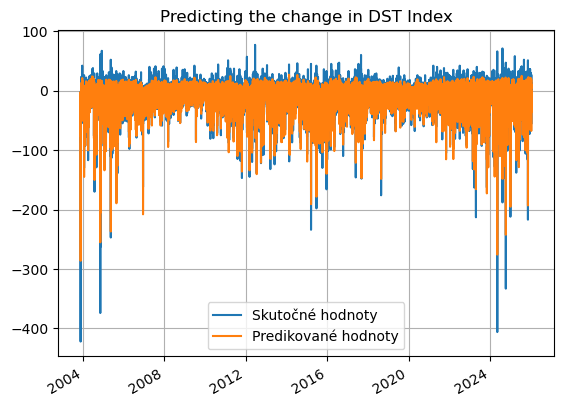

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9034573673748931
MCC=0.7056034588956651
Výkon NN:
MAE: 5.6162, MSE: 76.4758
Perzistentný model:
MAE: 6.0732, MSE: 92.3276
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.53%
MSE Improvement: 17.17%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 28s 35ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 27s 33ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

505/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step 

  4/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

359/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:20 894ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step   

  7/896 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

496/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step 

  7/224 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step 

351/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step


Shapes LSTM:
train: (229350,) (229350,)
val:   (57333,) (57333,)
test:  (194194,) (194194,)
Global sigma (LSTM errors, scaled): 0.4766548
Shapes GP:
X_gp_train: (286683, 6)
y_gp_train: (286683,)
X_test_gp: (194194, 6)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.97**2 * RBF(length_scale=0.382) + WhiteKernel(noise_level=0.629)


Global sigma (LSTM errors): 10.488272
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194194

In [21]:
len(y_pred_persistence)

194187

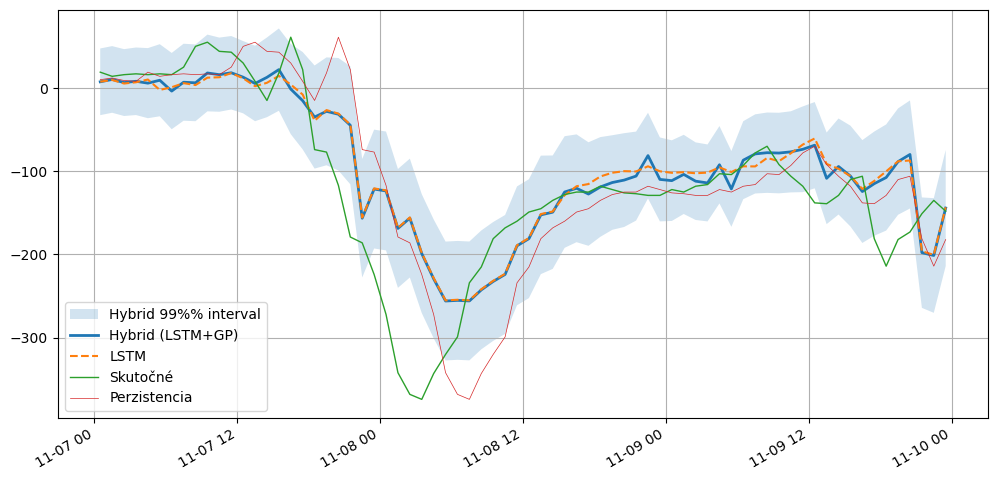

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 83.9982
MAE: 5.9240

--- Klasifikačné metriky (Prah: -19.8 nT) ---
Matthews Correlation Coefficient (MCC): 0.6918

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      143940 |        8115
Skutočná 1 |       11669 |       30463

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.95      0.94    152055
   Trieda 1 (Búrka)       0.79      0.72      0.75     42132

           accuracy                           0.90    194187
          macro avg       0.86      0.83      0.85    194187
       weighted avg       0.90      0.90      0.90    194187



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9034693362583489
MCC=0.7056375713889776
Výkon NN:
MAE: 5.6162, MSE: 76.4758
Perzistentný model:
MAE: 6.0732, MSE: 92.3276
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.53%
MSE Improvement: 17.17%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9248    0.9543    0.9393    152055
           1     0.8137    0.7199    0.7639     42132

    accuracy                         0.9035    194187
   macro avg     0.8693    0.8371    0.8516    194187
weighted avg     0.9007    0.9035    0.9013    194187


===== LSTM+GP =====
ACC=0.8981188236081715
MCC=0.691797367548548
Výkon NN:
MAE: 5.9240, MSE: 83.9982
Perzistentný model:
MAE: 6.0732, MSE: 92.3276
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 2.46%
MSE Improvement: 9.02%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9250    0.9466    0.9357    152055
           1     0.7896    0.7230    0.7549     42132

    


Saved/updated: all_models_report.csv


/tmp/ipykernel_345569/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_345569/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
22,2026-04-26T04:44:18,LSTM,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.1,0.914058,0.742016,"{""text"": "" precision recall f...",4.951872,58.694205,5.299620,68.959107,6.561762,14.885492
23,2026-04-26T04:44:18,LSTM+GP,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.1,0.907266,0.726301,"{""text"": "" precision recall f...",5.232369,64.522202,5.299620,68.959107,1.268994,6.434110
24,2026-04-26T05:49:07,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905011,0.707136,"{""text"": "" precision recall f...",5.554311,75.506244,6.073318,92.330027,8.545698,18.221356
25,2026-04-26T05:49:07,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.900140,0.696833,"{""text"": "" precision recall f...",5.918420,83.402773,6.073318,92.330027,2.550478,9.668852
26,2026-04-26T08:00:15,LSTM,18.0,4.0,DST+4,OMNI2_all,-20.0,-20.5,0.906018,0.710991,"{""text"": "" precision recall f...",5.535369,76.765555,6.073274,92.330599,8.856917,16.857948
27,2026-04-26T08:00:15,LSTM+GP,18.0,4.0,DST+4,OMNI2_all,-20.0,-20.5,0.898808,0.690868,"{""text"": "" precision recall f...",5.811375,81.899407,6.073274,92.330599,4.312316,11.297655
28,2026-04-26T10:23:04,LSTM,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.4,0.907292,0.714163,"{""text"": "" precision recall f...",5.450724,73.729552,6.073117,92.326875,10.248323,20.142914
29,2026-04-26T10:23:04,LSTM+GP,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.4,0.899721,0.691663,"{""text"": "" precision recall f...",5.865822,82.548041,6.073117,92.326875,3.413321,10.591536
30,2026-04-26T11:21:16,LSTM,6.0,4.0,DST+4,OMNI2_all,-20.0,-19.8,0.903469,0.705638,"{""text"": "" precision recall f...",5.616163,76.475804,6.073218,92.327612,7.525756,17.169087
31,2026-04-26T11:21:16,LSTM+GP,6.0,4.0,DST+4,OMNI2_all,-20.0,-19.8,0.898119,0.691797,"{""text"": "" precision recall f...",5.924009,83.998240,6.073218,92.327612,2.456842,9.021540
